In [20]:
# !pip2 install pypolyagamma

from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import importlib
import os
import sys

from base.experiment import *
from logistic.env_logistic import *
from logistic.agent_logistic import *
from utils import *

import numpy as np
import numpy.linalg as npla
import scipy.linalg as spla
import pandas as pd
import plotnine as gg

import warnings
warnings.filterwarnings('ignore')

#import importlib
#importlib.reload(logistic.agent_logistic)
#reload(sys.modules['logistic.agent_logistic'])

In [21]:
#pgts not quite right (dealing with constant term), fix this later

def simple_compare(agents, num_articles, dim, var, n_steps, seed=0, verbosity=0):
    #env = FixedLogisticBandit(num_articles, dim, DistributionWithConstant(NormalDist(0,1,dim=dim-1),-2.5), DistributionWithConstant(BernoulliDist(5.0/(dim-1),dim-1)), seed=seed)
    env = FixedLogisticBandit(num_articles, dim, NormalDist(0,1,dim=dim), BernoulliDist(5.0/(dim),dim), seed=seed)
    experiment = ExperimentCompare(agents, env, n_steps,
                   seed=seed, verbosity=verbosity)
    experiment.run_experiment()
    results = []
    results.append(experiment.results)
    df = pd.DataFrame(results[0])
    cum_regrets = experiment.cum_regret
    #https://stackoverflow.com/questions/39092067/pandas-dataframe-convert-column-type-to-string-or-categorical
    df['agent_id'] = df.agent_id.astype('category')
    print(gg.ggplot(df)
     + gg.aes('t', 'cum_regret', color='agent_id', group='agent_id')
     + gg.geom_point()
     + gg.geom_line())
    print(gg.ggplot(df)
     + gg.aes('t', 'time', color='agent_id', group='agent_id')
     + gg.geom_point()
     + gg.geom_line())
    return results, df, cum_regrets

def simple_compares(make_agents, num_articles, dim, var, n_steps, seeds, verbosity=0):
    results_list = []
    df_list = []
    cum_regrets_list = []
    avg_regrets = np.zeros(len(make_agents))
    for seed in seeds:
        agents = [make_agent() for make_agent in make_agents]
        results, df, cum_regrets = simple_compare(agents, num_articles, dim, var, n_steps, seed=seed, verbosity=verbosity)
        results_list += [results]
        df_list += [df]
        cum_regrets_list += [cum_regrets]
        avg_regrets += cum_regrets
    avg_regrets = avg_regrets / len(seeds)
    return results_list, df_list, cum_regrets_list, avg_regrets    

def hyperparameter_sweep(make_agent_from_hyperparameters, hyperparam_list, dim, var, n_steps, seed=0, verbosity=0):
    agents = [make_agent_from_hyperparameters(hyperparam) for hyperparam in hyperparam_list]
    results, df, cum_regrets = simple_compare(agents, num_articles, dim, var, n_steps, seed=seed, verbosity=verbosity)
    
def hyperparameter_sweeps(make_agent_from_hyperparameters, hyperparam_list, dim, var, n_steps, seeds, verbosity=0):
    results_list = []
    df_list = []
    cum_regrets_list = []
    avg_regrets = np.zeros(len(hyperparam_list))
    for seed in range(seeds):
        agents = [make_agent_from_hyperparameters(hyperparam) for hyperparam in hyperparam_list]
        results, df, cum_regrets = simple_compare(agents, num_articles, dim, var, n_steps, seed=seed, verbosity=verbosity)
        results_list += [results]
        df_list += [df]
        cum_regrets_list += [cum_regrets]
        avg_regrets += cum_regrets
    avg_regrets = avg_regrets / seeds
    return results_list, df_list, cum_regrets_list, avg_regrets


In [22]:
num_articles = 100
dim = 100
var = 1.0
theta_mean = 0
theta_std = 1

time_limit= 0.01

verbosity=0

In [23]:
# We will tune the Langevin, SGLD, and SAGA-LD agents.

make_langevin_agent = lambda hypers: BasicLangevinTS(num_articles, dim, [0]*(dim), cov=None, 
                                              step_size=lambda t: hypers[0]/(1 + t * np.sqrt(dim*var)/dim), n_steps=9999,
                                              time = time_limit,
                                              init_pt=None, verbosity=verbosity)
make_mala_agent = lambda: MalaTS(num_articles, dim, [0]*(dim), cov=None, 
                                 step_size=lambda t: 0.1/(1 + t * np.sqrt(dim*var)/dim), n_steps=9999,
                                 time = time_limit,
                                     init_pt=None, verbosity=verbosity)
make_sgld_agent = lambda hypers: SGLDTS(num_articles, dim, [0]*(dim), cov=None, 
                                        step_size=lambda t: hypers[0]/(1 + t * np.sqrt(dim*var)/dim),
                                        batch_size = hypers[1],
                                        time=time_limit,
                                        n_steps=9999,
                                        init_pt=None, verbosity=verbosity)
make_sagald_agent = lambda hypers: SAGATS(num_articles, dim, [0]*(dim+1), cov=None, 
                                          step_size=lambda t: hypers[0]/(1 + t * np.sqrt(dim*var)/dim),
                                          batch_size = hypers[1],
                                          time=time_limit,
                                          n_steps=9999,
                                          init_pt=None, verbosity=verbosity)

# Untimed MALA agent is used as baseline.

make_mala_agent_untimed = lambda: MalaTS(num_articles, dim, [0]*dim, cov=None, 
                                         step_size=lambda t: 0.1/(1 + t * np.sqrt(dim*var)/dim), n_steps=500,
                                         init_pt=None, verbosity=verbosity)

# Use default settings for Laplace agent for now (would be nice to tune this too). Not time-restricted.
theta_mean = 0
theta_std = 1
epsilon1 = 0.01
epsilon2 = 0.05
alpha=0.2
beta=0.5
tol=0.0001
make_laplace_agent = lambda: LaplaceTSLogisticBandit(num_articles, dim, theta_mean, theta_std, epsilon1,
                                                      alpha,beta,tol, verbosity=verbosity)

# PG-TS has no parameters to tune

make_pgts_agent = lambda: PGTS_Stream(num_articles, dim, intercept=False, context_has_constant=False, 
                                      n_steps=9999, time = time_limit, verbosity=verbosity)

In [24]:
make_best_sgld_agent = lambda: SGLDTS(num_articles, dim, [0]*(dim), cov=None, 
                                        step_size=lambda t: 0.01/(1 + t * np.sqrt(dim*var)/dim),
                                        batch_size = 32,
                                        time=time_limit,
                                        n_steps=9999,
                                        init_pt=None, verbosity=verbosity)
make_best_sagald_agent = lambda: SAGATS(num_articles, dim, [0]*(dim), cov=None, 
                                          step_size=lambda t: 0.05/(1 + t * np.sqrt(dim*var)/dim),
                                          batch_size = 32,
                                          time=time_limit,
                                          n_steps=9999,
                                          init_pt=None, verbosity=verbosity)

make_best_langevin_agent = lambda: BasicLangevinTS(num_articles, dim, [0]*(dim), cov=None, 
                                              step_size=lambda t: 0.1/(1 + t * np.sqrt(dim*var)/dim), n_steps=9999,
                                              time = time_limit,
                                              init_pt=None, verbosity=verbosity)

make_prec_sagald_agent = lambda: SAGATS(num_articles, dim, [0]*(dim), cov=None, 
                                          step_size=lambda t: 0.05,
                                          batch_size = 32,
                                          time=time_limit,
                                          n_steps=9999,
                                          precondition='proper',
                                          init_pt=None, verbosity=verbosity)

theta [ 1.62434536 -0.61175641 -0.52817175 -1.07296862  0.86540763 -2.3015387
  1.74481176 -0.7612069   0.3190391  -0.24937038  1.46210794 -2.06014071
 -0.3224172  -0.38405435  1.13376944 -1.09989127 -0.17242821 -0.87785842
  0.04221375  0.58281521 -1.10061918  1.14472371  0.90159072  0.50249434
  0.90085595 -0.68372786 -0.12289023 -0.93576943 -0.26788808  0.53035547
 -0.69166075 -0.39675353 -0.6871727  -0.84520564 -0.67124613 -0.0126646
 -1.11731035  0.2344157   1.65980218  0.74204416 -0.19183555 -0.88762896
 -0.74715829  1.6924546   0.05080775 -0.63699565  0.19091548  2.10025514
  0.12015895  0.61720311  0.30017032 -0.35224985 -1.1425182  -0.34934272
 -0.20889423  0.58662319  0.83898341  0.93110208  0.28558733  0.88514116
 -0.75439794  1.25286816  0.51292982 -0.29809284  0.48851815 -0.07557171
  1.13162939  1.51981682  2.18557541 -1.39649634 -1.44411381 -0.50446586
  0.16003707  0.87616892  0.31563495 -2.02220122 -0.30620401  0.82797464
  0.23009474  0.76201118 -0.22232814 -0.2007580

Experiment: Step 338
Experiment: Step 339
Experiment: Step 340
Experiment: Step 341
Experiment: Step 342
Experiment: Step 343
Experiment: Step 344
Experiment: Step 345
Experiment: Step 346
Experiment: Step 347
Experiment: Step 348
Experiment: Step 349
Experiment: Step 350
Experiment: Step 351
Experiment: Step 352
Experiment: Step 353
Experiment: Step 354
Experiment: Step 355
Experiment: Step 356
Experiment: Step 357
Experiment: Step 358
Experiment: Step 359
Experiment: Step 360
Experiment: Step 361
Experiment: Step 362
Experiment: Step 363
Experiment: Step 364
Experiment: Step 365
Experiment: Step 366
Experiment: Step 367
Experiment: Step 368
Experiment: Step 369
Experiment: Step 370
Experiment: Step 371
Experiment: Step 372
Experiment: Step 373
Experiment: Step 374
Experiment: Step 375
Experiment: Step 376
Experiment: Step 377
Experiment: Step 378
Experiment: Step 379
Experiment: Step 380
Experiment: Step 381
Experiment: Step 382
Experiment: Step 383
Experiment: Step 384
Experiment: S

Experiment: Step 730
Experiment: Step 731
Experiment: Step 732
Experiment: Step 733
Experiment: Step 734
Experiment: Step 735
Experiment: Step 736
Experiment: Step 737
Experiment: Step 738
Experiment: Step 739
Experiment: Step 740
Experiment: Step 741
Experiment: Step 742
Experiment: Step 743
Experiment: Step 744
Experiment: Step 745
Experiment: Step 746
Experiment: Step 747
Experiment: Step 748
Experiment: Step 749
Experiment: Step 750
Experiment: Step 751
Experiment: Step 752
Experiment: Step 753
Experiment: Step 754
Experiment: Step 755
Experiment: Step 756
Experiment: Step 757
Experiment: Step 758
Experiment: Step 759
Experiment: Step 760
Experiment: Step 761
Experiment: Step 762
Experiment: Step 763
Experiment: Step 764
Experiment: Step 765
Experiment: Step 766
Experiment: Step 767
Experiment: Step 768
Experiment: Step 769
Experiment: Step 770
Experiment: Step 771
Experiment: Step 772
Experiment: Step 773
Experiment: Step 774
Experiment: Step 775
Experiment: Step 776
Experiment: S

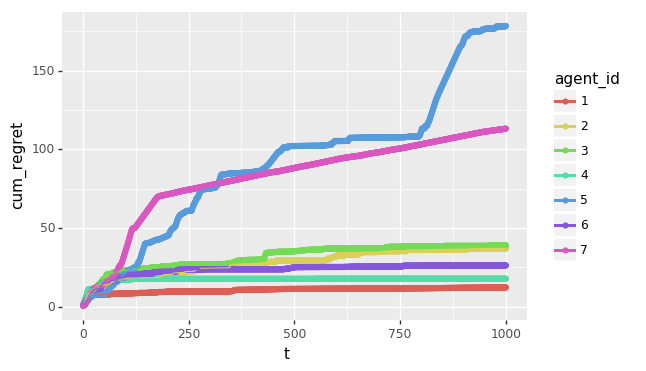

<ggplot: (8751586788357)>


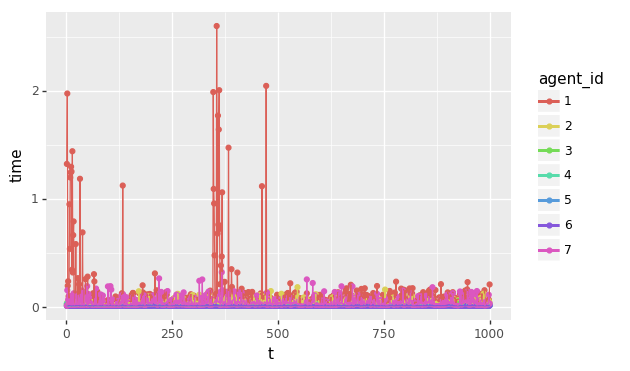

<ggplot: (8751584929105)>


([      action_id agent_id  cum_optimal  cum_regret  instant_regret     t  \
  0             1        1     0.997747    0.584674        0.584674     1   
  1             2        2     0.997747    0.706969        0.706969     1   
  2             3        3     0.997747    0.534823        0.534823     1   
  3             4        4     0.997747    0.849024        0.849024     1   
  4             5        5     0.997747    0.925391        0.925391     1   
  5             6        6     0.997747    0.849024        0.849024     1   
  6             7        7     0.997747    0.438026        0.438026     1   
  7             8        1     1.995494    0.746950        0.162276     2   
  8             9        2     1.995494    1.349489        0.642520     2   
  9            10        3     1.995494    1.369211        0.834388     2   
  10           11        4     1.995494    1.698047        0.849024     2   
  11           12        5     1.995494    1.567911        0.642520     2   

In [25]:
#https://stackoverflow.com/questions/9031783/hide-all-warnings-in-ipython
agents = [make_laplace_agent(),
               make_pgts_agent(),
               make_best_langevin_agent(),
               make_mala_agent(),
               make_best_sgld_agent(),
               make_best_sagald_agent(),
               make_prec_sagald_agent()]
                #,make_mala_agent_untimed]
#simple_compares(make_agents, num_articles, dim, var, 1000, [1], verbosity=verbosity)
#simple_compares(make_agents, num_articles, dim, var, 1000, range(100,105), verbosity=verbosity)
simple_compare(agents, num_articles, dim, var, 1000, seed=1, verbosity=1)

In [26]:
from algorithms.langevin import *
npla.eig(logistic_Hessian(agents[5].theta, agents[5].contexts))

(array([ 1.91382621e+02+0.00000000e+00j,  5.65538330e+01+0.00000000e+00j,
         4.89523029e+01+0.00000000e+00j,  3.00260821e+01+0.00000000e+00j,
         1.51429549e+01+0.00000000e+00j,  1.16155299e+01+0.00000000e+00j,
         1.08925474e+01+0.00000000e+00j,  8.95941108e+00+0.00000000e+00j,
         8.61145588e+00+0.00000000e+00j,  7.83546930e+00+0.00000000e+00j,
         5.83100776e+00+0.00000000e+00j,  5.39827317e+00+0.00000000e+00j,
         4.95225335e+00+0.00000000e+00j,  4.60056746e+00+0.00000000e+00j,
         3.78005409e+00+0.00000000e+00j,  3.41739473e+00+0.00000000e+00j,
         3.27311445e+00+0.00000000e+00j,  3.11489030e+00+0.00000000e+00j,
         2.96028113e+00+0.00000000e+00j,  2.59110833e+00+0.00000000e+00j,
         2.17919427e+00+0.00000000e+00j,  2.06309712e+00+0.00000000e+00j,
         1.97262632e+00+0.00000000e+00j,  1.80512250e+00+0.00000000e+00j,
         1.68848479e+00+0.00000000e+00j,  9.10498830e-01+0.00000000e+00j,
         7.63276122e-01+0.00000000e+00

In [ ]:
#https://stackoverflow.com/questions/9031783/hide-all-warnings-in-ipython
agents2 = [make_laplace_agent(),
               make_pgts_agent(),
               #make_best_langevin_agent(),
               make_mala_agent(),
               #make_best_sgld_agent(),
               make_best_sagald_agent()]
               #make_prec_sagald_agent()]
                #,make_mala_agent_untimed]
#simple_compares(make_agents, num_articles, dim, var, 1000, [1], verbosity=verbosity)
#simple_compares(make_agents, num_articles, dim, var, 1000, range(100,105), verbosity=verbosity)
simple_compare(agents2, num_articles, dim, var, 10000, seed=2, verbosity=1)

theta [-4.16757847e-01 -5.62668272e-02 -2.13619610e+00  1.64027081e+00
 -1.79343559e+00 -8.41747366e-01  5.02881417e-01 -1.24528809e+00
 -1.05795222e+00 -9.09007615e-01  5.51454045e-01  2.29220801e+00
  4.15393930e-02 -1.11792545e+00  5.39058321e-01 -5.96159700e-01
 -1.91304965e-02  1.17500122e+00 -7.47870949e-01  9.02525097e-03
 -8.78107893e-01 -1.56434170e-01  2.56570452e-01 -9.88779049e-01
 -3.38821966e-01 -2.36184031e-01 -6.37655012e-01 -1.18761229e+00
 -1.42121723e+00 -1.53495196e-01 -2.69056960e-01  2.23136679e+00
 -2.43476758e+00  1.12726505e-01  3.70444537e-01  1.35963386e+00
  5.01857207e-01 -8.44213704e-01  9.76147160e-06  5.42352572e-01
 -3.13508197e-01  7.71011738e-01 -1.86809065e+00  1.73118467e+00
  1.46767801e+00 -3.35677339e-01  6.11340780e-01  4.79705919e-02
 -8.29135289e-01  8.77102184e-02  1.00036589e+00 -3.81092518e-01
 -3.75669423e-01 -7.44707629e-02  4.33496330e-01  1.27837923e+00
 -6.34679305e-01  5.08396243e-01  2.16116006e-01 -1.85861239e+00
 -4.19316482e-01 -1

Experiment: Step 319
Experiment: Step 320
Experiment: Step 321
Experiment: Step 322
Experiment: Step 323
Experiment: Step 324
Experiment: Step 325
Experiment: Step 326
Experiment: Step 327
Experiment: Step 328
Experiment: Step 329
Experiment: Step 330
Experiment: Step 331
Experiment: Step 332
Experiment: Step 333
Experiment: Step 334
Experiment: Step 335
Experiment: Step 336
Experiment: Step 337
Experiment: Step 338
Experiment: Step 339
Experiment: Step 340
Experiment: Step 341
Experiment: Step 342
Experiment: Step 343
Experiment: Step 344
Experiment: Step 345
Experiment: Step 346
Experiment: Step 347
Experiment: Step 348
Experiment: Step 349
Experiment: Step 350
Experiment: Step 351
Experiment: Step 352
Experiment: Step 353
Experiment: Step 354
Experiment: Step 355
Experiment: Step 356
Experiment: Step 357
Experiment: Step 358
Experiment: Step 359
Experiment: Step 360
Experiment: Step 361
Experiment: Step 362
Experiment: Step 363
Experiment: Step 364
Experiment: Step 365
Experiment: S

Experiment: Step 710
Experiment: Step 711
Experiment: Step 712
Experiment: Step 713
Experiment: Step 714
Experiment: Step 715
Experiment: Step 716
Experiment: Step 717
Experiment: Step 718
Experiment: Step 719
Experiment: Step 720
Experiment: Step 721
Experiment: Step 722
Experiment: Step 723
Experiment: Step 724
Experiment: Step 725
Experiment: Step 726
Experiment: Step 727
Experiment: Step 728
Experiment: Step 729
Experiment: Step 730
Experiment: Step 731
Experiment: Step 732
Experiment: Step 733
Experiment: Step 734
Experiment: Step 735
Experiment: Step 736
Experiment: Step 737
Experiment: Step 738
Experiment: Step 739
Experiment: Step 740
Experiment: Step 741
Experiment: Step 742
Experiment: Step 743
Experiment: Step 744
Experiment: Step 745
Experiment: Step 746
Experiment: Step 747
Experiment: Step 748
Experiment: Step 749
Experiment: Step 750
Experiment: Step 751
Experiment: Step 752
Experiment: Step 753
Experiment: Step 754
Experiment: Step 755
Experiment: Step 756
Experiment: S

Experiment: Step 1096
Experiment: Step 1097
Experiment: Step 1098
Experiment: Step 1099
Experiment: Step 1100
Experiment: Step 1101
Experiment: Step 1102
Experiment: Step 1103
Experiment: Step 1104
Experiment: Step 1105
Experiment: Step 1106
Experiment: Step 1107
Experiment: Step 1108
Experiment: Step 1109
Experiment: Step 1110
Experiment: Step 1111
Experiment: Step 1112
Experiment: Step 1113
Experiment: Step 1114
Experiment: Step 1115
Experiment: Step 1116
Experiment: Step 1117
Experiment: Step 1118
Experiment: Step 1119
Experiment: Step 1120
Experiment: Step 1121
Experiment: Step 1122
Experiment: Step 1123
Experiment: Step 1124
Experiment: Step 1125
Experiment: Step 1126
Experiment: Step 1127
Experiment: Step 1128
Experiment: Step 1129
Experiment: Step 1130
Experiment: Step 1131
Experiment: Step 1132
Experiment: Step 1133
Experiment: Step 1134
Experiment: Step 1135
Experiment: Step 1136
Experiment: Step 1137
Experiment: Step 1138
Experiment: Step 1139
Experiment: Step 1140
Experiment

Experiment: Step 1470
Experiment: Step 1471
Experiment: Step 1472
Experiment: Step 1473
Experiment: Step 1474
Experiment: Step 1475
Experiment: Step 1476
Experiment: Step 1477
Experiment: Step 1478
Experiment: Step 1479
Experiment: Step 1480
Experiment: Step 1481
Experiment: Step 1482
Experiment: Step 1483
Experiment: Step 1484
Experiment: Step 1485
Experiment: Step 1486
Experiment: Step 1487
Experiment: Step 1488
Experiment: Step 1489
Experiment: Step 1490
Experiment: Step 1491
Experiment: Step 1492
Experiment: Step 1493
Experiment: Step 1494
Experiment: Step 1495
Experiment: Step 1496
Experiment: Step 1497
Experiment: Step 1498
Experiment: Step 1499
Experiment: Step 1500
Experiment: Step 1501
Experiment: Step 1502
Experiment: Step 1503
Experiment: Step 1504
Experiment: Step 1505
Experiment: Step 1506
Experiment: Step 1507
Experiment: Step 1508
Experiment: Step 1509
Experiment: Step 1510
Experiment: Step 1511
Experiment: Step 1512
Experiment: Step 1513
Experiment: Step 1514
Experiment

Experiment: Step 1844
Experiment: Step 1845
Experiment: Step 1846
Experiment: Step 1847
Experiment: Step 1848
Experiment: Step 1849
Experiment: Step 1850
Experiment: Step 1851
Experiment: Step 1852
Experiment: Step 1853
Experiment: Step 1854
Experiment: Step 1855
Experiment: Step 1856
Experiment: Step 1857
Experiment: Step 1858
Experiment: Step 1859
Experiment: Step 1860
Experiment: Step 1861
Experiment: Step 1862
Experiment: Step 1863
Experiment: Step 1864
Experiment: Step 1865
Experiment: Step 1866
Experiment: Step 1867
Experiment: Step 1868
Experiment: Step 1869
Experiment: Step 1870
Experiment: Step 1871
Experiment: Step 1872
Experiment: Step 1873
Experiment: Step 1874
Experiment: Step 1875
Experiment: Step 1876
Experiment: Step 1877
Experiment: Step 1878
Experiment: Step 1879
Experiment: Step 1880
Experiment: Step 1881
Experiment: Step 1882
Experiment: Step 1883
Experiment: Step 1884
Experiment: Step 1885
Experiment: Step 1886
Experiment: Step 1887
Experiment: Step 1888
Experiment

Experiment: Step 2217
Experiment: Step 2218
Experiment: Step 2219
Experiment: Step 2220
Experiment: Step 2221
Experiment: Step 2222
Experiment: Step 2223
Experiment: Step 2224
Experiment: Step 2225
Experiment: Step 2226
Experiment: Step 2227
Experiment: Step 2228
Experiment: Step 2229
Experiment: Step 2230
Experiment: Step 2231
Experiment: Step 2232
Experiment: Step 2233
Experiment: Step 2234
Experiment: Step 2235
Experiment: Step 2236
Experiment: Step 2237
Experiment: Step 2238
Experiment: Step 2239
Experiment: Step 2240
Experiment: Step 2241
Experiment: Step 2242
Experiment: Step 2243
Experiment: Step 2244
Experiment: Step 2245
Experiment: Step 2246
Experiment: Step 2247
Experiment: Step 2248
Experiment: Step 2249
Experiment: Step 2250
Experiment: Step 2251
Experiment: Step 2252
Experiment: Step 2253
Experiment: Step 2254
Experiment: Step 2255
Experiment: Step 2256
Experiment: Step 2257
Experiment: Step 2258
Experiment: Step 2259
Experiment: Step 2260
Experiment: Step 2261
Experiment

Experiment: Step 2590
Experiment: Step 2591
Experiment: Step 2592
Experiment: Step 2593
Experiment: Step 2594
Experiment: Step 2595
Experiment: Step 2596
Experiment: Step 2597
Experiment: Step 2598
Experiment: Step 2599
Experiment: Step 2600
Experiment: Step 2601
Experiment: Step 2602
Experiment: Step 2603
Experiment: Step 2604
Experiment: Step 2605
Experiment: Step 2606
Experiment: Step 2607
Experiment: Step 2608
Experiment: Step 2609
Experiment: Step 2610
Experiment: Step 2611
Experiment: Step 2612
Experiment: Step 2613
Experiment: Step 2614
Experiment: Step 2615
Experiment: Step 2616
Experiment: Step 2617
Experiment: Step 2618
Experiment: Step 2619
Experiment: Step 2620
Experiment: Step 2621
Experiment: Step 2622
Experiment: Step 2623
Experiment: Step 2624
Experiment: Step 2625
Experiment: Step 2626
Experiment: Step 2627
Experiment: Step 2628
Experiment: Step 2629
Experiment: Step 2630
Experiment: Step 2631
Experiment: Step 2632
Experiment: Step 2633
Experiment: Step 2634
Experiment

Experiment: Step 2963
Experiment: Step 2964
Experiment: Step 2965
Experiment: Step 2966
Experiment: Step 2967
Experiment: Step 2968
Experiment: Step 2969
Experiment: Step 2970
Experiment: Step 2971
Experiment: Step 2972
Experiment: Step 2973
Experiment: Step 2974
Experiment: Step 2975
Experiment: Step 2976
Experiment: Step 2977
Experiment: Step 2978
Experiment: Step 2979
Experiment: Step 2980
Experiment: Step 2981
Experiment: Step 2982
Experiment: Step 2983
Experiment: Step 2984
Experiment: Step 2985
Experiment: Step 2986
Experiment: Step 2987
Experiment: Step 2988
Experiment: Step 2989
Experiment: Step 2990
Experiment: Step 2991
Experiment: Step 2992
Experiment: Step 2993
Experiment: Step 2994
Experiment: Step 2995
Experiment: Step 2996
Experiment: Step 2997
Experiment: Step 2998
Experiment: Step 2999
Experiment: Step 3000
Experiment: Step 3001
Experiment: Step 3002
Experiment: Step 3003
Experiment: Step 3004
Experiment: Step 3005
Experiment: Step 3006
Experiment: Step 3007
Experiment

Experiment: Step 3336
Experiment: Step 3337
Experiment: Step 3338
Experiment: Step 3339
Experiment: Step 3340
Experiment: Step 3341
Experiment: Step 3342
Experiment: Step 3343
Experiment: Step 3344
Experiment: Step 3345
Experiment: Step 3346
Experiment: Step 3347
Experiment: Step 3348
Experiment: Step 3349
Experiment: Step 3350
Experiment: Step 3351
Experiment: Step 3352
Experiment: Step 3353
Experiment: Step 3354
Experiment: Step 3355
Experiment: Step 3356
Experiment: Step 3357
Experiment: Step 3358
Experiment: Step 3359
Experiment: Step 3360
Experiment: Step 3361
Experiment: Step 3362
Experiment: Step 3363
Experiment: Step 3364
Experiment: Step 3365
Experiment: Step 3366
Experiment: Step 3367
Experiment: Step 3368
Experiment: Step 3369
Experiment: Step 3370
Experiment: Step 3371
Experiment: Step 3372
Experiment: Step 3373
Experiment: Step 3374
Experiment: Step 3375
Experiment: Step 3376
Experiment: Step 3377
Experiment: Step 3378
Experiment: Step 3379
Experiment: Step 3380
Experiment

Experiment: Step 3709
Experiment: Step 3710
Experiment: Step 3711
Experiment: Step 3712
Experiment: Step 3713
Experiment: Step 3714
Experiment: Step 3715
Experiment: Step 3716
Experiment: Step 3717
Experiment: Step 3718
Experiment: Step 3719
Experiment: Step 3720
Experiment: Step 3721
Experiment: Step 3722
Experiment: Step 3723
Experiment: Step 3724
Experiment: Step 3725
Experiment: Step 3726
Experiment: Step 3727
Experiment: Step 3728
Experiment: Step 3729
Experiment: Step 3730
Experiment: Step 3731
Experiment: Step 3732
Experiment: Step 3733
Experiment: Step 3734
Experiment: Step 3735
Experiment: Step 3736
Experiment: Step 3737
Experiment: Step 3738
Experiment: Step 3739
Experiment: Step 3740
Experiment: Step 3741
Experiment: Step 3742
Experiment: Step 3743
Experiment: Step 3744
Experiment: Step 3745
Experiment: Step 3746
Experiment: Step 3747
Experiment: Step 3748
Experiment: Step 3749
Experiment: Step 3750
Experiment: Step 3751
Experiment: Step 3752
Experiment: Step 3753
Experiment

Experiment: Step 4082
Experiment: Step 4083
Experiment: Step 4084
Experiment: Step 4085
Experiment: Step 4086
Experiment: Step 4087
Experiment: Step 4088
Experiment: Step 4089
Experiment: Step 4090
Experiment: Step 4091
Experiment: Step 4092
Experiment: Step 4093
Experiment: Step 4094
Experiment: Step 4095
Experiment: Step 4096
Experiment: Step 4097
Experiment: Step 4098
Experiment: Step 4099
Experiment: Step 4100
Experiment: Step 4101
Experiment: Step 4102
Experiment: Step 4103
Experiment: Step 4104
Experiment: Step 4105
Experiment: Step 4106
Experiment: Step 4107
Experiment: Step 4108
Experiment: Step 4109
Experiment: Step 4110
Experiment: Step 4111
Experiment: Step 4112
Experiment: Step 4113
Experiment: Step 4114
Experiment: Step 4115
Experiment: Step 4116
Experiment: Step 4117
Experiment: Step 4118
Experiment: Step 4119
Experiment: Step 4120
Experiment: Step 4121
Experiment: Step 4122
Experiment: Step 4123
Experiment: Step 4124
Experiment: Step 4125
Experiment: Step 4126
Experiment

Experiment: Step 4455
Experiment: Step 4456
Experiment: Step 4457
Experiment: Step 4458
Experiment: Step 4459
Experiment: Step 4460
Experiment: Step 4461
Experiment: Step 4462
Experiment: Step 4463
Experiment: Step 4464
Experiment: Step 4465
Experiment: Step 4466
Experiment: Step 4467
Experiment: Step 4468
Experiment: Step 4469
Experiment: Step 4470
Experiment: Step 4471
Experiment: Step 4472
Experiment: Step 4473
Experiment: Step 4474
Experiment: Step 4475
Experiment: Step 4476
Experiment: Step 4477
Experiment: Step 4478
Experiment: Step 4479
Experiment: Step 4480
Experiment: Step 4481
Experiment: Step 4482
Experiment: Step 4483
Experiment: Step 4484
Experiment: Step 4485
Experiment: Step 4486
Experiment: Step 4487
Experiment: Step 4488
Experiment: Step 4489
Experiment: Step 4490
Experiment: Step 4491
Experiment: Step 4492
Experiment: Step 4493
Experiment: Step 4494
Experiment: Step 4495
Experiment: Step 4496
Experiment: Step 4497
Experiment: Step 4498
Experiment: Step 4499
Experiment

Experiment: Step 4828
Experiment: Step 4829
Experiment: Step 4830
Experiment: Step 4831
Experiment: Step 4832
Experiment: Step 4833
Experiment: Step 4834
Experiment: Step 4835
Experiment: Step 4836
Experiment: Step 4837
Experiment: Step 4838
Experiment: Step 4839
Experiment: Step 4840
Experiment: Step 4841
Experiment: Step 4842
Experiment: Step 4843
Experiment: Step 4844
Experiment: Step 4845
Experiment: Step 4846
Experiment: Step 4847
Experiment: Step 4848
Experiment: Step 4849
Experiment: Step 4850
Experiment: Step 4851
Experiment: Step 4852
Experiment: Step 4853
Experiment: Step 4854
Experiment: Step 4855
Experiment: Step 4856
Experiment: Step 4857
Experiment: Step 4858
Experiment: Step 4859
Experiment: Step 4860
Experiment: Step 4861
Experiment: Step 4862
Experiment: Step 4863
Experiment: Step 4864
Experiment: Step 4865
Experiment: Step 4866
Experiment: Step 4867
Experiment: Step 4868
Experiment: Step 4869
Experiment: Step 4870
Experiment: Step 4871
Experiment: Step 4872
Experiment

Experiment: Step 5201
Experiment: Step 5202
Experiment: Step 5203
Experiment: Step 5204
Experiment: Step 5205
Experiment: Step 5206
Experiment: Step 5207
Experiment: Step 5208
Experiment: Step 5209
Experiment: Step 5210
Experiment: Step 5211
Experiment: Step 5212
Experiment: Step 5213
Experiment: Step 5214
Experiment: Step 5215
Experiment: Step 5216
Experiment: Step 5217
Experiment: Step 5218
Experiment: Step 5219
Experiment: Step 5220
Experiment: Step 5221
Experiment: Step 5222
Experiment: Step 5223
Experiment: Step 5224
Experiment: Step 5225
Experiment: Step 5226
Experiment: Step 5227
Experiment: Step 5228
Experiment: Step 5229
Experiment: Step 5230
Experiment: Step 5231
Experiment: Step 5232
Experiment: Step 5233
Experiment: Step 5234
Experiment: Step 5235
Experiment: Step 5236
Experiment: Step 5237
Experiment: Step 5238
Experiment: Step 5239
Experiment: Step 5240
Experiment: Step 5241
Experiment: Step 5242
Experiment: Step 5243
Experiment: Step 5244
Experiment: Step 5245
Experiment

Experiment: Step 5574
Experiment: Step 5575
Experiment: Step 5576
Experiment: Step 5577
Experiment: Step 5578
Experiment: Step 5579
Experiment: Step 5580
Experiment: Step 5581
Experiment: Step 5582
Experiment: Step 5583
Experiment: Step 5584
Experiment: Step 5585
Experiment: Step 5586
Experiment: Step 5587
Experiment: Step 5588
Experiment: Step 5589
Experiment: Step 5590
Experiment: Step 5591
Experiment: Step 5592
Experiment: Step 5593
Experiment: Step 5594
Experiment: Step 5595
Experiment: Step 5596
Experiment: Step 5597
Experiment: Step 5598
Experiment: Step 5599
Experiment: Step 5600
Experiment: Step 5601
Experiment: Step 5602
Experiment: Step 5603
Experiment: Step 5604
Experiment: Step 5605
Experiment: Step 5606
Experiment: Step 5607
Experiment: Step 5608
Experiment: Step 5609
Experiment: Step 5610
Experiment: Step 5611
Experiment: Step 5612
Experiment: Step 5613
Experiment: Step 5614
Experiment: Step 5615
Experiment: Step 5616
Experiment: Step 5617
Experiment: Step 5618
Experiment

Experiment: Step 5947
Experiment: Step 5948
Experiment: Step 5949
Experiment: Step 5950
Experiment: Step 5951
Experiment: Step 5952
Experiment: Step 5953
Experiment: Step 5954
Experiment: Step 5955
Experiment: Step 5956
Experiment: Step 5957
Experiment: Step 5958
Experiment: Step 5959
Experiment: Step 5960
Experiment: Step 5961
Experiment: Step 5962
Experiment: Step 5963
Experiment: Step 5964
Experiment: Step 5965
Experiment: Step 5966
Experiment: Step 5967
Experiment: Step 5968
Experiment: Step 5969
Experiment: Step 5970
Experiment: Step 5971
Experiment: Step 5972
Experiment: Step 5973
Experiment: Step 5974
Experiment: Step 5975
Experiment: Step 5976
Experiment: Step 5977
Experiment: Step 5978
Experiment: Step 5979
Experiment: Step 5980
Experiment: Step 5981
Experiment: Step 5982
Experiment: Step 5983
Experiment: Step 5984
Experiment: Step 5985
Experiment: Step 5986
Experiment: Step 5987
Experiment: Step 5988
Experiment: Step 5989
Experiment: Step 5990
Experiment: Step 5991
Experiment

Experiment: Step 6320
Experiment: Step 6321
Experiment: Step 6322
Experiment: Step 6323
Experiment: Step 6324
Experiment: Step 6325
Experiment: Step 6326
Experiment: Step 6327
Experiment: Step 6328
Experiment: Step 6329
Experiment: Step 6330
Experiment: Step 6331
Experiment: Step 6332
Experiment: Step 6333
Experiment: Step 6334
Experiment: Step 6335
Experiment: Step 6336
Experiment: Step 6337
Experiment: Step 6338
Experiment: Step 6339
Experiment: Step 6340
Experiment: Step 6341
Experiment: Step 6342
Experiment: Step 6343
Experiment: Step 6344
Experiment: Step 6345
Experiment: Step 6346
Experiment: Step 6347
Experiment: Step 6348
Experiment: Step 6349
Experiment: Step 6350
Experiment: Step 6351
Experiment: Step 6352
Experiment: Step 6353
Experiment: Step 6354
Experiment: Step 6355
Experiment: Step 6356
Experiment: Step 6357
Experiment: Step 6358
Experiment: Step 6359
Experiment: Step 6360
Experiment: Step 6361
Experiment: Step 6362
Experiment: Step 6363
Experiment: Step 6364
Experiment

Experiment: Step 6693
Experiment: Step 6694
Experiment: Step 6695
Experiment: Step 6696
Experiment: Step 6697
Experiment: Step 6698
Experiment: Step 6699
Experiment: Step 6700
Experiment: Step 6701
Experiment: Step 6702
Experiment: Step 6703
Experiment: Step 6704
Experiment: Step 6705
Experiment: Step 6706
Experiment: Step 6707
Experiment: Step 6708
Experiment: Step 6709
Experiment: Step 6710
Experiment: Step 6711
Experiment: Step 6712
Experiment: Step 6713
Experiment: Step 6714
Experiment: Step 6715
Experiment: Step 6716
Experiment: Step 6717
Experiment: Step 6718
Experiment: Step 6719
Experiment: Step 6720
Experiment: Step 6721
Experiment: Step 6722
Experiment: Step 6723
Experiment: Step 6724
Experiment: Step 6725
Experiment: Step 6726
Experiment: Step 6727
Experiment: Step 6728
Experiment: Step 6729
Experiment: Step 6730
Experiment: Step 6731
Experiment: Step 6732
Experiment: Step 6733
Experiment: Step 6734
Experiment: Step 6735
Experiment: Step 6736
Experiment: Step 6737
Experiment

Experiment: Step 7066
Experiment: Step 7067
Experiment: Step 7068
Experiment: Step 7069
Experiment: Step 7070
Experiment: Step 7071
Experiment: Step 7072
Experiment: Step 7073
Experiment: Step 7074
Experiment: Step 7075
Experiment: Step 7076
Experiment: Step 7077
Experiment: Step 7078
Experiment: Step 7079
Experiment: Step 7080
Experiment: Step 7081
Experiment: Step 7082
Experiment: Step 7083
Experiment: Step 7084
Experiment: Step 7085
Experiment: Step 7086
Experiment: Step 7087
Experiment: Step 7088
Experiment: Step 7089
Experiment: Step 7090
Experiment: Step 7091
Experiment: Step 7092
Experiment: Step 7093
Experiment: Step 7094
Experiment: Step 7095
Experiment: Step 7096
Experiment: Step 7097
Experiment: Step 7098
Experiment: Step 7099
Experiment: Step 7100
Experiment: Step 7101
Experiment: Step 7102
Experiment: Step 7103
Experiment: Step 7104
Experiment: Step 7105
Experiment: Step 7106
Experiment: Step 7107
Experiment: Step 7108
Experiment: Step 7109
Experiment: Step 7110
Experiment

Experiment: Step 7439
Experiment: Step 7440
Experiment: Step 7441
Experiment: Step 7442
Experiment: Step 7443
Experiment: Step 7444
Experiment: Step 7445
Experiment: Step 7446
Experiment: Step 7447
Experiment: Step 7448
Experiment: Step 7449
Experiment: Step 7450
Experiment: Step 7451
Experiment: Step 7452
Experiment: Step 7453
Experiment: Step 7454
Experiment: Step 7455
Experiment: Step 7456
Experiment: Step 7457
Experiment: Step 7458
Experiment: Step 7459
Experiment: Step 7460
Experiment: Step 7461
Experiment: Step 7462
Experiment: Step 7463
Experiment: Step 7464
Experiment: Step 7465
Experiment: Step 7466
Experiment: Step 7467
Experiment: Step 7468
Experiment: Step 7469
Experiment: Step 7470
Experiment: Step 7471
Experiment: Step 7472
Experiment: Step 7473
Experiment: Step 7474
Experiment: Step 7475
Experiment: Step 7476
Experiment: Step 7477
Experiment: Step 7478
Experiment: Step 7479
Experiment: Step 7480
Experiment: Step 7481
Experiment: Step 7482
Experiment: Step 7483
Experiment

Experiment: Step 7812
Experiment: Step 7813
Experiment: Step 7814
Experiment: Step 7815
Experiment: Step 7816
Experiment: Step 7817
Experiment: Step 7818
Experiment: Step 7819
Experiment: Step 7820
Experiment: Step 7821
Experiment: Step 7822
Experiment: Step 7823
Experiment: Step 7824
Experiment: Step 7825
Experiment: Step 7826
Experiment: Step 7827
Experiment: Step 7828
Experiment: Step 7829
Experiment: Step 7830
Experiment: Step 7831
Experiment: Step 7832
Experiment: Step 7833
Experiment: Step 7834
Experiment: Step 7835
Experiment: Step 7836
Experiment: Step 7837
Experiment: Step 7838
Experiment: Step 7839
Experiment: Step 7840
Experiment: Step 7841
Experiment: Step 7842
Experiment: Step 7843
Experiment: Step 7844
Experiment: Step 7845
Experiment: Step 7846
Experiment: Step 7847
Experiment: Step 7848
Experiment: Step 7849
Experiment: Step 7850
Experiment: Step 7851
Experiment: Step 7852
Experiment: Step 7853
Experiment: Step 7854
Experiment: Step 7855
Experiment: Step 7856
Experiment

Experiment: Step 8185
Experiment: Step 8186
Experiment: Step 8187
Experiment: Step 8188
Experiment: Step 8189
Experiment: Step 8190
Experiment: Step 8191
Experiment: Step 8192
Experiment: Step 8193
Experiment: Step 8194
Experiment: Step 8195
Experiment: Step 8196
Experiment: Step 8197
Experiment: Step 8198
Experiment: Step 8199
Experiment: Step 8200
Experiment: Step 8201
Experiment: Step 8202
Experiment: Step 8203
Experiment: Step 8204
Experiment: Step 8205
Experiment: Step 8206
Experiment: Step 8207
Experiment: Step 8208
Experiment: Step 8209
Experiment: Step 8210
Experiment: Step 8211
Experiment: Step 8212
Experiment: Step 8213
Experiment: Step 8214
Experiment: Step 8215
Experiment: Step 8216
Experiment: Step 8217
Experiment: Step 8218
Experiment: Step 8219
Experiment: Step 8220
Experiment: Step 8221
Experiment: Step 8222
Experiment: Step 8223
Experiment: Step 8224
Experiment: Step 8225
Experiment: Step 8226
Experiment: Step 8227
Experiment: Step 8228
Experiment: Step 8229
Experiment

Experiment: Step 8558
Experiment: Step 8559
Experiment: Step 8560
Experiment: Step 8561
Experiment: Step 8562
Experiment: Step 8563
Experiment: Step 8564
Experiment: Step 8565
Experiment: Step 8566
Experiment: Step 8567
Experiment: Step 8568
Experiment: Step 8569
Experiment: Step 8570
Experiment: Step 8571
Experiment: Step 8572
Experiment: Step 8573
Experiment: Step 8574
Experiment: Step 8575
Experiment: Step 8576
Experiment: Step 8577
Experiment: Step 8578
Experiment: Step 8579
Experiment: Step 8580
Experiment: Step 8581
Experiment: Step 8582
Experiment: Step 8583
Experiment: Step 8584
Experiment: Step 8585
Experiment: Step 8586
Experiment: Step 8587
Experiment: Step 8588
Experiment: Step 8589
Experiment: Step 8590
Experiment: Step 8591
Experiment: Step 8592
Experiment: Step 8593
Experiment: Step 8594
Experiment: Step 8595
Experiment: Step 8596
Experiment: Step 8597
Experiment: Step 8598
Experiment: Step 8599
Experiment: Step 8600
Experiment: Step 8601
Experiment: Step 8602
Experiment

Experiment: Step 8931
Experiment: Step 8932
Experiment: Step 8933
Experiment: Step 8934
Experiment: Step 8935
Experiment: Step 8936
Experiment: Step 8937
Experiment: Step 8938
Experiment: Step 8939
Experiment: Step 8940
Experiment: Step 8941
Experiment: Step 8942
Experiment: Step 8943
Experiment: Step 8944
Experiment: Step 8945
Experiment: Step 8946
Experiment: Step 8947
Experiment: Step 8948
Experiment: Step 8949
Experiment: Step 8950
Experiment: Step 8951
Experiment: Step 8952
Experiment: Step 8953
Experiment: Step 8954
Experiment: Step 8955
Experiment: Step 8956
Experiment: Step 8957
Experiment: Step 8958
Experiment: Step 8959
Experiment: Step 8960
Experiment: Step 8961
Experiment: Step 8962
Experiment: Step 8963
Experiment: Step 8964
Experiment: Step 8965
Experiment: Step 8966
Experiment: Step 8967
Experiment: Step 8968
Experiment: Step 8969
Experiment: Step 8970
Experiment: Step 8971
Experiment: Step 8972
Experiment: Step 8973
Experiment: Step 8974
Experiment: Step 8975
Experiment

Experiment: Step 9304
Experiment: Step 9305
Experiment: Step 9306
Experiment: Step 9307
Experiment: Step 9308
Experiment: Step 9309
Experiment: Step 9310
Experiment: Step 9311
Experiment: Step 9312
Experiment: Step 9313
Experiment: Step 9314
Experiment: Step 9315
Experiment: Step 9316
Experiment: Step 9317
Experiment: Step 9318
Experiment: Step 9319
Experiment: Step 9320
Experiment: Step 9321
Experiment: Step 9322
Experiment: Step 9323
Experiment: Step 9324
Experiment: Step 9325
Experiment: Step 9326
Experiment: Step 9327
Experiment: Step 9328
Experiment: Step 9329
Experiment: Step 9330
Experiment: Step 9331
Experiment: Step 9332
Experiment: Step 9333
Experiment: Step 9334
Experiment: Step 9335
Experiment: Step 9336
Experiment: Step 9337
Experiment: Step 9338
Experiment: Step 9339
Experiment: Step 9340
Experiment: Step 9341
Experiment: Step 9342
Experiment: Step 9343
Experiment: Step 9344
Experiment: Step 9345
Experiment: Step 9346
Experiment: Step 9347
Experiment: Step 9348
Experiment

# Scratch

theta [-2.5         1.62434536 -0.61175641 -0.52817175 -1.07296862  0.86540763
 -2.3015387   1.74481176 -0.7612069   0.3190391  -0.24937038  1.46210794
 -2.06014071 -0.3224172  -0.38405435  1.13376944 -1.09989127 -0.17242821
 -0.87785842  0.04221375  0.58281521 -1.10061918  1.14472371  0.90159072
  0.50249434  0.90085595 -0.68372786 -0.12289023 -0.93576943 -0.26788808
  0.53035547 -0.69166075 -0.39675353 -0.6871727  -0.84520564 -0.67124613
 -0.0126646  -1.11731035  0.2344157   1.65980218  0.74204416 -0.19183555
 -0.88762896 -0.74715829  1.6924546   0.05080775 -0.63699565  0.19091548
  2.10025514  0.12015895  0.61720311  0.30017032 -0.35224985 -1.1425182
 -0.34934272 -0.20889423  0.58662319  0.83898341  0.93110208  0.28558733
  0.88514116 -0.75439794  1.25286816  0.51292982 -0.29809284  0.48851815
 -0.07557171  1.13162939  1.51981682  2.18557541 -1.39649634 -1.44411381
 -0.50446586  0.16003707  0.87616892  0.31563495 -2.02220122 -0.30620401
  0.82797464  0.23009474  0.76201118 -0.222328

 Steps taken: 1
 Sample: array([-0.40804219,  0.00410009,  0.11288066, -0.89705815, -0.35498505,
        0.21265119, -0.3818163 ,  0.15413476, -1.01474698, -1.20911414,
       -0.71162598, -1.00793102, -0.58404797, -1.12833655, -0.08150845,
       -0.40491459, -0.68923225, -1.60314334,  0.71523163,  0.8897754 ,
        0.0296437 , -0.84967109, -0.79713965, -0.55463912, -0.65357728,
        0.45532293, -0.87943722,  0.25955119,  1.32002592,  1.09017971,
        0.56143727, -0.17444481, -0.70284434, -0.98209608,  0.82808175,
       -0.89864926, -0.05049248, -1.13403976,  0.22242047, -1.87918316,
        0.18634148, -0.62010682,  0.09946622,  0.39542444, -0.74720895,
       -0.19193862, -0.10452065, -1.22917909, -0.63140386, -0.01350424,
        0.3323293 ,  0.23984531,  0.12429712, -0.19861828,  0.37322808,
        0.95910292, -0.91072653,  0.35966968, -1.99733487,  1.7320016 ,
        0.8536401 , -0.77311186,  1.49330882, -0.42175636, -0.02788663,
        0.30792894,  1.11570664, -0.134

 Steps taken: 1
 Sample: array([-1.70659268,  0.85565478,  0.02679525,  1.66225232, -0.53012966,
        1.26147139, -0.48548044, -0.37026139, -0.25947348, -0.97697679,
       -1.03293115, -1.98502997, -0.55911709, -3.03260002,  0.36347966,
       -0.52245384,  1.0821201 ,  0.74564072, -0.02242159,  0.14451491,
        1.01866934, -0.22046401,  1.56874334, -0.39901921, -0.77777009,
       -0.55565206, -0.93094917, -0.56254685,  1.35760815, -0.1069963 ,
       -0.35334012,  0.7314549 ,  1.01242571, -0.74141713, -0.63540746,
       -0.38394031, -0.161734  , -0.48821408, -0.92931621, -0.36409457,
       -0.59261477, -0.66778973, -1.15234294, -0.33444897, -0.47483743,
       -0.34883862,  1.13644038,  0.50582085, -0.77582948,  0.86621316,
       -1.2539065 ,  1.12851478,  0.25523566,  0.41569029, -1.03114292,
        1.83028099,  1.03348677, -1.55042393,  0.85212809,  0.51541943,
        0.76898564, -0.40296396,  0.17082821, -0.14626936, -0.96905862,
       -1.91545401,  1.00128867, -0.941

 Steps taken: 1
 Sample: array([-0.63115729, -0.42415318,  0.94129615,  0.2171136 ,  0.38801162,
        0.17378146, -2.09016921, -0.45031084,  2.02737444, -0.16130457,
       -0.80952315, -0.61524592, -0.62118614,  1.03851312,  0.44460528,
        0.14923664,  0.30383765,  0.95005331, -2.6546081 , -2.88228839,
        0.26865813, -1.29863008, -1.35811724,  0.77321566,  0.3203822 ,
        0.06488292,  1.28530968, -0.48988525, -0.03744365,  0.97822299,
       -0.05123587,  0.06097241, -1.04494047,  0.03827118, -0.33511865,
        0.88808488,  0.37034436,  0.25102923, -0.41544865, -0.5064679 ,
       -1.00968181,  0.01833004,  0.30893705, -0.11969586,  0.35837584,
        0.58639505, -0.69556333,  1.17968011,  1.6434917 , -1.20293445,
       -0.9506224 ,  0.61061531,  0.30492818, -0.54536427,  0.59438137,
        0.2644727 ,  1.21020029,  1.45646782, -0.19535089,  0.72666802,
        1.52586764,  0.89601788, -0.24321661,  0.65419927, -1.40304026,
       -1.31535374, -0.21209759, -1.070

 Steps taken: 1
 Sample: array([ 2.86843444, -0.14916   , -0.24653209, -0.16601775, -0.28792643,
       -1.33918231,  0.57838084,  1.14624364, -0.48565246, -0.16266222,
        0.36007257, -0.53682876, -0.96549485, -0.44347998, -1.41000824,
       -0.84162073, -0.40454965,  0.25326627,  0.26513036,  0.7073826 ,
       -1.10134945, -0.14908547, -0.39776718,  0.28179012,  1.50350525,
        0.50805835, -0.3815045 , -0.10244185,  0.32295338,  0.04993187,
       -0.86433551, -0.85686624,  1.00182185,  0.89544472, -0.1595239 ,
        1.69272797, -0.77626266,  0.07280387, -2.21275782, -0.20182714,
        0.80598404, -0.60451179, -1.17352383, -1.28112104,  0.16760064,
        2.02865961, -0.99817111,  1.58317354,  1.17235715,  0.86761859,
        0.01639025, -0.69882308, -0.2268427 ,  0.86754169,  1.73257575,
        0.58837281,  0.89160119,  0.71798039,  1.54757228, -0.92747004,
       -2.07661151, -0.90445284,  0.14538846, -0.54126229,  0.77586224,
        0.85984126,  1.00891023,  0.158

 Sample: array([ 1.04117459,  0.92208461, -0.19858992,  1.80214503,  0.03293453,
       -1.23189694,  0.40971095, -0.50575209,  0.34686582, -1.74039753,
       -1.21329666,  0.59298996, -0.83495258, -0.77759569, -1.51051464,
        0.01425459, -1.69568903, -1.03464003, -1.47067109, -0.98064667,
       -0.33860165,  0.62445335,  1.55646097, -1.11777361,  0.18338895,
        0.28080318, -1.27797685, -1.7608601 ,  0.57318584,  0.88257924,
       -1.27612629,  0.6565287 ,  1.03247807,  0.07340364,  1.15000686,
        0.7431365 , -0.65107369,  0.76236988,  1.48096809,  0.45664813,
        1.65643309, -1.12109371, -0.10100682,  0.07071827,  1.43371926,
       -1.23882175,  0.09221622, -1.28579147, -1.96485977, -0.10553767,
        0.29255823,  1.4982499 , -0.00923483,  1.68648529,  1.5048517 ,
       -1.38244066, -1.89890757,  0.58204498,  1.73867094,  0.56921281,
       -1.43621891, -1.09807148, -1.00094462, -0.64938683, -1.29300622,
       -0.63321844, -0.18023438, -0.88320327,  0.644453

 Steps taken: 1
 Sample: array([ 0.20969434, -0.66716696,  0.30167541,  1.89461889, -1.45749266,
       -0.11800409, -0.38475527, -0.89438139, -0.41213357,  0.27196376,
       -0.50241661, -1.53788265,  0.99272745,  1.3561834 , -0.40478487,
       -0.32119298,  0.25119861, -0.14003119,  1.31388704,  1.35879521,
       -2.1724172 ,  1.08842844,  0.07224946, -0.32676982,  0.41351467,
       -1.86621728, -1.59727077, -0.17502423,  0.3598554 ,  1.84769849,
        0.8578661 , -0.1349231 ,  0.72991707, -0.47289106,  0.18847829,
        0.372615  ,  0.04214463, -1.07202315,  0.52827454, -0.56764208,
       -3.18746922, -1.49631934,  0.22093135,  0.30801176,  0.71935978,
        0.58347031,  0.2630792 , -1.06923414, -0.34298373,  1.8398347 ,
       -0.85709015,  1.32828817,  0.68832443,  0.89647407, -0.72273749,
       -0.00933389, -1.41000857,  0.55322738,  0.77370026, -0.22921481,
       -0.07786135, -0.49739883, -0.38097618, -1.69504752,  1.27232398,
        0.65880148, -1.41217317, -0.877

 Steps taken: 1
 Sample: array([-1.64310354,  0.27018128,  2.7991362 , -0.02223801, -0.49527431,
        0.43587037,  0.05331705, -0.38665908, -0.37478312,  2.13154359,
        1.51752536, -1.93151489, -1.93509726,  0.50385714, -1.45968992,
        1.95621044,  0.84029383,  1.43443975, -0.39249682,  0.02395571,
        0.09007706, -1.64491539, -0.32634329, -0.92262498, -0.37785343,
       -0.39208915,  0.89684691, -0.08826758, -0.0997774 , -0.23411547,
        0.58923824,  0.15602876,  1.17274531, -0.71186162,  1.41536417,
       -0.23638029,  1.20268689,  0.05712777, -0.52255709, -0.5764232 ,
       -0.84272541, -1.41149287,  0.05556724,  1.10591849, -0.87956747,
       -0.26714081, -0.92005919, -0.61454309,  0.29221506,  0.40130675,
       -1.56810463, -0.05341514, -0.47787445,  1.78367266,  0.58998338,
       -0.37257993, -0.45153514,  1.27605122, -1.19408418, -0.66826907,
       -3.1810117 , -0.84768526,  0.07964606, -1.7847636 , -1.31654246,
       -0.24523786,  0.30602641, -0.359

 Steps taken: 1
 Sample: array([-1.68691853,  1.1043063 , -0.91999194, -0.47837112, -0.34340503,
        0.10066535,  0.40769959,  0.08595093, -0.02944303, -0.91265152,
       -0.25302063,  0.3069572 , -1.31414421,  1.3411139 ,  0.17490638,
        0.28357287,  0.45462185,  1.39924184, -0.84221902, -1.32698326,
       -0.36815223,  0.42939912,  0.97619747, -1.58751525,  1.28402043,
        0.22250097, -1.91609526,  1.54552027,  0.98611332,  0.82210955,
        0.45108655, -0.19999091, -0.23653662,  1.11428274, -0.76727052,
       -0.21758244, -0.67518442, -0.29265374,  0.77667751,  3.60419274,
        0.73505451,  1.64851313,  0.60076265,  0.90646365, -0.58078353,
       -1.56060948, -1.12188763,  0.30382922,  0.43485146, -1.39532767,
       -2.12921139,  0.75639944,  1.60249973,  0.99319203,  1.02447914,
        0.60952184, -0.0986755 ,  0.417494  ,  0.4252552 , -0.00446134,
       -1.52244682, -0.60853335,  0.60936666, -2.36489239,  0.44406011,
       -0.10658666,  0.27023925,  0.224

 Steps taken: 1
 Sample: array([ 1.86648624e-01, -2.90527325e-01, -1.73769376e-01,  2.32652266e-01,
       -4.15377986e-01, -2.69827944e-01,  8.27459490e-01, -6.93227872e-01,
        3.24123037e-01,  3.47558194e-01, -4.84185326e-01, -5.97882480e-01,
       -3.10118418e-01, -1.90686642e-01, -3.41348471e-01,  9.60427572e-01,
       -4.08334941e-01,  5.18583758e-01, -1.33475694e+00,  1.42223622e+00,
       -7.20683336e-01, -5.46249479e-01, -1.12285052e+00,  1.45433974e+00,
        7.35850937e-01, -8.75171993e-01,  3.24964159e-01,  1.81391216e-01,
        1.16340058e+00, -3.08252920e-01, -9.29899944e-01,  1.30884203e+00,
        3.92997250e-01,  3.41605981e-01, -4.71572390e-01,  1.94736002e+00,
        1.13834781e+00,  1.26503066e+00,  4.42233133e-01, -2.36641940e-01,
        1.42866121e+00,  9.71578370e-02,  4.69896779e-01, -8.38560307e-01,
        1.00520788e+00, -7.06344543e-01,  1.60325946e-01, -6.69195258e-01,
       -8.49118368e-01, -3.24959504e-01,  1.87717832e-02,  6.44151726e-01,


 Laplace sample: array([ 0.54761293,  1.84136568,  1.05637759, -0.05057174,  0.64484703,
        1.42591489,  0.79000144,  1.78596474, -0.23460967, -0.43073982,
       -1.0528729 , -1.30066942, -1.49376322, -1.56937598,  0.09474276,
       -2.11400545, -0.05047569, -0.91816427, -0.75926137, -1.37302079,
        0.74916945,  1.34919573, -1.17517848,  0.76968182,  2.0059543 ,
        1.17984372,  0.51693287, -0.25823886, -0.04417996,  1.26157498,
        2.03898934, -0.46227154, -0.84819914, -1.70093779,  0.4922853 ,
        2.26737899, -0.18394224, -1.06626162, -0.16106994,  0.17019583,
        0.18889838,  0.17238214, -0.20102893, -0.19958229,  0.30186688,
       -0.83752358,  0.36136114, -0.08478151,  1.46260702,  0.67198689,
       -0.49059331, -0.36511933,  0.62890423, -1.92173599, -0.10849357,
        1.0215871 , -0.10869164, -2.35265755,  2.18282847, -0.91464072,
        1.05192567, -0.11167953,  0.26620085, -1.4710825 ,  1.59714186,
       -1.10513116, -0.93420936, -1.01893998, -

 Steps taken: 1
 Sample: array([-0.3901049 ,  0.37872568,  0.29382886, -0.16531999,  0.98016612,
       -1.42571855, -0.01231394, -0.32967222, -1.74985046,  0.00565956,
       -0.58469471,  0.15750186, -0.47078512,  1.28017776,  1.51298839,
        0.43136192, -1.30909337, -0.52647273, -0.51644006,  1.12398613,
       -1.62726401, -0.16491881,  0.57412445, -0.43067139, -0.86826434,
        1.3621268 , -0.12703683, -0.20936522,  0.88557249,  0.19121818,
        0.98015523, -0.0169495 ,  0.26148653, -1.52012136,  1.89300698,
       -0.10343212, -0.50042067, -1.38253096, -0.88105141,  1.79686821,
       -1.67080117,  1.72388299,  0.17628569, -1.21598366,  0.21993499,
       -0.9389048 , -0.88632002, -0.81707692,  0.35458924,  0.39578961,
       -0.68207682,  2.75110344, -0.14738942,  1.79360137, -0.61069504,
       -0.59860404,  0.10883223, -1.04650413,  0.46739427, -0.07082518,
       -1.24985046,  1.61681936,  2.06505888, -1.4026464 ,  1.69551644,
       -0.43766425, -0.40926985,  1.271

 Sample: array([-1.21910566, -0.4810605 ,  1.50089132, -1.33861229, -1.78734588,
       -2.09791657, -1.13372723, -0.73994348, -0.94491258,  1.00623476,
       -0.87478165, -1.87280029,  0.78643534,  1.10317188,  0.1287511 ,
       -1.55725536,  0.07867665, -0.13360176,  0.08707946,  0.4624788 ,
        0.1204288 , -0.92817055, -1.41057701, -1.13829614, -0.61557025,
       -0.44290364, -0.8388039 , -0.43387687,  0.7818411 ,  1.28563427,
       -0.38400594, -1.26887244,  0.14947678, -1.41380292,  0.7743339 ,
        0.19564807, -1.08237218, -0.67628475,  0.09209842, -1.40286612,
        0.15990708, -0.34290666, -0.37100832, -0.60586719, -1.0451556 ,
        0.46449562,  0.83939939, -0.60267994,  0.46831297, -1.90493521,
        0.08045354, -0.3252994 , -0.32195161,  0.30064668, -0.085185  ,
       -1.10284514,  0.06456644, -1.9807005 , -1.60706004, -1.36006659,
       -0.1756312 ,  0.12912374,  1.70792492,  0.49864017,  0.50071518,
        0.91440583, -1.88414282, -0.36739227,  1.068430

 Laplace sample: array([-0.44434003,  0.4184624 , -0.71060237, -2.10705119, -0.53704341,
        0.64502685,  0.60892727,  1.96348453,  1.69286381,  1.04468882,
       -1.53760967, -0.79742749, -0.30069484, -0.78548718, -2.1628131 ,
        0.32835742,  0.65175134, -0.30273395, -1.16729792,  1.21886983,
       -0.67230115,  1.44849193, -0.11838514,  0.01375507, -0.43552665,
        1.91207695,  1.15395828,  0.5447589 , -0.06687676,  0.40701225,
       -0.80057559,  1.63889116, -0.35070559, -0.79250549,  0.41415652,
        0.205674  , -0.34008836, -0.79951225,  0.71883909, -0.32320138,
        0.16246163, -0.39904049, -0.13353956,  0.69214528,  0.98562943,
       -1.06450366, -0.55594339,  2.48839009,  2.18023568, -0.04471099,
        0.89827315, -1.04430919, -1.97385814, -0.92020369,  1.2022068 ,
       -1.01365731,  0.26101206, -0.80515054, -0.62677942,  0.25317733,
       -0.31960536, -0.20145174, -0.50214031,  1.04005574,  0.09177259,
        0.21381786,  1.88108775,  0.91618286,  

 Sample: array([-1.45225642, -0.77536776,  1.45071421,  0.46820658, -0.8705797 ,
       -0.14701702,  0.29667435, -0.86438884, -0.95095113, -1.45285105,
       -0.39271367,  1.68426562, -0.13829098, -0.29441043, -1.26087247,
        0.06347375,  0.47583763, -0.05409232, -0.43265503, -0.32437686,
       -2.05799925,  0.01404524, -0.0622353 , -1.55747155, -2.26368181,
       -1.13747899, -0.39168157,  1.19026098, -0.199886  , -0.21709777,
       -0.01850126, -0.20513173, -0.01624394,  0.40321134,  0.78635578,
        0.77505768, -0.44079526,  0.46460414, -1.05698185,  0.84169113,
       -0.0069247 ,  1.20252092, -0.54906211,  0.29507884,  0.04193437,
       -1.37755769, -1.09440935, -0.35924108,  0.61009691, -1.16257564,
        0.21750173,  0.19481546,  0.11751195, -0.72510987,  0.11827504,
       -0.29866265, -0.73941618,  0.23870764, -1.30049045, -3.29957057,
       -1.8295127 , -0.50485735, -0.15114655,  1.40098381,  0.70047983,
       -1.00144115, -1.28915675,  1.90340133, -0.157827

 Sample: array([-0.81596653, -0.70413363, -0.87111648,  0.48885114, -0.31172888,
       -0.33286578, -0.41951696,  0.32762873,  0.25192082, -0.2663577 ,
       -0.19109718, -0.0656723 , -0.22760429, -0.00225057,  0.03234424,
        0.95123882, -0.40241183, -0.80852484, -0.49690195,  0.41030184,
        0.69485064,  0.69155283, -0.40694275, -1.17230487, -0.54102137,
        0.27592918,  0.17112603,  0.00587362,  0.11646203, -2.08616553,
        0.00549062, -0.0602131 ,  0.41687753,  0.10345326,  0.07559248,
        0.32836189, -1.31516441,  0.08682694, -0.06232212, -0.21482063,
        0.09275505,  0.18730377,  0.27329717, -0.58816277, -0.67437457,
       -0.29135797,  0.25108525, -0.51805267, -0.23814518, -0.23519934,
       -0.47415321,  0.47489864,  0.09340915, -0.16465128, -0.10545277,
        0.52194761, -0.67562898,  0.50264673, -0.18853325,  0.03014855,
       -0.44296058,  0.10335357, -0.37763236, -0.11460438,  0.01875463,
       -0.73236677,  0.35113038, -0.37402438, -0.085353

 Steps taken: 1
 Sample: array([ 0.71941248,  1.0698411 , -0.46875842, -1.38667471, -1.46648756,
       -0.22440873, -0.9389902 , -0.1457944 ,  0.19732238, -0.51800159,
       -1.7019766 , -0.64174534,  1.54683334,  0.75011399,  0.21229506,
       -0.31680901, -1.19593881, -0.94553142, -0.09411195,  0.03190885,
        2.33133234,  0.21579093,  1.38420489,  0.35050928, -0.20330204,
       -0.94100686, -3.90014978, -0.42272356, -0.15710505,  1.16645889,
       -0.59287846,  0.06453005, -0.41264695, -0.92339731, -1.08200168,
       -0.01520465, -0.94688205, -0.48993391, -1.01501808,  2.61895045,
       -0.00785134,  0.0207751 ,  0.85841698, -0.55041797, -0.25056013,
       -0.63284745,  0.70647834,  0.96141062,  1.63187932,  0.21001904,
       -0.35646759,  1.71908067,  0.89587776, -1.51966963, -0.3885801 ,
       -1.52660752, -0.95822252, -0.43321797, -1.26428054, -1.00409411,
       -0.26238771, -1.39383847, -0.92502061,  0.26878755,  0.37299956,
        1.25379272,  1.03543039,  2.311

 Sample: array([-3.25131690e+00,  3.25630448e-01, -7.71373262e-01, -3.31008920e-01,
        8.01224414e-02,  3.06136980e-01,  1.07775908e+00, -1.45412116e+00,
       -5.00019276e-01,  4.06901779e-01, -5.35106266e-01, -1.07104928e+00,
        1.46455843e+00, -1.45453426e-01,  2.39205682e-01,  2.22086548e+00,
        1.41574876e-01,  1.66378577e+00, -8.88036271e-01, -7.38475303e-01,
        1.24885750e+00,  9.58454437e-01, -9.66355584e-01, -4.40176829e-01,
        3.32849807e-01, -2.22356567e+00, -1.16602110e-03, -3.20321323e+00,
        1.19959629e+00, -1.28785075e+00,  9.19178136e-01,  9.41337551e-01,
       -4.61473431e-01,  6.08678633e-01,  3.54936222e-01, -1.04507155e+00,
        1.23758525e+00, -1.83520185e+00,  2.47243220e-01, -8.15053441e-01,
        1.56498120e+00,  2.40119861e-01, -3.86685241e-01, -2.46371771e-01,
        2.40007376e-01,  6.96104419e-01, -3.07376179e-01,  1.97844343e-01,
        1.30134867e+00, -4.61050755e-01,  1.00648504e+00,  1.69140861e+00,
       -8.568596

 Laplace sample: array([ 1.63621109,  1.06585358, -1.04584548,  0.36755826, -0.04229703,
        0.06478106, -1.47769821,  0.63978871, -0.54337923,  1.5369658 ,
        0.4246578 , -0.42732506, -1.25270815,  0.81066623, -0.85656065,
        1.62191647,  2.04123817, -1.36678765, -1.14831871,  1.14020695,
        0.6070273 , -0.0321878 ,  1.00718406,  0.38455558,  1.42213259,
       -0.11152569, -0.45498939,  0.71397081,  0.54592222,  0.39096578,
       -0.90586869,  1.68336627,  0.07905243,  2.13256724,  0.40519968,
        0.7867214 ,  1.25875682,  0.35813489,  1.10972895,  2.63247884,
       -0.83587106,  0.53863822,  0.75939563,  0.8750339 ,  0.67342037,
       -1.3634848 , -2.95713116, -0.79378342, -0.52565156,  0.28068857,
        2.35751254, -0.74265622, -0.37288813, -0.73672763,  0.2917607 ,
        1.48194825, -0.14083018, -0.90810492,  0.17539773, -0.72945448,
       -0.0677325 , -0.05488211,  1.13623883,  0.71062923,  0.39248762,
       -1.75247865,  2.52200619, -0.23610261,  

 Sample: array([-1.36746754, -0.40240574,  0.05971992, -0.37295592, -0.15301672,
       -0.05090359,  1.16458147, -0.53382557, -0.38823073,  1.29712131,
        0.63388673,  0.59924175,  0.98303851, -0.69248138,  0.96105004,
        1.00123875, -1.43330543, -0.27820762, -0.62769476, -0.36251714,
        0.33988761,  0.50554478, -1.20379192,  0.73010601, -0.49315867,
       -0.43078582, -2.3405475 , -0.05658239,  1.88394766, -1.86552988,
        0.96870415, -0.15284574, -0.07682781, -0.02584124, -1.14981593,
       -1.92326722,  0.24070167, -1.2485858 ,  1.21615507,  0.04713275,
        0.76706753,  0.61652919,  1.17880026, -1.61047996,  0.20071875,
       -1.08072019, -1.3466759 , -2.38885445,  0.1360962 , -0.92006918,
       -1.24915132,  0.72169243,  0.32563425, -0.10729167, -0.0695215 ,
       -1.68504884, -0.10953183,  0.24190991,  0.76238305, -1.87362837,
        1.57233933, -1.54361909, -0.22797577,  1.02803934, -0.12426224,
        0.0953944 ,  0.62983692,  0.2506735 , -0.433137

 Laplace sample: array([ 1.81072182e+00,  3.91926822e+00, -3.68162245e-01, -9.90836392e-01,
       -2.28130811e+00,  2.25907584e+00, -8.93710225e-02,  1.74444724e+00,
        1.23162064e+00,  1.44197954e-01,  3.52956461e+00, -2.03734171e-01,
       -1.80174336e-02, -1.75981000e-01,  1.53300467e+00,  3.63654948e-01,
       -1.27827178e-01, -8.48803805e-01, -9.08724928e-01, -8.62188200e-01,
        1.21779349e+00,  4.65774927e-01, -1.58951082e-01,  8.87888024e-01,
        1.43714321e+00, -8.45775430e-01, -1.39087276e-03, -1.80366215e+00,
        3.53439540e-01,  1.13830300e+00, -1.37631435e+00, -8.88891111e-01,
       -8.22539462e-02,  1.89716934e-01,  1.16566313e+00,  1.26302875e+00,
       -8.40369099e-02,  2.79349482e-01,  1.61008907e+00,  1.64145787e+00,
       -4.92837168e-01,  1.27546379e+00,  2.59510129e+00,  1.03214060e+00,
        1.96378798e-02,  9.37343738e-01,  3.87759926e-01,  7.40470467e-01,
        2.73035009e+00, -7.75104909e-01,  4.23088729e-01,  9.02421204e-01,
       -

 Sample: array([-2.1634298 ,  1.05496385, -0.14733032, -1.79865498,  0.49166539,
       -0.0545244 ,  0.24953182,  0.48708545,  1.63496386, -0.72031968,
        0.5244441 ,  0.291296  ,  1.09253419, -0.01681528, -0.52044814,
        0.63687013,  0.23369419, -0.21747062, -0.64536248,  0.90215343,
        0.4246683 , -0.34752466, -1.5913652 , -0.48020502, -0.20042711,
        1.35611714, -0.68942487, -1.27753646, -0.56875659, -1.42553164,
        1.35783536, -1.08155441, -0.0412493 , -0.33642692,  0.00530236,
       -1.23261997, -1.85324325, -0.06414081, -0.6335064 ,  1.42510374,
       -0.41014417, -0.17280343, -0.52188742, -0.14790646,  0.12203235,
       -1.02354401, -1.07809877, -0.89934138,  0.06198625, -0.20904894,
       -1.61555395,  1.67459939, -1.85514525,  0.93565518,  0.57818055,
       -0.66258357, -2.04885558,  0.32285913, -0.35770309,  0.21212731,
        1.03518792, -0.96705753,  0.31228926, -0.55217157,  1.24043611,
        0.71938739,  0.16656779, -0.35471843,  0.798508

 Laplace sample: array([ 1.06210958e+00,  2.43468729e+00, -1.85670813e+00, -2.89307214e+00,
        1.33757490e+00, -8.54703319e-01, -1.75645448e+00,  8.03516066e-01,
       -7.56635491e-01, -3.34734632e-01,  8.97228307e-01, -1.13637131e+00,
        8.95297170e-01,  6.53564562e-01,  4.56123400e-01,  3.87206613e-01,
        7.71517794e-01, -1.16626998e-01, -3.69431495e-01,  2.07873422e+00,
       -2.56070322e-01,  1.22806622e+00, -8.76384886e-01, -2.20620997e+00,
        6.30582131e-01,  1.09071401e+00,  6.98892203e-01,  4.47924415e-01,
        1.23333460e+00,  7.17484386e-01, -2.55158103e+00, -1.95678934e-01,
        4.25094904e-02,  2.40780170e-01,  1.84897584e+00, -6.91684986e-01,
       -1.03554141e+00,  2.07763621e-01, -1.61650136e+00,  1.33698686e-02,
        3.87180206e-01, -9.06058347e-01, -6.87680510e-02, -4.81058519e-01,
       -1.31792063e+00,  1.76065497e+00, -2.90498361e+00, -2.61210632e-03,
        2.90829425e+00,  7.16553419e-01, -1.71553609e+00,  1.92439794e+00,
       -

 Sample: array([ 3.32935652e-01,  1.76869533e+00,  1.29741309e-01, -1.72261107e+00,
       -3.80591326e-01,  3.49132572e-01, -6.41937554e-03, -3.02672716e-01,
        1.64005296e-01, -1.11409011e+00,  6.58643494e-01,  1.62025108e+00,
       -2.40414356e-01,  3.96744403e-01, -7.83923056e-01,  2.99754544e-01,
        1.02379250e+00,  4.59542587e-01,  3.26442786e-01,  1.14988353e+00,
        1.49584645e+00, -1.14379789e+00, -6.94453695e-03,  4.37623784e-02,
       -6.71945417e-01, -1.20650294e+00, -1.15724227e+00, -1.06358753e+00,
        1.35598184e-03,  1.30306351e+00, -1.61753468e+00,  4.81688311e-01,
        1.96049549e+00, -8.80990412e-01,  2.67909781e-01, -1.96435906e+00,
        7.91728435e-01, -1.81127808e+00,  9.56707865e-01, -1.91341813e+00,
       -8.64725800e-01,  6.11470376e-01, -9.44585060e-01, -1.30894580e+00,
       -1.48750577e-02, -1.34215562e-01, -2.24950024e+00,  7.45227072e-01,
        1.14086513e+00, -1.04862777e+00, -1.39014566e+00, -4.60025184e-01,
        1.041374

 Steps taken: 1
 Sample: array([ 1.00281616,  2.58761828, -0.40587312, -0.37790806,  0.31824277,
        0.77991247,  0.79521239,  0.62325643,  0.01605405,  1.40783535,
       -0.77343035, -0.03283348, -0.4637426 , -0.46792023,  0.06405998,
       -0.78961577, -0.80408116, -0.80431542,  0.00326892, -0.39085448,
       -0.44274869, -0.66590592,  1.30602323, -0.14723901,  1.08941207,
       -0.21068148, -0.49353209,  0.25760193,  0.73352188,  0.26816376,
       -0.02719708,  0.05716745, -0.81190681, -2.06240931,  1.23230172,
       -0.65550834, -0.71164784,  0.17880856, -1.27729508,  2.7662324 ,
       -0.58404221,  0.34133488, -1.29531408, -2.6114926 ,  1.71330903,
       -0.55977911, -2.46334476, -1.75136259,  0.45922948, -1.53259519,
        1.7282985 , -1.06241568,  1.62071844, -0.56131686, -0.24585675,
        0.46852241,  0.99568836, -0.19535971,  1.6853892 , -1.24205034,
       -2.50200501, -0.5299605 , -0.01106726, -0.07733694, -0.00470866,
       -1.62951725, -0.15564511, -0.359

 Laplace sample: array([ 3.101946  ,  2.50331743, -0.09570895, -0.96770509, -2.98795216,
        1.2098487 , -1.10214068,  2.33344969, -0.60008943,  1.19597489,
        1.41262345, -0.47749898, -0.29186752,  0.22134136, -0.18896523,
        0.39708832,  1.22714711,  0.07613099, -0.61136087,  0.98090862,
        1.96281293, -0.42028971,  0.40303882,  0.01894556,  0.60268784,
        1.82768721, -1.08856504, -0.63058152, -1.47863926,  0.92476379,
       -1.03723951, -2.75662968, -1.54324201,  1.30402855,  0.08781913,
        1.3829064 , -0.97589363, -1.971063  ,  1.24322697,  1.93863449,
        1.09433868,  2.15886117,  0.62031567,  0.74811383,  3.15969125,
       -1.44521583, -1.64531682,  0.93552114,  1.8210862 ,  0.51682821,
        0.55986941,  1.95992825, -0.70673835, -1.94165784, -1.64985931,
       -0.54302324,  0.64144221, -2.106808  , -0.20695812, -0.38107827,
       -1.60508575,  0.19492984, -0.43633889,  1.76266009, -1.99233577,
       -0.57542146, -0.75181919,  0.77917391, -

 Sample: array([-2.40873891e+00, -3.68078711e-01, -8.20433425e-01, -3.50295173e-01,
       -6.76006337e-03, -1.85827308e-01, -1.59148288e+00, -1.94026582e+00,
       -4.71265948e-01, -9.24165065e-01, -7.52084803e-01,  1.05691290e+00,
        1.14725933e+00, -5.97311928e-01,  6.40711966e-01,  4.17062761e-01,
       -5.73371817e-01, -8.39217888e-02, -2.32316747e+00,  1.43795722e+00,
       -5.64038513e-01, -6.84768636e-01, -9.91923690e-01, -9.78325631e-01,
       -9.75124252e-01,  3.91998039e-01, -1.23134598e+00, -1.22411707e-01,
       -2.11891533e-01,  8.71036675e-01,  8.57678065e-01,  1.36835431e+00,
       -1.19790553e-03, -3.19106911e-01, -6.49911734e-01,  1.24397170e+00,
       -8.22157089e-01,  1.26380846e+00,  1.82799868e+00, -1.52991461e-01,
       -7.12861637e-01,  1.40912204e+00, -8.15796608e-01,  4.31591282e-01,
       -8.33196437e-02, -1.21081073e+00,  7.77714793e-01, -8.36353388e-02,
       -1.65667593e+00, -2.06573936e+00,  5.13367817e-01,  9.84894541e-01,
        8.081149

       -0.93440341])
 Steps taken: 50
 Sample: array([-6.31018192e-01, -4.61235214e-01, -8.01518947e-01, -6.02937460e-01,
       -7.73290301e-01, -3.35230198e-01,  9.52689794e-02,  8.17356203e-01,
       -6.10914993e-01,  2.60519511e-01,  8.65004571e-01,  3.34814347e-02,
       -4.51278148e-01, -1.41289066e-01, -2.87771818e-01, -1.24942354e-01,
       -1.11206459e+00,  5.77894921e-02,  7.93181394e-01, -1.95000685e-01,
       -1.29583537e+00, -4.45379957e-01, -3.34650509e-01,  7.73652253e-02,
       -4.53978640e-01,  3.67388083e-01, -4.62052520e-01,  4.20000036e-01,
        4.51586848e-01, -1.01932460e-01,  1.02347594e+00, -2.79249823e-01,
        1.04338756e+00, -4.17898126e-01,  5.37084904e-01,  1.12340430e+00,
       -1.05537826e+00, -9.46200347e-02, -2.66640885e-01,  6.07927090e-01,
        5.36524729e-01, -3.42154286e-01, -2.44697063e-01, -1.47747977e+00,
       -5.41603384e-01, -3.89408255e-01,  1.54286014e-01, -8.81130811e-01,
        6.44017465e-02, -4.56390117e-02, -6.45528806e

 Steps taken: 1
 Sample: array([ 1.51271429, -0.2030538 , -2.07403159, -1.72136121, -1.72799205,
       -1.9988322 ,  0.53652453, -0.27313689, -1.31503853, -0.08014363,
        1.57117633,  1.50054248, -0.55357347,  0.06441186, -1.03710774,
        0.69651729, -1.80807502, -0.22040949, -0.35646961, -0.25005614,
       -2.19677726, -0.35194469,  0.94296993, -1.67755823,  1.34913167,
       -0.73196508, -0.3604183 , -0.3432727 ,  0.98306905,  0.82580049,
        0.2332693 ,  0.27082758,  1.39868002,  0.07937074, -0.3280925 ,
       -0.50382847,  0.09632508,  0.85957205, -0.32333168,  0.82484753,
       -0.86456073,  2.04082683,  0.97468621,  0.04754177,  0.48983373,
       -0.47893494, -0.92939753, -0.89895204, -0.58457483, -0.45763431,
        0.1996907 ,  0.5655831 ,  0.32657416, -0.57912683, -0.61905199,
        0.37845342, -1.18977905, -1.05671916,  0.55660224,  0.68231124,
       -1.97253486, -0.34843478, -0.69362199,  1.14945476,  0.52316411,
       -1.47829574, -0.51282683, -0.053

 Laplace sample: array([ 1.10786099,  2.70249762,  0.88515715,  0.30191548,  0.05576206,
        2.12802949, -0.28066503,  0.67138835, -0.09205348, -0.82562861,
       -0.33034634,  0.16011679, -0.82742887,  3.14215408, -1.01976925,
        1.47366012,  0.21726947,  0.97968986,  0.18845289,  0.06427   ,
        2.12089261,  0.74550299,  0.93098242,  1.08700932,  3.18905548,
       -0.03306133, -0.81498374, -1.62565369, -0.77746791, -0.21516559,
       -0.30295092, -0.69771016,  0.31267552, -1.62422584, -0.07569918,
       -1.2344335 ,  0.25219916, -2.27348361,  0.28373697,  0.81585852,
       -0.12570593, -1.28578609, -0.64018907,  1.12949661,  1.71715776,
       -1.00163279, -2.91883826,  0.39825815,  3.96461851, -0.35238203,
       -0.34573632,  0.06371203,  0.14673546, -1.66221549, -0.22273902,
       -1.10611357,  0.23285859, -0.45574567,  0.99267476, -2.05340042,
        1.53648934, -0.46039846,  0.69417094,  0.98760555,  1.56883085,
        0.03483332,  1.26102902, -1.22753171,  

 Sample: array([-1.30386303e+00,  4.37711768e-03, -5.79240240e-01, -8.17468480e-01,
       -1.17484822e+00, -4.68981093e-01, -9.54907406e-01, -2.02767370e-01,
       -3.65010197e-01, -9.44436678e-02,  7.67121615e-01, -7.90938809e-02,
        2.30807337e-01,  9.60243176e-04, -2.34668130e-01,  6.42120544e-02,
       -5.62518208e-01,  1.37625110e-01,  1.53541257e-01,  9.24117797e-02,
       -2.02090410e-01, -1.45456706e+00,  2.50052246e-01,  4.63046780e-02,
        2.42441317e-02,  3.39168259e-01, -1.25960311e+00,  9.86688399e-01,
        8.55005527e-01, -3.79777257e-02,  9.49056473e-01, -6.39888112e-01,
        8.40116050e-01,  3.48733905e-03,  5.12716317e-01,  4.16249637e-01,
       -2.32690023e-01, -2.48745854e-01, -9.34676649e-01,  3.06435751e-01,
        8.81080283e-03,  5.41523121e-01,  9.02136131e-01, -8.82106249e-01,
       -8.49590697e-02, -4.87880357e-02,  1.19359298e-01, -6.24508497e-01,
       -5.78477899e-02, -8.68000054e-01,  4.24886307e-02,  3.45818356e-01,
       -8.617340

 Steps taken: 1
 Sample: array([ 1.28808578, -1.34400128,  0.02584354, -1.04963503,  0.9228361 ,
       -0.5034792 ,  0.52697315, -0.58680666, -0.53512621, -1.05636635,
        0.55471598,  0.77224661, -0.96011375, -1.18855459,  0.52710537,
       -1.7496227 ,  0.02311088,  0.31443715,  0.69780491, -1.34625173,
       -0.89037732,  0.61974956, -2.14549199,  0.45691605, -0.89703464,
        0.66506469, -0.13257683, -0.28974513, -0.16508607, -1.28349173,
        0.04206452, -0.05974755,  0.91438728, -0.26986447, -0.32399047,
       -0.27030789,  1.20121772, -0.04821661, -0.51509811,  0.41776321,
        0.48402992,  0.99443851,  0.54815637,  0.36052851,  1.73924489,
       -0.53736391, -1.43875551, -0.20777474,  1.07598925, -0.26620433,
       -0.97188792,  1.05598715,  0.8361815 , -0.34154361,  1.47900348,
       -1.50642581, -1.21774932, -1.06631531,  0.62421174, -0.15950275,
        0.03629991, -0.36221118,  0.51517714, -0.39897283, -1.11789498,
        1.00802225,  1.83894042,  1.869

 Laplace sample: array([ 1.64709374,  0.97728543, -1.67224783, -0.8126086 , -1.66785169,
        0.43920178,  0.56742252,  1.69570702,  0.60445432, -1.43328065,
        1.3044285 ,  1.28904257,  0.20361957,  0.65609287,  2.63506838,
        0.23555697,  0.41722618, -0.33111756,  0.70749557, -0.17214803,
        2.56531867,  1.31681263,  0.1679009 , -0.17406143, -0.56401309,
        0.09084653, -0.45672619, -1.21068763, -0.68257949,  1.08903875,
       -1.04181215, -1.51392683, -0.51709197,  0.4668804 ,  0.8073795 ,
        1.80039102,  0.59391182, -0.29635428, -0.21721219,  0.77077784,
        1.43023002,  0.18740217,  0.15060177, -1.35524511,  2.18676432,
        0.84878358, -0.99519247,  0.67808907,  3.11146955,  0.29867779,
       -0.64149604,  0.37698422, -1.40610835, -0.13244932,  0.18430028,
       -2.01783884, -0.06703301, -1.26750864,  0.62683053, -1.9033368 ,
        1.80662043, -0.85282386, -0.66603344, -0.84738742,  0.49191733,
       -0.12761851, -0.81219518, -0.84660416,  

 Accept proportion: 0.357143
 Steps taken: 14
 Sample: array([-3.09072044, -0.65158471, -0.27201836,  0.30348439,  0.10613502,
        0.63128829, -1.54017778,  0.06995773, -0.7604491 , -0.09209514,
       -0.83268858,  1.05231617,  0.2515136 , -0.55421838, -0.27926857,
        2.63954783,  1.6847665 , -0.33387211,  0.14759487,  0.63576434,
       -0.96987879, -1.56850274, -0.15278997, -0.6357805 , -1.07937609,
        1.57254311,  0.15167573,  0.46448145,  0.32590234,  1.47842283,
       -0.81124215,  1.05551017,  0.99370339,  0.47616547,  1.50181757,
       -0.97704072,  0.98394767,  0.01441898,  0.27448555, -0.48877978,
        0.2645211 , -0.1463812 , -2.05504575,  1.56900069,  0.33942666,
       -0.23804086, -0.52401455,  1.88669528, -1.07270225,  0.64678241,
        0.41725761, -0.20907234,  1.08762003,  1.0029568 ,  0.00472886,
       -0.3989035 , -0.63400827, -0.53565858,  0.13819736,  0.69625996,
        0.99952127,  1.12527727,  0.36164108,  0.83515868, -0.42610957,
        0

 Steps taken: 1
 Sample: array([ 4.69556722e-01,  7.11161797e-01, -9.33854232e-01,  4.67258940e-01,
       -1.07146856e-01,  4.69711377e-02,  1.74158785e+00,  1.55532097e+00,
       -6.83524525e-01, -1.02224937e+00, -1.91423743e+00,  1.25390596e-01,
        3.65095960e-01, -1.87973848e+00, -9.53698868e-01, -1.79759176e-02,
        4.34988793e-04, -1.51937004e+00, -2.86012936e-01, -1.71675469e-02,
       -6.30643829e-01,  6.83676867e-01,  1.72341337e-02, -1.43558529e+00,
        4.68804416e-01,  1.25150017e-01, -1.18032156e+00,  1.73419143e+00,
        5.22839344e-01, -2.56376195e+00, -5.09015712e-01,  3.97963583e-01,
        8.62986666e-01,  1.06000052e+00,  5.90044310e-02, -2.44453368e-01,
       -1.45702527e+00, -1.94785749e-01,  5.68037619e-02,  5.87722423e-01,
       -7.60852060e-01,  1.83558596e+00,  4.36622691e-01,  4.01105055e-01,
        4.15699424e-01, -3.82172917e-01, -1.40893789e-01,  2.47137418e-01,
       -1.76829577e-01, -1.67383875e+00,  2.75775085e+00,  1.50901050e+00,


 Steps taken: 1
 Sample: array([ 0.01233043,  0.26441288,  1.35277356, -0.06216176, -1.32174414,
        0.46975112, -0.24608496,  1.83042822, -0.51240781, -0.21392207,
       -0.31621361,  2.31062443, -0.59774007,  1.1481615 , -0.06820227,
        2.14932037, -0.73212013,  0.41640896, -0.04818123,  1.7507052 ,
       -0.73099983,  1.15900733,  0.57480746, -2.28358124,  2.0610911 ,
        0.48564457, -0.94316335, -0.95014361,  0.23559993,  0.17480462,
       -0.10928266,  2.18174029, -0.23372724, -0.75945091, -1.88752386,
       -0.28535848, -0.56674037,  0.57088642, -0.2441577 , -0.53308701,
        0.7757029 ,  0.22686499,  0.3502397 , -0.64395911,  0.1794259 ,
        0.58216329, -0.22251532,  0.12670112, -1.20659669,  0.75720359,
       -1.38616852,  0.7074271 , -0.06432112, -0.83948082,  0.9664243 ,
        0.40070453,  0.92086753,  0.39073383,  1.76505243,  0.09582476,
        0.39553522, -1.68876164,  0.08920174,  0.9279008 , -0.60100917,
       -0.44186152,  0.44937389,  1.060

 Steps taken: 1
 Sample: array([-0.28645466,  2.46186138, -0.69859034, -0.33940943,  1.04100322,
        0.69964507, -0.07536119,  0.31648577, -2.4845335 ,  0.55281386,
        0.067939  ,  1.45381549, -0.48665656,  0.12459262,  0.80667126,
        0.08097347, -0.65540683,  1.60473014,  0.56578219,  0.33982186,
       -1.22507401, -0.42526785,  0.48189723, -0.16526619,  2.81125774,
        1.63380058, -0.54267722, -0.51919138,  1.41637971,  0.53161491,
        1.8217622 ,  2.34296429, -0.33401961, -0.91780561,  0.06658249,
       -0.55320293, -1.83946794,  0.617656  ,  0.55864271, -0.02188068,
       -1.23535227, -1.76024473,  0.05637118, -0.14353905,  0.35269743,
        1.38397368,  0.69975816, -1.54285846,  1.05836694, -0.52373074,
        1.33822425,  0.83900673,  0.08089896, -1.00222189, -0.00785325,
        0.99445893,  0.9039298 ,  0.26558346, -0.31276288, -0.13645407,
        0.15323486, -0.50447624,  0.85511734,  0.80191365, -0.50197856,
        0.31493507, -2.11230046, -0.148

 Steps taken: 1
 Sample: array([-0.72837042,  2.05237564, -0.34952721, -0.67649541, -0.3302351 ,
        1.2140921 , -0.84606317, -0.52737827, -0.01807116,  1.23959097,
        0.45332676,  1.25501012, -0.78272641,  0.76862383, -0.22405376,
        0.54393344,  1.57430478,  0.45234108, -1.60926955, -0.68672504,
       -1.11095542, -0.64735247,  0.56988156, -0.13827174,  2.50086059,
       -0.60871999,  0.53508275, -2.0976625 , -0.68220459, -0.16693465,
       -0.06025761,  0.28334183, -0.72593051, -0.54763674, -1.40664903,
        0.7532085 , -0.73129618,  0.8046989 , -0.5970067 ,  0.90800411,
       -1.23396724,  0.59284422,  0.73665353,  0.02543824,  0.49672643,
       -1.67163552,  0.98655978, -1.13959665,  0.20071628, -0.88170661,
        0.41168182,  0.39857131, -0.33669799,  0.91477569, -1.53346778,
        1.44284853,  1.04931371, -1.30898872, -1.35398801, -0.50568802,
        0.98608518,  0.96649407,  0.84450822, -0.06653299, -1.08751543,
        1.12798933, -2.22479713, -0.774

 Sample: array([-3.29096722e+00, -4.24815073e-01,  3.13693243e-01, -3.07885332e-01,
        2.32823028e-01,  4.25289428e-01, -1.24412016e+00,  6.62151584e-01,
       -2.90334487e-01,  3.85599573e-01, -1.21487448e+00,  1.27050123e+00,
        1.05611238e+00, -7.77106576e-01, -8.22462401e-01,  2.34687125e+00,
        1.31768065e+00, -1.01790433e+00, -3.30193123e-01,  2.51263791e-01,
       -7.29698303e-01, -1.20028640e+00,  1.42096077e-01, -7.11720730e-01,
       -1.45151484e+00,  5.83347639e-01, -8.09118755e-01,  6.43388738e-01,
       -3.96443240e-01,  1.34117177e+00,  3.20277604e-01,  3.70893572e-01,
        7.06756107e-01, -9.01119590e-01,  7.02296509e-01,  4.67044527e-01,
        1.45706995e-01,  4.64067863e-01,  4.70057456e-01,  7.92065914e-01,
       -1.01077810e+00,  9.00668920e-03,  1.27364345e-02,  1.70048913e+00,
        3.68852423e-01,  9.46495933e-01, -9.77482803e-01,  6.06875405e-01,
       -2.73652139e-01,  7.70079286e-01, -3.94725556e-01, -1.61840629e-01,
        1.547262

 Sample: array([-1.17034807, -0.35837574,  0.00230338, -1.23080278, -0.2905502 ,
        0.34166039, -0.14342903,  0.35861169,  0.31391399, -0.96573659,
        0.4636181 , -0.24234216, -0.0683562 ,  0.83510533, -0.65461708,
       -0.44147497, -0.23538959, -1.02520148,  0.28464504,  0.70734058,
        0.93584559, -0.152021  ,  1.16396215, -0.55115903,  0.43404827,
        0.82662557,  0.09610224, -0.43067512,  1.80018457,  0.90982561,
        0.11516755, -0.70662601,  0.02833006, -0.18601529, -1.06956024,
       -0.2030336 ,  0.14538617,  0.57581733, -0.2760413 ,  0.10566124,
       -0.57004556, -0.03054398,  0.62839466, -1.5360377 , -0.4554191 ,
        0.05958568,  1.26174065, -0.31990649,  0.18568484, -0.46999887,
        0.79115053,  0.4659922 , -1.18605977, -0.0319221 ,  0.11719436,
        0.11179456,  0.24027758, -0.48322711, -1.43915087, -0.71714001,
        1.12381887,  0.39061649, -0.35880265,  0.04037058, -0.14518478,
       -0.18941076,  0.753263  ,  1.24073001, -0.049055

 Laplace sample: array([ 2.59632081e+00, -1.78678261e-01, -6.97620431e-01, -1.12317284e-01,
       -1.02027793e+00, -3.25944342e-01, -1.23548362e+00,  1.98067341e+00,
       -1.61308062e+00, -4.57572231e-01,  1.90847471e+00, -2.10946990e-01,
        9.71495311e-01,  9.60455128e-01, -8.09809563e-01, -8.95346019e-01,
        5.89662371e-02, -6.46633644e-03, -7.74773303e-01,  1.72562225e+00,
        2.33086125e-01, -9.77461994e-01,  1.29127959e+00,  4.96844650e-01,
        1.78581153e+00,  2.39639809e+00,  3.77815628e-01, -1.52053283e+00,
       -3.02925305e-01,  1.42773761e+00, -2.47186752e+00,  1.16752152e+00,
        1.56098386e+00,  7.48583597e-01,  2.22180953e+00, -1.81659692e+00,
        2.78569420e-02, -1.18109233e+00, -2.17408867e-01,  6.87119838e-01,
       -9.04764462e-01, -2.30049515e+00, -1.14684254e+00,  1.30065222e-01,
       -1.11211505e+00, -4.40325871e-01, -2.20358509e+00, -2.34927313e+00,
        8.52532375e-01, -2.86187092e-01, -1.90744179e-01,  1.26274949e+00,
       -

 Steps taken: 1
 Sample: array([-0.02475358,  1.04826839, -0.39895289, -2.93817121, -0.89427659,
        0.35905798,  0.38903532, -0.31100513,  0.6653113 , -0.89047707,
        0.65012307,  0.77534605,  0.84988591,  0.92840356, -0.17301638,
        0.88618833,  0.4046543 ,  0.75758819,  0.26720152, -0.50759602,
       -0.02312764, -1.26366424, -0.05487022,  0.27649836, -1.11030324,
        1.1138883 , -3.22807394, -0.28365245, -0.0823925 ,  1.34021437,
        0.24929446,  0.97302772,  0.57273238, -0.13163638,  0.05084519,
       -1.78311333, -0.50741126,  0.48156131,  1.35251453, -0.08276436,
       -0.70953929, -1.39779186, -0.93112084, -0.92556177,  0.79610237,
        2.67617573, -0.22890348,  0.91326308,  1.2847665 ,  0.06647488,
        0.94953224,  1.89558255, -0.19437149,  1.08332142,  0.41122923,
       -0.8558889 ,  0.40462164, -1.04021505, -0.20750893,  1.46017956,
        0.56256764,  0.28416878, -0.77271219, -0.54847324, -1.53425095,
        0.85511148,  0.65815803,  0.019

 Sample: array([-1.07869319,  0.05685607, -0.71002715, -1.11796961, -0.20009749,
        0.06680242, -0.15173541,  0.01525751, -0.05504318, -0.59201754,
       -0.35110466, -0.29054574, -0.55380644,  0.66539571, -0.3555737 ,
       -0.46909534, -0.24475882, -0.77544537,  0.82097894,  0.13704634,
        0.43810642, -0.75994704,  0.73354808,  0.26167412,  0.34829317,
        1.10507956,  0.51765939, -0.30815411,  1.4587706 ,  0.72402524,
        0.37908048, -0.58327587,  0.28404022, -0.33844259, -0.04982286,
       -0.15607525, -0.01183287, -0.47243533, -0.42616175,  0.67205501,
       -0.18752952, -0.04217313,  0.6341663 , -0.36571014, -0.40942765,
        0.19958874,  0.59655182, -0.56752541,  0.07032503, -1.19798196,
        0.6213841 , -0.102985  , -0.62804737, -0.69293227,  0.69584438,
        0.42528637,  0.17732898,  0.20210206, -0.71778903, -1.18222005,
        1.35539749,  0.27008333,  0.19784915,  0.41279249,  0.8808549 ,
       -0.98907098,  0.67806816,  0.83070266, -0.784808

 Steps taken: 1
 Sample: array([ 0.15080954, -0.46240231, -0.30405801, -1.31366686, -1.23493977,
        0.79998609, -0.31215254,  1.5396452 ,  1.03909046, -0.54426939,
        0.29033444,  2.51819668,  1.1266379 ,  0.3517949 ,  0.03496886,
       -0.4060095 , -0.67427426, -0.78615294, -0.45117275,  0.52467944,
       -0.90223728,  0.93413541, -0.90740083, -0.68615918,  1.75674299,
       -0.90333671, -0.83733844,  1.12857792, -0.36517399,  0.56105189,
        0.40418616, -0.29200111, -1.27281346,  0.02940218, -0.93303933,
       -0.02964242, -1.80094316, -0.47128416, -0.81753099,  0.45689732,
        0.08288391,  0.31784926,  0.18286366, -0.83752004,  0.3924414 ,
        0.53594403,  1.71818489, -0.55388454, -0.69424828, -1.39586171,
       -2.28875756,  2.54150588,  0.25832122,  0.38380918, -0.69338659,
        0.71315545, -1.46441337, -1.0337893 , -0.16073005,  0.79857156,
        1.17960676,  1.12661973,  0.55774419,  0.36252278, -1.48628357,
       -0.58568772,  0.4428769 ,  4.131

 Steps taken: 1
 Sample: array([-8.87309006e-01,  1.72287602e+00, -1.32322719e+00,  2.02623174e-01,
        3.57040568e-01,  2.29279981e-01,  1.77084755e-01, -6.73883656e-02,
        1.09155330e+00, -4.31687973e-02, -7.17832023e-01,  5.85266844e-01,
       -7.68510820e-01, -8.06302113e-01,  3.61777480e-01,  1.08191897e+00,
        2.30127126e+00, -4.09086339e-01,  1.23500787e+00, -5.36492619e-02,
       -4.77833051e-04,  2.25671134e-01,  6.22093855e-01, -2.13946204e+00,
        7.33629837e-01,  1.22657418e+00, -1.88440966e+00,  1.03970434e+00,
       -7.84401568e-01, -4.99519911e-01,  1.02004880e+00, -1.89880299e-01,
       -4.80387998e-01,  3.11542429e-02,  7.10604890e-01,  6.57111305e-01,
       -6.66883838e-01,  7.17811438e-01, -5.11015662e-01,  1.05328230e+00,
        1.65584907e+00, -1.91728906e+00, -1.13710107e+00,  2.33867126e+00,
        6.61123944e-01, -2.89445278e-02, -7.96227565e-01,  1.02203285e+00,
        1.99952943e+00,  1.97317697e-01,  4.21001972e-01,  8.69830612e-01,


 Steps taken: 1
 Sample: array([-1.28164199, -0.01376054,  1.95765814,  0.60526931, -0.33978716,
        0.30952456, -0.78796166,  0.24788357, -0.91424164,  1.50022343,
        0.76454009,  0.54235161, -1.64317793, -0.45101065, -0.08960156,
       -1.41179288, -0.62862366,  0.26793172,  0.03915067, -1.08053632,
       -0.4323325 , -0.25455299, -0.26724617, -1.46094846,  0.77930441,
       -0.31979815, -2.12696081,  1.03231162, -0.09945673,  0.90667424,
       -2.15884383, -0.30010231, -0.12472222, -0.30493738,  1.50814156,
       -0.49333899, -0.55598612,  0.71780323, -0.09629533,  1.12772919,
       -1.10721726,  0.57029782, -1.49757815, -1.26868217,  0.53942953,
       -0.10484718,  1.84736282,  0.77410474, -0.66112117,  1.44209928,
       -0.10348651,  1.92110324,  0.51594589, -0.54913882,  0.63616159,
       -0.68777899,  0.42782086,  0.59272739, -1.31909602, -1.28794607,
       -0.81569731,  1.12638133, -0.31297384,  0.13502968, -3.00779214,
       -1.01315801, -0.57784121, -0.275

 Steps taken: 1
 Sample: array([ 1.13513585,  0.2393226 ,  0.28570724, -0.01554863,  0.5215836 ,
       -0.68013002, -0.9387138 ,  2.23401574,  0.08552723,  0.78016889,
       -0.9813052 ,  0.45810647,  0.24683153, -0.44594406, -1.25336563,
       -1.78572244,  0.78088609, -0.07824451, -1.1441488 , -0.22266326,
        0.18112285, -1.75266553, -0.67886581, -0.57734054,  0.89861813,
       -0.45308122, -2.49430157,  0.44667126, -1.55419001, -0.24905431,
        0.24588675,  1.26563395,  0.0367859 , -0.00482504, -0.09657761,
       -1.02795515, -0.4808314 , -0.42860878,  0.73687943,  0.83974169,
        1.56362732,  0.67782662, -0.62430635, -1.13667791,  1.39456871,
        0.74634186, -0.16973184,  0.14968482,  0.46951778, -0.02955838,
        2.49772131, -0.72392453,  0.25036752, -0.66768634,  0.42658158,
        0.57241487, -0.47686058, -0.42656924,  0.24608288, -1.26261895,
        2.16550933,  0.15186601, -0.83133544, -0.10364119, -0.71232771,
        2.71566865, -1.48482104,  1.485

 Steps taken: 1
 Sample: array([ 0.17839601,  0.6358011 ,  0.07018829,  0.15978735, -0.42916395,
       -0.72179604,  0.76473863,  0.34297253,  0.76847787, -0.61294283,
        1.38784055,  1.0083483 ,  0.48976657, -0.50212077,  0.14343634,
       -1.99703063, -1.23296143,  0.4153625 , -0.18247502, -0.82186447,
       -0.43524803,  0.10792431, -0.08080356,  0.96861128,  1.05887073,
       -1.2435129 , -0.24865325,  1.9317941 ,  0.4204818 , -0.92880922,
        0.47229956, -0.94352796, -1.02725906,  2.01682343,  0.79028972,
       -0.63331049, -0.93271973,  0.3549013 , -0.52173747,  2.80047427,
        0.19874376, -0.36558575,  0.24982357,  1.22725937,  0.9948603 ,
       -0.92810108, -1.62562622, -0.70546568,  1.06033272, -1.17481295,
        1.27137185, -0.52597561,  0.922435  ,  1.57853532,  1.39901869,
       -0.34249646, -0.62978363, -0.7919999 ,  0.04740145, -0.95066193,
        0.42109906,  1.38653703,  0.69872873, -1.12794672,  0.60545106,
       -1.15146149,  0.47563774,  1.573

 Steps taken: 1
 Sample: array([-0.74965924,  0.62778203, -0.54430296, -0.70959936,  0.38737871,
       -0.75752425,  0.16878511,  1.08281605,  0.26821627, -1.30094195,
       -0.66483789,  1.30544774, -0.94462906, -0.26986807, -0.25305237,
        0.38551833, -1.00412141, -0.69143561, -0.45669455, -0.50294167,
        0.41863524, -1.80503608,  2.39492524, -0.59997081,  1.11378628,
        0.53576964, -2.15984461,  1.26919513, -1.38066237, -0.8200178 ,
        2.38861967,  0.12603359, -0.18034454,  0.43555718,  1.16675206,
       -0.59089353,  0.13248321,  0.1945308 ,  0.03130564,  0.63029341,
       -0.7765162 , -0.46301819,  2.0215437 ,  0.04451921, -0.61877131,
       -0.00883838,  0.03713966, -0.0628435 , -0.41217093,  1.58808635,
        0.66975192,  0.92796236,  0.27496178, -0.17140662, -0.26824851,
        1.57252723,  0.02705895, -1.63539427, -0.39754005, -0.01943407,
       -0.13724863, -1.46113194,  0.75059894, -0.86846738, -0.22573346,
       -1.45795416, -0.95056804,  0.779

 Steps taken: 1
 Sample: array([-0.02769095, -0.74681349,  0.3819018 ,  1.06796331, -0.36016048,
        0.45367166,  0.60629694,  1.03882758,  0.39586714, -0.68742966,
       -0.04231309,  0.5082529 , -1.20195698, -0.41996627, -0.02006833,
       -0.13002164, -0.67733656,  0.19564824, -1.71725634,  0.76675329,
       -1.09320287,  0.00387512,  1.14925156, -0.33373009,  1.25238304,
       -0.48615583, -1.26970227, -0.16511299,  2.02899733, -0.40663195,
        0.77503685, -0.43192177, -0.96724882,  1.17510987, -1.1702669 ,
        0.88814452, -3.05362815,  0.19763397, -1.22335449,  0.93702455,
       -0.94003234, -0.67709746, -1.00321913, -0.41716421, -0.09468644,
        1.18796129, -1.43278164, -0.02942901,  0.88756306,  0.95451298,
       -0.33869222,  0.13767006, -0.64129695, -0.73404135, -0.70416489,
       -1.72309219,  1.01970755, -0.4044824 , -2.00267349, -0.10112999,
        0.55890865, -0.98362863, -0.16832204,  0.69161539,  0.39173999,
        0.08975308, -0.99431481,  1.226

 Sample: array([-1.38924905, -0.62519502, -0.60225821, -1.31687255,  0.41645886,
       -0.17148415, -0.27156919, -0.48911258, -0.60323185, -0.52826526,
       -0.10680436,  0.47829274, -0.08986689,  0.70976261, -0.13561665,
       -0.38370857, -1.10767011, -0.90529345, -0.41697717, -0.62878679,
        0.33052423, -1.14081531,  0.31059059, -0.63015567,  1.12240085,
        0.05642774,  0.56412376, -0.92257684,  0.00990993, -0.24240433,
        1.64438883, -0.56513763, -0.69038856, -0.61506073, -0.87298709,
       -0.62834608, -0.25129311, -0.37413689, -1.58768896,  0.56579274,
       -0.93422388,  0.22042529, -0.10372848, -0.17714279,  0.16327961,
        0.09785559, -0.22779623, -0.55036541,  0.77381302, -1.78567412,
        0.49518517,  0.60831094, -0.62231325, -0.67808971, -0.55470965,
       -0.13811735,  0.23134456, -0.04370065, -0.91695781, -0.778588  ,
        0.43737517, -1.083392  , -0.4083944 ,  0.98366007,  0.56172977,
       -1.69942315,  0.35001489, -0.12123693,  0.037582

        0.70093299])
 Steps taken: 41
 Sample: array([-2.46952941,  1.42603682,  0.0861926 , -1.26073741, -1.89284067,
        0.65278512, -0.36513287, -1.5659601 , -0.19871559,  0.14684276,
        0.53592203, -0.99315385,  0.77475168, -2.85630182,  0.59296001,
       -0.61717389,  0.91694075,  0.99630903,  0.40302231,  0.64859557,
       -0.64418162, -1.11542567, -0.53782231, -1.66856185,  2.00466391,
        1.51491168, -0.82925247, -0.1608852 ,  0.11538562, -1.11401338,
        1.5723479 , -0.83312236, -0.1241115 ,  0.10422235, -0.21730937,
        0.28590614,  0.78189112,  0.23796554,  0.68349832,  0.04549107,
       -1.85221817,  2.21805645,  0.67491951, -0.22838691,  1.05901752,
        1.86690083, -0.21027257,  1.18592394,  1.7304917 , -0.91447932,
        0.22165361,  0.10058003,  0.10774916, -0.18450759, -0.83844752,
       -1.22912315, -1.06755391,  0.11304508, -0.43004795,  0.08481256,
        0.34317113, -0.40632508, -1.29327769,  0.33288068, -0.16158491,
        0.4568230

 Laplace sample: array([ 0.84356033,  0.57585484, -0.35050957,  0.90427291,  1.5110829 ,
       -0.3108207 , -1.91292219, -0.36827846,  0.03956145,  0.74751308,
        0.93930236,  0.72211606, -0.14894001,  1.09079679, -1.01940366,
        1.08621954, -0.76316378, -0.84437439, -0.48818239,  0.62870417,
       -0.27066384, -0.10629516,  0.81623311,  0.21040262, -0.72838734,
        0.67562145, -0.6549356 , -1.23167317, -0.72396088, -0.33011265,
        1.17414834,  0.81088145,  0.09822897,  0.06142363,  0.73123498,
       -0.00526853, -1.80559996,  0.00536793, -1.10622517,  1.79192068,
       -0.26775415,  1.47959739,  0.44668509, -0.18541035,  0.16178491,
       -0.61377943, -2.63280216,  0.08543792,  0.82862052,  1.47072504,
       -0.4016947 ,  0.36849392, -1.49955602, -1.84062268,  0.81853962,
       -1.23338103, -0.80068047, -1.30613047, -0.66216767, -1.28348243,
       -1.09761217,  0.82951466,  1.17386836, -1.63279865, -1.38676892,
       -1.02575336,  1.3605981 ,  0.39701789,  

 Sample: array([-9.37706463e-01,  6.31275885e-02,  1.14639554e+00, -1.87574522e+00,
       -1.22208840e+00, -3.00086796e-01, -2.02132610e+00, -1.01972288e+00,
       -1.30076205e+00,  1.25167533e+00,  5.60568177e-01, -1.33071328e+00,
        4.00835902e-01,  6.77871359e-02, -7.21880396e-01, -1.09382428e+00,
       -4.35705844e-01, -1.73760459e-01, -2.58732161e-01, -6.62191284e-01,
       -1.08337106e+00,  6.47554711e-01, -8.10517725e-01, -4.43543305e-01,
       -3.71289711e-02, -4.39672488e-01, -8.30316947e-01,  6.84462501e-01,
        1.96162904e+00, -3.94145824e-01,  7.15847759e-02,  1.53665971e+00,
        6.34355554e-01, -4.97702327e-01,  1.69354035e-01, -1.05177893e+00,
        1.23926482e+00, -1.36911727e+00, -1.27081819e+00,  1.09210356e+00,
       -1.58088514e+00,  5.79025431e-01,  9.64238035e-01,  2.09943793e-01,
        1.40202203e+00, -1.77450590e+00,  5.03580211e-01, -9.37010325e-02,
        1.38450342e+00, -4.99908937e-01, -5.10811258e-01,  1.14777681e+00,
        4.039079

 Steps taken: 1
 Sample: array([ 0.1566323 , -1.46550341, -0.15641637, -0.05394175,  1.07877525,
       -0.17985287,  1.54320377,  1.6921326 , -0.44788387, -0.19398463,
        2.45050288, -0.45987563, -1.12097137, -0.18941622, -0.52202411,
        1.34822749,  2.53197925, -0.53062244, -0.13163299,  0.05752258,
        0.781003  ,  1.60230775,  1.1366814 , -0.8980385 ,  2.22547207,
        0.22645167,  1.42697399,  0.86736305,  0.26433378,  0.92854547,
        0.1288946 ,  0.69555507, -1.23092817,  0.8251882 , -1.38144505,
       -1.75249324, -1.13119993, -0.14812502, -0.89600631, -0.30481053,
       -0.07172962, -1.2420841 , -0.32303974,  0.23490228, -0.04005824,
       -0.40591466, -0.88790115,  0.26392257, -0.4836676 , -0.36836497,
        2.15451907,  0.67497771,  0.30919843,  0.47728783, -0.37467589,
       -2.06675365, -0.39525192, -0.58662011, -0.67328476, -1.46380387,
        0.53331198, -1.61372993,  0.01901869,  1.83975748,  0.60212182,
       -1.80981302,  0.60696808,  0.681

 Steps taken: 1
 Sample: array([ 0.53506499, -0.56954606, -0.79914831, -1.52800573, -1.05634693,
        0.99054068,  0.81824319,  0.88376239, -0.42677736, -1.79277821,
        0.7011756 ,  0.28812332, -0.49808908, -0.93473532, -0.6690921 ,
       -0.96853732,  1.05050476,  0.38093489, -0.70318076,  1.43311692,
        0.11293593,  0.5619401 , -1.14821396,  0.77697617,  0.94192139,
       -1.75481911,  0.4268954 , -0.55265243,  1.02023209, -1.54277589,
        0.30776504, -1.80948496, -0.21872973,  0.72797925, -2.35928315,
       -0.99300011,  1.01164416,  1.30285718,  0.61097657, -0.99940687,
       -1.05876044,  0.30264922, -0.8369178 ,  0.35249432,  1.31153791,
       -1.13854303,  0.13164226,  0.10840889,  0.59476436, -0.8917621 ,
       -0.06414936,  2.0219278 , -2.07434348,  1.06769962,  1.27340655,
        0.51115926,  0.74128479, -0.93404948, -0.48108539, -1.01626993,
       -0.23721383, -0.37902598,  0.82532227,  0.44012625, -0.80545357,
        0.26502554,  0.31672626,  1.436

 Steps taken: 1
 Sample: array([ 0.14070769,  0.91408735, -1.09211679, -1.25862028, -0.41303159,
       -0.95301498,  2.07029566,  0.60295563, -0.37795552,  1.2811445 ,
       -2.27201094,  1.2578107 , -0.85236679,  0.83338585, -0.79601453,
       -1.92434924,  0.01585573, -0.77922896, -0.10638155,  1.54588598,
        0.5774224 , -0.8434063 ,  0.3031149 ,  0.53260095,  1.46873596,
       -0.00501138, -0.73700009,  1.46271235, -0.67541652, -1.28293222,
       -0.04273631, -0.4230624 , -0.18851015, -1.12164841, -2.52157892,
       -0.98103743,  0.72943805,  0.22906627, -1.29023493,  0.44608987,
       -1.62864001, -0.60772496, -0.25064898,  0.31318259,  0.30394316,
       -0.84553303,  0.07808036, -1.63897402,  1.13051774,  0.55900486,
        0.78032958, -0.41895642, -0.99418851,  0.8570641 ,  0.42623693,
       -1.61294223, -0.26152098, -2.12559763, -0.48180513,  0.31069988,
        0.79280708,  0.84686428,  0.17132996, -0.79314767, -0.42342679,
       -0.82436083,  0.23392958, -0.859

 Steps taken: 2
 Sample: array([-1.22055538,  0.59139993, -0.20072677, -0.3608353 , -0.92676228,
       -0.48024515,  0.32949754,  0.75232231, -1.91421369,  0.03399443,
       -0.77511036, -0.12770472, -0.11795018,  1.31871694, -0.29325069,
       -1.00159798,  0.06619025, -0.53358517,  0.16819648, -0.29261124,
       -0.64911172,  1.3673551 , -0.15946336,  0.96945752,  1.69116289,
       -1.42824522, -1.22280277,  0.12571094, -0.05072168, -1.36682669,
        0.51779299, -0.32910592,  1.1763547 ,  0.95479802, -1.38903052,
       -0.90989549, -0.23798884, -0.65865245, -0.37997796, -0.44389723,
       -1.20847261, -1.21531718,  1.06880051, -0.57999359, -0.48884385,
       -0.86350687, -0.24033359, -0.0685479 ,  0.73272214,  1.07873995,
        0.36684378,  0.38724904, -0.11784029,  0.46762538, -0.13164882,
        0.35317249,  0.81571004, -1.44274876, -0.5171397 , -0.87274169,
       -1.17048439,  0.34575843,  1.46259744,  0.8071066 ,  0.7561487 ,
        0.09885311, -1.43942388,  0.625

 Sample: array([-0.74182133,  0.66887138, -0.37661679, -2.13244757, -1.25589357,
        0.31856565, -0.54607673, -0.51652573, -1.59463375,  0.45969677,
       -0.39111403, -1.16670694,  1.04336713, -0.40218605, -1.02197582,
       -0.27171367,  1.25908232,  0.24441401, -0.78088455, -0.39147539,
        0.08757155,  2.14300972,  0.41859076, -0.00854409, -0.77652705,
       -0.96394721, -0.34553409, -0.14180576, -0.60071224, -0.26296974,
        0.12932157,  0.29023868, -0.69198137, -0.94676497, -0.01448409,
       -0.10011002, -1.22230267, -0.35944437, -0.16809006, -0.30940869,
        0.19534783,  0.79409417,  0.8328735 ,  1.40044999, -0.94266085,
        0.56274132, -0.38399861, -0.46788997,  0.07067834, -0.9440717 ,
       -1.86982669,  0.47480685,  2.82470248,  0.85743265, -0.3248512 ,
       -0.21265706, -0.35019954, -2.07693921, -0.0270857 , -0.11783847,
        0.77051406,  0.18442133, -0.3781865 ,  0.43775806,  0.25580912,
       -0.94473081,  0.6183177 , -0.69394682,  1.259597

 Sample: array([-2.64630289,  1.27778197, -0.77398556, -0.96748221, -0.44758224,
        1.33304549, -0.81869613,  0.94951065,  0.81192491, -0.19469644,
       -0.13674212,  0.37309317,  1.16433103, -0.0290733 , -0.47315124,
        1.52627677,  1.95432379,  0.34059355,  0.8497668 , -0.61724312,
       -0.3755254 , -0.8852047 , -0.41231306, -1.89003113,  0.12817395,
        0.82399501, -0.34921335, -1.26176133,  0.30098954,  0.10360348,
       -0.37300122, -0.13981252, -0.58031899,  0.59021772,  0.39450196,
        0.1490778 ,  1.11668786,  0.8399851 , -1.82731619, -2.40460652,
       -0.13690363,  1.94043471,  0.04360087,  0.2343984 ,  0.23555775,
        1.17377224,  0.65557748, -0.42840978,  1.947842  ,  0.16020641,
       -0.90610925,  0.46795213, -0.91364657, -0.87782051, -0.75351003,
       -0.04192726,  0.13747995, -1.08641055,  0.61982954,  1.07872045,
       -1.97705498, -0.80134963,  0.71460261, -0.03913373, -0.84739142,
        0.96696235, -0.2831093 , -0.49395247,  0.769416

 Laplace sample: array([-0.53491062,  0.06029782,  0.35661125,  0.16877462, -0.82685085,
        1.16623792, -1.78302022,  0.46646071,  2.66117478,  0.37975927,
        1.92878362,  0.79002433, -1.26985544,  0.92696795, -1.25314104,
       -0.66033432, -2.07265817, -1.15110819,  0.73200187, -0.525975  ,
        0.64958989, -1.19201938, -0.46823141, -1.12940468,  0.10333428,
       -1.80310371, -0.63911006, -0.31230546,  0.15397203, -1.77671895,
       -1.02966701,  0.12855314, -0.33511936, -0.62268455, -0.16004699,
        0.52581821,  0.86408258, -1.98746954, -0.52268465,  1.41514584,
        1.94547951, -0.37771135,  0.56315878,  0.70265769,  1.14559766,
        0.57795592, -3.31322787, -0.79569701,  1.91436028, -1.2646985 ,
        0.11034279,  0.31734186,  0.12290072, -0.09228579,  1.95730314,
       -1.25379104,  0.40405962, -1.9297579 ,  1.95136261,  0.7010249 ,
        0.16634483,  0.28844441,  0.80243123,  0.06554967, -1.49850038,
        0.23419631, -1.25220938,  0.38569993, -

 Steps taken: 1
 Sample: array([ 9.38734593e-01, -7.68523869e-01,  9.59429249e-01, -9.68132174e-01,
        1.14292022e-01,  4.01488775e-01,  1.31514910e+00,  1.96155478e+00,
        1.06778797e+00,  1.48153633e+00,  9.92892601e-01,  7.63938084e-01,
       -6.55322551e-01,  3.86282238e-01, -1.30469688e-01, -2.74447828e-01,
       -1.09582070e+00, -5.28210428e-01, -1.51484622e+00, -6.52538920e-01,
       -1.74083918e+00, -1.29838379e+00,  1.74409366e-01, -5.44579844e-01,
        1.10345396e+00, -6.88525142e-01,  2.13064310e-01,  5.72899240e-01,
       -8.61936904e-01,  4.36155898e-01,  3.70108012e-01,  7.78334908e-01,
       -1.32996010e+00, -1.25633394e+00, -4.46209311e-01, -1.36364581e+00,
        2.04407469e-01,  1.09804252e+00, -1.46822395e-01,  7.04647931e-01,
        2.15003101e+00,  3.58265114e-02, -2.81042783e-01, -5.44029537e-01,
       -2.24272521e-01, -5.59041449e-01,  6.87689938e-01, -1.22206385e+00,
        2.02930229e-01,  1.32432789e+00, -1.17533361e-01,  1.07258991e-01,


 Steps taken: 1
 Sample: array([-0.06109845, -0.52726098,  0.13664325,  1.32562943,  0.2485204 ,
        0.49339278, -0.88607028,  0.50630529, -1.36345108,  0.7693187 ,
       -1.29525886,  1.10685416,  1.11777475,  0.36120534,  0.69763566,
       -1.00224823, -0.19806463,  0.31739466, -0.30515043,  1.59538891,
        1.25771785, -0.66797394, -0.1581091 , -1.15675769,  2.13248589,
       -0.06672978, -0.1783544 ,  0.44669685,  0.85498293,  0.13836922,
        1.30897431, -1.26535837, -0.61337691,  0.36259223, -0.28723174,
        0.56283573, -0.6080454 ,  1.43949867,  0.1409827 ,  0.5546458 ,
        0.47309923,  0.99968771, -0.62223926, -0.23348495,  1.9304703 ,
        2.114691  ,  0.77573894, -0.3908182 ,  1.15182179,  0.70334691,
       -0.09069518,  0.11285827,  0.17213773, -0.45776868,  0.30126135,
       -1.43822865, -1.19534739, -0.67101338, -0.35906071,  0.91759381,
       -1.01175475, -0.96092341, -0.26037561,  0.21433157, -0.79056698,
        0.10538654, -0.21679123,  2.337

 Steps taken: 1
 Sample: array([-0.83203101,  1.6246664 , -0.91063673,  0.87207874, -0.42460949,
        0.18459199,  0.44033464,  2.71609039,  0.5103597 ,  0.23932479,
       -0.44981008,  0.54690394, -0.72516315, -0.12730738,  0.09743813,
       -0.38542331, -1.43758839,  1.38201545,  0.22591256,  2.01624661,
        0.24646241, -1.13197223, -0.48883096, -1.39438914,  1.34216513,
       -1.44191372, -0.39396993,  0.59543993,  1.09591282, -1.22351215,
        0.94276979,  1.38777983, -0.42430562, -0.26868281,  0.16886772,
        1.26081975,  0.78011692, -0.12895387, -0.11293038, -0.03591757,
       -0.86852693,  1.78778275, -1.36094353, -1.14126223, -1.39238882,
        1.32845464,  0.3822519 ,  0.19075979,  1.06584426, -0.67061179,
        0.61157065,  2.58665421,  0.0236647 , -0.10872338,  1.68881738,
        0.73535325,  0.44598926, -0.77850805,  0.06739706, -0.81677191,
        1.92560848,  0.32371664, -0.4006536 , -1.31999834, -1.25963554,
        1.71199037,  0.22806804, -0.072

 Steps taken: 1
 Sample: array([ 9.63250222e-02, -8.20139845e-01, -1.12911442e+00, -1.66541231e+00,
        3.18044615e-01, -8.02186845e-01, -1.13710614e+00,  5.52461179e-01,
        3.00791884e+00,  5.35216172e-02,  1.20351606e+00, -5.56552703e-01,
       -2.56343273e-01,  2.21504083e-01,  1.11541041e+00, -9.89001668e-01,
        1.93909257e+00,  1.75794567e+00, -1.18197625e+00,  1.14434087e+00,
       -1.17620038e+00, -2.12476955e-01,  8.74279282e-01, -5.87813600e-01,
        7.50248216e-01, -3.84420349e-01, -2.65794809e-01,  1.07472165e+00,
        6.73574073e-01,  4.93299789e-01,  3.61905549e-01, -2.21803997e-01,
       -1.59623770e-01, -1.28833230e+00, -2.88117836e-01, -7.40236547e-01,
       -7.02372373e-01, -1.02577137e+00, -1.03053358e+00,  3.62822715e-01,
       -3.95488818e-01,  1.10612688e-01,  9.72302599e-01,  1.24971329e-01,
        1.86701168e-01, -1.53220878e+00,  2.00841489e+00, -4.69523824e-02,
        8.33255871e-01,  5.98929303e-01,  1.06163552e+00,  1.23637715e+00,


 Steps taken: 1
 Sample: array([ 0.09324299,  0.1698858 , -2.04781443, -0.35587998, -1.00634205,
       -0.41477323, -0.76004736, -0.09237299, -0.80714451,  0.57154491,
       -0.57276061, -0.03825547,  0.4489219 ,  1.73783875,  1.22344763,
       -0.75334583, -0.13712242,  1.66080403, -1.15899072, -1.630138  ,
        0.28316676, -0.0431126 , -2.55914624, -0.18661043,  0.17103108,
        0.03202639,  1.42860276, -0.99267125,  0.45222994,  3.51694689,
       -0.95298461, -1.23418731, -0.54975602, -1.00326602, -0.1256441 ,
       -0.77357178, -0.66141649, -0.42472975,  1.47512466, -0.75755046,
       -0.62367233, -1.58325361, -1.6000185 ,  2.22501212,  0.60472527,
        1.84793405,  0.82643096,  0.51977128,  2.21899832, -0.24346223,
        0.78348459,  1.58581936,  0.65098278, -0.57469299,  0.47765815,
       -0.55297345,  0.14643228,  0.47163553, -0.23170516,  0.19812467,
       -0.21819485,  0.92692488,  0.21582892,  1.06689602,  0.04738385,
        0.45198648,  0.7808993 ,  0.983

 Steps taken: 1
 Sample: array([ 1.47630055,  1.59393073, -1.01257269,  1.18024826, -1.24827751,
       -0.3337462 , -0.88472526, -0.28573662,  0.9202885 , -1.11210029,
        1.77556779,  0.07493201,  0.73805606, -0.11373925,  0.27629536,
        0.22850937,  1.33084305,  1.27558303, -0.17229563, -1.41917404,
       -0.20895923, -1.44900416, -0.02605977,  0.69904446,  0.60539818,
        0.81588963, -0.62684453,  0.64534503, -1.2159867 ,  0.91295504,
       -0.90593089,  0.01184046, -0.8792463 ,  0.16392881, -2.10005077,
       -0.74077783,  1.04284403,  0.82706281, -0.38090621,  1.62333011,
        1.74721962,  0.41977812, -1.72820476,  0.58988651,  0.70753424,
        0.18217237,  1.6629619 ,  1.32413473,  0.49597286, -0.90165227,
        0.04242379, -0.54365242, -0.03388188, -0.41782462, -0.33444495,
       -0.59248185,  0.2566734 ,  0.08070039, -0.10928326, -1.09847652,
       -1.13823417,  0.53903125, -0.09311523,  1.66053546, -0.09888978,
       -1.7369371 , -0.0233006 , -0.241

 Steps taken: 2
 Sample: array([-9.88062912e-01, -9.21579279e-02, -7.52843246e-01, -6.95383288e-01,
       -7.03413821e-01, -1.08316837e+00, -1.67806626e+00,  2.96357954e-01,
       -5.66174672e-01, -7.19437085e-01, -4.05562469e-01,  1.01514984e+00,
        8.27592975e-01,  1.89417932e+00, -2.06338045e+00,  2.03469848e-01,
        1.45505855e+00, -1.34056606e+00, -7.03060550e-02, -3.87970967e-01,
       -3.13015807e-01, -1.25616963e+00, -4.34084550e-01,  1.95053321e+00,
       -1.23890764e-01,  9.17266059e-01, -2.26584028e-01,  1.16275664e+00,
       -1.94548372e+00,  1.74583332e-03, -5.59913844e-01,  1.07382394e-01,
       -1.65957941e+00, -4.42255097e-01, -8.09745570e-01, -2.56982040e-01,
       -9.67677898e-01, -2.90336572e-01, -1.36748065e-01,  4.32582791e-01,
        1.88095456e+00, -2.12007456e-01,  7.59303207e-01,  8.75233675e-01,
        7.90854334e-02,  5.92456722e-01,  1.32297345e+00,  8.75512088e-02,
        1.95969432e+00, -1.18259383e+00,  2.25660522e+00,  1.20993119e+00,


 Sample: array([-1.36164013,  2.31425273, -1.01220585, -1.49934364, -0.96028853,
        0.21606988, -1.04617365,  0.51105208,  0.64938144, -0.19491545,
       -0.69156388,  0.18405464, -0.18757871, -0.63614474, -0.39327605,
       -0.07978313,  0.75916508,  0.47330614,  0.54396919,  1.65874033,
       -0.07231876, -0.49073109, -0.45196124, -2.85308671, -1.20257807,
       -0.8798018 , -1.91262367, -0.38494613, -0.96331872,  1.50267982,
       -1.9783859 , -2.48899858,  0.18723875,  0.23939262, -1.67631327,
       -2.57779531, -0.31992804, -1.47118803, -0.73009429, -0.95849171,
       -0.86175573,  1.12116664, -0.11669554, -0.15078598,  0.72315979,
       -1.12099077, -0.14923703,  1.24549112, -0.87313405, -0.23688091,
       -0.44668412,  1.05770583,  0.33813193, -0.44749942,  1.87845942,
        2.0132219 ,  1.3149908 , -0.4728502 ,  1.3243339 ,  0.18185222,
       -1.9095781 , -1.22930543, -0.43744544,  0.41884476, -0.08588649,
        1.70550718,  1.33708881, -0.65091377,  0.243983

 Steps taken: 1
 Sample: array([-6.74229026e-01,  1.43858452e+00,  4.91907711e-01,  1.00442657e+00,
       -7.37055926e-01, -2.82080773e-01, -1.07977953e+00, -4.82635717e-01,
       -9.30567796e-01, -2.41677945e-02, -3.31005691e-01,  1.54641453e+00,
       -9.01028898e-02, -7.38678878e-01, -1.74125522e+00, -1.69158290e+00,
        5.01093337e-01, -7.96327648e-01,  2.80288187e-01,  9.27365382e-01,
        2.41988399e-01, -8.60039526e-01,  1.69882007e-01, -1.33639167e+00,
        4.32088008e-01,  1.60567285e+00, -2.14417311e-01,  1.28490351e+00,
        9.15982845e-01,  6.07555721e-01,  1.20265246e+00, -3.09334451e-01,
        7.19735560e-01,  6.83048473e-02,  7.38915834e-02,  2.19314999e-02,
       -4.92758079e-01, -1.27159180e+00, -1.55762709e+00,  1.14197164e+00,
        2.14248189e-01, -1.66391365e-01, -3.53047983e-01, -3.95785212e-02,
        6.89582309e-01,  5.09113465e-01, -2.13365891e-01,  9.88682940e-02,
        4.38945249e-01,  3.43784212e-01, -1.09577049e+00,  1.32642228e+00,


 Steps taken: 1
 Sample: array([-0.22887545,  0.65932138, -1.70682394,  0.84705229, -1.23842718,
        1.04489873,  1.06533675, -0.38737937, -0.0873254 , -0.31890142,
       -0.68064934,  0.4670186 ,  0.97225439,  0.65605959,  0.00825803,
       -0.9988687 ,  0.45957325,  1.19687594,  0.2606172 ,  2.29923385,
       -1.70454966, -0.78424275,  0.45634045, -1.33948577,  1.71747869,
       -1.39877034, -0.95134395, -0.52735322, -1.07172066,  1.08070171,
        1.62763614,  0.57454652,  0.08083577,  1.23401422, -0.41559921,
        0.87570393, -2.08139981,  0.44276244, -0.30304401,  0.56432851,
        1.14257   ,  0.44635149,  0.29242109, -1.00195806,  0.51775225,
       -0.50553306,  0.22670694,  0.11759246,  0.1586367 , -0.07376309,
       -0.31746011,  0.91891475,  0.0774076 , -1.00054561,  0.65575652,
       -0.06188072,  0.47036719, -2.37020912, -0.11572218, -1.01752349,
        0.99467319, -0.43568087,  0.65155724,  0.77197233,  0.84702384,
       -1.53089235, -0.7911149 ,  1.631

 Sample: array([-1.86831129,  1.21591721, -1.20439666, -0.5889185 ,  0.3679151 ,
        0.14910504, -1.44041182,  0.77866905, -0.57466792,  0.45223695,
        0.66430816,  0.61324623, -1.07750725, -2.17358608, -0.47466618,
        0.68237015, -0.68406315, -1.49233307, -0.80193792,  1.10389323,
        0.32076452, -1.39524965,  0.10491897, -1.65362705, -0.45042635,
        0.16476151, -0.10699987, -0.58759454,  0.21282687, -0.02520507,
       -1.45122655,  0.4513813 ,  0.62343624, -1.43932738,  0.53789131,
        0.15244137, -0.19114118, -0.031869  , -1.27939406,  1.34282549,
       -1.9190227 , -0.21295102, -0.36330054,  0.54570207,  0.19405449,
       -1.21003448,  0.26695008,  0.99842193,  0.27610039, -1.05656222,
       -0.60680572, -0.89480471, -0.11796953,  0.23075064, -0.41259231,
        0.67380687, -2.84993498, -1.42834432, -0.70526075, -0.48718265,
        0.66371324,  0.13410787, -0.22423249,  0.16680854,  0.58531699,
       -1.82898812, -0.73685018, -0.68432263, -0.675082

 Sample: array([-2.50493881,  2.04261584, -0.18457582, -0.33952428,  0.05368141,
       -0.88895878, -1.5761159 ,  0.80090349, -0.5686633 , -1.71878164,
       -0.07407622, -0.46522664,  0.12862776, -1.24778411,  0.37509881,
       -0.11446574, -0.49329111, -0.76030486,  0.31619832,  2.23567224,
       -0.49628613, -0.97168434, -0.62774533, -1.51872413, -0.35536017,
        0.72767313, -1.45790747,  0.75264847, -0.22325082,  1.32625529,
       -1.07538881, -0.63731602, -1.50556134, -2.16288918, -1.33565235,
       -1.70037415,  0.11813269, -2.23252888, -1.02838014, -1.80455571,
       -0.78639632, -0.01474077,  0.01876362,  0.58583514, -0.22906292,
       -0.67972488, -0.97400363,  1.85901306, -0.42326681,  1.59783752,
       -1.2434236 , -1.43712069,  0.43354248,  0.67478548,  1.37353933,
        0.9180468 ,  0.11872599,  0.08940835, -0.715768  ,  0.46095467,
       -1.62429864, -1.25899103,  0.01631501,  0.71572417, -0.57859531,
        2.09723845,  1.04048658,  0.96461828,  0.470470

 Sample: array([-2.53485337e+00,  2.16592617e+00, -2.07307139e-01, -3.08947472e-01,
       -4.20806705e-02, -8.50113176e-01, -1.66622537e+00,  9.01255720e-01,
       -5.01775062e-01, -1.80940419e+00, -6.18342024e-02, -5.18445334e-01,
        1.27827866e-01, -1.17525716e+00,  2.50253374e-01, -3.22391058e-01,
       -4.01956024e-01, -8.82478395e-01,  4.33716299e-01,  2.23539803e+00,
       -5.34565672e-01, -1.06153664e+00, -6.98141931e-01, -1.28760789e+00,
       -2.89013114e-01,  7.74166173e-01, -1.49796143e+00,  7.55929701e-01,
       -1.94822011e-01,  1.16208074e+00, -1.04753512e+00, -7.17628113e-01,
       -1.42515458e+00, -2.16280431e+00, -1.19247038e+00, -1.64034260e+00,
        2.34349778e-03, -2.29254612e+00, -9.89286881e-01, -2.01942544e+00,
       -8.14459879e-01,  1.16622964e-01,  6.81619129e-02,  6.82188606e-01,
       -1.51751947e-01, -6.40979674e-01, -9.58038268e-01,  1.93791291e+00,
       -4.41251399e-01,  1.59925740e+00, -1.18117335e+00, -1.29488647e+00,
        3.689709

 Sample: array([-2.24765553,  1.09358738, -1.11504181, -0.57730939,  0.04569553,
       -0.57734321, -1.33034311,  0.72040444, -0.13149939,  0.0186606 ,
        0.98116195,  0.88815045, -0.90886428, -1.90248498, -0.76554071,
        0.69520331, -1.25181746, -1.27929711, -0.78456839,  1.3709509 ,
        0.17234988, -0.80368829,  0.0873624 , -1.77508254,  0.40199559,
       -0.15503807,  0.57924082, -0.68943097,  0.59444118,  1.03050546,
       -1.00149547,  0.50377589,  0.96825788, -1.64860563,  0.51565902,
        0.11391402,  0.92708025, -0.79416264, -0.02768895,  1.37331247,
       -2.23492769,  0.33851748, -0.53449033,  0.31691499, -0.13096553,
       -0.74460235,  0.61551986,  0.79104669,  0.02470062, -0.92161515,
       -0.67604361, -0.90799346, -0.2480444 ,  0.30014681, -0.30608445,
        0.79215414, -3.17871334, -1.19486908, -0.32775191, -0.88484254,
        0.92101912, -0.24065469, -0.58434223,  0.56075164,  0.0104869 ,
       -1.98938272, -1.19721792, -0.2629193 , -1.062888

 Sample: array([-2.33947424,  1.00191361,  0.59132304, -0.07125973,  1.32200002,
        0.31028303, -1.22704017, -0.29140524, -0.11871624, -1.70554914,
       -0.28147127,  0.57723984, -0.51233543, -1.23198039, -0.71617208,
       -1.8288083 , -0.41485845, -0.44869201,  1.55403893,  2.23823928,
       -0.80131555, -1.00765456, -1.13086344, -0.80598726,  0.07233197,
        0.34055235, -0.81254335,  0.92085131, -0.44348678,  1.02281202,
       -0.70477055, -2.07089618, -0.46471124, -2.88904287, -0.2556614 ,
       -2.58883841,  0.1328379 , -2.04803187,  0.48634106, -1.78197768,
       -1.99962783,  1.70236493,  0.09782345,  0.67497656,  0.08571679,
       -1.25672513,  0.26666789,  0.83102014, -0.31150541,  1.77182249,
       -1.77058789, -0.5443028 ,  0.10063164,  0.37296102,  1.17641279,
        1.91194112,  0.50286219,  0.60221618,  0.36356528,  0.52875634,
       -1.78497105, -0.7858897 ,  0.15766319, -0.0650857 ,  0.66275233,
        1.5973518 ,  0.52799256,  1.37300699,  0.276398

 Sample: array([-2.61846047,  2.03475352,  1.20867441, -0.19162374,  0.80538766,
        0.99673059, -0.65375492,  0.13357051, -0.22202814, -1.79232319,
        0.10340699,  0.70740325,  0.19035081, -1.05322274, -0.90092694,
       -1.00649557, -0.42850058, -0.92503326,  1.24474582,  1.67852778,
       -0.88141697, -0.10664736, -0.89652206, -0.10336606, -1.17635064,
        0.25068238, -0.70330708,  0.47990734,  0.31824513,  0.49545286,
       -1.02076063, -1.88347022, -0.86672644, -2.257009  ,  0.26541134,
       -1.71697222, -1.40286404, -2.39153766,  0.97533315, -1.43931572,
       -1.63501497,  0.63429978,  0.17443821, -0.10385793,  0.62176776,
       -0.94428347,  0.68525419,  0.22692402,  0.22186215,  0.669713  ,
       -1.06609456, -0.11765712,  0.22188358,  0.35644967,  1.33866097,
        1.18806216,  0.27166879, -0.00794498, -0.54215629,  1.17747282,
       -1.208951  , -0.42104078,  0.34332164, -0.62209772,  1.02203374,
        1.8659776 ,  0.32866528,  2.07210063,  0.550094

 Steps taken: 1
 Sample: array([-0.81294877,  0.68150405,  1.31743007, -1.87639189,  0.93690151,
       -0.02218497,  0.19666137, -0.89763117, -1.44216348, -0.386919  ,
        1.98609656,  0.91797835,  1.8260096 ,  0.41338593,  1.0076946 ,
       -1.46572332, -1.10660629,  1.3659553 , -0.36494595,  0.57587873,
       -0.80055004, -0.56026137, -1.04479905,  0.70010887,  0.8992176 ,
       -1.65795977, -1.68031632,  1.23334929, -2.05884922, -0.55701585,
        0.95416536,  2.76241911, -1.70369815, -1.55770439,  1.71276687,
       -0.05480136, -0.59293975,  0.19826542,  0.31769987,  0.8682839 ,
       -0.32220509, -0.31238627,  0.93312941,  0.30873271,  1.08008432,
       -1.53176149,  0.43355125, -1.81376566,  1.14173373,  0.45714074,
        0.74941734,  1.83782609, -1.55696963, -1.17727102, -0.90927558,
        1.28137643, -0.75116513, -0.12115827, -0.73321179, -0.72012087,
       -1.50260695, -1.32048118,  0.17191087,  1.51374665, -0.66069422,
        0.09268225,  0.31136402,  0.110

 Steps taken: 2
 Sample: array([ 1.3714396 ,  0.46900808,  1.22237411, -1.69696523,  0.01547663,
        0.02305686, -0.45625429,  0.46552377,  0.30823682,  0.7332833 ,
        0.03138159,  1.75729879,  1.59525348, -0.80956731,  0.17791765,
       -0.41619919,  1.13008949, -0.36759727,  0.2112695 , -0.04401932,
        0.47713313, -0.5706899 , -0.49474541, -0.68014845,  2.34368197,
       -0.05866943,  0.11041132, -1.45558717,  1.08847757, -0.33361708,
        0.92711479,  0.13057805, -0.37991895,  0.59347514,  0.18384778,
       -1.57432934, -1.22780504, -0.84153168, -0.38955891,  0.32331098,
        0.66284136,  0.24178405,  0.71011279, -0.4501656 ,  1.05559052,
       -1.20652354,  0.66794827,  0.28322646,  0.67605   , -0.89991834,
        1.21476242,  0.67732512,  1.11788301, -0.71716497,  0.01248624,
       -0.50438664, -0.50251663, -1.87465069,  0.31873682,  0.9922006 ,
        0.20466661,  2.04545709,  0.44044074,  0.31021916, -1.3917648 ,
        0.13861489, -0.49404911,  1.099

 Sample: array([-1.12578722,  2.11874407,  0.99331426, -0.19262369,  0.12397041,
        0.73902921,  0.28353577, -0.58881393,  0.33116396, -0.38898172,
       -0.67490878,  0.64273734, -0.2315273 , -0.17597927,  0.10302908,
       -1.57335575, -0.06891768, -0.27479026,  1.33839565,  1.45994035,
       -1.14954657, -0.65231759, -0.92269578,  0.13169036,  0.30274623,
       -1.01400282, -1.08462771,  0.63759431, -0.45862176, -1.04321137,
        0.41368874, -0.82767297,  1.00998605, -0.36164689,  1.68676546,
       -0.59371232,  0.28859852, -1.65351644,  0.06213076,  0.01501425,
       -0.2009284 ,  0.54932152,  0.93778585, -0.03468358,  0.46900708,
       -0.999536  , -0.22761485, -0.14410212,  0.51044152, -0.83411619,
        0.27601084, -0.8729064 , -0.70687176, -0.80570907,  1.58096125,
        0.93770314, -0.23338833,  0.44503429,  0.30141707,  3.30805882,
       -0.96605167, -0.96259408,  0.06922191, -0.43659516, -0.31052187,
       -0.4198095 , -0.29334166, -0.03600839,  0.359270

 Steps taken: 1
 Sample: array([-0.13020966,  1.0148959 ,  0.91121769, -1.40494082, -0.47112842,
       -0.05753698, -1.27436625,  1.08377516,  1.11153803, -0.83457511,
       -2.67069608,  1.21975499, -1.74311837,  0.85272004, -0.15387264,
       -0.10219953, -0.68172141, -0.79555585, -1.26558367,  0.54154893,
        0.82670372, -0.79421689,  0.05724769,  0.57825334,  0.3574391 ,
       -0.49188029,  0.8558176 ,  1.20851198,  1.40416125, -0.61034395,
       -1.27327102, -0.40792202,  1.02438158,  0.5621543 ,  0.59241577,
        0.2316749 ,  0.86484707,  1.13975992, -2.02274007,  0.92064115,
       -0.63400452, -0.52272772,  0.01801946,  0.34156069,  0.89073861,
       -0.39602725, -0.10750479, -0.24550404,  0.5568363 , -0.62507327,
       -0.6266943 , -0.46624764,  0.64779147, -1.32640256,  0.27545369,
        0.94735972, -0.15981464, -0.47475144,  0.54363544,  0.58521894,
        2.04156028, -2.13002893, -0.04499202,  0.36092149, -0.43724494,
        0.01082337,  0.43939972,  1.721

 Sample: array([-2.05737081,  1.3597032 ,  1.71357108, -0.25666453,  0.6442135 ,
        0.6903202 ,  0.73308484, -1.0649046 , -0.14218536, -0.93164832,
        0.3878066 , -0.11638039,  0.06714136, -0.48792333, -0.05241317,
       -1.08755348,  0.46317185, -0.30739047,  0.54190175,  1.47197638,
       -1.12720978,  0.60761463, -0.6233148 , -1.59232285, -0.18410384,
       -0.42169478, -0.21990591,  0.08497405, -0.09247846, -0.74549607,
       -0.89029917,  0.14400506, -0.41052584, -0.00460065,  1.44560474,
        0.46968036,  0.29200036,  0.63644286,  0.21215791, -0.91837035,
        0.04049255, -0.04540704, -0.589254  , -0.52863086, -0.77216426,
       -1.03391742, -0.17471564,  0.59743578,  0.76890953,  0.27562216,
        0.67365446, -0.52506614, -1.00747454, -0.28090098,  0.83627646,
       -0.00311808, -0.51096699, -0.44536966, -0.54440088,  2.25569741,
       -1.01287034, -0.63149058, -2.62557541,  0.61280814,  0.08293034,
       -0.76636595,  1.13248479, -0.88201684,  1.220347

 Laplace sample: array([-2.09652449,  2.65872707,  1.19957876,  1.19033896, -1.20689231,
        1.49475938, -3.50742898,  0.11819406,  0.22551287,  0.13549185,
        1.75575306, -1.55349457, -1.08549027,  1.09354348, -0.50256076,
       -0.47893714,  0.17470612,  0.76917635, -2.13212625,  1.30204497,
        0.8851373 ,  0.31885611, -0.28014891,  0.72561726,  0.40634162,
       -0.27593863, -0.63751125, -1.21139595,  0.16344465,  0.52793783,
       -0.74226714, -0.79400684,  1.47028562, -1.57310976,  0.01620336,
       -0.4021212 , -1.24388623, -2.16238228, -0.14034415,  1.60475503,
       -0.99518201,  0.3520183 ,  1.50028869,  1.46907073, -1.69690928,
       -1.04414912, -1.19275427, -0.07971285,  1.73112782, -0.98775273,
       -0.38385347, -0.27480697, -3.27120603, -0.57360186,  0.15921948,
       -0.4662664 , -1.47391405, -2.77575292, -0.47679559, -0.45680517,
       -0.21443683, -2.21790486, -0.10392616, -0.09257257, -0.60142635,
       -0.20213385, -1.56724219,  0.17582603,  

 Sample: array([-2.90988048,  0.97922464,  0.62825661, -1.98012816, -0.1978558 ,
        0.98102453,  0.96580811, -0.09554341, -0.35152954,  0.96625088,
        0.60432637, -2.71813601,  0.73962789, -0.24103958,  0.45722733,
        0.75290801, -0.1584637 ,  0.02297114, -0.31816368,  0.49434936,
        0.50082643,  0.77328691,  0.25045207, -2.13596894,  0.64121279,
        0.72600329, -0.14300523, -0.39188438, -0.58415176,  0.94488503,
        0.28003209, -0.1099436 ,  0.29267719,  0.00318064, -0.83227661,
        1.48311539, -0.0906395 , -0.11332319, -0.94726021, -0.13191475,
       -0.87736186, -0.66277047, -0.09844382, -0.44751361,  0.45723195,
       -1.82879229,  0.03328271, -0.94850602,  1.46465481, -0.2626265 ,
        0.78312537,  0.10379299,  0.23495165,  0.16310453,  0.66018294,
        1.07341315,  0.07520204, -1.17311659, -0.31229037,  0.08103068,
       -1.22247102, -1.32672762,  1.40236686, -0.1940275 , -0.63721498,
       -0.40872113, -0.97543342,  1.08998214,  0.875297

 Steps taken: 1
 Sample: array([-9.40046588e-01, -3.43171707e-03, -1.16472916e-02,  8.29303300e-01,
       -9.25483056e-01, -8.35859829e-01, -8.74416596e-01,  3.30599828e-01,
        6.31595714e-01, -1.87238930e+00, -8.66040280e-01,  3.78052637e-01,
       -5.97855945e-02,  2.54800609e-02,  4.73178924e-01,  6.04911764e-01,
        1.25044170e+00, -1.57164132e+00,  8.90487790e-01,  9.33274317e-01,
       -5.22021698e-01, -5.25456882e-01, -1.23934272e-01, -4.91238031e-01,
       -9.86871311e-01,  3.57991664e-01,  5.21469074e-01,  6.48455482e-01,
        8.87665539e-01,  4.33456841e-01,  2.28988464e-01,  2.66602242e-01,
        8.14864597e-01, -3.01205108e-01, -6.13327105e-02,  7.43211020e-01,
       -6.67244819e-01, -2.41373345e+00, -8.79702056e-01,  6.94032350e-01,
        5.06874217e-01,  4.98570647e-01,  1.14374346e+00,  3.19441282e-01,
        1.69492802e+00,  8.60423934e-01,  1.49890071e+00,  9.85166373e-01,
        3.80084010e-01, -1.46095901e+00, -1.05315699e-01,  1.26362833e+00,


 Steps taken: 1
 Sample: array([ 1.25718112, -0.31182971,  0.60876985,  0.55727976, -1.22564879,
        0.59304711,  0.54845494,  1.38851899,  0.35011633, -0.18257069,
        1.20329105,  0.6181988 , -0.29177597, -0.89080587,  0.16164024,
        0.44826765,  1.10339675,  0.8778611 , -1.66714931,  0.20523977,
       -0.97382831, -1.64060395, -1.18855424, -1.33135387,  2.39375896,
        0.01620101, -0.03353969,  0.02468347,  0.90756157, -2.03947764,
        0.58395462,  0.72918305, -0.19379918,  0.71882323,  0.49139989,
       -0.95610698, -0.46845314, -0.32404797,  0.61274704,  1.46203937,
       -1.38016928, -0.33868158, -0.14074159,  1.71770328, -0.47621869,
        0.4707131 , -2.34714764, -0.57909642,  0.37031194, -0.03651308,
        0.49474037,  0.32377959,  0.30915221,  0.05261243, -0.18715375,
       -0.91483818,  1.19244473, -0.19999356, -1.01210712,  0.16098076,
       -0.58335881, -2.03279092,  1.93096022,  0.59276565, -1.66212732,
       -0.89673099,  1.62612717,  1.122

 Steps taken: 1
 Sample: array([ 0.95338297, -0.40289099, -0.52691767,  0.61523756, -0.81744113,
        1.86912281,  0.39197752, -0.82235261,  0.92003425, -0.66444451,
        0.87564038,  0.95940434, -0.41826958,  0.8816607 , -0.3335428 ,
       -1.81114881,  0.08723252,  1.63860188,  0.3347813 , -0.34771673,
       -0.84633697, -1.01421891,  0.90172175, -2.51289223,  0.8007637 ,
        1.04299831,  1.05898996, -1.95105061, -0.85919593,  0.76923276,
        0.45889761, -0.58553984, -1.10695534,  1.07088029,  1.22363994,
       -0.12449525, -0.80364608, -1.58747057, -0.30420027,  0.3086895 ,
       -0.86525833,  0.22786395, -0.98146371, -0.08889443,  1.13345636,
        1.92426698,  0.93890909,  0.48519385,  1.33323181, -0.73474885,
        1.65831348,  0.41998172, -0.03463473,  0.57307296,  0.31037519,
       -0.94934072, -0.44562879, -0.26736364, -0.12853496, -0.5824503 ,
        0.16312001,  1.68942446,  0.2762219 ,  0.6977443 , -0.68472389,
       -1.61034693, -0.63433859,  0.567

 Steps taken: 1
 Sample: array([ 0.13526642,  1.19722987,  1.50620052, -1.28958857, -1.12096903,
        1.77403533, -1.23871038, -0.31978226, -0.10906762,  0.38753674,
        0.81511698, -0.85350166,  1.00956503,  0.39849096, -0.36094473,
       -0.33580838,  0.26743558,  1.36365376,  0.13603784,  0.60651861,
       -0.85476147, -0.14051002, -0.26207622, -0.42374421,  1.44053478,
       -0.6961824 , -0.00762403, -1.60459585,  0.05575428, -0.12965506,
       -0.40437833,  2.09833632,  0.10605982, -0.19518629,  0.3234271 ,
       -1.05098711, -1.08175749,  0.0099538 ,  0.42881345, -0.08524079,
       -0.28798499, -1.35128824, -0.10201266, -1.26693882,  1.73588612,
       -0.51189015,  0.90906443, -1.05123826, -0.01951111,  0.19128272,
       -1.3461069 ,  0.24619114, -0.92747231, -1.00571695,  1.47843118,
        0.5646776 ,  1.11906394, -1.81774431,  0.40095902, -0.19143785,
        0.36556109,  0.25537494, -0.55887918,  0.64705044, -0.77001881,
       -2.2564788 ,  0.20979873,  0.876

 Steps taken: 1
 Sample: array([-0.28933021,  0.07548605, -1.06137455, -2.06363644,  0.62611568,
        0.77073213,  0.26525389,  0.9204027 , -1.8800548 , -0.61319802,
        0.98665416,  0.64616551,  0.33730917,  0.01440451,  0.31077354,
        0.46092915, -1.44439081,  0.12411914,  0.46620351,  0.70631374,
        1.54227965, -0.62386596, -0.72641796, -0.51365058,  0.76975835,
        0.09893519, -0.14843884,  0.06382067,  0.78880083,  1.22779679,
        0.03871808, -0.06801974,  0.45324411,  0.06483803,  0.1436768 ,
       -0.3646674 , -1.9692343 ,  0.97316501, -0.12896111,  2.38221081,
       -1.61083025, -0.15026563,  1.51713729,  0.38947259,  0.50715741,
        0.20098232,  0.27181264,  0.42845346, -0.22204702,  0.66154645,
       -0.67604508,  0.93673815, -1.46478541,  1.1887424 , -1.12137286,
       -1.29780441,  1.06117635, -0.36259407, -0.39673377, -0.37499813,
        0.48983417,  0.15344547,  0.53596695,  0.33425006, -0.12384398,
       -0.49885603, -1.49208012,  0.331

 Sample: array([-1.34165411,  2.15174892, -0.40091584, -0.35716631, -1.08961515,
       -0.89448682,  0.21978205, -0.08833236, -1.02143006, -0.36617256,
        0.04082135,  0.28854797,  1.12791895, -0.5737575 , -0.90890971,
       -1.38241835,  1.62623536,  0.92215095, -1.18262904,  0.62784186,
       -0.65277337,  0.77511371,  0.29945898, -0.84000391, -0.66615632,
       -0.77449596, -0.55541386, -1.20947848,  0.01681745, -1.79793592,
       -1.44139133, -0.02797329, -0.84374383, -1.41530535,  0.27159322,
       -0.35528104, -0.47760442,  0.02461757,  0.23893509,  1.58342499,
       -1.49889091, -2.06677941, -1.43128514, -0.95644471, -0.02675338,
       -0.4271443 , -0.74267442,  0.90116582,  0.87611724, -0.6911611 ,
        0.8668106 , -0.29197784, -0.30749109, -0.68623791,  0.49065447,
       -0.64023696, -0.88783779, -0.05663865, -0.24972403,  0.90820434,
       -0.17640736,  0.03154309, -1.32758021,  0.11231587,  1.46879137,
        0.21694904, -0.92589598, -0.43347116,  1.881152

 Sample: array([-1.4331336 , -1.13996948, -0.52536849,  0.24718554, -0.35811802,
        0.12382839, -0.64721747,  0.58513066,  0.44943715,  0.81880261,
       -0.22867996,  0.30316167, -2.29973115, -1.29509002, -0.02485212,
       -0.11107872, -2.07608232,  1.23647201,  0.06089939,  1.94984933,
        0.21933725, -0.25528836,  0.70443858, -2.8891016 , -0.20854777,
       -0.4676276 , -0.23669882,  0.18317244,  0.34628846,  0.4686232 ,
       -0.76747901, -0.34791433, -0.28073397,  0.14169999,  1.31766575,
        0.31932187,  1.56939192, -0.51304849,  0.01551806,  1.7415532 ,
       -1.19660109,  0.45681585,  0.80016453,  0.90873873, -0.77882974,
        0.73670478, -0.75978271,  0.99263686,  0.40649846, -0.82884495,
       -0.05304524, -0.32799228, -0.61245117, -0.54499968,  0.80230263,
        0.54266276, -3.0680623 ,  0.04157296, -1.33382563, -0.52293174,
       -0.36761111, -0.78837405,  1.23281976,  0.69376765, -0.64363008,
       -1.14203207, -0.58084074,  0.16896408, -1.302631

        1.07895279e+00])
 Steps taken: 6
 Sample: array([-0.27307851,  2.62400064,  0.15658571,  0.06903493, -0.71162554,
       -1.22424738,  0.41653052, -0.27972903, -1.30389501, -0.39033659,
       -0.43955978,  0.01321155,  0.14622267, -1.84486966, -0.83228736,
       -0.90401239,  0.98243276, -0.00551031, -2.24031903, -0.03060443,
        0.15883935, -0.55550264, -0.59934531,  0.06350284, -1.52675414,
        0.62483957, -1.8175616 , -1.60915102,  0.80805741, -1.92447405,
       -1.60684622,  0.73889725, -1.15309123, -1.0317717 ,  0.52989621,
        0.93180139, -0.14407246,  0.53306599, -1.18610663,  0.47846435,
       -3.07040752, -2.34045984, -0.96664161, -1.06543184,  0.97437852,
       -1.23176202,  0.61416486,  1.19155301,  1.20797203, -0.49074868,
       -0.49534759,  1.03831994, -1.88657531, -0.03425864, -0.40245257,
       -0.79976918, -0.75889117, -0.63240477, -1.07217826, -0.27377876,
        0.04573464,  0.72238739, -1.37538531, -0.55082523,  2.29637801,
        0.0486

 Steps taken: 1
 Sample: array([-2.48948263,  0.05607684,  0.17185624,  0.01719626, -1.12772112,
        0.17350306,  0.82680648, -0.454891  , -0.1488719 , -0.89758124,
       -0.12046148,  0.35066211, -0.73735022,  0.37221799,  0.34955707,
       -1.99941413, -0.22324576,  0.37156169, -0.24323223,  0.47954377,
       -0.60622658, -0.6394114 ,  0.01902753, -0.5394515 ,  0.21901578,
       -0.33615037, -0.38163709,  0.18348482,  0.03863961,  0.04675751,
        0.34456413, -0.71262583,  0.76329917, -0.32425929, -0.57659271,
       -1.0855987 , -1.16133916, -0.12155553,  0.35541871,  1.17591533,
        1.13822794, -2.26786675,  1.47883564,  0.43090535,  2.01277888,
        1.2007258 , -1.47438032, -0.8843735 ,  1.65492578,  1.39664362,
        0.74801723,  0.72791729, -0.51492857, -0.49223497, -0.04397583,
       -0.11731183,  1.87453832, -1.37404568,  1.28631113, -0.05622008,
       -0.14834303,  0.88645428, -1.50887352,  0.59423719, -0.21597567,
       -0.22923005, -0.96337228, -0.883

 Sample: array([-2.94892851,  0.51634797,  0.64197749, -0.28862893,  1.0147387 ,
       -1.29300366,  0.45658195,  1.09095561,  0.71670651, -0.79091869,
        0.88573807, -1.81619562, -0.7696711 , -0.22268265,  1.0588715 ,
       -0.38299069,  0.45213949, -1.01497749,  0.95648191, -0.54571718,
        0.43885522,  0.50718978, -0.04415929, -0.48029127, -0.48865706,
       -0.49054427, -0.43778818,  1.49679563, -1.40062059,  0.79745759,
       -0.32227843,  0.22822751, -0.66523021,  0.80584095, -0.95358035,
       -0.43424624, -0.91967269, -1.44105868, -1.60325338,  0.34281022,
       -1.90469708,  0.47172473,  0.1340098 , -0.32803822, -0.4401806 ,
       -0.39478794, -0.25422861,  0.65320439,  1.97209723, -0.33595614,
       -1.17471561,  0.56167044, -0.99286307,  0.80769744,  0.0624475 ,
        1.63223922,  0.64245817,  0.69457039, -0.15532692, -0.64388169,
       -2.21685332,  0.00661646, -0.05982084,  0.83534823,  1.85505281,
       -0.54672451,  0.98929278, -0.3068059 ,  1.121221

 Laplace sample: array([-2.81620863,  0.94666847, -0.33455151,  0.69319155, -1.80281939,
       -0.3357371 , -3.62169405,  0.81734494, -0.08982212, -2.37837689,
       -0.65361544,  0.4965575 , -1.32316927,  0.46660342,  0.07660797,
        0.13350443, -1.29646808, -0.70393379, -1.5050558 ,  0.80091582,
       -0.25459343, -2.50917869,  0.02773376,  1.85214463,  1.73479174,
        0.46744363,  2.00741613, -1.21039939,  0.66900793,  2.69455993,
        1.24075609, -2.72114022, -0.65266274,  1.30747258,  0.4916719 ,
       -1.16803842, -1.66226875, -3.14155234, -0.35633591,  0.37683828,
        0.89889455,  1.32251446,  0.06213444,  0.42357565, -0.37583025,
       -0.26239441, -2.203766  , -2.30541482,  4.05517143, -1.98757039,
        1.65089861,  2.02022387, -2.30556626, -2.89334044,  1.29947003,
        0.12728443, -1.81595719, -0.55299828, -0.96656331,  0.1083196 ,
        1.03489541, -1.22103384,  0.87766874, -0.88984405, -0.49192517,
       -2.51992678,  0.33647141, -0.70384404,  

 Laplace sample: array([-2.23947846,  3.19390902,  0.83797555, -1.46716083, -1.22760274,
        1.51172267, -2.53344362,  0.20498517,  0.89425398,  0.46853309,
       -3.39121304,  0.78782816, -1.48176649,  1.74802419,  1.4731842 ,
       -0.14047925,  0.95802848, -2.36274824, -1.66835631, -0.64849031,
        0.34113013, -0.40623332,  0.31755934, -1.28273655,  0.1083978 ,
        1.48457475,  0.70468506, -0.07065353,  0.35471686,  1.69856156,
        0.00653252, -0.42805942, -2.81161578,  0.09876538, -1.06796429,
       -0.24505413, -0.98818188, -1.00860404, -0.95891745,  1.86903328,
       -1.83099306, -0.20637623,  0.46790071, -1.2020367 , -0.27403468,
       -0.86095436, -1.75496949, -2.45142014,  4.06203238, -0.96467416,
       -0.7908117 ,  3.13120965, -0.30312526, -2.50640542,  0.00617191,
       -0.49625012, -0.48246664, -0.36899807,  0.37503251, -1.82609144,
       -0.19489084, -2.12617887, -1.35985196,  1.74331423, -1.40374853,
       -0.02651436,  1.1399274 , -2.48390314, -

 Steps taken: 1
 Sample: array([ 0.19039631,  1.90635172, -0.19263933, -0.2440485 , -0.631416  ,
       -2.20268435,  0.46439352,  0.99738945,  1.02722836,  1.0212821 ,
        0.04365995, -0.22218067,  1.28649549, -0.79099053,  0.5677607 ,
       -0.5314341 ,  0.10936841,  0.1597022 , -0.13989473,  0.67344218,
       -0.42897077, -1.56951441,  0.29076398,  1.47146452,  0.56374796,
       -1.86729632, -0.14999322,  0.39563369,  0.48933113, -1.03727829,
       -0.11691276, -0.13935511,  1.20317433, -0.47662587, -1.49255113,
        1.29289985, -1.61413259,  0.91787793,  0.24153366,  1.95397637,
        0.95009375,  0.90189252, -1.13427727,  0.74679131,  1.87484434,
        0.28373777,  0.34568264,  1.30570392,  0.98776645, -1.31310593,
        0.24661075, -0.12254793, -0.17575442,  0.2001831 ,  0.34139663,
        0.30366888,  1.86336413,  1.12854724, -0.5471655 , -0.00468057,
        0.62320463,  0.30201138,  0.89558139,  0.53703349,  1.17813576,
       -1.81149233, -0.59997882,  0.618

 Steps taken: 1
 Sample: array([-4.88505537e-01,  5.73977678e-01,  2.48122752e-01,  9.52076592e-01,
       -7.86913100e-01, -7.26471900e-02, -1.72792520e+00,  3.53289741e-02,
       -1.81751241e+00, -1.19511353e+00, -1.12873931e+00,  1.30127667e+00,
       -1.64163546e+00, -8.80821848e-02, -4.98198744e-01, -7.16401931e-02,
        6.56501408e-01,  8.40213100e-01,  8.41053556e-01,  4.74231347e-01,
       -1.59038388e+00, -1.66449613e-01, -8.19911229e-01, -6.05574287e-02,
       -1.42452645e-01,  2.67267828e-01, -5.02572072e-01,  6.99308980e-02,
       -1.16365822e+00, -6.88864647e-01,  1.02782683e+00,  1.53102310e+00,
       -5.78216228e-01, -1.05142876e+00,  1.09341767e+00, -5.80259978e-01,
        6.04193677e-01, -1.91879332e-01, -2.38922286e+00,  1.03434139e+00,
       -2.99970218e-01,  7.53527048e-01, -1.38792891e+00, -2.80946170e-01,
        1.33908554e+00, -2.90029206e-03,  7.74254769e-01, -9.04595842e-01,
        4.88933071e-01,  1.12419893e+00, -1.77260678e+00,  8.25688963e-01,


 Sample: array([-1.70296333,  0.98295889,  0.01415331, -0.37067962, -0.90473407,
       -0.43652222,  0.74760737,  0.0690385 , -0.49204602, -1.07467007,
       -1.57800539, -1.11755588,  0.47759254, -0.38320041, -0.81689003,
       -1.19574284, -1.45182182,  0.29042655, -1.09078052,  1.75629861,
       -1.35123482, -2.21221178,  0.93123434, -0.37284779, -1.56438427,
        1.11436876, -0.13644543, -0.649616  ,  0.84289479, -1.79394661,
        0.24751564,  1.37235883, -0.61742403, -0.91185203, -0.20493814,
       -0.60560796, -1.26288968, -0.36368544, -1.5570115 , -0.18892719,
       -1.08282818, -0.36369705, -0.00325904, -0.29431164,  1.22987798,
        1.47729016, -0.51170851, -0.55632434,  1.21538867, -0.79826641,
       -2.53837376, -0.0069603 , -0.84875318,  1.86149355, -0.97650202,
        0.03102859,  0.18792379, -0.98438216,  0.81483851,  0.33687272,
        0.78826561, -0.16795931, -1.88583081, -0.05391521,  0.88042093,
        1.47729032,  0.87831758, -1.74087328,  2.116995

 Steps taken: 1
 Sample: array([ 0.47293885,  2.10611574, -0.35474883, -0.44684156, -1.63386512,
       -0.84872347, -1.88486161,  0.3033974 , -1.94291366, -1.4865079 ,
        0.4438168 , -0.11538267, -1.16797785, -0.35384422, -1.25002642,
        2.04805919, -0.25573345, -1.24411152, -0.78160893, -0.26046255,
       -0.09817456,  1.06759242, -1.0322507 , -1.57241463,  2.32040085,
        0.90319728, -0.88130531,  0.86683994,  1.41005893, -0.94605239,
        1.72212999,  0.37141862,  1.3671486 ,  1.13688038, -0.45455246,
       -1.05213507, -0.17175284,  2.05507636, -0.99845797, -0.02794119,
        0.24008398,  0.83346074, -1.06820566,  0.17424348,  0.01079644,
        0.39996952, -1.93699816,  0.23883885,  1.12415498,  0.76131735,
       -0.33957829,  0.09905909,  0.52636534, -1.66222775, -1.0134033 ,
       -0.88919407,  0.65815354,  0.03526435, -1.46373696,  0.16501595,
        1.03878339, -0.62635351, -0.33832722,  2.6339865 , -1.25732818,
       -1.39731327, -0.60822778,  0.573

 Sample: array([-1.63824403, -0.88326079, -0.10840894,  0.25273843, -1.04890861,
       -0.29778618, -1.30058179,  0.81588995,  0.13480261,  0.22851479,
        1.09550714, -0.24885653, -1.43656464,  0.20986063,  1.27883998,
       -0.4401096 , -1.86665419,  0.66586852, -1.43613537,  2.17518076,
        0.29909098,  0.20545169,  1.10109621, -2.51218946, -0.20596132,
       -0.02221587,  0.23442626, -0.54028385,  0.11521625,  0.64124773,
       -0.01172236, -1.65755191, -2.12141836,  0.88558548,  0.03178711,
       -1.97161468, -0.67391106, -1.77279335,  0.08343007,  1.01251508,
       -0.74240498,  0.96364325,  0.32654966,  0.22084539, -2.49843849,
        2.56439979, -1.53286095,  0.57149308,  0.34532583, -1.10643355,
        0.25114396, -0.31995464, -0.37880459, -1.75288901, -0.21432836,
        0.49926207, -2.91144079, -0.71231523, -0.84283444,  0.26086594,
       -1.31881014, -0.85881619,  1.26828347,  1.04191027, -0.41661992,
       -1.63865284,  0.0327502 , -0.76790397, -1.780345

 Steps taken: 1
 Sample: array([ 1.58625279, -0.04939882, -1.10577494, -0.51541251, -0.67229822,
        0.27586451, -1.30144976,  1.30555365,  0.00914128,  1.62957372,
       -0.6927342 ,  0.9922452 ,  0.31202082,  0.24305347, -0.46174842,
        0.90095943,  0.21806991,  0.79864849, -0.39239798, -0.55553535,
       -0.7566444 , -1.3620852 ,  0.07024747, -1.26140701,  0.1641545 ,
       -0.86487375, -2.51206039,  0.3894836 , -0.50775556, -0.93332795,
       -1.46357131, -0.17522445, -1.12168455, -0.55930823,  0.48874476,
       -0.06531274,  1.35751287, -0.56961975,  0.29670532,  1.31315945,
        1.18213492, -0.46008515,  0.27992376, -1.89821599,  0.96882391,
        1.79464472,  0.26051832,  0.06197558,  0.80910378, -0.54793475,
        0.83513203,  1.0720785 , -0.19383066, -0.34553213,  1.26722057,
        0.09646251,  0.25606642,  0.03638867,  1.3771518 , -1.5169825 ,
        0.58035636, -0.11032854, -0.79341995,  1.72560627, -1.05558728,
       -0.15955446, -0.35358607,  0.570

 Sample: array([-1.12159194, -0.50749869,  0.57384195, -0.15070191, -0.43101853,
        0.14936786, -0.07682967, -0.34924799, -0.18081922,  0.69664578,
       -0.02440757,  0.21160921, -1.36078178,  1.06097827, -0.30938083,
        0.59936554, -0.8378091 ,  0.44126636,  0.58801549, -0.64269194,
       -0.3579382 , -1.52124928, -0.30941058, -0.91585704,  0.57646991,
        0.01596621,  0.37602597, -0.24085634, -1.13526499,  0.19918343,
       -0.18083409, -0.15338219,  0.02939377,  0.25538149, -0.04499215,
       -0.30508405, -0.76882837, -0.24456334, -0.32150854,  0.11222428,
        0.05837034,  0.33546845, -0.24478597, -0.94417999,  0.32181799,
       -0.24703787,  0.38359219,  0.60093291,  0.82845676,  0.29444654,
       -0.0124781 ,  1.12518355, -1.61461109, -0.06489633, -1.09322349,
        0.33986414, -0.12834882, -0.18378978,  0.04044447, -0.02800955,
        0.28042279, -0.35077641, -0.76305063,  1.54308797,  0.33918975,
       -0.99104528,  0.19068871,  0.10607585, -0.086196

 Laplace sample: array([-3.16614612,  3.05633729, -1.43296501, -0.64298761, -2.86901643,
       -0.25185956, -4.43092873,  1.52061573,  0.26089714, -1.12544956,
       -2.16065672, -0.59803443, -1.53066282,  2.28693886,  0.20278787,
        0.92118757,  1.25977391, -0.99907966,  0.25181504,  0.70411754,
        0.37321035, -1.43813591,  0.07968537,  1.02511358, -1.73299783,
        0.19591999,  0.42112842, -2.64932543,  0.87060554,  3.24821551,
       -0.06724547, -2.67436194,  0.91702461,  1.96473157, -1.17402723,
       -0.61096745, -1.39749586, -1.87268788,  1.05892115,  1.87570669,
       -2.07087511, -2.0819309 ,  1.27128229, -0.07811335, -1.19985768,
       -0.59224223, -0.95778426, -1.34186782,  2.49287564, -1.56600433,
        0.72480823,  2.32390438, -1.2512626 , -0.83175872,  0.7304523 ,
       -2.92025737, -1.69308767,  0.4654155 ,  0.20131952,  0.62502223,
       -0.76352814, -0.87349002,  0.29994922, -2.34131145, -0.42882681,
       -1.94242828,  2.02259649,  1.31883238, -

 Sample: array([-1.26289208e+00, -2.20664450e-01,  4.98705590e-01, -1.99386094e-01,
       -5.25183167e-02,  6.16821983e-01, -3.08533369e-01, -1.36246436e-04,
       -2.96081543e-01,  7.20322953e-01, -2.14668291e-01,  2.64819045e-01,
       -1.31419726e+00,  8.81353418e-01, -6.38058346e-01,  3.79471102e-01,
       -2.69035521e-01, -3.32845984e-01,  8.21224353e-02, -1.12010674e-01,
       -5.26044607e-01, -1.31059239e+00, -3.66666990e-01, -7.94697598e-01,
        8.86465255e-01, -2.48702432e-02, -2.16350117e-01,  2.13311096e-02,
       -1.53555780e-01, -2.44219725e-02, -1.98397280e-01, -4.62495656e-01,
       -4.00049629e-01, -8.51586296e-02,  3.55960099e-01, -4.48747563e-01,
       -1.30227494e+00, -4.73427064e-01, -5.01531292e-01, -5.77864209e-01,
       -2.62566859e-02,  2.95282191e-01,  8.58075054e-02, -8.43446800e-01,
        2.42888395e-01, -7.55505900e-01,  2.76372937e-01,  4.99257053e-01,
        2.61856140e-01,  8.22036334e-01, -6.39615623e-01,  1.20808813e+00,
       -1.272057

 Laplace sample: array([-4.58862791,  3.03804777,  0.2178721 , -1.86107627, -0.907446  ,
        1.18337822, -3.17933262,  1.01010958,  1.68424649,  0.40042569,
       -0.16604741,  0.06468591, -1.96061662,  1.71352556, -0.98139962,
        1.86662555,  0.96356641, -1.57604215, -1.37974085,  0.58792166,
        0.77765445, -0.78014532,  1.17153551,  0.16482952,  0.34227798,
        0.42600815, -0.20637339, -0.00653608,  1.63679823,  1.79843507,
       -0.46970707, -1.27595744, -2.1012887 ,  1.08594247,  1.02702284,
       -0.62667606, -0.53154263, -0.06705514,  0.72433937,  2.67727427,
       -0.97264487,  0.12807662,  0.43154253, -2.00128144,  0.06470742,
       -1.4780735 , -1.05138816, -2.50135248,  2.13673923, -0.79499097,
        1.74169804,  1.2336622 ,  1.73663153, -2.66246497,  0.38665893,
        0.12584964, -1.35379109, -2.36553871,  0.33672798,  0.86157889,
       -0.49893114, -1.00250338,  0.06604253, -0.56392776, -0.7553492 ,
       -1.36474351,  0.09685433,  0.07614823, -

 Sample: array([-1.99532265,  0.79889327, -0.28323666,  0.89845714,  1.34708271,
        0.50053702,  0.49664947, -0.23618448, -0.20029126,  0.49754541,
        0.76119392,  0.38687742,  0.48372975,  0.12970411, -0.74852232,
        0.89908425, -1.25850261,  0.16746928,  0.29267357, -0.08940896,
        1.89083522, -0.17447065,  0.31733087, -0.89851127, -1.48336012,
        0.94325994, -2.56732652, -0.30572282,  1.42882265, -1.34536393,
       -0.67933253, -0.64942028,  0.1518878 , -0.41213031,  0.47128758,
        0.31161333, -0.85671975,  0.27079612, -1.81831523,  1.71911335,
       -0.22179394, -0.03353794,  0.1809078 ,  0.13376456, -0.33944094,
       -0.41695621, -1.10300448, -0.61573863,  1.22500577,  0.34569036,
       -0.65040296,  0.23580783, -0.3166796 ,  0.12314893,  1.06390362,
       -1.06022824, -0.49801924,  0.23692782, -2.26527756, -1.51780343,
        0.32225948, -1.20079894, -1.20620921, -0.09706916,  0.56992458,
       -0.58430168,  0.11878168,  0.68437863,  0.905075

 Steps taken: 1
 Sample: array([ 0.47690009,  0.31201244, -1.40792214, -0.18551189, -2.36353362,
       -0.47022153, -0.39481482,  0.8047649 , -1.06966841, -0.48237798,
       -0.84860005, -0.28637172,  0.011031  , -0.79896284,  1.17505611,
        0.20972827, -1.36776979,  2.6520975 ,  2.09201266,  1.25073602,
        0.42948469, -1.34120013, -0.99363482, -0.82699355,  0.94521161,
       -1.24311829, -1.24032744, -0.46239282, -0.11357461, -2.56939417,
       -0.52599526, -0.13934263, -0.09892141,  0.83937556,  0.82960512,
       -2.63406841, -1.96477513,  0.61612956,  0.38045175,  0.84250893,
       -0.33183831,  0.56293488, -0.4185496 , -0.27037465,  0.25237994,
        0.06198122, -0.0368194 ,  0.29751643,  0.73022574, -0.37092303,
        1.41241416, -0.49582237, -1.25129773, -0.31013713, -0.59267501,
       -1.02829691,  1.79086325,  0.22078192, -0.05165431, -0.35386249,
       -1.19839056,  1.07599628, -0.46793177,  0.81623955,  0.15431494,
        1.01539636, -0.71502567,  1.413

 Laplace sample: array([-3.67278421,  2.59994923, -0.2237479 , -1.31363526, -2.02954718,
        0.43786768, -1.59283482,  1.5391094 ,  0.20967354, -0.21071352,
       -0.56481954, -0.46198141, -0.98200111,  3.30251179,  1.41173321,
       -0.07786476,  1.8658517 , -2.63143429, -0.38526481,  1.97403078,
       -0.13312505, -0.52077325,  1.42610568, -0.04885909, -0.65724905,
        0.987686  , -0.71286222, -1.06905762,  0.00846664,  2.45234576,
        0.90724944, -1.19788719, -0.58294453,  0.02528394, -0.7857783 ,
       -2.02600565, -1.46707247,  0.57928399, -0.10081203,  2.77653709,
       -1.43870338, -0.98991521, -1.43314512, -0.46265408,  0.20770463,
       -0.89781061, -1.14821172, -2.0044267 ,  1.681547  ,  0.66762052,
        2.03282834,  2.93455537,  0.04665115, -1.50081758, -0.18567162,
       -1.07766823, -0.41604678,  0.16329984, -2.09216152,  0.04386357,
        1.34259729, -0.56556988,  0.80307632, -2.05223137,  0.83194893,
       -3.05623159,  0.66762918,  1.97296193,  

 Steps taken: 1
 Sample: array([ 0.87395044,  0.99693588, -0.33566959, -2.24615647, -0.50590297,
        1.10130296, -0.88717289, -0.01400105, -0.65106365, -0.35039347,
        1.43565864,  0.58607107, -0.08079347,  0.52026751, -0.92629179,
        1.65739258,  0.19251427, -0.60052037,  0.28540479, -0.86745188,
        0.71199691, -0.59092274, -1.65360407,  0.0062543 ,  0.57740138,
       -0.59039194, -1.36479043, -0.33394257,  0.38420938, -0.5755814 ,
        0.97007374, -0.22392194, -1.09556288,  1.87050989, -0.96517829,
       -1.18560188, -0.49960263, -1.18850392, -0.41621704,  0.15189522,
        1.62474362,  0.71165461,  0.30308207, -1.54208452, -0.54570076,
        0.99857107, -0.63205462, -1.61160584, -0.19742417, -0.43038938,
        0.67130028,  0.51153581,  0.00591384,  0.2610681 ,  1.70505424,
       -0.63872173, -0.38793879,  0.20837122,  1.28638295, -0.88043403,
       -0.69618162, -0.40325689,  0.24124882,  0.0201684 , -0.56203914,
       -0.4132203 ,  1.34520193,  0.783

 Steps taken: 1
 Sample: array([ 1.29729304,  1.16249017,  1.19747628, -1.42888232,  0.14259531,
       -0.38728946,  0.43966346, -0.43281515, -1.53049104, -1.24936612,
       -1.51733133,  0.07672792, -0.17907094,  0.49007926, -1.59314082,
       -1.14908864,  1.09385762, -1.36050669, -1.1257285 , -0.70021818,
       -0.74170174,  0.23490949, -0.98065487, -0.98564356,  0.29836162,
       -0.02493531,  0.2050814 ,  0.59098823, -0.44901317,  0.13845134,
        1.47430255,  0.44182325, -0.40197752,  0.28803297, -1.68418292,
       -0.94183511,  0.02004551, -0.42660887,  0.37591294, -0.0180417 ,
       -0.54027318, -1.06000765, -0.2646116 , -1.80557676,  0.40204457,
        0.69986786, -0.69947378, -0.54413466,  1.3878896 , -0.23395969,
        0.86771665,  1.56315551, -0.50362402, -0.02381814,  0.27823217,
        0.51877344,  0.2294286 , -0.16991567, -0.17564758,  0.39693762,
       -0.19164259, -0.47941535, -0.79675932,  1.92750258, -1.59070162,
       -0.5862328 ,  0.25121447,  0.231

 Sample: array([-1.90512559, -0.61946204, -0.26903039,  0.50468243, -1.18452517,
       -0.34164575, -1.7349861 ,  1.97690413, -0.29916276,  0.52571531,
        0.98070641,  0.91827971, -1.71203016, -0.08762449,  1.51994588,
        0.14801554, -0.77735028,  0.34911831, -2.03847679,  1.84802274,
        0.52721224,  0.7376906 ,  1.51551256, -2.26187707, -0.87346321,
        0.13793334, -1.83573433,  0.04411137, -0.84743957,  0.69358651,
        0.12337379,  0.30112609, -2.3974164 ,  1.01075637, -0.53373693,
       -1.32993807,  0.53164881, -0.79933103,  0.39554558,  1.01555766,
       -0.93720067,  0.77299326, -0.65278992,  0.2772595 , -3.11085396,
        1.16529282, -1.06569466,  0.38697599,  0.74937937, -1.08944493,
        0.16479823, -0.89344698, -0.32021575, -1.03733671,  0.37333919,
        0.93479769, -3.6188547 , -1.48218801, -0.27793663,  1.71397641,
       -0.11285008, -1.55017193,  1.24102602,  0.94123654,  0.10428326,
       -2.46902427,  0.66769257, -0.80117734, -1.163806

 Sample: array([-2.21887826,  2.24301855,  0.15072851, -0.6450371 , -0.84360173,
       -0.19907239,  1.04500463, -1.24706666, -1.35903317, -0.31448866,
       -0.19155914, -0.63395068, -1.31169591,  1.17103227, -0.20009357,
       -0.55877546, -1.32548934, -0.74239943, -0.80313014,  0.25029485,
       -0.76964535,  1.27591924,  1.26376879,  0.56622369, -0.10575744,
       -1.18214206, -1.72810629, -0.95859604, -0.18044718, -1.46814432,
       -0.04572594,  0.70119314, -0.0395275 , -0.40670832, -1.4642325 ,
        0.14491052,  0.46162868, -0.2520924 ,  2.07020335, -0.5427993 ,
       -0.22905554, -1.7267039 , -0.51571498, -0.40324232,  1.67360466,
        0.14313327, -1.10819526, -1.27900063,  1.4036483 , -0.69508167,
       -1.16155878, -0.18778588, -1.03857304, -0.6424125 , -0.38373887,
       -1.52433528,  0.72786269, -1.34391997, -1.08184994, -0.72942289,
       -0.52161529, -1.85039866,  0.45973448, -0.10051085, -1.90571916,
        0.98922398,  0.69921778, -0.36916503,  1.469712

 Steps taken: 1
 Sample: array([-0.96338208,  0.61389505, -0.08934491, -0.7956933 , -1.84055152,
       -1.29239521,  0.13301668, -0.97086927,  1.62008886,  0.23008817,
       -1.66517862,  0.39676741, -0.22759347,  1.89125339,  0.186785  ,
       -0.566804  ,  0.08730843,  0.36249185, -0.61538169, -0.66813588,
       -0.52707548,  1.09625038, -1.97152493,  0.24194875,  1.93385633,
       -1.29550064,  0.42015707,  0.06645532,  0.04323896, -0.52454773,
        0.70855225, -0.08432929,  0.36771669,  0.32634265,  0.2080142 ,
       -1.15161074, -0.20187343,  1.4595899 , -0.40410958, -0.06301301,
        1.40157956, -1.01532792, -1.81618271,  0.19931988,  0.61675091,
       -0.59228222, -0.54658017,  1.22957172,  1.68214621, -0.67736389,
        0.75736654, -0.73762817, -0.12890995, -0.47660891,  0.33891007,
       -1.06651662,  1.31180497, -0.74007437, -1.34665589,  1.64623745,
        0.4831594 , -1.42635559, -0.64585019,  1.53966046, -2.18139125,
       -1.361908  ,  0.88393748,  0.476

 Steps taken: 1
 Sample: array([-1.28840877,  1.21851734, -1.2951843 , -0.95583235, -2.11852313,
       -0.71481392, -0.89820987,  1.7317367 , -0.47289555,  1.28060119,
       -1.13705006, -1.97429609, -0.36825804,  0.1565046 ,  0.65118475,
        0.79462209,  1.25457505, -0.39971229, -0.60077   ,  0.24416793,
       -0.28472247,  0.587015  ,  0.00460061,  1.39618875,  0.20845933,
        1.60690378, -1.00217053, -0.51295833,  0.84256357, -0.41997584,
       -0.24558968,  0.68284367, -0.9532967 ,  0.87124788,  0.96188233,
        0.05796142,  0.46405981, -1.11706401, -1.19222068,  1.83822276,
       -0.89566831,  0.38536061,  1.05140632, -0.16918379,  1.20160722,
       -1.4355034 , -0.63287716,  0.3810466 ,  1.30294846,  0.40683364,
        0.27885758,  0.6825506 ,  0.54551493, -0.43023437, -0.83571154,
       -0.63524941,  0.94111038,  0.81789755, -0.82675052, -1.04592297,
        0.61194154, -1.63190064,  1.2262012 ,  0.52119103, -1.25794796,
       -0.48222826,  0.8696068 ,  2.281

 Steps taken: 1
 Sample: array([-0.04189413,  0.23677569, -1.09609647,  0.46715978, -1.37410706,
       -1.11217006, -0.71586155,  1.21445463,  0.70170022,  1.42936778,
        0.91772135,  0.45960915,  0.63717253,  0.66680203,  0.72742074,
       -0.78377344,  1.33118733, -2.14030267, -0.14676438,  0.43522689,
       -0.20762694, -0.65759421, -1.01083485, -1.24008942,  0.74200896,
       -0.41230751, -0.57929061, -0.32657788,  0.56531129, -0.60302227,
        0.63503156,  0.5052575 , -0.02187477, -1.32856404,  0.65787364,
       -0.54487513,  0.47814713, -0.03709705, -0.58895857,  0.96888773,
       -0.68119074, -0.37722808, -0.25425595,  0.28256813,  1.55588926,
        0.57845611,  0.93497753,  0.70810111,  2.39202869, -0.41084385,
        1.72063456,  0.19426688,  0.2209209 ,  0.8041164 , -0.48440514,
        0.27709481,  1.62257095,  0.22823434,  0.38396328, -1.34438827,
        0.46235941, -0.78515098,  0.24948051,  2.16554195,  0.06284165,
       -0.45858397,  0.57268236,  2.045

 Sample: array([-1.65892184,  1.40810449, -0.31548109, -2.26002752, -1.25725334,
       -0.1313824 ,  0.40886965, -0.8043206 ,  0.01832037, -0.50880004,
       -0.01744402, -0.86540784, -0.33866091,  0.16098883, -0.7014473 ,
        0.57112977,  0.52097804,  0.75195351, -0.59925731, -0.12807826,
        0.68840182,  0.48529613, -0.03857186, -0.37902299,  1.20149086,
        1.05813008, -0.14082189,  0.0284254 ,  2.18039782, -0.68422628,
       -1.84673532, -1.00612973, -0.43202089,  1.2848043 , -0.44163168,
       -0.15923512, -1.30787092, -0.25100251, -0.28536917, -0.11068227,
        0.51305173,  0.38218344,  1.33767677, -1.29019641,  0.6603376 ,
       -0.71819617,  0.87126604, -0.40298716, -0.08566057, -0.20507407,
        0.56536405,  0.37694722,  1.6602473 , -0.38299027, -0.59075712,
       -0.34125607,  0.22038741, -0.90503278, -1.09002126,  0.80883436,
       -0.04799957, -0.03542962, -0.6870289 ,  1.08001017, -0.41241494,
        1.35188096,  0.02594656,  1.28744772, -0.245572

 Sample: array([-0.30030239,  0.50197024, -0.16104793, -1.29589356, -0.44227206,
        0.52889313, -0.48071389,  1.04490698, -0.2236347 ,  0.65308046,
       -0.36659844,  0.09039311, -0.76490033,  1.15065696, -0.39469318,
        0.70808918, -0.91064403, -0.00868504, -1.3622421 , -0.58455591,
       -0.29850168, -0.69596044, -0.61070515,  0.29194804,  0.08075076,
        0.00855547, -0.09981711, -0.35202857, -0.09503079, -1.12199713,
       -0.01318444, -0.4855269 , -0.5567575 , -0.6720428 , -0.37885271,
       -0.2845901 , -0.82948535,  0.06479902, -0.05726159, -0.7811895 ,
       -0.75261806, -0.21137853, -0.43467055, -0.16749161, -0.05910897,
       -0.39686773,  0.53995331,  0.39109869, -0.13605765,  0.22069525,
       -0.23828076,  0.21224586, -0.47243359, -0.71898924, -1.51670336,
       -0.04192693, -0.77924559, -0.26394585,  0.1984629 ,  0.0359119 ,
       -0.25078259, -0.03704488, -0.66523606,  1.49284172,  0.83796389,
       -1.29183767, -0.14423285,  0.53416877,  0.565563

 Sample: array([-2.29966873,  0.26457542,  0.96349233, -0.70704185, -1.21840121,
       -0.94327098, -0.89632758,  2.09859643,  0.20540118, -0.00481336,
        0.81623058,  1.26565438, -1.03125771, -1.35675173,  1.60436261,
       -0.66791557,  0.27963832,  0.03607349, -1.28611522,  1.36999564,
       -0.03238048,  0.11306025,  0.73212262, -1.75290738, -1.22013052,
       -0.12310114, -1.20726431,  0.25646553, -0.02737902,  0.96295513,
        0.08720994, -0.04539574, -1.45802395,  0.67997079,  0.41674535,
       -1.44423909,  0.97615627, -0.46657452,  1.20119582,  1.44695058,
       -0.03574781,  0.28225101,  0.21590479,  0.80374081, -1.95853217,
        0.56229338, -1.22451095,  0.89734712,  0.63427815, -0.72830706,
       -0.09817154, -1.1755607 , -0.08177207, -1.40136574,  0.95224717,
        0.77962135, -3.05085698, -0.33911308,  0.26458734,  0.9554254 ,
        0.44064294, -1.37114714,  0.46588506,  0.04002278,  0.14919002,
       -2.32924566,  1.41642813, -0.47643706, -0.942770

 Sample: array([-1.44071672,  2.45326565, -0.89361344,  0.0737447 , -1.31856745,
        0.2220007 ,  1.25676679, -0.17011236,  0.11694864,  0.69471929,
       -0.74921802, -0.98522688,  0.06117339,  1.55489442,  0.01462403,
       -0.47113019,  0.90006733,  0.14917521,  0.22952928, -1.2968493 ,
       -0.47372553, -0.62296324, -0.00521097, -1.14306503, -0.04027082,
        0.16218372, -0.93692394,  0.50416172, -1.85898697, -1.37650129,
       -0.4990599 ,  0.45729129, -1.14516153, -1.58308182,  0.37235507,
       -0.21437717, -1.65335519, -0.3095657 , -0.94097853, -0.33003387,
        0.8352401 , -0.79537144,  1.28420008, -1.12933388,  1.98901966,
       -1.97027903,  1.09082076, -0.0282691 ,  0.81476644,  0.92875096,
       -1.32089287, -0.95754499,  0.44763017, -1.67453594,  0.63124619,
       -1.41708339,  0.9254225 , -1.15448293, -1.33765384, -0.32193512,
       -2.26323378, -0.92889925,  0.76051276, -0.70465147,  0.09363668,
        0.15486702,  1.00047524,  0.37345873,  1.241910

 Sample: array([-0.92028045,  0.47334961, -0.35993274, -1.16686875, -0.15775688,
        0.51302092,  0.03585009,  1.60369896, -0.71194421,  0.68381732,
       -0.58850555,  0.10170479, -0.54519021,  0.71565687, -0.50858306,
        0.24647804, -0.33089972,  0.24465433, -0.43062667, -0.26701484,
       -0.33938179, -1.2809831 , -0.30379971, -0.47176029,  0.13487743,
       -0.41269401,  0.36204595, -0.65568318, -0.59593658, -1.00159403,
        0.31278653, -0.26281133, -0.29356962, -0.82000394, -1.22980755,
        0.09672364, -0.8537804 , -0.0701503 , -0.13692553, -0.68640225,
       -0.93003741, -0.30428685, -0.98881116, -0.66264545,  0.68666752,
       -0.13283122,  0.57661576,  0.03945299,  0.16187047, -0.20932457,
       -0.09003652,  0.14845914, -0.11880734, -0.36899878, -1.03515063,
        0.06185752, -0.43736913, -0.44057934,  0.22651818, -0.12361603,
        0.02084426,  0.07607855, -0.44060934,  1.65122379,  0.04858043,
       -1.39197862, -0.37103318,  0.63873332,  0.174844

 Sample: array([-1.11107673e+00,  2.96223532e+00, -1.78234182e+00,  2.80453597e-01,
       -6.91967778e-02, -7.51577604e-01,  1.67354191e-01, -3.70590414e-01,
       -1.51825809e+00,  2.75082435e-01,  1.77603850e-01, -2.93504376e-01,
       -1.33980479e-01,  9.09339137e-01,  3.13709700e-01, -6.35594995e-01,
        9.13517334e-01,  1.11222659e+00,  8.26818733e-01, -5.78035711e-01,
        1.59230682e-02, -9.33981482e-01,  9.16707721e-01, -1.79939815e+00,
       -1.74007181e-01,  1.09999099e+00, -5.94812520e-01,  1.20103004e+00,
       -2.98196426e+00, -1.39308725e+00, -1.10024919e+00,  1.31027343e+00,
       -6.89441587e-01, -3.59766948e-01,  3.93751252e-01, -3.21165275e-01,
       -1.67195853e+00,  2.93438902e-01, -1.05837050e+00, -1.10182973e+00,
        1.55740772e+00, -1.48631137e+00,  1.25380737e+00, -9.37982471e-01,
        2.04974634e+00, -5.15097715e-01,  1.07770721e+00,  3.72413952e-01,
        1.48046769e+00,  6.56544491e-01, -1.56770142e+00, -5.75051415e-01,
       -2.748366

 Steps taken: 1
 Sample: array([-4.35185862e-01,  2.70616887e+00, -1.06148671e+00, -1.76820696e+00,
       -1.48210342e+00,  1.69600548e+00, -4.17136903e-01,  7.05887749e-01,
       -9.49840838e-01,  7.11230930e-01,  9.76451928e-01, -1.55602800e+00,
        7.72209530e-01, -3.46471085e-01,  1.72256410e-03, -1.68131586e+00,
       -3.22153221e-01, -5.82438498e-01,  2.99020499e-02,  8.86218121e-01,
        2.42364791e+00, -1.75988605e+00, -1.15333271e+00, -1.47501677e-01,
        1.51519030e+00,  1.54170796e+00, -7.95276267e-01, -9.38613690e-01,
       -2.83113324e-01, -7.79336181e-01,  1.65483025e+00, -1.51544107e-01,
       -1.10481452e+00,  2.11007750e+00, -5.04228418e-01, -2.00410249e-01,
       -4.21069472e-01,  2.18381935e-01,  7.50246573e-01, -8.62181601e-02,
        1.92952444e+00,  3.58892588e-01,  2.61335596e-01,  2.03763283e-01,
       -1.14697424e-01,  2.89077222e-01, -7.05606329e-01, -7.44434265e-01,
       -7.25493180e-01,  4.64261114e-01,  8.71020602e-01,  1.33114440e+00,


 Laplace sample: array([-4.98148439,  2.2127172 , -1.01853679,  0.505114  , -1.36438529,
        1.01452171, -3.69265906,  2.30979691,  0.2532246 , -0.76532577,
       -1.75280766,  0.9709012 , -1.13428166,  2.15770537,  1.02438128,
       -0.0650995 ,  1.89064667, -0.90462876,  0.12021407, -0.16670823,
        1.36381399,  0.01415504, -1.01038453,  0.70462529,  0.36541455,
        2.50403829,  1.79110268, -0.46806132,  1.39159296,  0.85586869,
        0.82728569, -0.03577932,  1.29379833, -1.23654395,  1.46765471,
       -1.13050281, -0.91854685,  0.19119246, -0.27553271,  2.34689028,
       -1.05158981, -0.4842665 ,  0.51707688, -0.47202157, -0.42435605,
       -0.53978199, -0.7056982 , -2.79311679,  3.73832566,  0.02028247,
        0.17146532,  3.56582671, -0.36130825, -2.08732658,  0.55449103,
       -0.58999034, -1.31314081, -2.18392489,  0.60385591, -0.83964071,
       -0.22889124, -0.68988004,  0.63531176, -0.08016433,  0.56900126,
       -1.27585733,  0.18153275,  1.25358577, -

 Steps taken: 1
 Sample: array([ 0.80078641,  0.75807856, -0.89328913, -2.48970849, -0.54185073,
        0.05213337, -0.06063136,  1.03457917,  1.36502916,  0.7196446 ,
        0.94288323,  0.85377091,  1.93902705,  0.60603009, -0.15841915,
       -0.69367603,  0.20449498, -1.58092229, -0.81509456,  1.40152895,
       -0.37874244, -1.9187104 , -0.16446296,  1.12655361,  1.02682389,
        0.08829839, -0.15598468, -1.12477118,  0.09101364,  0.14715999,
        1.78513779,  0.1243461 , -2.25423446, -1.28471995, -1.57282156,
       -1.24584224,  0.19027837,  1.0156811 , -0.29306777, -0.12085545,
       -0.76696852,  0.58823238, -1.46100756, -0.58575437, -0.58289764,
       -0.32186729,  1.60691218, -0.62167684, -0.82907181, -0.83875604,
        0.35434961,  1.78522005, -0.76718976,  0.26319273, -0.07604278,
        0.43241037, -1.22264115,  0.48085706, -1.57872254,  1.05727458,
       -0.83911401, -0.62803454,  0.48703728,  2.13813182, -0.49351225,
        0.7098097 ,  0.83736437,  0.966

 Sample: array([-1.84580732,  0.10481367,  1.61812977, -1.29958916, -1.86717842,
       -0.3054397 , -0.28796542,  1.60833654, -0.19655646, -0.38609654,
        0.56013274,  0.38761552, -0.87120122, -0.6859915 ,  1.16714175,
        0.08881105,  0.25818239,  0.44101037, -0.60821945,  0.8195601 ,
       -1.02330826, -0.48470347,  0.80723143, -0.97853501, -2.3725007 ,
       -0.55394456, -1.6432959 ,  0.02186141, -1.08681127,  2.31348802,
        0.59526005, -0.35022938, -1.25742366, -0.558514  , -0.5196828 ,
       -1.04037314,  0.75379637, -0.77343172,  0.92776676,  1.50099539,
        0.59542665,  0.71075879,  0.07372046,  0.64945763, -1.39287317,
        0.69522272, -0.41683203,  0.34595306,  0.6676783 , -0.42104418,
       -0.90488509, -1.55767202, -0.26925627, -0.51003434,  1.32935231,
        0.85367868, -3.25900384,  0.06567561,  0.2895613 ,  0.49814322,
        0.52434147, -1.35797864,  0.21655975,  0.12816192,  1.25669454,
       -2.13073737,  1.46580024, -0.62073875, -1.348449

 Laplace sample: array([-4.30544742,  3.61264344, -0.59321187, -1.19389091, -0.47496578,
       -0.4593507 , -2.70910669,  2.62446474,  0.46836731, -0.60935911,
       -1.16149687, -1.06645172, -0.93256302,  2.20324731,  1.42146921,
       -0.07317458,  0.6351917 , -1.85866364,  0.22788684,  1.23663214,
        0.23603294, -0.34762346,  1.51920505,  0.30493395,  0.42193004,
        2.33271702,  1.20456734, -1.27616885,  2.65313097,  0.38294644,
        0.48526783, -0.91232284, -0.36933736, -0.22020389,  1.76630996,
       -0.40803683, -0.75676391, -0.97170986, -0.91198058,  2.76645881,
       -1.83154068, -0.99537516, -1.70241704, -0.65822222, -0.44867772,
       -0.78171292, -1.60505631, -1.06972843,  4.37605165, -0.89770035,
        1.26667446,  2.1523744 ,  0.66182312, -1.46512282,  0.19456282,
       -0.35768481, -2.16359513, -1.76539401,  1.0155497 ,  1.79582777,
       -1.47927593,  0.08463535, -1.20472304, -1.89522432, -0.62555065,
       -2.10099091,  0.03908293,  2.10401391,  

 Steps taken: 1
 Sample: array([ 0.36870086,  0.25553919,  0.32562714, -0.40126827, -0.20410245,
       -1.04850078,  0.69046833, -0.15193311,  0.37959161,  0.62668085,
       -0.8682831 , -0.94054434, -0.05107551, -1.0723203 , -0.24474256,
       -0.50794044,  0.06817917,  0.36682616, -0.58694389,  0.0912364 ,
       -2.10430755, -1.31048159, -0.07921505, -0.21348456,  0.57943395,
        0.06944536, -0.4573744 , -0.80900026, -0.7803761 , -0.94463863,
        1.21478161, -0.96018754,  0.0416455 ,  0.12165693, -0.36893556,
       -0.50190923,  0.14617487, -1.32551608,  0.43653809,  1.63218233,
        0.49349193, -0.85046358,  0.64098997, -1.92757882,  0.49683561,
        0.41965191, -0.38350564, -1.13699444,  1.30167796, -0.83001405,
        1.69362566,  0.85431157,  0.24257553, -0.70823325,  0.29904833,
       -1.34654889,  0.11146935, -0.10693645, -1.93949844, -0.35271754,
       -1.13279191, -0.44064854,  0.4512286 ,  0.24949905,  0.54635919,
       -0.74756693,  0.66431124,  0.718

 Sample: array([-0.81399797, -0.11710276,  0.40473949, -0.89053593, -0.24902724,
        0.21726538,  0.02500615,  0.58124584, -0.73882996,  0.64792029,
        0.03864467, -0.08752417, -0.12407861,  0.90438297, -0.73949896,
        0.52218538, -0.46906048, -0.20466327, -0.58004588,  0.15506586,
        0.09517603, -1.45730662,  0.03427315,  0.58014622, -0.09129644,
       -0.51738003,  0.20200814, -1.17305403, -0.27988586, -0.45827553,
       -0.13274468, -0.59051318, -0.11147597, -0.9224375 , -1.16100237,
        0.11182885, -1.19144429,  0.11905034, -0.94661981, -0.42115099,
       -0.89897473, -0.177691  , -0.00192657, -0.14416241, -0.06114376,
        0.31279279,  0.78081855, -0.36538417,  0.45659228,  0.12210522,
       -0.28862411, -0.06005803,  0.13622895, -0.75221969, -0.91749007,
       -0.38945775, -0.01037871, -1.09758082,  0.01465582,  0.21905971,
       -0.74835246, -0.28190633, -0.42287043,  1.5049789 ,  0.38733824,
       -1.1480638 , -0.11797795,  0.31700014,  0.443539

 Steps taken: 2
 Sample: array([ 1.10748092e+00,  5.60061483e-01, -1.18061738e+00,  7.45809380e-01,
       -1.30437194e+00, -1.01864250e+00, -1.50856292e+00,  1.38817522e+00,
       -1.72270626e-01,  1.08431052e+00,  3.53429199e-01, -4.92642798e-01,
       -2.94943439e-01,  1.61597605e+00,  1.96614199e-01,  8.94616549e-01,
        1.35108001e-01, -8.37310515e-01,  7.59866927e-01,  1.47445541e-01,
       -1.84582145e-01,  2.62430602e-01,  1.03151579e+00, -3.10915885e-01,
        1.36541505e+00, -2.35879019e+00, -5.07740712e-01,  1.39001133e+00,
        1.46085728e+00, -2.59466096e-02,  3.02575611e-01, -9.90405514e-01,
        1.00597040e+00, -2.08178449e+00, -1.08458192e-01,  9.90402234e-01,
        8.50732401e-01, -8.83064272e-01, -6.21573895e-02,  7.33773703e-01,
        1.10602512e+00,  1.07674286e-01, -4.81657824e-01,  5.76681448e-02,
       -1.21313300e-04,  1.30181627e+00, -2.29367839e-01,  6.87583407e-01,
        1.24661489e+00, -8.90944486e-01,  1.09197368e-01, -9.86154107e-01,


        9.41807939e-01])
 Steps taken: 31
 Sample: array([-1.62785202,  2.10172584, -0.22387536, -1.64417195, -1.28623067,
        0.16775043,  0.11223692,  0.07194546, -0.23513489, -0.38148259,
       -0.3751595 , -0.34752339, -1.36310493, -0.98048715, -0.80172872,
        0.07918373,  0.55746306,  1.06895519,  1.26028107, -1.09746732,
       -0.29319484,  0.33243957, -0.05409073, -1.16890102, -0.33339544,
        0.88482135, -2.01517503,  2.13601709, -1.65450093, -0.76786855,
       -1.12648379,  0.26580094, -0.03059845,  0.43969408, -0.0467449 ,
        0.2244351 ,  0.30353554,  0.1110539 ,  0.69204679,  0.70906941,
        1.02651113,  0.57066683,  0.8181989 , -0.49537475,  0.31151275,
        0.82281853,  0.87214303,  0.68830999,  1.19632942,  0.54011566,
       -1.17992855, -0.37753663, -0.4614349 , -0.43492392, -0.4605264 ,
       -0.17718428,  0.31301334, -1.2346405 , -0.4424477 ,  0.06017332,
       -1.22263457, -0.82849659, -0.73398548, -0.65519215,  0.71235219,
        0.215

 Sample: array([-1.87050523e+00,  2.37443107e+00,  5.64679605e-01, -1.52262024e+00,
       -2.44559024e+00,  3.39081705e-01,  1.82138296e-01,  4.06673378e-01,
       -5.98719143e-01,  2.93424892e-01, -4.12788061e-01, -7.27527423e-01,
       -1.79181216e+00, -1.58102960e+00, -1.02901214e+00, -2.11716468e-01,
        5.92436331e-01,  7.50680474e-01,  1.47162330e+00, -1.52485020e+00,
       -1.19990428e+00,  3.80628204e-01,  7.07209332e-01, -1.02523713e+00,
       -9.41846896e-01,  9.42418789e-01, -1.28968708e+00,  1.78769325e+00,
       -7.06159332e-01, -9.52983547e-02, -3.32552436e-01,  4.63992926e-01,
       -3.95875333e-01, -2.63653910e-01,  3.94702632e-01,  6.82128232e-01,
        1.40754830e+00, -1.43082186e-01,  8.61941246e-01,  5.43837287e-02,
        9.82333169e-01,  3.80958109e-01,  7.23790220e-01, -2.24822827e-01,
        2.00575640e-01,  1.19052642e+00,  4.62963303e-01,  5.69833802e-02,
        1.10737500e+00,  5.88580061e-01, -1.26259039e+00, -9.46676755e-01,
       -2.840686

 Steps taken: 1
 Sample: array([-2.38120093e+00,  1.50666852e+00,  4.09393552e-01,  5.97690666e-02,
       -1.38940091e+00, -4.81115945e-01, -1.99333119e+00,  2.95692778e-01,
        9.46761612e-01,  3.19222805e-01,  1.23570966e+00,  1.42255938e-01,
        8.33890631e-01,  7.12210998e-01,  7.40131069e-01, -1.44998277e-01,
        1.35048659e+00,  1.86022508e-01, -1.00406711e-01,  6.43280755e-01,
       -1.74881082e+00,  5.15760009e-04, -3.12514561e-01, -5.89901926e-01,
        7.67927952e-01, -4.29003114e-01, -6.05124796e-01, -9.57479560e-01,
        2.02950832e-02,  3.97425239e-01,  1.50575765e+00,  9.44542225e-01,
       -1.69867118e+00, -1.48245014e-01, -1.65301564e+00, -1.59052440e+00,
        5.78070079e-01,  7.95988930e-01, -1.28558178e+00,  8.10191109e-01,
        1.77872246e-01, -5.14221139e-02, -2.68437695e-01, -2.30254178e-01,
        3.05620933e-01,  4.74481676e-02,  3.11538187e-01, -1.02998805e+00,
        9.12731183e-01, -6.25958575e-01,  1.94733286e+00, -1.19603245e-01,


 Sample: array([-2.47082573,  0.70443161,  2.02743337, -1.28437922, -1.00484236,
       -1.2162268 ,  0.47345808,  1.1605407 , -1.76560776, -1.06455371,
       -0.19169573, -0.77737234, -1.42984513, -0.82897255, -0.20144366,
        0.60594082,  0.26161109, -0.24961913, -0.99655094,  2.04121974,
       -1.18734878,  0.05231365,  0.33781212, -0.7262511 , -2.05096041,
       -0.97827812, -1.44886191, -0.05904221, -0.14306115,  0.85202563,
        0.8757445 , -1.25162478, -2.00412119, -1.01933453, -2.45745195,
       -1.63921038,  0.50971523, -0.18849799,  0.15267288,  0.99192673,
        0.68694448,  0.26350872,  0.25809012, -0.07837096, -1.59597568,
        0.18243403, -0.60337879,  0.98961573,  1.05046836,  0.67490505,
       -0.24304018, -2.21010285, -0.53017592, -0.6993878 ,  1.99650326,
        0.8571411 , -1.71288122,  0.77919366, -0.17844861,  0.47003218,
        0.78401705, -2.08131829,  1.32089479, -0.39217958,  0.3300425 ,
       -1.75425416,  1.13296061, -0.92078857, -0.195826

 Sample: array([-2.49207695,  0.50090725,  1.73024123, -1.78492258, -0.80219231,
       -1.0544662 ,  0.26370413,  1.6856437 , -1.71378702, -1.0362673 ,
        0.04397236, -0.84773231, -1.09666794, -0.72753374, -0.32023231,
        0.47563013,  0.490631  , -0.41862286, -1.05469392,  1.62272972,
       -1.43854193, -0.2439915 , -0.00786872, -1.16825606, -1.81108972,
       -0.91893818, -1.35730561, -0.36797321,  0.36073205,  1.07122639,
        0.91977403, -1.41449786, -2.14216187, -0.80164122, -2.02107799,
       -1.36591759,  0.55877614, -0.07287708,  0.26695625,  1.01192537,
        0.63927108,  0.69107029,  0.02407072, -0.35951922, -1.82452866,
        0.72615319, -0.44946014,  0.72977604,  0.94457507,  0.53223617,
       -0.0657629 , -2.44959717, -0.67285091, -0.66828637,  1.50305148,
        0.61857476, -1.26703545,  0.55510673,  0.00319989,  0.6004642 ,
        1.00703707, -2.05558825,  1.45337349, -0.78400873,  0.61237131,
       -1.99661516,  0.90525706, -1.0823592 ,  0.026319

 Laplace sample: array([-5.27589114,  2.54702732,  0.91283127, -0.90345087, -1.89479325,
       -0.34385993, -1.53059342,  1.31092331, -1.39226724, -1.02854058,
       -2.66060551, -0.51841367, -1.25797685,  3.49233569, -0.47896362,
        0.48476526,  1.94099373, -2.49274608,  0.30282582,  0.98796631,
       -0.13356796, -1.04590111, -1.05732568,  0.9329633 , -1.3741091 ,
        1.61903902,  2.00044558,  0.08174141,  0.22205295,  2.13735444,
        0.86912597, -3.1050406 , -1.30266317, -1.63016482, -0.41422962,
       -3.32939783,  0.06805278,  0.57104566,  0.40817756,  3.58141034,
       -1.77384937,  2.80585887,  1.64604842, -1.47583824, -1.09720842,
       -0.44743123, -0.3956123 , -1.24142148,  1.49363673, -2.84850778,
        1.0724386 ,  2.52984458, -1.90051399, -2.03658286,  0.2585525 ,
       -0.97655837, -1.68781287, -1.33927433,  1.8291518 ,  0.594037  ,
        1.20392825, -1.65678911,  0.90500638, -3.12499334,  1.70080533,
       -2.29399268, -0.05244114,  0.42566512,  

 Steps taken: 1
 Sample: array([ 0.22824006,  1.2538882 , -0.21802007, -0.86811325, -2.41790283,
       -0.47423458,  0.91953311,  0.80196557,  1.11386148,  0.04379913,
       -0.70462256,  0.23601332, -0.748718  , -0.24430428, -1.29340828,
        0.63784632,  2.02294842, -0.56835547,  0.25493534, -1.28475563,
        0.31351677, -0.83315885,  1.03697541, -0.53977946,  2.1536558 ,
       -1.90627664,  2.38963354, -0.65302022,  0.7663703 , -0.10644586,
        1.46758919,  0.40604176,  0.20225477, -0.88310855, -1.14835934,
       -0.83425588, -0.3821702 ,  2.00614456, -0.7647224 ,  1.33562009,
       -0.52529543, -0.63758445,  0.35306301, -1.68828126,  0.62719896,
        0.4619575 , -0.2339703 ,  1.00693022,  1.12859961,  0.38772478,
        0.38004473, -0.57770664, -2.30944206, -0.79108138,  0.77445108,
       -1.0724159 ,  0.64758246,  0.3840114 , -0.79824577, -0.77120363,
        1.11307969,  0.65174619, -0.25909536,  0.97114148,  0.39092178,
       -1.41476759, -0.21402182,  1.508

 Sample: array([-9.20369376e-01,  2.86860271e-01,  2.23522560e-01,  1.98647033e-02,
       -1.01651543e+00, -6.08552061e-01, -1.61358691e-01, -6.51066728e-03,
       -1.03069294e+00,  1.12457209e+00,  3.82914594e-01, -6.54390210e-02,
       -5.15492104e-01,  8.96208323e-01, -6.39269907e-01,  2.08006095e-01,
       -1.33027005e-01,  3.29250518e-01, -2.53871649e-01, -1.25169832e+00,
        7.37212578e-01, -1.39738704e+00,  3.07926604e-01,  5.62462468e-01,
       -3.18184250e-01, -7.58687100e-01, -4.15488031e-01, -7.75119462e-01,
        1.12102512e-01, -4.86892478e-01,  5.31379647e-01, -9.29650191e-01,
        1.66029310e-01, -9.11140032e-01, -1.41568127e+00,  1.89135543e-02,
       -1.34856209e+00,  3.88985849e-01, -5.99235578e-01, -1.33330012e-01,
       -4.83538656e-01,  1.05829401e-02, -3.67111354e-01,  1.24709024e-01,
       -1.78651558e-04, -2.84261918e-01,  1.31115617e-01,  2.19090535e-01,
        1.86659297e-01,  8.25071537e-02, -6.08681305e-01,  1.28508566e-01,
       -1.205984

 Sample: array([-1.27400259,  0.8692216 ,  1.02055092, -1.43341089, -1.04071084,
       -1.22734517, -0.84172563,  1.58350654, -0.69648074, -1.03307797,
       -0.07209943, -1.12258872, -0.61062892, -0.57448582, -0.99482063,
        0.50973464,  1.0467278 , -0.33558709, -0.511413  ,  1.26443616,
       -1.14324727, -0.85537253, -0.98829092, -0.26778351, -1.5944381 ,
       -0.95784645, -1.06093185, -0.1544559 ,  0.13719415,  0.10140109,
        0.62857899, -0.90521418, -2.33461392, -0.78100237, -1.8512409 ,
       -1.19224528,  0.02356075,  0.03346017,  0.5371254 ,  1.59473529,
        0.4280178 ,  1.36963001, -0.06431879, -0.65526393, -1.77903638,
        0.42118198, -0.22071271,  0.65886145,  0.35929408,  0.96759428,
       -0.50043291, -2.07021152, -0.24851939, -0.39655293,  0.94975884,
        0.28908473, -1.25671916,  1.4818577 ,  0.64388508,  0.6142774 ,
        0.63668292, -2.6743881 ,  1.7432074 , -1.17496577,  1.05486172,
       -2.37075518,  0.35065002, -1.09134773,  0.357154

        8.78467369e-02])
 Steps taken: 10
 Sample: array([-1.4593145 ,  1.82410432,  0.46932029, -1.86216255, -0.31141893,
       -0.57477722,  0.05098508,  1.14066676, -0.66143392,  0.49051519,
       -1.26517611,  0.45854327,  0.47934913, -0.21930932, -1.60608325,
        0.18471673,  0.45930582,  0.64586781,  0.93900989,  0.1365041 ,
       -1.24393572, -0.19986841, -1.29128881, -1.57797316,  0.02015466,
        0.67304635, -2.13132007,  1.32245616, -1.83414713, -0.14461883,
        1.02577208,  0.5575621 ,  0.49923088, -1.51624367,  0.9105523 ,
       -0.27931324,  0.04191579, -1.06402898, -0.31859038,  0.47757526,
        1.92474525,  0.128853  ,  0.36237779, -1.6143976 ,  1.41820806,
        0.1906787 , -0.64463043, -0.34779868, -0.55653551,  0.55098706,
       -0.20574788, -0.56956739, -0.10795656, -1.85534681, -0.41818096,
       -0.67249429, -0.12996121,  0.46369303, -0.22279531,  0.70063233,
       -0.96211599, -0.01542537,  0.0107904 ,  1.05097103,  0.48586838,
        1.350

        0.07898109])
 Steps taken: 6
 Sample: array([-1.27859359,  1.93316735,  0.30422318, -1.61103253, -0.47737919,
       -0.65677087, -0.0695961 ,  0.97188728, -0.76943937,  0.75798012,
       -1.6217594 ,  0.34183088,  0.63507788, -0.34131993, -1.7374986 ,
        0.02973165,  0.3746284 ,  0.44356555,  1.05163168,  0.31574808,
       -1.32506724, -0.35543503, -1.20324506, -1.55211774,  0.01682709,
        0.62828878, -1.97457638,  1.34174353, -1.77238966, -0.14732969,
        0.96554865,  0.63369299,  0.64229055, -1.67984516,  0.95564322,
       -0.17608788,  0.08058838, -1.22541464, -0.37132221,  0.47518084,
        1.86273905,  0.37687671,  0.40696994, -1.35873341,  1.51433185,
        0.11790443, -0.64870802, -0.1900082 , -0.69603828,  0.76184465,
       -0.17092234, -0.53425191, -0.08901836, -1.7810061 , -0.34284959,
       -0.61434299, -0.22970885,  0.64839124, -0.436486  ,  0.47717671,
       -0.92420593, -0.2363741 , -0.10770439,  0.98428701,  0.3728891 ,
        1.40880145

 Steps taken: 1
 Sample: array([-0.32565916, -0.39132523,  0.83162851, -0.75150005, -0.8354854 ,
       -0.56643739, -0.12195016,  2.47861573, -1.39610439, -1.77532172,
       -0.60972202,  0.33325883, -0.2639061 , -0.12616733, -0.18297591,
        0.87527563,  1.31830688, -0.67965162, -0.48561075,  0.64343102,
       -0.63711632,  0.52040293, -0.3421227 , -0.32566862,  2.20342622,
       -0.61448938, -0.39261972, -0.07990601,  0.4045769 , -0.16804509,
       -0.80190463, -0.30182921, -0.07829354,  0.50604805,  0.5093756 ,
       -1.20253574, -1.92183266, -2.21298723, -0.85228988,  1.49175991,
        0.28577746,  0.87151061, -1.29396857, -1.39562043,  0.92836819,
       -0.91190492,  0.77121879,  0.26382101, -0.61109983,  0.22907738,
       -0.50243348,  0.35968177, -1.30534811,  0.53743775, -1.19795469,
       -0.31413759,  0.10343724,  0.67765424,  0.04751337, -1.26929804,
        0.25471215, -1.50796389,  0.99847777,  0.47395071,  1.67565007,
       -2.28974802,  1.03651633,  2.133

 Sample: array([-2.90748539,  1.27449858,  0.79602191,  0.41745948, -0.03879629,
        1.62628536, -2.10280736,  0.13317894, -0.91203925, -0.29757459,
       -1.16939561, -0.01070362,  0.72620154, -0.29858572,  0.29808132,
       -2.22461745,  0.32623658, -0.64592175,  0.60428759,  1.12247568,
        1.942967  ,  1.5041271 ,  0.30604687, -2.31967019,  0.73779736,
       -2.01699757, -1.40787866,  0.73827164, -1.16566628, -0.35971081,
       -0.62500547, -0.79684957,  0.65809097, -1.29487727,  0.03000218,
        0.32587967,  0.41145873, -2.22025424, -0.24996639, -1.10734265,
        1.84817307,  1.52336914,  0.7167425 ,  0.54693934,  0.36048981,
        0.76310795, -0.98829599, -1.10254712,  2.2786006 ,  0.10100249,
       -0.74515379,  0.15750993, -1.1845631 ,  0.60901497, -0.90144234,
        0.11643011,  1.26314903,  0.49679712,  0.1219129 ,  0.6331327 ,
       -1.84035363,  0.12659548,  1.91272022,  0.54049701,  0.84795678,
       -0.17736405, -0.46298815,  1.59970219,  1.228816

 Sample: array([-3.40462368,  1.17041068,  1.31043975,  0.46195101, -0.10676604,
        1.61740966, -1.80113622, -0.04104403, -0.63601833, -0.38646265,
       -1.10426995,  0.20746568,  0.87711685, -0.36149197,  0.73171347,
       -1.88776034, -0.04212126, -0.68807642,  0.57067688,  1.35350859,
        2.11294329,  1.83442621,  0.59898305, -2.53603631,  0.93740269,
       -2.2989707 , -1.15024617,  0.69148566, -0.95312385, -0.12550324,
       -0.43655542, -1.20320689,  0.30020817, -0.70943383,  0.4305939 ,
        0.46091767,  0.21263089, -2.19338162, -0.40289271, -0.98056473,
        1.55913049,  1.44498588,  1.07230724,  0.28959062,  0.0978568 ,
        0.14748153, -0.80276911, -0.85438103,  2.15596878,  0.19720981,
       -0.83835455,  0.05322176, -0.40928315,  0.46822766, -1.58877766,
       -0.1039449 ,  1.33995285,  0.49593515, -0.17241696,  0.42387473,
       -1.70866651,  0.06517381,  1.50727905,  0.21273614,  0.74552975,
       -0.03260457, -0.77213309,  1.52481673,  1.452151

 Sample: array([-3.24820989,  0.54750178,  0.82440786,  1.23192519, -0.31793894,
        1.36255533, -2.20125771,  0.21796557, -0.92149383, -0.72984235,
       -1.79590537,  1.12259044,  0.89778694, -0.51830587,  0.14782131,
       -1.52888799, -0.74187835, -0.41287218,  0.24882542,  1.53342241,
        1.71585649,  1.65425295,  0.07418985, -2.64367154,  0.05452194,
       -2.19450312, -1.51497564,  0.55332429, -1.27223303,  0.05399702,
       -0.61346174, -0.98571713, -0.28335881, -1.10723234,  0.2233705 ,
       -0.34766484, -0.23653415, -1.89809852, -0.15056121, -1.11294888,
        0.9578751 ,  1.27637828,  1.81574198,  0.31170889,  0.97352289,
        0.4758515 , -0.83903461, -0.4794428 ,  3.19644553,  0.75164848,
       -1.51740379,  0.37612334, -0.04695782,  0.66690431, -1.55964223,
       -0.62928975,  0.95403151, -0.05820322, -0.95398569, -0.34486637,
       -1.13457689, -0.13034197,  0.86686343,  0.21590343,  1.31790003,
        0.64835398, -1.00729066,  1.76808987,  2.092870

 Sample: array([-1.38255698,  1.06904139,  1.54079319, -1.0566232 , -1.00084365,
       -1.42161996, -0.70927963,  1.29598297, -0.77935545, -1.0399432 ,
       -0.47978269, -0.68077739, -0.86884602, -1.49857227, -0.64133407,
        0.13204461,  1.34677813, -0.3132338 , -0.38123873,  1.28928897,
       -0.2423596 , -0.72270276, -1.24321418,  0.09353532, -1.09966184,
       -0.46250052, -1.5967936 ,  0.71246722, -0.02577234, -0.42613353,
        0.778028  , -1.66146597, -2.45659075, -0.41480001, -1.72350957,
       -0.81737749, -0.71067643,  0.13761415,  0.52432663,  1.87711461,
        0.88074478,  1.15527617, -0.32121291,  0.23400528, -1.37547322,
        0.27657644, -0.33177136,  0.89548608,  0.30529903,  0.65014371,
       -0.78338752, -1.83250976, -0.511561  , -0.12934314,  0.51758967,
       -0.06606291, -1.90297742,  0.98554748,  0.92174048,  0.52295012,
        0.60589217, -2.23944373,  1.78327197, -1.06565063,  1.51716678,
       -2.36792735,  0.88360296, -1.61334387,  0.098841

 Laplace sample: array([-4.98209552e+00,  3.45655555e+00,  1.27588368e+00, -1.31728804e+00,
       -2.40224878e+00, -1.03945583e+00, -4.04514020e+00, -7.30521143e-01,
       -7.30429380e-01, -5.55800190e-01, -2.80368270e-03, -5.55815412e-02,
       -2.36670350e+00,  3.12123720e+00,  1.01200865e+00, -5.36973386e-01,
       -1.90280492e-01, -4.05518289e-01, -2.35396960e+00,  1.55432645e+00,
        1.73677072e+00, -1.27973600e-01,  2.38229113e+00,  6.57439318e-01,
       -2.34148377e-01,  1.88544020e+00,  4.47138258e-01, -6.55868593e-01,
        1.82349500e+00,  4.15327747e-01,  6.89725537e-01, -2.50885726e+00,
       -1.97413243e+00, -1.13517610e+00, -4.14442300e-01, -1.54022726e+00,
       -1.47515622e+00, -1.10388017e+00,  6.85104452e-01,  3.17704575e+00,
        5.31412080e-01, -4.83112779e-01,  8.58101377e-01, -1.84928479e+00,
       -7.85638123e-01,  5.53930674e-01, -3.95093671e+00, -1.47947602e+00,
        3.97957756e+00,  4.37597506e-02,  1.43926054e+00,  1.34632278e+00,
       -

       -0.47206731])
 Steps taken: 7
 Laplace sample: array([-4.70656264e+00,  2.80229944e+00,  1.19928617e+00, -1.32588090e+00,
       -7.21854000e-01, -1.78559130e+00, -1.51810367e+00,  2.42215723e-01,
        1.14093689e+00,  2.20148810e-01, -5.88497754e-01,  2.42083958e-04,
       -4.41299980e-01,  1.02572148e+00, -7.88541345e-01, -1.56605271e-01,
        1.23540823e+00, -2.03998554e+00, -9.63769666e-01, -9.20493580e-01,
       -1.90441140e+00, -2.62838859e+00, -3.24183458e-01,  1.56442430e+00,
       -5.96649319e-01,  1.06723275e+00,  1.09448299e+00, -1.69864686e+00,
        2.85980007e+00,  2.27809302e+00,  4.04137971e-01, -1.52228480e+00,
       -1.11989569e+00,  2.07263993e-02,  1.64748466e+00, -2.05930416e+00,
       -1.33774858e+00, -2.35773384e+00, -1.07861594e+00,  2.52855790e+00,
       -2.73187509e+00,  1.08092093e+00,  1.68125392e-01, -3.53805707e-01,
        1.04501422e+00,  8.91834167e-01, -2.24943178e+00, -2.57410489e+00,
        4.50380030e+00, -3.08090831e-01,  2.04

 Laplace sample: array([-4.5517654 ,  3.70861973,  2.19313107, -0.33891539, -1.47894438,
       -0.36323874, -2.61461274,  1.3822938 , -1.0564806 ,  0.67451808,
       -3.01798479,  1.21714241, -1.67994698,  2.99423259,  0.40861164,
       -0.45029496,  1.19918062, -0.05041984, -0.04055365, -0.48422102,
        0.1030742 , -1.26533235,  0.14942285, -0.20747658,  0.55185902,
        1.31302925,  1.20478859, -1.21697781,  0.92102328,  0.74154231,
        0.30303551, -1.67986243, -0.61459947, -0.15346184,  0.32329891,
       -0.02591062, -1.43639297, -1.56544182, -1.33707435,  0.80759477,
       -1.68691081,  0.18278629, -0.11588988, -1.25438228, -1.65447739,
       -1.91338744, -2.04434842, -2.25406025,  2.19839936, -1.60972493,
        1.15973022,  3.05726563, -2.13295925, -1.3861568 ,  1.12183988,
        0.06394743, -1.49335492, -1.66196118,  0.18760021,  1.42881495,
        0.43302654, -0.67698968, -1.62158335, -1.59773588, -0.51689572,
       -1.95418409, -1.83355952,  2.32144615,  

 Steps taken: 1
 Sample: array([ 0.97980911,  0.86186692, -0.87082104, -0.94872799, -1.08687657,
       -0.25281639, -1.38834317,  1.71276398,  0.0724209 ,  0.32657178,
        0.22207571, -0.20075838,  1.64902828,  1.40029781, -0.8326354 ,
        0.32114762, -0.27693131, -0.932151  , -0.36428212,  0.83096174,
        0.31398611, -0.40681269,  0.39752372, -0.04078618,  0.0853263 ,
        0.62455828, -0.85175656,  0.52470943,  1.215222  ,  0.40022691,
       -0.40470224, -0.65593853,  0.55559622,  0.4600091 ,  0.13076879,
       -0.56809247, -0.54194954,  0.48515508, -0.29156904,  1.68309197,
        0.92581077,  1.11842898,  1.57438081,  0.01146804,  0.5217291 ,
        0.26080457, -1.14318249,  0.27974375,  1.38789591, -0.17798332,
       -1.42497081, -0.28231428,  0.73401027, -1.42202971,  0.15333302,
        0.7771995 ,  0.58239999,  1.72470563, -0.37711652,  0.4235925 ,
       -1.30359322, -0.20121054,  1.15948246,  1.29612709, -0.36441298,
       -0.22494065, -1.60208369,  1.559

 Sample: array([-2.81791529, -0.44942705,  0.67275413,  0.55800262, -0.83448776,
        1.30598461, -1.81892369,  0.85155096, -2.66527226,  0.31717694,
       -1.15094137,  0.95500767,  1.80744528, -0.85456653, -0.84327507,
       -2.12837775, -1.25281229,  1.06959407,  1.41481378,  0.6762679 ,
        0.98979364,  1.32260001, -0.58795696, -2.21333097, -0.21218721,
       -2.04510586, -0.87602617, -0.94607224, -0.49661518,  1.44523811,
        0.85974089, -0.01311669,  1.48382543, -1.7314594 , -0.26714268,
       -0.64837831, -1.12218968, -2.27500919, -0.29918595, -0.85267891,
        0.29136286,  1.21184752,  0.61357259,  0.35387433,  0.40520888,
        0.13229152, -0.74646833, -0.3122786 ,  2.93219198,  0.95055425,
       -0.58684087, -1.09081855,  0.06498495, -0.17944121, -0.08965574,
       -0.05775215,  0.92374532, -0.93157512, -0.48027562, -0.19588909,
       -1.48772764, -0.73907696,  1.6882918 ,  1.1127466 ,  2.0516816 ,
       -0.6396772 ,  0.04567074,  0.98181946,  2.490347

 Sample: array([-0.96799954,  0.69556694,  2.01241304, -0.61037777, -0.18952781,
       -2.10572747, -0.49119672,  1.30411107, -0.86163824, -1.13583576,
       -0.55102953, -0.27227141, -0.76799   , -1.13419883, -0.26912178,
        0.29085649,  1.50528022, -0.16703724,  0.15958969,  1.11107214,
        0.10099327, -0.48193493, -1.04867323,  0.63730079, -0.66138249,
       -0.73106799, -1.12044751,  0.4420428 ,  0.40821992,  0.09683512,
        1.46019261, -0.88181583, -1.96636682, -0.49838754, -1.39453747,
       -0.75852183, -0.66879871, -0.41534016, -0.47105601,  1.93348759,
        1.02479938,  1.08500762,  0.2523409 , -0.19150784, -1.57849226,
        0.11893996, -1.21171029,  1.19114315, -0.07251191,  0.77046772,
       -1.06091617, -1.54543705, -0.49420579, -0.38236116,  1.54190929,
       -0.10807798, -1.89194866,  0.71454672,  0.63385864,  0.05036585,
        0.45175002, -2.44427371,  1.55158462, -0.75907689,  1.06938861,
       -1.94778303,  1.09885425, -1.52890422, -0.340098

 Steps taken: 1
 Sample: array([ 1.47789823e+00, -7.45889814e-01,  1.28016055e-01, -1.45269467e+00,
        5.65132667e-02,  1.18609527e-01, -1.38451656e+00,  4.94930268e-01,
        1.80957803e-01, -7.48315093e-01, -2.22096370e-01,  5.27892163e-01,
       -4.46276474e-01,  1.74544292e+00,  9.83376509e-01,  1.37150512e+00,
       -7.85985850e-01,  8.18198648e-03,  4.09394116e-01, -3.86020099e-01,
       -5.80107431e-01, -1.15425380e+00, -1.04530066e-02,  1.47344089e-01,
        3.09362976e-01, -9.12868240e-03, -1.17150531e+00,  1.19433905e+00,
       -7.69348602e-01, -8.79076999e-01,  5.98621438e-01,  1.41251403e-01,
        8.15678628e-01,  1.06422684e+00, -3.83608779e-01, -2.61136822e-01,
        8.61750533e-01, -1.46861224e-01, -1.58299235e+00,  6.38124856e-01,
       -1.78471323e+00,  2.62049953e-01,  4.63348667e-01, -4.67624214e-01,
        7.85228838e-01,  1.06100295e+00, -1.12441114e+00,  8.41902408e-01,
        6.22108816e-01, -5.00804058e-01,  1.15557169e+00, -3.19191168e-01,


 Steps taken: 1
 Sample: array([-0.3104311 ,  1.02630784,  0.36127376, -0.94803964, -0.32672057,
       -0.33561593, -0.00804661,  1.12206602, -1.23138754, -0.05722124,
       -0.06302673,  1.06448515, -1.54632025,  1.42989594,  0.52932706,
       -0.74826257, -0.17755154,  0.56392291, -0.02533169,  1.12315387,
        0.06833832,  1.58347578,  0.3296766 , -0.44460729,  1.58540263,
        0.39106255, -0.04045376,  0.05334667,  1.71661339, -2.19572654,
        0.42703548, -0.86717233, -0.70389193,  1.10154781, -1.37403828,
       -0.84991752, -1.15254187,  0.02479678, -1.24021611, -0.26827834,
        1.73587371, -0.16676712, -1.19586517,  0.47728083,  0.69786415,
        1.26115039, -1.31233041,  0.44617478,  0.97338403,  0.45365571,
       -0.92673528,  0.35084658, -0.3218343 , -0.70955496,  0.1394101 ,
       -0.77284557,  0.64176002,  0.09098338,  1.4951777 , -0.36819312,
        0.59404751, -0.02832145,  0.73815495,  1.23302834, -1.4638829 ,
       -0.39336602,  1.67127669,  0.150

 Sample: array([-0.76114277,  0.03595839, -0.15093078,  0.23336902, -0.96863635,
       -1.20703687, -0.42828019, -0.23478787, -0.44806815,  0.29657592,
        0.5072244 ,  0.99567043,  0.00719205,  1.21572959, -1.04652887,
        0.78326209, -0.60855782,  0.13619285, -0.04659901, -1.09112788,
        0.15419766, -0.8916046 ,  0.44643265, -0.43485907, -0.0325512 ,
       -0.58062132, -0.61932288, -0.20782647, -0.08153016, -0.32837684,
        0.63956081, -1.05051748, -0.2540974 ,  0.38623167, -0.87822351,
        0.09205721, -0.83312342,  0.00263251,  0.09205566,  0.42198931,
        0.12677085,  0.79006063, -0.4226904 ,  0.12995105, -0.28633633,
        0.02014063, -0.04990728,  0.46396024,  0.35142568,  0.31435224,
        0.05359299, -0.31052221, -0.52344939, -0.7985647 , -1.24808846,
       -0.16882471, -0.18551539,  0.03728053, -0.10178971, -0.52419433,
       -1.07103794,  0.25672395, -0.2565253 ,  1.25160425,  0.50450456,
       -0.32196785, -1.1425456 ,  0.95113433,  0.769536

       -0.48893841])
 Accept proportion: 0.285714
 Steps taken: 7
 Sample: array([-1.27806718,  0.51321294,  2.13306514, -0.43826149, -0.04731087,
       -2.0813376 , -1.39517556,  1.56226082, -0.35816264, -1.39678718,
        0.02035309, -0.2571759 , -0.78129403, -0.45028335,  0.69739806,
       -0.47796643,  1.76462753, -0.02381645, -0.25153425,  0.09904397,
        0.39028541, -0.36536369, -1.45344843,  1.2235092 , -0.63449925,
       -0.36637291, -0.82438749,  0.24453923,  0.6563307 , -0.21408256,
        1.69911196, -0.67767313, -1.28074039, -0.11698809, -0.92799561,
       -0.80729233, -0.70275617,  0.05573089,  0.27841685,  0.87223768,
        1.30002793,  0.8550695 ,  0.18586658, -0.64913226, -0.71817422,
       -0.11894359, -1.34399036,  0.62117591, -0.05410447,  0.19622107,
       -0.35860961, -0.80788359, -0.04655988, -0.3170162 ,  2.06992209,
        0.12600665, -1.70444999,  0.04742584, -0.14225059,  0.51139248,
        0.80216401, -1.66267545,  1.15963553, -0.64898889,  0

 Sample: array([-1.54941221,  1.6113078 , -0.05319936, -0.59525256, -0.43335716,
       -0.84915499, -2.70619171,  1.81676291, -0.43642964, -0.66157811,
       -0.35999976, -0.71101868,  1.14184761, -0.45183717, -0.85879247,
       -1.12384991,  0.10746703, -1.5047302 ,  0.23707385,  0.95114257,
        0.43855108, -0.28131406,  0.78483219,  0.39922613, -0.61147526,
        0.80851565, -0.29096207,  1.30084449, -0.95789564, -0.5559476 ,
        1.39271524,  0.00410896, -0.14308995,  0.5053003 , -0.52866314,
       -1.40615833, -1.09901017,  2.04550394, -1.73419661,  1.34567668,
        1.36932929,  0.46359241,  1.15614472,  0.47197406,  0.90448581,
       -1.43590555, -1.8002374 , -1.05544684,  1.14475087, -0.08277292,
        1.06083352, -1.26065971, -0.73292634, -0.2352608 , -0.84787431,
        0.89017032, -0.66233531, -0.5140235 , -0.24938924,  0.14027368,
        0.29850157,  0.00462058, -0.80300511,  0.14924124, -0.55800246,
        2.04321805,  1.77458581,  1.8869171 ,  1.300135

 Steps taken: 1
 Sample: array([-0.50056748, -1.08261382, -0.47859809, -0.10571666, -0.82198307,
       -0.21499203, -0.45476792,  0.78135357,  1.80387279,  0.74976237,
        0.43312948,  2.60652869, -1.19597573,  1.03579587, -0.30028853,
       -0.40746773, -1.0660486 ,  0.19486297, -1.08236423, -0.6586956 ,
        0.36784849,  0.84437309, -1.04378017,  0.30890875,  1.94389037,
       -0.77555685,  1.19739624, -0.41904498,  1.4109569 ,  0.47603365,
       -0.26920817,  0.97584129, -0.67558998,  0.21402458, -0.34145179,
        0.16814624, -1.34262576, -0.42990784,  0.64449142,  1.2023333 ,
       -2.47686029,  0.06390788, -0.35072901, -1.31328977, -0.20264499,
        0.48955951, -1.1901556 , -1.71910281,  0.8364547 , -0.05098825,
       -1.09061109,  0.83787639,  0.31279292, -0.80350778, -1.8985975 ,
       -1.50962918,  0.54277102,  0.18930395,  0.44907227, -0.67731269,
       -1.14349532, -0.87685385,  2.43117084,  1.92870544, -1.50376673,
       -0.61092785, -0.40314865,  2.513

 Sample: array([-1.63123694,  1.0534706 , -0.75371007, -0.3624713 ,  0.53957524,
       -0.23633892, -1.94861216,  2.21123507,  0.45973269, -1.28086868,
       -0.31745243, -1.34105522,  1.01393577,  0.99133696, -0.96183452,
        0.14632059, -0.85685184, -1.09596799,  0.53856159,  0.55813924,
       -0.13947057, -0.45060882,  1.80223034,  0.66891902, -0.52890944,
        1.6831306 ,  0.13423126,  0.55468958, -1.10924296, -0.53404008,
        1.02412879, -0.10916145, -0.33766581,  0.2149606 ,  0.60257468,
       -2.13426913, -1.60719305,  1.13019222, -1.19430894,  0.38918799,
        1.15608351,  0.35453593,  0.65485812,  0.38535228,  0.88210016,
       -0.58130286, -0.48931597, -0.78770705,  0.80352623, -0.02491639,
       -0.32138083, -0.98903391,  0.4348715 , -0.06070177, -0.1372662 ,
        1.10595375, -0.65136731, -0.8548466 , -0.69404358,  0.14999934,
        0.24008491, -0.46619946, -0.6825232 , -0.13694475, -0.99436471,
        1.21019822,  0.30498138,  1.69403739,  0.859747

 Steps taken: 1
 Sample: array([-1.24731649,  1.21033053, -0.47681424, -2.20708535, -0.87189417,
       -0.32347257,  0.28554115, -0.13616531, -1.05992258, -0.31582494,
       -1.01605821, -0.37065877, -0.70541335, -0.94599654, -0.23367706,
        0.60684345,  0.14803996,  0.09940287, -1.14314623, -0.83288035,
       -1.3524425 ,  0.83210664,  0.40840432,  0.27567553,  2.10342259,
        0.34566672, -0.94755377,  0.09959743,  0.83477717, -0.74684244,
        0.68276935,  0.29213416,  0.31676142,  2.42394385,  0.14082757,
       -1.08599851, -1.07550551, -1.70147292, -1.60902967,  0.0210218 ,
       -0.20621491, -0.30665876, -1.66782184, -0.53828989,  0.71446179,
       -0.59408152, -1.14436021,  0.45805497,  0.6425912 , -0.47367886,
       -0.40471097,  0.56175728,  0.43044943, -0.01418197, -1.16335209,
        0.70431163, -0.69670628,  0.49482592,  0.93550522,  0.44971493,
        0.53415202,  0.00709642,  0.24725808,  2.79171485,  0.04491903,
       -1.58758699,  0.65786606, -0.188

 Steps taken: 1
 Sample: array([-0.48184889, -0.04551691, -0.41392369, -0.22149435, -0.62384532,
       -0.48220489, -1.78858635,  0.43394872,  1.38010798, -1.17014333,
        0.09563729, -0.2144059 ,  0.4948356 ,  0.54763046,  0.74384697,
       -1.3151071 , -1.166089  , -0.1550348 , -0.46868617,  1.63428017,
        1.86476607, -2.20752137,  1.11510927, -1.97204004,  0.73591414,
        0.16703634, -0.43375718,  1.55066485, -0.589002  , -0.05800031,
        0.88082155,  0.56221764, -0.15962821, -0.04785144, -1.17156805,
       -0.07087384,  1.11160001, -1.08532276, -1.67831206,  0.12061935,
        1.38321023, -1.31625647, -0.90029248, -0.04607395, -0.20962737,
        1.62543537, -0.54859914, -1.75588026,  0.49432966, -0.2199923 ,
        1.98271943,  0.8141899 ,  1.41548164,  1.03516435,  1.72505216,
        0.05111683, -1.55972503,  1.28229777,  1.22912564, -0.12549374,
       -0.4689895 , -1.51069709,  1.79349857,  0.72630546, -0.80237866,
       -1.13259559, -1.0628818 ,  2.859

 Steps taken: 1
 Sample: array([ 1.61998931,  0.09284262,  1.13160385, -0.64365304,  0.81056737,
       -0.36927908, -1.5058587 ,  1.55040355, -0.22007625,  1.10901072,
        0.59334523, -0.56151967, -1.10610442,  0.37843037, -0.31955916,
        1.20590804, -0.30205384, -0.02034952, -0.33633691, -0.30490366,
       -1.30129753, -0.78829043,  0.8790323 ,  0.5442137 ,  0.23175293,
       -0.55945084, -0.48828763, -0.23833689,  1.12698422, -0.25741599,
       -0.13708421,  0.16611272, -1.05086331, -0.87816739,  0.86502004,
        0.27578904, -0.29590173, -0.8791413 , -1.69369908,  2.33712214,
        0.19201124,  0.60876454,  0.97619098, -0.62344626,  0.27237261,
        0.17015066,  0.97666707, -1.47256679, -0.06744651, -0.41686987,
        0.30066408,  1.23211036,  0.37776497, -0.60568637, -1.02598044,
        1.18918581,  0.27321852,  1.47806118,  1.36278367, -1.6764241 ,
        1.43040949,  1.33328854, -0.48442376,  0.9010412 , -0.18220808,
       -1.47276647,  0.03286797,  0.800

 Steps taken: 1
 Sample: array([ 4.04868307e-01,  1.62837512e+00, -2.29197656e-01, -4.55682833e-01,
       -2.09748750e+00, -4.56492135e-01,  7.40604104e-01,  2.03183740e+00,
        2.50825884e-01, -8.56316500e-01, -2.09156843e+00,  1.28444804e+00,
       -3.90498666e-01, -1.73886924e+00,  2.17314463e-01, -5.11996802e-01,
       -2.31603148e-01, -3.51742582e-01, -1.00335918e+00, -1.20727763e+00,
       -6.42935089e-01, -8.67425256e-01, -1.25165500e+00, -7.93052173e-01,
        2.72909687e+00,  1.46871549e-01, -6.81199429e-01, -1.55778665e+00,
       -1.11663213e-01, -8.37634722e-01,  1.48678190e-01,  5.82200783e-01,
        6.85779442e-01, -4.53107544e-02, -3.97888428e-01, -5.17689723e-01,
       -3.28341004e-01,  5.14729125e-01, -1.38871811e-01,  2.82163580e+00,
       -1.75595854e-01,  1.66655746e+00, -3.58202328e-01, -1.39555262e+00,
        4.14116221e-01,  1.24143430e+00,  1.11758321e+00, -8.13918151e-01,
        4.52464283e-01, -4.58722180e-02,  6.48190733e-02,  2.44413449e+00,


 Steps taken: 1
 Sample: array([ 1.77136984,  0.41639237, -0.16964343, -0.29473118, -0.58773733,
       -0.8346636 ,  1.23033836,  0.82296275, -0.0374559 , -1.11946125,
        0.22931622,  0.47195322, -0.38376828, -1.47591935,  1.25612854,
       -0.13108476,  0.97589068,  0.16364074, -2.6839346 ,  0.13538245,
       -0.76545728, -1.64403107, -0.86764483,  0.30621671, -0.95876554,
       -1.03447157,  0.96630924, -0.02094094, -0.58608797,  0.76903901,
       -0.48513486,  0.01668661, -1.44834321, -0.03126439, -2.59685004,
       -0.8209323 , -0.21378963,  0.74756666,  1.49042399,  1.43384297,
        0.52290521,  0.74234347, -1.1406607 , -0.81450773,  1.15045184,
        0.48769531, -0.81554919,  0.40613487,  1.18749807, -1.90061883,
       -0.55315946,  1.05954979,  0.14728947, -1.04534361,  0.9330981 ,
       -0.35532235,  1.5315038 ,  1.66907512,  0.3316611 , -0.21978964,
        1.31845639,  0.36160024,  1.35747109,  0.90959521,  0.5617563 ,
       -1.26150074,  1.30157451,  0.440

 Sample: array([-0.40265738,  0.77772149, -0.52143382,  0.08349504, -0.2907624 ,
       -0.60533041, -0.07501659, -0.59865421, -0.61868292, -0.04133311,
       -0.04722742, -0.19367277,  0.43324306,  0.80144379, -0.36643457,
        0.56083343,  0.06781916,  0.68930614,  0.17436752, -0.67037786,
        0.18959579, -1.34526119,  0.5883267 , -0.92333033, -0.11703567,
       -1.04960541, -0.85179943,  0.23062447,  0.08878871, -0.74033747,
        0.41126371, -1.41766842, -0.334544  , -0.03535904, -0.95607864,
       -0.24964008, -0.99316084, -0.23253811, -0.57064886, -0.01639386,
       -0.34467162,  0.77439562, -0.22675464, -0.70005586, -0.18362257,
       -0.42537612,  0.88500903, -0.01434596,  0.34326368,  0.56457062,
        0.44806702, -0.58335055, -0.02149251, -0.22520396, -0.76825991,
        0.63028417, -0.18111895, -0.15275416, -0.13847529,  0.02094137,
       -1.26471691,  0.57000181, -0.05174678,  1.31688598,  0.69981237,
        0.46619468, -1.42001792,  1.02236399,  0.161894

 Sample: array([-0.40834667,  0.76810527, -0.4730583 , -0.07104689, -0.14734431,
       -0.81935005,  0.06982206, -0.52883532, -0.73625736, -0.19848069,
       -0.04112401, -0.2869733 ,  0.43849218,  0.75975357, -0.53773118,
        0.55940163,  0.12149284,  0.56785551,  0.08404098, -0.61924818,
        0.15972848, -1.0420018 ,  0.4314123 , -1.04947276,  0.14260722,
       -1.23339316, -0.61731567,  0.22125763,  0.16022918, -0.80324973,
        0.37760744, -1.36530525, -0.51375931, -0.19874062, -0.91825319,
       -0.09273017, -1.01128722, -0.17263523, -0.53308028,  0.06719613,
       -0.36041416,  0.70921238, -0.22231993, -0.51604939, -0.43612215,
       -0.31453917,  0.81333475,  0.13801563,  0.22378925,  0.49907336,
        0.3010343 , -0.52117295,  0.1308519 , -0.05515484, -0.97167216,
        0.65116208, -0.10036521, -0.33871384, -0.2060965 ,  0.04869809,
       -1.29177402,  0.51044469, -0.24558211,  1.50103335,  0.56010984,
        0.60398626, -1.32792182,  0.97755134,  0.360885

 Sample: array([-0.48062328,  0.78711681, -0.33699475,  0.01132356,  0.11467309,
       -0.90365683,  0.07144989, -0.50915213, -0.4136458 ,  0.22022191,
        0.16483711, -0.25047964,  0.94053983,  0.64481956, -0.4671938 ,
        0.75286065,  0.35781821,  0.52554598, -0.09826713, -0.77551056,
        0.16393886, -1.34889594,  0.6383463 , -1.25398354,  0.08758403,
       -0.99695725, -0.6893125 ,  0.08259545,  0.47738087, -0.68229939,
        0.03921079, -1.51325945, -0.42059661, -0.03443409, -0.87480284,
       -0.11383936, -0.97871229, -0.10651768, -0.60251682,  0.00931067,
       -0.30003541,  0.41001877,  0.09268743, -0.61264033, -0.3271931 ,
       -0.48008106,  0.69275342, -0.20446782,  0.51797239,  0.58314307,
        0.36058079, -0.34461687, -0.05500728,  0.13269706, -0.62597296,
        0.62856109, -0.22086435, -0.33045606, -0.26729786,  0.16183215,
       -1.31646638,  0.50526816, -0.33337627,  1.54888147,  0.70704016,
        0.68877396, -1.49311021,  1.11309781,  0.471162

 Steps taken: 1
 Sample: array([-2.26087747,  0.0675187 ,  0.65720087, -0.1731303 , -0.90503623,
        0.10070739, -0.18219017,  0.86673484,  0.57978098,  1.2741419 ,
       -1.3726354 ,  0.71016248, -0.21057511,  0.4203028 , -0.00387891,
        0.98048841,  2.15347455,  1.88622019, -0.32377338, -1.02673277,
       -2.26785274, -1.04909014, -0.13242858, -2.61646055,  1.40526524,
       -0.95225405, -1.03633221,  0.13466345, -1.07078168,  1.69983828,
       -0.60247763,  0.30997513, -0.06788979, -1.31416889, -0.85849282,
       -0.38827689,  0.92994309, -0.80265619, -1.08483771,  0.46928327,
       -0.86702557,  0.62889167, -0.08547755, -0.13685157,  0.54534019,
       -1.62089593,  0.08812125,  0.2845641 ,  1.30423535, -0.42351725,
       -0.62046591,  0.05544367,  0.53814056,  0.54415862,  0.55647883,
        0.2356197 , -0.23895201,  2.08336792,  1.65625684,  0.5084295 ,
        0.60416624, -0.93031603,  2.38170117,  0.11061438, -1.06639528,
       -0.95921674, -0.40574007,  0.724

 Steps taken: 1
 Sample: array([ 0.1904211 ,  0.64913089, -0.36990236, -0.84605305,  0.40747718,
       -0.93963358, -0.81061858,  0.92981614,  0.71198071, -1.11569878,
        1.73547904,  0.43552278,  0.08036345,  1.94938854,  0.9565384 ,
       -0.96895325, -0.17570355,  0.9016835 , -1.10141316,  0.59989594,
       -0.1783462 , -0.83322753, -0.46537165, -0.40369315,  1.9515502 ,
       -0.64969314, -2.42649138,  0.73080097,  0.31504936,  0.06369928,
        0.1620476 , -0.47488094,  1.18359709, -0.80057553, -0.38015005,
        0.80330611,  0.13704146, -1.86751306, -0.01964092,  0.8452234 ,
       -1.04501613, -1.19059569, -1.26912307,  1.18054937,  0.84743133,
        1.26679382,  0.43510596,  1.50334349,  0.06926456,  0.89040739,
       -0.01939741, -0.0349493 ,  0.18533458, -1.96384561, -0.49950007,
        0.68805771,  0.23748932,  2.11091301, -0.39144032,  0.46953073,
        0.87583983, -0.66862883,  2.510973  , -0.2411793 ,  1.20999947,
       -0.63954991,  0.68497257,  1.205

 Steps taken: 1
 Sample: array([-0.33229973,  1.70087756, -0.09602247, -0.23578292,  0.31777208,
       -0.40807553, -0.24140329, -0.02265661,  0.56923018, -1.75349866,
       -0.53211959,  1.06662198, -2.48971243, -0.70844688, -0.4864982 ,
        0.60655805, -0.06174072,  0.80704839,  0.45617969,  0.8435701 ,
        0.14779061,  0.47980451, -0.62591382, -1.35352916,  2.79092068,
        0.10124128, -2.27219204,  0.54224133,  0.57306179,  1.22284283,
        1.52677001,  0.50542911, -0.15798217,  0.51250691, -0.979552  ,
       -1.29364364, -0.74142233, -0.67131417,  0.31480023,  0.59132502,
        1.16187869, -0.96713716, -1.13005091, -0.54240327,  0.428362  ,
        0.63578925, -1.02716968, -0.23445761,  0.15087984, -0.56339554,
       -0.65785424, -1.01959272,  0.29492011,  1.22785963,  0.48140644,
        0.61479627,  0.87899845,  0.12906833,  0.79723044, -0.468128  ,
       -0.88734218,  1.40824507,  2.85341123,  1.90699634, -0.51333105,
       -1.003368  ,  0.88095676, -0.123

 Steps taken: 1
 Sample: array([-0.81273571,  0.62319152,  0.50618311, -1.51653892, -0.33473824,
       -0.45736755, -0.32848238,  1.21518024,  0.89792829,  0.42524296,
       -0.83269699,  2.0253567 , -1.23961861, -0.41330932, -1.06053763,
       -0.18208424, -1.00156832, -0.1372608 , -2.24487114,  0.95264766,
       -0.44707313, -0.08126546, -0.91071711, -0.66714132,  1.33204596,
        0.03027929,  0.3431431 ,  1.02003425,  1.17087456, -0.41912254,
        0.15350064, -0.92066974, -0.6902436 , -1.24001414, -0.86934321,
       -0.85197218,  0.66705227, -0.3219414 ,  0.72733382,  1.81987704,
       -0.73421713, -0.61132441, -0.01318664,  1.17017956, -0.44451775,
       -0.94920688, -0.1222154 , -0.20633512,  1.15787397, -0.56457915,
       -0.55274694,  1.36503261, -0.12810275, -0.11964596, -1.53254885,
       -0.43221697,  0.16945558,  0.13836578, -2.27683937,  0.40408648,
       -1.1069119 , -0.90497085,  0.21875974,  1.66025231,  0.27416627,
       -0.75338658,  2.16606232,  1.871

 Steps taken: 1
 Sample: array([ 0.67911239, -0.25865526,  0.65389948,  1.96921772, -1.29719297,
       -0.34348429, -0.76305522,  1.99226195, -0.23821657, -0.57155569,
        0.90952861,  1.20046067, -0.22344916,  1.08765376,  0.79270481,
        0.37032115, -1.82862669, -2.06878408, -0.42282566,  0.21195144,
       -0.99391364, -0.72940372, -0.02642287, -0.57247636,  1.21599422,
        1.92722667, -0.68710289,  0.64269362,  2.57995497,  1.31094359,
        0.47905886, -0.43563555, -0.99327114, -0.04444376, -0.38340529,
        0.20866   , -0.35032542, -1.15270779, -0.39932788,  2.05527604,
       -0.82181735,  0.80401696, -0.26548951,  0.30904385,  0.16632731,
        0.55380769,  0.3465436 ,  1.41584715,  0.51711821, -0.30491677,
       -0.44342948,  0.7976153 , -0.67088563, -1.6346247 ,  0.72023881,
        1.04068058, -1.5206481 ,  0.74219061, -1.23026033,  1.19834503,
       -0.11217789, -1.22204569, -0.73675797,  2.4525465 , -0.8677109 ,
       -1.05586069, -0.77391716,  0.467

 Laplace sample: array([-5.22939541,  3.49645676,  0.48309368, -0.80618931, -2.4081891 ,
       -0.95192107, -3.28523701,  0.93827534,  1.0939124 , -0.03718608,
       -2.55635269,  0.05525472, -2.64150688,  2.08182537,  0.3858489 ,
       -0.273278  , -0.32387184, -0.87130446, -1.81116523,  0.45427035,
        1.77408041, -0.77870568, -1.80816908,  0.84058057, -0.02969616,
        0.96582414,  1.6672456 , -2.87270449, -0.17839757,  1.48612355,
        1.65837329, -2.3652828 , -1.01917368,  0.04179348, -0.14922465,
       -1.17503342,  0.46498013, -3.37039115,  0.73711893,  2.15145355,
       -3.38251066,  0.33920634,  0.87932052, -0.29642216,  0.16852331,
       -0.77246034, -2.17592372, -3.54219916,  3.05992594, -1.32214993,
        0.90903375,  1.5180917 , -0.72077493, -3.54127085,  0.78830156,
       -2.42187551, -0.98710659, -1.78612724, -1.97612359,  1.76935547,
        0.05810853, -2.01114514, -0.14336815, -1.52913654,  1.69646076,
       -0.11824253,  2.59419993,  1.45243698,  

 Laplace sample: array([-3.99213647,  2.77615943,  1.07530291, -0.89558832, -1.20110631,
       -0.09753718, -1.42957727,  1.84886585,  0.15117954, -1.67112947,
        0.01757195, -1.94080684, -1.96332335,  0.78249205,  0.11633219,
       -0.0167718 , -0.58379902, -0.02689432, -0.57489727, -0.66739418,
        0.15685437, -1.78260505,  0.91984194, -1.04516711, -0.145621  ,
        2.44419127,  0.99962157, -1.06652866,  0.8671343 ,  0.07675752,
        1.77402163, -1.83078379, -3.57307012, -0.32676352,  0.37515615,
       -1.78777172, -2.62251767, -0.40284292, -0.89954096,  2.01056382,
       -1.31302843,  0.81921474,  0.55090408, -1.43313097, -0.60243881,
       -1.96131118, -1.91799692, -1.02391299,  3.1942819 , -0.97848878,
        2.53916644,  2.18961917,  0.05420004, -2.26854382, -0.23451955,
       -0.01434479, -1.44613687, -2.24411678, -0.47143557,  0.46964111,
        0.54349994, -1.21960559,  0.70361553, -1.02836357,  0.40924816,
       -2.63412932, -1.77916464,  0.98205722,  

 Sample: array([-2.50041267,  2.83042502,  1.6967626 ,  0.35654206, -0.51005915,
        0.64617355,  0.5770544 , -1.18332102, -1.4206958 ,  1.73532921,
       -1.16206489,  0.32086397,  1.00104529, -1.38561622, -0.87951516,
       -0.88221068, -1.77383993, -0.62740122, -1.56795419,  0.62748821,
       -0.02386264,  0.85624054,  0.33967242,  0.13642062,  0.47468348,
        0.40316186, -0.30329087, -1.68105755,  0.07036334,  0.11931378,
        0.31523088,  0.27039448,  0.17087491,  0.07977833,  0.85099547,
       -0.36045251, -1.33648864, -1.81891215,  0.68441103,  0.84363734,
       -1.38866446,  0.82741431,  0.0146786 ,  0.8975447 ,  0.12760698,
       -0.6482968 , -1.62802575, -0.53318983,  1.88006685,  1.60617927,
       -0.60644109,  1.40937492,  0.35981769,  0.77463506, -0.85123818,
        0.91116104,  0.82931296, -1.43604095, -0.03476454, -0.83187182,
       -2.13224258, -0.34696051, -0.26940102, -0.04328759, -0.84505266,
       -2.51533714, -0.33936057,  1.11250662,  1.601890

 Steps taken: 1
 Sample: array([-0.39334362,  0.86808655, -0.29511319, -1.62473145, -0.52403701,
        0.18884104, -0.52641444, -0.01671541,  0.13602705, -0.30033676,
       -0.33855006,  2.42817629,  0.68516816,  0.96197858, -0.67809395,
       -1.00503185, -1.65713179,  0.25519705,  0.35270237,  0.10635516,
        1.05277417,  0.75913403,  0.0160932 ,  0.65216475, -0.18419181,
        0.76951423, -0.1882033 , -0.90756307,  1.31796459, -0.27071506,
        1.88958595,  0.27311415, -0.48411022,  1.39921534, -0.09588263,
       -1.20681058, -1.22779276, -0.70697907, -0.47192257,  2.35131988,
        1.10878437,  1.63794814,  1.22206689, -1.57932709,  1.01430604,
        0.20589133,  0.37839694,  0.82822061,  0.67224136, -0.74398075,
       -1.00407787,  0.15946009, -0.09002969,  0.28725976, -0.50653625,
       -0.29564178,  0.764547  ,  1.05906683,  1.23015958, -0.56967046,
        0.63693934, -1.53160177,  0.08229678,  1.27724371, -0.68360617,
        1.09266303,  0.97441343,  1.536

 Steps taken: 1
 Sample: array([-0.71879054, -0.42931285, -0.38961904,  0.40468669, -1.21973186,
       -0.51104065, -0.9384927 , -0.96790233, -1.25741924,  0.40364053,
        0.27634831,  0.35658627,  0.01069206,  0.54191772,  1.43550033,
        0.00704534, -1.2814941 ,  0.47043988,  0.43430892,  0.15805691,
       -1.10447237,  0.03576803, -0.22496557, -1.85065926,  0.54130084,
        0.86094666, -0.9723854 , -0.84570299, -0.64816931, -0.00680927,
       -0.02471246, -1.32973316,  0.90939167,  0.32986788,  0.29001031,
       -0.37403311, -1.4232313 , -0.54895042, -1.73145952,  1.43057231,
       -0.09821978, -0.50784447,  0.70977016,  1.25919427,  0.8822595 ,
        0.28582855,  1.65630796, -0.6253373 ,  0.49505254,  0.33135238,
        0.49993978,  1.30715432, -0.50964931,  1.3306195 ,  1.32557696,
       -1.68753116,  0.05817449,  0.72821112,  0.68310522, -0.60195651,
       -0.87611671, -0.55268796, -0.12606723,  1.5884146 , -0.34994477,
       -0.15375118, -0.37742589,  0.247

 Sample: array([-1.2008338 ,  1.07117897, -0.12472328,  0.32208531, -0.35427315,
       -0.71898512, -0.3098549 , -0.77863379, -0.44721447,  0.08456853,
        0.02987507,  0.9028031 ,  1.40041276,  1.65564145, -0.43487768,
        0.85247435, -0.0229381 ,  0.29274316, -0.41093772, -0.68437226,
        0.34903695, -0.52144854,  0.72540532, -1.19700562, -0.09263704,
       -0.48597683, -0.71184014,  0.43870471,  0.19573716, -0.01802828,
       -0.34527333, -0.7326114 ,  0.22418391,  0.03307829, -1.34988422,
       -0.06860483, -0.86432161, -0.56288464, -0.17626371,  0.49180504,
       -0.78593112,  0.41663677, -0.20471593, -0.88709078,  0.2808196 ,
        0.06902896,  0.95658831, -0.1461188 ,  0.69335435,  0.65236938,
        0.31620946, -0.67654117, -0.59394133,  0.02473273, -0.69297618,
        0.89271543, -0.23023097, -0.03529094,  0.45686224,  0.03462896,
       -1.00095169,  0.01087125, -0.97728865,  1.50971582,  0.65328645,
        0.61305164, -1.76424842,  0.95156903,  0.651357

 Sample: array([-1.19358773, -0.31766065,  1.52763367, -1.36115874, -0.96850306,
       -2.24255665, -1.58950208,  1.85972638, -0.55008769, -0.83184059,
       -0.57667964, -1.13763947, -0.46035272, -0.49178833,  0.83143298,
        1.37367022,  2.03836027,  0.73270616, -0.86377418,  0.47365172,
        0.99348575, -0.3321125 , -0.8083799 ,  0.65049534,  0.89292052,
       -0.43457708, -0.81224526,  1.16746635, -0.1252637 , -0.439781  ,
        1.25045987, -0.31782124, -0.33452219,  0.09318797, -0.36458762,
       -0.43056273, -0.14409206, -0.13446622, -0.17632574,  1.06905803,
        0.47693591,  1.54712412,  0.19807631, -1.21999973,  0.43933634,
       -0.02699596, -0.52896357,  0.79160396,  0.28370654,  0.11884105,
        0.03797949, -0.62746403,  0.18043306,  0.02107536,  1.5971972 ,
       -0.77509468, -1.72834465, -0.42733056, -1.13991716,  0.92086751,
        2.12209012, -1.69134083,  0.11875714, -0.95323782,  0.16299391,
       -1.45114104,  2.80709819, -1.28497157, -0.117257

 Laplace sample: array([-4.0358129 ,  1.88361784,  0.69249773, -2.19454637, -2.12864168,
       -0.31197378, -2.88511578,  1.63051322, -1.1115741 ,  0.73460978,
       -1.64729445, -1.624155  , -0.52890461,  3.03166312,  0.45103186,
        0.32796417,  0.13682229, -4.203777  , -0.87149998,  0.49944605,
        0.10314237,  0.1154199 , -1.40388653, -0.6693224 , -0.64207617,
        2.94537967,  1.14580675, -3.33826981,  1.31574088,  1.05844109,
        0.94672022, -0.72534021,  0.61422744, -1.44444881,  0.47488038,
       -0.87757091, -2.83915503, -1.75600416, -1.22131113,  2.86718083,
        1.20438048, -1.44935364, -1.69206193, -1.53622157, -1.86930566,
       -1.3563064 , -0.2393051 , -2.33429316,  5.34791842,  0.0343377 ,
        1.37475663,  2.22722443,  0.97799892, -2.89806856,  0.82061925,
        0.09326015,  0.28310009, -0.7690632 ,  0.68326678,  0.92282007,
       -0.10444752, -1.6544732 , -0.04203285, -0.54923353, -0.4337519 ,
       -1.18014779,  0.6768221 ,  2.14129029,  

 Steps taken: 1
 Sample: array([-0.73428793,  0.43039195, -1.02896789, -0.10075519,  0.89742705,
        0.17699744, -0.41192664,  0.16226085, -0.9078721 ,  0.73741562,
       -0.55430789,  0.71065353,  0.70179993, -0.22110511,  0.77601587,
        0.30204867,  1.11936208, -1.73914901, -0.52425865, -1.5909444 ,
       -0.1004841 , -0.37782821, -1.7087302 ,  0.56426477,  0.67100689,
        1.91657459, -0.22488739, -1.17344031,  1.06136243, -0.88900159,
        1.06257286,  0.37784106, -0.45783799, -1.9096475 ,  0.03748052,
       -0.86193481, -2.2618346 ,  1.37101496,  1.28335571,  0.29974639,
       -0.81777224, -0.50100224, -0.90820025, -2.81849842,  1.14279993,
        0.30721669,  0.69699998, -0.07626717,  0.48326444,  1.31271019,
       -1.1854544 , -0.73971853, -0.43181558, -0.35169525, -0.33204191,
       -0.16920133,  1.53156125,  1.21135562,  2.12862077,  0.96414438,
       -0.81681398,  0.62115462,  0.42130231,  1.89446196, -0.84572425,
       -1.78203175, -0.28692471,  0.826

 Steps taken: 1
 Sample: array([ 0.32763604, -0.09144481,  0.63466526,  1.2309958 , -2.09048997,
       -0.11977806, -1.57028573,  0.04661653, -1.54211209,  0.4051649 ,
       -0.50854523,  1.81798749, -0.86828042, -1.00792517, -1.40882522,
       -0.39953074,  0.00765471, -0.48051582,  1.0564508 , -0.8775355 ,
       -1.46760206, -0.38688957, -0.29006546, -1.02684811, -0.70457076,
       -0.08340016, -0.93281142,  0.70751248, -0.88333198, -1.68460385,
        1.37437907,  0.23990573,  0.13596423,  0.03384906, -1.01188526,
       -1.33078364, -0.55598636, -0.59808177, -0.32873141,  1.0220299 ,
       -0.43278203, -0.30755439, -0.73237196,  0.50564567,  1.21195717,
        1.74225389,  0.21410882, -0.00983793,  1.71272115, -0.80998356,
        0.10241283,  0.04340883, -1.78195045, -0.03871112,  1.13870401,
        0.39458789, -0.80143765,  0.15979429, -0.69399983, -0.5065886 ,
        0.31541407,  0.61209607, -0.20293223,  0.23923518,  0.3365837 ,
       -1.48635955, -0.28439429,  2.051

 Steps taken: 1
 Sample: array([-0.72223847,  1.13641557, -1.32437893, -0.49207815,  1.60320024,
       -1.20793717,  0.01328881,  0.46432608, -1.57503418, -0.38938273,
       -0.25919227,  0.33155454, -2.68275369, -1.47230568,  0.77517032,
        0.42109122, -2.17955698,  0.45358217,  0.98439564,  0.89198358,
        1.39288551,  0.86225893, -1.22084845, -0.99692794,  0.83476877,
        0.40906986, -1.82993662, -0.97223152,  0.7795688 ,  0.45098538,
       -0.50617178,  0.5915486 ,  0.63358154,  0.68182813,  0.54814862,
        0.86552031, -1.37211661, -0.04448214,  0.39714344,  0.73443929,
       -0.88652562, -0.78711399, -0.60818436, -0.09407472,  0.46276759,
       -0.03327999, -0.65317338, -1.56333901,  0.28670619,  1.35957702,
       -0.21160442, -0.09438282, -0.67615254,  0.71029126,  0.85364582,
       -0.11634494,  1.53354124,  0.46336731,  0.82935856,  0.68274454,
        0.04493318, -0.82061217, -0.15483494,  1.91768028, -0.50975874,
       -0.62294678,  1.37298384,  0.230

 Steps taken: 1
 Sample: array([-1.59903937,  1.11855256, -0.32562195, -1.75509013,  0.01200692,
       -1.22051076, -1.53905031,  0.79967918,  0.88381207,  1.15037824,
       -0.09535391, -0.82125372, -0.08594934,  1.50173966, -0.45476551,
        1.0409385 ,  1.27676689, -0.24383742, -1.00716077, -0.29818495,
       -0.63797376, -0.98632003,  1.01019729, -0.17757673,  0.56089794,
        0.98637337, -0.94434998, -0.04887085, -0.44995441,  0.3046896 ,
        1.83187359, -1.10064985, -1.05450869, -0.80534613,  0.65173461,
       -0.41004634, -0.20225293, -0.28420784, -1.87510892, -0.3210581 ,
        1.92508627, -0.0320258 ,  0.85142788,  0.32958556, -0.33013659,
        1.12868902, -1.12723718,  0.06736718,  0.95878931, -0.22420272,
        1.50396529, -0.03456384, -0.0434343 ,  1.37236743, -0.44768236,
       -0.13068217,  0.03860922,  1.89526203,  0.66780999,  0.22093926,
       -0.99616701, -1.32454967,  0.15647059,  0.02908994,  0.54846004,
       -1.57247718, -1.34637361, -0.428

 Steps taken: 1
 Sample: array([-9.34303553e-01, -6.35918574e-01, -4.13015966e-01, -8.56135011e-01,
       -2.03827853e+00, -5.77276432e-01, -1.30822628e+00,  1.02634283e+00,
        4.43984340e-01,  1.81844910e-01,  4.73001647e-01, -1.81313241e+00,
       -1.32848895e-01,  9.03671608e-01,  2.50850224e-01, -2.86571112e-01,
        7.21314499e-01,  4.12070769e-01,  3.12847157e-01, -7.03496537e-01,
       -9.90989590e-01,  1.81108715e+00, -6.58115538e-01, -1.09458011e-01,
        1.58471704e+00, -5.41655287e-01,  5.98269083e-02, -8.97344735e-01,
        1.43519975e+00, -7.50017840e-01,  6.27971099e-01,  7.31851666e-02,
       -2.79338911e+00,  1.07014055e-01,  5.07291417e-01, -2.09230566e-01,
        4.03969211e-01, -1.48562999e+00, -3.90041592e-01, -7.21078518e-01,
        1.17822224e-01,  1.46219185e-02, -3.89531044e-01, -5.11042969e-01,
        9.25845315e-01, -1.92890517e-02, -8.28240987e-01, -2.52509233e+00,
       -9.40168424e-01, -8.34302808e-01, -1.61895487e-01,  1.83852976e+00,


 Steps taken: 1
 Sample: array([ 0.61996915,  1.87975076,  0.21894944,  0.49521239, -1.63301463,
       -0.45770502, -0.98408047, -0.46667421, -0.04848411, -0.60304914,
        1.36207984, -1.89442389, -0.34563024, -1.28206283,  0.24445455,
        0.54603944, -0.88725941,  1.72034944, -0.16899922, -0.29572505,
        0.14557451,  0.5353228 , -0.36785203, -0.42116514,  1.45479226,
       -0.03801669, -0.81719921, -0.10740323,  1.51800293, -0.60945911,
        0.74009913,  0.64295925, -1.25870728, -0.98734844,  0.97808422,
       -1.12177118,  0.6230684 , -0.7441808 , -0.060649  ,  1.10735855,
       -0.59084103, -1.34050299, -0.29528555, -1.8420749 ,  0.31503522,
       -0.5487781 ,  1.67170836, -2.28956135, -0.13159573, -0.41840795,
       -0.3020393 ,  0.8072815 , -1.12027945, -1.87805726, -1.06116078,
       -1.10181397,  0.60511698, -0.15789874, -0.33944788,  1.43240709,
       -1.16885418, -0.56530002, -0.57698968,  0.42513972, -0.26369603,
       -1.75127606,  0.69422914,  1.582

 Steps taken: 14
 Sample: array([-1.31818884e+00,  7.57855328e-01,  2.22753390e-01,  8.39143748e-01,
       -8.08164255e-03, -4.93294850e-01, -8.61855311e-01, -3.51155993e-01,
        2.35599369e-01, -7.55156641e-01,  2.68274610e-01,  9.80949110e-01,
        5.15339246e-01,  9.25692731e-01, -9.27229112e-01,  1.55824915e+00,
       -2.48449509e-01, -2.75805512e-01, -4.75292525e-01, -4.84192897e-01,
        1.73235551e-01, -1.20991254e+00,  5.35412092e-01, -1.00300947e+00,
       -4.68206325e-01, -7.76373057e-01, -1.74224734e-01,  4.42291877e-01,
       -7.16873830e-01,  1.41848172e-01, -2.09480368e-01, -6.69853032e-01,
        3.81044223e-01, -2.02146568e-02, -1.27773590e+00, -8.66326796e-02,
       -5.35076026e-01, -7.38219980e-01,  3.82347619e-01,  5.58385408e-01,
       -9.41925858e-01, -1.00382918e-01, -2.83678532e-01, -3.79556372e-01,
        8.10862179e-01,  5.11379925e-01,  1.18755471e+00, -5.27985479e-01,
        6.37038828e-01,  1.33799148e-01,  8.02095759e-01, -8.99323935e-03,

 Laplace sample: array([-5.07479391,  4.31224834,  1.59654492, -0.65580867, -1.95587814,
       -1.46708795, -0.6354084 ,  1.85871122,  1.49619512, -0.39620404,
       -1.20564099,  0.7118962 , -1.36736437,  1.6563134 , -0.44351913,
       -0.35225711, -0.0912194 , -0.88321426, -1.71586031, -0.2957668 ,
        1.15878734,  0.11778068,  0.62245336,  0.88360452, -0.46125283,
        1.59556444,  1.45572797, -0.97599502,  0.29058746,  1.73872725,
        0.69710114, -1.72450778,  0.83144697,  0.51909774, -0.00903997,
        0.63545861, -0.99348263, -0.76718658,  0.50822303,  2.79659971,
        0.94215738, -1.91485713,  0.89610328, -1.07351043, -0.60954684,
       -0.38002904, -1.06718617, -3.03742392,  4.80847747, -1.35845351,
        1.94343221,  1.190636  , -1.98562579, -1.92577162, -1.01695824,
       -1.88951674, -2.16237767, -1.38471278, -0.56539569,  0.70489237,
       -1.07536507, -1.46189652, -1.37087178,  0.24420808, -0.47234194,
       -1.87310367,  0.46897428,  0.34436921,  

 Steps taken: 1
 Sample: array([-2.08021904e-01,  1.64932709e+00,  5.72173419e-01,  5.11542479e-02,
       -6.96799741e-01, -2.92537341e-01, -3.58749089e-01, -4.53866901e-01,
       -1.20173919e+00,  5.55517839e-01,  4.10482936e-02,  1.33815699e+00,
       -1.10803726e-01, -4.05873317e-02,  5.13991450e-01, -2.21899429e-01,
        1.68731459e-01,  5.60179170e-01, -8.18306869e-01, -5.14475831e-01,
       -1.54442140e+00, -5.82017127e-01, -1.59662547e-01, -4.05832108e-01,
        1.47584904e+00, -9.82459685e-01,  1.16805517e+00, -1.30948960e+00,
        2.63117140e+00,  6.81232104e-01,  1.44693240e+00, -1.32272532e-01,
       -1.69156649e+00, -5.66284515e-01,  3.21629377e-01,  1.08241620e+00,
       -9.37481717e-02, -1.49968969e+00,  1.34737923e+00,  8.60523831e-01,
        1.67372379e+00, -2.34739679e-01, -2.51535950e+00,  2.26594441e-01,
        2.54705096e+00, -3.17297318e-01, -5.13234956e-02,  6.62132437e-01,
        1.02268340e+00,  3.39764684e-01,  6.28119112e-01, -1.70901929e+00,


 Steps taken: 1
 Sample: array([ 0.77238363,  0.50507651, -0.81074535, -0.17201248,  0.39873127,
       -0.54182537, -1.12237039,  1.02115519,  0.4548658 , -1.02683953,
        0.11655324, -0.40595309,  0.07094118,  0.40011582, -0.5721821 ,
       -0.13048651, -0.00657049, -0.16435746, -0.73944431,  0.73026836,
       -0.23385376, -1.45858695,  0.37494843, -1.3513183 ,  0.38027702,
       -0.52348217,  0.14528535,  1.04016605,  0.81426357, -0.10540286,
        0.13027958, -0.1743695 ,  2.31517782, -2.61552077, -0.32227952,
       -1.34299356, -0.49322829, -0.85767866,  0.94984177,  1.74829254,
       -0.66097984, -1.90920998, -0.1672059 ,  0.58098494,  0.41708475,
        0.49267476,  1.80089343, -0.55637414,  0.80500173, -0.01263869,
       -0.17074333, -0.28846805, -1.32370428,  0.8007261 , -0.74158499,
       -0.00433594, -0.37477801,  1.30531557, -1.92457025,  0.74447992,
       -0.64541341, -1.52633031, -1.30813911,  0.26644136, -0.22099329,
       -1.74975773,  0.70925585,  0.095

 Steps taken: 1
 Sample: array([ 1.75546058,  0.02935984, -0.14436122, -0.58113412, -0.57250912,
        0.43377238, -0.23549933,  0.07546259, -0.31508441, -1.22278408,
       -0.57761071,  0.55566032,  0.70039267, -0.44309881,  0.59264151,
       -0.60772596,  0.47027965,  0.84062128,  1.03822336, -0.74923898,
        1.61195562, -0.28483053,  0.88489081, -0.86273329,  1.60425545,
       -1.77101475, -0.70196013,  0.1332975 , -0.72865584, -0.00298674,
        0.67537089,  0.85886454,  0.10725923,  1.03328839, -0.29846427,
        0.50405344, -0.24834135, -0.01964765,  1.27984418,  1.7334729 ,
       -1.15227936, -1.33777134, -0.51989601,  0.2576704 ,  1.21851278,
        0.31039075, -0.43944039,  0.53452682,  2.13992066, -1.61292142,
        0.70623824, -0.986793  , -0.14685011,  0.77163657,  0.60011095,
       -1.31577046,  0.6300722 ,  0.7494062 , -0.75761392, -0.3537747 ,
       -1.28217183, -0.2726802 , -0.24951822,  1.35586498, -0.43728312,
       -0.8585933 ,  0.41795513,  0.796

 Steps taken: 1
 Sample: array([-0.1002793 ,  0.61394847, -0.83708081,  0.53969965, -0.71643913,
       -0.44176616, -0.42681462,  0.55386188,  0.98109792, -0.15223613,
        0.02211766,  1.44165709, -0.35132802,  0.14126321,  1.02287744,
       -0.74999743,  0.9918582 , -0.83874005, -0.34822151,  0.94540273,
        0.29676254, -0.62403539,  1.36714808,  0.41598261,  3.1201049 ,
        1.1568371 , -0.16631975,  0.45176291, -0.01923031, -0.60645264,
        0.71965722,  0.38878251, -0.61006145, -0.22777043, -0.72298068,
        0.89977049,  0.72838985, -2.19059365,  0.8065343 ,  2.04931175,
       -0.55227549,  0.33506333, -1.10001002,  0.2619503 ,  1.2612862 ,
        1.40817303, -0.38109525, -0.63369313,  0.70171319, -0.06022297,
        0.38919951, -0.00360203, -0.82822522, -0.44079426,  0.20404331,
       -0.76675918,  0.71364972, -0.06633785, -0.47938933,  2.69082678,
        0.63544332,  0.11163639,  1.23109217,  1.98935115, -1.7556859 ,
        0.7827417 ,  0.2641581 ,  1.148

 Steps taken: 1
 Sample: array([-7.39164163e-04,  1.76604460e+00, -6.50158502e-01, -4.06936037e-02,
       -2.32188172e-01, -2.02651659e-01, -6.74888634e-01, -8.12769947e-01,
       -5.51828769e-01, -3.03415295e-01, -5.06606854e-01,  7.03764426e-01,
        2.07158769e+00, -2.88778638e-01, -2.93911402e-01, -7.11498396e-02,
        1.64237164e+00,  1.44983096e+00,  1.09851117e+00,  1.95298820e-01,
        1.34325415e+00,  2.07275030e-01,  7.90152523e-01,  6.38714929e-01,
        1.22045706e+00, -1.69023112e-01, -1.75918535e+00, -1.18843673e+00,
        7.56330323e-02,  3.36170772e-01,  1.89132598e+00, -2.05012015e-01,
        1.37833077e+00,  8.96621804e-01, -1.34438779e-01,  4.47650803e-01,
       -2.63729227e-01, -1.70182310e+00,  9.62475101e-01, -8.57975875e-01,
       -3.76545834e-01, -4.98945473e-01,  1.01125411e+00,  6.85291161e-01,
        4.29243547e-01, -7.03067351e-02, -8.85722107e-01, -1.25490447e+00,
        1.49765956e+00, -2.08357423e+00,  4.80692694e-01,  1.26830038e+00,


 Steps taken: 1
 Sample: array([-0.42380703,  0.89594979,  0.59101768, -0.64285298, -0.1378227 ,
        0.05280162, -1.65471468, -0.05738437, -2.31633685, -0.31268361,
        0.69234706,  1.82859006, -0.06806936, -1.95200129, -0.29047866,
       -0.05767338, -0.13832958, -0.92170651, -0.11933863, -1.37288359,
       -0.46652696, -0.10347127, -0.40263528,  0.02819782,  0.77058915,
       -0.08963514, -1.0206191 , -1.16019483, -0.99288299,  0.34652853,
        0.56805358,  0.43546745, -0.30077093, -0.57656195, -0.80169563,
       -0.59794548, -1.18847958, -0.4696695 ,  0.27734169,  0.74036787,
       -0.02706699, -1.61187254, -0.059779  , -0.03739151, -0.38725287,
       -1.80495512,  2.38765219, -1.26998502,  0.43688503, -1.4713323 ,
       -1.70297434,  0.77588742, -0.35386985, -1.24557039, -0.76711602,
        0.17594126,  1.22087041,  0.49465971, -1.14524179,  0.17864598,
       -0.9354534 ,  0.2391406 ,  0.12219974,  0.6545122 , -1.29141071,
       -0.81683357, -1.15117942,  1.977

 Steps taken: 1
 Sample: array([ 1.37997038,  0.67391496,  0.55933088, -0.55022325, -0.5566863 ,
        0.46446207,  0.0425335 ,  1.65422233, -0.80780115, -0.56360944,
       -0.50347757, -0.88273022, -0.88902216, -0.59702271,  0.78538681,
       -0.65422975, -0.21091216, -0.47433807,  0.78426563,  0.48635141,
       -0.11395065,  0.7053272 , -0.68042051, -0.42970357,  1.33651899,
        1.48500516, -0.86414709, -1.56219601, -0.93040186,  0.10887457,
        0.75919287, -0.22132609,  1.60943945, -0.22469785, -0.54533054,
       -0.32451356, -1.1350895 ,  0.33883105, -1.17566726,  0.53103035,
       -0.139497  ,  1.92483268,  0.92256995, -0.59880374,  0.46336124,
        1.44795827,  0.65472532,  0.36196805,  2.01252994, -0.60651504,
        1.08094276,  0.69040887,  0.74975123,  1.07372079,  0.11905991,
        1.49362767, -1.0125467 ,  1.48110904, -0.18399793,  0.80792472,
        0.73437843, -0.13478207,  2.70920459,  0.43016986, -1.14490919,
       -1.78784197,  0.60142619, -0.157

 Steps taken: 1
 Sample: array([-0.90931679,  0.63125243,  0.64567584,  0.44696935, -0.9547575 ,
       -0.92600237, -0.0090947 ,  2.34883281,  0.02789588, -1.62932781,
       -1.77911626, -0.17212617,  0.82604095,  0.13566187,  0.2031393 ,
        0.2017274 ,  0.03300486,  0.04262925,  0.1794308 ,  0.53607323,
       -1.59108331, -1.6315534 ,  1.26578588, -0.47522797,  0.69915356,
        0.74057603,  0.33200353,  0.86561656, -0.77580419,  1.06177574,
       -1.62416189,  0.69884698, -1.01742374, -0.68134915, -0.24507283,
       -1.40312211, -0.44726704, -1.49795492, -1.90441177,  0.8879798 ,
       -0.24090702, -1.06464873, -0.35488383,  0.11553717,  0.05475793,
        0.40388853, -0.38155748,  0.76331512,  0.48732916, -1.80407586,
        0.66204944,  0.56374493,  1.40942259, -0.80903059,  0.90881408,
        0.62792305,  0.22692405, -0.21627089, -0.2223995 ,  0.06073892,
       -0.56228593, -0.74186978,  0.50414227,  1.00928105,  0.19079676,
        0.04259556, -0.45112447,  0.314

 Steps taken: 1
 Sample: array([-9.91363567e-01,  1.00384574e+00, -1.37052759e+00, -5.31014393e-01,
        5.18821962e-01, -8.20433178e-01, -1.96803878e+00,  6.26810143e-01,
       -1.31217948e+00,  1.66639123e+00,  7.60102388e-01,  1.13211604e+00,
       -8.72479839e-01, -9.80218755e-02,  2.97668876e-01, -1.91256638e+00,
        6.16094821e-01,  1.27451176e+00,  3.02157703e-01, -2.82396347e-01,
        1.95901852e+00, -9.73613081e-01, -5.49569831e-01, -5.98491523e-01,
        2.68405217e-01,  1.56260224e+00, -3.55938013e-01,  1.02366153e+00,
       -2.89996976e-01, -1.88407641e-01,  6.22118827e-01, -7.81736986e-01,
       -7.78485017e-01, -3.93803129e-01, -9.11343012e-01, -1.94687016e+00,
       -3.30903593e-01, -3.22733375e-01, -1.48426749e+00,  2.24165911e+00,
        1.32426639e+00,  1.84255292e-01,  1.58510451e+00, -1.43999761e+00,
       -8.50649627e-02, -1.13117533e-01,  4.50041158e-01, -2.05285725e-01,
        1.24039834e+00,  3.38610959e-01,  9.66900572e-01,  2.57057022e-01,


 Steps taken: 1
 Sample: array([ 3.61828988,  0.20221988,  0.73609299, -1.55645544, -0.77396085,
       -0.13844292, -1.08146743, -0.68691781, -0.39321124,  0.18894705,
       -0.13752933,  0.11353022, -0.72962314, -0.68097646,  0.1999188 ,
       -0.9822608 , -0.30156672, -0.85860307, -0.01182323, -0.82381294,
       -1.00429736, -2.23908344,  0.72671806, -0.03868475,  1.29814107,
        1.07035402,  0.96305637, -0.14165332,  0.38847319,  1.01972735,
       -0.7169025 , -0.39220117,  1.71205174, -0.2283781 ,  0.27795431,
       -1.28227229, -0.2001918 ,  1.15966436, -0.51651842,  0.9072093 ,
        0.16264593,  0.32506006,  0.99989455, -0.58354512,  1.05013393,
       -1.78532222, -0.6977578 , -1.07143546,  0.06271395,  0.52946954,
        0.26198324,  1.39181988, -0.64225109, -0.75397993,  1.35185737,
       -2.09061948,  1.03567332,  0.88869695,  1.2570348 ,  0.69558461,
        1.34990181, -0.91483764,  2.05337039,  0.82957374, -0.23008559,
       -1.82394698, -1.71118575,  0.900

 Steps taken: 1
 Sample: array([-1.02027526,  0.56297793, -1.38534636,  1.10705032,  0.14500224,
       -1.35011053, -0.33286835,  0.88401116, -0.83452981, -0.95329713,
        0.19366568, -0.42078831,  1.15126794, -0.428898  ,  0.88285723,
       -0.19578427, -0.89216126,  1.14344768, -1.32908605,  0.36836607,
       -0.25961795, -1.19011955,  0.14475007,  0.20603323,  0.76340845,
        0.80938192, -1.19889826,  1.23978233, -0.03927949,  0.68137987,
        0.49429717, -0.96012097, -0.69955498, -0.17641064, -0.69326065,
       -0.93867205,  0.46166398, -0.370044  , -1.85379386,  0.22439069,
       -0.1143536 ,  1.34055095, -0.90250837,  0.00785037,  0.07703217,
        0.10264547,  0.29596548,  0.20877826,  0.9866324 , -2.30030856,
        0.00785113,  0.87678086, -1.50378522, -0.30562935,  0.96503472,
       -0.10839296, -0.779576  ,  0.25177093,  0.01230842, -0.44086008,
        0.13499061, -1.2209348 ,  1.00923395,  0.83678092,  1.39781727,
       -0.66626966, -0.60916529, -0.511

 Steps taken: 1
 Sample: array([-0.44167736,  1.29044372, -0.48227552, -0.08658922, -2.1308442 ,
        0.88047667, -0.59870713,  0.78218195, -1.82013908, -0.14860458,
        0.9798887 ,  0.203158  ,  0.39535414,  0.36565388,  0.52150149,
        0.18803228, -1.27172303, -1.65357846,  0.71239056,  0.16204839,
       -0.61129688, -0.41095523,  0.02784148, -0.29710387,  1.7553529 ,
        0.03876161, -0.40340559, -0.40400049,  0.2087617 ,  1.09519869,
        0.38110488, -0.88656163, -0.76644982, -0.64611332,  0.31981343,
       -2.7213925 ,  0.26569638, -0.17018426, -0.45018926,  0.12556707,
        0.53623239,  0.25475959,  0.02064706,  0.28190491, -0.08339528,
        0.80622828, -0.60928118, -1.12471222,  1.03361421, -1.26475187,
       -0.08375377,  0.88832863,  0.63434048, -1.68612139, -0.14313359,
       -0.05145514,  0.04062519,  0.77212059,  0.82124796,  0.10254521,
       -0.13967383, -0.38212727, -0.05475436,  1.21827155,  0.14846019,
       -2.40666915,  0.44007892,  0.035

 Steps taken: 1
 Sample: array([ 0.05900161, -1.47468353,  0.33510083, -0.09278148, -0.69052306,
        0.08445586,  0.41587624,  0.61349717, -1.94489089,  0.56198857,
       -0.07589253,  0.95180683,  0.02295953,  1.94741517, -0.53288618,
        0.02701468,  0.42962145, -0.19755588, -1.02632907, -0.02444281,
       -1.93017201, -1.18236734, -0.59645917, -0.15376671,  0.36649533,
       -0.4805722 ,  0.15587679, -1.4800551 , -1.82586912, -0.19664335,
        0.25700164, -0.94336011, -0.27517015, -1.0365432 , -1.86554629,
       -0.18143577,  1.71571342, -0.01680303,  0.93722618,  1.31789194,
       -1.26090424,  0.45485249, -0.06323756,  0.5596955 ,  1.21023087,
        0.31639632, -2.06395208,  0.07297127,  1.37673013, -0.75742287,
        1.57331613,  0.17382254,  1.55401284, -0.2847695 , -0.47789956,
       -1.05524495,  1.18921895, -0.69910285, -0.56754861, -0.08168737,
       -0.35815376, -0.2433577 ,  1.57447139,  2.96894858, -0.26223838,
       -0.25019552,  0.87279035,  1.112

 Steps taken: 1
 Sample: array([ 0.25537529,  1.32814039, -0.45030441, -0.69237281, -1.7081008 ,
       -0.38050006,  0.17637571, -0.92990511,  0.61892619,  0.44126738,
        0.52303842, -0.3812571 , -0.4550554 , -0.80490639, -0.16943824,
       -0.11077204,  1.24209349, -0.71116553, -1.12340671,  0.23280729,
       -1.78695291, -1.37711817,  2.7639533 , -0.61486754,  0.97312048,
        0.56379447, -0.54159428,  0.30643076,  0.4534405 ,  0.73269165,
        0.59087969,  1.0064104 , -1.04874747,  0.56141745, -0.61513549,
       -1.3223961 ,  0.07259717,  1.07484839, -0.72345218,  0.1997534 ,
       -0.92747827,  1.16464161, -0.75878295, -1.20633995,  1.13492465,
       -1.64665833,  0.50102845, -0.25491104,  0.24642422, -1.48424882,
       -1.07448332,  0.86478053, -0.83195752, -0.31943885, -1.32940349,
        1.11837434,  0.99835037, -0.51100579,  1.14956002, -0.26357429,
       -0.24265091, -1.94462252,  1.0409651 ,  1.26330913,  0.31899594,
       -0.21865318, -0.05013922,  0.062

 Steps taken: 1
 Sample: array([-0.31525104,  2.40224661, -0.23854954, -0.44681827, -2.27596001,
       -0.30409166,  1.99197036, -0.54016886, -0.33197102,  0.54398121,
       -0.33926236,  1.10918876, -1.10839523, -0.05295237, -1.19478046,
        1.22734677,  1.51367929,  0.39461061, -0.87954891, -0.86011696,
        1.44745482,  0.13461674,  0.04164905, -0.45515255,  1.56424814,
        1.11437742,  1.4717202 , -0.30877983,  1.24241068,  0.60562553,
        0.56584395,  1.09914284, -0.90848291,  0.00391364, -1.11414848,
       -1.10480711, -0.53732174, -0.05799259, -1.80842777,  0.24848905,
       -1.73424371,  0.3708764 , -0.08697366, -0.67283584,  1.93409911,
        0.02505504, -0.76801488,  0.32036809,  1.98074193, -0.74281531,
        0.23968282,  1.58001265,  1.48535882, -0.3170566 ,  1.15724083,
        0.33626512,  0.69523124,  1.90335975,  0.27607302,  0.48704991,
       -0.3374921 ,  0.94232067,  0.96176922,  1.2027928 , -1.35568462,
       -1.68393082,  0.12842023, -0.704

 Steps taken: 1
 Sample: array([-0.92949735,  1.05010438, -0.36830125, -0.09895959, -0.18290116,
        0.18905427,  0.43391507,  0.46343201, -1.61264909, -0.33307796,
       -0.76569051,  0.25191054,  0.21078119,  1.35826615,  0.23983715,
       -0.89685181, -0.59672543, -1.44284002,  1.59349535,  0.94938041,
        1.0099331 , -0.08078193,  0.44464559, -1.76275623,  0.74254132,
       -0.74904254,  0.43994934, -0.68833759,  1.29231911,  2.30325923,
        0.7419595 , -0.99841364, -1.19457945, -1.68909317, -0.77049627,
        0.53943984, -1.39033196, -0.50710204,  0.20381698, -0.58601322,
       -0.8398019 , -0.78774764, -0.44652356, -0.74650592,  0.81616207,
        1.09194419,  0.39474507,  0.14582285,  0.95210156, -0.5576135 ,
        0.97707411,  1.43383932,  0.68600999, -0.82282604, -0.65339224,
        0.14615088, -0.20830849,  0.29793437,  0.06698821, -0.34219528,
       -1.03108748, -2.36481097, -0.34555085,  1.71756575, -0.57669602,
       -0.34518812,  1.66272795,  1.129

 Steps taken: 1
 Sample: array([ 0.26832805, -0.00989992,  0.03771007, -0.25390256, -0.61250263,
        1.21843597, -1.37461216,  0.59487331, -0.22544596, -1.21592765,
        0.27430445,  0.66953321,  0.35355039,  1.20259069,  2.95651419,
        0.27166048, -0.5531151 ,  0.24317992,  0.72529026,  1.49292674,
       -0.74150107,  0.04355783,  1.06531537, -0.08499775,  1.4340437 ,
       -1.33258226, -1.14042383, -0.94740401,  0.37158447,  1.69481888,
        1.17522587,  2.06909576, -1.59164695, -0.27266663,  0.39462929,
        1.38929667, -1.248628  , -0.57904517,  1.00173614,  1.21707718,
       -0.5184883 ,  0.94206969, -1.03252861,  0.85953907,  1.9219935 ,
       -1.24615388, -0.50343927,  0.6992724 ,  1.33215072,  1.30075892,
       -0.70647385,  0.37917313,  0.43355869,  0.15350055, -0.12517319,
        1.40225656,  1.19342846,  2.83040515, -1.97052856,  1.03583119,
        0.04158784, -1.11859939,  0.82298299,  0.73382368, -0.28638299,
       -0.68134917, -0.95486166, -0.264

 Steps taken: 1
 Sample: array([-1.13915914e+00,  1.71323418e+00, -1.03800584e+00,  5.73555096e-02,
       -4.72830508e-01,  5.56664654e-01, -5.68310189e-01,  2.91110991e-01,
       -9.44221925e-01,  4.79460883e-01, -4.27014987e-01,  1.52637578e+00,
       -1.01911719e+00,  6.41777128e-02,  2.99818479e-01,  3.76705821e-01,
       -5.22009692e-01, -1.82450725e+00, -1.20475112e-01,  4.56391041e-01,
       -1.61357982e-02,  6.20212770e-01,  9.71322181e-01, -4.34629582e-01,
        1.36891035e-01,  8.70881969e-01, -5.70237539e-01, -6.79889008e-02,
        6.04260623e-01,  6.78962041e-01,  9.29500774e-01,  1.19564912e+00,
       -1.30297454e+00,  8.91895989e-02,  5.31387105e-01,  8.70345243e-01,
       -2.80761730e-01,  3.46392726e-01, -9.07300133e-04,  4.82381141e-01,
        1.63337436e+00, -7.60410746e-02, -8.03838147e-03,  1.02907562e+00,
        2.17236943e+00, -1.21462111e+00, -1.00130289e+00,  9.30480530e-02,
        2.13580696e+00, -6.63228362e-01,  1.53495580e+00,  3.42224665e-01,


 Steps taken: 1
 Sample: array([ 0.08013545, -0.83859595, -1.62456375,  0.23341375, -1.50879401,
        0.2741998 , -1.14017927,  0.48205373,  0.50842443,  0.11529053,
       -1.55126717,  1.49764706, -0.77551984, -0.45399728, -0.48816573,
       -0.53193533, -0.42138598,  0.13077859, -0.05137163,  0.13401033,
        0.62903824, -1.11113817,  1.43802107, -0.81825762,  0.38463008,
       -0.02862433, -0.63734358,  0.66105606,  0.19074877,  1.36335675,
       -0.55860297, -0.48689365, -1.73486348, -0.42970853, -0.74035116,
       -1.33154985, -1.07288854, -0.31926084, -0.25779722,  1.44171377,
        0.28332014,  0.80425023, -1.18264236,  0.28581562, -0.52685329,
        0.11888907, -1.057955  , -1.70691924,  1.08869577,  0.69748439,
       -1.03546851,  0.68192786, -1.09812989, -0.66611248,  0.01417261,
        0.55881369,  0.28969548, -0.49907332, -0.71186892, -0.67477545,
        0.21561074, -0.13243127,  1.5429804 ,  1.07670388,  0.16422496,
        0.39212635, -0.25744562,  1.009

 Steps taken: 1
 Sample: array([-9.45007970e-01,  1.33882819e+00,  9.84757618e-01, -6.36063667e-01,
        2.08219111e-01, -6.15440846e-01,  5.00699704e-02, -2.32731272e-01,
       -8.99553731e-01,  1.45409475e+00,  3.56700138e-02,  9.91388079e-03,
       -7.99789504e-01, -2.40120918e-01,  1.19836899e-02, -1.09749924e+00,
        8.88458713e-01, -3.28233741e-01, -7.21576724e-01,  5.25076875e-01,
        7.65464356e-01, -2.74454611e-02, -1.03041033e+00, -1.11378204e+00,
        3.57038377e-01,  5.26795469e-01, -9.99932712e-01, -9.75035968e-01,
        4.86061356e-01,  1.79252186e+00,  1.58271945e+00, -6.95402858e-02,
       -1.19650979e-01, -7.46028916e-01,  8.49792565e-01,  1.58849137e-01,
       -1.16218715e+00, -1.98965349e-01, -1.05954286e+00,  1.55988254e+00,
       -5.40197569e-01, -3.68866413e-01,  2.27097058e+00,  1.95184113e-01,
        9.94442484e-01, -7.52106419e-01, -1.81272590e+00, -1.34595612e+00,
        2.52433813e+00, -8.23873554e-01, -5.29857533e-01,  8.77568965e-01,


 Laplace sample: array([-4.50879344e+00,  2.27858504e+00, -7.69297218e-01, -1.55513338e+00,
       -5.85596691e-01,  7.21339659e-01, -3.35747600e+00,  6.23471899e-01,
        8.79850227e-01,  2.14327049e-01, -2.46029676e+00, -1.36489071e+00,
       -7.10979532e-01,  1.67201516e+00,  6.35724374e-01,  2.68296202e-01,
        1.04377733e+00, -1.44239743e+00, -1.23764712e+00,  3.15707051e+00,
        1.60501584e+00, -5.85098507e-01, -5.82065250e-01,  2.72571285e+00,
        1.48507102e+00,  2.15179265e+00,  1.98859372e+00, -1.32643946e-01,
       -3.05113379e-01,  1.74238435e+00,  2.69613995e-01, -1.23039194e+00,
       -1.49891225e+00, -2.93592018e+00,  1.24619291e-01, -1.57363643e+00,
       -2.03400853e+00, -6.16829300e-02,  7.26695956e-01,  1.77490387e-03,
       -4.25709095e-01,  5.55944479e-01, -8.27642911e-01,  4.37038640e-01,
        2.88182328e-01, -1.46235462e+00, -3.08335916e+00, -1.03608516e+00,
        4.15493842e+00, -1.75693510e+00,  6.08443890e-01,  1.93182701e+00,
       -

 Sample: array([-1.28717629, -0.12963867, -0.0124333 ,  1.63243397, -0.06181256,
       -1.38287269, -0.76005755,  0.78613898,  0.43478637, -0.22825296,
       -0.16966726,  0.68309192,  0.70722049,  1.06992091, -0.88777109,
        0.86145317, -0.01292099, -0.98604796, -0.15969225, -0.48262895,
       -0.40729269, -0.36352016,  0.4716247 , -0.19934146, -0.62883745,
       -0.58404157, -0.85088676,  0.49190405, -0.24039947, -0.02661326,
       -0.61960605,  0.6595407 ,  0.28064713, -0.60393738, -1.07790974,
        0.44206272, -0.53092849, -0.40403489, -0.15842216, -0.06256322,
       -1.19301869,  0.43597298,  0.43965841,  0.15433889,  1.05968738,
        0.20934467,  0.02560185, -0.22808316,  0.96088686,  0.35630714,
        0.45633468,  0.15159507, -0.18482757, -0.27715693, -0.57571095,
        0.56160478, -0.53350902, -0.56507526,  0.94412007, -0.28277648,
        0.05995537,  0.35903348, -1.25220014,  1.04312793,  0.47061077,
        0.25918607, -1.25021469,  2.21349336,  0.709505

 Steps taken: 1
 Sample: array([ 1.57205657e+00,  5.32462850e-01, -6.53475954e-01, -1.37877471e+00,
       -4.67413320e-01, -5.70197091e-01, -2.53855546e-01,  9.52259467e-01,
        9.37146023e-01, -9.03473417e-01, -1.04583647e+00,  1.42340635e+00,
        4.75550473e-01,  1.99745654e+00,  1.81853350e+00,  2.53091280e-01,
        1.76368239e+00, -8.81835132e-01,  7.07023042e-01, -4.59598042e-01,
       -5.34201728e-01, -2.13574223e+00, -2.04470834e+00,  1.36199046e+00,
        2.19871209e-01,  6.14509015e-01, -2.37747264e-01, -3.98316647e-01,
        2.27948365e+00,  4.81937591e-01, -8.69539261e-01,  4.40531332e-01,
       -1.09197301e+00, -4.38197884e-01,  9.88881882e-01,  7.76878041e-01,
       -2.66880295e-01, -1.51024531e+00,  1.29587609e+00,  6.12126505e-03,
       -9.01574095e-01,  1.89228689e+00, -6.51259721e-01, -2.50676310e-01,
        1.17578949e+00,  8.91784247e-01,  5.63164096e-01, -2.31007875e-01,
        1.10352894e+00,  1.16282389e-01,  1.33878944e-01,  8.07613442e-01,


 Sample: array([-1.08507087, -0.68734619, -0.22832481,  1.68373734, -0.18877106,
       -1.11610633, -0.63184674,  0.82789537,  0.67874474, -0.58044053,
       -0.25668861,  0.75851997,  0.9302222 ,  0.87197027, -0.9870921 ,
        0.85827102, -0.04898764, -0.74204227, -0.14783299, -0.84873385,
       -0.81992579, -0.53475092,  1.00679911,  0.19692409, -0.625912  ,
       -0.88958616, -0.89577694,  0.41642503, -0.44822721,  0.02212223,
       -0.32843256,  0.07729849,  0.59706614, -0.2454077 , -1.2009398 ,
        0.09870829, -0.44494506, -0.28093731,  0.39268833,  0.04358131,
       -0.96126528, -0.13806224,  0.51839498,  0.09857297,  0.93323573,
        0.41280885,  0.39154827, -0.27742679,  1.23417341,  0.23324592,
        0.48452192,  0.01698237, -0.70721431, -0.29637103, -0.50528157,
        0.54046715, -0.64351869, -0.30002362,  0.94907624, -0.06506626,
       -0.26389915,  0.75330048, -1.14054382,  1.43814151,  0.80542629,
        0.25969854, -1.44655374,  2.16739415,  0.052269

 Sample: array([-1.89304514, -0.7927307 ,  0.76651297, -0.86469915, -0.57922582,
       -0.69568532, -2.03686687,  0.25781393, -0.08053096, -0.74931251,
       -1.21035371, -0.44483387,  0.23544624,  0.60863342, -0.66292719,
        0.40697767,  0.55563342,  0.96849331, -0.51222435,  0.0813434 ,
        1.39973866, -1.72050547,  0.90126655,  0.61796266, -0.64570907,
       -1.37940001, -1.60999539,  0.43588018,  0.67577996, -0.52993196,
        2.2437923 , -0.93314073,  0.50086189,  0.3315907 , -0.01791027,
       -0.76210589, -1.04401959, -1.18423815, -0.53351759,  0.05529519,
        1.19693986,  0.70156461,  0.11934984, -1.03564295, -0.9824292 ,
        0.58254096, -1.04755023,  0.8191907 , -0.04214863, -0.31888051,
        0.34831224, -1.33330733,  0.20658494, -0.423252  ,  1.09832092,
        0.05297311, -0.65040798,  0.89362846,  1.31859365,  0.13877839,
        0.72145158, -2.07911376,  1.53778355, -0.03679239,  0.63738179,
       -1.19511474,  1.323904  , -0.56763826, -0.481120

 Laplace sample: array([-5.36107027e+00,  2.90755509e+00,  2.59810430e-01, -6.51474570e-01,
       -2.48917565e+00, -6.71131773e-01, -2.97550909e+00,  4.63891130e-02,
       -2.81614919e-02,  1.12362223e+00, -2.29338626e+00, -8.99414127e-01,
       -2.11430421e+00,  2.85880040e+00,  1.91428068e+00,  9.60294070e-01,
        9.25166727e-04, -3.35441546e-01, -2.05110248e+00, -5.93732038e-01,
        9.59935799e-01,  7.24808529e-01, -3.84237028e-01, -1.00910799e+00,
        8.16129216e-01,  1.50299283e+00,  5.13819425e-01, -1.21173269e+00,
        1.07308721e+00,  2.72111834e+00,  1.77387637e+00, -2.11114953e+00,
       -1.69233979e+00, -3.59621309e-01, -1.13873274e+00, -8.74239766e-01,
       -1.81468365e+00, -9.58209185e-01, -8.87231857e-01,  3.29245064e+00,
        8.76873325e-01,  2.12886215e+00, -1.21462794e+00, -9.43211231e-01,
       -7.87070750e-01, -1.39542008e+00, -1.28163156e+00, -2.09224357e+00,
        2.80865645e+00, -1.14723489e-01,  1.53930860e-01,  3.33202015e+00,
       -

 Steps taken: 1
 Sample: array([ 1.25333916e+00,  6.88765485e-01,  6.93292381e-01, -1.15908395e+00,
       -1.58015442e+00,  2.83584272e-01, -1.24549752e+00,  1.20732689e+00,
       -7.20265937e-01, -6.80515421e-01,  1.17301958e+00,  4.68097682e-01,
       -6.97379783e-01, -9.42602865e-01, -5.89225982e-02, -7.72370075e-02,
       -8.90879849e-01,  3.79921170e-01, -1.03764598e+00,  3.96318200e-01,
        1.07689335e+00, -1.52366581e+00, -1.73410076e+00,  1.08147634e+00,
        9.90253805e-01,  2.49213038e-01, -8.21343342e-01,  3.65053980e-01,
       -5.68179039e-01, -1.32438813e+00,  6.99321378e-01,  9.58122303e-04,
       -1.80810464e+00,  7.06951323e-01,  8.43951831e-02, -1.94056086e+00,
       -1.50586629e+00, -2.73487843e-01, -2.68947079e+00,  2.31464260e+00,
       -5.41454525e-01,  7.10846008e-01,  3.87386119e-01, -2.77506098e-01,
       -5.76318584e-02,  2.75970569e-01,  1.60556225e+00,  2.66911479e-01,
        8.27067444e-01, -1.46244264e+00,  1.01349434e-01, -5.57528048e-01,


 Laplace sample: array([-3.51011782,  1.60766342, -0.24901031, -0.1096236 , -0.31700004,
       -1.01038314, -3.56008272,  0.13516981,  0.24298625,  1.12427764,
       -1.13518384, -0.80332373, -0.87393486,  1.71167963,  0.87730706,
        0.8261708 ,  1.40175392, -1.63767684, -2.13244309, -1.15040071,
        1.26226497, -0.66465777,  0.37969651,  0.05802307,  0.06252147,
       -0.16063616,  1.28637149, -2.66824765,  1.05629978,  0.31885474,
        1.69076158, -0.35760335,  0.84935094, -1.5430656 , -0.14710616,
       -1.31475991, -0.46022607, -2.54513182,  1.33902254,  2.53403795,
        0.22024765,  1.67304782, -1.32669733, -0.09550942, -1.39269124,
       -0.87397179,  0.13793646, -1.3732291 ,  2.75588522,  0.02767612,
        0.43924983,  1.38310896,  1.56736017, -1.74167652, -0.56998328,
       -1.15205917, -0.36045865,  0.71626636, -1.38716582,  0.41148031,
       -0.21845894, -0.98046261, -0.44739951, -1.06848894, -0.40903946,
       -1.11281826, -0.58634812,  1.75756888,  

 Laplace sample: array([-4.94965288,  3.7236415 ,  0.75232984,  0.30078503, -1.30981209,
       -0.09892228, -3.47359521,  0.2051197 ,  0.25893609, -0.90472326,
       -1.50805569, -1.97298439, -0.19909198,  2.22631483, -0.24330828,
       -0.10611791,  1.48071902, -0.24128271, -2.39887709,  0.79964643,
        1.19228799, -1.11510982, -0.32972471, -1.00394212,  0.68473771,
        1.84207592,  0.67344248, -1.38598253,  0.38961652,  1.28814864,
       -0.10944203, -0.51488814, -1.12980942, -1.09207621, -0.66246042,
       -1.65481005, -1.90322552,  0.43928749, -0.20637052,  1.09938728,
        0.99622377,  0.44326331, -1.41580682,  0.67330701, -0.65020075,
       -0.36106878, -1.095462  , -3.04261042,  3.75600454, -1.70838257,
        2.06093858,  1.62163254, -0.35366162, -1.7769149 , -1.51145446,
       -1.59842159, -1.88419427,  0.88822351,  1.20323994, -0.60326335,
       -0.44573096, -1.31986454,  1.06779125, -0.67657565,  1.55021472,
       -1.5514776 ,  2.16535997,  0.94336578,  

       -0.12470036])
 Sample: array([-2.39220776,  1.92927235,  0.28535944,  1.48141213,  0.71046402,
        0.17105696,  2.12174549, -0.32996182, -0.57036784, -2.11895452,
       -0.16860343, -0.39162891, -0.43797564, -2.22671533, -1.2201922 ,
       -0.88722127, -0.74179726,  0.08687534, -0.01255945, -0.33536205,
       -0.36138431,  2.18594545, -1.227367  ,  0.66752656, -0.36961251,
        0.65848495,  0.11715166, -0.38445317, -0.08760011,  0.20295657,
       -0.82180952,  0.16325506, -0.36366318, -0.13004991,  0.33682605,
       -2.53850188,  0.21048516,  0.76271959, -0.02697454,  1.98414244,
       -1.39577302,  0.86220042, -1.59298843,  0.38143935, -1.18853709,
        2.06483979, -0.89298964,  0.50992652,  0.8162483 ,  0.09855707,
       -0.71319579,  0.50992692,  0.22944693, -1.72841229, -0.70497762,
       -2.17105002,  1.00665257, -2.33693858, -1.287895  , -0.33904534,
       -0.4165712 , -0.12599038,  0.08010479,  0.39481679, -0.31532686,
       -0.16624182,  0.59142231,  

 Sample: array([-2.44757512,  1.95852883,  0.30407361,  1.23265764,  0.47312351,
       -0.16262327,  2.09277444,  0.0324681 , -0.56327874, -1.72327341,
       -0.20604878, -0.62966075, -0.39210221, -2.08149851, -1.41183275,
       -0.54370952, -0.90039086,  0.03039938, -0.0512421 , -0.55487508,
        0.10877013,  2.06409846, -1.22950649,  0.71323506, -0.70742756,
        0.35967176,  0.01673054, -0.33978927,  0.24254956,  0.43194059,
       -0.72608996,  0.12109943, -0.52191635, -0.39873285,  0.67675318,
       -2.6401062 , -0.19286949,  0.69738359,  0.28956769,  1.86934266,
       -1.22714757,  1.10025703, -1.78312844,  0.11446946, -1.56466372,
        2.2280933 , -1.00937383,  0.53599063,  0.70731139,  0.06149001,
       -0.61965348,  0.35351111, -0.17897663, -2.5082747 , -0.75549215,
       -2.0107214 ,  0.78756652, -2.2760199 , -1.24078451, -0.46780617,
       -0.47579783,  0.01179201,  0.17652149,  0.508043  ,  0.00336749,
       -0.26969453,  0.53595069,  0.36420652,  0.952433

 Laplace sample: array([-4.59261198,  3.28483432,  0.42402073, -1.70560283, -0.84015491,
       -0.32028529, -1.77107482,  0.93259266,  0.35567948, -0.81243655,
       -2.06522187, -0.93615713,  0.24458427,  2.29705524,  0.72295709,
        0.30842771,  2.68471495,  0.57571628, -2.92417436,  0.40002744,
       -0.46501441, -0.60881507,  0.10046139,  0.06404877, -0.19293006,
        2.2709831 ,  0.6106785 ,  0.37062363,  1.0335541 ,  0.49484889,
        0.82143486, -3.65135763, -1.8203857 ,  1.15081703, -0.47130717,
       -1.03994276, -1.23176261, -1.98534355,  0.55678805,  2.23207761,
        0.13575567,  0.86286823,  1.51301299,  0.91799082,  0.18460858,
       -0.35604217, -1.13373371, -1.90891057,  1.98981473, -0.41676651,
        0.98633578,  2.02474053,  0.5372945 , -3.11646571, -3.06943164,
       -0.86732847, -1.24597352, -1.01243514,  0.78267317,  0.53389072,
       -0.93198351,  0.6600733 ,  0.22360984,  0.31760479, -2.41220742,
       -1.42275224,  0.65725035,  0.5564891 ,  

 Sample: array([-1.31931477, -0.33410535, -0.45189655,  1.48571781,  0.10218021,
       -0.85519936, -1.00412839,  0.1841868 ,  0.02884208, -0.78238786,
        0.15153677,  0.72447555,  1.12356092,  0.80474258, -0.57047869,
        0.84897242, -0.09149753, -0.43463971,  0.40156445, -0.37876985,
       -0.98886508,  0.13688634,  0.54786273,  0.59551209, -0.22360969,
       -0.87558305, -0.93853349,  0.4654893 , -0.4169308 ,  0.35592932,
       -0.23401565, -0.00992382,  0.35257921, -0.56926986, -0.8165194 ,
        0.25820547, -0.51205271, -0.08808952,  0.24513323,  0.38907423,
       -1.10919326,  0.01174751,  0.00210008,  0.21752056,  0.95070411,
        0.69706403,  0.29479875, -0.69231568,  1.12666585,  0.5878459 ,
        0.86995751,  0.1283242 , -0.54285005, -0.53899437, -0.18543025,
       -0.0404302 ,  0.09281781, -0.25261544,  1.16061421, -0.20567061,
        0.24482378,  0.59757662, -1.55103826,  1.65890117,  0.66600589,
        0.01377636, -0.91061164,  1.62457014,  0.083156

 Laplace sample: array([-5.12482264,  2.08057143, -0.64224784, -0.32068748, -0.10064729,
       -1.70329509, -3.15730948,  1.77971826,  0.68677479, -0.16896779,
       -2.39441298, -2.63335186, -1.28680805,  2.54798305, -0.23282448,
        0.21628416, -1.38793326,  0.64057327, -1.88241806,  0.54147419,
       -1.08337686, -0.31877435, -1.83016162, -1.13743567,  0.86120782,
        1.89592942,  1.76070683, -2.52119287,  1.23555295,  0.37834431,
        0.92883506, -2.40959266, -1.65303973,  0.30077554,  1.21992087,
       -1.85085896, -1.02860839, -1.66011283,  0.31047838,  1.56891399,
       -1.39486941,  0.79805919, -0.00518419,  0.19605133, -2.02924428,
       -1.38932746, -2.07470195, -1.12522813,  3.72437029, -0.61645938,
        1.85263292,  2.7263794 , -0.86717266, -1.92453711, -1.30733788,
       -0.70436918, -2.24026172, -2.27026833,  0.02902077,  2.35475456,
       -2.06055377, -2.94586711, -0.27157316, -1.00542441,  0.83519999,
       -1.93248622, -0.72152839,  2.770726  ,  

 Steps taken: 1
 Sample: array([-0.45172879,  0.07144321,  0.13928836, -0.82785509, -0.50473302,
       -0.6316137 ,  1.43030012,  0.90784367, -0.30757505, -1.12849447,
       -0.98826962,  1.48866024,  0.19399592, -1.67933479, -1.16875426,
        0.87491708, -0.15921455,  0.10083922, -0.24562004, -1.77657353,
       -0.08403053, -2.2076827 ,  1.13133715, -0.38861751,  0.87705995,
       -0.59136347,  0.37610812, -0.93850266, -0.92476773, -0.33050143,
        1.34310675,  0.96889186,  0.29644211, -0.95215242, -0.52956247,
       -0.52391069, -0.93964892, -0.95353967,  0.14327757,  2.138597  ,
        0.49406503,  0.76968351, -2.2889907 , -0.08239954,  0.48546053,
       -0.05810721,  0.2831891 , -1.19351075,  1.42664574,  0.00926408,
        0.26182181,  1.07371722, -0.65063824, -1.09108178,  0.24009396,
       -1.34289761,  1.40390801,  0.3965578 ,  1.19910836, -0.02987767,
        1.82806647, -0.80042039,  0.85288732,  0.95271565, -0.3177678 ,
       -1.31222485,  0.47848443,  0.629

 Sample: array([-2.01077867e+00,  1.23348595e+00,  8.91138768e-01, -6.79843382e-01,
        1.00162250e+00, -2.27515226e-01,  1.67320135e+00, -1.77125633e-03,
        1.38712545e-01, -4.48218733e-01, -3.31399749e-01, -3.48054631e-01,
       -5.95149945e-01, -1.36585851e+00, -1.42953225e+00, -6.70756767e-01,
        6.28738217e-02,  4.62773693e-01, -4.71047754e-01, -1.24469358e+00,
       -6.14507094e-01,  1.48878985e+00, -8.60378427e-01,  5.35107802e-01,
       -8.91901697e-01, -3.05420302e-01, -6.13173234e-01, -7.52882432e-01,
        1.11145137e+00,  6.71023756e-01, -9.74298299e-01, -3.12101649e-01,
        2.87421432e-01,  4.80266456e-01,  5.69999268e-01, -1.23480827e+00,
        6.74179452e-01,  1.43471776e-01, -1.07257334e-02,  1.58412350e+00,
       -2.28672031e+00,  1.07391885e+00, -1.56152661e+00, -2.95387021e-01,
       -5.64654909e-01,  2.76388594e+00, -3.12158020e-01,  1.35121384e+00,
        3.24320600e-03,  2.50250596e-01, -6.49396308e-01, -1.06044328e+00,
       -4.876530

 Accept proportion: 0.750000
 Steps taken: 4
 Sample: array([-1.27651514e+00,  1.77311937e-01,  1.73519573e-01, -6.05556231e-02,
       -6.21510122e-01, -4.20911396e-01, -7.71340003e-01,  3.78397000e-02,
       -1.60636148e-01, -2.60312850e-01, -3.05438495e-01,  3.88315971e-01,
        9.54103124e-01,  8.98127439e-01, -1.44760226e-01,  6.78872479e-01,
        7.42097439e-01,  1.14830372e+00, -5.44959838e-01,  1.13482509e+00,
        1.04613064e+00, -2.33275866e+00,  5.00819650e-01,  6.64357688e-01,
       -1.12062190e+00, -1.57098633e+00, -1.39745259e+00, -3.46482200e-01,
        4.20974356e-01, -1.51701856e+00,  1.61964724e+00, -8.31034859e-01,
        4.30611761e-01, -1.71812567e-02, -2.42575936e-03, -8.16628996e-01,
       -1.56694179e+00, -1.34685433e+00, -6.81225517e-01, -1.12850005e-01,
        4.09951724e-01,  5.53394463e-01, -2.28116330e-02, -6.80738148e-01,
       -4.06836439e-01,  6.14973097e-01, -1.15755880e+00,  1.48322602e+00,
        1.42723622e-01,  5.43415718e-01,  5.42

 Steps taken: 1
 Sample: array([ 0.11205642,  0.51262276, -0.29885933, -1.41197785, -0.58631629,
       -0.17338307, -1.52436215,  0.6012482 , -0.4368963 , -1.69223843,
       -0.24364472,  0.1545815 , -0.07240773,  0.30749567,  1.16002531,
       -0.74526821, -0.22775845, -0.35135291, -0.60306273,  1.74851098,
       -0.98321182, -0.82788493, -1.35259952, -0.96634863,  1.10094553,
        0.27103728, -1.19256419,  0.38446395,  0.2064184 , -0.0415296 ,
        1.4783786 ,  1.1519141 , -1.9665967 ,  0.27810304, -0.86666818,
       -0.94380624,  0.21202781, -0.88465657,  1.07793969,  0.02265556,
        0.09290884,  1.93618873, -0.09015579, -0.75693015,  0.84169112,
        0.58101786,  1.34370568,  0.33826992,  0.37869845, -2.41183657,
       -0.8461754 ,  0.16770692,  0.21066674,  0.84842225, -1.58936751,
        1.35596577,  0.32297649,  0.83068165, -1.82755256, -0.67375075,
       -1.062086  , -1.53097806,  0.59472429,  1.29456015, -1.96455008,
       -0.42928901,  0.1668132 , -0.147

       -0.93091732])
 Accept proportion: 0.800000
 Steps taken: 5
 Sample: array([-0.7924342 ,  0.12245638,  0.20466977, -0.20258055, -0.73866184,
       -0.3128486 , -0.37742663,  0.0201551 , -0.2782927 , -0.68133881,
       -0.41882078,  1.03440513,  0.98859761,  1.16982621, -0.13746713,
        0.75083772,  0.37629279,  1.2529392 , -0.92953281,  0.80548024,
        1.59919944, -1.84421647,  0.37188301,  0.50346054, -1.12378565,
       -1.14904304, -1.1110378 , -0.26553467,  0.04985123, -1.42675663,
        1.73504882, -0.49104661,  0.53930684,  0.18523839, -0.08111367,
       -0.62836876, -1.74594348, -1.19029642, -0.82666482,  0.1873557 ,
        0.19589017,  0.79869238, -0.18008573, -0.92279001, -0.27789033,
        0.76568113, -1.37491872,  1.44785045,  0.38252185,  0.4704469 ,
       -0.11556874, -0.52317269,  0.5406477 , -0.51231708,  1.19978155,
       -0.37284802, -0.60877222,  0.44080882,  1.28715203,  0.07921951,
        0.77689735, -2.19292412,  1.03672678,  0.08440252,  1

 Sample: array([-7.07447923e-01,  2.36443388e-01,  1.64187055e-01, -5.71286744e-02,
       -8.89854896e-01, -5.69719294e-01, -4.26737504e-01,  2.08145974e-03,
       -2.76357251e-01, -8.78823522e-01, -2.09428137e-01,  9.72617515e-01,
        1.13645963e+00,  1.03948386e+00, -1.56430947e-01,  5.45887180e-01,
        5.99197822e-01,  9.04871711e-01, -8.83453777e-01,  5.75019872e-01,
        1.72219082e+00, -1.69633182e+00,  5.08143431e-01,  5.49925388e-01,
       -1.11667223e+00, -1.09114245e+00, -1.05372358e+00, -3.01843738e-01,
       -4.63728612e-02, -1.45309280e+00,  1.83477136e+00, -5.45820341e-01,
        5.23198568e-01,  2.01994552e-01, -3.07436398e-01, -6.56497464e-01,
       -1.73995379e+00, -1.16777900e+00, -6.65382739e-01,  1.88637457e-01,
        1.37071816e-01,  9.03054735e-01, -1.27933212e-01, -8.24754611e-01,
       -3.97676452e-01,  6.39206363e-01, -1.43871936e+00,  1.43847584e+00,
        4.61018824e-01,  7.15652137e-01, -2.41433576e-04, -3.96097918e-01,
        6.148886

 Steps taken: 1
 Sample: array([ 0.17808033,  0.60419745, -0.58703238, -0.30711377, -1.60718396,
        0.62046204,  0.68375251,  1.43552485, -0.58014791,  0.70243353,
       -0.09724234, -0.58474115, -1.17669652,  0.15328149,  0.2625913 ,
        0.37764726,  0.65730283,  0.20454819, -0.21930272, -1.27288401,
        0.09537082,  0.04981578, -2.16759708, -0.88338832,  0.63872309,
        0.03728381, -0.10000013,  0.17660798,  0.18974781,  1.5143913 ,
       -0.07944354,  0.08049465, -0.0968016 , -1.30451897, -0.19779353,
        2.6477143 ,  0.09748347, -1.07352914,  0.36458609,  1.28041765,
        0.31575638,  0.37801426, -0.72242712,  1.07642725,  0.7110521 ,
        0.62610995, -1.00262401, -1.19647722,  2.09061577, -1.60180602,
       -0.44412696,  1.10276687,  2.15725989,  0.41957177,  1.21312924,
        0.15028077, -0.19780179,  1.72463485, -1.2135673 , -0.63199408,
        0.29288756, -2.20682364, -0.2003678 ,  0.46186779, -0.69432258,
        1.33634226, -1.36850357, -0.329

 Sample: array([-2.58870097,  0.5653477 ,  0.66767447, -0.50049509, -0.98570307,
        0.72841449,  1.31041146, -0.19296736, -0.47822951, -0.82204764,
       -0.74575026, -1.23115296, -1.00169528, -0.89699831, -0.30204864,
       -0.51685301,  0.16992512,  1.19452447, -0.37798909,  0.62475891,
       -0.37571423,  1.40568946,  0.14532444,  0.24554776, -0.43912937,
       -0.41142014,  0.18127864, -1.42185353, -0.31140999,  0.80588631,
       -1.83126059, -0.54363911,  0.38274753, -0.08700193, -0.45589172,
        0.10603966, -0.14865157,  1.47481124,  1.06561071,  1.92049641,
       -2.0988658 ,  1.64174007, -1.67581565, -0.20957982,  0.05971069,
        1.19318095, -0.90047961,  1.17631484,  0.39909007,  0.16361329,
       -0.88094377, -2.19294893, -1.32163318, -1.38909384,  0.71848432,
       -1.21284253, -0.21974287, -0.53657136, -1.54151663, -0.88891509,
       -0.43441108,  0.89565809,  0.95763567,  1.2036777 , -0.96875754,
       -0.68377199,  0.4788045 ,  0.18561541,  0.828322

 Sample: array([-2.76325653e+00,  8.33232489e-01,  7.19839099e-01, -6.94134223e-01,
       -1.26817108e+00,  6.70441518e-01,  1.24836710e+00,  3.39424806e-02,
       -5.75654330e-01, -7.69232703e-01, -6.94617524e-01, -1.17346139e+00,
       -9.52231858e-01, -9.62197231e-01, -3.06653426e-01, -3.75175889e-01,
        1.18172931e-01,  1.35831733e+00,  1.09956628e-01,  8.69877326e-01,
       -1.99164385e-01,  1.44659481e+00, -3.85107424e-04,  7.15996126e-02,
       -3.67997726e-01, -7.10088991e-01,  2.31630136e-01, -1.40519550e+00,
       -3.91078939e-01,  1.11922291e+00, -1.65988107e+00, -6.26440165e-01,
        3.09105492e-01, -6.31893011e-02, -6.05761210e-01,  8.45247902e-02,
       -8.64809720e-02,  1.36291373e+00,  1.14007722e+00,  2.04751312e+00,
       -2.23097227e+00,  1.50806282e+00, -1.69717545e+00,  3.48793441e-01,
       -2.58690038e-02,  1.21329042e+00, -8.22015605e-01,  1.03336379e+00,
        5.24010716e-01,  2.59099618e-01, -1.01634714e+00, -2.02176561e+00,
       -1.347653

       -1.18024691])
 Steps taken: 33
 Sample: array([-2.49543243,  1.51972352,  0.29631069, -0.6474844 , -0.92433388,
        0.30333922,  0.02173247,  1.37523889, -0.824453  , -0.10191661,
        0.75990063,  0.40507644, -0.23227552, -1.07847856, -0.80066285,
        1.07008235, -0.28634695,  0.47303267, -0.72719288,  0.57749806,
        0.48264296, -1.19376657,  0.18167349,  1.94758999, -0.71442972,
       -0.129864  , -1.53979728,  1.31529221, -0.5553682 ,  1.23774589,
        1.02585507, -0.2120521 , -0.28520728, -0.29579699, -1.51077851,
        1.31483819, -0.98781218, -1.44042544, -0.25250422, -0.43420163,
       -1.22863837,  0.87961639,  1.15273675,  0.29898159, -0.47723376,
        1.34819166, -1.68137883,  0.39547367,  1.54397766, -0.28558628,
        0.58681374, -1.48415764, -0.65211692, -2.8887337 , -0.53052185,
       -1.25734868, -0.355216  , -0.3111786 , -0.51451846, -0.93890424,
       -0.2748906 , -0.88937559, -0.52768889,  0.51466011, -0.26225284,
        0.8769419

 Sample: array([-2.78071199e+00,  1.57802204e+00,  3.17629470e-01, -5.65328817e-01,
       -9.38282696e-01,  1.64123927e-01,  1.40069865e-02,  1.34143448e+00,
       -1.00375672e+00, -1.42923198e-01,  4.11379242e-01,  1.22680882e-01,
       -4.10924346e-01, -1.01045331e+00, -9.37650142e-01,  1.50964075e+00,
        2.26495085e-02,  6.27923614e-01, -6.40242186e-01,  6.90203788e-01,
        1.49962279e-01, -5.05140567e-01,  2.75018860e-01,  2.07246117e+00,
       -4.17278761e-01, -1.74428386e-01, -1.20870000e+00,  1.19402488e+00,
       -6.06151119e-01,  1.43477552e+00,  1.14076872e+00, -3.56693396e-02,
       -4.89605168e-02, -5.94946317e-01, -1.62863614e+00,  1.18111621e+00,
       -7.36155325e-01, -7.58783807e-01,  4.40578706e-02, -6.44753580e-01,
       -1.11878764e+00,  2.68414381e-01,  1.35741391e+00,  2.33493861e-01,
       -6.13132386e-01,  8.09668249e-01, -1.39837546e+00,  2.52239618e-01,
        2.00448832e+00, -5.10782739e-01,  4.20187905e-01, -1.41549669e+00,
       -6.990861

 Sample: array([-1.01250686,  0.36603504,  0.72151193,  0.86729719, -0.65437221,
       -1.08863103, -0.82113748,  0.40521017, -0.48303274, -1.12626775,
       -0.04454765,  0.91832927,  1.2798571 ,  0.44166677, -0.49256144,
        0.1035286 ,  0.38727025,  0.90594014, -0.15022722,  1.00079171,
        1.31939294, -1.84445314, -0.0664337 ,  1.16975548, -1.85894589,
       -1.09918965, -1.66291397, -0.35413879, -0.10644681, -1.42411828,
        1.50361884, -0.65041402,  1.04895643, -0.14086459, -0.35214617,
       -1.04860857, -2.07814347, -0.59439457, -0.52074704, -0.28062924,
        0.35410867,  0.59051791, -0.56395785, -1.25462159, -0.25722265,
        0.63013976, -0.98271982,  1.55659911, -0.021266  ,  0.2053097 ,
       -0.4782341 , -0.94685877,  0.60286215, -0.26340281,  1.78194518,
        0.25744739, -0.23615657, -0.11446877,  1.62616879,  0.29196939,
        0.09284506, -1.91277294,  0.66122681, -0.48749865,  1.37200733,
       -0.90505711,  0.21317605, -0.08755662,  0.670332

 Sample: array([-1.03393507,  0.41148998,  0.62323015,  0.59452426, -0.6229708 ,
       -1.09399461, -0.99345109,  0.53146731, -0.56757742, -1.09552644,
       -0.02918209,  0.71542898,  1.76087188,  0.42327914, -0.384356  ,
        0.16452594,  0.27803076,  0.87353043, -0.10598606,  0.87388008,
        1.44839733, -1.94548305, -0.0029285 ,  1.21589496, -2.05884068,
       -1.19440227, -1.97153421, -0.35541427, -0.06236016, -1.41510362,
        1.49038245, -0.75533744,  1.07842581, -0.13509422, -0.44288652,
       -0.93386473, -2.06596006, -0.44482333, -0.56474996, -0.33328525,
        0.33587126,  0.66313466, -0.62221517, -1.12704914, -0.25146249,
        0.51896243, -0.90337269,  1.55476848,  0.04631632,  0.2242615 ,
       -0.67774154, -0.86811031,  0.77035942, -0.1855724 ,  1.76727571,
        0.15188718, -0.21834293, -0.14209978,  1.59293775,  0.05315287,
        0.06157884, -1.7842058 ,  0.81957731, -0.65967068,  1.58930355,
       -0.8475319 ,  0.19802626, -0.07218596,  0.650790

 Sample: array([-0.61707611, -0.23206498, -0.0786278 ,  0.66471711, -0.81936788,
       -1.26728773, -1.56252274,  0.48553218, -0.67881976, -0.39384711,
        0.16659566,  1.41785326,  1.31401573,  0.54637485, -0.70010039,
        0.75609261, -0.39419894, -0.08834315,  0.41209276, -0.4454133 ,
       -0.38862367,  0.0846654 ,  0.71319582,  0.57422556,  0.12313   ,
       -0.53319773, -0.41382974,  0.32005648, -0.91016968,  0.48202572,
       -0.36892073, -0.71805609,  0.72340332, -1.4088924 , -0.90834136,
        0.3452568 , -0.09618656, -0.47717004, -0.09371856,  0.20927294,
       -1.05044603,  0.67596752,  0.19395077,  0.10538782,  0.1558302 ,
        0.23585614,  0.13714808, -0.35765105,  0.90473374, -0.31922069,
       -0.16272388,  0.21290088, -0.35191155, -0.21189074, -0.62638542,
        0.14372084,  0.14561091, -0.46395475,  1.00929345, -0.37566746,
       -0.02805609, -0.0076131 , -1.00861139,  1.0773112 ,  0.66029323,
       -0.21324088, -0.41028493,  1.9297167 ,  0.312270

 Sample: array([-7.09544794e-01,  3.43950171e-01,  4.09964585e-01,  7.88626232e-01,
       -9.01918530e-01, -8.51246037e-01, -1.25191227e+00,  9.59229887e-01,
       -9.86145578e-01, -1.08197396e+00,  1.88054412e-01,  6.97494675e-01,
        1.73586533e+00,  2.71439336e-02, -1.18179390e-01, -3.65342174e-01,
        5.31647927e-01,  6.62754193e-01, -5.51183601e-01,  1.36372035e+00,
        1.64989819e+00, -1.69601939e+00,  3.54330650e-02,  6.56390291e-01,
       -1.56665455e+00, -1.39817434e+00, -1.46579385e+00, -5.73826656e-01,
       -4.95830944e-01, -1.41752664e+00,  1.53822734e+00, -6.70897793e-01,
        1.51475219e+00, -1.51201398e-01, -4.66650090e-01, -8.76760882e-01,
       -1.98509829e+00, -8.98660356e-01, -1.08718381e+00, -3.96912741e-01,
        6.16726496e-01,  8.47276716e-01, -1.64143975e-01, -1.46400025e+00,
       -9.01142607e-01,  7.70985804e-01, -1.12133507e+00,  1.65529914e+00,
        1.34218476e-01,  4.21514416e-01, -8.10742359e-01, -8.55829257e-01,
        4.177613

 Sample: array([-2.54369735e+00,  7.90855804e-01, -1.40400234e-01, -1.20624471e+00,
       -1.07822977e+00,  1.24823230e-01,  1.15306689e+00,  1.23667653e+00,
       -1.12388475e+00,  6.24450648e-03,  1.20680414e-01,  6.43660476e-01,
       -5.59348769e-03, -1.53267738e-02, -1.35462800e+00,  1.11915446e+00,
        2.54339906e-01,  1.56245455e-02, -9.69044140e-01,  1.74104559e+00,
       -9.83804477e-01, -6.69127045e-01, -2.17659291e-01,  2.02201579e+00,
       -1.06760271e+00, -2.66936969e-01,  3.74024312e-01, -3.28528666e-01,
        2.85269310e-01,  1.79802447e+00,  9.38696156e-01,  5.73424435e-01,
        1.19965091e-01, -6.81283502e-01, -1.07540469e+00,  1.38337591e+00,
        7.57824043e-04, -5.28466079e-01,  6.19668463e-01,  3.92361603e-03,
       -4.74899869e-01, -1.04833226e-01,  1.06457856e+00,  5.30835336e-02,
       -4.71110354e-02, -4.75781660e-01, -1.10579198e+00, -5.55910445e-01,
        1.88771421e+00, -1.66259044e+00,  4.69800305e-01, -1.48578624e+00,
       -3.391283

 Steps taken: 1
 Sample: array([ 0.64899343, -0.75745732,  1.65235325, -1.03286219, -1.01718938,
       -0.59827832, -1.97814105,  0.34879697,  0.05772295,  0.17928164,
       -0.25035189,  0.9822254 , -1.26067912,  0.05209187, -1.51556348,
        1.37372744,  0.11396549,  0.05224229, -0.62161456, -0.37267261,
        0.56111717, -0.30085057,  2.0769838 ,  1.36047705,  0.47657026,
       -0.47625404,  0.22213951, -0.70201843,  0.79394567,  0.52106984,
       -0.79026983,  0.42913858, -0.19836187,  0.11845789, -0.13673568,
       -0.27290727,  0.80199802, -0.27294674, -0.46658879,  2.00942417,
        0.45956944,  0.50667274, -0.42198549, -1.41265948,  1.4479994 ,
        0.61084439,  0.12712045,  1.02451432,  1.71186921, -0.04676873,
        1.220649  , -0.65936023,  0.01081129, -0.4161341 , -0.53467928,
       -0.56181144,  1.08837289,  0.6802042 ,  0.98238175, -0.47642151,
        0.11529087,  0.08494455,  0.10194696,  0.21926797, -0.14363039,
       -1.43136928,  0.39345725,  0.493

 Sample: array([-0.86685234, -0.00948052,  0.15196702,  0.67113865, -0.94431447,
       -1.26714281, -1.62422187,  0.85045562, -0.60565493, -0.1846042 ,
        0.01200747,  1.31670484,  1.33414107,  0.71823547, -0.49162271,
        0.32241499, -0.69976403,  0.15365318,  0.54057592, -0.01097243,
       -0.12421326,  0.29768521,  0.56670782,  0.72068779,  0.0306125 ,
       -0.6437013 , -0.14729491,  0.38804225, -0.70715552,  0.72965321,
       -0.22305701, -0.46706708,  0.57194868, -1.27745576, -0.79746335,
        0.28169278, -0.33547642, -0.73807289, -0.21938291, -0.11667432,
       -0.7595436 ,  0.75479252,  0.68309031, -0.18574451,  0.26104753,
        0.09983398,  0.30669669, -0.38477034,  0.86404238, -0.18255894,
       -0.29049899,  0.14902463, -0.00212188, -0.24543192, -0.88335013,
        0.3710237 ,  0.13443662, -0.38677945,  1.07832265, -0.47416717,
       -0.22281446,  0.17712832, -0.96095132,  1.24234987,  0.37550592,
        0.0322857 , -0.58732063,  1.88803234,  0.230069

 Steps taken: 1
 Sample: array([-1.20906302,  1.05000212, -0.06689586, -0.26794944, -2.36499394,
       -0.54065369,  0.01459416,  0.96714605, -1.21121648, -1.83765892,
        0.42844762,  0.2165684 ,  0.7298982 , -0.69095449,  0.25751408,
        1.16195527, -1.88336626, -0.39424225,  0.18868719,  0.69885283,
        0.09765961, -0.57195348, -1.45301437,  1.06672043,  1.79847676,
        0.39724069, -0.45939753, -2.20538591, -0.15646654,  0.25575464,
        1.31923195,  0.10864687,  0.13119663,  1.44718003,  1.15394081,
       -0.13292807, -1.53112181, -1.85315744, -1.21220245, -1.1532149 ,
       -0.70185969, -0.60094297,  1.97155429,  0.7783219 ,  1.27391102,
       -0.04127536,  0.46510572, -0.48609291,  0.73038123, -0.24480165,
        1.0852139 , -0.19605894,  2.25553884, -1.17239777, -0.8262036 ,
       -0.68748398,  0.05156443,  0.08768309,  0.68028792, -1.31902265,
       -1.42052902, -0.45096838,  0.90509192,  1.17676694,  1.48436586,
       -1.59128082,  1.73340675,  2.245

 Sample: array([-0.61327189,  0.6420847 ,  0.69085256,  0.60622293, -0.79651703,
       -0.62170864, -1.02858019,  1.34009157, -0.75283162, -0.33486583,
        0.05319409, -0.07644194,  0.57434431,  0.05859433, -0.18128122,
       -0.938953  ,  0.71687465,  1.34621302, -0.17928639,  0.90756254,
        1.42431839, -1.82773102,  0.09640755,  0.45748201, -1.68510922,
       -0.90973319, -1.75888649, -0.49341963, -0.01832897, -1.23433894,
        2.01510157, -0.72520208,  1.9691008 , -0.04430573, -0.22995848,
       -0.84188781, -1.84513723, -0.57953613, -0.90921252, -0.02904893,
        0.54010512,  1.2146464 , -0.11010286, -1.63813694, -0.84354127,
        1.28661156, -0.61699924,  2.19053458,  0.57723573,  0.42121355,
       -1.16300751, -0.92102637,  0.48474036, -0.47763352,  1.80442953,
        0.15640803, -0.39531433, -0.33234901,  1.45304254,  0.24416728,
        0.28137009, -2.07393782,  0.8461162 , -0.87688422,  1.39435103,
        0.17058893,  0.65283051, -0.00886749,  0.332070

 Laplace sample: array([-4.08125431,  3.17344269,  0.6655687 , -1.82839459, -2.29366511,
       -2.10869198, -2.17332733,  2.1720577 ,  2.67943848,  0.85683473,
       -0.27248103, -3.18746515,  0.02520892,  2.53767799,  1.31665228,
       -0.07336057,  0.15184267, -2.37910612, -2.9124701 ,  1.37454787,
        0.09708503, -3.03933055, -0.85919747,  1.71861104, -0.31880414,
        2.43903466,  1.51830121, -2.2140206 ,  0.96948966,  0.1108815 ,
        0.66136614, -2.54120542, -1.38100455,  2.70904236,  0.50825297,
       -1.11750521, -1.05080474, -0.31324625,  1.14504081,  1.06258421,
       -2.30853673, -1.2975335 ,  0.86932313, -0.91104006, -0.01154534,
        0.03479707,  0.58682889, -0.57055709,  3.6462214 , -0.94529681,
       -0.0885422 ,  1.94480089, -0.72884754, -1.66281101, -0.03979828,
       -0.82525509, -2.13744074, -1.13762251,  0.03999101,  0.86808371,
        0.43809239, -0.74693664,  0.80791566, -0.69918721,  0.10102449,
       -2.87791728,  0.10036339,  0.88820408,  

 Laplace sample: array([-4.58844241,  3.53398628, -0.16825803, -1.28964098, -1.62688508,
       -1.87127716, -0.18579068,  2.45814301,  1.66159886,  0.02189542,
        0.86742353, -0.49839943, -2.4365636 ,  1.12737192, -0.33380603,
        0.68961891,  0.89518956,  0.34064261, -0.08328166,  0.4002068 ,
        0.26982651, -1.7911636 , -1.24372578, -0.10590518,  1.13686562,
        2.6713406 ,  2.28713358, -0.4319553 ,  2.39119271, -0.48090174,
       -0.24667984, -0.23979147, -2.376282  ,  0.32110913,  0.31267224,
       -2.79029977,  0.33483065, -2.12634714,  0.04379859,  2.56257961,
       -0.94514305, -1.38628886, -0.15854901, -2.30751072,  0.27700915,
        0.73529769,  0.74239527, -2.62364484,  4.26030383, -1.69040837,
        1.37133939,  1.30500696, -0.94566568, -1.75536491, -1.71986301,
       -1.71956892, -3.1078541 , -1.65022632, -0.54464407,  0.01946054,
        1.07924365, -0.53409265,  0.22369594, -1.30730502,  1.35185993,
        0.00644407,  0.6525659 ,  2.5105905 ,  

 Steps taken: 1
 Sample: array([-0.32700373,  1.0110942 , -0.05670538,  0.11623436, -1.20958067,
       -0.18741151,  0.28660929,  1.05224569, -0.95927726, -0.39314963,
        0.77542146,  1.21584475,  0.58451295, -0.50469838,  0.42535705,
       -0.5760442 , -1.01916078,  0.90712284, -1.36575621,  0.7005736 ,
        1.06604464, -2.44335995, -0.51710074, -0.32938482,  0.70937409,
        1.53405353,  1.31234903, -0.51261135,  0.64907457, -0.57900876,
        1.38318128,  0.15048725,  0.3105956 , -0.00304905,  1.26934971,
       -0.94356029, -2.20765496, -1.44291956,  0.30932911,  1.93311988,
        0.18638635,  1.15516334, -0.12008467, -0.16158149,  1.0494283 ,
       -1.00376961, -0.66173758, -0.28415047, -0.49676087, -1.33920709,
        0.24994646, -0.81579958, -0.83887841, -1.01567835,  0.18423709,
        1.35077809,  0.27617395,  0.89796564, -0.97414659, -0.11063686,
        0.70042591, -0.89672793,  0.87411368,  0.69648693, -0.25808367,
       -1.17720737, -0.34644681,  0.245

 Sample: array([-3.29133867,  1.91457409, -0.59542021, -0.46195145, -1.73470125,
        0.49991672,  0.9748978 ,  0.52256651, -1.1756771 ,  0.62957175,
       -0.33511113,  0.52936935,  1.22052574,  0.15192572, -1.02953513,
        1.497704  ,  0.10056128, -0.31310909,  0.61341008, -0.0626252 ,
       -0.79747914, -0.5827044 , -0.67219082,  2.859587  ,  0.14674505,
        1.10801583, -0.37948323, -0.33511046,  0.77581843,  1.02558202,
        0.51753758, -1.41208375,  0.28695203, -1.33829882,  0.03380807,
       -0.40371371, -0.13465128,  0.09399741, -0.56945736,  0.08003108,
       -0.17886593,  1.06653762,  1.00844936, -0.65009347,  2.32678688,
       -0.14539068, -0.52721544,  0.39291083,  2.45179564, -1.0830406 ,
        1.13817605,  0.26662193, -0.08591011, -1.78718341,  0.90486455,
       -0.11748812,  0.62638769,  2.11144717, -1.06247377,  0.46331891,
       -0.10710443, -0.65051922, -0.42190954, -0.28262821,  0.96281716,
        2.23515032, -0.7681304 , -0.85528305,  1.503777

 Sample: array([-1.81196839,  1.02865355,  0.4162657 , -1.48094058, -1.79472418,
        0.66525709, -0.20945109, -0.46179022, -0.22118679, -0.45434305,
       -0.58879611, -2.53043234,  0.15839676, -1.28207466, -0.26596803,
        0.12588509,  0.31549345, -0.21589648,  2.00219706,  0.28483575,
        0.53556786, -0.76503555, -0.92853912,  0.41631273, -0.97145047,
       -0.91901078, -1.25041216, -1.08482303,  0.49989921, -0.24288063,
       -1.23972423, -0.2194441 ,  0.16615336,  0.15717995, -0.54204395,
       -0.18046291, -0.96337989, -0.17499594, -1.03360085,  0.25820456,
       -2.05019849,  0.92936793, -0.70892566, -2.48117142,  1.05960184,
        0.88286236, -0.50151895,  0.19079691,  1.34676038,  1.06939223,
       -1.75579966,  0.26589116, -0.68941273, -0.29484471,  1.24991011,
       -1.40993056,  0.24523122, -1.56747847, -0.7678032 , -0.77797087,
       -0.40966455,  1.13573953, -0.49872779,  0.615129  , -0.68407248,
       -0.04439627,  1.32359893,  0.3404075 ,  1.144237

 Laplace sample: array([-4.95354631,  3.88877166, -1.57830988, -3.13207417, -1.73744876,
       -1.93342695, -3.21930885,  1.68051257, -0.76924747,  0.78843973,
       -2.34199268, -2.29311251,  2.29248181,  2.18759934,  1.68261936,
       -0.44103705,  0.87519876, -1.3162519 , -2.26222243,  0.30796493,
        2.04566528, -2.83190935,  1.07886059, -1.0039865 ,  0.36886255,
        0.55310664,  1.61319628,  0.01596947,  2.30451447,  0.50578045,
        2.27315233, -0.07875478,  0.10272406,  1.72247105,  0.52289153,
       -0.52104778, -0.65060208, -1.24747051,  1.17790197,  1.47173808,
        0.10036105,  0.16150361, -0.71781126, -1.42904169, -1.06371627,
       -0.50878452,  0.3818351 , -2.68843806,  3.92797052, -0.77485769,
        0.61399184,  0.12925395, -1.66821058, -2.74340771, -0.16108651,
       -2.64155212, -1.7901834 , -1.03145019, -0.89169313,  0.58741318,
       -1.56510678,  0.91294329, -0.97654536,  0.24464451, -0.99627229,
       -1.33079483, -0.77789381,  0.88022284,  

 Steps taken: 1
 Sample: array([-0.15497723,  0.35390874, -0.61108324, -0.26677682,  0.02821291,
        0.63281419,  0.21800067, -0.4731162 , -0.02600875, -0.3246138 ,
        0.13787139, -0.06248114,  0.11394706,  0.07185057, -1.17602217,
       -0.38528383,  0.06944496, -0.69821131, -0.2639831 , -0.66041074,
       -2.33434411, -0.57711174, -1.43108343, -1.47495905,  1.22372158,
        0.1237881 ,  1.03253282, -0.19509659,  0.07829445,  0.3259635 ,
        0.76491774, -1.50917752,  0.84344752, -0.24737992, -0.11622924,
        0.63341501, -0.696269  ,  0.31042273, -1.33608011,  0.95991485,
       -0.20380043, -0.31767013,  0.98384512,  0.97312748,  1.2659461 ,
       -0.92581683, -0.78497058, -0.4474515 ,  1.54990263, -0.54282497,
        1.26639682, -1.27491452,  0.5878343 , -0.65146446,  1.71702209,
        0.21761266,  0.43684352,  0.01438909,  0.16253685,  0.45978175,
       -0.5470107 , -0.15313891,  1.62076035,  1.42227194, -0.49891745,
       -1.83950167, -1.27637497,  1.125

 Sample: array([-1.46353902e+00,  1.08750282e+00,  6.47231846e-01, -7.86896593e-01,
       -2.28306259e+00,  1.39342829e-01, -9.42971800e-01,  1.07695480e-01,
        1.20553528e-01, -8.59594654e-01,  6.39284550e-03, -2.60162086e+00,
       -7.35544150e-01, -6.99702046e-01,  2.00881474e-02, -1.17770872e-01,
        2.53389573e-01, -6.42876624e-02,  2.40796990e+00,  2.35683585e-01,
        2.91051214e-01,  2.05058745e-02, -1.26232239e+00,  1.76372602e-01,
       -9.01946808e-01, -5.06778485e-01, -1.20632578e+00, -1.11535422e+00,
       -3.50972433e-01, -2.42215582e-03, -1.60374797e+00, -1.33343056e-01,
        3.42478805e-01,  8.55042887e-01, -1.04642283e-01,  2.98080148e-01,
       -9.87671305e-02, -2.12014427e-01, -1.34487325e+00,  6.83545718e-01,
       -1.81937147e+00,  4.90470942e-01, -1.01817531e-01, -1.81313396e+00,
        5.01756478e-01,  8.92402667e-01, -2.83358073e-01, -1.71330642e-01,
        1.01129697e+00,  9.14143984e-01, -1.03036531e+00, -3.04288754e-01,
       -1.039222

 Steps taken: 1
 Sample: array([-3.79702901e-01,  7.74754220e-01,  1.06920395e-01, -7.00519550e-01,
       -8.89194455e-02, -1.58666028e+00,  6.87037129e-02, -1.31769934e-02,
        2.02753065e-01,  1.65797441e+00,  1.19455888e-01,  1.29254716e+00,
       -7.88249375e-01,  5.05751323e-01, -6.51246896e-02,  1.83677988e+00,
       -2.98715944e-01, -7.79770520e-01, -5.14001032e-01,  1.17335453e+00,
        1.12387579e+00,  4.81641385e-01,  9.24766900e-01, -3.77740449e-01,
       -3.13576394e-01, -2.30985582e-01,  5.08725020e-01,  1.17770719e+00,
        7.98048350e-01, -7.42995016e-01,  1.25406331e-01, -1.23800393e+00,
       -9.69545997e-01, -2.87546171e+00,  3.99131015e-01,  1.82814506e+00,
       -3.78946923e-02, -1.63947111e-01, -6.18332401e-01,  1.77581872e+00,
        2.20215746e-01,  1.85238191e-01, -2.34384447e-01,  6.85845948e-01,
        4.02333906e-01,  4.80605502e-01,  2.40909515e-01, -1.31203505e+00,
        5.73245142e-01,  1.44282047e+00,  7.46128931e-01,  9.41238525e-01,


 Steps taken: 1
 Sample: array([ 4.67315200e-01,  3.94342832e-01,  8.52573405e-01, -3.28319390e-01,
        2.60878200e-02,  2.50151876e-02,  4.74173654e-01,  6.28113909e-01,
        9.67810197e-01, -2.94082213e-01,  2.38790097e-01,  5.32992853e-01,
        8.66464027e-02,  2.38752194e-01, -2.19936951e-01,  4.73475427e-01,
       -5.70091085e-01, -1.53032083e+00, -1.55363932e-01,  4.55863670e-01,
        4.48946047e-01, -5.34015309e-01, -1.04478621e+00,  2.40482556e-03,
        7.32684266e-01,  2.37029615e-01, -6.04661471e-01, -6.74633110e-01,
        1.18665310e+00,  2.42360901e-01,  8.92413967e-01,  1.37554004e+00,
        1.49970837e+00, -1.60958961e+00, -9.97447958e-01,  1.89509052e+00,
        3.64416199e-02, -9.46757133e-01, -4.78124201e-01,  7.24618625e-01,
        3.94645937e-01, -2.42981041e+00,  1.77306198e+00, -1.33051951e+00,
        1.85163941e+00, -2.53207308e-01,  8.80992257e-01, -1.00541414e+00,
        1.09175563e+00,  5.46526510e-01,  5.02153028e-01, -1.53013171e-01,


 Sample: array([-1.06280512,  0.11738422,  0.29572202, -0.28758784, -1.34461863,
       -1.05656743, -1.33373361,  0.6752903 , -0.35992617, -0.22451773,
       -0.22759946,  1.19329905,  0.99649899,  0.41887876, -0.50715339,
        0.12278779, -0.88228557, -0.52075741, -0.20894913, -0.1675881 ,
       -0.77703866,  0.24246533,  0.21152142,  0.47041424,  0.09308001,
       -0.02692506, -0.46884963,  0.9675622 , -0.89528114,  1.56214988,
       -1.05422927, -1.42824749,  0.00467562, -1.39431991, -0.98357226,
       -0.12216762, -0.6657274 , -0.7458412 , -0.16413001, -0.60952604,
       -0.82999427,  0.50284452,  0.45242428,  0.35069881, -0.02082212,
        0.49949389, -0.01886705, -0.16337773,  0.87153893, -0.47516691,
       -0.04289153, -0.05645309, -0.20317932, -0.16788042, -1.44222001,
        0.90997245,  0.0035764 , -0.05947985,  0.74721055, -0.53441748,
        0.22996487, -0.1461466 , -0.87721472,  0.66830826,  0.11704579,
       -0.08260764,  0.02289764,  1.61422217,  0.496267

 Sample: array([-1.85429986,  0.66248503,  0.74779976, -0.86486398, -2.15570251,
        0.27257812, -0.49736949, -0.02806598,  0.7368546 , -1.06773011,
       -0.1545304 , -2.98502164, -0.28724304, -0.41541159,  0.01128126,
        0.14996974, -0.22345077, -0.5767641 ,  2.18331368,  0.15482833,
        0.3123333 , -0.02473093, -1.10355471,  0.1868985 , -0.91577538,
       -0.4454379 , -0.63150664, -1.30225672,  0.58601576, -0.1221151 ,
       -1.08569888, -0.2682474 ,  0.84608771,  0.1732652 ,  0.36673742,
        0.11907529,  0.17647893, -0.36538255, -1.45608906,  0.78327464,
       -1.21928294,  1.67891178, -0.208955  , -1.59373899,  0.57899902,
        0.33090464, -0.4637287 ,  0.17140902,  1.09018445,  0.49808732,
       -1.12372293, -0.76482069, -0.47359229, -0.5447412 ,  1.37945468,
       -0.82583586, -1.00081727, -2.19738026, -2.01224663, -0.34705022,
       -0.42971785,  0.83071274, -0.4423438 ,  1.04628549, -1.12343444,
       -0.65827354,  1.49922413,  1.38991151,  1.137522

 Sample: array([-1.07560054e+00, -2.23806641e-03,  3.54206163e-01,  6.66826115e-01,
       -2.79866921e-01, -1.47097188e+00, -7.57520705e-01,  1.72502120e+00,
        1.40865505e-01, -3.78936645e-01, -3.77302059e-01,  1.76935436e-01,
        6.85150743e-01,  6.28007904e-01, -8.76256882e-02, -1.65555578e+00,
        3.11665443e-01,  1.37260761e+00,  3.81542370e-01,  5.52404791e-01,
        1.52300800e+00, -2.51141917e+00, -1.26263706e-01,  2.27610646e-01,
       -1.70815570e+00, -7.12334594e-01, -1.10882488e+00,  3.17515730e-01,
       -3.63294911e-01, -1.46681394e+00,  1.41742031e+00, -5.69802344e-01,
        8.12622885e-01, -9.36327973e-02,  6.25813752e-01, -4.07461518e-01,
       -1.56389641e+00, -9.66432614e-01, -6.20617337e-01, -2.19050961e-01,
        4.17239239e-01,  3.24240345e-01, -3.52321438e-01, -1.36130224e+00,
       -6.65201846e-01,  1.61471119e+00, -3.67313075e-01,  2.61257240e+00,
        1.28918314e+00, -1.40214380e-01, -1.32309759e+00, -4.68992328e-01,
        3.409938

 Steps taken: 1
 Sample: array([-0.44535046,  0.41073477, -1.01104703,  0.38175435, -1.37570514,
        0.29334168, -0.0654487 ,  0.65670154, -0.44113099,  0.05342031,
       -1.02565568,  1.13997616, -0.19889928, -0.73411564,  0.03325599,
       -0.41828661,  0.37802033,  1.86502301, -0.3729192 , -0.50377253,
       -0.59127918, -0.50704244, -0.76540038, -0.19014186,  1.41315968,
        0.3836502 ,  1.31462324,  0.18668351,  0.44188555, -0.27581265,
        1.78511848, -0.94233629, -1.41498696, -1.67370641,  0.12026798,
        0.06468771, -1.05786537,  0.32397958, -0.32782796,  1.16969944,
        0.12143711,  0.3065119 ,  0.55419464, -1.04054084,  1.38066608,
        1.28614756,  0.99508097,  0.41273815,  1.0722383 , -0.06480948,
        1.07757761,  0.75585289,  0.00757792, -1.35731972,  0.87827317,
       -0.17325366,  0.49622244,  1.87956088, -1.18599134,  0.44575714,
        0.88502563,  0.27126492, -0.49004625,  1.56517898, -0.92761443,
       -1.60174524,  0.20672132,  1.099

 Sample: array([-1.64335156,  0.83725528,  1.3542963 , -1.07111798, -1.81464557,
        0.67739519, -0.34669314,  0.25211609,  1.11920315, -1.36372686,
       -0.35181832, -1.76577719, -0.47114738, -0.16664304,  0.21960067,
       -0.13125147, -0.02018963, -0.29108568,  1.91812263, -0.2234002 ,
       -0.05314194, -0.6802045 , -1.31785921,  0.01587691, -0.74893985,
       -0.65997552, -0.28000108, -0.89736737, -0.10827772, -0.37209375,
       -1.08660972, -0.42899028,  0.75023234, -0.07815631, -0.00942297,
        0.15525024,  0.6553474 , -0.55100384, -1.36226216,  1.11887454,
       -1.2594692 ,  1.57235901, -0.59546978, -1.61912005,  1.18837367,
        0.44339414, -0.33003461,  0.72747711,  1.02075362,  0.36350692,
       -0.79367946, -0.52722165, -0.48628213, -0.93057212,  1.40513372,
       -1.14555606, -0.40558862, -2.10181083, -1.95553216, -0.42271503,
       -0.49657743,  0.52364026, -0.40373004,  0.40013872, -0.70624977,
       -1.02079322,  0.85454173,  1.60003951,  0.982669

 Laplace sample: array([-4.8289024 ,  3.63032654,  0.14378165, -1.26672897, -1.25416223,
       -0.73045883, -1.89573997,  1.14815377, -0.87856793,  0.19607031,
       -2.19173271, -2.59136149, -0.46934712,  3.60372192, -2.6149484 ,
        1.37352446,  1.31254926, -0.72491557, -2.07318968,  1.70083256,
        1.22333264, -2.91946364, -0.70673428,  1.51607362, -0.66479413,
        2.50975865,  2.63590239, -2.37797659,  1.22486951,  0.10744505,
       -0.15111971, -1.81818398, -0.14944621, -0.47298358, -0.57872255,
       -1.15203311, -1.16286405, -1.5819688 , -3.08761237,  0.86326626,
       -0.53263331,  0.62361675,  0.50976606, -1.83839269, -1.21051013,
       -1.29939367, -0.49396113, -2.16913603,  3.18703775, -0.26531275,
        0.44500713,  1.47759977, -1.97958742, -1.04971667,  0.34048479,
       -2.26271412, -3.06179382, -0.2611954 , -0.85747709,  0.84762054,
        1.60950871,  0.43225448, -0.20104928, -1.3168783 , -0.24973221,
       -0.52577028,  0.42222638,  4.70327521,  

 Sample: array([-2.86290882,  1.68847966, -0.07738099,  0.06333086, -1.40020389,
       -0.19954858,  1.53138785, -0.59172865,  0.19531975,  0.73638753,
       -0.64889908,  0.49194577,  0.20469776,  0.58784123, -0.85991988,
        0.82964179,  0.47013282, -0.29733477,  0.3742554 , -0.05104401,
       -0.06746432, -0.34720122,  0.8346317 ,  1.60327074,  0.27571838,
       -0.0574321 , -0.64159308, -1.70738421, -0.16628102,  0.46221876,
        0.43583169, -1.53094406,  0.19188819, -0.51138289, -0.38345774,
        1.20130931, -1.49514635, -0.01414882, -0.67859564,  0.75769526,
        0.08081386,  0.17690069,  0.34775256, -1.1490078 ,  1.36363481,
       -0.2018658 ,  0.62601017, -0.83633449,  1.32241685, -0.42286296,
        0.18640115,  0.25023012, -0.75717889, -2.03795864,  1.46690974,
        0.16927128,  0.99207817,  1.49728729, -0.28077395,  1.23435761,
       -0.72109778, -0.17274828, -1.1108535 , -0.12785439, -0.65697086,
        1.39184509, -0.43065775,  0.26024422,  1.287036

 Steps taken: 1
 Sample: array([-1.44420896e-01,  1.11322309e+00, -8.61293121e-01, -1.43019646e+00,
       -1.81312254e+00, -1.17073340e+00, -4.85124231e-01,  1.29833154e+00,
        1.11921325e-03, -9.42995097e-01,  4.97886739e-01, -1.41670817e+00,
        9.53898107e-01,  5.11409261e-01,  4.93976863e-01, -1.30493847e-01,
        1.49032635e-02,  7.54491250e-01,  4.99710135e-01, -9.83103919e-01,
        2.79330556e-01, -3.72425837e+00, -9.13770515e-01, -1.13371771e+00,
        5.47996530e-01,  1.37568191e+00,  2.24379902e-01,  2.39956340e-01,
        2.02041415e-01,  3.84164381e-01,  1.63994638e+00, -7.75184715e-01,
        5.93963544e-01, -1.76040506e+00, -1.06258021e-01,  9.74875893e-01,
       -6.47480971e-01, -4.62035643e-01,  2.52533224e-01,  1.54554124e+00,
       -7.72602469e-01,  2.81032212e-01,  9.48183102e-01, -7.22879067e-01,
        7.42884553e-01, -1.57887036e+00, -1.22181122e+00, -1.26380409e+00,
        1.59639971e+00, -1.83029652e+00,  7.48785185e-01,  8.71488622e-01,


 Sample: array([-2.5882905 ,  1.73116992, -0.13900521, -0.30730138, -1.32129373,
       -0.08103596,  1.57748203,  0.0492669 , -0.02645189,  0.33193495,
       -1.0805366 ,  0.06789323,  0.49046182,  0.30178588, -0.07840387,
        1.74588276, -0.84787032,  0.1789476 , -0.26432453,  0.41310086,
       -0.06801254, -0.91816939,  0.24433959,  1.20029125,  0.63087346,
        0.2813558 , -0.46226521, -1.42347956, -0.44681488,  0.00501729,
        0.20505528, -1.14017372,  0.01297715,  0.21498818, -0.58538931,
        0.69121273, -1.3243161 , -0.46058255,  0.15803553,  0.90339574,
        0.26706814, -0.07348067,  1.09789286, -1.07667038,  1.42526774,
       -0.9919325 ,  0.81300493, -0.82564531,  0.93218788, -0.03676008,
       -0.30717169,  0.37280944, -0.84381881, -2.4103426 ,  1.43701751,
        0.4040741 ,  1.15551948,  0.92913611, -0.55181512,  0.72652355,
       -0.91590163,  0.41397273, -1.1360503 ,  0.56337126, -0.71003756,
        1.25970439, -0.33396124,  0.6616937 ,  0.664879

 Laplace sample: array([-5.08508913,  3.65247213,  1.42379168, -2.01461721, -1.41565792,
       -1.92823154, -2.15440659,  1.62272088,  0.33553013, -1.60615682,
       -1.38286373, -3.19020505, -1.31476005,  3.72320704,  0.56302749,
       -0.980843  ,  0.32929002, -0.35681585,  0.78102074,  1.28623727,
        0.38641944, -1.54294048, -1.59971266,  1.78645672,  0.01649443,
        2.93252874,  1.63435666, -0.91996767,  1.83646204, -0.18458489,
        1.98988405, -1.66551544, -0.89563021,  1.29009358,  0.490704  ,
       -0.74076534, -1.97882174, -1.10757809,  0.47026894,  1.39185978,
       -0.19410918, -0.38214635, -0.64290288, -0.86894843,  0.30645914,
        0.34949392,  0.1716491 , -2.42851973,  3.62394413, -0.77480001,
        1.10588796,  0.9965684 , -0.54538924, -2.38934059,  0.07317759,
       -1.69779464, -1.82326835, -2.51443644, -0.29029366,  2.61912134,
       -1.39259567,  0.7127331 ,  0.96909398,  0.80478058,  0.49394978,
       -0.53347983,  0.2290109 ,  1.18761644,  

 Laplace sample: array([-4.38187636,  2.02120761, -2.19452713, -2.05607847, -0.54099308,
        0.40212681, -4.32411474, -0.44726035, -0.40310558, -1.79361743,
       -1.82761604, -0.69283544, -1.29864908,  2.39587024, -0.57601921,
       -0.41028465,  0.04606052, -1.38754728, -1.06600563,  1.18539927,
       -0.09793413, -1.27979361, -0.71505139, -2.10288226, -0.06804043,
        1.36919171,  1.58182875, -1.18984323,  1.39709862,  0.41875093,
        0.79811345, -0.86476498, -0.53723899,  1.25398214,  1.10016052,
       -1.9425314 , -3.05914154,  0.04746651, -0.00695916,  0.79443832,
       -1.26563406, -1.41664688,  0.38745526, -3.22764   ,  0.24365455,
       -1.37170688, -1.99190901, -1.39849094,  5.42729318, -2.18097175,
        1.16288402,  2.46023814, -0.12263392, -1.76487561, -1.05349482,
       -0.95034689, -2.87235898, -2.46897075,  0.71993917, -0.03419724,
       -0.62921336, -1.87356669, -0.87240109, -0.75640601, -0.21496127,
       -2.22063718, -0.83474329,  2.24077206,  

 Steps taken: 1
 Sample: array([ 1.03377209,  1.64762089, -0.80453344, -0.52829759, -0.85217031,
       -0.17741933, -1.48432886, -1.43142921, -0.70654415,  0.80507827,
       -0.150614  , -0.32688347, -0.46357923, -0.25156857,  0.85363259,
        0.84749844, -0.41843292, -0.40764798,  1.06470045, -0.3060179 ,
        0.87377641,  0.60472368, -1.38359381, -0.63012461,  1.82187941,
       -0.38421481, -0.14824016, -0.45114146,  0.21764501,  0.42779784,
        0.95806636,  0.20941136, -0.63560011, -1.19418022, -0.58570957,
       -0.95041318,  0.94957895, -0.92085798, -1.26221279, -0.34202011,
        1.49623681,  0.26285112,  0.8402407 ,  0.12192454,  0.70692062,
        0.49564985, -0.16456759, -0.75409484,  1.48234048, -0.46710594,
        0.13606443, -0.39027768,  0.26936947, -1.00201645,  0.00604229,
        0.87953315,  0.66942115,  1.11334138, -1.2580358 , -1.34611317,
       -0.71242407, -1.46216511, -0.18925148,  0.14267866, -1.20827257,
       -1.99166849,  0.95540169,  1.259

 Sample: array([-2.50874999,  0.87295809,  0.79136712, -0.45093065, -1.3078023 ,
       -0.23444981,  1.54855069,  0.26273027, -0.72557154,  0.31000382,
       -1.30829627,  0.63548751,  0.94195162,  0.4110061 , -0.95664952,
        0.65639954, -1.36862944,  0.09123255,  0.09861042,  0.20300572,
       -0.20381244, -0.9627196 , -0.24289306,  0.97287931, -0.06303224,
        0.62225069,  0.80823235, -2.68577126,  0.07272538, -0.23133218,
        0.62856885, -0.94683357, -0.36913892,  0.41560991, -1.77812556,
        0.74325429, -0.92576984, -0.2216367 , -0.15764982,  0.99721653,
       -0.2489909 ,  0.27323583,  0.78459968, -0.54494323,  0.69705084,
       -1.41287676,  0.96065726, -0.49721779,  1.16782945, -0.11749926,
       -0.21595523,  0.00674712, -1.22367502, -2.48341789,  2.10608336,
       -0.03116315,  0.76892548,  0.3040471 ,  0.38535075,  0.05823223,
       -2.21353449,  0.48147109, -1.43177895,  0.49817356, -0.64822105,
        1.53057912,  0.52126782,  1.35409763,  1.106862

 Laplace sample: array([-4.80883274,  1.92644206,  1.18376094,  0.16670097,  0.18478597,
       -0.30034747, -2.87546886,  3.04148382,  1.37075611, -0.4875947 ,
       -2.3632745 ,  0.19596445, -0.93050234,  1.74541568,  0.24842799,
        2.7793983 ,  1.87477104, -0.5060147 , -1.31834354,  0.66314827,
       -1.08635871, -2.85114456,  1.38246221,  0.40318577, -1.11962044,
        0.90713009,  1.27727542,  0.34619063,  0.0594523 ,  0.00844714,
        1.55051325, -1.04326288, -2.86944277, -0.17339593,  0.1994204 ,
        0.17832779, -2.47463745, -0.44114082,  1.29962867,  1.85078678,
       -0.62017878, -0.88719905,  0.38762689, -2.00124992, -0.02196649,
        0.08874033, -0.73554285, -1.31346219,  3.53044078, -0.47861055,
        2.27715536,  0.85707635, -2.07353813, -2.32429803, -1.06054038,
       -0.72073499, -2.13072565, -0.7031911 ,  0.28842197,  1.34963173,
        0.54949573, -1.74894317,  1.06186773, -1.44922716,  0.08148116,
       -0.77615154,  0.27644373,  2.81124872,  

 Laplace sample: array([-3.90734983e+00,  1.90142119e+00, -4.06482428e-01,  8.57490806e-02,
       -1.45108591e+00, -5.35344833e-01, -2.31624065e+00,  1.23390410e+00,
        2.30563481e-01, -1.46906063e+00, -1.23502613e+00, -1.32596740e+00,
       -5.63678612e-01,  1.50368709e+00, -7.42075744e-01, -4.63430369e-01,
        8.97018322e-01,  5.26251915e-01, -2.01709909e+00,  3.33559696e-01,
       -7.40821805e-01, -9.71781951e-01,  8.84724306e-01,  1.35528096e+00,
       -1.69460895e-01,  3.36838530e+00,  9.04647496e-01, -1.05879419e+00,
        1.99786906e+00,  1.10348221e+00, -2.51589758e-01, -3.64009890e+00,
       -1.40085958e+00,  1.51072532e+00,  5.03470412e-01, -2.29782578e+00,
       -2.17069838e+00, -1.66012071e+00, -4.35409697e-01,  6.09391854e-01,
       -2.27783397e+00,  8.69474441e-01, -1.81848771e+00, -8.83228389e-01,
       -1.02425932e+00, -2.05293278e+00, -1.02644589e+00, -7.77042410e-01,
        4.30524455e+00, -7.86033993e-01, -2.13780353e-01,  2.63654414e+00,
       -

 Steps taken: 1
 Sample: array([-0.13095183, -0.43143942,  0.77263807, -0.82771905, -0.25648462,
       -0.41618797,  0.98255851, -0.37381959,  0.26803928,  0.48096074,
        0.51033114, -0.22630443, -0.22988308, -0.76308631,  0.69392801,
       -1.27756053,  0.39043497, -0.04898636, -0.14658973, -0.09881408,
        0.8819792 , -0.28930948, -1.09079682,  0.55798849,  2.19829472,
        0.55382925, -0.15754542, -1.49389075, -0.50594201, -0.06558796,
        1.23133613, -0.47252413, -0.16409253, -1.3450285 , -1.0613914 ,
       -1.36664909, -0.86729408,  0.52577369,  0.42336719, -1.34967209,
       -0.76417877,  0.92260651, -1.79966756, -1.68768452,  0.55792076,
       -0.84315864, -0.4566826 ,  0.80462984,  1.90865779,  0.66052494,
        0.1579754 ,  2.57990658, -0.00308294,  1.00883114, -1.16081811,
       -0.54700814,  1.38039333,  1.53819401, -0.33321974, -0.76835568,
        0.83921354, -1.67576827,  0.87554532,  0.61591607, -1.47721544,
       -1.63253312, -0.08288203,  2.199

 Sample: array([-0.96358195,  0.55256342,  0.38437755,  0.28495705, -0.92245346,
       -1.21603707, -0.93839284,  0.95134317,  0.35809308,  0.16308177,
       -0.54490185,  0.70265641,  1.65629547,  0.85941163, -0.47186618,
       -0.29703406,  0.73414292,  0.72770234,  0.97287716,  0.54758702,
        0.10447564, -1.61615489,  0.86755755,  0.68029589, -0.71343411,
       -0.67908292, -1.03982996,  0.24200214,  0.69456941,  0.1378416 ,
        1.6971878 , -0.21335089,  0.66923579, -0.3518755 ,  0.70531881,
       -0.63017208, -2.00972369, -0.88647502, -0.07520448, -0.25136773,
        1.67824735,  0.993833  , -1.50317389, -1.67345916, -0.53310379,
        1.83756382, -0.91550392,  1.92241819,  1.43105142, -1.97767652,
       -0.86955058,  0.11403279, -0.05670681, -0.69564319,  1.23875573,
       -0.34398857, -1.15282736, -1.05951737, -0.38990149, -1.21929725,
       -0.32602185, -1.45151755,  0.30949594, -0.18844097,  2.2445315 ,
        0.03560402,  1.36215696,  0.8844157 , -0.537461

 Laplace sample: array([-4.22688089,  3.02044708, -0.72987017, -2.31772928,  0.25137211,
        0.40569134, -1.58961708,  1.87414376, -0.02702369,  1.66232092,
       -0.21927001, -0.86112945, -0.50558559,  0.46681542, -0.0524935 ,
       -1.65049869, -0.10123582, -0.040394  , -1.00898559, -0.17119785,
        0.83311313, -0.29263392,  0.9666673 , -1.0781974 ,  0.40617859,
        2.5695337 ,  1.12755573, -0.27228072,  1.68897315,  0.6503519 ,
       -0.81751853, -4.0166482 , -2.37939765,  1.36623994,  1.49489823,
        0.52857184, -2.91976471, -3.6318687 , -0.94862573,  2.29170145,
       -0.45186239, -0.22050897,  2.67659801, -0.7768499 , -0.17686839,
       -1.36416633, -1.64371689, -2.90393403,  2.34061839, -1.8171721 ,
        1.74866568,  3.07464632,  0.31545497, -3.25837031, -0.85872586,
       -1.90603466, -4.31588717, -0.82115583,  0.44013039,  1.13796627,
        0.48752095, -0.29842947, -0.93908535, -0.95488282, -0.68120547,
       -1.857971  ,  1.00758181,  1.5317338 ,  

 Laplace sample: array([-4.71825031e+00,  2.63923250e+00, -1.93178764e+00, -2.03162862e+00,
       -1.16531439e+00, -1.34190246e+00, -3.11886166e+00,  1.26174028e+00,
        1.29733335e+00,  1.53995552e-01, -2.10350632e+00, -2.03108476e+00,
       -2.54371191e+00,  2.74293548e+00,  1.35891284e+00,  3.41284671e-03,
        1.49533373e+00, -3.79101563e-01, -9.16842553e-01,  8.46618805e-01,
        2.67877896e-01, -1.83098630e+00,  1.73157242e+00,  2.34245068e-01,
       -9.24423838e-01,  1.12081419e+00,  1.68402123e+00,  2.61643215e-01,
        1.24992437e+00,  1.66773392e+00,  1.30151273e+00, -2.54173867e+00,
       -8.93621732e-01, -4.61899856e-01,  5.57683237e-01, -3.79050092e-01,
       -2.28958440e+00,  5.99716434e-01,  3.34094565e-01,  2.97364146e+00,
       -1.67671669e+00, -9.69084096e-01, -2.82728467e-01, -2.38028673e+00,
       -6.24774970e-01, -7.07430419e-02,  7.97505334e-01, -1.20180972e+00,
        2.91807018e+00, -1.24877817e+00,  2.48232790e-01,  2.50093936e+00,
       -

 Laplace sample: array([-5.82607039e+00,  1.90589907e+00,  1.51241215e+00, -2.31905652e+00,
       -2.36337945e+00, -1.31658553e-01, -3.78598640e+00,  2.00363432e+00,
        5.62297132e-02, -9.89870337e-01, -3.45812700e+00, -5.17797649e-01,
       -5.37423126e-01,  1.37589376e+00,  1.03559475e+00,  7.11756930e-01,
        1.18164447e+00, -1.07578533e+00, -1.65448630e+00,  3.13673417e+00,
       -7.28845639e-01, -2.09035167e-01, -1.29607833e+00, -8.90454550e-01,
       -1.88904082e-01,  3.26277992e+00,  1.09531750e+00, -2.41092466e+00,
        2.67019032e+00,  1.53411243e+00,  2.32390542e-01, -1.70883995e+00,
       -8.87013595e-02,  1.94884396e-01,  2.47078851e+00, -3.41730557e+00,
       -2.14485464e-01, -9.52168975e-02,  6.92119954e-01,  2.49796751e+00,
        2.71607930e-01,  2.35846007e-01, -3.70803449e-01, -6.09167527e-01,
       -1.06657026e+00, -1.21318085e+00, -9.44254329e-01, -3.06701486e+00,
        3.35378676e+00, -2.10768046e+00,  6.82596583e-01,  3.10339906e+00,
       -

 Steps taken: 1
 Sample: array([ 0.24044066,  1.06000259,  0.7091707 , -0.99574957, -1.35424735,
       -0.84442067, -2.29542984,  0.18036898,  0.10759345, -0.86853379,
       -0.55909021, -0.27908791,  1.03377231, -1.50272553, -0.42956354,
       -1.12859326,  0.75417018, -1.23003598, -1.28732392,  0.21695763,
       -0.59152299, -0.61931758,  2.23317989, -0.23726033,  0.04876766,
        0.48874271,  0.24805933,  1.0587245 , -0.61249117,  0.09815323,
       -0.01674423, -0.51390224, -1.96652717, -0.55566161, -1.83562754,
       -0.26795911, -0.46734877,  0.87589948, -0.34275974,  1.70154868,
       -1.30463573,  1.07425373, -1.60274112, -0.99347984,  0.15746046,
       -0.51536321,  0.89118127, -0.93964148,  1.49582811, -0.21972888,
       -0.32263412,  0.53509449, -1.14996464, -0.48500988, -1.38218387,
        0.71959744, -0.59261577,  0.19233724, -0.03808161, -1.19305852,
       -0.11733943,  0.19200179,  0.64751927,  0.91405923, -1.25254772,
       -1.41870334,  0.327991  , -0.653

 Sample: array([-1.1814602 , -0.04067523, -0.28933823, -0.3944741 , -0.89317452,
       -0.41654995, -0.7258309 ,  0.5892915 , -0.47044462, -0.49294866,
       -1.04326238,  0.71392251,  0.62076896,  0.04276386, -0.22216021,
        0.14411173, -0.67817964, -0.74610623, -0.84855368, -1.27439496,
       -0.01799383, -0.0902564 , -0.15370827, -0.61461103, -0.06389042,
        0.19855429,  0.28324614,  0.26039756, -0.55896548, -0.1013894 ,
        0.18668977, -1.28482997,  0.04890312, -1.01478615, -0.66011891,
       -0.22408832, -0.38534245, -0.02289978,  0.07425348, -0.35472823,
       -0.25766983,  0.801644  ,  0.18970736, -0.3552637 ,  0.26524521,
        0.27463495,  0.05533979,  0.2533296 ,  0.81984755, -1.03006384,
        0.37820453,  0.51884659,  0.02224136, -0.07909412, -0.56231314,
       -0.07855243,  0.47379768,  0.2737254 ,  0.31260469,  0.55129936,
        0.27808906, -0.17506259, -1.26447759,  1.08750844, -0.22720832,
        0.47041218, -1.01859431,  1.25002354,  0.424889

       -1.29390239])
 Steps taken: 5
 Sample: array([-1.1814602 , -0.04067523, -0.28933823, -0.3944741 , -0.89317452,
       -0.41654995, -0.7258309 ,  0.5892915 , -0.47044462, -0.49294866,
       -1.04326238,  0.71392251,  0.62076896,  0.04276386, -0.22216021,
        0.14411173, -0.67817964, -0.74610623, -0.84855368, -1.27439496,
       -0.01799383, -0.0902564 , -0.15370827, -0.61461103, -0.06389042,
        0.19855429,  0.28324614,  0.26039756, -0.55896548, -0.1013894 ,
        0.18668977, -1.28482997,  0.04890312, -1.01478615, -0.66011891,
       -0.22408832, -0.38534245, -0.02289978,  0.07425348, -0.35472823,
       -0.25766983,  0.801644  ,  0.18970736, -0.3552637 ,  0.26524521,
        0.27463495,  0.05533979,  0.2533296 ,  0.81984755, -1.03006384,
        0.37820453,  0.51884659,  0.02224136, -0.07909412, -0.56231314,
       -0.07855243,  0.47379768,  0.2737254 ,  0.31260469,  0.55129936,
        0.27808906, -0.17506259, -1.26447759,  1.08750844, -0.22720832,
        0.47041218

 Steps taken: 1
 Sample: array([-5.51191794e-01,  6.32121430e-01,  4.00546524e-01, -5.74731916e-01,
        3.47995799e-01, -9.03388922e-01,  1.54680560e+00,  1.62660379e+00,
        5.45820436e-01, -1.43867994e+00, -4.93575684e-01,  7.32453549e-01,
       -5.59195754e-01, -1.10275788e+00, -4.26988932e-01, -9.83658929e-01,
        1.11400232e+00,  4.12042593e-03, -3.24766652e-01,  1.31757787e+00,
        4.89062428e-01, -2.10454891e+00, -1.00360942e-01, -1.72588154e+00,
        8.23151300e-01,  9.05838293e-01,  1.86527612e+00, -2.36168398e-01,
        1.67326192e+00, -5.44962488e-01,  1.38857725e+00, -4.91145514e-01,
       -7.19688060e-01,  1.14707701e-01, -4.27380037e-01, -1.42666399e+00,
       -1.73171030e+00, -3.59611388e-01, -9.51779689e-01,  1.74365920e+00,
        4.13186483e-01,  2.12337066e-01,  4.08504271e-02, -1.48024703e+00,
        1.04115525e+00,  4.43587494e-01,  4.97806870e-02, -2.35468088e+00,
        7.80760935e-01, -2.06410809e-01, -1.40378233e+00,  1.38975759e+00,


 Laplace sample: array([-5.35059473,  4.56442177, -0.67118786,  0.84137245, -1.35000604,
       -0.89146165, -0.88769765,  0.5158673 ,  0.30407409, -0.46548895,
       -0.93166579, -2.39472147, -1.31450727,  2.50269293,  0.61409591,
        1.17025491,  0.23262804, -2.44541261, -2.56220189,  1.79702657,
       -1.33478623, -1.75285459,  1.17628184, -0.22685255,  1.22209652,
        2.72862925,  1.60760064, -0.02104451,  0.33982653,  2.54986074,
        0.22114811, -1.33850592, -1.90857481, -0.99512192,  1.96959158,
       -3.86053562, -1.36714023, -0.52425885, -1.04140043,  3.12376739,
       -1.21977305, -0.71335667, -0.14877564, -2.3542155 , -0.92579641,
        0.54792272,  0.38391613, -2.57127621,  3.96484202, -0.91515476,
       -0.0122101 ,  1.09799636, -2.69348061, -2.0752288 , -0.48513927,
       -1.24085734, -2.11330691, -1.02543618, -0.15649917, -1.00902078,
        0.8951035 , -0.93606746, -0.72962549, -1.18103737,  0.06313722,
       -2.34498265,  1.07620038,  1.81503717,  

 Sample: array([-2.57820458,  0.59248596,  1.14521503, -0.10047425, -1.11937826,
       -0.13498007, -0.04764203, -0.65015826,  0.63525862, -0.74351016,
       -0.06816455, -0.88567735, -0.09698186, -0.02750771,  0.22564049,
       -0.30846531,  0.23313114,  0.04142663, -1.37320489,  0.60554097,
       -0.90114424, -0.37143682, -1.00480948, -0.43999827,  1.31877543,
       -0.82279287, -0.72973175, -1.1144536 ,  0.56349956,  0.18594337,
       -2.21701974, -0.44821602,  1.33636599, -0.95097615,  1.05692949,
        0.95957139,  0.81329383, -0.42834258, -0.21126239, -1.06257003,
       -0.23617214,  1.40006161, -0.39138281,  1.06241478,  0.66027859,
        0.59275781, -0.75074377, -0.29958472,  2.49707795,  0.87320851,
       -0.87561434,  0.03943171,  1.30387421, -0.83427819,  0.11095604,
       -2.1544215 , -1.02907765, -0.17626133, -2.3412961 , -0.65233219,
       -0.31724957, -0.85455752,  0.2523812 , -0.82824012,  2.33344817,
       -1.85455467,  0.03957912,  2.50613204,  2.020728

 Laplace sample: array([-6.16846423e+00,  4.69487955e+00, -1.49376618e+00, -1.76430175e-01,
       -5.98448717e-01, -6.25532926e-01, -2.46863277e+00,  5.01102041e-01,
        2.12208651e-01, -1.16123302e-01, -1.22086954e+00, -7.35869999e-01,
       -1.31031740e+00,  1.20041156e+00, -1.21717269e+00, -6.14355201e-01,
        1.14898791e+00,  4.71343156e-01, -2.26190641e+00,  9.42064416e-01,
        6.42951824e-01, -1.44956882e+00, -6.90279651e-02, -1.60025924e-01,
       -1.37280220e+00,  2.64248441e+00,  1.98929904e+00, -5.01228410e-01,
        1.14506857e+00,  1.61911186e+00,  1.95349168e+00,  8.46900052e-04,
       -1.16277758e+00,  1.66215377e+00, -2.27069338e+00, -5.78991013e-01,
       -1.84078883e+00, -2.13806345e+00, -1.21401408e+00,  1.99283790e+00,
       -1.61146665e+00, -2.07382444e+00,  1.10074341e+00, -2.35753408e+00,
        6.08849226e-01, -1.43908271e+00, -2.31888318e+00, -2.83711663e+00,
        5.35341540e+00, -2.15905173e-01,  1.62231813e+00,  1.75273566e+00,
       -

 Sample: array([-0.18127074,  0.31675209, -0.61802591, -2.45362914, -1.77992477,
        0.02636458, -0.82451448,  1.02729343, -2.22424611, -0.63278688,
        0.17000519,  0.6970726 , -0.55536995, -0.64386849, -1.15684568,
        0.64537475, -0.46105397,  0.59046063, -0.56019075, -0.91667908,
       -1.41692579, -0.94222634, -0.69589629,  0.80029078,  1.52967864,
       -0.891096  , -0.09935447, -0.76147748,  1.54239624, -0.13648673,
        0.33147342, -0.56575844, -0.25681072, -0.71841858, -0.14916279,
       -1.10696826, -1.81880308, -0.41957932,  0.14798328,  1.71718298,
        0.11838165,  0.36766303,  0.24167461,  2.04661133, -0.77242189,
       -2.33550613,  0.48151157, -0.87189363,  0.54621541,  0.61414979,
       -0.11400967,  0.45388615, -0.45090323, -2.09569544,  0.25617667,
       -0.54383113,  0.52605171,  0.80068866, -0.31046431, -0.28134119,
       -0.12231583,  1.65793989,  0.09993765, -0.36052792, -0.74126616,
       -0.86962262,  0.26831588,  1.3480127 ,  1.576362

 Sample: array([-0.72606751,  0.15319605,  0.05131983, -0.2865718 , -0.69774115,
       -0.8584814 , -0.90152134,  0.81150258,  1.01255371,  0.3130314 ,
       -1.34205342, -0.10453679,  1.2248558 ,  1.09703735, -0.03079359,
        0.03264179, -0.0628325 ,  0.86142549,  1.24739711,  0.75940906,
       -1.20790484, -1.34356121,  1.2260194 ,  0.90991171, -0.92096911,
       -0.47479991, -0.39344731,  0.14499   ,  1.18934787,  0.79456548,
        2.46838448, -0.15606689,  0.52867924,  0.18929006,  0.75491431,
       -0.71731844, -1.49214063, -0.06311231, -0.44781834,  0.97002689,
        0.84749534,  0.93573905, -1.09263182, -1.60884143, -0.3101059 ,
        1.9211378 , -1.51946287,  0.48300543,  1.31606575, -1.48272928,
       -1.41976703, -0.17881431, -0.91890908, -1.05590945,  1.21298102,
       -0.50951013, -1.03416669, -0.63781273, -0.43015443, -1.40749269,
       -0.66917346, -1.2837404 ,  0.11319223, -0.59009655,  1.79566496,
       -0.94022564,  0.78984231,  0.2208626 , -0.980238

 Sample: array([-1.31684858,  0.89994088, -0.09571728, -0.62128337, -1.09733562,
       -0.71088516,  0.60575648,  0.43740555, -1.52813736,  1.29565677,
       -0.86808251,  0.11408383,  0.52938163,  0.00454922, -0.80542705,
        0.1565702 ,  0.04607649, -0.22906774,  0.61546643,  0.79923362,
        0.5662593 , -2.14632913, -1.12609526, -1.73819061,  0.09837692,
        1.2446899 ,  0.63175703, -0.75745237,  1.16820929, -1.08610925,
        1.67604172,  0.88779215, -0.93564192, -0.64220106, -0.85229957,
       -0.4966436 , -0.43647422, -0.92103474,  0.02816627,  0.36592328,
        0.43323203,  0.04426615,  0.23779743, -1.48163042,  0.16128946,
        0.40498613, -0.04016884,  0.37927844,  2.23214658, -0.43843134,
        0.53051183, -0.56922869,  0.21903838, -1.22257831, -0.2089775 ,
       -0.15146526,  1.14883047,  0.10905712, -0.90307501, -1.05981083,
       -0.91846545, -0.01077783, -1.38447302, -0.92838976, -0.27562526,
        0.58291036,  1.85199941,  1.1976663 ,  0.703072

 Sample: array([-1.31167757,  0.89342836, -0.04377499, -0.58781399, -1.1386966 ,
       -0.66787194,  0.56985325,  0.35906085, -1.46561016,  1.22413617,
       -0.93537064,  0.14099713,  0.47924871, -0.09416658, -0.77656774,
        0.15927161,  0.04540112, -0.16897486,  0.57563643,  0.7208796 ,
        0.56734443, -2.10556598, -1.20605489, -1.769286  ,  0.09337438,
        1.2104671 ,  0.53058915, -0.74164467,  1.12347703, -1.04205885,
        1.68551101,  0.8529642 , -0.96541299, -0.61258288, -0.8547982 ,
       -0.51869134, -0.42149523, -0.93228639, -0.09269931,  0.34271367,
        0.43833086,  0.09476348,  0.31105277, -1.37067614,  0.02932576,
        0.41917159,  0.01178974,  0.35875305,  2.24023131, -0.36730136,
        0.49057735, -0.55697764,  0.21192189, -1.16765216, -0.29930904,
       -0.16859791,  1.14090035,  0.17562128, -0.89074648, -1.05582324,
       -0.88509327,  0.00602247, -1.39040375, -0.92693764, -0.35819058,
        0.52615722,  1.85974238,  1.10616275,  0.738351

 Sample: array([-1.19231308e+00,  8.01631549e-01, -9.63193882e-02, -6.89298925e-01,
       -1.07748436e+00, -7.03072692e-01,  5.65340477e-01,  2.92024998e-01,
       -1.53684778e+00,  1.20248950e+00, -9.19276076e-01,  7.68658257e-02,
        4.69402066e-01, -9.73645252e-03, -8.11505850e-01,  1.95101460e-01,
        4.62246790e-02, -1.87377050e-01,  7.36367584e-01,  5.63975814e-01,
        6.45771821e-01, -2.03952881e+00, -1.21785225e+00, -1.73262124e+00,
        1.31722174e-01,  1.11766404e+00,  5.33758587e-01, -7.00536213e-01,
        1.12780837e+00, -1.05866058e+00,  1.62825116e+00,  8.36850528e-01,
       -1.05574370e+00, -5.84939475e-01, -8.38773331e-01, -6.00850312e-01,
       -4.26856066e-01, -9.28194072e-01, -9.85254734e-02,  4.04545667e-01,
        4.82459272e-01, -1.74521885e-03,  2.77054115e-01, -1.32752842e+00,
        1.88328647e-02,  4.41344098e-01,  1.57713037e-01,  2.79218803e-01,
        2.22390023e+00, -3.43667756e-01,  5.56871937e-01, -5.46020032e-01,
        1.355752

 Steps taken: 1
 Sample: array([ 0.41218544,  1.7099303 , -1.50793626, -0.18140395, -1.69479557,
       -1.24440125, -0.46777404,  0.629934  ,  0.73282584, -0.74459981,
        0.28002675, -0.14706987, -0.69306195,  1.04145054, -1.3558993 ,
       -0.18251313, -0.38832994,  0.05129444, -0.19464587,  0.48235617,
        0.51055908, -0.74317602, -0.90000787, -0.97956853,  1.40812502,
        1.5232614 , -0.2762742 ,  0.6973858 ,  0.54254688,  0.42306056,
       -0.17638698, -0.25258738, -0.25906301, -2.00051707, -1.01872863,
       -1.34532334, -1.13928926,  0.11757314,  0.5142512 ,  1.08592044,
        0.32750312, -0.22211389,  0.39996164,  1.77077472, -0.31345552,
       -3.32763656, -0.44143202, -0.67650998,  0.40215977, -1.75359027,
        0.62016121, -0.78141935, -1.46403761, -0.09093158,  1.85343158,
       -1.18075262,  1.45553937,  0.35963077, -0.01665579,  1.99219065,
       -0.35734856,  1.34089899,  0.39746349,  1.52438611, -1.79274827,
       -0.28277785, -0.06248184, -0.342

 Sample: array([-0.4825345 ,  0.1816533 , -0.14768226, -0.18624032, -0.38086928,
       -0.55128926, -0.67762263,  0.57151318,  1.08832056,  0.14690656,
       -1.08749985,  0.43672294,  1.05142129,  1.00703925, -0.2279374 ,
       -0.04665508,  0.1546274 ,  0.9775998 ,  1.44085674,  0.74705085,
       -1.13656761, -1.48850805,  1.22673667,  0.84604558, -0.77880367,
       -0.24829303,  0.04439037,  0.09133985,  0.94028363,  0.56645547,
        2.21654987,  0.26074379,  0.89602405,  0.32715342,  0.63665634,
       -0.33519843, -1.21929408, -0.06581633, -0.60937018,  0.88884435,
        0.91560813,  1.2356258 , -1.05043457, -1.79038071,  0.03266956,
        1.97420469, -1.31190765,  0.74312395,  0.75561154, -0.77898468,
       -0.93428175, -0.03494903, -0.86907485, -1.36500319,  0.98659722,
       -0.45168984, -1.30288676, -0.76273981, -0.58712695, -1.53093074,
       -0.68686699, -1.42068899,  0.07212803, -0.54453709,  2.06254527,
       -1.11404231,  0.95737128, -0.0263033 , -0.427259

 Laplace sample: array([-4.68640045e+00,  1.66397671e+00, -9.96925411e-01, -2.37779189e+00,
       -5.09508100e-01, -1.62994660e+00, -3.81133603e+00,  2.39624978e+00,
        4.56509077e-01, -6.47614531e-02, -4.38779787e-02, -1.41685886e+00,
       -2.04548209e+00,  2.40928266e+00, -2.17140550e-01,  9.51784006e-01,
        1.26962757e+00,  6.81709226e-02, -1.73273217e+00,  1.01868526e+00,
        2.15269561e+00, -6.58270587e-01, -1.47807319e+00, -4.87321116e-01,
        4.59621118e-02,  1.07092579e-01,  3.00420945e+00, -1.90557196e+00,
        6.95782661e-02,  1.73565818e+00,  4.78819498e-01, -6.27854314e-01,
       -3.42908014e-01, -6.35346168e-01,  6.90428615e-01, -1.66767460e+00,
       -1.93313897e+00, -4.09795473e-01,  8.45530682e-01,  1.37308184e+00,
        1.26229879e-01,  5.18059409e-01, -9.08068185e-01, -2.14521347e+00,
       -2.85625804e-01, -1.50720620e+00, -9.25480094e-01, -2.82916640e+00,
        3.36356169e+00, -1.18348964e+00,  2.07591108e+00,  1.25299289e+00,
       -

 Sample: array([-2.17728998e+00, -2.64916372e-02,  5.80889564e-01,  1.06403843e+00,
       -1.39197163e+00, -6.56399679e-01, -6.71502576e-01, -1.51917080e-02,
        7.48931654e-01,  1.16280304e+00, -1.47884255e-01,  4.45538479e-01,
       -6.80163090e-01, -9.42612886e-02,  1.95379007e-01,  4.68154367e-01,
        1.91739163e+00, -8.44461056e-01, -1.12695011e+00,  1.08053645e+00,
       -2.17089068e-01, -5.16698784e-01, -8.64093792e-01, -1.66817821e-01,
        3.18790315e-01, -1.60393964e+00, -7.08781173e-01, -1.13003213e+00,
       -1.69584161e-01,  5.30397108e-01, -2.47387841e+00, -7.44950451e-01,
        1.67819284e+00, -2.74001069e-01,  1.04651250e+00,  1.23074405e+00,
        2.57016497e-01,  7.15768258e-01,  5.34473880e-01,  3.37151177e-01,
       -1.43244861e+00,  1.96648556e+00,  1.66864269e+00,  1.83819009e-01,
       -2.22138950e-01,  1.46776789e+00, -3.59471878e-01, -1.09539531e-01,
        2.25281725e+00,  3.12610955e-01, -5.35541175e-01,  8.04075382e-04,
        3.445232

 Sample: array([-1.97723938,  0.41390054, -0.36042768, -1.25365566, -1.72407843,
        0.16168377,  1.48830202, -0.02656133, -1.64713305,  1.13621042,
       -2.08687674,  0.45637694, -0.81322046, -0.06469731, -0.45047386,
       -0.6325236 , -0.22393509, -0.01093687,  0.57729171,  0.60647535,
        1.09451146, -2.2294008 , -0.45307453, -0.6042974 , -0.9907271 ,
        1.567395  ,  0.09371627,  0.29732921,  0.89611284,  0.19843144,
        1.08804197,  1.53820573,  0.1187842 , -0.57318658, -0.59506847,
       -0.6626107 , -1.11859478, -1.27783698,  0.0749023 , -0.39255306,
        1.02414175,  0.77053122,  0.53851872,  0.09645514, -0.56057569,
        0.09896693,  0.22887061, -0.06062463,  1.74387476, -0.09847671,
        0.20843314, -0.88713018,  0.45524873, -1.35359341, -0.52761535,
       -1.11726613,  2.03359878, -0.51733248, -0.19683663, -1.00084026,
       -0.15981857, -0.54471299, -0.68378736, -1.03716061,  0.05623299,
       -0.12894272,  2.13904137,  0.40916091,  1.930759

 Laplace sample: array([-5.6147322 ,  4.24790858, -2.75080229, -0.20520986, -2.11224623,
       -0.94117523, -0.89115148,  0.68031579,  1.32814641, -0.09436736,
       -3.47815047, -0.0866331 , -1.25076468,  1.40928373, -1.40647985,
       -0.74697918,  1.53070266, -0.1032505 , -1.88642451,  1.85941841,
        1.47376428, -0.2211879 ,  0.34849847, -1.8286227 ,  2.36334282,
        1.13263021,  2.44051132,  0.87153847,  1.74428595,  1.12027735,
        0.990628  , -2.9736771 , -2.69665908,  0.72373793,  1.88687122,
       -0.76040689, -2.030704  ,  1.05331082, -1.64325906,  1.19644917,
       -1.30247244, -0.5561504 ,  0.083673  , -2.44642628,  0.49644317,
       -1.35711289, -0.67414579, -2.18865422,  4.81644536,  0.6883547 ,
        0.62265135,  0.99624776, -1.50625265, -1.50935922, -0.68950173,
        0.15121505, -2.07270835, -2.49490179, -0.88454329,  0.38381614,
        0.41729046, -1.7953051 , -1.23265144, -1.22175975,  1.44672841,
       -0.44096719, -1.46920518,  1.45386479,  

 Steps taken: 1
 Sample: array([-0.54105955,  0.03522401, -1.05965264, -0.36004056, -1.74140706,
       -0.34031301,  0.73701152,  0.33003088, -0.4710974 , -2.15273053,
       -0.9913007 ,  0.31313668, -0.42330319,  1.31981875,  0.38888654,
        1.49545171, -0.80085509, -0.44637911,  0.14240993, -0.21743559,
       -1.08887506,  1.23083195,  0.10416384, -1.71589377,  1.37314501,
        0.92707985,  0.70786261, -0.41967095,  0.32020787, -0.2891061 ,
        0.36322756,  0.30305496,  0.45045326, -0.15884388,  1.02953167,
       -1.8943729 ,  1.93669269,  1.49257729,  0.20465277, -2.05111249,
       -0.04729724,  0.54541398, -0.30237201,  0.00465245,  1.05258903,
       -0.94449251, -0.10123681, -1.54959215,  1.01310047, -0.46716909,
       -0.94031706,  1.61692837, -3.46071181,  1.51432525, -1.60618505,
       -0.07711849,  0.70155648,  1.59753134, -0.11456215, -1.38159916,
       -1.966416  ,  1.20745131,  0.45896027,  0.77252337, -1.43240606,
       -0.69797573, -0.06031271, -0.993

 Steps taken: 1
 Sample: array([-0.03781448,  0.71223819, -0.66875528, -0.52642297, -0.26690936,
       -0.33536013,  0.75074552,  0.09455666,  0.31639195, -0.85267397,
        0.40516836,  0.80123897,  0.8127391 ,  1.29216715, -0.23831902,
        1.43806888,  0.2024652 , -0.57603968,  2.16831253, -1.0909351 ,
       -0.15060644,  0.60875542,  0.42211946,  0.27012194,  0.86787387,
        0.88041633,  0.76765096,  0.4640531 ,  0.03805987, -0.42480126,
        0.53415008, -0.57126352,  1.81700183, -1.67153785, -1.80544557,
       -0.17607132, -0.14038687,  0.99260028, -0.3674941 ,  0.70723748,
       -1.10385018, -0.50970708,  0.58249951,  0.68271209,  0.96368071,
        1.90446844,  0.8023733 , -1.41800739,  1.07291925,  0.5815864 ,
        0.50910749,  0.95187836,  0.18963752,  0.19316385,  0.23583968,
        0.21758199,  0.37352444,  1.78682113, -0.69861384, -0.53180201,
        0.17172511,  0.00813874,  0.68505642,  1.25374927, -1.12071313,
       -1.0619673 ,  0.14536926,  0.609

 Laplace sample: array([-5.13542938e+00,  3.17419536e+00, -1.18010961e+00, -1.56250918e+00,
       -8.04774850e-01, -2.28233503e+00, -1.72983039e+00,  2.33421722e+00,
       -7.85880233e-01, -5.30107287e-01, -2.68831299e+00, -3.07804062e+00,
       -2.09532966e+00,  3.30464652e+00,  1.40772106e+00,  1.13133701e+00,
        2.36247103e+00,  5.70149581e-01, -3.17573100e+00,  1.78116741e+00,
        1.49074798e+00, -1.96702212e+00, -3.31134810e-01,  4.55262395e-01,
       -6.37561852e-01,  1.55311290e+00,  2.02135172e+00,  3.52605978e-01,
        3.39874028e+00,  7.49322586e-01, -4.45162926e-02, -1.12510989e+00,
       -1.26730798e+00,  6.04694616e-01,  2.22823280e-01, -1.71819623e+00,
       -5.57305369e-01, -2.16452321e+00,  3.72378701e-01,  2.38548449e+00,
       -1.37043805e+00,  3.59718714e-01, -8.48027580e-01, -2.79051733e+00,
       -1.08110801e+00, -9.60597182e-01,  5.33458765e-01, -1.67046325e+00,
        2.66568413e+00, -2.12586137e+00,  1.16468913e+00,  2.84005580e+00,
       -

 Laplace sample: array([-5.91993082,  2.9693635 , -0.08085942,  0.79013798, -2.10570151,
       -0.82787453, -2.02634886,  0.91968859, -0.11719822,  0.64094427,
       -1.41032435,  0.08083841, -2.29952484,  1.63852158,  0.95991768,
       -1.562623  ,  1.99848662,  0.31529007, -2.27603287, -1.47148664,
        0.80934396, -2.40352487, -1.43303363, -0.31421801,  1.72970236,
        1.08809727,  2.30666322, -0.01397965,  4.01709043,  2.2717861 ,
        0.72015404, -2.22774497, -2.66788881,  0.11868078, -0.34087298,
       -1.19755813, -1.01666111, -1.8761332 ,  1.55785697,  1.31256406,
       -1.41549174, -1.45855901,  0.14739055, -3.0676443 , -0.51104339,
       -2.12518154, -1.37498344, -2.55407813,  4.16308038, -0.12300002,
        0.65339512,  0.81648973,  0.1602952 , -1.20790119, -0.44352067,
       -2.0469937 , -1.65800031, -2.76890992, -1.05654747,  1.49867249,
        0.74788548,  0.04575247, -0.33460579,  2.1417811 , -0.87761765,
       -1.4002961 , -0.65441459,  1.17668064,  

 Steps taken: 1
 Sample: array([-1.16522842,  0.43949846, -0.89590283, -0.88356731, -0.30994317,
        0.91453486,  0.24338623, -0.70438913,  0.84463136, -1.63769413,
       -0.73169883,  0.29628964,  0.06726054, -0.22924916, -0.39550154,
        2.97766716, -1.70483235, -0.78859155, -0.5011728 , -0.1911627 ,
       -1.10813597, -1.61336251,  0.40769186,  1.50004532,  1.13987568,
       -0.96084146,  0.57399226, -0.8092468 , -0.18340471,  0.60552411,
        0.22878198,  0.87382667,  0.29510743, -0.05179564, -0.5960892 ,
        0.7583489 , -1.72777423,  0.20012798, -0.49624282,  1.6759093 ,
       -0.36275747,  0.18559697,  1.73228861, -0.62266097,  0.97841078,
        1.43966733,  0.22131098, -0.3203822 ,  0.44457964,  0.84402361,
       -0.85623772, -0.1615998 ,  0.53640149, -0.35957314,  1.49788424,
       -0.61623502, -0.13047948,  1.30630863, -1.35104149,  0.23069312,
        1.41126454, -0.55249283,  1.13354427,  1.27633917,  0.94108024,
       -1.7912743 , -1.29449192,  0.894

 Laplace sample: array([-5.56051995,  3.1462254 , -1.22414907, -0.65023962,  0.01159266,
       -1.22543929, -4.81151312,  0.321018  ,  0.67957162,  0.5299835 ,
       -2.39739827, -1.4218126 , -1.72412191,  2.07426456,  2.08429427,
        0.73790194,  0.13567275,  0.02942733, -1.61469736, -0.6421232 ,
        1.50964757, -1.20839623, -0.10175043, -0.24144973,  0.05962479,
        1.48855628,  1.60401627, -2.55331145,  2.96981232,  0.23717178,
        0.69187415, -2.9986248 , -3.26425027, -0.27639934, -0.03882709,
       -1.86373627, -2.93172027, -1.20858321, -0.70165183,  2.13314985,
       -1.03985717, -0.37822462,  0.4592893 ,  1.08118168,  0.20824438,
       -0.32881125,  0.03473989, -2.503923  ,  4.18492379, -0.35501447,
        1.35197079,  2.581585  , -1.43503119, -2.40459286,  1.00845061,
       -0.85923812, -2.21715825, -1.86567847,  0.42784566, -0.48842555,
       -0.92234877, -1.14888884, -0.52480656,  0.16276025,  0.88789544,
       -1.84359535, -0.56405574,  1.54219124,  

 Steps taken: 2
 Sample: array([ 0.14923496,  1.19127025,  0.71489833, -1.48794017, -1.71826572,
       -1.47655838, -0.58807315, -1.06346458, -0.41036583,  0.76467578,
        1.4545848 , -0.338856  , -0.60525614,  0.21466717,  2.48031979,
        0.10704993, -0.21898278,  0.15375547, -0.31630514,  0.5346232 ,
       -1.52159022, -1.08048095, -0.1554063 ,  0.71766963, -0.52079867,
       -1.08045666, -0.06771773, -0.64058426,  1.29563703, -0.47848228,
        2.27924913,  0.72769839, -0.84064782, -0.11796196, -0.80673465,
       -1.0286436 , -0.49844358,  0.97379619, -1.26963238,  1.18630901,
       -1.44567778,  0.05667639, -1.2190501 , -1.7056559 , -0.0414475 ,
        0.35548585, -0.85738747,  0.12180484,  1.53982394, -0.34878717,
        0.90839626,  0.72143646, -0.67953905, -0.27366082, -0.57442877,
       -0.3243887 , -0.28963615,  0.94435901, -0.37847299, -0.16591587,
        0.73981876, -0.41113731, -0.79141855,  2.37297806, -0.02450428,
       -1.42281722, -0.71014873,  1.193

 Sample: array([-1.96451976, -0.07306493,  0.49167249,  0.30891287, -0.02883109,
       -0.59037241, -0.98404882,  1.02564708,  0.52089252,  0.77946684,
       -0.30159937, -0.16019895, -0.58173658, -0.11461674, -0.13048128,
       -0.02513758,  1.58916358, -1.61997184, -1.12034152,  1.25664677,
       -0.67805346, -0.52644049, -0.0787598 ,  0.12016917,  0.19619876,
       -1.99313263, -1.98618103, -1.00657214, -0.03465522,  1.02412055,
       -2.16586123, -0.89820578,  1.0135994 , -0.40177829,  1.50652436,
        1.12334763, -0.60938474,  0.8421429 ,  0.82663678, -1.14021369,
       -1.319036  ,  1.91619827,  1.44788991, -0.23927689,  0.14468209,
        0.94428149, -0.00927738, -0.10823618,  2.16465664,  0.56306565,
       -0.26097885, -0.01873649, -1.11834019, -0.11459452,  0.44736063,
       -2.30827298, -1.35854476, -0.34743227, -1.52077734, -0.3184164 ,
       -0.20477062, -1.65776131,  0.84750799, -1.15228609,  2.28164979,
        0.48674864, -0.41119835,  1.8421816 ,  1.716722

 Sample: array([-6.33930307e-01,  2.43326754e-01, -9.87853043e-02,  1.43345574e-01,
       -7.29565273e-01, -2.77263969e-01, -2.50450855e-01,  9.44876183e-01,
        3.50727462e-01, -5.21823667e-01, -9.88814607e-01,  3.22043324e-01,
        6.71717381e-01,  5.24616460e-01, -1.11149124e+00,  2.41684469e-01,
       -5.42879273e-01, -1.02161560e+00, -8.15341101e-01, -1.24086628e+00,
       -4.75240020e-01, -8.59624780e-01, -3.07029472e-01, -4.09064541e-01,
       -3.24994991e-01,  1.73198554e-02,  2.44181218e-01,  2.78804930e-01,
       -7.63026985e-01,  5.29042882e-01, -8.06625150e-02, -3.57605891e-01,
        1.67278457e-01, -5.20187142e-01, -1.35798727e+00, -7.51481948e-01,
       -7.08630543e-01, -4.19203782e-01, -1.53498681e-01, -3.91391654e-01,
       -5.28119234e-01,  9.08083698e-01,  1.99716189e-01, -1.13671407e-02,
        2.32564854e-04, -7.77743773e-01, -2.03264590e-01,  4.90408860e-02,
        3.75736419e-01, -5.33032432e-01,  4.48939282e-01,  3.56007903e-01,
       -4.205397

 Laplace sample: array([-6.3601266 ,  3.07457983, -1.58649705, -3.03755139, -1.43529487,
       -1.88440436, -4.15066648,  2.12656929,  0.59168136,  1.87694421,
       -0.48327228, -0.90905146, -2.83512873,  0.44430761,  0.84069479,
        0.32363086,  3.45415063, -1.55256225, -1.70085329, -0.09386692,
        0.62279587, -3.76193022, -1.38244762,  0.40251486,  0.7656754 ,
        3.22186398,  1.65955813, -1.19183659,  1.21764074,  2.06652908,
       -0.13820054, -2.82383926, -0.1195329 , -0.31005466,  1.17948796,
       -1.82491904, -0.50964723, -1.96789883,  0.30112661,  1.50623574,
       -1.60917557, -0.8663671 ,  1.29216014,  1.23792595, -0.60686503,
       -2.70042764, -0.82884795, -2.21167828,  4.22593839, -0.22487619,
        1.69337811,  3.1843472 , -2.03542351, -1.51902718,  1.92855313,
       -0.94687776, -2.51222945, -2.01393406, -1.5758753 ,  0.1832561 ,
        0.75498479, -3.77836496,  1.7835561 , -0.59927283, -0.85729725,
       -1.06761945, -0.67253713,  1.17585519,  

 Laplace sample: array([-6.24644471,  3.80845898, -2.49176133, -0.7274568 , -1.19152715,
       -0.8176014 , -2.65966641, -0.00954281,  0.73261393,  1.61780148,
       -1.45785488, -1.46742514, -1.95599058,  0.70247301, -0.47147583,
       -0.93378416,  2.65417015, -3.21675913, -2.60056562,  0.92892715,
       -1.76236902, -2.35119675, -0.38215781,  0.92693953,  1.61377912,
        2.97988992,  1.75395486, -0.39483036, -0.59503403,  1.85418772,
       -0.50861748, -2.03312839, -0.24848256,  0.10393523,  0.67465148,
       -1.63129717, -1.24853001, -1.57736851, -0.22240157,  0.97165654,
       -0.7854009 ,  0.6020658 , -0.49251466, -0.37093312,  1.08826965,
       -1.20883976, -3.24238368, -2.84663382,  5.48496098, -0.97074506,
        1.31088767,  1.59788447, -1.68781505, -1.87558068,  0.35609745,
       -0.47808587, -2.76532143, -3.19273628,  0.7040035 ,  1.35112765,
        0.42878944, -1.79936194,  0.11256824, -1.69573388, -0.97946096,
       -0.77404665,  1.18329703,  3.20310368,  

 Sample: array([-0.84461938,  0.21763237, -0.23794536,  0.09992628, -0.55174171,
       -0.01125059, -0.14767787,  1.09755525,  0.12373774, -0.70624255,
       -0.78267521,  0.285163  ,  0.58721142,  0.54633862, -1.50515561,
        0.50348175, -0.58351058, -1.00949417, -0.7303073 , -1.17523967,
       -0.34102187, -1.10218303, -0.15805298, -0.2561299 , -0.50605545,
        0.08551082, -0.00883667,  0.06063485, -0.66423331,  0.5080898 ,
        0.05115123, -0.34281984,  0.30842748, -0.55268233, -1.38467428,
       -0.88653922, -0.78711705, -0.48997078, -0.13317564,  0.0488918 ,
       -0.34257008,  0.74320164,  0.24360005, -0.11438781,  0.26115953,
       -0.55837423, -0.09342368, -0.02656431,  0.33475156, -0.42714112,
        0.34452968,  0.56806805, -0.12774717, -0.35565009, -0.60206735,
        0.1046607 ,  0.3726024 , -0.30566561,  0.14358826,  0.42879327,
        0.22798384, -0.33075574, -1.25827137,  0.99686604,  0.03230089,
        0.51241357, -1.41784305,  0.95606196,  0.464564

       -7.14463417e-01])
 Steps taken: 4
 Sample: array([-1.77038266e+00,  1.29064632e+00,  1.00917654e+00, -1.05754586e+00,
       -2.10866190e+00, -6.17096392e-01,  1.22985309e+00,  2.57954470e-01,
       -8.17776093e-01,  1.47866862e+00, -2.70646595e-01, -7.91685265e-01,
       -3.22025897e-01,  3.33739999e-01, -1.06578401e-01, -5.12149446e-01,
       -3.42096523e-01, -8.15614894e-02,  1.08458165e+00,  5.01253180e-01,
        2.71826566e+00, -1.66167546e+00, -1.02828943e+00, -3.68800912e-01,
       -1.66756460e+00,  2.73557123e+00, -3.47411261e-01,  9.42963039e-01,
       -2.67016887e-01, -6.32190601e-03, -1.22611224e-01,  1.34168871e+00,
        1.46847564e+00, -6.01365145e-01, -7.54384035e-01, -9.05369609e-01,
        3.42525369e-01, -2.02067555e+00,  1.80020197e-01,  5.87311979e-01,
       -2.42127514e-01, -4.87416128e-01,  1.77627084e-01,  4.17827093e-01,
       -6.49458910e-01,  6.94691856e-01,  8.66954505e-01, -2.81959619e-01,
        2.93232039e+00, -9.61978264e-01, -7.924214

 Laplace sample: array([-3.96266034,  3.06250149, -1.03691625, -0.46336577, -3.04605657,
       -1.47219236, -1.75751767,  1.16287387, -0.33606268, -2.30918677,
       -0.47054163,  0.06103789,  0.69217835,  0.94107315,  0.41797636,
       -0.12537231,  0.07218765, -1.76158267, -1.23075438,  1.31260941,
        1.27955856, -2.87605497, -1.28178994, -1.12687593, -0.5498344 ,
        2.03739665,  0.95729393, -1.11617388,  1.38750661,  0.20083868,
        1.24390972, -1.24138336,  0.45645606,  1.44754664, -1.77605438,
       -0.92635854, -1.02127429, -1.60547294,  0.2596048 ,  2.05730489,
       -1.36228368, -0.87671368,  0.95628861,  0.08506978, -0.41499185,
       -0.4978529 , -2.08976319, -2.61467008,  3.58614772, -2.38391264,
        2.39848442,  1.45540876, -0.79195186, -2.53505952, -0.06131869,
       -1.37952104, -2.81469024, -1.8270469 ,  0.6095564 ,  0.98784417,
       -1.12111987,  1.30477531,  0.68441589, -0.71033899,  0.56535364,
       -1.71289828, -0.14053417,  1.21349016,  

 Laplace sample: array([-4.52105096e+00,  5.16750779e+00, -9.75993336e-01, -1.20671371e+00,
       -4.56417696e-02, -1.22038704e+00, -3.00515460e+00,  2.04414216e+00,
       -3.12872334e-01,  1.26773647e-01, -1.88283953e+00, -2.90750710e+00,
       -1.66512304e+00,  1.40232303e+00, -5.26857535e-01,  1.94465057e-01,
        1.30452016e+00, -2.90240836e-01, -2.94842798e-01,  1.52379620e+00,
        1.15099867e+00, -1.93019854e+00, -1.77159669e+00,  3.53146897e-01,
        3.96289014e-01, -3.51351161e-02,  2.99216267e+00, -3.29937618e-01,
        1.93796927e+00,  2.66347276e+00,  7.72473400e-01, -2.51594732e+00,
       -2.51407051e+00, -6.98341438e-01,  1.96198324e+00, -5.82597507e-01,
       -2.52046976e-02,  1.68526571e-01,  4.61670699e-01,  3.36886725e+00,
       -1.59348918e+00,  7.95779784e-01,  4.10341400e-01, -1.29106725e+00,
       -1.26277752e+00, -1.50103382e-01, -1.89811097e+00, -2.36685326e+00,
        2.59255844e+00, -1.45205583e+00,  1.77209590e+00,  2.66403925e+00,
       -

 Steps taken: 1
 Sample: array([-1.509844  ,  1.65962324, -0.51835876, -0.03638324, -0.51818988,
       -1.53427978, -1.70531013,  0.21923973, -0.41101656,  0.58764665,
       -0.84659047,  2.03554363,  1.05957758,  2.1653814 ,  0.31539304,
        0.62289809,  0.14094125,  0.59785301,  0.5716254 , -0.604631  ,
        2.1744148 , -2.21200601,  2.11289439, -1.10568917,  0.9859183 ,
       -2.25635111, -1.91239464,  2.09081982,  1.4234102 , -1.21313743,
        0.15186273,  0.54665791, -1.40325351,  1.29162698,  0.55167334,
        0.08616077, -0.82217108, -0.25338828, -1.0746271 , -1.37844753,
        0.58582115,  0.8131294 , -0.50257681,  0.60706398,  1.81747681,
        0.02075444, -1.35983365, -0.89250034,  1.16386649, -0.67470959,
        1.99796528,  0.46441303,  0.23913383, -0.24811671, -0.39648061,
        1.3831429 ,  1.53178842,  1.41180966,  0.97170593, -0.61907797,
        0.327885  , -0.44143539,  0.26890048,  2.15845884, -0.02780033,
       -1.16033122,  0.48779208,  0.775

 Steps taken: 1
 Sample: array([-1.31833713,  1.51503725, -2.00194834, -0.20557857, -0.84044289,
       -1.18695949,  0.53006328,  0.63701397, -0.3066656 , -1.36155952,
       -0.09470729,  1.41940775,  0.07684956,  2.29513034,  0.32471173,
        1.07438012, -0.15183978, -1.47380904, -0.74122212,  0.60096768,
        0.59371742,  0.00574597,  1.25687003, -1.13932741,  0.10970486,
       -1.08170923, -1.14653767, -0.67772825,  0.17076681, -0.53120452,
        0.65349441, -0.52925308, -1.25789983, -0.84872843, -1.29679599,
        0.52988025,  0.07744775,  0.1319732 ,  0.55171911,  0.6387487 ,
        1.64001912, -0.29535755, -0.86850908,  1.01061446,  1.34839619,
        1.11408948,  0.70642308,  0.13795194,  1.98658965, -0.25080681,
        1.39317657,  0.19229876, -1.09130111, -0.37711855, -0.37196108,
        1.7120917 , -0.63177312, -0.23349636,  1.98680286, -0.65061766,
       -1.63269547,  0.07663804,  1.77829165,  1.51095871,  0.00354272,
       -1.88720799,  1.13168746, -0.188

 Steps taken: 1
 Sample: array([ 8.67753195e-01,  5.80211733e-01, -5.26102691e-01, -7.89620875e-02,
       -2.11841817e+00, -2.08714035e+00,  4.62028899e-01,  2.02396706e-01,
        3.44965416e-05,  5.62081536e-02, -2.27156332e-01, -4.08149451e-01,
       -1.03872893e+00, -1.17589242e+00, -1.67534377e+00, -8.45768625e-01,
       -1.84461078e+00, -2.39158720e-01, -1.17852498e+00, -8.13186711e-01,
       -1.08422211e+00, -1.52953941e+00, -7.78979464e-01, -1.82860801e+00,
       -5.77663495e-01, -1.96092913e+00,  2.28693635e-01, -1.32099795e+00,
       -2.00170086e-01, -1.52342794e+00,  1.75100260e-01,  3.32665942e-02,
        5.50977534e-01, -3.97665147e-01, -7.46347659e-01,  2.37149482e-01,
       -8.08632278e-01,  1.16401815e+00,  1.77838431e-01,  1.67888539e+00,
        5.71717215e-01, -2.77827095e-01, -2.93865133e-01, -2.13595293e+00,
       -8.38733211e-02,  2.19404164e-01,  2.51880435e-01, -5.83017487e-01,
        7.19844290e-01, -1.01335008e+00, -1.56558413e-01,  1.44172237e+00,


 Steps taken: 2
 Sample: array([-7.37039250e-02, -1.39190403e-01, -3.91587861e-01,  2.83660620e-02,
       -4.12898905e-01,  1.60619207e-01, -1.12198445e+00,  3.41494487e-01,
       -4.89711223e-01,  1.70252109e+00, -1.57177526e+00,  3.08460729e-01,
       -4.73862476e-01, -1.12884081e+00, -1.64975744e-01,  2.39461354e-01,
       -4.63362603e-01,  1.12870786e+00,  2.92179299e-01,  3.72341997e-01,
       -9.94857090e-01, -8.85916769e-01,  1.26496466e+00, -1.10153560e+00,
        1.00218970e+00,  2.56720176e-01, -1.82277913e+00,  4.89050985e-01,
       -1.00473830e+00, -7.22444563e-01,  1.50354841e+00,  8.33609979e-01,
       -6.16729702e-01, -2.18955403e-01,  3.58179488e-01,  4.24376601e-01,
        1.10910548e+00, -1.03005187e+00, -9.83478826e-02,  8.56802512e-01,
        3.77576795e-01,  3.71846412e-01,  8.71760379e-01, -4.90042056e-01,
        3.92858872e-01,  1.08467873e+00, -4.55819218e-01, -1.39403970e+00,
        2.39962004e+00, -1.63526496e+00,  1.10458820e-01,  9.29144621e-02,


 Sample: array([-2.28338065e+00,  2.48481119e-02, -1.83321313e-01, -1.08156433e+00,
        9.73724922e-03,  6.06503963e-03, -9.05277168e-01,  1.15142726e+00,
       -1.00249043e+00,  7.21721092e-01, -1.60445093e-01,  5.14071041e-01,
       -9.29838192e-01, -1.13329743e-02, -5.99113331e-02,  4.36422276e-01,
        1.56920502e+00, -1.26448852e+00, -2.18024674e-02,  1.25078073e+00,
        1.55068401e-01, -1.60822395e-01, -4.06628143e-01, -3.65420929e-01,
        3.23956035e-01, -2.25980109e+00, -1.65167334e+00, -4.67856254e-01,
       -7.36488531e-01,  1.31208134e+00, -1.33630206e+00, -1.35469901e+00,
        5.55222791e-01, -1.38213395e+00,  1.25892613e+00,  1.03841596e+00,
       -1.14682780e+00,  1.75223247e-01,  1.12885930e+00, -1.47104941e+00,
       -5.72761986e-01,  2.32798778e+00,  6.37706674e-01, -3.02030990e-01,
        3.48011171e-01,  1.40641134e-03,  2.61997192e-01, -2.37204970e-01,
        1.65044692e+00, -1.16032511e-01, -1.27122990e-01,  7.23095848e-01,
       -1.542825

 Sample: array([ 0.39954955, -0.02544182, -0.41973051, -0.43364773, -0.22163692,
       -0.13178236, -0.87929793,  1.07528046,  2.14993483,  0.46620089,
       -1.00835971, -1.00271896,  1.0097303 ,  0.21602892,  0.26446462,
       -0.54580954,  0.91631761,  0.76449607,  1.54920773, -0.05868143,
       -1.32081034, -0.87803717,  1.10150139,  0.45146523, -2.06391589,
       -0.2024557 ,  0.62419084,  0.4611497 ,  0.16493893,  1.78955542,
        0.48294146, -0.21039645,  1.09159751,  0.84260892,  0.95935446,
       -0.59102934, -0.59254627,  0.66722313,  0.66449474,  0.65090513,
        0.5785238 ,  1.53071836, -1.52004447, -1.12336947, -0.64576513,
        0.89455953, -1.25765845, -0.7271473 , -0.06511844, -1.09336053,
       -0.94357936,  0.05807414, -1.00505571, -0.94777288,  1.6974281 ,
        0.45538008, -0.7352653 , -0.18177323, -0.90461577, -1.23977198,
       -0.77093659, -0.85228033,  0.83294419, -0.20295719,  1.20114164,
       -0.65665357,  0.78158542,  0.42611246, -0.784541

 Steps taken: 1
 Sample: array([-8.84043529e-01,  3.05950403e-01, -1.20195983e+00, -2.91974241e-01,
       -4.87416057e-01,  2.41957878e-02, -1.69299698e+00, -3.39528035e-01,
       -9.42716983e-01, -6.04843761e-02, -1.26718211e+00,  2.77730637e-01,
       -5.05155199e-01,  1.09744844e+00, -6.24428204e-01,  2.68150308e-01,
        7.24394065e-01,  7.12411704e-01, -1.79995462e+00,  7.18512204e-01,
       -1.17988680e+00, -2.93350717e+00, -9.71767284e-02, -9.94530804e-01,
        8.88720678e-01, -1.85421825e-01, -6.87042231e-01,  4.90817481e-01,
       -9.38013534e-01,  1.83179617e+00,  1.16542391e+00,  4.70208282e-01,
       -3.05495904e-01, -1.17270919e+00, -1.62254664e+00, -4.73464437e-01,
       -7.72406027e-01,  1.02097381e+00, -9.80421532e-01, -5.92604907e-01,
       -5.21589190e-01,  4.07372138e-01,  3.97786070e-01, -2.90134630e-01,
       -3.08729222e-01, -9.14655653e-01,  3.36801077e-01, -1.80952138e-01,
       -8.40221284e-01,  5.80992949e-01,  2.28057512e-01, -7.10995238e-01,


 Sample: array([-1.29737327,  0.37908155, -0.465224  , -0.10469587, -0.03951294,
       -0.21077975, -0.13542501,  0.8830203 ,  0.14373067, -0.91426198,
       -0.98124517,  0.27455242,  0.27842966,  0.69824217, -0.71461188,
        0.7506554 , -0.95106437, -0.58150557, -0.58513766, -0.72725508,
       -0.24049344, -0.69860153,  0.23860429, -0.60354081, -0.67255108,
        0.35246424,  0.31458159, -0.14316967, -0.52679856,  0.52377776,
        0.38632948, -0.06377274,  0.35997962, -0.1810364 , -1.12864913,
       -0.96446561, -0.94500131, -0.35810995,  0.12493892,  0.02399288,
       -0.11807325,  0.84660952,  0.07559407, -0.07590544,  0.48740806,
       -0.86209786, -0.22847705, -0.19403518,  0.33775296, -0.26485505,
        0.17433726,  0.74651275,  0.05084087, -0.2030796 , -0.2373882 ,
        0.34758398,  0.33650739, -0.36348148,  0.47081763,  0.44901066,
       -0.24031669, -0.07076799, -1.48363313,  1.14392703,  0.20057144,
        0.23034699, -1.41214956,  0.72208475,  0.636160

 Laplace sample: array([-5.94762577,  3.93498905, -1.66944544, -1.2277972 , -1.22272136,
       -0.7736814 , -1.11232178, -0.22589557,  0.55573626, -0.17788403,
       -1.48856219, -1.26222795, -2.16701507,  2.03499492,  0.95063555,
       -0.75547242, -0.10343744, -1.10853574, -1.94473351,  2.01511307,
        1.7064944 , -1.4360195 , -0.21129571,  0.96580656, -0.25265304,
        1.5302374 ,  1.64824301, -1.54816859, -0.80195343,  1.53581218,
        0.83305163, -3.5464486 , -1.44640669,  0.6799507 ,  0.7658178 ,
       -1.12737205, -2.235729  , -1.63596113,  0.3587002 ,  2.71528737,
       -2.56954986, -0.3115984 , -0.4063689 , -1.63372072, -0.26133856,
        0.20463356,  0.29626327, -2.82739288,  5.9869394 , -0.10199769,
        2.66567921,  1.69071771, -2.15081984, -1.00398334,  0.53117367,
       -1.22983474, -2.44495723, -2.93977138, -1.74370694,  1.03884631,
       -0.41246686, -1.30993188,  0.05491622, -1.7546061 ,  1.84438943,
       -1.74132021,  0.30001023,  1.23551817,  

 Laplace sample: array([-5.06337784,  1.86100255, -1.57138455,  0.7644194 , -1.23252483,
       -0.42242237, -1.80846341,  0.31654494,  1.86294454,  1.8268614 ,
       -1.86653767, -1.15961716, -0.78096857,  0.93083463,  0.98801197,
        0.49762179,  0.55661252,  0.34697996, -1.48302246,  1.78442877,
        1.40188468, -1.67437962,  2.3332934 ,  0.33298263, -1.04172271,
        2.24634961,  1.60903998, -0.05410568,  0.2101733 ,  0.45344015,
        2.27232538, -2.8242524 , -2.11854261,  1.60001657,  0.83735827,
       -1.20665834, -1.07722236, -0.61686189,  1.02868687,  2.44751209,
       -0.32189827,  1.94105196,  1.36470318, -0.33116137, -0.39158806,
       -2.11326312, -1.85954552, -1.91231845,  3.49626702, -0.86363552,
       -0.30987832,  1.80221156,  1.28561012, -2.30852349,  0.52361095,
       -2.20265219,  0.53062657, -1.83853465,  0.04951531,  0.59599338,
       -1.88303034, -0.37042784,  1.57859078,  1.51116894,  0.41111347,
       -2.51243414, -1.74576799,  1.14555214,  

 Laplace sample: array([-5.83056758,  2.56230414, -0.939363  , -1.30620607, -0.68478664,
       -1.99967535, -2.04857932,  0.37703139, -0.984857  ,  0.49206719,
       -2.62922417, -0.93332349, -2.74913874,  0.34868678, -0.23046599,
        0.02964533,  2.42780745, -0.94412503, -1.14390072,  0.18748851,
       -0.8135195 , -1.46691502, -0.50196099,  1.82133064,  1.16061697,
        2.05847946,  1.41215439, -1.07964385,  2.9283224 ,  0.20634029,
        2.25867736, -1.85926605, -1.25562861, -0.81407527,  1.8135416 ,
       -1.40812309,  0.41497722, -0.48271927,  0.93427958,  2.00941741,
       -0.50183658,  0.81946327, -0.48775938, -0.23926179, -0.28805311,
       -0.06207216, -2.19845028, -1.84120838,  4.28441806, -1.33108034,
        0.37973522,  1.28904489, -0.71160865, -2.04159244, -1.21808746,
       -0.39302022, -1.71818362, -2.02884096, -0.01897063,  0.1761226 ,
        1.81669227, -2.53328302, -0.68087325, -0.20157356, -0.53370528,
       -0.29625708,  0.08925042,  2.44960986,  

 Steps taken: 1
 Sample: array([-5.28205709e-01,  1.41361720e+00, -5.20261596e-01, -3.60567213e-01,
       -5.38111894e-01, -1.14353094e+00, -6.02938887e-01,  2.02217536e+00,
       -1.62301844e-01,  8.21059808e-02, -7.60656410e-01,  1.07526424e+00,
       -5.71062937e-01, -1.33928209e+00, -4.52014065e-01, -9.97053950e-01,
        6.95002294e-02,  1.66713487e-01,  7.31992605e-01,  4.42500803e-01,
        1.99974203e-01, -1.41865680e+00, -1.06531066e+00,  6.94967901e-01,
        6.95634053e-01, -6.15105712e-02, -5.40086515e-01, -6.89543302e-01,
       -8.96495931e-01,  2.30968675e-01,  1.48678650e+00, -4.67126336e-01,
       -1.42723111e+00, -1.63485960e-02, -1.12554641e+00, -2.74311283e-01,
        4.51261239e-01,  6.71017696e-01, -3.82098044e-01,  1.59177863e+00,
        8.87727761e-01, -6.05442811e-01,  7.36251744e-01,  5.99550233e-01,
        1.11377414e-01,  1.24138434e+00, -1.31179448e+00, -7.45159806e-01,
       -2.31469759e-04,  4.35432317e-02,  1.36249941e+00, -9.51336063e-01,


 Sample: array([-1.85244917,  1.75404143, -0.18742815, -0.52758391, -1.38149723,
       -0.22060973,  0.05498846, -0.215995  , -2.18276775, -0.09989444,
        0.15584064,  0.24811648, -1.34889426, -0.00355421, -0.43425666,
       -2.20617548, -1.07897235, -0.18907044,  0.83062745,  0.62548712,
        1.92927841, -1.5275005 , -0.44496236,  0.54102148, -1.81365265,
        2.17654769, -1.45554397,  0.36248808,  0.23273247, -0.79773717,
        0.315731  , -0.25903419,  1.28596785, -0.08167782, -0.60353019,
       -1.26148958, -0.17691958, -1.15775744,  0.53863681,  0.72612092,
        1.19405926, -1.28761561, -0.72321389, -0.53059842,  0.42404215,
       -0.60125118,  1.04929416, -0.08728435,  2.28697503,  0.09939995,
       -1.82996292,  0.07043162, -0.46037603, -1.46990835,  0.27837098,
       -0.229955  ,  1.29660447, -0.87110679, -0.34164307, -0.32932619,
        0.02103417, -0.50028875, -0.70910689,  0.29870338,  0.09667576,
        1.81678686,  2.61882284,  1.37166505,  1.690998

 Laplace sample: array([-4.43473669,  3.32797603,  0.28138917, -0.89111256, -1.73216874,
       -0.653829  , -3.68505439,  0.94692474, -0.55158622,  1.45585524,
       -2.45189483, -2.41616744, -1.99010599,  1.94159137, -0.44396703,
        0.7894896 , -0.92396295, -1.10175373, -1.61503323,  0.27943045,
        1.28434673, -1.39593662,  0.36705326, -2.07379416,  1.37721131,
        1.73136075,  1.05308499, -1.64065677,  1.77045774,  2.49313693,
        1.02889695, -2.17403641,  0.69917788, -2.18044434,  1.50364764,
       -4.12831741, -2.57753235, -2.62364519, -1.2111029 ,  2.56810849,
       -1.04477598,  0.72098008,  0.60407034, -0.24566419,  0.48210422,
       -1.32746672, -2.96038478, -1.96552962,  1.86976529,  0.56617236,
        1.66094981, -1.09563661,  0.33219389, -3.80655672,  0.73215337,
       -0.93726683, -1.14392489, -3.50886852,  0.31033815,  1.3532678 ,
        3.42898381, -1.50630694, -0.95142838, -1.27397016, -0.56696459,
       -2.19912806,  0.02259279,  1.19769563,  

 Steps taken: 1
 Sample: array([-0.49120489, -0.37600629, -0.6358889 , -0.0915754 , -1.56651844,
        0.3425376 ,  0.11313782,  1.78639699,  1.31388496,  0.89709828,
        0.34097917,  1.88795542,  0.92461128,  1.02199439, -0.33660847,
        0.00628029,  0.4318584 ,  0.41204873, -0.20452054, -0.7772334 ,
       -0.10601683, -1.44296447, -1.42211157,  0.30618253,  1.98832107,
       -0.01632157, -0.06849287, -1.47041293,  0.28876206, -0.00834999,
        0.95547914, -1.61574181, -0.42712844,  0.28025141, -1.02169605,
       -2.07387992, -0.45810597, -0.61014074, -0.43242277, -0.2124199 ,
       -0.17885612,  0.41641654,  1.40395319,  0.57300368, -1.24144732,
        0.8160051 ,  0.22108303, -0.14334152, -0.69444448,  0.99982847,
       -0.35013878,  1.64584727,  0.98156376,  0.66611749,  1.09718103,
       -1.09108263,  0.06496597, -0.14550677, -0.40084872, -0.31751517,
       -0.25045734, -0.41653689,  1.30484162,  0.83528852, -1.39419227,
        0.12213704, -1.6090467 , -0.122

 Sample: array([-2.15887441,  1.64813386, -0.11112907,  0.10911456, -1.3019605 ,
       -0.09190098, -0.29833353,  0.04852354, -1.35258553, -0.14776244,
       -0.54127259, -0.43951378, -1.6382181 , -0.03974098, -0.66019075,
       -1.24492111, -1.20787408, -0.46212607,  1.64440847,  0.78469411,
        2.12117268, -0.73941132, -0.10396265,  0.60861109, -2.06449919,
        1.12355946, -0.66741187, -0.08590381,  0.38797163, -0.33202786,
        0.28843749, -0.58218597,  1.19797889,  0.63220351, -0.9853163 ,
       -1.47448715, -0.38975691, -1.05846687, -0.26539912,  1.39023492,
        0.9331848 , -1.37324306, -0.03752303, -0.47249609,  0.91068123,
        0.02651157,  1.24122287,  0.22065843,  2.46438245,  0.19674075,
       -1.87009961,  0.43965727, -0.2440786 , -1.3326771 ,  0.80973397,
        0.03330909,  0.68028884, -0.46271781, -0.31140026, -0.78589069,
       -0.32496567, -0.19993482, -0.64780776,  0.13355417,  0.13553045,
        1.47723619,  1.68735674,  0.47101369,  1.870982

 Laplace sample: array([-5.11938229,  4.14866647, -3.42385231, -0.59369631, -0.41995933,
       -1.17644963, -1.08779125,  2.59015698, -2.39404756, -1.86238478,
       -2.56533227, -0.22909403, -0.79625617,  2.22786793,  2.18847349,
       -0.85262883,  2.53963975, -1.26086751, -0.90857174, -0.12234034,
       -0.06866914, -0.61422385,  0.95001233,  0.64801792,  0.67303849,
        2.08492851,  2.46697179, -1.9765666 ,  0.19257476,  1.43528764,
        0.54405972, -0.75058556, -1.45002373,  0.06713082,  0.55929372,
       -0.82184297, -0.61733296,  0.05081791,  0.27755775,  3.43138923,
        0.0998381 , -0.39688804,  0.74696915,  0.13864969, -0.82102866,
       -1.05758274, -0.02276932, -1.31153813,  3.05368704,  0.45700869,
        1.91462289,  1.74961792, -4.04829831, -3.93021238,  1.61885979,
       -0.0969024 , -3.71672443, -1.8183063 ,  2.61485326,  1.10332674,
        0.44176397, -0.93203627, -1.03498905,  0.67475836, -1.02424189,
       -2.60459114,  0.78111101,  2.44120524,  

 Steps taken: 1
 Sample: array([ 0.86900165,  2.01766748, -1.98081011,  0.214142  , -2.74984113,
       -2.3021789 , -1.42399574,  0.77680571, -0.29429   , -0.13905939,
       -0.60250784,  1.33257968, -0.29871123, -0.46427001, -0.86986141,
        0.05714391, -0.81521575,  1.95459646,  0.27665066,  0.67515189,
        0.82688797, -1.69649499,  0.38778331, -0.36437929,  2.12882486,
        0.86885159, -0.3233693 ,  0.68257496, -0.03853427,  0.42418472,
        1.0415022 ,  0.2491592 , -0.72685279, -1.10572601, -1.69499416,
       -1.39268744, -1.24933536,  0.81370033,  0.16589222,  1.58111626,
        0.70502956,  0.81097294,  0.33580003, -0.9385441 ,  0.52395151,
        1.83798067, -0.47934964, -2.48424085,  0.16399438, -0.1040023 ,
        0.98645049,  0.12799717,  0.6794267 , -1.44788534, -0.05837742,
        0.95398433, -0.61098584, -0.10019626, -0.78509602, -0.82866617,
       -0.0469926 ,  0.79293414,  1.40785479,  1.74631765, -0.84676929,
       -2.46488561,  2.02883212, -0.795

 Sample: array([-0.65862091,  0.10412689, -0.27786095, -0.37943761, -0.5594763 ,
       -0.65446133, -1.22389129,  1.32864633,  2.31964535, -0.35359247,
       -1.09805236, -0.57617515,  0.16343284,  0.17231444,  0.64421599,
       -0.41083422,  1.16628297,  0.85827019,  0.55137653, -1.20467024,
       -0.16965548, -1.17583229,  1.17821131, -0.53608805, -1.45035915,
       -0.31907768,  0.42975063,  0.31399975, -0.4371345 ,  1.43015108,
        0.89525567, -0.48161149,  1.20981668,  0.78720316,  0.66471451,
        0.00744713, -2.05378747,  0.59238988, -0.19094773,  0.07754192,
        0.90614319,  0.70602931, -1.42814326, -1.68624218, -0.24537475,
        0.57870187, -1.35709884, -0.19809942,  1.31088212, -1.04737231,
        0.36358218,  0.4966082 , -0.64309185, -1.7300907 ,  1.56787032,
        1.45006334, -1.0012869 , -0.24809211, -0.64785745, -1.57111229,
       -1.28207964, -0.72044653,  0.69627518, -0.15855613,  0.03009409,
       -0.45621834,  0.32866414,  0.97026298, -1.475262

 Laplace sample: array([-4.4278636 ,  3.34282387, -0.10010464, -0.91920617, -0.06062122,
       -0.77042554, -1.01957438,  1.21179098,  0.28167944, -1.14251048,
       -1.23127446, -1.50162819, -0.32346941,  2.36418121,  0.05652565,
        0.09017752,  1.76227077, -2.45666612, -0.22660067,  0.55505514,
       -0.25971136, -1.19629314,  1.01197932,  1.08196003, -0.87092279,
        1.13776768, -0.35387079, -1.07166269,  0.4072448 ,  0.71656261,
        2.16307717, -1.26085465, -1.3960504 ,  0.35129403,  0.20872548,
       -1.02987278, -0.83972288, -0.36870307, -0.025283  ,  0.9778548 ,
       -2.06322544,  1.10476599,  0.94585776, -3.1479967 , -1.08248657,
       -3.1109032 , -0.03112781, -2.30845241,  2.11471543, -0.85050786,
        0.3161537 ,  2.4056663 , -0.21607119, -2.06889897, -0.17779602,
       -1.28063226, -2.75771789, -2.21825602,  2.00349611,  1.48234097,
       -1.28882633, -1.82956021, -1.56569416,  0.22018005,  0.16722557,
       -0.70131045, -1.01140792,  0.02488956,  

 Steps taken: 1
 Sample: array([-0.9558195 ,  0.37317661, -0.84017832, -0.19758032, -1.58324444,
       -0.03454787, -0.41138025,  0.3976167 , -0.78692336,  1.49543694,
        1.23994675, -0.92435534,  1.1104912 , -0.01389331,  1.11471156,
        1.16645969, -0.22820802,  0.96454088, -1.76111267, -0.16707114,
       -0.77948408, -0.11504156,  0.421158  , -0.40388683,  1.22489266,
        0.38781302,  1.01138067, -0.39350277, -0.36375116, -0.17227748,
        0.25704594,  1.44209889, -0.52618935, -0.31612026, -0.67739245,
        0.11734047, -0.25992489, -0.88833572, -0.28365817,  0.61769417,
       -1.29598828,  0.21949343,  0.41330874, -0.33322044,  1.94544344,
        1.04754425, -0.79610385, -1.38578975,  0.21500667, -1.44153005,
       -0.36847139,  0.30634663,  0.45345503,  0.43527653,  0.85413713,
        1.58856406, -0.41285065,  0.42947176, -0.69966092, -0.60093232,
        0.07247437, -0.45031373,  0.21171612,  1.19323154,  1.07569162,
       -2.23142768, -0.88867522,  1.402

 Steps taken: 1
 Sample: array([ 0.60235497,  1.18470023, -0.49334402, -1.15290076, -1.81655193,
        0.1775488 , -1.04647249, -0.2827031 , -1.2118358 ,  0.15757482,
       -1.87609423, -0.14317163, -1.03271217, -0.11711833, -0.54755438,
        1.4497409 , -0.5220589 ,  1.5728438 , -0.75786022, -0.41875892,
        0.68280579, -0.58241565, -0.33501086,  0.19676881,  1.44549156,
        1.42256036, -1.02411633,  0.03882175,  0.41964659, -0.32351767,
        1.37833916, -0.0212956 ,  0.11345551, -0.15458823,  0.88930309,
        0.75495335, -0.01547924,  1.40733599,  0.52024893,  0.80384619,
       -0.22674561, -0.07929167, -0.08003298, -0.56605324,  0.87627305,
        1.22943348, -0.73916398,  0.82346071,  0.92067842, -1.22573676,
        1.05715118,  0.57108454, -1.11194992,  0.11370682,  0.13488146,
       -0.27206098,  0.46896782,  0.09765404,  0.39992124, -0.28657531,
       -1.40262302, -0.07569673, -2.71566549,  0.81183146,  0.22275829,
        0.22271099,  1.86112525,  1.613

 Steps taken: 1
 Sample: array([ 7.45643650e-01, -3.65739455e-01, -3.27840303e-01,  1.07886310e+00,
       -1.77474721e+00,  6.27729017e-01, -4.76426839e-01,  1.09786091e-01,
        2.39683032e-01,  3.92054962e-01, -4.02336383e-01,  4.72383766e-02,
       -1.71261626e+00,  6.48639626e-01,  1.94229413e+00,  7.48518935e-01,
       -1.10100888e+00,  4.28616639e-01, -2.09087065e+00,  4.33695162e-01,
        5.61876149e-02, -1.01042986e+00,  7.55138682e-01,  1.87455714e-01,
        1.26486106e+00,  1.10945687e+00, -2.47859017e-01, -1.87184297e-01,
        8.53703731e-01,  8.41150059e-01,  1.54471404e+00,  9.49332954e-02,
        4.33280712e-02, -1.09519930e+00, -2.37684590e+00, -1.18348442e+00,
       -7.73379263e-01, -1.85471867e-01,  6.43891284e-02,  1.88800974e+00,
       -3.10795576e-02, -7.31684416e-04, -7.84550583e-01, -7.86516977e-01,
        2.87532800e-01, -4.89564392e-01, -6.20178451e-01, -8.00550867e-01,
        1.49180928e+00, -9.58094034e-01,  6.21060011e-01,  6.84662130e-01,


 Sample: array([-1.29203224,  0.72540906, -0.15609924, -0.06571756, -0.27994468,
       -0.24952249,  0.03711423,  0.7813061 ,  0.07547182, -0.20922003,
       -0.99134835, -0.02971286,  0.28171298,  0.06862775, -0.39021448,
        0.7392052 , -0.7690399 , -0.81546781, -0.81035096, -0.83485991,
       -1.14866498, -0.83604714, -0.38422838,  0.28385116, -0.42514462,
        0.07752808, -0.00629415,  0.35248367, -0.50111628,  0.10197211,
       -0.57879079, -0.31626681,  0.11493284, -0.2734257 , -0.9358939 ,
       -0.26384967, -0.82863962, -0.44091407, -0.02540983, -0.48990771,
        0.84019137,  0.43698652, -0.30083271, -0.47051514,  0.21275835,
       -0.68377719, -0.05047052, -0.46223016,  0.49693933, -0.417893  ,
        0.26451733,  0.46634238, -0.53617434,  0.22915944, -0.40330866,
       -0.14861324,  0.33888697, -0.01866552,  0.8819728 ,  0.28316448,
       -0.16133122, -0.54255775, -0.89358682,  1.14963238, -0.13923705,
        0.03654046, -1.25195934,  0.9750405 ,  0.115756

 Sample: array([-0.76430946,  0.20831148, -0.11770976,  0.4439372 , -1.25947302,
       -0.73408771, -0.96472221,  1.98202323,  2.1119162 , -0.45650014,
       -1.14291005, -0.2311551 ,  0.59663808,  0.4360472 ,  0.80057716,
       -0.59630639,  1.45449592,  0.9965581 ,  0.22132245, -1.46439234,
        0.19618659, -1.40339959,  0.71807865, -0.48192455, -1.39169345,
       -0.40628031,  0.2150289 ,  0.47267173, -0.81091494,  1.45409808,
        0.94954568, -0.28052686,  0.59054397,  0.83195788,  0.62677261,
        0.45164807, -1.97750933,  0.63302719, -0.31016106,  0.31065886,
        0.73265983,  0.66727793, -1.47908636, -1.65978694, -0.25515219,
        0.48978731, -1.6361393 , -0.02285523,  1.47309881, -1.27364573,
        0.08829965,  0.74917085, -0.42995474, -2.0079953 ,  1.32380392,
        1.70344417, -1.21582818,  0.39259295, -0.49865233, -1.14489335,
       -1.34317575, -0.5834179 ,  1.16852292, -0.0518072 ,  0.190668  ,
       -0.18640074,  0.31014345,  1.3645255 , -1.278468

 Laplace sample: array([-5.60736376,  3.53824642, -0.57334421,  0.78334036, -1.7796979 ,
       -1.26220797, -2.29236977,  1.45999384, -0.95405689, -0.06247376,
       -2.56127462,  0.40699864, -2.42305385,  0.83110051,  1.43087183,
        0.20879331,  1.37594158, -1.60828552, -3.11154615,  1.03873899,
        1.78495992, -0.88095493, -0.82325791, -0.32933182, -0.35668789,
        1.45470521,  1.50669893, -1.23298695,  3.30586466,  1.11629381,
        1.49886394, -1.86701773, -0.17252344, -1.37197313,  0.26584394,
       -1.41320495, -2.53299742, -0.04316623, -1.68514727,  2.39369609,
       -0.90844794, -0.55122379, -0.54491857, -2.61524774,  0.93700532,
       -0.43236335, -0.48632076, -1.66136055,  4.57451394, -1.97606198,
        1.62177732,  2.27508284, -0.54109254, -1.79709109,  0.26024502,
       -0.76454925, -1.9242514 , -2.20463875,  0.21836086,  1.18536049,
       -1.05622136, -2.34852086, -0.79560504, -0.38559732, -0.10394229,
       -0.15178801,  0.33049027,  1.78033955,  

 Laplace sample: array([-5.92737980e+00,  3.69689084e+00, -3.39722464e+00, -4.86006870e-01,
       -6.46121755e-01, -1.19700498e+00, -1.80515513e+00,  4.53905559e-02,
       -1.71659634e-01,  6.33830461e-01, -3.04881581e+00, -9.77018333e-01,
       -2.02458504e+00,  2.30036737e+00,  8.49447457e-01,  3.89097886e-01,
       -1.55505704e+00, -5.77943600e-01, -2.26643080e+00,  8.16233171e-01,
        1.34124793e+00, -6.18500397e-01,  5.01748761e-01, -6.98089546e-01,
        1.24437205e-01,  2.46999601e+00,  4.66028103e-01, -7.68089846e-01,
        1.24020046e+00,  1.40432994e+00,  8.41115212e-01, -1.14484999e+00,
       -2.33835016e+00, -9.95760931e-03, -4.11231615e-01, -5.55547238e-01,
       -2.72001727e+00, -4.51060907e-02,  2.14768160e-01,  2.80873511e+00,
       -1.23950580e+00, -5.01817135e-01,  9.01878706e-01, -2.64367743e+00,
       -1.48436335e+00, -3.92178987e-01,  1.10926524e-01, -4.50968431e-01,
        3.48859643e+00, -1.67500624e+00,  1.23468708e-01,  1.87267951e+00,
       -

 Steps taken: 1
 Sample: array([ 0.49005066,  0.24726941, -0.23457264, -1.6364685 , -1.5364807 ,
       -0.35907072, -0.63908114,  1.73239122,  0.53836543, -0.99252785,
       -0.57803428,  0.77062567, -0.65106195,  0.61307713, -1.59457911,
       -0.4282588 , -1.5452077 , -0.51634379, -0.71730586,  0.58963109,
       -1.73089642, -0.48765448,  0.39859953, -0.57345665,  1.36159745,
        0.4585741 ,  1.83599402,  0.7321348 ,  0.56435212, -0.12038864,
       -0.05047542, -0.24236201, -0.30855233, -0.39987446, -0.36243729,
       -0.22461745, -0.40510403,  0.5764357 , -0.95746406, -0.24812272,
        0.85825124,  0.02838492, -2.04452339, -0.56058708, -0.9472621 ,
        0.26549733,  0.01216586, -0.96828931,  0.75171108,  0.4939027 ,
        1.77002017,  1.94355268, -1.38779479, -0.0325223 , -1.16927473,
       -0.47114821,  0.24290159,  0.63659786, -0.92028795,  0.48625543,
       -0.47210444,  0.09376506,  1.14768406,  2.33527904, -0.34745014,
       -1.46988753,  0.40801883,  0.115

 Sample: array([-1.21678549,  1.77663897, -0.06790096,  0.76123686, -1.989942  ,
       -0.60121933, -1.37498779,  0.25298446, -1.07474179, -0.88761759,
       -1.25426897,  0.57594127, -0.75237035,  0.30465817, -0.75328511,
       -1.10621785, -1.24965156,  1.10280849,  0.42509399,  1.07206921,
        0.79158836, -1.24270165,  0.0568024 , -0.33299104, -1.90519728,
        0.0928948 , -1.58990363, -0.35233481, -0.07357767, -0.0867236 ,
        1.09908165, -0.74640418,  1.03473884, -0.47094731, -0.93986391,
       -2.13085054, -0.35056094, -1.02677809, -0.69379836,  1.91518846,
        0.49064073, -0.5020757 , -0.20812615, -0.29806836,  0.71694183,
        1.77074469,  0.95925989,  0.43727554,  2.24443596, -0.14642345,
       -0.87924818, -0.41598413,  0.82863182, -1.92967717, -0.01544362,
       -1.06002549,  0.04057002, -0.44481959,  0.99865547, -0.60364573,
       -0.77958868, -1.16454567, -0.85031682,  0.89582942, -1.45170048,
        0.95289048,  0.82240163,  0.46908024,  1.586214

 Steps taken: 1
 Sample: array([-0.75662564,  0.12192373,  0.18745971, -1.26800446, -1.85124607,
        0.39087272, -0.05794444,  1.7027587 , -0.43399713, -0.71296283,
       -0.19593949, -0.79882483,  1.52748905,  1.11557147,  0.20399346,
       -2.78603761, -0.38585405, -0.61397635, -1.20372668, -0.09211197,
       -0.15007414,  0.00423335, -0.35272856,  0.54490539,  2.40089961,
        1.18940557, -0.86259373, -1.50718674,  0.51362108,  0.24861167,
       -1.46772555, -2.33168208,  1.97191861,  0.78032691,  1.77284636,
       -0.85990359,  1.38273477, -1.32145194, -0.70783495, -1.01464132,
        1.41495191, -0.76088072, -0.47835993,  0.70062666, -0.44369502,
       -1.69811895,  0.48205259, -0.71398246,  1.09591824, -0.14351985,
       -0.75651399,  0.45731983, -0.14448839, -0.66025344,  1.21941464,
        1.41323637,  1.28017576,  1.53700835,  1.73696259, -0.0602669 ,
       -0.45273918, -1.13929511, -0.04598345,  0.59473403, -1.35864116,
       -1.52384088,  0.29038002,  0.630

 Steps taken: 1
 Sample: array([ 4.47726718e-01,  3.59868497e-01, -6.20819043e-01,  8.39550990e-01,
       -2.87969844e+00, -3.31174898e-01,  3.20510364e-01,  1.12143197e+00,
        1.09209264e+00, -5.10709644e-01, -1.11963329e+00,  9.11858180e-01,
        5.31296450e-01,  6.61584206e-01, -6.15966234e-02, -6.34426005e-01,
        4.77907072e-01, -3.99880807e-01,  2.89375567e-01, -1.12215640e+00,
        1.43557561e+00, -2.71922625e-01,  2.52140248e-01, -1.24614848e+00,
        1.74520972e+00,  1.10002098e+00, -3.90837090e-01, -8.62008922e-01,
        2.43183916e-01, -4.05788041e-01,  1.20043817e+00,  7.06038510e-01,
        5.21797196e-01, -1.15160384e-01, -1.88881946e+00,  8.88695459e-01,
        1.22271836e+00,  5.57854147e-01, -1.07156425e+00, -1.09345638e-01,
       -7.07449689e-01,  2.92579339e-01,  1.63221836e-01, -3.40218162e-02,
        7.93760531e-01,  1.43339567e+00, -5.50969076e-01,  1.08038608e+00,
       -4.49648234e-01, -1.21451688e+00, -3.24382338e-01, -1.64038416e-01,


 Sample: array([-1.3116379 ,  0.43369297, -0.16407637,  0.04448202, -0.19679065,
        0.22075528,  0.19861256,  0.27781436, -0.12429293,  0.18983417,
       -0.47943732, -0.02458082,  0.45194045, -0.09318007, -0.55358933,
        0.87676155, -0.56731939, -0.5434423 , -0.80874299, -0.44697608,
       -1.552333  , -0.80313217, -0.37882673, -0.10820722, -0.43261293,
       -0.23175138, -0.09252678,  0.70810569, -0.45849137,  0.31958475,
       -0.43646152, -0.1823901 ,  0.16998876, -0.00564231, -0.71650081,
       -0.06870943, -1.01929874, -0.50766688,  0.07489181,  0.02465422,
        0.4846286 ,  0.20901151,  0.08872859, -0.14349276, -0.20804986,
       -0.7609862 , -0.29576178, -0.36070605,  0.80268659, -0.27931691,
        0.21106362,  0.88405426, -0.44742941, -0.0426188 , -0.24963016,
        0.01236623,  0.90798146,  0.24362031,  0.97098999,  0.32500485,
       -0.38131265, -0.42388444, -0.66388204,  1.43382103, -0.35789236,
        0.19192484, -1.14516943,  1.04181126, -0.358576

 Sample: array([-1.32665687,  1.97789453, -0.06029708, -0.1769602 , -1.5488981 ,
       -0.73323572, -0.15453567,  0.52143702, -0.6247693 , -0.16060803,
       -1.51573499,  0.54240301,  0.85862056, -0.21976707, -0.03352551,
       -1.06295056, -1.06258101,  1.38485739, -0.06630861,  0.0977564 ,
        0.80475175, -0.84528822, -0.1936175 , -0.23245637, -2.28017842,
       -0.53725591, -1.34608504,  0.22979124, -0.29428977, -0.36805293,
        1.90140511,  0.06772353,  0.93601718, -0.37215925, -0.13522817,
       -2.60005203, -0.08085297, -1.06877912,  0.03522453,  2.39517136,
        0.96024531,  0.69043315, -0.45518622, -1.36860101,  0.71767741,
        1.72043172,  0.10627386,  0.36262396,  1.64030536, -0.08706506,
       -1.27460024, -0.51573136,  1.07339794, -2.42394671, -0.44027851,
       -1.03208258,  0.10969283, -0.49151875,  0.53764039, -0.89841607,
       -0.63079243, -1.37712553, -0.49049722,  0.72408386, -0.68854813,
        2.06971745,  0.68897558,  0.62532997,  1.288791

 Laplace sample: array([-4.00592308,  2.51127443, -0.55759451, -0.8848582 , -1.43139953,
       -0.31803629, -2.08346525,  1.94094622,  0.74048785, -0.01633521,
       -1.63177443, -2.08445305, -2.64939947,  0.86789897,  0.75530445,
        1.3110582 ,  0.76842172, -0.61203041, -1.45534478, -0.45974597,
        0.39439857, -2.21441117, -0.0467851 ,  0.71168308,  0.7866891 ,
       -0.7602318 ,  1.88566748, -1.56229715,  2.24287431,  2.1123001 ,
        1.51627092, -4.58333377, -1.83992325,  0.4957236 , -1.03738449,
        0.28377864, -2.3268435 , -0.41479077,  0.50249312,  1.74262643,
       -1.09388334,  0.14897983, -0.80509811, -1.58313008, -0.44423038,
        0.86365602, -0.91459705, -3.63604001,  3.56761181, -1.92362871,
        1.47230944,  1.79188555, -0.15546936, -2.6713097 ,  0.49343981,
       -1.26246415, -0.81832642, -2.74544983,  0.50847816,  0.62655915,
        0.16115229, -1.12970283,  0.77153586, -0.57243258,  1.09703069,
       -1.24023289, -0.22346002,  3.04784743,  

 Steps taken: 1
 Sample: array([-1.04197532,  0.89072355, -0.40863136,  0.37770439, -1.16427119,
        0.76270711,  0.37550165, -0.09449477,  0.04542856,  0.57881214,
        0.73498548,  1.85210276, -0.31249685, -0.46325966, -0.42525683,
        0.06954305,  1.46616257,  0.21209557, -0.0804794 , -1.48920239,
        1.75027005, -0.33952864,  0.40353446, -1.1345932 ,  1.41979838,
        0.06608892, -1.08001425,  0.17554991, -1.2035792 ,  0.02490117,
        0.79560302, -0.34687941, -0.2604237 ,  0.30202919,  0.82388939,
       -0.4273197 , -1.40371241,  0.9809516 , -0.35328916, -0.08925111,
       -0.32406102, -0.46766064, -1.16054735,  1.74751238,  0.60340161,
        1.5049532 , -0.43409479, -1.5007167 ,  0.05279714, -0.30329198,
       -0.79967808,  1.25686407,  0.71040676, -0.01232122,  0.30137692,
       -0.09418684,  0.86311204,  0.34784668,  0.06972519, -1.77739992,
       -0.83019881,  0.05428607,  1.2288924 ,  0.24130052,  0.33033309,
       -2.15899219,  0.73276374,  0.874

 Steps taken: 1
 Sample: array([ 1.45635493,  1.98724338,  0.64006139, -0.53838708, -0.70015012,
        0.42967064, -0.46702673,  0.61261134,  0.41316644,  1.01132988,
       -0.49476678,  0.62428751, -1.25896577, -1.08544142,  0.17831728,
       -0.72273819,  0.44085005,  1.29027035, -0.6897105 ,  0.39837006,
       -0.02566326, -0.00679049,  0.14411947,  0.83762894,  0.46594278,
        0.0666742 , -0.43119129,  0.07019299,  0.98969837,  1.15658866,
       -0.38927423, -0.8048585 , -1.26276308,  0.5491717 , -0.04035318,
        1.20962185, -0.79909974, -0.16931535, -1.48259075,  0.53857904,
       -0.36771951, -0.07218134,  0.09172713, -0.07466169,  0.9884305 ,
        0.87118731, -2.06596123, -1.35324433,  1.31530247, -1.5678102 ,
       -1.56079612,  1.1728871 ,  1.71476127, -0.95974137, -1.5656968 ,
       -0.58829848, -0.36231916,  0.97846749, -1.8155182 , -0.65305954,
       -0.64429236,  0.07059664,  0.52865716, -0.58628074, -0.92009485,
       -1.21394301,  1.49523347,  0.238

 Steps taken: 1
 Sample: array([-0.53984039,  0.0380823 ,  0.63509384, -0.49918064,  0.7569206 ,
       -0.90276422, -1.18846083,  0.57999558, -1.29787048,  0.26107973,
        1.80346401,  0.89440593, -2.54597527, -0.09461234,  0.01381934,
        1.36745658,  0.44473978,  0.0928009 , -0.52086048, -1.51462713,
       -0.12059379, -2.32835808, -0.41418672, -0.80527639, -0.06844565,
       -0.05050983, -0.47002491,  0.54068702, -0.53751838, -0.29490985,
        0.71760012,  0.52258042, -1.07376331,  0.57096305, -1.77670335,
       -0.7229662 , -0.19557483, -1.11399646, -0.26890695,  0.60240349,
        0.70028921, -0.10432609,  0.03873849, -0.71937692,  0.03177775,
       -1.09598659, -0.87584516, -0.06436325,  1.21523748, -0.4406452 ,
       -0.97050394,  0.03749595, -0.50205384,  0.49602999, -1.74990043,
       -1.1882532 ,  0.10855822,  0.7158811 ,  1.20156556,  0.93053855,
       -0.7712546 , -0.49686841,  1.6080226 , -0.80913417, -0.79442459,
       -1.27909643, -0.55189009,  1.789

 Steps taken: 1
 Sample: array([-0.75930487, -0.67015388, -0.87606328,  1.57136453,  0.22554098,
       -0.19970896, -0.5021082 ,  1.0627876 , -0.66126451, -0.58147371,
       -0.08213249,  0.83603694, -0.44021452, -0.2988405 ,  0.35871557,
       -0.04668295,  0.29397549,  0.96197147, -0.29738358,  0.253059  ,
        0.20445878, -1.67646961,  0.12740809, -0.80573983,  1.23340772,
        0.41667541,  0.66323429,  0.17201911,  1.2610243 ,  0.61981228,
        1.20945202,  0.36214518,  1.56422773, -2.1889515 , -0.29917197,
       -0.2509644 , -1.12440664, -0.55438434,  0.44619057,  0.31505429,
        0.20505617, -0.81468784,  0.52084866,  0.49133059,  2.44258026,
       -0.3867948 ,  0.16887509, -0.68081464,  0.93554737,  0.41282269,
       -0.06442688, -0.30621274, -1.72061379, -1.70874162,  0.241535  ,
        1.08275752,  0.10013493,  1.35162129, -1.49398169, -1.15132488,
       -0.14558646,  0.5975285 ,  1.41361485,  0.88310148, -1.43912502,
       -0.62529362,  0.18665108,  1.894

 Sample: array([-2.18257982,  2.40351923,  0.30469109, -0.52297182, -1.34626499,
       -0.62882608, -0.63059184,  0.46087886, -0.58661566, -0.51061607,
       -1.08366019, -0.06633318,  1.26175494, -0.92959193, -0.39113548,
       -1.55702784, -0.36131571,  1.4271548 , -1.3145735 , -0.93650449,
        1.38084253, -0.98203766, -0.21086407,  0.14326478, -2.04643755,
       -0.71535501, -1.02610831, -0.14661815,  0.3246931 ,  0.44377216,
        1.50299412,  0.22375725,  1.12590897, -1.74190699, -0.3995666 ,
       -2.55764165, -0.05491558, -0.72925971,  0.32189668,  2.24457804,
       -1.01576635,  1.0426134 , -0.6474042 , -1.19675215,  0.19119681,
        2.13575118, -0.31163834,  0.17888074,  1.01119922, -0.06612762,
       -1.46322454, -1.05323487,  2.23066017, -1.88991262, -0.33086262,
       -1.34499066,  0.83350742, -0.17519294,  0.01371595, -1.29861142,
       -0.49635249, -0.33210422, -0.34434473,  0.42033624, -0.44323838,
        1.35162081,  0.09707008,  0.42243761,  1.441268

 Sample: array([-1.94551832,  2.40639868,  0.22055035, -0.45755717, -1.0459212 ,
       -0.81021598, -0.60935215,  0.47781442, -0.55200693, -0.41750606,
       -1.13575056,  0.0232812 ,  1.1007916 , -0.56883196, -0.41387245,
       -1.43275209, -0.36786473,  0.97404291, -1.55467289, -1.12182087,
        1.39874342, -0.58223538, -0.23250604,  0.09570444, -1.63881989,
       -0.76949308, -0.90478252, -0.00832014,  0.24360752,  0.44754077,
        1.77531891,  0.12919886,  0.72181274, -1.94393058, -0.51474791,
       -2.5203551 ,  0.24470847, -1.09004809,  0.53458661,  1.98132755,
       -1.18745246,  0.8694175 , -0.64347424, -1.24231039,  0.24762136,
        1.9128456 , -0.30698711,  0.09955927,  1.02725268, -0.22511022,
       -1.25389221, -1.11426022,  2.30233776, -2.16382614, -0.15011529,
       -1.2789963 ,  0.50992621, -0.48591044,  0.00634377, -1.2061072 ,
       -0.25377931, -0.48583571, -0.05884414,  0.70725976, -0.53996182,
        1.43762721, -0.22411705,  0.21722862,  1.113251

 Laplace sample: array([-6.40178713e+00,  4.18534028e+00, -8.22590501e-01,  5.28784370e-01,
       -3.94120547e+00, -4.98986634e-01, -9.79129684e-01,  1.59874117e+00,
       -5.29643651e-01,  8.27154206e-01, -2.73333142e-01, -3.46912269e+00,
       -1.67635061e+00, -2.14011523e-01, -1.00326297e+00,  6.25361673e-01,
        1.36488051e+00, -8.87456396e-01, -6.38999680e-01, -2.50813138e-01,
        2.68890250e+00, -2.74819561e+00, -8.38371626e-02, -6.19699533e-01,
       -1.72243574e-01,  3.12343946e+00,  9.26607701e-01, -1.48776175e+00,
        2.29222660e+00,  2.05635280e+00,  1.76757921e+00, -3.51409064e+00,
       -2.03271055e+00, -1.22682413e+00,  9.03933411e-01, -6.18102819e-01,
       -2.57378669e+00, -3.21741569e-01,  2.07548537e+00,  3.41387218e+00,
       -9.48501617e-01, -1.13815701e+00, -8.01349776e-01, -2.61464001e+00,
       -7.04813638e-01,  5.77735276e-01,  6.31382404e-01, -3.11478540e+00,
        4.51123627e+00, -1.32978444e-01,  8.04612573e-01,  3.94294896e+00,
       -

 Laplace sample: array([-5.10690766,  3.94661205,  0.20009643, -1.15296608, -0.62162958,
       -0.92828636, -2.99061445,  0.07410774, -0.23679404,  0.5929838 ,
       -3.01775461, -0.25527628, -2.32342395,  0.84525332,  0.08794235,
       -1.8885157 ,  0.39472539, -1.78918929, -2.50188485,  0.4838866 ,
        1.69804068, -1.85859173,  0.63753059,  0.2552106 ,  1.24848861,
        2.76924756,  0.77517103, -0.9894848 ,  1.59387021,  0.50588599,
        1.6178317 , -1.84347693, -1.04337862,  2.54343303, -0.6180666 ,
       -1.5652047 , -3.25450303, -0.82413704, -0.52866464,  2.16821012,
       -0.76196646, -0.74252737,  0.56831528, -0.9427067 ,  0.04781718,
        0.80576586, -1.27581823, -2.88689481,  3.39952962, -0.59058913,
        0.64067795,  1.00259527,  0.74868121, -2.39254272,  0.1137436 ,
       -1.61409029, -3.95201168, -2.41802315, -1.50430844,  1.29483663,
       -1.87874959, -2.09471295, -1.51913786,  0.17101956, -0.61824541,
       -3.3721602 ,  0.19621502,  1.93543472,  

 Steps taken: 1
 Sample: array([ 0.01541789,  0.17626363, -0.49900542, -1.42440096, -1.1154636 ,
        0.99679248,  0.76959464, -0.33825219,  0.49487247,  0.98565971,
        0.38337585,  1.03616532, -1.03205954,  1.64558684, -0.41695185,
        0.76254174, -0.12656309,  0.05611176,  0.38589395, -0.39767449,
       -0.58803148, -1.65923143,  2.18212472, -1.15001709,  1.74132447,
        0.47643569,  0.49307309,  0.96280213, -0.76319208, -0.5969775 ,
        0.07383532,  0.19725333, -1.26491896,  0.04839629, -0.30271974,
        0.73284552,  1.89694087, -0.3153744 , -0.42637832,  0.28158491,
       -0.88808258,  1.73316691,  0.89655715, -1.11194002, -0.16389041,
       -0.88204251, -1.23324929, -2.41678422,  0.3821121 , -0.70837547,
       -0.7959859 , -1.20864463,  0.61879633, -1.02390525,  0.00288002,
        0.37075945,  0.51421685, -0.42855283,  0.10329414, -1.26055542,
       -0.28370689, -1.03739324,  2.46450281,  0.60051235, -1.47287081,
       -0.32712691, -1.23335617, -0.043

 Steps taken: 1
 Sample: array([-0.76472609,  1.28794355, -1.98066585, -0.87168955, -0.12391943,
       -0.25652012,  0.20319148, -0.36255734,  0.42130397,  1.11048741,
       -0.45265185,  1.78759663, -0.20125534,  0.61074866, -0.00798329,
       -1.79488819, -1.37186266,  1.4212803 , -1.21270177,  2.34256523,
        0.91917889, -1.20993155, -0.4437886 , -0.64809452,  0.59839527,
       -0.55536031,  0.79272685,  0.45578837,  0.54520254,  0.28359884,
        0.87821743, -0.91937574,  0.06911138, -0.34233867, -0.23501301,
        1.02285293,  0.44179959,  0.54118542,  1.23605367,  2.3162703 ,
       -0.42445119,  0.01301888,  1.98134039, -1.47164647, -0.08513078,
       -0.08899465, -0.59719754, -0.07735324,  2.29373   , -1.00811117,
        0.36671345,  0.84293206,  0.72329153, -0.20924256, -0.2818845 ,
       -1.49028632,  0.38734074,  1.75443488,  0.07437438,  1.79510682,
        1.09204309, -0.71106563,  1.1700453 ,  0.95142611, -1.64728383,
       -0.13376504,  0.22108865,  1.081

 Sample: array([-1.49586556,  0.53177601,  0.03131034,  0.07764555, -0.32602159,
        0.05235711,  0.80292397,  0.11690809, -0.25656988, -0.07308533,
       -1.00101756,  0.31143442,  0.52286397,  0.43523922, -0.11269488,
        0.14780161, -0.09886472, -0.78869851, -1.25414946,  0.04616402,
       -0.90325422, -0.9161063 ,  0.09078781, -0.01582804, -0.2203971 ,
        0.46722121,  0.15287327,  0.55127655,  0.17573476,  0.30132237,
       -0.9937164 , -0.43941393,  0.92137691, -0.01306653, -0.55749625,
       -0.16503956, -0.65006353, -0.63889839, -0.33989116, -0.09644335,
        0.61846368,  0.37821038, -0.14421393,  0.5820964 ,  0.00178382,
       -0.4586141 , -0.14386924, -0.74640965,  0.85435819, -0.22387051,
        0.13660954,  0.87496674, -1.27113363, -0.04027667, -0.37916252,
        0.11792381,  0.60765262,  0.54618791,  1.43760536,  0.30532135,
       -0.48587371, -0.21482891, -0.75358583,  1.13241139, -0.03667706,
       -0.11295357, -1.05647937,  0.87472813,  0.023132

 Sample: array([-2.72478740e+00,  4.75773963e-01,  1.38194414e+00, -2.14745129e+00,
       -1.29936705e+00,  3.60736157e-02,  4.37900564e-01,  9.21695719e-02,
        1.47581846e+00,  3.22663811e-02,  7.32497213e-01,  1.06363386e+00,
        5.45213762e-01, -1.46666340e-01, -8.81443173e-01,  4.42757354e-01,
        1.94511949e+00, -9.88365817e-01, -4.74319417e-01,  1.80052069e+00,
        8.62789102e-01,  2.11725604e+00, -1.20912845e+00,  4.03000645e-01,
       -2.37904031e-01, -5.48451520e-01, -6.93095393e-01, -9.84552535e-01,
        8.45698035e-02,  3.23982298e-01, -1.02938984e+00, -2.37627504e-01,
        3.42113343e-02, -1.99097826e+00,  4.60273460e-01, -4.82859927e-01,
       -1.62394132e+00, -1.42842919e+00,  1.85351315e+00,  4.25965191e-01,
       -1.32763522e-01,  1.81500006e+00,  7.05676071e-03, -1.64984888e-01,
        6.56936928e-01, -1.51793431e+00, -9.91606033e-01, -2.81571044e-01,
        2.52930553e+00, -1.91042579e-01, -1.01561641e-01,  1.84820165e-01,
       -1.996994

 Steps taken: 1
 Sample: array([-0.42578215,  0.69831285,  0.94568675, -1.15001758, -1.0912754 ,
       -0.23461716,  0.22043725,  0.82840251, -0.41906664, -0.23015466,
        0.14931394,  0.86969133,  0.88779677,  0.77180836,  0.34315034,
       -0.25081663,  1.88727446,  1.52703541, -0.39886294,  0.34064165,
       -1.06581951, -1.83860725, -0.64007451, -0.81212889,  2.44379532,
        1.57219222,  0.1325075 , -0.25958224,  1.16031708,  1.40673769,
        0.05084563, -0.32294366, -1.04252015, -0.67710697, -2.16120964,
       -0.9674533 , -1.12703814, -1.68607539,  0.9991072 , -0.46876221,
       -0.16532345,  1.66544774, -0.01910775, -0.47095704, -0.03057316,
        0.94481294,  0.13505515, -0.68211255,  1.65730246,  0.23693854,
        0.16145815,  1.40932646, -0.36793057,  0.44474752,  0.07717597,
       -0.76664106, -1.62978376,  1.47725432,  0.46020035,  1.32093032,
       -0.90744569, -0.34456743,  0.33880171,  0.45030998,  0.27982408,
       -1.26523277, -0.10593905, -0.080

 Sample: array([-2.67831685,  0.35690277,  1.42395956, -2.31792034, -1.04237012,
        0.29083635, -0.0648933 ,  0.09097109,  1.33282984, -0.47612146,
        0.51256656,  1.12867955,  0.59073512, -0.08227046, -0.82201637,
        0.59681045,  1.43986517, -0.96019688, -0.7874132 ,  2.27989591,
        0.68157683,  1.95529509, -1.65108567,  0.49745425, -0.4779792 ,
       -0.37220935, -0.31156317, -0.89755455,  0.32586676,  0.28986108,
       -1.00822707, -0.22167106,  0.30800224, -1.85549869,  0.06151429,
       -0.46612095, -1.23224135, -1.39948765,  1.90669628,  0.63149705,
       -0.2983014 ,  1.69006733, -0.02241393, -0.71298186,  0.63516271,
       -1.64034184, -0.73773655, -0.37634473,  2.51800151,  0.18733339,
       -0.06992002, -0.199912  , -2.17651732, -1.96645955,  0.77659545,
        0.15412312, -1.22444519, -1.85278095, -0.96653511,  0.06586271,
       -0.95710802, -3.10048342, -0.29070243, -1.00120651,  0.87526007,
        0.02578925, -0.60273472,  2.02914411,  0.871794

 Accept proportion: 1.000000
 Steps taken: 4
 Sample: array([-1.39623823,  1.10263743, -1.24719351,  0.42057757, -2.42145244,
       -0.28513472, -1.02294181,  2.76730488,  1.23538723,  0.08391014,
       -1.06177088, -0.9289071 , -0.30553507,  0.38669917,  0.74900661,
       -1.38972872,  0.9470559 ,  1.27047301, -0.10199005, -1.86427425,
        0.70418286, -2.08429501, -0.49274721, -0.22045662, -0.97773458,
        0.68301015,  0.12844027,  0.04324343, -1.12942871,  1.62322402,
        0.26548525, -1.33451828,  0.46434305,  0.82196792,  0.77950364,
        0.81956303, -1.43027752,  0.10224495, -0.50962681,  0.74495294,
        0.66019756,  1.61501478, -0.6186763 , -1.39761954,  0.36604909,
        0.06972062, -0.78143545, -1.0239744 ,  2.36492853, -2.3976169 ,
        0.15063091,  0.23690065, -0.91964206, -1.66424716,  0.28132571,
        0.36623012, -0.56311526,  0.14992057,  0.06120978, -0.26021897,
       -0.53057157, -0.41579956,  1.27856679, -0.1079797 , -0.63653248,
       -0.

 Steps taken: 1
 Sample: array([ 0.9984181 ,  1.09431078,  0.15601143, -1.09518216, -0.54836156,
       -0.06665969,  0.7212164 ,  0.97703155,  1.10874449, -0.04964033,
        0.20454037,  0.3849171 , -1.2297423 , -0.83529424, -0.93360794,
        1.16307921, -0.13748072,  0.6552443 , -0.47245933,  0.13076686,
        1.02546035, -0.4564727 ,  0.78708955, -0.96543478,  0.94563023,
       -0.83252768, -0.39801501, -1.4936512 , -0.16418945, -0.34998253,
        0.86064455,  1.9795642 ,  0.85839251,  0.59638789,  0.85405016,
       -2.01200863, -2.24708321,  0.25443736, -1.23638233,  0.6259932 ,
       -1.72542093, -0.04851175,  0.93343167, -0.1528639 ,  1.78620506,
        0.6359709 , -0.65850122, -0.48864824,  0.49765866, -1.34294776,
       -1.74549704,  1.34133342,  0.47321129, -0.40306991, -0.58389724,
       -1.02619741,  1.01827321,  1.20175794, -1.37672092, -0.79336866,
        1.45942138, -0.57500471,  0.73077472,  0.78120146, -0.63511564,
       -0.56822234,  0.24567784, -0.694

 Steps taken: 1
 Sample: array([-1.50541579, -0.36394075,  0.19897431, -0.71801046, -0.76431581,
       -0.23321317, -0.49515658,  2.12700354, -0.28467064, -0.95680501,
       -1.20605693,  0.54517647, -1.08799891, -0.37652809,  0.65650158,
        0.79023343, -0.46005431,  0.29164913, -0.46993203, -0.54316287,
       -1.02037914,  1.04396049, -0.11351967, -0.47854335,  0.63777432,
       -0.77688508,  1.08124598,  0.27208841, -0.35242955, -0.19785293,
        0.67318209, -1.33421786, -0.97220854,  1.63850155, -1.04623415,
        0.26876692,  0.16194373, -1.12790259, -0.08723123,  1.17248659,
       -1.3713065 , -1.17315392,  1.31692768,  0.32496602, -0.13227116,
       -1.0535996 , -1.35489038, -0.6784282 , -0.41476508, -0.52565245,
       -0.73210082, -0.95566022,  1.09374869,  0.22515082,  0.76207781,
       -0.78136823,  0.37664298,  1.67001008,  0.49503197, -0.59946079,
        0.98184426, -1.20928541,  0.54238562,  0.42734134, -1.67800922,
       -0.0792904 , -1.63499922,  0.462

 Sample: array([-1.48409802e+00,  8.53031854e-01, -1.43356126e+00,  1.61132094e-01,
       -2.41560915e+00, -1.97606825e-01, -1.18189854e+00,  2.24577830e+00,
        1.50488687e+00, -1.70775975e-01, -1.22789388e+00, -1.22319178e+00,
       -3.50013665e-01,  5.98245167e-01,  9.62665317e-01, -1.28337679e+00,
        8.06895893e-01,  1.19394342e+00,  1.88623561e-02, -1.55909259e+00,
        7.33252081e-01, -2.00289030e+00, -4.95394553e-01, -7.10899217e-01,
       -6.76688983e-01,  6.77950407e-01,  9.68403943e-03, -8.25886122e-02,
       -8.78308794e-01,  1.37150873e+00,  3.13876235e-01, -7.05754951e-01,
        6.28661571e-01,  4.25876826e-01,  1.03351572e+00,  2.57258463e-01,
       -7.36915816e-01,  6.53121432e-02, -4.43881181e-01,  4.62289314e-01,
        6.70596974e-01,  1.65023467e+00, -5.17231784e-01, -1.52614887e+00,
        6.62288131e-02,  8.10751109e-02, -1.10766118e+00, -1.07679793e+00,
        2.59756502e+00, -2.09301156e+00,  3.58890881e-01,  4.03143835e-01,
       -7.394761

 Laplace sample: array([-5.7573665 ,  3.74087289, -2.30169486, -1.71791308, -2.2446673 ,
       -0.95692246, -2.98005096, -0.0336416 , -1.45705637,  1.42929261,
       -2.88997918, -0.84206541, -0.61918971,  2.04776429, -0.15342242,
        0.42558408,  1.0537305 , -2.4786181 ,  0.36617405, -0.4745171 ,
        1.07377012, -2.41399089,  0.55821298, -0.70861085, -1.21010612,
        2.09326078,  2.32384275, -1.00389543,  0.76182829,  2.35611605,
       -0.25039597, -1.49677018, -0.45856964, -0.65743362,  0.25797952,
        0.57655893, -1.46415141, -0.03627725, -0.11264007,  1.3336538 ,
       -1.97125767,  0.86689724, -0.48162039, -1.74436334,  0.41016556,
        0.20113644, -0.90793562, -0.86988672,  3.21747554, -1.25485707,
        0.02604085,  1.4230963 , -0.10618501, -2.43829392, -0.55401097,
       -2.38876968, -3.01344004, -2.39922948, -1.3346739 ,  0.02562824,
        0.18733607, -0.77758259, -1.33563085, -1.52870423, -0.96556713,
       -1.64954078, -0.87662962,  2.0185813 ,  

 Sample: array([-2.97188915,  0.40868745,  2.72141696, -1.10403003, -0.84632339,
        0.53320832, -0.03668983, -0.07854655,  1.59460111, -0.1198447 ,
        0.48931405,  1.04472277,  0.77694129,  0.00847304, -0.71177898,
        0.72225584,  0.29287552, -0.76799861, -0.05464064,  1.78773783,
        0.68465742,  1.4703653 , -1.82970969,  0.26679564,  0.50890474,
       -0.99194786, -0.40858518, -1.13623836, -0.30988616,  0.55020605,
       -0.74923619, -0.53403093,  0.3258453 , -1.96809609, -1.12931812,
        0.19691255, -1.18514862, -1.89448806,  1.14421576,  0.22249874,
       -0.28416394,  1.57633607, -0.07579972, -0.37706107,  1.19027517,
       -1.55960656, -0.58443054,  0.08897182,  1.69572096,  0.53417048,
        0.09063225, -0.19991884, -0.82423765, -1.653891  ,  1.03167857,
       -0.3203681 , -0.46612177, -0.69639526, -1.36516198,  0.09229111,
       -0.88689909, -2.35331875, -0.0167724 , -1.05265863,  1.34976452,
        0.67571205, -0.21954375,  2.7441853 ,  1.140232

 Laplace sample: array([-4.29747142,  4.22789848, -2.72492221, -1.35743981, -2.00874282,
       -1.69269258, -1.99885288,  1.1460441 ,  0.49118226, -0.69512833,
       -2.15809615, -1.04307167, -0.00865131,  1.33727547,  1.36026744,
       -0.22731902,  1.02136702, -1.86175652, -1.2059121 ,  1.00840816,
       -0.11956317,  0.2087766 , -0.05332768, -0.45125375, -0.72498988,
        0.82575731,  0.25622592, -2.0821634 ,  2.22179788,  2.13734067,
        0.52277997, -3.38226527, -0.85524003, -0.70544665,  1.74633049,
       -1.37265373, -2.17277233, -0.44649296, -2.11889894,  2.2961979 ,
       -1.17975017, -0.52245685, -0.10431596, -0.64379714,  0.98329504,
       -0.87344738, -0.97108997, -1.90098117,  2.42285551, -1.00247074,
        1.93074008,  1.26713824, -3.07244922, -2.00941406,  2.22482087,
       -2.16311027, -0.64672748, -3.11344658, -1.49331237, -0.50161171,
        1.43111407, -2.97285101,  0.92979674, -0.02514199, -0.35338425,
       -1.48265357,  0.12028363,  1.31960098,  

 Sample: array([-2.80851986,  0.65748933,  2.48004328, -0.58894409, -0.60797829,
        0.70243949, -0.09463371, -0.08479156,  1.4554616 , -0.03228247,
        0.24416931,  0.87966447,  0.82509649,  0.08946705, -0.6604288 ,
        0.89982875,  0.27390423, -0.9510207 ,  0.0167051 ,  1.83599639,
        0.73890384,  1.57064372, -1.80267233,  0.44885195,  0.61784969,
       -1.0130317 , -0.73566947, -0.84662107, -0.07076396,  0.74888166,
       -0.4546916 ,  0.12723811,  0.36579417, -1.80225803, -1.22500532,
        0.27607852, -1.99443549, -2.06672115,  1.13681829,  0.24965797,
       -0.10705356,  1.70301601,  0.30290091, -0.06714654,  1.14166669,
       -1.55620841, -0.58576845,  0.02473807,  1.5725556 ,  0.55652244,
       -0.27524756, -0.49986131, -0.49667055, -1.52592741,  0.60976533,
       -0.0590575 , -0.10052783, -1.58129047, -0.78650837,  0.41113644,
       -1.20970386, -2.18870351, -0.18577907, -1.39155816,  0.97034992,
        0.9699268 ,  0.06383308,  2.92391305,  1.075244

        0.13175724])
 Accept proportion: 0.000000
 Steps taken: 1
 Sample: array([-1.38095100e+00,  7.63511222e-01, -1.43486532e+00,  3.61267899e-01,
       -2.35230283e+00, -4.86078366e-02, -1.08427185e+00,  2.26379511e+00,
        1.49242940e+00, -2.30753693e-01, -8.59913064e-01, -1.46310476e+00,
       -4.61665818e-01,  3.10636560e-01,  9.34932762e-01, -1.03724478e+00,
        1.49966927e+00,  1.06879284e+00,  3.87341260e-01, -1.29705420e+00,
        6.62632798e-01, -1.66446210e+00, -6.41892516e-01, -2.70179297e-01,
       -1.06765325e-01,  8.62431365e-01, -4.28348810e-01, -2.53596601e-01,
       -3.92045692e-01,  1.08575028e+00,  6.36656462e-01, -1.36919978e-01,
        2.49433393e-01,  2.18429911e-01,  1.00071002e+00, -7.96633519e-02,
       -1.19584351e+00, -2.21598623e-01, -8.19119473e-01, -5.86611749e-02,
        6.74822329e-01,  1.26953729e+00, -2.30282439e-01, -1.69609313e+00,
        7.85010690e-02, -3.36217917e-03, -9.75794869e-01, -1.08511332e+00,
        2.61387431e+00, -

 Sample: array([-1.46093009,  0.99720034, -1.42328086,  0.40259296, -2.14881065,
        0.15440972, -0.81619527,  2.30648224,  1.38087745, -0.25435403,
       -0.79764393, -1.30667852, -0.57261034,  0.44537514,  1.10512655,
       -1.15224899,  1.54360877,  1.2410262 ,  0.23688378, -1.35370159,
        0.43641847, -1.65113935, -0.9338353 , -0.32460118, -0.41124344,
        0.9004672 , -0.39678488, -0.2541411 , -0.41947259,  0.93442067,
        0.79788593, -0.19297029,  0.24294818,  0.25665415,  1.07276821,
       -0.04990347, -1.13661097, -0.35267009, -0.88774471, -0.10003368,
        0.83633245,  0.98850652, -0.35989033, -1.50499993, -0.01544341,
       -0.01355424, -1.1745756 , -0.9235679 ,  2.68322113, -2.32546131,
        0.30717072,  0.98804737, -1.05052783, -1.67976996,  0.95094469,
       -0.32255654, -1.35133393, -0.0182294 ,  0.44764226, -1.10351385,
       -0.13173757, -0.37635748,  1.12437961,  0.66597826, -0.74605935,
       -0.39828093,  1.07303842,  0.90305934, -1.175660

 Laplace sample: array([-4.55932091,  1.77373826, -0.67980263, -1.44058763, -2.75367009,
       -1.15281204, -2.46690423,  1.69412362,  0.65179367, -0.99612822,
       -1.14308019, -1.6556552 , -0.45826778,  1.65492599,  0.11986231,
        1.683356  ,  1.95260674,  0.5283148 , -2.6521994 ,  1.44219032,
        2.01710415, -2.86172503,  0.64330539, -0.03607292,  1.22213676,
        0.9559648 ,  0.74332248, -0.36569847,  0.08199328,  1.77822544,
        2.9169287 , -0.73426504, -1.27053588,  0.48459501, -1.18412691,
       -1.16481833, -0.29984803, -1.43817646,  0.11874648,  2.89870617,
       -1.47181702,  1.74954051, -1.06145907, -0.05389002, -0.81762567,
        0.22463557, -2.22221445, -2.03255909,  4.15424107, -1.82291015,
        1.98367613,  1.02517853, -1.35760345,  0.46158349,  0.00464748,
        0.40061333, -0.77555061, -1.80251593, -1.87848395,  0.70897131,
        0.94316357, -0.87055507,  2.94972624, -1.03838503,  0.86223993,
       -1.01982104, -0.51107214,  1.43139206,  

 Steps taken: 1
 Sample: array([ 2.53480576e-02,  6.93601283e-01,  1.63761955e+00,  7.85403018e-01,
       -2.29261763e-01, -1.35834015e+00,  1.30986122e+00, -3.18907082e-01,
       -1.74285783e+00, -1.07839726e+00, -7.57536118e-01,  1.50576262e+00,
       -4.27341801e-01, -2.16944504e-01,  1.04760813e+00, -1.74875787e+00,
       -2.46439631e+00, -1.03723761e-01, -3.42710969e-01, -3.67253059e-01,
        3.59790893e-01, -1.54206263e+00, -1.54056070e-01,  7.15646650e-02,
        2.49686826e+00,  5.80666321e-01, -5.10903052e-01, -7.11589035e-01,
       -1.02235250e+00, -1.57274604e-01,  9.14827600e-01,  3.69746848e-02,
       -1.52561246e+00, -1.21213112e+00, -7.89482470e-01, -8.82095622e-01,
       -9.36829345e-01,  8.26839961e-01,  4.05138714e-01,  8.56977005e-02,
       -3.11532025e-01, -1.54793576e+00, -3.89396657e-01, -1.32503889e+00,
        8.27200631e-01,  1.58469989e+00,  1.39316778e+00, -1.69733320e-01,
        2.29315366e+00, -6.10202980e-01,  5.92698458e-01,  1.49661562e+00,


 Steps taken: 1
 Sample: array([-1.07955961,  1.74725851, -1.61517991,  0.18429905, -1.01480699,
        0.20102953, -0.40450759,  0.52884098, -0.9191269 , -1.35950396,
        1.90262698, -0.01325623,  1.34222003,  0.47679288,  0.06292502,
        1.24935386, -0.69622221, -0.57221195, -0.65691768,  0.53444079,
       -3.07500915, -0.76684325, -0.37301642, -0.13759961,  0.06317366,
        1.17781057, -1.27337944, -1.46341021, -1.95777088,  0.7430917 ,
        0.60549584,  0.38924488, -0.41419966, -0.5066605 , -0.34962467,
        0.43587734,  0.11675206, -0.13006616,  0.29874228, -0.1903937 ,
       -0.77187782, -0.48105264, -0.09014288, -1.25128548,  2.96670126,
        1.86801839, -0.46854958,  0.1291406 ,  1.40724544,  0.23121424,
        0.3208221 ,  0.38780674, -0.15914066,  0.21214847,  0.93721684,
       -2.21261355,  1.50020425,  0.81919181,  0.37030205,  0.35115274,
       -1.04846268, -1.4294253 ,  0.16744978,  0.98843241,  1.00927456,
       -0.91511329,  0.3065685 ,  0.660

 Steps taken: 1
 Sample: array([-0.1054309 ,  0.25387086, -1.47579894,  0.06380491, -0.21755465,
        0.16946488,  0.08033087, -0.44237671,  0.51002747,  0.53492496,
       -1.5453775 , -0.42614699,  0.62580623, -0.38563929,  0.5319734 ,
       -2.36246258,  0.22421978, -0.65431473, -0.33857594,  0.24718748,
       -0.8306693 , -1.24037777, -0.3690646 , -1.5320811 ,  2.21958443,
       -0.97900607, -0.68156934, -0.32482071, -0.6916483 ,  0.49926415,
        1.88534687,  0.05750461, -1.40996668, -0.04108159, -0.1598947 ,
       -0.95190937,  1.2885198 , -0.01144998, -0.83193248,  0.6079615 ,
       -1.98312894, -1.06452972,  1.16352949, -0.26723354, -0.02517269,
       -0.52100478, -1.17710709, -1.3670532 , -0.04074742, -1.69992455,
       -1.72573472, -0.02672728,  0.18664275,  0.56377348,  0.00519627,
       -1.67289977,  0.95097249,  0.03875726,  0.42291134,  0.84488625,
       -0.96242686,  0.79427508,  1.19230487,  1.65708212, -1.37622979,
       -1.19955517, -0.50193754,  1.670

 Laplace sample: array([-5.50201016e+00,  2.15590020e-01, -1.38389450e+00, -1.60772438e+00,
       -6.41339342e-01, -4.59965758e-01, -2.49338872e+00,  1.89976729e+00,
        1.16287384e+00, -1.01943273e+00, -1.42746010e+00, -8.08929580e-01,
       -2.44793032e+00,  1.59239106e+00,  6.20597674e-01,  3.92972310e-01,
        1.19463001e+00, -1.52701949e+00, -1.87140777e+00,  4.82290897e-01,
        4.29941202e-02, -5.12258960e-01, -9.05987111e-01,  7.00090174e-02,
        5.24812066e-01,  8.41808596e-02,  1.92748883e+00, -4.18978528e-01,
        2.45533047e+00,  2.65463190e+00,  1.38102320e+00, -4.59786493e+00,
       -1.00603336e+00, -9.48780193e-01, -2.70803201e-01, -1.97397198e+00,
        3.22278478e-01, -6.99750269e-01,  2.41073361e+00,  5.90972294e-01,
       -1.20113074e+00, -2.94652027e-01, -1.74209502e+00, -1.81962594e+00,
        8.32562862e-01, -6.32581391e-01, -1.59913857e+00, -9.54840443e-01,
        4.63346346e+00, -4.55236188e-01, -1.36346653e-01,  2.40567038e+00,
       -

 Laplace sample: array([-4.6855667 ,  2.69938011, -0.46995918, -0.90497183,  0.26629799,
       -1.32809689, -2.2488355 ,  1.36381365, -1.64964172, -0.96101509,
       -2.75820992, -0.23919504, -1.42154603,  1.34559062,  0.26675965,
       -0.72506982,  1.05578299, -2.51717659, -2.27309331,  1.04226523,
       -0.25824909, -0.26076008, -2.57594898, -0.09130119,  0.94432297,
        2.170292  ,  2.14679094, -0.45947334,  2.54623666,  1.61324507,
       -0.21137938, -2.08700815, -0.89204899, -0.2542179 ,  0.59557417,
       -2.16023503, -2.52090903,  0.06912607,  0.24753374,  0.3955243 ,
       -0.41623689,  1.3715549 , -0.24316006, -1.25972266, -0.44191813,
        1.37094099, -1.04978562, -2.28112882,  2.79378341, -1.11107729,
        0.56354469,  2.67239963, -2.54473804, -1.62955197,  1.71108557,
       -0.23736274, -1.07380948, -1.98091539, -0.58437162, -0.42254239,
       -0.10784859, -0.53297552, -0.68331405, -0.97992352, -0.13446906,
       -1.52996834,  0.28384365,  1.78188529,  

 Steps taken: 1
 Sample: array([ 1.45663349e-02,  3.07209058e-01, -3.97617317e-01, -5.15354871e-01,
       -1.40811547e+00, -8.57159990e-02,  2.02334276e-01,  1.39797138e+00,
        2.49841968e-01, -5.62341296e-01,  2.70872517e-02, -5.23690760e-01,
        7.28766591e-01, -4.23201760e-01,  2.17672871e-03, -3.57855028e-01,
       -3.28413381e-01,  1.05875042e+00, -7.59911204e-01, -1.03188273e+00,
       -3.60125598e-01,  6.18949065e-01,  2.11663873e+00, -5.73385704e-01,
        6.76514596e-01,  4.71486250e-01, -9.43011413e-01, -1.11799892e+00,
       -8.16519406e-01, -5.40131910e-02,  5.16951356e-01, -5.08005528e-01,
       -6.94205478e-02, -4.18366138e-01, -1.14317619e+00, -9.83298086e-02,
        2.14302030e-01, -6.93835881e-01,  6.31967830e-01,  9.11716345e-01,
       -7.28755169e-01, -3.73042581e-01,  1.71770980e-01, -1.52840382e+00,
        2.71861906e-01,  1.86285355e+00,  1.45592117e+00, -1.22919566e+00,
        1.00654177e+00, -4.33891690e-01, -1.21139892e+00,  9.73188917e-01,


 Steps taken: 1
 Sample: array([-1.73747543,  1.48894664,  0.28239337, -0.82017803, -1.78501677,
       -0.99149173,  0.72633221,  0.9280312 , -0.98248934, -0.95516047,
       -1.03021691, -0.25668297, -0.24013492,  0.35247823, -0.00936647,
       -1.06494061, -1.2674313 ,  1.0487902 , -0.91133316,  0.55294764,
       -0.3968155 , -0.84194021, -1.91725653,  1.06903624, -0.02295604,
       -1.28543246, -1.35246419, -1.17596489, -0.77361566, -0.00741369,
        0.56620119, -1.65445118,  0.97942961,  0.2497117 , -0.13236934,
       -0.40350846, -1.50570673,  0.20941386, -0.88802641,  1.6879837 ,
       -0.75726742, -1.19976021,  0.05006047,  0.20313553,  0.18803999,
        1.48016636,  2.08487336,  1.44026476,  1.38158574, -1.01033259,
        1.05335675,  0.15511783, -0.7678523 , -0.32318095,  0.03005925,
        1.39968756, -1.28943959,  0.77451342, -0.72583484, -0.86949331,
        0.85387974,  0.4330897 ,  0.3792308 , -0.55329089,  2.18332587,
        0.24628464,  0.22732036, -0.249

 Steps taken: 1
 Sample: array([ 1.05051919,  0.82900861, -0.53199122, -0.81572139,  0.51270037,
       -0.25321974, -0.90688766,  0.09260484,  1.31341446,  0.26010683,
       -1.47998419, -0.35138182, -0.79068846,  0.39737969,  1.44475885,
        0.08815426, -0.4542623 ,  2.28265163, -0.99320882, -0.48349894,
        0.26563729, -0.97601168,  0.18082857, -1.03713518,  2.29707231,
        1.94169971, -1.15391689, -0.53475414,  1.14817742,  0.24565419,
        1.76356524, -0.96714329, -0.1799787 , -1.17921821, -0.06964089,
        0.60888254,  0.04451605,  0.5027731 ,  0.3807324 ,  2.48443958,
        0.35905686,  0.44425995, -0.1131217 , -1.50412866,  1.14633699,
       -1.07660227, -0.13565022,  0.16836649,  0.82477094, -0.75659091,
       -0.66875516, -0.79567976,  0.44277058, -0.74872725,  0.50375353,
        0.86959637,  1.33042408,  0.98103128, -0.05794273, -0.88432954,
        1.49587606, -0.51307836,  0.61847106,  0.22115584, -0.84483737,
       -0.87756384,  1.44275706,  1.009

 Sample: array([-1.29419533,  0.82046648, -2.04574253,  0.20897302, -1.85073299,
        0.05944504, -0.52702546,  2.21763447,  1.35535757,  0.24161297,
       -1.4508111 , -1.40514613, -0.38481939,  0.25355109,  1.10940406,
       -0.39972221,  1.55962206,  1.45886512, -0.08672948, -1.34536537,
        1.06064052, -1.02799491, -1.07173263, -0.72004623, -0.11522527,
        1.12446443,  0.20460891, -0.77007794, -0.01640662,  0.2442029 ,
        1.65943262, -0.76403926,  0.36235029,  0.26388836,  1.11597911,
        0.1258206 , -1.50713555, -0.18467223, -0.48189856,  0.44819773,
        1.21046888,  1.30632178, -0.80540458, -1.67675391, -0.39286804,
        0.04605108, -0.96496446, -0.40146162,  2.4908504 , -1.84925045,
       -0.00674319,  0.7067442 , -1.39999866, -1.822892  , -0.21903979,
       -0.50076223, -0.73441253, -0.28480194,  0.29545823, -1.26201755,
        0.1640053 ,  0.03736268,  1.46186937,  0.40912469, -0.4284891 ,
       -0.29448321,  0.83274889,  0.7635275 , -0.956403

 Steps taken: 1
 Sample: array([-1.14701356, -0.17840334, -0.56026665,  0.2175363 ,  0.07784423,
       -1.12539133,  0.50302437,  0.20936024, -0.8192725 , -0.88671998,
        0.74862547,  0.30672196, -0.25024092,  1.51067957,  0.96540745,
       -0.8583083 , -0.81342284, -0.4687551 , -2.59016836,  0.64814277,
        0.06205544, -0.95130337,  0.58715295, -0.75324103, -0.03756012,
        1.47864137, -0.08468815,  1.20488983,  1.39808712, -0.2771538 ,
        1.47362711,  1.42821479, -1.09194972,  1.67450332, -1.74626591,
       -1.27599755, -0.73080158, -0.47762089,  1.04764096, -0.09856554,
        0.56370848, -1.16475881, -0.79440097,  0.71765509,  0.37687327,
       -0.04041055, -0.24648704,  0.18451417,  0.81506826, -1.0468032 ,
       -0.49568795,  0.35783547, -1.35333845, -1.63702066, -0.31337142,
       -0.92835208,  0.78959141,  0.81839585, -0.9320785 ,  0.48673852,
       -1.07774129,  0.04210896,  0.65598436,  0.71428472, -1.22239735,
       -0.22681521,  0.91895012,  2.356

 Sample: array([-1.40089277,  1.09304583, -1.89854448,  0.24297924, -1.82417694,
        0.03698186, -0.09650572,  2.44762775,  1.47368219,  0.14600116,
       -1.47888757, -1.20502359, -0.12925479,  0.17745092,  0.9140336 ,
       -0.52494304,  1.36608501,  1.36899726, -0.12930148, -1.62724045,
        0.74136713, -0.76960379, -0.56860828, -0.89245013, -0.06466385,
        1.21797821,  0.37223385, -0.5779108 , -0.18285963,  0.11464278,
        1.23806941, -0.68185121,  0.4039871 ,  0.36641565,  1.19970067,
        0.06798677, -1.0787129 , -0.18269251, -0.44273886,  0.54500065,
        1.69191512,  1.17261684, -0.80672883, -1.76916559, -0.08978388,
       -0.04308832, -1.08488916, -0.47199354,  2.36272467, -1.91128168,
       -0.03676593,  0.08897613, -1.62881429, -1.95984006, -0.61010919,
       -0.4594794 , -0.54390849, -0.51126724,  0.20011105, -1.43470072,
        0.0680915 ,  0.11319006,  1.75073632,  0.64266465, -0.22162986,
       -0.57118935,  0.78519159,  0.85372765, -0.898952

 Sample: array([-1.45622484,  0.99386514, -1.79907616,  0.22984975, -1.75246885,
       -0.06692521,  0.0979232 ,  2.47054418,  1.50153624,  0.12530629,
       -1.31271461, -1.20972997, -0.34469764,  0.07886407,  0.95716229,
       -0.4983854 ,  1.41966484,  1.26869583, -0.07782574, -1.66484776,
        0.53067602, -0.81600022, -0.44146553, -0.9218242 ,  0.05076851,
        1.1297627 ,  0.40230867, -0.68196913, -0.19400712, -0.05417426,
        1.45552695, -0.6566167 ,  0.35562098,  0.41481941,  1.21491886,
        0.06649062, -0.9691363 , -0.12226114, -0.54451998,  0.55727879,
        1.64056383,  1.09709626, -0.92991012, -1.76507217,  0.0200658 ,
       -0.08381652, -1.17683101, -0.51050953,  2.42416543, -2.03586979,
       -0.11470478,  0.10427446, -1.59674899, -1.95206762, -0.54191526,
       -0.4432129 , -0.69817419, -0.53202802,  0.38067894, -1.58554294,
        0.05791244,  0.04805286,  1.71103691,  0.66543621, -0.3546063 ,
       -0.6662074 ,  0.87405815,  0.86349569, -0.799281

 Laplace sample: array([-5.4709273 ,  2.8967975 , -3.09568335, -1.55238015, -2.90802983,
       -0.33800737, -3.06055848,  0.64983602, -0.08660202,  0.82012679,
       -2.19280693, -0.80993365,  0.33642705,  1.27598347, -0.48745906,
       -1.04391016, -0.68821823, -1.35114071, -1.01774895,  1.43437182,
       -1.45264358,  0.56124509,  1.439869  , -0.38208833,  0.73788001,
        0.3986066 ,  1.66831063, -0.60060658,  2.19066173,  2.98146997,
        1.39865853, -2.01431136, -0.81061847,  0.39181071, -0.73889449,
       -0.96215432, -1.13530978, -0.01281513,  0.61485409,  2.87787538,
       -0.44935216,  0.26256084,  0.71157204, -1.57597943, -0.14574121,
       -0.01758822, -2.103085  , -0.70931338,  4.0202637 , -1.71715437,
        1.51211416,  2.61671041, -2.63470803, -2.03613021, -0.29848289,
       -1.38361818, -1.30695782, -2.35983743, -1.4210583 ,  1.04276806,
        0.77327767, -0.61152185,  1.96104759, -1.29344703,  0.51652361,
       -1.7283381 , -2.31202593,  1.22129333,  

 Steps taken: 1
 Sample: array([ 0.87250639,  1.3760399 ,  0.49299556, -0.08551218, -0.33812609,
       -1.43608337,  0.01523788,  0.36761047, -0.9542148 ,  0.02116083,
        1.14490109,  0.00511477, -0.50556794, -0.8273567 , -1.30983075,
       -0.23977602,  0.48246879,  0.29098242, -1.5484433 , -0.90838205,
        1.54596259, -1.35536903, -0.54030219, -0.89259337,  1.86382597,
        0.93123822, -1.56956225, -1.43163663,  0.05224619,  0.65414588,
        0.97779852, -0.76685272, -1.27390275,  0.79412285, -0.5590112 ,
        1.02853576,  0.30806458, -0.40602661,  0.98707483,  0.31221948,
        0.07232885, -0.14769396,  0.24099978, -0.28304416,  0.26626089,
       -1.99352824,  0.30460656, -2.34225305,  0.80565425,  0.25777903,
        0.10045651, -0.39331965,  0.99802343, -0.62653137, -1.00978721,
       -0.96391337, -0.08514291,  0.29223379,  1.32439824, -0.74003396,
        0.2827709 , -1.34386277,  0.75922241,  0.40305875, -0.45421412,
        0.93692309,  0.52613754,  0.303

 Steps taken: 1
 Sample: array([-0.71755189, -0.62391063, -0.618003  ,  0.21769174,  0.34244083,
        0.87020268,  1.23434866,  2.01143503, -1.28999574, -0.90512213,
        1.31447189,  0.71197264,  0.06633066, -0.83523   , -0.35005883,
       -0.6440248 ,  0.29786802,  0.07360334, -1.44107374,  1.95952843,
       -1.11307365, -0.17037508, -0.17013441, -0.67484923,  0.94946736,
        0.61602402, -0.09923376, -0.53889668,  0.68881202,  0.0909446 ,
        0.97300463,  0.51900815, -1.61547055,  0.63500816, -0.9644988 ,
       -0.60596815, -0.4736843 , -0.84682925,  0.00363097,  1.97761489,
       -0.5676493 , -0.72283112, -0.6988754 , -0.35830736,  0.80296033,
       -0.37565037, -0.20487097,  0.62155163,  0.61906345,  1.00388152,
        1.47004408,  1.43632155, -0.94270693, -0.82821146, -0.59107599,
        0.64155045, -0.34365182,  0.84296812, -1.17756844,  1.60192057,
       -1.31706585, -1.25103924,  0.40015862,  0.88796501, -1.04862466,
       -0.14045722, -0.66508199,  1.709

 Steps taken: 1
 Sample: array([-0.55934004,  1.1005232 , -1.27787256,  0.26633386, -2.00101926,
       -1.32482271, -1.86939038,  0.84298788, -1.96686521, -0.90869001,
        0.51209323,  2.47724765,  0.29612716, -0.02300596,  0.00679907,
        0.21327064,  0.17900724,  2.14387825, -0.44752614,  0.06419224,
       -0.66488583, -1.0739547 , -0.3254259 ,  2.03087976,  1.51759033,
       -0.57632453,  0.45519248, -0.24458587,  0.83756359,  0.11707559,
        1.22882981,  0.35292771, -1.76168053,  0.01171087,  0.17541364,
       -2.0921103 ,  0.10004791, -0.08455859,  1.28622779,  0.56455022,
       -1.70511223, -1.62443944,  0.5573879 , -1.80684213,  1.12066821,
       -0.8991183 ,  1.48514316, -0.27301759,  1.23838714, -0.54335712,
        0.73874858, -0.34044631,  0.60578886,  0.30061397,  0.77449044,
        1.23866427,  0.45667102,  1.56225021, -0.31584738, -0.13570064,
        0.50356886, -1.1759507 ,  0.34362634,  1.90694963, -1.51798287,
       -1.29212271, -0.3112245 ,  0.732

 Sample: array([-3.24557295,  0.10648127,  1.16589248, -0.12759872, -0.33818532,
        1.66769571, -0.3160536 ,  0.50993011,  1.55310079, -0.0326219 ,
       -0.44134665,  0.35842433,  0.05979335,  0.54893056, -0.34758827,
        0.74645787,  1.55235127, -0.67170179, -0.1016063 ,  1.49177056,
        0.34439494,  0.68485559, -0.46914768, -0.07692092, -0.55469285,
       -0.28508925, -1.08051497, -1.35526539,  0.74882656, -1.03388824,
       -1.277776  , -0.13890567, -0.69169686, -1.94712512, -1.80468886,
        1.23972387, -0.471991  ,  0.2732648 ,  1.43504675,  0.43662248,
        1.77771005,  0.96084397,  0.49432605,  1.16586492,  0.65171006,
       -1.34187633, -0.32328618, -0.26551775,  1.80184413,  0.30993789,
       -0.01887681, -0.74757988,  0.43458028, -0.68104597, -0.18608734,
        0.47554388, -0.63970573, -2.03223865, -1.17053776,  0.26106094,
       -2.25884555, -1.76654045,  0.34145618, -1.26103799,  0.49807184,
        0.62147978,  0.00636986,  2.3411023 ,  1.018764

 Steps taken: 1
 Sample: array([-0.60325676,  1.35448907,  1.06499436, -1.79149937,  1.10830325,
       -0.86852307, -0.50988023,  0.16342131,  0.00815392,  0.83634172,
        0.73367981, -0.02473205,  0.05789017,  1.01453934,  0.41092716,
       -0.17043811,  1.08571701,  0.52625483, -0.74243967,  0.07692249,
       -0.34428763, -0.25056281,  0.32885692, -1.28316378,  0.04664688,
        0.3588792 ,  0.66649393,  1.68969962, -0.31922755, -0.29660244,
       -0.24113743,  0.6635782 ,  1.56237408,  1.89992587, -0.5662772 ,
       -0.58261596, -1.50490754,  0.15905438, -0.6763493 ,  0.28765285,
       -2.31155317, -0.53940907, -1.28241807, -1.39778027,  1.1651845 ,
       -0.37022758, -0.14553234, -0.07679072,  2.01970199, -1.70939565,
       -0.21418361,  0.6970121 , -0.35784005,  0.22283808, -0.21800159,
        0.65730118,  0.99032229,  1.39749274,  1.29774006, -1.02132272,
        0.81475424, -0.74037518,  1.4650612 , -0.65404161, -1.40474048,
        0.8569345 ,  1.28016154,  0.476

 Steps taken: 1
 Sample: array([ 0.08506176,  1.55948487,  0.72164961, -0.59958038, -0.40234506,
        0.66565327, -0.72582018,  1.0161838 ,  0.55853423, -0.43653786,
       -1.22939134,  0.57943586, -0.0720931 , -0.26488355, -0.98412811,
        1.47528364,  0.62211096,  0.79469972, -0.41502179, -0.83214216,
       -0.63031673, -1.98176679,  0.32938405, -1.57666402,  1.39325181,
       -0.73009312, -0.06760499,  0.79697089,  0.34232219, -0.21242057,
        0.78190955,  1.75041558, -1.57773897, -1.42215903,  0.28066491,
       -1.41585118,  1.74111546,  0.51458237, -0.83730429,  0.89849643,
       -0.60650459,  0.69038036, -0.07131974, -1.21702088,  2.42041016,
        1.04176957,  0.17975462,  0.36719655,  1.03696295,  0.27688412,
       -1.02345436,  0.58635586, -1.33980048,  1.58828214,  0.50218663,
        0.21094983,  0.6865286 ,  1.32621422,  0.76369281,  0.03367463,
        0.07136788, -0.79636137, -0.23448675,  1.4806231 , -0.32226224,
       -1.04080658, -1.34131289, -1.212

 Steps taken: 1
 Sample: array([-0.15712073,  0.38462299,  1.92994705,  0.06260325, -0.05815413,
       -0.13094462, -0.67875935,  0.51440095, -1.09026365, -2.87948652,
       -0.25945334, -0.1821522 ,  0.55932878, -0.91886744,  1.23056222,
       -0.43623647, -2.23651236, -1.76434116, -0.74486976, -0.1243337 ,
       -1.58580909, -1.68556967,  0.17577038, -0.91291168,  1.01852652,
        0.52501366, -0.62305259, -0.49786948, -0.79861945,  1.34433739,
       -0.17376255,  0.98404529,  0.28810509,  2.25126799,  1.25473247,
       -1.18659213, -0.91616746,  0.36360596,  1.43180434,  0.61420184,
       -0.73950908, -1.49608775, -0.85071811, -1.68686893,  0.0306626 ,
       -0.82157849,  1.16663348, -0.96948545, -0.34724753, -1.2033167 ,
        1.07864999,  1.93824723, -1.52808806,  1.2478021 ,  1.60495721,
       -0.88770833, -0.39764114,  0.44353062, -0.13547039, -0.27803612,
        0.96639833, -0.66850836,  1.0934861 ,  2.15367728,  0.20395543,
       -2.04592523, -0.44350545, -0.369

 Sample: array([-3.33018556,  0.35776445,  0.69322447, -0.24074822, -0.40307125,
        1.48749781, -0.25683271,  0.4459363 ,  1.45083954, -0.24135378,
       -0.2913677 ,  0.08781276, -0.1855271 ,  0.11627679, -0.29966866,
        1.09041698,  1.45714196, -0.76658462, -0.60922029,  1.22752689,
        0.62976458,  0.92650117, -1.05508675, -0.68795632, -0.16365333,
       -0.54705128, -1.01981141, -1.15322898,  0.8497829 , -0.48727521,
       -1.28240975, -0.40657851, -0.23843607, -2.04539597, -1.54455723,
        0.61004746, -0.39789151, -0.16165736,  1.54119981,  0.60951792,
        2.21891278,  0.83927297,  0.08968104,  0.8065285 ,  0.95239272,
       -1.26878791, -0.2047696 , -0.66123993,  1.25063815, -0.69653017,
        0.26417433, -1.34417109,  0.38315814, -0.67261795, -0.58718332,
        0.85384251, -0.17442126, -1.51942009, -0.48291631,  0.20519812,
       -2.08624656, -2.22030188,  0.58176525, -0.46572543,  0.6824359 ,
        0.75993184, -0.26327422,  2.30412614,  1.019855

 Steps taken: 1
 Sample: array([ 0.22924045,  1.21850255,  0.72879101, -1.21547845, -0.5753364 ,
       -0.36561483,  0.31249037,  1.28537956, -0.50612476,  1.18041792,
       -1.31052142, -0.72119012,  0.49423543, -0.45573033, -0.52592233,
        1.74292692,  0.636668  ,  0.72633657, -1.20260538,  0.29946367,
       -0.11346747, -1.85956117,  0.35403453, -0.31284449,  1.26698185,
        0.36054219, -0.67107098,  1.36586253,  0.49034516, -0.87316968,
        1.04189641, -0.3068093 ,  0.09743984, -1.61876388, -1.50514618,
       -0.32173976, -0.68394686, -0.70207128,  0.70082802,  0.09871541,
        1.40172151, -0.43054877,  0.57702972, -0.40180087,  0.38594159,
        0.91894746, -0.11201384, -0.9515024 ,  0.18926365, -0.4103477 ,
       -0.63063673,  0.36271001,  0.68160187,  0.3715131 , -1.21766892,
       -0.21471658, -0.45182373,  0.5007218 , -0.8566884 , -0.19458341,
       -0.67897535, -0.69237992, -0.17479987,  0.04773777, -0.93815631,
       -1.19543892,  0.18906587,  1.020

 Sample: array([-1.58720149,  1.21639813, -2.00221885, -0.15987958, -2.09693237,
        0.26786308,  0.40743269,  1.93678547,  1.373016  ,  0.46832219,
       -1.45842385, -0.82697138, -0.5269434 ,  0.0919637 ,  0.57763537,
        0.26696695,  1.3929611 ,  0.77623641,  0.13142366, -1.44431818,
        1.1856643 , -0.41786063, -0.43496305, -1.03074258,  0.31034398,
        1.54877856,  0.27676149, -0.23903657, -0.50976874, -0.20391986,
        1.78229096, -0.54337525,  0.52411746, -0.01456012,  0.68458425,
        0.11605011, -0.24991764,  0.08634341,  0.43421451, -0.09432885,
        1.49601483,  1.69997116, -1.14541765, -2.18575308,  0.19353681,
       -0.34980576, -1.27164044, -0.7062287 ,  2.13100963, -2.08414445,
        0.12073904, -0.09660989, -1.1910234 , -1.85541524, -0.75318483,
       -0.33952058, -0.99795247, -0.05235176,  0.04717123, -1.81275329,
       -0.01408821,  0.30140465,  1.71541279,  0.78081529, -0.10618897,
       -1.37428593,  0.74389833,  0.65011491, -1.285869

 Sample: array([-2.62701187,  0.67553543,  2.05689767, -0.79663917, -1.19127604,
       -0.55558192, -0.45398563,  0.73087776, -0.57144613, -1.23450256,
       -1.16909933,  0.96534119,  0.13829065,  0.57235171, -0.22318258,
        0.06340853,  1.28618164, -0.10549841, -1.13028132, -0.8072157 ,
        0.1247746 , -1.04427893, -0.21448248,  0.06004538, -0.11621322,
        0.47650523, -0.54995641, -0.1913577 , -1.01809817, -0.05657315,
        0.2092363 ,  1.24076383, -1.72733657,  0.62516502, -0.5760549 ,
       -0.15611631, -0.98434441,  0.26249181,  2.94424977, -0.63133243,
       -1.20206789, -0.9427549 , -0.64504213, -0.73551711,  1.2948319 ,
        1.89662769,  1.27909826, -0.69291246,  1.69290834,  0.08761718,
       -0.07004856,  0.24944875, -2.08218218, -0.46426188, -0.7592633 ,
        0.66215458, -0.61799792,  0.90344952,  0.05405827, -0.12835841,
       -1.42348533, -0.56451085,  0.62390008, -0.25383457, -0.34846507,
        0.29754081, -0.54010849,  0.21549281,  1.887228

 Sample: array([-2.39855149e+00,  8.07326099e-01,  2.02920047e+00, -8.10912115e-01,
       -1.12072859e+00,  1.33100522e-01, -7.40148636e-01,  7.01994383e-01,
       -8.08544773e-01, -1.14294633e+00, -1.37838676e+00,  9.71042545e-01,
        1.48848387e-01,  4.47908730e-01, -5.72283741e-01,  3.21606210e-01,
        1.31813304e+00, -3.06774151e-01, -1.41177739e+00, -7.11952685e-01,
        3.77759329e-01, -7.02229621e-01, -5.50070638e-01,  1.74746152e-01,
       -2.91951624e-01,  2.13145138e-01, -3.52496319e-01,  8.53170343e-02,
       -1.05093048e+00,  1.38166689e-01, -4.28697380e-02,  9.05234190e-01,
       -1.85883211e+00,  8.92056901e-01, -7.95463184e-01, -3.31477502e-02,
       -1.08915679e+00,  7.56719222e-02,  2.74233601e+00, -1.87255892e-01,
       -9.92766742e-01, -9.86506046e-01, -5.11506335e-01, -5.03062539e-01,
        1.49852317e+00,  1.87745272e+00,  1.37979171e+00, -8.08043745e-01,
        1.19106057e+00,  2.76732370e-01,  2.17867262e-01,  4.35443729e-01,
       -1.906944

 Sample: array([-1.44277946,  1.19999106, -2.10767124, -0.34738232, -2.12218956,
        0.29920318,  0.45733492,  1.92229053,  1.08711527,  0.50789477,
       -1.38507784, -0.933242  , -0.29364727, -0.02311377,  0.04200218,
        0.51979586,  1.76233416,  0.65064464,  0.49061065, -1.44101149,
        1.19611906, -0.55176342, -0.30479296, -1.46811331,  0.52271274,
        1.61521255,  0.26973459, -0.57686609, -0.37509833, -0.07402785,
        1.5387084 , -0.79299815,  0.46256775,  0.16610715,  0.66356496,
        0.44042347, -0.08170684,  0.14593309,  0.38849961,  0.14984382,
        1.56458125,  1.86358428, -1.25742113, -2.16512044,  0.16439931,
       -0.73587221, -1.3937259 , -0.66138164,  2.50742479, -1.83676117,
        0.01841563, -0.13488606, -1.39588247, -1.6842519 , -0.57942189,
       -0.14163962, -1.10496357,  0.21389032, -0.19566651, -1.78866268,
        0.01878569, -0.01956804,  1.51275466,  1.0775834 , -0.68872912,
       -1.28700856,  0.82815357,  0.57701965, -1.252867

 Steps taken: 1
 Sample: array([ 0.10650815,  1.60492303,  1.77519032, -1.80913704, -1.05369111,
        0.13168908, -1.32074356,  1.21695335,  1.15189469,  0.42771494,
       -0.28561607,  0.75355234, -0.96217752, -0.14276348, -0.72397612,
       -0.43157022, -0.36068741,  1.00946756,  0.01336239,  0.96022544,
       -0.39574803, -0.49620023, -0.75719414, -0.35632203,  0.01730878,
        0.53762843,  0.54059655, -0.13542993,  0.30806725,  0.08684303,
        0.49909722, -0.3164682 , -0.2769165 , -1.46591784, -1.73717126,
        1.63151313, -1.33258244, -0.68487033,  0.09074361,  2.22313639,
       -0.76261319, -0.21120812, -1.66278953, -0.66743065, -0.48679036,
        1.54136819,  1.14114883, -0.06451419, -0.03286892, -1.00885041,
        0.02028618,  0.65314973,  0.34620407, -0.158934  ,  0.53911422,
        0.52278931,  0.13309175,  1.32160901,  0.73751433, -0.74888538,
       -0.77447826,  0.83594842, -2.64320906, -0.60842722,  0.63631148,
       -0.95365751,  0.39525969, -0.932

 Sample: array([-1.52376209,  1.21265004, -1.88283984, -0.23615027, -2.25485499,
        0.54287269,  0.5605015 ,  2.01079919,  0.66450135,  0.43455921,
       -1.33290224, -0.79934886, -0.36861863, -0.24826922,  0.04722957,
        0.27733838,  1.81552053,  0.71546893,  0.0413862 , -1.64960225,
        1.18257362, -0.6745716 , -0.02911613, -1.14955628,  0.55894958,
        1.76699611, -0.13529226, -0.96962284, -0.44564235, -0.08377332,
        1.68699134, -0.79461421,  0.26416839,  0.15309392,  0.85184856,
        0.40324795,  0.2052028 ,  0.54545406,  0.68768382, -0.05713107,
        1.51838493,  1.78041536, -1.62788724, -2.04347903,  0.11030133,
       -0.81381368, -1.23662605, -0.38555903,  2.26100946, -1.68958897,
       -0.00490668, -0.17431849, -1.30611912, -1.50179566, -0.28006264,
       -0.14366953, -1.13822628,  0.18513877, -0.26099879, -2.01957029,
       -0.10628817,  0.43637685,  1.1272272 ,  0.65486984, -0.70371866,
       -1.35357286,  0.83631643,  0.59131451, -1.225287

 Sample: array([-2.49120371,  1.1717955 ,  2.8112382 , -0.85440683, -0.75267685,
       -0.29426969, -1.06639108,  0.63148033, -1.24216849, -0.79109707,
       -1.44061666,  0.90550224,  0.21571599,  0.28013317,  0.12462871,
        0.43990705,  1.39621598, -0.76335466, -1.68091206, -0.37583849,
        0.51996553, -0.94439496, -0.56308515, -0.42229146, -0.46215272,
       -0.14562227, -0.08769972,  0.22803953, -1.24885536,  0.23093266,
       -0.10704694, -0.23909182, -2.70206598,  0.07561409, -0.81893699,
       -0.28238184, -0.41576437,  0.02205463,  2.93819254, -0.88836652,
       -0.94313913, -1.23935674, -1.19879846, -0.57641775,  0.6298901 ,
        1.88300558,  1.67758958, -1.40759904,  1.1210065 ,  0.45419162,
        0.04757116,  0.50580916, -1.36314659, -0.43553932, -0.18914239,
       -0.27650295, -0.21640964,  0.46667529,  0.49155961,  0.12338361,
       -1.67184397, -0.05035069, -0.0440165 , -0.29221044, -0.70477594,
       -0.2936291 , -0.52279531,  1.01703984,  2.063155

 Laplace sample: array([-6.41630703e+00,  2.16415983e+00, -7.73455090e-01, -7.57332226e-01,
       -6.74502662e-01,  5.19871505e-01, -3.17598453e+00,  3.22786039e+00,
        1.31702812e+00, -8.94741401e-01, -1.55528557e+00, -3.87809287e-01,
       -1.85247554e+00,  2.33883219e+00,  8.15337682e-01,  8.76102096e-01,
        4.64485465e-01, -2.60549882e+00,  1.28287983e-01,  5.16344333e-01,
        2.95445379e-01, -9.10023945e-01,  7.98145742e-01,  1.79729818e-01,
       -2.10508702e-01,  1.20682707e+00,  1.32536708e+00, -2.09598149e+00,
        3.84763388e+00,  1.56187507e+00,  1.03724367e+00, -2.49016204e+00,
       -3.93568321e-01,  3.53251522e+00,  9.32388663e-01, -9.81071876e-01,
       -1.61577066e+00, -5.94948008e-02, -1.91721297e+00,  2.21952278e+00,
       -1.81477638e+00,  7.04325446e-02, -7.99204594e-01, -2.46885785e+00,
        8.70419870e-01, -1.01362685e+00, -1.07832151e+00, -2.08388211e+00,
        4.22600815e+00,  1.10108043e+00,  4.57087151e-02,  3.08106232e+00,
       -

 Steps taken: 1
 Sample: array([-9.65427288e-01,  1.37853588e+00,  1.41737707e-01, -1.50338855e+00,
        2.15296898e-01, -6.68959541e-01, -7.91786273e-01, -8.04636072e-02,
        1.39633515e+00,  5.96239793e-01,  7.19590905e-01, -6.37409376e-02,
       -3.90284909e-01, -1.01312240e-01, -4.48814639e-01, -1.44412337e+00,
        1.19344924e-01,  2.66822677e-01,  3.95886253e-01,  1.21569264e+00,
       -6.02768202e-02, -7.09857552e-01,  3.50907936e-01,  3.95944467e-01,
        1.42393567e+00,  2.78338991e-01,  4.45135763e-01, -1.52743221e-02,
       -1.73066168e-01, -9.37079189e-01,  1.52327913e+00,  6.00826822e-01,
       -7.43300771e-01, -2.97633054e-01, -1.13820929e+00,  4.09627671e-01,
       -9.97189313e-01,  7.44095200e-01, -3.15007490e-01,  1.34949388e+00,
       -2.14128224e+00,  1.28602241e+00, -8.23058523e-01,  4.75973969e-01,
       -2.55799665e-01,  2.15737541e-01,  4.95355811e-01, -3.48482527e-01,
        1.57089589e-01, -9.61542841e-01, -1.94458348e+00, -2.14478825e-01,


 Sample: array([-0.76128833,  1.36275459, -0.07639304, -0.01586692, -0.98290676,
       -0.61444995,  0.94803969,  0.33111664,  0.15472444, -0.11827545,
       -1.1246251 , -0.96653541,  0.54881875,  0.7480476 , -0.84920056,
        1.10461065, -0.4392726 , -0.97344518, -0.71993893, -0.8255073 ,
       -0.77510374, -0.97006342, -0.12537512, -0.14217312,  0.00856006,
       -0.08577769,  0.32546458,  1.10220323, -0.290133  ,  0.33160398,
       -1.39761013, -0.32180676,  0.34354028,  0.31437112, -0.17612638,
       -0.22374314, -0.72391208, -0.8592181 , -0.59855083,  0.21038475,
       -0.72734783,  0.35678934,  0.68450407, -0.81286236, -0.29573973,
       -0.29334597,  0.762654  , -0.11554697,  0.80519561,  1.06898546,
       -0.1744439 ,  0.46109202, -0.70031455, -0.85686927,  0.52341583,
       -0.26879424, -0.26760473, -0.702358  ,  0.38374462, -0.0668275 ,
       -1.11784671, -0.2162714 , -0.98906426,  0.30647658, -0.26813796,
       -0.3573389 , -0.65790984,  0.64718678,  0.384929

 Sample: array([-1.9596552 ,  1.71896009,  2.20885541, -0.45246491, -1.20081911,
        0.05601192, -1.36581909,  1.0751277 , -1.60933061, -1.24818979,
       -2.57647788, -0.29090367, -0.70968092,  0.08419334, -0.24914889,
       -0.1877609 ,  1.30241708, -0.79190283, -0.87946482, -1.45192562,
        0.43981768, -0.13615162, -1.09358575, -0.24152989, -1.07809954,
       -0.22090352, -0.97747284,  0.18168122, -1.40100684, -0.38799567,
       -0.05883666, -1.19662842, -1.70835725,  0.26623105, -0.06835938,
        0.01154868, -0.69716166,  0.37247197,  2.61128095, -1.83462433,
       -1.58771745, -1.24461616, -0.91964102, -0.58545982,  0.35991566,
        1.98111611,  1.82290677, -1.15725042,  0.7397858 , -0.13386455,
        0.62028986,  0.67364973, -0.70817148, -0.95892637,  0.4091926 ,
       -1.18254489, -0.45963496,  0.11059077,  0.39128895,  0.58090578,
       -0.18517615,  0.76641988, -0.91892701, -0.30869831, -0.55970767,
       -0.83965352, -0.48551238,  0.59115321,  1.920682

 Sample: array([-1.69544475, -0.5788542 , -0.4757436 , -0.14498223,  0.19078131,
        0.8421936 , -0.56273895,  0.93360957,  1.17131137,  0.50294682,
        0.44531608,  0.1985242 , -0.53132903,  0.35331956,  0.00804395,
        0.02922034,  0.7213071 , -1.76001722, -0.96393116,  0.61413502,
        0.18362637,  0.3492282 , -0.80915588, -0.49287842,  0.03294101,
       -0.64367721, -1.00028083, -0.91616507, -0.18568889, -0.06575596,
       -0.70528644, -1.74335052,  0.39893136, -1.65189256, -1.49738406,
        1.21746186, -0.50764651,  0.03499192,  0.08948628,  0.08255343,
        2.19426452,  0.03473612, -0.44214972,  1.28175156,  1.62831504,
       -0.50526754, -0.56480837, -0.12576614,  0.32138537, -1.09525443,
        0.52665261, -1.61463804, -0.29676215, -0.60868534, -0.76355174,
        0.16957829, -1.08685992, -2.62473862, -0.03864764, -0.15944185,
       -1.38183844, -1.18071805,  1.0350636 , -0.15824017,  0.78087324,
        0.08858498,  0.38050857,  1.82119101,  1.718670

 Sample: array([-1.89319966, -0.5696683 , -0.57029316, -0.1447863 ,  0.04582012,
        0.90261569, -0.34478065,  1.3293034 ,  0.9179089 ,  0.75400247,
        0.10676852,  0.01018053, -0.55407676,  0.23416462, -0.02325287,
       -0.13891401,  0.74485858, -1.71168484, -1.05935598,  0.88162446,
        0.04677229,  0.40544473, -0.92066957, -0.27041537,  0.03024924,
       -0.51461352, -1.09393707, -1.04138402, -0.3035074 , -0.17037379,
       -0.61273863, -1.31341801,  0.53253063, -1.74883024, -1.59538261,
        1.09060402, -0.58799148, -0.10207993,  0.12197103,  0.12186817,
        2.586696  ,  0.02109365, -0.71573918,  1.64353481,  1.68182544,
       -0.54839634, -0.61550726, -0.47717955,  0.3154101 , -1.00707443,
        0.72519903, -1.36093585, -0.42878379, -0.81390522, -0.61818415,
        0.25809953, -1.06990585, -2.53851552, -0.34436192, -0.08610885,
       -1.46130322, -0.95650181,  0.8119679 , -0.17329177,  0.77549103,
        0.06949617,  0.37200029,  1.80028403,  1.285620

 Sample: array([-2.25560121,  1.51153309,  1.8264126 , -0.71399784, -1.60427605,
        0.77165347, -1.55971982,  0.99098946, -1.83177072, -1.55988787,
       -1.9304182 ,  0.15976619, -0.86039638, -0.33016048, -0.8254565 ,
       -0.35816611,  1.77828929, -0.48928427, -0.41355334, -1.9597048 ,
        1.19853828, -0.31366326, -0.81113685, -0.31453494, -0.74117399,
       -0.5916012 , -0.4387867 ,  1.19922572, -1.11684507,  0.20200205,
        0.04212821, -0.82538013, -2.06437957,  0.32261505, -0.08080358,
       -1.03048505, -0.36846445,  0.53130361,  3.37057039, -2.02702621,
       -1.96785257, -0.554203  , -0.4158639 , -0.80368871,  0.31754038,
        1.62668511,  1.08997924, -0.91324451,  0.82144348, -0.18904935,
       -0.10676251,  0.35551358, -0.31491995, -0.19276384,  0.60704655,
       -1.64144671,  0.3123112 ,  0.40336236,  0.62297818,  1.01072174,
       -0.41832586,  0.59550383, -1.9741542 , -0.32141692, -0.4674048 ,
       -1.39118603, -0.73963905, -0.55855973,  2.123157

 Sample: array([-2.2986363 ,  1.43263646,  1.85172773, -0.65783436, -1.61352916,
        0.80928498, -1.49824699,  0.96512312, -1.80712016, -1.606554  ,
       -1.94668837,  0.14955101, -0.8420211 , -0.3276722 , -0.81234682,
       -0.35183179,  1.79462509, -0.52433996, -0.37910343, -1.80426913,
        1.14239823, -0.29632645, -0.79456875, -0.36044426, -0.74599239,
       -0.60573278, -0.49428897,  1.19301073, -1.05583804,  0.14335376,
        0.05990125, -0.77762249, -2.0021569 ,  0.2440929 , -0.02094007,
       -0.99323017, -0.45702487,  0.50780432,  3.36312474, -1.96890939,
       -1.99167959, -0.53509853, -0.49412375, -0.75712985,  0.25845559,
        1.64716399,  1.05981816, -0.85198452,  0.82562023, -0.19718868,
       -0.06770671,  0.25290733, -0.2377    , -0.18299347,  0.63563916,
       -1.59742903,  0.27259409,  0.39094637,  0.6464566 ,  0.98287572,
       -0.40523874,  0.61092072, -1.89688211, -0.27809787, -0.40619131,
       -1.39810959, -0.78796754, -0.62161765,  2.080397

 Sample: array([-5.91210490e-01,  1.56636728e+00, -2.01630245e+00, -3.02250990e-01,
       -1.73454748e+00,  5.06721981e-01,  4.83360406e-02,  1.57283861e+00,
        1.14210096e+00,  1.81745137e-01, -1.68383793e+00, -5.50159479e-01,
       -1.41750309e-02, -1.86839875e-01, -2.10633337e-01,  7.38805117e-04,
        1.28394303e+00,  7.16699051e-01,  2.39148800e-01, -1.17011932e+00,
        8.72334725e-01, -7.50485503e-01, -3.46697116e-01, -1.56251385e+00,
        2.38883154e-01,  2.38413103e+00, -7.99152064e-01, -8.51961181e-01,
       -2.87151456e-01, -2.68571513e-01,  1.59305573e+00, -5.54465506e-01,
        5.03909368e-01, -6.37168513e-02,  7.28626369e-01,  3.86769377e-01,
        4.61229720e-01, -6.40286856e-02,  6.00063579e-01,  6.71461900e-01,
        1.95211130e+00,  1.59052425e+00, -1.57385638e+00, -2.00969207e+00,
        1.42177942e-01, -1.07847292e-01, -1.43265862e+00, -6.90839636e-01,
        2.02992903e+00, -9.29169697e-01,  2.60055800e-01,  7.78771504e-01,
       -1.564841

 Sample: array([-2.17092241,  1.24493145,  1.62140854, -0.13253943, -0.51045121,
        1.05823746, -1.44600768,  0.71509489, -1.52174363, -1.70698572,
       -1.81190615, -0.13992085, -0.6925477 , -0.52048321, -0.96150098,
       -0.72630755,  1.14978751, -0.43247308, -0.60152937, -1.25445875,
        1.35292926, -0.33623978, -1.14839228, -0.82976382, -0.55458404,
       -0.95560108, -0.11259258,  1.61008477, -1.05162562,  0.77118832,
       -0.05964917, -0.95790364, -1.61517621,  0.17859579, -0.38386126,
       -0.69634276, -0.34794357,  0.44271067,  3.33281984, -1.75810081,
       -2.33322927, -0.54054608, -0.85221287, -0.41766474, -0.34726874,
        1.27866437,  1.48157158, -0.75471356,  0.10062336,  0.06263603,
        0.50821463,  0.28742828, -0.91239424, -0.30432872,  0.74638169,
       -0.41193186, -0.01184309,  0.79592864,  0.66410455,  0.835443  ,
       -1.01157049,  0.44167961, -2.38754545,  0.06807941, -0.4002849 ,
       -1.64083565, -0.97798795, -0.09020201,  2.091103

 Steps taken: 36
 Sample: array([-2.2045452 ,  1.35438181,  1.50620873, -0.30088739, -0.86494562,
        0.72731261, -1.38362656,  0.69897878, -1.02510435, -1.506134  ,
       -2.03231491, -0.33191524, -0.79304455, -0.6244681 , -0.93281624,
       -0.44774482,  1.44468431, -0.28911073, -1.13167272, -1.60154729,
        1.2453458 , -0.30152296, -0.8436014 , -0.83475946, -0.51878892,
       -0.67268941, -0.52767237,  1.63979442, -1.17303255,  0.98168329,
       -0.17955999, -1.00519572, -1.44284687,  0.18730892, -0.21015863,
       -0.99896249, -0.51284263,  0.41498147,  3.14729429, -1.80541837,
       -2.12075609, -0.61000565, -0.96759017, -0.59832876,  0.07525418,
        1.76801721,  1.744721  , -0.52533107,  0.1034555 ,  0.04369474,
        0.46182105,  0.29819561, -1.13443906, -0.67663046,  0.72026132,
       -0.70801644, -0.20992635,  0.78769778,  0.90077201,  0.70483248,
       -1.09318325,  0.40254733, -2.19356379,  0.28112917, -0.19055271,
       -1.4637357 , -0.6796545 , -0.07

 Steps taken: 1
 Sample: array([-1.09881839e+00,  6.21796040e-01, -5.96939198e-01, -5.56932552e-01,
       -6.52062395e-01, -6.56349560e-01, -2.28289248e-01,  8.81039342e-01,
       -9.20736963e-01, -7.88477716e-01, -6.91452985e-01,  3.88153644e-01,
       -1.58394836e+00,  5.70400556e-01, -7.15073852e-02, -1.25041738e+00,
        4.61434151e-01, -3.56580801e-01,  2.00969953e-01, -7.61353970e-02,
       -5.70167833e-01, -1.76912467e+00, -8.61244492e-01, -1.15726216e+00,
        1.29686942e+00, -2.54909489e-01, -4.53530154e-01,  5.29249032e-01,
       -8.97461369e-02,  7.98707123e-01,  1.77855075e+00,  3.99800713e-01,
        8.62263950e-01,  4.77155500e-01, -9.93279374e-01, -6.84516623e-01,
       -2.06230667e+00, -4.57031532e-01, -1.67324788e+00,  7.72712858e-01,
       -1.49514175e+00, -5.05807618e-01,  6.00988265e-01,  1.05177382e+00,
        4.61884869e-01,  1.25705003e+00, -1.05320343e+00, -1.71932902e+00,
        2.27323418e+00,  3.98090737e-01,  1.00552273e+00,  6.33567918e-01,


 Steps taken: 1
 Sample: array([-0.8903157 ,  1.64504345, -0.99391715, -1.03364093, -0.26080945,
       -0.66925311, -1.10727021, -0.56260738, -0.26084756, -0.75986518,
        0.62802774,  0.2828666 , -1.79998832, -0.61494133, -0.68143915,
        0.15454971,  1.29912969,  0.51057955, -0.26999902, -0.08334001,
        0.18240055, -1.52197383,  0.21088007, -1.03531367,  1.33515595,
       -0.42170968, -0.81883389,  0.06831042, -0.1297284 ,  0.90977429,
        0.37617824,  0.47927497,  0.14748647,  0.67855884, -0.1263522 ,
       -2.20374417,  0.13242807, -0.59712397,  0.85561606, -0.03116303,
        0.20333693,  0.757982  ,  0.09022172, -1.5787252 ,  0.69251697,
        0.50167671, -0.38205732, -0.92286169,  1.37081364, -0.82310712,
       -0.29577288,  0.42980486,  1.12074717,  0.13500493,  0.97559948,
       -1.6479337 ,  0.27087553,  0.08575882,  0.63984205,  0.07611992,
       -0.15971608, -1.00229403, -0.05322976,  0.19672624, -2.27515545,
        0.33013058,  0.02564771,  1.017

 Laplace sample: array([-4.79241598,  3.02243397,  0.68505251, -0.37987776, -0.58819353,
       -0.23389361, -1.81525464,  1.84275239, -0.39102931,  1.30445232,
       -1.9288706 , -1.20724894, -0.46162679,  2.30534663, -1.04611461,
       -0.62116473,  0.46253544,  0.12428331, -1.9010848 ,  0.62715288,
        1.58561183, -1.36185013, -0.11530439,  0.49390907, -1.65375961,
       -0.4191    ,  2.34792767, -2.57338937, -0.60050608,  1.59133627,
        2.15427319, -1.70083637, -1.52676165,  2.92429472,  0.20413065,
       -1.9966854 , -3.38303524, -1.26752143,  0.65750086,  0.94537495,
       -1.99410765,  0.48481836, -0.18117944,  1.2926179 , -0.14990701,
       -1.50244644, -0.6268033 , -2.14005293,  3.50727253, -1.37653522,
        0.79937047,  1.70375886, -0.03018637, -1.65886474, -0.81296118,
       -1.52691733, -0.45238795, -1.43223343,  0.09648076, -0.84600141,
       -0.21275888, -0.56281311,  2.44458633, -1.60921965, -1.84957916,
       -1.04239877,  1.0662414 ,  1.98463572,  

 Sample: array([-1.92757964,  0.37082329, -0.44425598, -0.498845  , -0.27109724,
        0.99834572, -0.60998103,  1.09359803,  1.41015137, -0.09616167,
        1.74858907, -0.61471751, -0.71363048,  0.08055654,  0.50261804,
        0.42409633,  0.06391388, -1.69656102, -0.46500293, -0.04024706,
       -0.05169765,  0.78755452, -1.21536421, -0.77085185,  0.13560163,
       -0.03785717, -0.97621964,  0.26832935, -0.2856316 , -0.3313156 ,
       -0.59281012, -1.31057981,  0.90555856, -1.3985308 , -2.13431336,
        0.86549285, -0.78812871, -0.05053329,  0.63647089,  0.20973268,
        1.95661771,  0.08108729, -0.8185976 ,  1.5232221 ,  0.56570954,
       -0.77763063, -0.78041573,  0.97584642,  0.85254058,  0.06222248,
        1.71912983, -1.36078627, -0.96464262, -1.24090121, -1.08462681,
        0.49442705, -0.61643629, -2.51971117, -0.95211248, -0.149047  ,
       -1.30620543, -0.84833528,  0.14847242,  0.41438872,  1.33914919,
        0.09523652,  0.91726764,  0.91368388, -0.298718

 Sample: array([-0.83286379,  1.83483385, -1.98201445, -0.81886677, -1.40682782,
        0.53051796,  0.25050443,  1.18081041,  1.0683085 , -0.05725483,
       -1.16853546, -0.23312292,  0.06974739, -0.35495408, -0.46699895,
       -0.01434429,  1.21383941,  1.00914457,  0.48098822, -1.35269329,
        0.91497471, -1.29036474, -0.64852755, -1.16208858, -0.32433961,
        2.98360366, -0.54902016, -0.69122728, -0.76859993,  0.17219603,
        1.29627098, -0.79805745,  0.56468188, -0.12582918,  0.58790047,
       -0.01012277, -0.03469047,  0.38001652,  0.63230201,  0.68314699,
        1.7138674 ,  1.66579056, -1.67147868, -1.89000398,  0.44673187,
       -0.27771714, -1.63516684, -1.43900259,  2.25437561, -0.63548482,
       -0.05954062,  1.22585372, -0.7787981 , -1.01048835,  0.16658688,
       -0.63885082, -0.10894604,  0.04288637, -0.06549617, -1.35587093,
       -0.04894095,  0.97095989,  1.38334483,  1.3426666 , -0.42254669,
       -1.19506039,  0.38924249,  0.15358608, -0.995704

 Laplace sample: array([-5.10578184e+00,  2.04430961e+00,  1.80530708e-01, -3.33969687e+00,
       -9.28671981e-01, -4.41374682e-01, -3.34612587e+00,  1.97732891e+00,
        1.03594205e+00,  1.55702856e+00, -1.21989003e+00, -1.92226661e+00,
       -1.00268685e+00,  2.63895963e+00,  1.63856485e+00, -1.66250767e-01,
       -5.68291761e-01, -8.80095184e-01, -6.98419687e-01,  2.20410059e+00,
        4.57946303e-01, -1.48638467e+00, -3.90451278e-01,  5.79012105e-01,
       -1.82775411e+00,  9.78808749e-01,  1.58610229e+00,  8.14929912e-02,
        1.88610242e+00,  1.64215906e+00,  1.70024175e+00, -3.39415283e+00,
       -2.51690966e-01,  2.01488223e+00, -7.69268218e-02, -3.00805803e-01,
       -2.61639965e+00, -1.90684021e+00,  1.24284012e-01,  1.23465915e+00,
       -9.24729111e-04,  2.59354868e+00,  1.23357800e+00, -1.79069851e+00,
        2.77584616e-01, -1.81199064e+00, -1.13015709e+00, -1.29292287e-01,
        3.55889158e+00, -1.09417489e+00, -1.76627808e-01,  2.70833338e+00,
       -

 Sample: array([-1.75803984,  1.0624806 ,  1.16703317, -1.8670592 , -0.6774951 ,
       -0.09164005, -1.04788519, -0.2869327 , -0.50569813, -1.3307065 ,
       -1.8457964 ,  0.44136694, -0.30771236,  0.12724644, -0.59557375,
       -0.23990106,  1.42141188, -0.7358515 , -1.2358217 , -1.40402428,
        0.39618986, -0.45823848, -1.36711789, -0.13456402, -0.9693728 ,
       -0.96362462, -0.59403062,  1.76224542, -0.73303268,  1.44003764,
       -0.03881613, -1.48877908, -1.45110252, -0.3408191 , -1.48689888,
       -0.67928487, -0.60620881, -0.06973081,  2.56262429, -0.82202337,
       -2.30507769, -1.24974756, -0.24952842, -1.09068529,  0.599295  ,
        1.23333347,  1.18216561,  0.08523507,  0.69571412, -0.35875068,
       -0.04772589, -0.44940758, -1.06688844, -0.73485464,  0.31908988,
       -0.47933157, -0.41787876,  0.45569673,  0.57547575, -0.03775669,
       -1.40198409,  0.46910101, -1.4362097 ,  1.02238933, -0.51429069,
       -1.21524829, -1.39214837,  1.07047979,  2.366541

 Laplace sample: array([-5.34389801,  3.51495056, -0.9756147 ,  1.30035677, -1.56292481,
        1.02025996, -3.3695624 ,  1.12454481, -1.07986445,  0.57253024,
       -1.32699978, -0.84336291, -0.36347448,  3.52089683,  0.29039619,
        1.03221987,  1.1680719 , -1.40641228, -1.51703636, -0.80645741,
        1.05921263, -1.93396164, -0.65227429, -2.48754494,  0.05939003,
        2.39793543,  1.12568008, -1.50306622,  1.27795599,  2.13670684,
        1.56852918, -2.16963543, -2.58513091,  2.1933052 , -0.64580362,
       -1.85062487, -2.67775704,  0.1571495 , -0.27973271,  2.11519641,
        0.12344279, -0.47176675,  0.05625881, -0.0862734 ,  0.85262785,
       -1.42001096,  0.8222565 , -2.23415322,  3.97122173, -0.62936635,
        0.72361219,  1.08553415, -0.19111138, -1.71221343,  1.74841082,
        0.62638597, -1.31230085, -0.65835924, -0.54442452,  0.74186608,
        0.33814151, -1.91860346,  0.58850021, -1.01139009, -0.5691335 ,
       -2.44561352, -1.24931137,  1.74969846,  

 Steps taken: 1
 Sample: array([ 0.72714531,  0.22982622, -1.09231329,  0.28936954, -0.85044056,
       -0.05323132, -0.4538802 ,  1.28844251,  0.50815198,  0.41204476,
       -1.1409671 , -1.57143152, -0.97842062,  0.547848  , -0.42142174,
        1.24405667,  0.28694576, -1.39318717, -1.99067434, -0.35350013,
       -0.35910579, -0.48115367, -0.92739517, -0.19706125,  1.81736906,
        1.10045055,  0.13799755, -0.54191251, -0.40307405, -1.39893704,
        0.80561182,  1.08133116, -2.28854983, -0.7075929 , -0.37068482,
        0.3362324 , -0.16894057, -0.17129112, -0.26293555,  0.48789696,
       -1.22360315,  0.67092605, -1.57763891, -1.51754717, -0.3169441 ,
       -0.81269218,  0.66227046, -1.30361478,  0.21031811,  0.18804569,
       -1.02435336, -0.18718198,  0.29992534, -2.00249599, -0.59566016,
        0.00601165,  0.32573129, -0.00927525,  0.94188143,  0.20890592,
       -0.99074603,  1.42988209,  0.61048904,  0.96111952, -0.67815316,
       -0.48258832,  0.23407904,  0.575

 Sample: array([-2.32262677e+00,  2.66533887e-01, -8.95669467e-01, -6.95218581e-01,
       -8.24894967e-01,  1.26370823e+00, -3.54433510e-01,  9.35303847e-01,
        1.37025960e+00,  3.61678576e-01,  1.73975431e+00, -4.95827558e-01,
       -1.24529424e+00,  1.36141154e+00,  3.40061938e-01,  5.63975847e-01,
       -6.12999537e-01, -1.37503591e+00, -9.29449814e-02, -5.86762227e-02,
        6.62303104e-02,  8.43558834e-01, -8.27075539e-01, -3.68222923e-01,
        5.47260862e-01,  6.76146498e-02, -1.23976634e+00, -1.23623057e-02,
       -9.91808730e-01,  2.44105256e-01, -9.71737440e-01, -1.49811442e+00,
        3.94549883e-01, -9.62947287e-01, -1.97997550e+00,  8.37302946e-01,
       -1.04961810e+00, -8.39218662e-01,  2.54361669e-01,  3.81508495e-01,
        2.22852959e+00, -1.75927525e-01, -2.56184097e-01,  1.34489997e+00,
        3.79067209e-01, -6.87064390e-01, -2.88685524e-01, -1.11382184e-03,
        8.21062657e-01,  8.65202084e-02,  1.52552217e+00, -8.97770717e-01,
       -1.130532

 Sample: array([-0.99193699,  0.73066494,  0.14441461, -0.57712283, -0.66923967,
       -0.58921558,  1.14337735, -0.00838467,  0.12961429, -0.36659608,
       -1.30999129, -0.93545998,  0.30681916,  0.97458424, -0.72509038,
        0.9742703 , -0.08959329, -0.58784234,  0.02142258, -0.10675146,
       -0.48356539, -1.07680962, -0.31336701,  0.88687893,  0.00880568,
        0.1012939 , -0.4838856 ,  1.05440624, -0.01650581, -0.30955188,
       -1.5271387 , -0.24516057,  0.87408942,  0.6407735 , -0.45301994,
        0.1881551 ,  0.0704061 , -0.79446281, -0.62358825,  0.09134891,
       -0.53048001,  0.27664572,  0.66735705, -0.40511583,  0.05018505,
       -0.53329125,  0.35501183,  0.41355428,  0.66359583,  0.64888692,
        0.31635133,  0.27429031, -0.34209303, -0.5781743 ,  0.03925633,
        0.50865633, -0.563887  , -0.2507918 ,  0.18313383, -0.33500009,
       -0.64431657, -0.74251977, -0.70638465,  0.21201203,  0.26324931,
       -0.32845906, -0.36100171,  0.86081855,  0.567900

 Steps taken: 9
 Laplace sample: array([-5.62616981,  3.83146997, -0.78178685, -0.81089745, -0.2108773 ,
       -1.22819273, -2.35470281,  0.99171324, -1.74997202,  0.51188904,
       -2.28405358, -2.05952282, -0.77653014,  0.99858907,  0.31376234,
       -0.62757976,  2.31726295, -2.53382067, -2.42029692,  1.15181806,
        2.33006426, -1.36251212, -0.10040764, -0.45894375, -0.04245403,
        0.36938198,  0.40611664,  0.50447986,  0.9530351 ,  2.02459995,
        3.33057583, -2.12583246, -1.03908543,  1.02506217,  1.0029354 ,
       -3.43255533, -0.24405781, -0.26680088,  0.17027138,  1.49245619,
       -2.69869281,  0.99022989,  0.19599558, -1.55407067,  0.36072494,
        0.23011353,  0.15383066, -1.81114024,  4.69311436, -1.53367978,
       -0.02136084,  0.94084899, -0.19356227, -2.39513163, -1.17759617,
       -0.7568858 , -1.19410055, -3.02537793,  1.37189338,  0.40974072,
        0.28322617, -0.61017892, -1.14834235, -0.16558718,  0.1762553 ,
       -0.76414232, -1.62934357

       -1.16353986])
 Steps taken: 37
 Sample: array([-1.49774694e+00,  6.08691389e-01,  2.99206067e-01, -1.90819309e+00,
       -1.79882934e+00, -2.11122039e-02,  1.15606891e-01,  7.11569171e-01,
       -8.96695791e-01, -6.16121569e-01, -1.27231006e+00,  1.45918222e+00,
       -7.26552017e-01,  1.55882740e+00, -1.56395787e+00, -3.01247299e-01,
        1.00822838e+00, -3.09776525e-01, -1.17128823e+00, -2.03272210e+00,
        4.50729648e-01, -6.91681679e-02, -1.37112745e+00, -1.49559707e+00,
       -9.88208226e-01, -4.37946876e-01, -8.06282182e-01,  1.78667806e+00,
       -6.38552221e-01, -2.17326819e-01, -4.43506335e-01, -5.04328367e-01,
       -2.02344125e+00, -4.26961057e-01, -1.71387686e+00, -6.77291808e-01,
       -1.45835983e-01,  3.98303219e-01,  3.04363335e+00, -1.01316234e-01,
       -2.34513572e+00, -9.63272198e-01, -1.21041411e+00, -1.75845896e-01,
        6.31633092e-03,  1.14928917e+00,  1.82020568e+00, -3.55326228e-01,
        5.00531470e-01, -6.16971846e-01, -1.73662967e

 Laplace sample: array([-3.63289967,  2.67466302, -1.2035465 , -1.39295522, -1.14077777,
       -0.84850654, -2.50043758,  1.39015624, -0.55205431,  1.00425935,
       -1.61963031, -1.04746866, -0.88061875,  1.04961285,  0.52878851,
       -0.73787917, -0.22790377, -1.16999873, -1.11473215,  2.1400401 ,
        0.56286687, -1.61632779, -0.98814689, -0.09807424,  0.31911299,
        2.27704038,  0.24586377, -1.50593462,  1.65501136,  1.58657387,
        1.82214941, -1.5800342 , -2.10596367,  0.88745083,  0.58916561,
       -1.86617607, -2.12077524,  1.14374261,  0.56130048,  1.87708677,
       -1.9932558 , -1.34340438, -1.20377959, -0.39788354, -0.83359162,
       -1.82746866,  0.97918305, -0.93210018,  3.81132772,  0.69421315,
       -0.16363606,  2.17522751, -0.35170038, -1.95240702,  0.5469688 ,
       -2.68130576, -0.92041983, -2.27936175,  0.6225085 ,  0.42568817,
        2.21192429, -1.16945376, -1.76137971, -2.65154229,  1.95706359,
       -2.3574593 , -0.92303562,  1.35585847,  

 Steps taken: 1
 Sample: array([ 1.11651164,  1.43937214,  0.24472207,  0.08824978, -1.13782725,
       -1.65998441, -2.36368001,  1.76442264,  0.75530397, -1.54409022,
        0.60693462,  0.17332403, -0.04148308, -0.61772987,  0.89008406,
       -0.14658704, -0.50971291, -2.21982761, -1.23318783, -0.05593177,
       -0.39998114, -1.60154632, -0.12667876,  0.00892756,  0.22299044,
        0.8858166 , -0.82265137, -0.09527489,  0.50841085, -0.36877044,
        1.62835499, -0.32812126, -0.18708698, -0.43230774, -0.74655448,
       -2.0267641 ,  0.8253735 , -0.81941763, -0.80637815,  0.52196784,
        0.21951073, -1.22288828, -0.6444642 ,  0.74890203,  1.66165502,
        0.26239633, -0.52431419,  0.41002997, -0.28289318, -0.10958543,
       -1.19313769, -0.79650334, -1.14924134, -1.41193839, -0.51459263,
       -0.13319321,  0.38985447,  1.88618232,  2.04425063, -0.66160473,
        0.21791816, -0.51411626, -0.47531133,  1.49380932, -1.45946576,
        0.26592474,  1.35267712,  1.093

 Steps taken: 1
 Sample: array([ 0.02925892,  1.58411346, -1.22313722, -0.4857667 , -1.06796981,
       -1.48548142, -0.01694704,  1.19183346, -1.23725529, -0.37241322,
        0.51151546, -0.05299632, -0.02117703, -0.47572146,  0.36801432,
        0.56246154, -0.54318575,  0.09733408, -1.23148516, -1.11669367,
       -1.09506082, -0.78871828,  0.01146521,  0.01728287,  1.27328587,
        1.16380801, -1.06997525, -0.62094009,  0.49142359, -1.3111936 ,
        0.892362  ,  0.97350951,  0.13892128,  0.29817653,  0.25170091,
        0.21685417,  0.2433537 ,  0.12567672,  0.91609749,  0.80606543,
        0.2462047 ,  1.31196071, -1.54361607, -0.34100367,  0.42715178,
       -1.14872819, -0.14434789, -1.0842106 ,  0.2578975 , -0.84744853,
        0.54651601,  0.87908507, -1.34996065, -1.5084698 ,  0.44266107,
       -0.0043592 ,  1.43390934,  0.76957343,  1.03368928,  0.71556374,
       -1.356097  , -1.43435862,  0.45541288,  0.30670944, -0.61206634,
       -0.78052827,  0.1767547 ,  0.659

 Sample: array([-9.45858027e-01,  7.79068814e-01,  1.99781057e-01, -6.50754437e-01,
       -7.18560366e-01, -7.43566378e-01,  1.22469782e+00, -1.25667139e-01,
        3.15504314e-01,  6.43217419e-02, -1.19457533e+00, -8.70607104e-01,
        3.64272688e-01,  1.00993334e+00, -5.09673977e-01,  8.89541103e-01,
       -1.80807326e-01, -5.66941621e-01, -7.24368944e-03, -1.24893155e-01,
       -8.26468950e-01, -1.05283950e+00, -2.34241055e-01,  7.18983719e-01,
       -1.13190744e-01,  2.92903644e-01, -5.20603571e-01,  8.39943971e-01,
        2.48569691e-01, -4.94537226e-01, -1.30161558e+00, -2.48029390e-01,
        8.46380696e-01,  8.18129937e-01, -1.80404464e-01,  2.76786409e-01,
       -2.08092215e-01, -8.26661518e-01, -6.44587834e-01,  8.74664812e-03,
       -5.75524293e-01,  3.53843939e-01,  8.49415341e-01, -4.84096588e-01,
        3.78446030e-01, -5.70435392e-01,  2.47692033e-01,  6.22531808e-01,
        7.93847483e-01,  6.32690474e-01,  1.00448792e-03,  2.10242662e-01,
       -6.309068

 Sample: array([-9.80938528e-01,  4.05542329e-01,  1.19464750e+00, -1.49375873e+00,
       -1.03207853e+00, -6.13966755e-01, -4.46873110e-01,  1.00071130e+00,
       -1.03705418e+00,  2.42741337e-01, -2.53474750e-01,  1.23049815e+00,
       -8.60906794e-01,  1.71119182e+00, -8.65215162e-01, -1.51670855e+00,
        1.24944987e+00, -6.14339919e-01, -1.72064976e+00, -2.46422335e+00,
        3.75453985e-01, -2.24972034e-01, -8.31278156e-01, -1.21617496e+00,
       -1.59022060e+00,  1.25147443e-01, -6.09468736e-01,  1.10631014e+00,
       -5.33818902e-01, -3.47990982e-01, -1.54481405e-01, -7.01767503e-01,
       -1.93309686e+00, -4.46374857e-01, -2.62364314e+00, -6.18023528e-01,
       -3.76965662e-01,  1.89452670e+00,  3.11974586e+00, -1.34861431e+00,
       -2.48875852e+00, -1.16633645e+00, -1.85486549e+00,  1.87228117e-01,
       -2.91068295e-02,  1.91686600e+00,  1.98046555e+00,  6.80319277e-01,
        5.29223026e-01, -6.64605660e-01, -1.08217216e-03, -4.26021605e-01,
       -5.863810

 Laplace sample: array([-5.2493269 ,  3.31338341,  0.07209686, -2.1236949 , -2.6960458 ,
       -0.11496986, -3.73540552,  1.2947624 , -0.19904899,  4.94943548,
       -2.54825587, -0.23952996,  0.48917305,  1.84146153,  0.19566482,
        0.50141094,  1.89744539, -0.65420224, -3.93202684,  0.47189832,
        2.38980841, -0.54975107, -1.89316854,  0.36576186,  0.72535866,
        2.69221539,  0.49684902, -0.21690328, -0.12866673,  1.13435841,
        1.81599267, -2.09335305, -3.18394816,  1.48507907, -0.4516108 ,
       -0.80082704, -1.58845001, -1.07341322, -1.13624074,  1.6634744 ,
       -1.08585229, -0.41173768,  0.68018577, -2.09524685, -0.56488007,
       -0.41334593,  0.06626365, -2.79256337,  3.31671685, -1.27059892,
        0.50686202,  1.13525557, -1.33264462, -1.88678169, -0.71383939,
       -0.09365208, -1.2130249 , -2.07009561, -0.368423  ,  0.03796737,
        0.42139376,  0.98481873,  0.96197263, -0.45645327,  0.28933697,
       -2.87114289, -1.31183558,  2.16160123,  

 Steps taken: 1
 Sample: array([-0.89692487,  0.75433237, -1.70218657, -0.05525085, -0.14764232,
        0.33393089, -0.39904507,  1.26754139,  0.29020222,  0.20908657,
       -1.99874406, -0.42034016,  0.00874344,  0.29641689, -0.16735911,
       -0.65584199,  1.08423289,  2.20972385, -3.05037588, -0.72203558,
       -1.37205756, -1.85849089,  0.7400027 , -0.35649458,  1.29406812,
        0.24458247, -0.07069845,  1.82173132, -0.05186066, -0.41324335,
        0.55185787,  0.2765103 ,  0.83044332, -0.48647275,  0.00992036,
       -2.12319589,  0.32774384,  1.79423201,  0.20436643,  0.77623122,
       -0.36220301,  0.81498903, -0.22460309, -0.3856976 , -0.77205552,
       -0.36798461, -0.09688384,  0.57814957,  1.12616036, -0.82107061,
       -0.02634023,  1.56216948,  0.59132823, -2.11011471,  0.43382482,
       -0.97682507,  0.37698496,  1.75350824,  2.12959351,  0.09045456,
        1.39210581, -0.00872221,  0.13709825, -0.05140422, -1.63530827,
       -1.53964238, -0.21700045,  1.506

 Steps taken: 1
 Sample: array([-0.53033865,  1.81030348,  0.56424935,  1.02998387, -1.3051582 ,
        0.51160021, -2.294806  ,  0.35014321, -0.38989255,  2.28605642,
       -0.67272638, -0.29346166,  0.47622635,  0.90835876, -0.54066286,
        0.58297928,  1.36900032,  0.73319578, -0.05601595, -0.62135428,
       -1.56760342, -0.13369925, -0.52469198,  0.89406297,  0.38349651,
        0.11939056, -0.56194799,  0.55840059, -0.12330931,  0.26619468,
       -0.36699107, -1.21727007, -0.12703338, -0.3831643 ,  0.93034206,
       -0.33679592,  0.89413032,  1.44758232, -0.37693554,  0.83580427,
       -0.90175661,  0.32935394,  0.41202783,  0.17064908, -0.00282715,
       -0.03684632, -0.58340585, -1.01507688, -0.15953997, -0.69199938,
        0.86700379,  0.32885125, -1.43025714, -1.05117599,  0.56702071,
        0.06540004, -1.12036212,  0.08080742, -1.45543397, -1.48947177,
       -0.65623052,  0.94609892,  1.10778294,  0.34143095,  0.16604587,
        1.06835071,  0.99674789,  1.572

 Laplace sample: array([-5.44491487,  3.89620297, -0.13353743, -0.65090195, -1.1434839 ,
       -1.28224466, -2.06545345,  3.47180173, -1.83713438, -1.07810503,
       -1.0416375 , -0.90097238, -0.1963618 ,  2.50502476,  1.14849608,
       -0.32662146,  1.63812283, -0.61941895, -1.69421323,  1.42176182,
        0.47983838, -0.92795556,  0.06087572, -2.21361717,  0.42019014,
        1.33647279,  0.60606523,  1.45903011,  0.63388895,  1.42938586,
        1.91204996, -1.64386097, -1.90443772,  2.32295904,  1.59882778,
        0.05172627, -2.59902151, -0.37820968,  1.81225478,  3.01972886,
       -0.60290929,  1.17191839, -0.3768868 ,  0.32067643, -1.23950363,
       -0.65444541,  0.14305814, -2.79987998,  3.05235601, -0.92009336,
        1.2439217 ,  1.69621731, -0.16479741, -2.38858222, -0.93189623,
       -1.77942015, -1.63545433, -2.32087186, -0.463497  , -0.01900008,
       -0.04965259, -1.79359305,  0.17341903,  0.80815396,  0.2323912 ,
       -2.04523275,  1.02070088,  0.49364765,  

 Steps taken: 1
 Sample: array([-0.17447773,  1.85541828, -1.13809064,  0.93954215, -0.90408898,
       -0.26185168, -2.00513869,  0.6597859 ,  0.22436587, -0.4929111 ,
       -1.73309037,  1.2348531 , -0.21119227, -0.02068358, -0.08181991,
       -0.05322926, -1.94315494,  2.70021579,  0.02328442,  0.07847762,
       -1.21844871, -1.79865439, -1.10169722,  0.30720623,  1.07843851,
        0.66859914, -1.37555606,  0.18819549,  0.46171046,  1.07777223,
        0.08889095, -0.87752713, -0.27886057, -0.03807226, -1.2646539 ,
       -0.17353352, -2.40564373, -0.28461798,  0.80252396,  0.59312708,
       -0.05394136, -0.38741373,  0.1444898 ,  0.75191855, -0.42719894,
        1.65518911,  0.0439211 , -1.93569446,  1.01964504,  1.36813899,
       -1.85800774,  0.0550666 , -1.3345155 , -1.57229422, -1.17099326,
       -0.31235817,  1.65839379,  0.16146235,  1.32368379,  0.28702298,
        0.21816902, -0.88728679, -0.92894473,  0.42649683, -1.23988537,
        0.50181302,  0.31387855,  0.237

 Sample: array([-0.95058623,  1.58565989, -2.11003778, -0.52818756, -1.11584947,
        1.77732401, -0.32914401,  1.23207667,  1.07008805, -0.15871564,
       -1.68885283,  0.96252495, -0.25609369,  0.21797173, -0.87468372,
       -0.06078537,  1.46076116,  1.27573056,  0.1738475 , -0.80625326,
        0.96502358, -0.94906268, -0.6673127 , -0.85124097, -0.39407948,
        2.02992313,  0.00362288, -0.27823597,  0.53739094,  0.68475168,
        0.15795163, -0.7268228 ,  0.42759732,  0.52638608,  0.35996101,
        0.69308715, -0.23251499,  1.01984453,  0.03220712,  0.62400156,
        1.86800939,  1.35917092, -2.30707379, -1.42799075, -0.90630483,
        0.48850898, -0.88408739, -1.79307124,  1.63439141,  0.33269134,
       -0.82270833,  1.06122727, -0.74715676, -0.73493874,  0.24210023,
       -0.50368304,  0.14668539, -0.74282591, -0.17847341, -2.03466025,
        0.07970166,  1.46467104,  1.03735573,  0.93056763, -0.0541282 ,
       -1.41900046,  0.48691053,  0.53600412, -0.526756

 Sample: array([-0.58116941, -0.44665687,  0.99494798, -0.62356953, -0.96500051,
        0.59690745, -1.54684213,  1.008912  , -0.12662338, -0.15324996,
       -0.67987361,  1.41378691, -1.4423933 ,  1.59592835, -0.60854405,
       -1.56496939,  0.00987539, -0.83048608, -1.41480526, -1.74596044,
        0.91865529, -0.52410203,  0.07547997, -1.06584378, -0.83675516,
       -0.24366036, -0.89554006,  0.74731803, -1.17243399, -0.48469922,
        0.59169125, -0.22569589, -0.80885993, -0.98381612, -1.61883678,
       -0.47349048, -0.89240406,  0.82638895,  1.96969513, -0.64075406,
       -2.31449087, -1.42883216, -2.55097078,  0.64767265,  0.01056076,
        1.65020561,  1.14780186,  1.44842156,  0.99489159, -0.51634082,
       -0.10681952, -0.57232902, -0.45083074,  0.02946876,  1.03843652,
        0.57260915, -0.53173789, -0.5912987 , -0.16547035,  0.16042162,
        0.14234011, -0.04575426, -0.52490727,  0.91219173, -1.28551066,
        0.06829475, -0.17013489,  0.72601302,  1.542106

 Sample: array([-0.51465908, -0.13162994,  0.84962558, -0.60004013, -0.71245468,
        0.47789467, -1.33364418,  0.90881198, -0.11188787,  0.10195237,
       -0.81528466,  1.62430108, -1.58907401,  1.51385079, -0.74169784,
       -1.2964414 , -0.17620483, -1.17563951, -1.10703572, -0.94715319,
        0.64319551, -0.22382698,  0.11128762, -0.69675026, -0.5700251 ,
       -0.66395586, -0.84696567,  0.88534172, -1.60774109, -0.63817291,
        0.80338838, -0.39243779, -0.87066517, -0.8838033 , -1.36240762,
       -0.51517445, -0.88723229,  0.91664795,  1.98181802, -0.70548884,
       -2.6529866 , -1.13172909, -2.42918663,  0.94600696, -0.17043034,
        1.75249976,  1.03957927,  1.51092289,  1.06129812, -0.54695584,
       -0.08766672, -0.58336745, -0.63122613,  0.1092037 ,  0.72956023,
        0.2962851 , -0.2944025 , -0.74013508,  0.45621202,  0.28336246,
        0.02905135, -0.19268313, -0.45588161,  1.01465099, -1.37422076,
       -0.07777775, -0.23507287,  0.69195845,  1.580841

 Laplace sample: array([-3.96521883,  1.34379289, -1.92919416, -2.06430675, -1.62869219,
       -0.93136188, -3.617003  ,  2.05162925, -0.2065154 ,  2.24442689,
       -3.429453  ,  1.16889003, -3.00575879,  1.03092703, -0.12523091,
       -1.76668928, -0.50143114,  1.25997818, -0.84192827, -0.6792721 ,
        1.12306685, -1.76941912, -0.74939131,  1.62082538,  1.3779641 ,
        1.44376846,  1.28066403, -0.73630554,  1.92667485,  1.83324537,
        0.72894818, -3.3169394 , -1.12224526,  0.31192924,  0.07599665,
        0.89950094, -2.47542717, -2.01380524, -0.76632305,  0.94683053,
       -2.26074309, -0.37389162,  1.29064006, -0.07252705,  0.13427308,
       -0.40412646,  0.06362934, -0.97003509,  4.51965094, -1.32483511,
        0.25961549,  1.25415072, -0.87943506, -3.608611  ,  0.18908521,
       -1.37127334, -0.93803297, -0.90263437,  0.90553391, -0.12135599,
       -0.42954113, -0.94694034,  0.41312227, -0.62801576,  0.81794719,
       -0.69611587, -0.59712985,  1.96111482,  

 Steps taken: 1
 Sample: array([-0.3014332 ,  0.38235137, -0.88391983,  0.31073789, -1.30379024,
        0.43760074, -1.16103863, -0.11843492,  1.13118402,  0.07709845,
       -1.60602744,  0.88538952, -0.10078259, -0.9418026 ,  0.45075029,
        0.97307697, -0.8191177 ,  1.62977995, -2.04649869,  0.07066691,
        1.63791359, -2.20400889, -0.73979885, -1.2874362 ,  1.67977877,
       -0.861259  , -0.17361427, -0.83943754, -0.86902763,  0.50904975,
        1.44517274,  0.0601851 , -0.09591781,  0.73958596, -0.73562259,
        0.45649413, -0.8257206 , -0.94671473,  0.96071184,  2.64184483,
       -1.24026523, -0.54437584, -0.63118511, -0.85034087,  0.32473984,
       -1.06161419, -0.2657841 , -0.56414222,  1.04861496, -1.44338719,
        0.15572096,  0.26879385,  0.54506479, -1.34621542,  1.28676035,
        0.62796819,  0.81083937,  0.1564278 , -0.17458053,  0.17771663,
        1.13593464, -0.94671407,  1.59557373,  1.28965674, -0.33322638,
       -0.42648799,  0.23262148,  2.043

 Steps taken: 1
 Sample: array([-0.48435771,  0.16735233,  0.74648535, -0.57260501, -1.46898288,
       -0.46895741, -1.26723738,  2.16526221, -0.08972804, -0.14077047,
        0.66590472,  0.66328865,  0.49018812,  1.14284345,  0.2614791 ,
       -1.16962258, -1.50336268, -0.10394064, -0.34881805, -0.31539965,
        1.36325539, -1.20131203,  0.00478512, -0.56863131,  1.82126909,
        0.37241026, -0.2639256 ,  0.77472711,  1.24288668,  0.07067093,
        1.03346192, -0.55184695,  0.69843816, -0.65285866, -1.4294287 ,
        0.57956409, -0.49769048, -2.01525525, -1.15821724,  1.09431516,
        0.45067909, -1.73688446,  1.13950426,  1.54923454,  1.5137114 ,
       -1.68078516, -2.29051209, -0.37755993,  1.78556469,  0.82597858,
        0.87947943, -0.09792197,  1.21034564,  0.14201179,  0.62955047,
       -1.04132874,  0.48182157,  1.77267654, -0.35863795, -0.55343741,
        0.0369998 ,  1.15832067,  0.44738233,  1.23226673, -1.83155446,
       -0.33726251,  0.41007001,  1.822

 Steps taken: 1
 Sample: array([ 0.72054046,  2.10770591,  0.38299525,  0.49226607, -0.57337845,
       -0.10910892,  0.43411008,  1.3909257 , -0.79852125, -0.41419556,
       -0.19522946,  1.62570529, -0.01547352,  0.21061847, -0.19590393,
        0.55975144, -0.08875781, -0.20678824,  0.70285168,  0.34567638,
        2.057913  , -2.39634052,  0.88584952,  0.5040757 ,  0.99997935,
        0.35369512,  0.40167238, -0.49852707,  0.17188868,  0.57826634,
        0.11101533,  0.72019731,  0.88106906, -0.28348587, -1.31184295,
       -1.13631245,  0.27349736,  0.19505585, -0.79557577,  1.85822963,
        0.81069128,  0.02772447, -0.43902371,  0.15427052,  1.25088816,
       -0.37913216,  1.83943386,  0.37535113,  1.00265618, -0.81013859,
       -0.13028517, -0.06758922,  0.81210557,  0.3280934 ,  0.97767827,
       -2.33215879,  1.21605109, -0.00848422, -0.35691258, -0.11789854,
        0.49376833,  1.02910506,  0.9530132 ,  1.25219957, -0.13925729,
        1.2285331 ,  2.05156713, -0.049

 Sample: array([-0.46678387,  1.80765154, -1.71083448, -0.80028474, -0.66779962,
        1.66289119, -0.47059122,  1.40431672,  1.10678045, -0.19082744,
       -1.03729138,  0.97849712, -0.77474665,  0.50494717, -0.47237935,
       -0.42589895,  1.13578961,  1.40141854, -0.49948411, -0.6321729 ,
        1.20749571, -0.94716916, -1.16703216, -0.93109165, -0.15923374,
        1.8284672 ,  0.18677502, -0.26128934,  0.82098912,  0.91389376,
        0.18112868, -0.97634642,  0.21122101,  0.72020282,  0.41671742,
        0.50614256, -0.65233976,  0.6378612 ,  0.15420808,  0.65964392,
        1.3735591 ,  0.94758395, -2.21293594, -1.3939466 , -0.98723122,
        0.58856633, -0.76310086, -1.33998024,  1.31945005,  0.69916039,
       -0.41884041,  0.91151058, -0.5081    , -0.638131  , -0.04576786,
       -0.70803619, -0.17173707, -0.64635747, -0.45237255, -2.55847611,
        0.5955994 ,  1.19068581,  1.57783049,  0.6579163 ,  0.2321561 ,
       -1.32065613,  0.24436099,  0.08819753, -0.493513

 Steps taken: 1
 Sample: array([-0.93814835,  1.02212342,  1.49607469, -0.50405694, -0.89939768,
       -0.12972508, -0.92046379,  2.05365759, -1.2385261 ,  0.17888527,
        1.21350313,  1.72003651, -0.9063446 , -1.10022713, -0.79158171,
        0.52468044,  0.77722825, -2.64898875,  0.60751502, -0.54530161,
        0.66591191, -0.85759787, -0.34915345, -1.19067639,  0.96115717,
        0.69685829,  0.99041144,  0.89891856, -1.34815322, -0.90264905,
        0.69637884,  0.2180269 ,  0.99471169,  0.47104876, -1.95600255,
        2.06772073,  0.38145619, -0.06341216,  0.23107987, -0.25935041,
        0.69973795,  0.06689699, -1.91831726, -0.20421076,  0.60786895,
        2.45276791, -2.48499595, -1.76938509,  1.47778279, -0.98477978,
        2.30371949,  2.33932229,  0.1671924 , -0.45070866,  0.61041642,
       -0.39757097,  0.7516584 ,  1.20286981,  0.87181779, -0.32540531,
        0.72595826,  1.07925918, -0.23559874,  0.7438679 , -1.58012681,
       -0.57560681, -0.31290272,  1.090

 Sample: array([-5.01697486e-01,  1.82514211e+00, -1.59662993e+00, -8.39989450e-01,
       -4.24305856e-01,  1.78992401e+00, -4.47673955e-01,  1.38821066e+00,
        1.11098409e+00,  1.65478320e-02, -1.48903787e+00,  8.64476889e-01,
       -6.50628983e-01,  4.97324011e-01, -7.74626490e-01, -6.46790252e-01,
        1.21602819e+00,  1.62354976e+00, -5.69829255e-01, -8.16356815e-01,
        1.49792929e+00, -8.39255609e-01, -1.05043195e+00, -1.01237749e+00,
       -1.80062847e-01,  1.64258489e+00,  1.87410530e-01, -2.57160257e-01,
        8.42599029e-01,  1.19865607e+00,  3.41699274e-01, -1.03668249e+00,
        4.43354651e-02,  6.16731525e-01,  4.00373571e-01,  6.06264744e-01,
       -7.43831754e-01,  9.30738040e-01,  3.63625337e-01,  6.37259797e-01,
        1.48532541e+00,  9.22248985e-01, -2.32295208e+00, -1.46131572e+00,
       -1.08714629e+00,  4.64343484e-01, -7.17637478e-01, -1.73752500e+00,
        1.28346192e+00,  8.28258231e-01, -2.54636127e-01,  1.30316362e+00,
       -5.869014

 Laplace sample: array([-5.21223919e+00,  1.91288856e+00, -7.43181394e-01, -1.40238924e+00,
       -3.21741435e+00, -6.51672398e-01, -2.45149965e+00,  3.11061773e+00,
        1.49538076e+00,  3.74532796e-01, -3.38405325e+00, -7.29282135e-01,
       -9.99857007e-01,  1.70201711e+00,  7.48710623e-01, -3.84484957e-02,
        6.03790655e-01,  4.48098048e-01, -3.66570322e+00,  7.32654718e-01,
        1.94605528e+00, -1.23110897e+00, -8.60107218e-02,  8.20188647e-01,
        1.09300610e+00,  1.96761881e+00,  2.64307528e+00, -1.27758004e+00,
        1.25433686e+00,  2.07913318e+00,  1.20548256e+00, -8.23287620e-01,
       -2.48357697e+00,  8.49610525e-01, -3.04230993e-01, -1.91050474e+00,
       -2.76106847e+00, -2.25396279e+00, -1.27375071e+00,  2.43955629e+00,
       -1.43307622e+00, -2.37140381e-02, -1.09931749e+00,  2.38300844e-01,
       -6.69185761e-01, -1.75023850e+00,  3.09333957e-01, -3.63549677e+00,
        3.90760021e+00,  7.79942436e-01,  2.92149262e-01,  2.68385587e+00,
       -

 Steps taken: 1
 Sample: array([-0.49281214,  1.21743304, -0.06362451, -1.5143428 , -1.63894015,
       -1.96429545,  0.26149942, -0.44148645, -0.80173748, -1.26831748,
        1.64783953,  0.9500066 , -0.86453511, -0.85475697, -1.15996128,
        0.76835238, -0.9017428 , -0.76074285, -0.15359456, -0.76834797,
       -0.38727273, -1.69106196,  0.22097972,  0.21294079,  0.24155378,
       -0.60168692,  0.00825097, -1.77857971, -0.02839232,  0.2621252 ,
        2.64297611, -0.31178279,  0.25085288,  1.58252336, -0.41796345,
        0.66172485, -0.78643596,  0.80628328, -0.84949602,  1.29799539,
       -0.69090074,  0.40823009,  0.74868511, -1.84233059,  0.65285871,
        1.21224903,  0.1796275 , -1.31222431,  2.10534384,  0.26020236,
       -0.23854209,  0.50220944, -0.80268057, -0.20618298, -0.3701643 ,
       -0.21386505, -0.09681408,  0.67660771,  1.67468851, -0.46851751,
        1.01381421, -0.38077041,  1.35639092,  0.91917231, -0.58287   ,
       -1.068085  , -0.45515161,  0.337

 Sample: array([-0.97004982,  0.73737229,  0.11962249, -0.57789481, -1.2957813 ,
       -0.30935702,  1.1108679 , -0.16377982,  0.41541997,  0.20468412,
       -1.02305533, -0.77652448, -0.05513908,  1.30156539, -0.74356923,
        0.55237347, -0.5728285 , -0.37428426, -0.14132239, -0.05539649,
       -1.15030557, -1.63763395, -0.22348079,  1.17684893,  0.04963323,
       -0.08265879, -0.91770199,  0.24714484,  0.12163323, -0.00510183,
       -0.5173693 , -0.35964171,  0.70306125,  1.04245797, -0.67042312,
        0.07906482, -0.65154474, -1.20817253, -0.37456331,  0.30618076,
        0.05372442,  1.00573357,  0.84772873,  0.21837137,  0.17472031,
       -0.49724175,  0.25964257,  0.28773482,  0.46897441,  0.48642611,
        0.03924741,  0.27428608, -0.59874077, -0.4850467 ,  0.12606342,
        0.85309917, -0.4021917 , -0.05525977,  0.13184692,  0.00494361,
       -0.4411289 , -0.48326896, -0.16741796,  0.16021817,  0.06563537,
       -0.70422385, -0.62554747,  1.58586748,  0.494836

 Sample: array([-1.36581528, -0.29368313,  0.43801211, -0.18538474, -0.76942185,
       -0.58037403, -1.08881923,  0.99170648, -0.81504098, -0.07573909,
       -0.26080111,  0.45553792, -1.07055557,  0.21558013, -1.37574834,
       -2.44448998, -0.04459563, -0.68253812, -1.63434349, -2.02371661,
       -0.08634408, -0.12948974,  0.1433174 ,  0.51553036, -2.17937689,
        0.13805339, -0.46985201, -0.27109039, -1.23452249,  0.41567051,
       -0.56671471, -0.07767881, -1.22404116,  0.08884827, -2.9401224 ,
       -0.59890486, -1.07870334,  0.82435822,  1.27464932,  0.50006054,
       -2.53484697, -0.96243287, -1.43448962,  0.6270181 ,  1.43584245,
        2.04022137,  0.77124428,  0.28083595,  2.12066704, -1.26050643,
       -1.47363553, -1.22387897, -0.22798292,  0.59989758,  1.6865104 ,
        0.05896216, -0.16320437, -0.85942664,  0.30745671,  0.89045253,
       -0.86990712, -1.18615487, -1.13095513,  0.73842005, -0.41983814,
        0.34541218, -0.8629823 ,  0.47050148,  1.810274

 Sample: array([-1.1140207 ,  1.67781292, -1.50915511, -0.61144619, -0.08798011,
        1.65686495, -0.90780732,  1.65866861,  1.28563472, -0.34677352,
       -1.29040482,  0.74952472, -0.55938513,  0.39343238, -0.49730149,
       -0.45516646,  1.21728134,  1.44155043, -0.49131131, -0.67398634,
        0.94264672, -0.80200972, -1.197463  , -0.92094473, -0.23292528,
        1.44952779,  0.4127414 , -0.17908283,  0.95641665,  0.9350445 ,
        0.20735358, -1.27704452,  0.0307893 ,  0.59258328,  0.17024483,
        0.40459994, -0.30201246,  1.06695039,  0.56356596,  0.5088151 ,
        1.52481538,  1.04268313, -2.40283126, -1.7303229 , -0.98725075,
        0.17593254, -0.8800823 , -1.83130603,  0.99716469,  0.40274879,
       -0.14152352,  1.40415883, -0.51171312, -0.71704834,  0.18282302,
       -0.90587896,  0.45536164, -0.76898411, -0.44747898, -3.02786715,
        0.35957087,  0.69173276,  1.42150685,  0.36928243,  0.26258626,
       -1.10601724,  0.19790064, -0.04035796, -0.263841

 Sample: array([-1.4517319 ,  0.1538697 , -0.22700172, -0.5708851 , -0.62237251,
       -0.53068988, -1.03311098,  1.06105766, -1.0159952 ,  0.17804871,
       -0.27568873,  0.02181862, -0.85585851,  0.56327876, -1.47117038,
       -2.30482087, -0.34568888,  0.09388561, -1.77944896, -2.28231365,
        0.10167716,  0.09702225,  0.57771435,  0.39240437, -1.8274633 ,
       -0.07060821, -0.4363847 , -0.51399548, -1.51259092,  0.05742554,
       -0.14387106, -0.98906262, -1.15261811, -0.25837692, -2.59307278,
        0.20960358, -0.67253121,  1.10596111,  0.91711085,  0.03421414,
       -2.01960368, -0.75122509, -1.47031841,  1.008533  ,  1.61030398,
        1.48143372, -0.05195695,  0.29946516,  2.36997967, -0.39941952,
       -1.83418593, -1.1166389 , -0.28241618,  0.6002075 ,  1.48048402,
       -0.68591464, -0.25678234, -1.11144771, -0.56318969,  1.05379434,
       -1.20054159, -1.52848078, -1.64783062,  0.34140014, -0.14438698,
        0.03269052, -0.97550763,  0.10368457,  1.687670

 Sample: array([-0.85511835,  0.53684488, -0.07930739, -0.56567855, -1.61727055,
       -0.18206914,  1.03465531, -0.29456847,  0.49033333, -0.05988972,
       -1.01768249, -0.47360482, -0.26161488,  0.92654667, -0.6518852 ,
        0.26126994, -0.61101883, -0.44614368, -0.12713628, -0.33071434,
       -0.84419823, -1.36870522, -0.27679845,  1.44855369,  0.06156517,
       -0.27629865, -0.86759477,  0.21703858, -0.05502864,  0.01004222,
       -0.72202065, -0.58820845,  0.86424859,  0.91541444, -0.65539842,
       -0.03369992, -0.58516855, -1.33303594, -0.06301717,  0.31205063,
       -0.13866179,  0.72001359,  0.65980401,  0.16997222,  0.07279021,
       -0.44792464,  0.42349799,  0.34266255,  0.36234194,  0.50295538,
       -0.17990774,  0.62443783, -0.72315049, -0.34719364,  0.1781336 ,
        0.63190621, -0.31926958,  0.1884459 ,  0.38744796,  0.41502686,
       -0.36569455, -0.2365649 , -0.14936832,  0.06759937,  0.05170322,
       -0.76595107, -0.84014689,  1.43953135,  0.280675

 Sample: array([-1.44212277,  0.19277136, -0.0157817 , -0.38376083, -0.49528117,
       -0.94908668, -1.18370903,  0.91664377, -1.22055562,  0.09611917,
       -0.53524461,  0.18896846, -0.83305784,  0.36739592, -1.53281223,
       -2.5122578 , -0.4951396 , -0.04834756, -1.70539054, -2.16202511,
        0.34517192,  0.11232669,  0.48808149,  0.38288987, -1.62507159,
       -0.0045087 , -0.47678083, -0.3805725 , -1.37640522,  0.1778643 ,
       -0.00709983, -1.06447113, -0.93256841, -0.21120852, -2.39424522,
        0.31508085, -0.48352121,  1.14619188,  1.02010086, -0.02805978,
       -2.10285108, -0.90072985, -1.31232772,  1.05426536,  1.59446448,
        1.29744607, -0.02975271,  0.24830624,  2.03609151, -0.11515544,
       -1.80463599, -1.12173408, -0.16374685,  0.52758021,  1.44930509,
       -0.76066237, -0.06117431, -0.91961346, -0.36078834,  0.987885  ,
       -1.26072291, -1.53591242, -1.69588511,  0.36274404, -0.20269378,
        0.1001818 , -0.92172835,  0.10340146,  1.674993

 Sample: array([-0.79694697,  0.57221341, -0.17002554, -0.65059454, -1.69488485,
       -0.11122457,  0.9506616 , -0.19061542,  0.42796059, -0.16294308,
       -1.05439803, -0.42482234, -0.38101455,  0.92233221, -0.62945404,
        0.19065786, -0.79172462, -0.40410534, -0.14458082, -0.37199598,
       -1.06097596, -1.42059103, -0.21361204,  1.45670184,  0.02323631,
       -0.42381642, -0.69861432,  0.26459181,  0.01480892,  0.04231113,
       -0.75886684, -0.65358351,  0.79746588,  0.83025529, -0.82353804,
        0.06822804, -0.5596689 , -1.28691076, -0.08163136,  0.3471646 ,
       -0.04440763,  0.59385817,  0.72959281,  0.20705792,  0.09151176,
       -0.33663657,  0.39113083,  0.43179924,  0.4368493 ,  0.55544193,
       -0.34974409,  0.70645885, -0.62646142, -0.41708225,  0.29259027,
        0.42992471, -0.20495766,  0.15141804,  0.31803095,  0.39436449,
       -0.42672209, -0.19183736, -0.08984747,  0.00710773,  0.03721149,
       -0.69601904, -0.73889407,  1.38232032,  0.262440

 Steps taken: 1
 Sample: array([-0.5746008 ,  1.11544447,  0.97261282, -1.43885287, -0.21451373,
        0.19674455, -0.02958003,  1.92536949,  0.60295453,  0.94592761,
       -0.93333781, -1.6888961 , -0.26622709, -0.50712689,  1.10585453,
        0.41443502,  0.76257102,  1.63510571,  0.31915621,  0.46658759,
       -0.34225388,  0.29648688, -0.62569971,  0.47756923,  0.78465827,
       -0.02329604, -0.46731296, -1.20421991, -0.4324584 , -0.79129184,
        1.41575236, -0.48284011,  0.75921066,  0.74611084,  0.52972131,
       -2.02168467, -1.31891589, -0.13928236, -0.63794839, -0.55123821,
       -0.37725268,  0.78076032,  0.37057856, -1.91896011,  0.83466706,
        0.61158478, -1.10265533, -1.51069509, -0.4269976 , -1.10053637,
        0.84889396,  2.14749728, -0.64560177,  1.02927638,  0.43084417,
       -0.59592139, -0.18716336,  1.15523226,  0.19323797, -0.84390736,
        0.51869166,  0.04332851,  0.62580584,  1.5703355 , -0.97577982,
        0.56598479,  0.94716993, -0.011

 Steps taken: 1
 Sample: array([ 1.12203086e+00,  2.24215138e-01, -1.05740664e+00, -1.20515244e+00,
       -4.00218090e-01, -2.20966751e-01, -2.85914231e-01,  3.38369796e-01,
       -3.68124565e-01, -3.09147460e-01, -6.29452021e-03,  1.62562382e+00,
       -2.21259564e+00,  1.53376078e+00, -1.08243423e-01, -5.05160174e-01,
        1.57864786e+00, -1.26461320e+00, -4.13128408e-01,  3.19071169e-01,
       -6.50212381e-01, -1.75968691e-03, -5.39458480e-01,  5.83693115e-02,
        1.35609092e+00,  5.44275123e-01, -3.64729069e-01,  1.06817130e+00,
        1.37217478e+00, -6.00976470e-01, -6.71037066e-02,  1.32615245e+00,
       -1.25936536e+00,  3.82481838e-01, -3.34207716e-01, -1.73860476e+00,
        3.72444396e-01,  5.34177246e-01, -4.98500299e-01,  5.32067845e-01,
       -1.07943265e+00,  6.05223507e-01, -9.39997232e-03, -4.66682672e-01,
       -3.05476241e-01,  1.49890236e+00,  1.29230582e+00, -5.58595999e-01,
        1.80048252e+00, -1.16176444e+00,  7.00921278e-01,  3.82314049e-01,


 Laplace sample: array([-5.20430220e+00,  2.13553816e+00, -1.79641442e+00, -2.45775979e+00,
       -1.74752113e-03, -8.85619367e-01, -1.08134440e+00,  9.80291332e-01,
       -1.44248755e+00,  3.16715340e+00, -1.68374365e+00, -2.11463517e+00,
       -1.93959107e+00,  1.82223706e+00,  1.18290669e+00, -4.25235191e-01,
        5.64467413e-01,  4.25295197e-01, -3.28628052e+00,  1.25755525e+00,
       -5.87253396e-01, -2.14132155e+00,  1.03341205e+00,  1.43548159e+00,
        3.13213532e-01,  2.53712034e+00,  7.32783180e-01, -4.87159560e-01,
        2.54781164e+00,  1.86714924e+00,  1.35929515e+00, -1.09925841e+00,
       -5.54096393e-01,  1.54822809e+00,  5.52051000e-01, -1.46563184e-01,
       -1.66673425e+00, -1.67171355e+00,  7.93777482e-01,  2.70792078e+00,
        5.53408792e-02,  6.46180946e-01,  4.24936101e-01, -9.26835808e-01,
       -5.85470310e-01, -6.55482361e-01, -7.24817787e-01, -1.24712458e+00,
        3.04552533e+00, -2.35505645e+00,  1.84087415e+00,  3.01034197e+00,
       -

 Laplace sample: array([-5.47971218e+00,  4.08391592e+00, -4.59511547e+00, -1.20720645e+00,
       -2.69845533e-01, -1.65531017e+00, -2.87836139e+00,  1.97775055e+00,
        4.07590188e-03,  1.53846263e+00, -1.64054281e+00, -9.66690383e-01,
        1.23442142e+00,  9.11464875e-01,  1.77718169e-01,  1.29328745e+00,
        4.57713335e-01, -1.55949129e+00, -2.49840106e+00,  1.24162974e+00,
        2.09214319e+00, -5.51231287e-01, -3.19864173e-01,  5.09517451e-01,
       -1.37494310e+00,  3.46092990e+00,  1.77352579e+00, -1.69517490e+00,
        1.81234940e+00,  1.57389607e+00,  1.99692456e+00, -2.00610635e+00,
       -9.92874269e-01, -3.32964363e-01,  3.45862140e-02, -1.54862494e+00,
       -3.22049271e+00,  3.10971927e-01, -1.46011434e+00,  1.09920160e+00,
       -1.76734230e+00,  4.37592617e-02, -8.83582552e-01,  1.20081842e+00,
        3.19887758e-01, -1.67178556e+00, -3.19506761e-02, -2.14772534e+00,
        3.20205345e+00,  3.39643055e-01,  1.11512033e+00,  4.51845541e+00,
        

 Laplace sample: array([-4.52141074,  1.88182331, -0.68690107, -1.8811503 , -0.71520596,
       -0.57699062, -2.53521823,  0.82781517, -0.34951227,  0.42573319,
       -1.50863209, -2.19678841, -0.10513632,  2.95866445,  0.58353973,
        0.25039633,  0.28758613, -0.03657767, -0.10170187,  0.83153236,
        0.10831951, -2.02328472, -0.62269237,  0.27950927,  0.56466919,
        0.24751529,  1.16067335,  0.08647985,  2.30341084,  1.97159222,
        2.33882258, -2.23145342, -0.55109948, -0.25303489,  0.78249379,
       -0.16559843, -2.29778559, -1.89390424, -0.67830181,  2.10932201,
        1.20739215, -1.08851981, -0.8015205 , -0.70934031, -0.05599202,
        0.27465146,  0.25852998, -2.08897756,  3.5093249 , -0.38433165,
        1.28288977,  2.36206311, -1.8249909 , -1.32705775,  1.17501107,
       -0.55533332, -0.06420088, -2.15399746, -1.56892624,  1.82651851,
       -1.51590072, -0.81893074, -1.11376551,  0.4428403 ,  0.56013719,
       -1.53813878,  0.04010286,  1.22221455,  

 Sample: array([-1.12085656,  1.37234414, -1.33828648, -0.45262282, -0.19349297,
        1.26442039, -1.16884778,  1.62932212,  1.14956955, -0.04170627,
       -1.25257047,  0.65060925, -0.01213145, -0.03341779, -0.31395655,
       -0.31642784,  0.9400848 ,  0.9584481 , -0.76223327, -0.56093947,
        1.36168116, -0.44290949, -0.72964017, -0.90121144,  0.18334188,
        1.77892345,  0.07645603, -0.04254447,  1.13753012,  1.51695184,
        0.42722413, -1.36951618,  0.72129636,  0.83529653, -0.19422723,
        0.42423124, -0.42006094,  0.89774159,  0.8731605 , -0.02951514,
        1.16157867,  1.40286278, -2.67700733, -1.83484714, -1.01686513,
        0.08169726, -0.88804255, -1.51929839,  0.8461658 ,  0.35244747,
        0.12319462,  1.43949708,  0.0051152 , -0.64396906,  0.26957671,
       -0.92959238,  0.14495244, -0.98280709, -0.618352  , -2.96293567,
        0.37402923,  0.93097396,  1.90838847,  0.53496011,  0.04338887,
       -0.83159557,  0.40406678, -0.2955593 , -0.091114

 Sample: array([-0.99643613,  0.22127232, -0.35031206, -0.08119633, -0.80563254,
       -1.24515532, -0.04743954,  1.23502185, -1.054116  ,  0.35672702,
       -0.54683323,  0.59581616,  0.16343021, -0.1507074 , -1.23679866,
       -3.06565636, -0.09366382, -0.04486695, -1.79717953, -1.05392121,
        0.56581951, -0.07036717,  0.68926863,  0.19686447, -1.70718759,
        0.54064016, -0.45383228, -0.98754359, -0.87192966,  0.31320649,
        0.2772803 , -0.43763275, -0.87497466,  0.01612844, -3.19172881,
        0.21260645, -0.34869767,  0.2130116 ,  0.95945177,  0.18994166,
       -1.71757301, -1.27458931, -1.77921742,  1.15295902,  1.8376349 ,
        1.55509058, -0.97553607,  0.43832709,  1.97878832,  0.00657031,
       -1.71235878, -0.68528308, -0.60393909,  0.23453268,  1.0723474 ,
       -1.09692351,  0.43182593, -0.83456013, -0.25134242,  1.08146319,
       -1.26272346,  0.025071  , -1.7569868 ,  0.70341603, -0.31928586,
        0.1525073 , -1.26304332,  0.17771501,  1.135046

 Sample: array([-1.04622964,  1.33236658, -0.95058117, -0.30292472, -0.163965  ,
        1.26051024, -1.23899719,  1.77919568,  1.30695257, -0.16077556,
       -1.1504901 ,  0.82093352,  0.01703801,  0.04208986, -0.47796002,
       -0.27884305,  0.63565421,  0.8334884 , -0.80760442, -0.58314154,
        1.31103696, -0.34612749, -0.56420257, -0.99568013,  0.06523885,
        1.49018009,  0.17125478, -0.02156362,  1.00178501,  1.51958314,
        0.33319348, -1.19952908,  0.80175751,  0.81175577, -0.28070059,
        0.4355981 , -0.63069796,  0.66804099,  0.78455325,  0.07206578,
        1.33867185,  1.42743523, -2.75116265, -1.71955189, -1.03730234,
        0.06150177, -0.80308176, -1.55232776,  0.70321078,  0.24507767,
        0.21813987,  1.49494643, -0.18106783, -0.50029918,  0.38889921,
       -0.74068804,  0.0943954 , -1.00019317, -0.39565789, -3.04354554,
        0.06331711,  1.03705676,  1.90155141,  0.75513402,  0.01279714,
       -0.71828679,  0.46354324, -0.28676126, -0.170209

 Steps taken: 1
 Sample: array([-2.96985784e-01,  2.21543335e+00,  1.22378734e+00, -1.70394092e+00,
       -6.83706830e-01, -9.56078906e-01,  4.18155337e-01,  4.92503237e-01,
       -1.41948477e+00,  1.59379950e-01, -1.45567313e-03,  1.78618688e+00,
       -9.28899774e-01, -2.91786775e-01,  2.29287669e-01,  1.13115526e+00,
        3.86594485e-01,  8.77890131e-01,  2.30207516e-01,  1.41660401e+00,
       -1.00031071e+00, -8.06417031e-01,  1.22335696e-01, -8.24612133e-01,
        1.86416281e+00,  4.17595187e-01, -2.28878178e+00,  7.18975824e-01,
       -2.95321342e-01,  2.16069199e+00,  1.38595183e+00, -9.62418870e-02,
        8.78851676e-01, -7.98592627e-01, -9.25329711e-01, -1.96447621e-01,
       -1.54499227e+00,  9.91297961e-01, -2.17565257e+00,  1.16826330e+00,
        6.99227013e-01, -5.07044843e-01,  1.33235292e+00,  2.52103613e-01,
        2.67958852e-01,  4.54071688e-01,  6.87782030e-01, -9.93970645e-01,
        1.64642821e+00, -1.06225001e+00,  5.51282083e-01,  7.53783607e-01,


 Steps taken: 1
 Sample: array([-0.56410788,  0.57359842, -0.31513845,  0.13896862,  0.2619705 ,
       -1.31522933,  0.34909057,  0.43622251,  0.78531796,  1.69967955,
        0.9494733 ,  0.9414096 ,  0.00586766,  1.6234805 , -1.42104539,
       -0.32714605, -0.50046002,  1.02052547, -1.5079104 ,  1.33900498,
        0.28806727,  0.3298741 , -0.4598104 , -0.79425465,  0.79795787,
       -0.45310069, -0.2617939 ,  0.08874456,  1.8443132 ,  0.54799891,
        0.47094398,  0.38792041,  0.9796504 ,  0.02280384, -1.34411879,
       -0.93857374, -0.90228559, -0.60239869,  0.01813589, -0.820056  ,
        0.22208455,  0.65773517, -0.70150169,  0.5213413 , -0.05756556,
       -0.14727716,  0.79535051,  0.58856521,  1.55201977, -0.75613818,
        0.10615443,  0.97265993, -0.58873849,  0.52418807, -0.43369039,
        0.73807531,  0.10830419,  1.26792814,  0.49492488, -0.29594591,
       -2.09998666, -1.70941549,  1.02380339,  0.18315658, -0.93987423,
       -1.00397282,  0.69936702,  1.194

 Sample: array([-0.83554443,  0.69313348, -0.57519784, -0.52969894, -1.53808238,
        0.09165175,  0.89694337, -0.53511804,  0.65664314, -0.03351727,
       -1.23919895, -0.10123638, -0.16483537,  0.58259467, -0.48761381,
        0.08467579, -1.09016679, -0.69684841, -0.32115749, -0.48394596,
       -0.80354242, -2.05603835,  0.06403094,  1.4118221 , -0.11328421,
       -0.70460566, -0.17861312,  0.31176487, -0.01022552, -0.09808931,
       -0.73623665, -0.21294358,  0.76518524,  0.59838586, -0.8956481 ,
       -0.19552179, -0.43464777, -1.30603145,  0.02705538,  0.41585235,
       -0.22562069,  0.68343635,  0.9093994 , -0.2503572 ,  0.12321252,
       -0.2051526 ,  0.31191771,  0.34338532,  0.58878543,  0.26206806,
       -0.37837931,  0.8194171 , -0.48498332, -0.22835166,  0.27437004,
        0.26981456, -0.34357541, -0.05888242,  0.0295918 ,  0.398554  ,
       -0.48145192, -0.23872576,  0.41706381, -0.13744627, -0.2039354 ,
       -0.7552896 , -0.43799193,  1.48552156,  0.425354

 Laplace sample: array([-5.37975156,  3.07558252, -2.14678426, -0.47032799, -1.43821193,
       -0.19013138, -2.6575313 ,  1.50851198, -0.68404011,  0.3091604 ,
       -3.75312174,  0.34540762, -1.46547657,  1.13166925,  0.32825406,
        0.76687015,  1.24166563, -0.2643342 , -0.71609535,  1.80020256,
        0.7765184 , -1.30093887,  1.28052697,  0.17605096,  0.04899187,
        0.63242536,  2.74389552, -0.6204655 ,  2.27455786,  1.244292  ,
        2.12750119, -2.98515499, -1.88109217,  0.82458795, -0.49271506,
        0.01591167, -2.46790173,  0.09857022, -0.69261136,  3.07432216,
       -1.74030484,  0.23249954, -0.38642547, -0.18653188, -0.19918208,
       -1.31759193,  2.38998189, -2.79814276,  3.32925945, -2.29402022,
        1.87556703,  1.02100247, -0.69832685, -3.90990306,  0.37065553,
       -1.16376959, -0.72551045, -2.47796423,  0.58687508,  2.26256748,
        0.17271997, -0.82096338,  1.65472855, -1.31951471,  0.53465595,
       -3.43812968,  0.05031796,  0.06290084,  

 Laplace sample: array([-5.05366912,  3.2465491 , -4.10953476, -1.69001535, -1.4333479 ,
       -1.71569233, -2.96422567,  3.37636005,  0.86120694,  2.66063548,
       -2.13229297, -3.24802039, -1.72909342,  3.14103804, -0.61766632,
        0.27903589,  1.63821909, -0.57881711, -2.816719  ,  0.58324963,
        2.1639316 , -0.40605589, -0.69328821,  0.16900611,  0.12916351,
        2.12018686,  1.71745956,  0.16292543,  1.55757677,  0.51885454,
        1.61606511, -1.9068355 ,  1.15278136,  0.56390266,  0.25005398,
       -1.16228821, -0.74422559, -1.20333285, -0.5863382 ,  0.87162349,
       -1.26506772, -0.39049405,  0.635915  , -0.928895  ,  0.61560422,
       -2.93415678, -2.75707991, -0.86183153,  2.22473266, -2.86142195,
        0.25059557,  2.21712214,  0.59603651, -1.55783752,  1.33316112,
       -1.46850048, -1.44601158, -2.20753501, -0.40571552,  1.18571681,
        0.65011394, -0.82174602,  0.34538337,  0.62888243, -0.73553224,
       -0.91289291,  0.82734531,  1.05310325,  

 Sample: array([-0.93528521,  0.77412034, -0.66979534, -0.36773906, -1.44086657,
        0.09908893,  0.88255962, -0.35440017,  0.68847975, -0.12020846,
       -1.38025463, -0.06285438, -0.21037416,  0.52138106, -0.48716444,
        0.12487037, -0.9997003 , -0.60953294, -0.35754396, -0.63017399,
       -0.70858463, -2.27056128, -0.03414903,  1.23281384,  0.09554321,
       -0.7189535 , -0.21326391,  0.13867793,  0.01143861,  0.03340396,
       -0.69085605, -0.3776099 ,  0.81354156,  0.4829355 , -0.77265326,
        0.01454533, -0.52646242, -1.4324752 ,  0.15551656,  0.42226472,
       -0.3780829 ,  0.77692096,  1.04190249, -0.20201949,  0.00777595,
       -0.17217694,  0.23380104,  0.22337106,  0.7500305 ,  0.21607699,
       -0.50079775,  0.89021418, -0.33238896, -0.23552665,  0.09126318,
        0.29011188, -0.11686253, -0.16636482,  0.08020307,  0.43511653,
       -0.33733994, -0.43463118,  0.40833706, -0.2953034 , -0.19821345,
       -0.57607071, -0.41793427,  1.56919381,  0.620289

        0.76610994])
 Steps taken: 28
 Laplace sample: array([-4.75487571,  3.78621232, -1.70410026,  0.12418011, -0.57189202,
       -0.66075938, -3.8393735 ,  1.4975924 ,  0.33733731,  0.18698983,
       -2.9716952 , -0.43760316, -0.69693281,  0.56329012, -0.04615232,
       -0.59912583,  1.74582018, -0.60239523, -0.67636238, -0.05872049,
        0.98001517, -2.19184554, -1.12382685, -0.32833707,  2.60907584,
        2.0935509 ,  0.55527158,  0.95581173,  0.9606258 ,  1.43514744,
        1.41778696, -1.47219839, -0.87412865,  1.09117132,  0.95591671,
       -1.46099998, -2.48790604, -0.09819837,  0.67615013,  1.99353241,
       -0.23450933, -0.257326  ,  0.68972519,  0.14903311, -1.33665846,
       -1.23960984,  0.48323531, -1.78195686,  3.84225209,  1.41259112,
        0.96239247,  2.02171091, -1.0181213 , -1.59446367,  0.74344682,
       -0.58421432, -1.19239542, -2.66532428, -0.74137771,  0.29348262,
       -0.37112653, -0.02967567,  0.64017795,  1.42016585, -0.71452741,
       -2

 Laplace sample: array([-5.44431675,  2.7422509 , -0.62984789, -0.62829231, -2.87449253,
       -2.1075941 , -2.94871586,  2.70976721,  0.6889936 ,  1.78868715,
       -3.22361209, -2.81962323, -2.51811292,  1.20660519, -2.39353358,
        0.38761631,  1.45152929, -0.24444541, -1.18521775, -0.63702383,
       -1.65710573, -0.71680638,  2.47430321,  0.13248373, -0.4314774 ,
        0.63030952,  1.69107426, -0.72105978,  1.25051558,  1.36686715,
        1.4208299 , -1.37552687,  2.15582669,  1.65721342,  0.4370204 ,
       -1.51058291, -1.86271026, -1.31114343,  1.67242242,  1.40633046,
       -1.7966281 , -1.87700189, -0.81957013,  0.03855399,  1.91814092,
       -1.19621423, -1.51284957, -2.10151103,  3.63470523, -0.55022105,
        1.30054989,  0.92945272, -1.87996578, -2.11949117,  0.17716125,
       -1.55592499, -2.03411878, -1.48297478,  0.50851591,  0.87246659,
       -0.40860064, -0.60549786,  0.06127734, -1.09748093, -0.22248654,
       -1.7018856 ,  0.80506641,  2.87209499,  

 Sample: array([-2.10678266e+00,  3.18870202e-01, -3.81983511e-01, -6.68460888e-01,
       -4.55703023e-01,  5.14263408e-01, -1.38405527e+00,  1.18517726e+00,
       -3.64813405e-01, -1.76419107e-01,  1.01722098e+00,  9.10902515e-01,
        2.16370033e-01, -2.94760625e-01,  4.62659011e-01,  4.11736614e-01,
       -1.13667544e-01,  3.83512348e-02,  9.70014501e-01,  1.28329114e-01,
        9.87513714e-01,  1.59699054e+00, -9.75871792e-01, -8.79491566e-01,
       -1.06310730e+00,  1.74629724e+00, -1.70019143e+00,  6.91760194e-01,
       -1.22567847e+00,  2.79468103e-01, -1.26151165e+00, -1.37514877e+00,
       -1.40398809e+00, -5.81602090e-01, -6.44376791e-01,  2.46788712e-01,
       -3.25840936e-01, -9.07045751e-01, -2.07756974e-01, -5.21898852e-01,
        9.45364359e-01, -6.40478358e-01,  1.12356461e+00,  8.94315594e-02,
        1.42026431e+00,  2.37062544e-01,  2.54374382e-01,  1.28180549e-01,
        1.64395502e+00, -1.06700440e-01,  1.33546346e+00,  1.66140478e-01,
       -2.497766

 Steps taken: 1
 Sample: array([ 1.1762341 ,  2.96643609,  1.05334687, -0.66612581, -1.07312786,
       -0.03524416,  0.94200801, -0.22090274,  1.51687567, -0.7046988 ,
       -1.482603  , -0.1083146 ,  0.77736956, -0.22659593, -0.66096356,
        0.75863956,  0.49365033, -0.60423377, -0.91703129,  0.42354964,
       -1.28287872,  0.34866112, -0.74003815, -0.62122821,  2.54704933,
       -0.30405916, -0.90108638, -0.13869862,  0.6913936 , -0.05020334,
        0.8307952 ,  1.04877369,  0.31274506,  0.44703216,  0.17920778,
        0.81486449, -0.87479536,  0.04093788,  0.63109998, -0.82711329,
       -0.00681272, -0.29310981, -0.07070078, -0.41254138,  1.32488995,
       -1.95214921,  0.57103898, -0.19799148,  2.21557001,  0.03073895,
       -0.20126153,  0.11582305, -0.00437404, -0.96995704,  0.27246998,
        1.96302117,  1.06810477,  0.71667212,  0.74200242, -0.51778711,
        0.6143689 ,  0.59012288,  1.12726702,  0.99160727, -0.31866874,
        0.28678245,  0.04425507, -0.765

 Steps taken: 1
 Sample: array([ 1.00899512,  0.16403297, -0.54393673, -0.55844696, -0.38269702,
       -1.4634217 , -0.2421526 ,  0.65618414,  0.45858574,  0.43110963,
        0.71266885,  0.40070317, -1.09282356,  1.26671028,  0.03517979,
       -1.23490465, -0.12719162, -1.15302666, -0.55351132,  1.11551477,
       -0.49637739,  0.07193833, -0.2556948 ,  0.16287465,  1.13692121,
        0.36114986,  0.24018868,  0.65487676,  2.16898384,  0.82234821,
        0.72207363,  0.48674216, -0.23044681,  0.3472961 ,  1.28708905,
        0.10866326,  1.09238551,  0.98931327, -0.7537479 , -0.02149616,
        0.08540983, -0.1192697 ,  0.08552521, -2.37139999,  0.38375435,
        0.0928758 ,  0.69081412,  0.2133938 ,  1.77813826,  0.01459835,
       -0.31164032,  0.03479808,  0.9083003 ,  0.01810589,  0.16579287,
       -2.24960545, -0.34711824,  1.24296913, -0.80597336,  0.01086656,
       -0.47406475, -1.78372141,  1.65337431,  0.27833852, -2.30880584,
       -2.00611773, -0.1376011 ,  1.293

 Sample: array([-9.61602907e-01,  4.25791248e-01, -2.35884154e-01, -4.70388324e-01,
       -1.24135600e+00, -1.14645299e-03,  5.38684018e-01, -5.86304882e-02,
        5.86050431e-01,  2.47520052e-01, -1.35142205e+00, -4.42889850e-01,
        7.31929704e-03,  4.48289080e-01, -1.67709614e-01, -4.29685933e-02,
       -8.52455682e-01, -5.50859241e-01, -4.65224239e-01, -8.45676681e-01,
       -5.77118521e-01, -2.31899483e+00, -1.43902774e-01,  1.41036626e+00,
        2.51426822e-01, -7.59739558e-01, -4.72076803e-01,  6.11263833e-01,
       -1.61741836e-01,  4.93420155e-02, -7.51431738e-01, -1.76694722e-01,
        8.37437639e-01,  3.93745325e-01, -6.98550567e-01, -1.76517508e-01,
       -6.85477066e-01, -1.37730585e+00,  2.78836374e-01,  4.60659434e-01,
       -3.50406520e-01,  8.06792203e-01,  7.48278792e-01, -1.31179207e-01,
        9.46033515e-02, -1.75212891e-01, -3.46011066e-02,  1.88293837e-01,
        4.64404852e-01,  2.62612250e-01, -4.06209521e-01,  1.07946530e+00,
       -2.169326

 Sample: array([-1.05769400e+00,  4.40034732e-01, -1.30727003e-01, -5.32459510e-01,
       -1.23313234e+00, -1.14823855e-01,  5.44785668e-01, -5.16602286e-02,
        4.99482570e-01,  2.61281267e-01, -1.33016898e+00, -4.10662712e-01,
       -3.35031247e-02,  6.17540001e-01, -2.18906778e-01, -7.05578288e-02,
       -9.37171609e-01, -4.88013483e-01, -3.20280847e-01, -7.63843337e-01,
       -5.40608269e-01, -2.33490897e+00, -1.72051429e-01,  1.29137955e+00,
        2.95610533e-01, -5.99473196e-01, -4.78740368e-01,  6.49006048e-01,
       -2.32192760e-01, -3.28691352e-02, -7.32357885e-01, -1.77361262e-01,
        9.63251321e-01,  4.14357711e-01, -6.28274068e-01, -2.64895756e-01,
       -8.00379724e-01, -1.64314150e+00,  2.11200499e-01,  5.35142103e-01,
       -2.77220815e-01,  8.23022753e-01,  7.80864435e-01, -1.24044491e-01,
        2.08638543e-01, -1.95881527e-01, -4.62853993e-02,  2.41340351e-01,
        4.07871312e-01,  2.70722643e-01, -4.86335528e-01,  1.03699158e+00,
       -2.922751

 Sample: array([-1.36136738e+00,  1.38966542e+00, -1.18312624e+00, -1.19060033e-01,
       -6.68922387e-01,  1.01663252e+00, -1.22477731e+00,  1.67824365e+00,
        1.24158799e+00, -8.16873539e-01, -7.40381036e-01,  1.81551820e-02,
       -3.59318575e-01,  2.44392829e-01, -2.51401595e-01, -3.97752631e-01,
       -1.35764545e-02,  4.10125560e-01, -4.02372067e-01, -2.65122986e-01,
        9.75659303e-01,  2.38442269e-03, -5.16300943e-01, -9.28101613e-01,
        1.13730635e-01,  1.49583334e+00,  5.89533448e-01, -3.18682520e-01,
        1.06025167e+00,  1.11421262e+00,  1.37561735e-01, -1.03556961e+00,
        6.05085650e-01,  3.83289874e-01, -1.92379264e-01, -2.26454849e-02,
       -9.13497022e-01,  3.02299332e-01,  1.38014794e+00,  1.06728425e-01,
        2.02896762e+00,  1.83669832e+00, -2.33849471e+00, -1.37431924e+00,
       -9.41351832e-01, -4.20766695e-01, -1.43689223e+00, -1.41606748e+00,
        6.58410672e-01,  1.92355744e-02,  1.30997800e-01,  1.21564648e+00,
       -9.569453

 Laplace sample: array([-6.10021906e+00,  4.05554049e+00, -2.03236548e+00, -1.35556757e+00,
        2.43161549e-01, -1.20058893e+00, -2.58716670e+00,  1.79651503e+00,
       -2.72415879e-01, -4.18988968e-01, -2.88563259e+00, -2.64946713e+00,
       -5.15940850e-01,  1.21331439e+00,  2.53062410e-01, -5.65477956e-01,
        1.88953923e+00,  6.68780198e-01, -1.08811857e+00,  7.65945353e-01,
        1.72948885e+00, -1.77741162e+00, -2.82233065e-01, -1.09994891e+00,
        4.55162945e-01,  2.30944147e+00,  1.73409134e+00,  1.14820982e+00,
        1.21516212e+00,  1.82130370e+00,  1.71078446e+00, -3.36817812e+00,
        6.37625115e-01,  1.27725567e+00,  1.46141539e+00, -7.01358172e-01,
       -1.79266965e+00,  1.04828780e-01,  2.16679397e+00,  1.18073017e+00,
       -4.37693255e-01,  1.18193579e+00, -4.79975415e-01, -2.78303053e+00,
        3.62596531e-01, -1.03215396e+00,  2.15041596e-01, -2.12886920e+00,
        3.09822158e+00, -3.57945851e-01,  8.74805516e-01,  2.54209715e+00,
       -

        0.44170917])
 Accept proportion: 1.000000
 Steps taken: 3
 Sample: array([-1.54512633,  1.1445937 , -1.19654089, -0.30471498, -0.72926943,
        1.02387418, -1.32524307,  1.46966515,  1.40581767, -0.99615809,
       -0.77379402, -0.06869063, -0.46354495,  0.14994111, -0.21215551,
       -0.21396476,  0.15641121,  0.557404  , -0.37928204, -0.24723837,
        1.11837522, -0.02786865, -0.09628334, -1.16591631,  0.48088913,
        1.52984724,  0.67897874, -0.31437461,  1.22251715,  1.04928726,
        0.13684299, -1.03672091,  1.02205583,  0.20460562,  0.06173674,
       -0.34426252, -0.95102417,  0.12816746,  1.49463751, -0.17770125,
        1.91502939,  1.71148713, -2.19300728, -1.11220205, -0.99711889,
       -0.6324486 , -1.55605668, -1.54277227,  0.56335332, -0.05456062,
       -0.20067637,  0.94160246, -0.72263653, -0.89624446,  0.14353075,
       -0.21642884, -0.00922114, -0.47002079, -1.2709485 , -2.598878  ,
       -0.33646715,  1.39004151,  1.78053918,  0.8981987 , -1

 Laplace sample: array([-4.28028688,  3.17869383, -0.94366952, -0.92819377,  0.53130198,
       -2.22283341, -0.41773464,  1.70600733,  0.0713504 , -0.42177646,
       -2.12980642, -1.27799865, -3.78286006,  1.72984269,  0.63133226,
       -1.00438566,  1.28796822, -1.51461758, -1.16176867, -0.86571638,
        0.44495219, -0.99389631, -0.04587655,  0.26440844, -1.04036041,
        1.64537862,  0.0905044 , -1.05172877,  1.02048068,  0.54053856,
        1.29087983, -3.35323562,  0.85397863,  1.84291593,  0.99853   ,
       -1.63317606, -0.23892413, -1.75167174, -1.14290405,  1.85981111,
       -1.18754876, -0.05696435,  1.46636044, -2.18441873, -0.18377375,
        0.11864543,  0.78875036, -0.42492146,  2.48069803, -0.56178606,
        0.28134417,  3.61142118, -0.33478435, -4.1189398 ,  1.58383794,
       -1.30497834, -0.08259991, -4.70523106,  0.21391571,  0.24499372,
        1.11613641, -1.22917371,  1.45886598, -0.79845672,  2.15583866,
       -2.24826001, -0.25389184,  0.83900649,  

 Laplace sample: array([-4.0999149 ,  3.88486106, -0.68408005, -0.51193229,  0.06904611,
       -0.66762348, -1.87596866,  1.55936812, -1.73175599,  0.91470654,
       -2.25926333, -1.71888947,  1.5306831 ,  0.78545754, -0.15302778,
        0.90060084,  0.37405165, -0.91050896, -0.55172893,  0.10595258,
        1.32345005, -1.36767263,  2.28420425, -1.87589928,  0.44268317,
        1.10441636, -0.04263561, -0.70604706,  0.60629444,  1.93159483,
        2.79834701, -2.18273353, -0.81364906,  1.36451683,  1.6932386 ,
       -1.83758625, -0.77237681, -1.01459988,  1.0522171 ,  0.94533639,
       -1.2569313 ,  0.30523136,  0.11530884, -0.22056237, -0.01563336,
       -0.54259684, -0.35989356, -2.19478974,  2.70498717, -0.39268156,
        0.22626434,  1.97533744, -0.87148791, -1.96934709,  0.89948256,
        0.7130435 , -1.88655177, -2.7965161 ,  0.22775273,  1.06195876,
       -1.51241745, -0.924687  ,  0.76935261, -0.55529238,  0.52978089,
       -0.77464544,  0.47199872,  1.36457043,  

 Sample: array([-1.20974975e+00,  6.88886058e-01, -7.24201836e-02, -5.16237493e-01,
       -9.33517731e-01, -1.61793275e-01,  6.10371097e-01, -1.53605003e-01,
        4.11572468e-01,  6.33358015e-01, -1.38563640e+00, -4.70394135e-01,
       -4.05299031e-01,  4.17088560e-01, -1.66679060e-01, -1.05773131e-01,
       -1.12604572e+00, -5.55772338e-01, -3.75699962e-01, -8.67415218e-01,
       -3.16058825e-01, -1.89448968e+00,  3.07434180e-01,  1.10606062e+00,
        2.12710979e-01, -6.31640067e-01, -3.82886618e-01,  7.17704540e-01,
       -4.94899140e-02, -7.92823963e-02, -1.03440898e+00, -3.13683275e-01,
        4.38717427e-01,  4.10747135e-01, -1.16101064e+00, -1.67611544e-01,
       -7.26532780e-01, -1.11353691e+00,  2.72539837e-01,  9.30249012e-02,
       -4.33307012e-01,  8.88592598e-01,  5.92308877e-01, -1.49691253e-01,
        1.89688287e-01, -2.01961312e-01,  2.60032738e-01,  6.04755596e-02,
        3.47383275e-01, -2.77099045e-02, -5.36355052e-01,  1.14364448e+00,
       -5.654094

 Steps taken: 1
 Sample: array([ 1.07674548,  2.23409078, -0.01946672, -0.03021315, -0.66592275,
       -0.56465378, -0.12004702,  1.42962231, -0.82080636,  0.51988338,
        2.10092863, -0.12454054,  1.09674104,  2.28348659,  1.36266111,
       -0.86536762,  0.60635964,  0.01330853, -2.29251172,  0.9653475 ,
       -0.75879313, -0.6740592 , -2.7005941 ,  0.59517116,  0.84701977,
        0.17462484,  0.12423536,  1.25382337,  1.02674699, -0.60119712,
        0.41569179,  0.39162413, -0.27198702, -0.65893564,  1.79990551,
        0.20146404,  0.92509864,  0.41727854, -0.16992149, -1.00467464,
       -0.6757612 , -0.45956749,  1.16343614, -0.73903513,  1.24742727,
       -0.42158638, -0.95299037, -0.13634174,  1.0286971 , -0.17108776,
        0.43542786, -1.30254865, -0.80041635, -0.13747992,  1.33724852,
        0.99716407, -0.93096145,  0.57268437, -0.31803421,  0.45749415,
        0.51430455,  0.14724022,  1.29119824,  2.35055206, -0.12806128,
       -0.02103311,  0.68232729,  1.560

 Sample: array([-1.20747094,  0.65413834, -0.03593146, -0.72550096, -0.9512667 ,
       -0.09407361,  0.50205503, -0.18309938,  0.48005609,  0.65583487,
       -1.35126798, -0.35928063, -0.32025038,  0.48102134, -0.28687804,
       -0.19424225, -1.07842045, -0.60050398, -0.49756736, -0.65998288,
       -0.32793531, -1.75634712,  0.43559594,  1.0743711 ,  0.16278574,
       -0.63003156, -0.55904622,  0.64038179, -0.16479279, -0.24564386,
       -0.99918357, -0.13939728,  0.49413983,  0.49648804, -1.10101911,
       -0.11388029, -0.76324217, -1.17105491,  0.26275623, -0.00575282,
       -0.45690145,  0.85666251,  0.43247765, -0.02955294,  0.03366256,
       -0.3699094 ,  0.2505181 ,  0.05537757,  0.48064454,  0.08027977,
       -0.36772132,  1.27383787, -0.85789033,  0.25318274, -0.43439882,
        0.10009319, -0.42321504, -0.0499311 , -0.11452209,  0.93975396,
        0.21451293, -0.57921706,  0.17556853, -0.31191833, -0.34437044,
       -0.40922282, -0.35681913,  1.68951391,  0.708348

 Sample: array([-1.66455863,  1.10065057, -1.05126736, -0.77935885, -0.42765858,
        1.30200438, -1.47039729,  1.66551213,  1.41979546, -1.01127229,
       -0.31656267,  0.15301731, -0.47703034,  0.73954664,  0.05968707,
        0.23241962,  0.46354929, -0.08998466, -0.64138924, -0.7090965 ,
        1.09032928, -0.07520812, -0.22590582, -1.34030878,  0.5823284 ,
        1.45728541,  0.23119539, -0.21903546,  1.25876625,  0.88679874,
        0.14946142, -0.79336928,  0.54248638,  0.3691913 , -0.12991127,
       -0.05600624, -0.63418688,  0.2374998 ,  1.11614418, -0.47143558,
        1.92559021,  1.45186809, -2.04694909, -1.345911  , -1.02709206,
       -0.68102702, -1.33489667, -1.63969577,  0.44979719, -0.07017469,
       -0.06873831,  0.82972413, -0.91911505, -0.87438784,  0.11011125,
       -0.35496538, -0.00446856, -0.72855401, -0.96604604, -2.58780787,
        0.02811529,  1.6778162 ,  2.085234  ,  0.90705566, -0.96982029,
       -1.47735286,  0.56079816,  0.09578138, -0.006899

        0.04285074])
 Steps taken: 29
 Laplace sample: array([-5.78057424,  2.46315529, -1.27948147, -1.48626831, -1.0224934 ,
       -0.30812321, -3.07161568,  2.16953324, -0.71041924,  1.06683794,
       -2.18615002, -0.42022011, -2.52101471,  0.97657963,  1.5047474 ,
       -1.99373609,  0.09954531, -0.28323275, -1.73329797,  2.17003288,
        1.04915799, -1.04828777, -0.50749858, -0.93364032,  0.87981557,
        1.64470281,  1.54574841,  0.43618319,  1.2204004 ,  2.00057211,
        1.37728916, -2.72426657, -0.66475271, -0.08716874,  0.88144753,
       -2.06043695, -1.05514345, -1.17266226,  0.8179284 ,  1.4814858 ,
       -1.72596356, -0.16556878, -0.01782499,  0.50002326,  0.95291108,
       -0.58318648, -0.19006651, -0.77488535,  3.31845821, -2.37805181,
        1.10814004,  2.95129665,  0.30520982, -2.03445981, -0.45271934,
       -0.45248286, -1.70462339, -1.88384077, -0.34365213,  1.18727263,
        1.44534276, -1.21954366,  0.39904863, -0.70768836,  1.45383339,
       -1

 Steps taken: 1
 Sample: array([ 0.16984907, -0.77251522, -0.30307135, -0.10575187,  0.40485495,
       -1.1600658 ,  0.59178843,  2.37532254,  0.67339907, -0.51750619,
       -2.26139249,  1.3289676 ,  0.39849037,  0.35446462,  1.5164888 ,
        1.42839088,  0.67751743,  0.59535003,  1.23434292,  0.86615191,
       -0.01238289, -1.31571842,  0.32466131, -2.34884778,  1.84993268,
       -0.25473267,  0.59378162,  0.82586277, -0.8502965 ,  0.50531532,
        0.53887703, -1.29025756,  0.06700264, -0.19230839, -0.77087013,
        1.37397276, -0.2597492 ,  0.00795485,  0.11828235, -0.24287858,
       -3.24831913,  0.33366726,  0.46713504, -2.39678443, -0.37727469,
        2.81313822,  0.63749379, -0.68641635,  1.30697773, -2.59619231,
        0.0231474 ,  0.26470134, -0.33339872, -0.04254614,  0.22669861,
       -0.2012317 , -0.2919958 , -0.62834768, -0.24327094,  1.28664571,
        1.0187574 , -2.46222446, -0.19333602,  1.89372365,  0.60853061,
        0.76270176,  0.44953523,  2.064

 Laplace sample: array([-6.04687428,  1.51778927, -3.07843553,  0.3758298 , -0.89803725,
       -1.22317639, -1.78611654,  2.67659012, -0.43484158,  0.24247725,
       -2.78525781, -0.62247961,  0.12696216,  1.16832858,  0.80121691,
       -1.00195844,  0.11326782, -1.31772607, -3.22428543,  1.07172284,
        0.33468369, -0.13207641,  0.99569999,  1.1657051 , -0.15112311,
        1.52358794,  1.60323749, -0.25605194,  1.4860128 ,  1.63836279,
        1.94181693, -1.44283157,  0.9317233 ,  0.7382766 ,  0.51014529,
       -2.12064348, -0.22303556, -3.27398382, -0.87277431,  0.59936569,
       -3.11324639,  1.74814022, -0.62754762, -3.12181104,  0.99449078,
        0.37325975, -0.37581084, -1.70296338,  4.5493181 , -0.86557719,
        2.39268492,  2.31536518, -2.61219289, -0.8582592 , -0.28767065,
        0.70249737, -1.06785424, -0.395293  , -0.93433442,  1.2747464 ,
       -0.19940401,  0.0657868 , -1.2765731 ,  0.10316419, -0.60571858,
        0.12777327,  0.6315055 ,  1.16577289,  

 Steps taken: 1
 Sample: array([-0.25096755,  0.94744863,  0.3342101 ,  0.35002156, -1.76347859,
       -0.32952594, -0.56323801,  1.11848494, -1.14631433,  0.17580067,
        0.41722199, -0.12065996, -0.26837773,  0.59470049,  0.39045988,
       -0.46629131,  0.93068309, -0.0569484 , -0.22083664,  1.12944395,
        1.42713537, -0.58232779, -0.53371672, -0.85366345,  1.27491615,
       -0.23342243, -0.92901248,  0.7157328 , -1.01322189,  0.66850248,
        0.54808775,  0.35077627,  0.39328291, -1.29390903,  0.55237509,
       -0.77238637, -2.47281322, -0.86845209, -0.1428397 , -0.30781207,
       -2.41243521,  1.31477272,  0.3698959 , -0.88953275,  0.82366225,
        1.62764127, -0.09005962, -0.55796546,  0.44662555, -1.31955274,
       -0.80544194,  0.52890943, -0.39993664, -0.59961136, -0.61224825,
        0.2477134 ,  0.3129347 ,  0.49072552,  0.18385438, -0.28679265,
        0.51371389, -1.79951088,  1.04422737,  0.66050402, -0.95778255,
       -0.00850358,  0.23604251, -0.439

 Sample: array([-1.36805215,  0.79782762, -0.24118058, -0.59471925, -0.66284715,
       -0.11602149,  0.58480782, -0.02875509,  0.65977047,  0.52212212,
       -1.47203386, -0.32062819, -0.07844774,  0.49564862,  0.03742819,
        0.02489303, -1.01633053, -0.58768318, -0.6362287 , -0.47675849,
       -0.28849311, -1.52319575,  0.42137859,  1.20560538,  0.05115466,
       -0.59294523, -0.60324292,  0.63465522, -0.17347666, -0.30727997,
       -1.21298178, -0.10541887,  0.59783666,  0.38913171, -0.98526741,
        0.1335915 , -0.7253426 , -0.83589176,  0.15032463, -0.20330754,
       -0.5933081 ,  0.85737371,  0.32950301, -0.03059962, -0.14344908,
       -0.51778874,  0.26409367,  0.184052  ,  0.61602395,  0.09145765,
       -0.57743815,  1.20170617, -0.96247809,  0.16837658, -0.60339548,
        0.07444141, -0.42428567,  0.01996835, -0.11250701,  0.92390923,
        0.34208145, -0.47062394,  0.16696287, -0.38131478, -0.21778309,
       -0.47028964, -0.27973654,  1.60787345,  0.563988

 Sample: array([-2.62934166,  0.09202058, -1.19538473, -0.24778393, -0.0643662 ,
        0.5901025 , -1.38403811,  0.40902931, -0.25075445, -0.76024572,
        0.84067328,  0.52661052,  0.39588856, -0.21154686,  0.01706086,
       -0.84820173, -0.76534605,  0.58714144,  1.27912955, -0.37724605,
        0.60848127,  1.65230203, -1.03536514, -0.89733106, -0.81028121,
        1.56926738, -1.45350247,  1.28196174, -1.95702626,  0.35078763,
       -0.72198619, -2.4419819 , -0.30895902,  0.00462024, -0.67508096,
        0.83647934, -0.50364221, -0.89423796,  0.25054956,  0.24989494,
       -0.19995871, -0.74012562,  1.08440257,  0.00612314,  0.67696015,
       -0.01385744, -0.10542661,  0.23572322,  1.42114291, -0.57220671,
        1.54002917,  0.84393718, -0.75126195, -1.47986869,  0.32322115,
       -2.00268582, -0.05576805, -1.17940064, -1.2676141 ,  0.35067577,
       -0.51255604, -1.1144807 , -0.51149512,  0.39122032, -0.60847442,
       -0.4356991 ,  0.22641009,  1.15135071,  1.727831

 Sample: array([-1.35549755,  0.77159352, -0.25021092, -0.63832645, -0.73944214,
       -0.09527299,  0.6008289 , -0.08398643,  0.62581609,  0.54532431,
       -1.4993587 , -0.41987256, -0.09559207,  0.49376475,  0.08379983,
        0.01735874, -1.05304348, -0.57364956, -0.54220017, -0.51561236,
       -0.34715487, -1.52353827,  0.40607261,  1.23521282,  0.10533926,
       -0.61682227, -0.59587056,  0.67946513, -0.10721238, -0.35904582,
       -1.26740489, -0.20110311,  0.63144386,  0.41124681, -0.88264296,
        0.19958418, -0.76449047, -0.74353891,  0.11680063, -0.21118271,
       -0.60741889,  0.85064047,  0.33669908,  0.03329366, -0.16096675,
       -0.52727003,  0.23878053,  0.15729333,  0.67940907,  0.13443839,
       -0.56405157,  1.25433846, -0.98151586,  0.19027549, -0.59960381,
        0.106437  , -0.46564882,  0.01499776, -0.13588274,  0.93031464,
        0.35350307, -0.53076707,  0.1387943 , -0.3944809 , -0.18989707,
       -0.42639497, -0.24021965,  1.60305079,  0.529086

 Sample: array([-1.35549755,  0.77159352, -0.25021092, -0.63832645, -0.73944214,
       -0.09527299,  0.6008289 , -0.08398643,  0.62581609,  0.54532431,
       -1.4993587 , -0.41987256, -0.09559207,  0.49376475,  0.08379983,
        0.01735874, -1.05304348, -0.57364956, -0.54220017, -0.51561236,
       -0.34715487, -1.52353827,  0.40607261,  1.23521282,  0.10533926,
       -0.61682227, -0.59587056,  0.67946513, -0.10721238, -0.35904582,
       -1.26740489, -0.20110311,  0.63144386,  0.41124681, -0.88264296,
        0.19958418, -0.76449047, -0.74353891,  0.11680063, -0.21118271,
       -0.60741889,  0.85064047,  0.33669908,  0.03329366, -0.16096675,
       -0.52727003,  0.23878053,  0.15729333,  0.67940907,  0.13443839,
       -0.56405157,  1.25433846, -0.98151586,  0.19027549, -0.59960381,
        0.106437  , -0.46564882,  0.01499776, -0.13588274,  0.93031464,
        0.35350307, -0.53076707,  0.1387943 , -0.3944809 , -0.18989707,
       -0.42639497, -0.24021965,  1.60305079,  0.529086

 Laplace sample: array([-5.55513744e+00,  1.38696048e+00, -6.08062548e-01, -8.37547851e-01,
       -1.22559637e+00, -1.20475805e+00, -2.77539598e+00,  1.62715098e+00,
       -8.74484968e-01,  3.59511417e-01, -2.53023454e+00, -2.53669864e+00,
       -4.06814417e-01,  1.44749929e+00, -7.28197266e-01, -3.26374851e-01,
        1.57887702e+00,  1.49235829e-01,  5.06212441e-01,  9.74320831e-01,
       -8.65210331e-02, -5.33039900e-01, -4.83274734e-01,  6.40868662e-01,
       -6.62111985e-04,  1.04304159e+00,  2.39137979e+00,  1.22278206e+00,
       -2.13450692e-01,  1.25169687e+00,  7.79649706e-03, -8.72637695e-01,
       -2.83307156e+00,  2.25352413e+00, -1.61819272e-01, -7.14726243e-01,
       -1.73838323e+00, -9.76182676e-01,  5.35713175e-01,  7.30176159e-01,
        1.03687790e+00,  7.80167281e-01, -1.04731879e+00, -9.97110939e-01,
        9.58640855e-01, -2.22658421e+00, -1.45045679e+00, -2.12154113e+00,
        6.57797964e+00, -1.76601142e+00,  1.01644299e+00,  1.04712922e+00,
        

 Sample: array([-1.35911828e+00,  1.12974354e+00, -2.48925392e-01, -9.32469007e-01,
       -9.21060921e-01,  7.92474918e-02, -1.00227462e+00,  1.93273004e-01,
        6.31974360e-01,  3.75830301e-01, -1.87641808e+00, -1.98239183e+00,
       -1.39094720e+00, -2.48228070e-01, -3.40542334e-01, -1.83989144e+00,
        1.06440577e+00, -8.11657063e-01, -1.00864933e+00, -9.57522744e-01,
       -1.55592366e+00, -5.29446049e-01, -4.83028370e-01, -1.60646938e+00,
        4.50855156e-01,  1.50460938e-01,  8.51525152e-02,  6.06320720e-01,
        1.36609935e-01, -4.28121302e-04,  8.36675135e-01, -2.24048595e-01,
       -1.20117312e+00, -4.71422426e-01, -4.44945489e-01, -4.45057553e-01,
       -8.22365375e-01, -1.33565754e-01, -4.99418346e-01,  6.14187725e-01,
       -7.44432966e-01,  1.35450795e+00, -6.19662251e-01, -1.08671207e+00,
        4.67955565e-02,  2.03150188e-01, -6.56879238e-02,  5.35710080e-01,
        9.44734395e-01, -1.52708839e+00, -2.30663617e+00, -2.82618616e-01,
        1.374363

 Sample: array([-1.44263628e+00,  1.18838692e+00, -3.62883317e-01, -7.17921760e-01,
       -1.35246220e+00, -1.67247238e-02, -8.40763687e-01,  1.14672378e-01,
        5.25723909e-01,  1.32014418e-01, -1.76754555e+00, -1.84976199e+00,
       -1.65790877e+00, -2.97554190e-01, -3.04237879e-01, -1.75523891e+00,
        7.07883040e-01, -7.13752158e-01, -1.21267392e+00, -1.00877355e+00,
       -1.46803406e+00, -4.40170285e-01, -7.57998227e-01, -1.46721425e+00,
        4.57375193e-01, -1.81787479e-01, -2.05201630e-01,  5.23265891e-01,
       -1.04613612e-01, -2.88761584e-02,  5.38345096e-01, -5.24747306e-01,
       -1.12566827e+00, -2.39376639e-01, -2.41591770e-01, -5.42597600e-01,
       -1.00608155e+00,  6.22467056e-02, -5.50574968e-01,  7.90391837e-01,
       -8.13593655e-01,  1.09641072e+00, -5.10262412e-01, -9.91190996e-01,
        3.50912916e-02,  1.83735280e-01, -8.33811075e-02,  4.22014757e-01,
        9.21542797e-01, -1.73197081e+00, -2.55321138e+00, -9.39057583e-02,
        1.453328

 Sample: array([-1.22864129e+00,  9.63065275e-01, -6.45690051e-01, -6.75973778e-01,
       -4.80552672e-01,  1.31613280e+00, -1.71795016e+00,  1.65996610e+00,
        8.67508385e-01, -1.09560406e+00, -4.23923816e-01,  1.78594724e-03,
       -3.53186628e-01,  8.71956632e-01,  3.46988531e-01,  4.29668873e-01,
        6.11781982e-01,  9.77056988e-01, -6.98863028e-01, -9.35636148e-01,
        8.80590506e-01, -6.69705927e-01, -5.34001116e-02, -1.13657034e+00,
        3.51737308e-01,  1.67005179e+00, -4.39349346e-02, -2.63812247e-01,
        5.90211533e-01,  1.05843064e+00, -1.37399096e-02, -9.08940457e-01,
        5.49404152e-01,  3.60911175e-01, -3.20247410e-01, -2.85860920e-01,
       -1.20374080e+00,  3.78984915e-01,  7.90366285e-01, -7.93540382e-02,
        1.68446004e+00,  2.14597370e+00, -1.87200277e+00, -8.53322130e-01,
       -1.19244950e+00, -1.18827111e+00, -1.32413735e+00, -1.61055950e+00,
        4.34242049e-01, -5.84069417e-01, -6.05462541e-01,  1.47127178e+00,
       -8.957492

 Laplace sample: array([-5.70261063e+00,  1.94492331e+00, -1.79430436e+00, -1.30373418e+00,
       -3.15802502e+00,  2.29555742e-01, -3.84744224e+00,  1.86184110e+00,
       -1.42003397e+00,  9.53505583e-01, -2.68293942e+00, -2.24767541e+00,
       -2.53301320e-01,  2.17386325e+00, -2.59784255e-01,  1.28823191e+00,
        4.40386723e-01, -1.47735457e+00, -3.11974295e+00,  1.46998435e+00,
        1.45532312e+00, -3.01716156e-01,  7.18032683e-01, -1.06956163e+00,
        4.78336403e-02,  2.89480702e+00,  1.09946374e+00, -3.00533604e-02,
        1.60150577e+00,  2.12478127e+00,  7.35118065e-01, -2.02384873e-01,
       -1.78926479e+00,  2.99887632e+00, -2.42738725e-01, -2.28007843e+00,
       -1.23521881e-01, -1.32536828e+00,  2.21800393e+00,  2.42533970e+00,
       -7.06328071e-01,  2.47321659e-01,  8.69873053e-01, -1.25458495e+00,
        2.91826283e-02,  2.31257250e-01, -4.08962815e-01, -1.61399860e+00,
        3.00206553e+00, -2.97822791e+00,  3.04468412e+00,  1.90733519e+00,
       -

 Steps taken: 1
 Sample: array([ 0.94688283, -0.04701893,  1.2045265 , -0.42871159, -0.11710738,
       -1.43796369, -1.84726857,  1.72424306,  0.99087771,  0.24263979,
       -1.46313658,  0.48230413,  0.14298699, -0.36833419,  0.85354801,
        1.90173553, -0.94310118,  0.65205767, -0.32670795, -0.25331468,
       -0.84083838,  0.941289  , -0.66945888, -0.14966075,  1.47299306,
        1.79699226, -0.0718871 , -2.00409176,  1.09490229,  0.30946327,
        0.96378181, -0.36075446, -0.12625893, -0.53321412, -2.61639032,
        0.00319507,  0.6737507 , -1.67966929,  1.66159115,  1.37629584,
       -0.24741462, -2.2813204 , -0.5426603 ,  0.84817492,  1.09487069,
        1.31512684, -0.27494287, -0.54233254,  0.75932279,  0.60796062,
        1.46812707,  0.09505557,  0.88383434,  0.02413769, -0.49485696,
       -0.78077053, -0.53231904,  0.22745602, -0.39017915,  1.38773896,
       -0.507197  , -0.65662209, -0.02335195,  0.77491723, -0.57459996,
       -0.48265035,  0.25141786,  0.758

 Steps taken: 1
 Sample: array([-0.95953625,  2.10034662, -0.39543503, -1.05408129, -1.53670184,
       -1.16754154, -1.10354773,  1.28074652, -1.80736448, -1.11137601,
       -1.71244078, -1.15584653,  0.2599562 , -1.73923058,  0.21305035,
       -1.21825752,  0.91304647,  0.89393423,  0.38855492, -0.29003408,
       -0.68942246, -0.49715454,  0.96811389,  0.13515343,  1.78126234,
        0.77240287, -0.29962067, -1.48615144, -0.47046651,  0.05177948,
        0.73575338, -0.74795895,  0.6783561 ,  0.67714402, -1.7229024 ,
        0.14816435, -0.42217659, -0.1346669 ,  0.84757555,  0.167054  ,
       -1.02368278,  0.5025822 ,  2.15860809, -0.6108803 ,  1.48153615,
       -0.96347634,  1.23952331, -0.13353744,  0.57012653, -0.33778921,
       -0.5107742 , -0.31350003, -1.34218235,  0.16986617, -0.6475335 ,
       -1.54515257, -0.08263335,  0.75281282,  1.09499479, -0.29418819,
        1.93547538, -2.52670233,  1.23772153,  0.93314787,  0.47693213,
        0.40274555,  0.59431566, -0.753

 Sample: array([-1.05168534,  0.44461661, -0.23659666, -0.9257212 , -0.62017723,
       -0.38864313,  0.43355014,  0.14817083,  0.38007093,  0.67816935,
       -1.25504507, -0.55709229,  0.31033584,  0.56834613,  0.05456976,
       -0.10503855, -1.09364777, -0.55628064, -0.51543859, -0.75463107,
       -0.63489785, -1.47954367,  0.39206551,  1.31066395,  0.26843932,
       -0.3920198 , -0.85022603,  0.88339305,  0.0444122 , -0.05889721,
       -0.87635274, -0.29491373,  0.66372612, -0.16695479, -0.92189275,
        0.174515  , -0.83921323, -1.00744785,  0.06653443, -0.56088272,
       -0.31821649,  0.37267321,  0.22447505,  0.18987938, -0.47937325,
       -0.47301166,  0.17381456,  0.34259987,  0.74776616,  0.1329267 ,
       -0.59724545,  0.94619536, -1.06050983,  0.61405967, -0.46536422,
       -0.00318432, -0.8283586 , -0.0099967 , -0.55314003,  1.01641139,
        0.09107396, -0.739415  ,  0.0553841 , -0.30717655, -0.07427961,
       -0.58026824, -0.5338204 ,  1.641146  ,  0.318848

 Laplace sample: array([-5.41841183,  3.25786698, -0.85750065, -0.24873407, -0.87050395,
       -2.04888997, -2.61474298,  1.45752531,  0.69662143,  0.87953498,
       -3.27524663, -1.01470392, -2.46662876,  3.3297552 ,  0.31201964,
       -0.24240525,  1.74517214, -1.09057889, -1.18583302,  1.45936339,
        0.64520804, -1.44899919, -0.48646494,  1.18684331, -1.41662551,
        0.28373334,  1.24907098, -0.03361729,  1.5518763 ,  2.27051254,
        2.41605664, -2.80954183, -2.80653713,  0.54036878,  0.93882093,
        0.42863764, -0.19483171, -2.69867542,  0.91357335,  0.47492626,
       -1.22139578,  0.04803429,  0.63853736, -0.4743031 ,  0.47746571,
       -0.16254564, -1.0894125 , -0.80947158,  3.31769581, -0.77845566,
        0.47618622,  2.76965306, -1.70898982, -2.02603833,  0.49587624,
       -1.63212918, -1.25162006, -2.74630227,  0.39889853, -0.06553429,
        1.81279426, -3.72332749, -1.35634112, -0.87802386,  0.2332092 ,
       -0.45859567,  0.90853331,  2.60487479,  

 Laplace sample: array([-6.31838262,  2.60192911, -2.15807888, -1.95721206, -1.94694177,
       -0.59891066, -1.87062997,  1.67597172,  0.08740462,  1.10382175,
       -2.78983214, -2.30796406, -1.03596797,  2.67543475,  0.78261731,
       -1.73775542,  1.98832114, -0.17233868, -1.12467146,  0.90489225,
        0.03957172, -2.63241447, -0.50598166,  0.35519545,  1.96275153,
       -0.16729344,  1.71995129,  1.01798085, -0.11149926,  3.0667177 ,
        1.23477709, -2.3424604 , -0.82998974,  1.43506042,  0.66311819,
       -2.99642086, -2.06467416, -1.49293591, -1.37757114,  2.09295679,
       -0.35270811, -0.12104971, -1.15856148, -0.36629419,  0.03030127,
        0.75420825, -0.49307834,  0.26574361,  4.29045951, -1.67583252,
        1.94566225,  0.15000397, -0.87886862, -0.97979241,  0.26826068,
        0.34346022, -2.770888  , -2.37649812, -0.99734177,  1.41936855,
        0.02440645, -3.4238552 , -0.06235113, -0.6004511 , -0.73680298,
       -0.79935815,  0.32381758,  1.59902218,  

 Sample: array([-2.3684236 ,  0.63263832, -0.30400324, -0.86665236, -2.25594611,
        0.21963481, -1.38686508,  0.75754608,  0.3679411 ,  0.14356683,
       -0.91376462, -0.93565382, -1.6500846 ,  0.60937462, -1.19409341,
       -2.40666781,  0.76737104, -1.19097694, -1.10381831, -0.34630906,
       -1.36552053, -0.26895006, -0.52487691, -1.35991981,  0.23517221,
        0.66007538,  0.80588618, -0.10250092, -0.4798533 ,  0.56125487,
        0.48216962, -1.24270538, -1.12468096,  0.09360511, -0.17084028,
       -1.21377666, -1.29492163, -0.02599799, -0.48197314,  0.5827498 ,
       -0.19889443,  1.00593202, -0.78806031, -0.57930278,  0.09674928,
        1.01520362, -0.66654673,  1.07004379,  0.75567249, -2.48457204,
       -2.11793843,  0.27496693,  1.92268949, -1.48720464, -1.16545117,
       -0.77776318,  1.82501484, -0.3395963 ,  0.52523515,  0.52439862,
       -0.30319558,  1.27722315, -0.85619729,  0.66755683, -0.1807009 ,
       -0.29216182, -0.90215028,  0.40915295,  2.724477

 Sample: array([-1.13553123,  0.30781946, -0.27335937, -1.11220707, -0.61593198,
       -0.34010508,  0.23638118, -0.15162729,  0.39160526,  0.66662388,
       -1.16222662, -0.51633023,  0.35074725,  0.82396606,  0.05302527,
       -0.17276403, -0.82942392, -0.48547703, -0.57243412, -0.70918851,
       -0.36999793, -1.66100301,  0.29720199,  1.1915388 ,  0.29547539,
       -0.38725104, -0.92430715,  0.89390675,  0.03200478,  0.07214646,
       -0.78957875, -0.56464532,  0.9012943 , -0.07797997, -1.01267309,
        0.34681476, -0.97540575, -1.1823976 , -0.12803782, -0.69545694,
       -0.35293022,  0.54361406,  0.10703829,  0.2877822 , -0.4113216 ,
       -0.52092115,  0.07036626,  0.41287384,  0.77101716,  0.19324334,
       -0.79506461,  0.70923582, -1.02678226,  0.50551782, -0.1690959 ,
        0.08456671, -0.76866492, -0.11003302, -0.43057464,  1.19998635,
       -0.04549703, -0.84553651,  0.1848523 , -0.0893204 , -0.00176114,
       -0.27046032, -0.55195544,  1.55014621,  0.682399

 Laplace sample: array([-4.73591807,  2.79535905,  0.1427213 , -1.67874964, -1.34416497,
       -1.05453728, -3.98771199,  2.32661206,  0.39582233,  0.8053399 ,
       -1.42254076,  0.18231132, -1.19082884,  0.99095784,  0.85151731,
       -0.1549034 , -1.06230058, -0.11969206, -1.30545285,  2.34054173,
        1.63625134, -2.5964215 ,  0.59626392, -0.09204565, -0.49451632,
        1.8305292 ,  1.98458054, -0.81142573,  0.80891423,  1.36615482,
        0.36877072, -0.58399581, -0.06229344,  1.04428476,  1.46047291,
       -0.16210821, -1.88880566, -0.55452377, -0.69013213,  2.17939626,
       -2.16059742,  0.80213296,  0.29431818, -0.14483977,  0.23831567,
       -1.60521574, -0.746146  , -2.3896375 ,  2.32639936,  1.05114681,
        1.14481231,  1.00877184, -0.323563  , -1.0378294 , -0.56475635,
       -0.55724271, -1.04381385, -1.50089908, -1.21691085,  0.45613819,
       -1.75253934, -2.44879187,  0.8355405 , -0.72842852,  0.04829421,
       -2.93855679, -1.25152155,  3.08785898,  

 Laplace sample: array([-4.7295371 ,  2.33736577, -3.88518353,  0.62493949, -0.89628942,
       -0.72449639, -2.60994304,  1.90358089,  1.1316077 ,  0.58422172,
       -1.3000211 , -0.7653084 , -0.01508358,  2.37607582,  1.23799656,
        1.0009053 ,  1.30544896, -1.38674399, -2.1162667 ,  0.90020995,
        0.87434347, -2.23135966,  0.57903902, -1.57729425, -0.38490545,
        0.49571078,  1.56769953, -1.33569863,  1.40943224,  1.68190821,
        0.75993778, -1.62486658, -0.93991587,  0.70053235,  1.57985429,
       -0.82900937, -2.78325044, -1.91082767, -0.23599399,  1.60469133,
       -0.70948287,  0.93138769, -0.32064916, -1.05965596,  0.46513647,
        0.42042448,  0.37005737, -2.78723559,  4.00885195,  0.47779792,
       -0.38770999,  2.76876964, -1.31668412, -2.18333518,  0.93058136,
       -1.01118696, -0.19260377, -2.21788796, -0.75494149,  1.45232158,
       -0.05229221,  0.94278943, -0.44279444, -2.31502112, -1.82600627,
       -2.47951639,  0.98371959,  0.62542086,  

 Steps taken: 1
 Sample: array([-3.29272837e-01,  1.37967587e+00,  1.23425141e+00, -1.02612216e+00,
       -1.78991577e+00,  2.33701054e-01, -2.90742659e+00, -4.06213365e-01,
       -1.36898745e+00, -7.41849666e-01, -1.61652231e-01,  3.42825914e-01,
        9.52879786e-01,  7.54736852e-01,  4.93038907e-01, -1.08682779e+00,
       -1.32041662e-01, -4.63874684e-02, -5.13868634e-01,  3.47941126e-01,
       -3.17667270e-01,  5.18615417e-01,  3.53449728e-01,  1.16084131e+00,
        6.32993493e-01, -7.87048595e-01,  4.88466724e-01,  1.29676639e+00,
        1.83176170e-01,  1.49165447e+00,  1.56970046e+00, -6.79049002e-01,
       -6.20467063e-01,  2.17089783e-01, -1.23437957e+00, -9.56612715e-01,
       -8.41211361e-01,  5.06022219e-02, -2.27240584e+00,  1.63120058e+00,
        9.66489018e-02,  4.02219992e-01,  6.45881713e-01,  3.73798526e-01,
        2.29742340e-01,  8.11098324e-02, -9.17284880e-01, -2.81484755e+00,
        6.63839491e-01, -1.47742949e+00,  1.07772600e+00,  9.04527213e-01,


 Laplace sample: array([-4.43844954,  2.50489023, -2.18883836,  0.91699701, -0.47925905,
       -1.4141704 , -1.67181705,  2.98132038,  0.00541717,  1.79584203,
       -1.65809979, -2.11126386, -2.06791993,  0.60944384,  0.23350913,
        0.29223982,  0.43629815, -1.50001307, -0.50417101,  1.44338792,
        1.3489205 , -1.00493074, -0.83236303, -0.16297873,  0.04952662,
        2.36635116,  0.9238519 , -0.43108934,  2.78095348,  0.43137579,
        0.4440085 , -1.33245126, -1.78224188, -0.45087138,  0.77400602,
       -1.32183458, -2.09189508, -0.75159182,  0.51427348,  1.40008184,
       -0.98541142, -2.92395386, -0.10495357, -0.41578398,  0.60986531,
       -0.54647785, -0.36894673, -1.96103634,  4.42554214, -1.87566927,
       -0.7303058 ,  2.08534115,  2.08040355, -3.44961131,  1.31686885,
       -0.44740047, -0.99993836, -1.119771  ,  0.49746024,  0.82105203,
        1.48777433, -1.37088608, -1.63976788, -1.46618235,  1.19115775,
       -2.8686038 ,  0.27413818,  2.3355547 ,  

 Steps taken: 1
 Sample: array([ 7.24004817e-01, -6.19453066e-02,  4.19912861e-01,  3.06653450e-02,
       -1.02054366e+00, -2.19127217e-01,  9.81983546e-01,  5.81497162e-01,
       -1.54562436e+00, -4.94784890e-01, -9.28763862e-01, -9.54903860e-01,
       -6.97419832e-01,  9.02508043e-01,  2.70290289e-01,  8.66194237e-01,
       -1.02658593e+00, -5.58557493e-01,  7.60114324e-03,  1.20538803e+00,
       -1.96210141e-01, -8.91955787e-01,  4.38429559e-01,  1.05054658e+00,
        1.33069421e+00,  1.94567706e-01, -9.34957624e-01, -5.46210683e-01,
       -1.43239485e+00, -2.22700934e-01,  1.51372579e+00,  1.85393836e+00,
       -2.05436893e+00,  1.08760587e+00,  1.08083567e-01, -3.32176231e+00,
        1.00071861e-01, -1.22621542e+00,  2.57374056e+00,  7.78855681e-01,
        7.34821884e-01,  4.34841660e-01, -4.86740281e-01,  2.81941835e-01,
       -1.35632837e+00,  8.19503761e-01,  6.48097196e-01, -1.49862588e+00,
        7.12082040e-01, -1.39130336e+00,  1.00845216e+00,  2.71546537e+00,


 Sample: array([-2.4916369 ,  0.5585794 , -0.08523474, -1.61357642, -2.47248261,
        1.32766091, -0.63651702,  0.83921159,  0.46654975,  1.11199046,
       -0.82205184, -1.01872513, -1.60375042,  0.81003018, -1.10166615,
       -1.56228158,  0.51325399, -1.00572256, -1.33006907, -0.38921058,
       -0.21803632, -0.48872704, -1.10717022, -0.54263625,  1.04781691,
        0.88831628,  0.36494619, -0.14859163, -0.35438432,  1.4497562 ,
        0.16721597, -2.41685969, -0.79144361,  0.34490445, -1.0002086 ,
       -0.31536172, -0.85560544,  0.0242611 , -0.70499844,  1.35048329,
       -0.58256846,  0.03429153,  0.34396705, -0.37778417, -0.02238788,
        0.86770918,  0.09097643,  1.07536406,  0.66024957, -1.89626046,
       -1.55994335, -0.1341373 ,  2.33583671, -1.30746497,  0.77426362,
       -0.64323058,  1.4948829 ,  0.26218697,  1.00336144,  0.88039803,
       -0.00693675,  1.56958056, -0.3692427 ,  1.13230125,  0.0490639 ,
        0.05936903, -0.70044632,  0.75422565,  2.036487

 Sample: array([-1.18013078,  0.04235872, -0.32593231, -0.75153758,  0.09607989,
        0.06858493, -2.00843013,  1.65334148,  1.31583809, -0.86332808,
       -0.28376558,  0.87130505, -0.07946355,  0.70557809,  0.15694713,
       -0.27099947,  0.29903085,  0.44429237, -1.11177746, -0.80247842,
        1.07913881, -0.61724761, -0.49236796, -0.89053594,  0.33886666,
        1.97697249, -0.07858537, -0.57937623,  0.4596989 ,  0.80133448,
       -0.23683315, -0.17403626,  0.4476537 ,  0.06876355,  0.40516921,
       -0.19294718, -0.48774383,  0.47561249,  0.99938795, -0.58446188,
        1.02692825,  2.04866187, -1.98698382, -0.91573974, -1.33611549,
       -1.54001553, -0.748781  , -1.6652833 ,  0.01826066, -0.77625764,
       -0.52349495,  0.48669753, -0.85858094, -1.52684004,  0.2839822 ,
        0.20117036,  0.29777351, -0.18200411,  0.20256738, -2.30517182,
        0.36817992,  1.51274691,  2.07156249,  1.1481231 , -0.45602535,
       -1.69514364,  1.05658372, -0.49313561, -0.669529

 Steps taken: 1
 Sample: array([-0.25945112,  0.43761294,  1.24014714,  1.50233194, -0.69520218,
        0.03871095,  0.8933796 ,  1.88854686, -0.2109399 , -0.46924343,
        0.04375834,  0.52269291, -2.10112592, -1.08239318,  0.89794364,
       -0.36985985,  1.40922354, -2.62141905, -0.79759656,  0.83397002,
       -1.25999829,  0.05353143,  0.21268316, -0.53853843,  2.14885263,
        0.98494052,  0.83196711, -0.08491705,  0.73950412,  0.4379394 ,
        1.28097814, -0.45039142, -1.29522362, -1.66548741,  0.75685425,
       -1.5624405 , -0.05235086, -0.46223292, -1.38654703,  1.00658206,
       -0.19403182,  0.74514595,  1.24068449,  0.50776906,  1.27135054,
       -0.13100154, -0.16898737,  0.97766874, -0.12923518, -0.25291668,
       -0.98431653,  0.7026862 ,  0.98812945, -0.1196179 ,  0.36512258,
       -0.01715026,  0.65389873, -0.27649055,  0.22777277,  0.24551165,
       -0.1625263 , -0.37319491,  1.21308174,  0.97448489,  1.51347455,
       -1.11474957,  0.10865524,  2.099

 Steps taken: 1
 Sample: array([-9.48701318e-02,  1.20534832e-01,  4.82942671e-01,  3.36357365e-01,
       -7.29455333e-01, -4.58053942e-02,  1.21765808e+00,  8.27444135e-01,
        1.04660702e+00,  1.09133510e+00, -8.16223049e-02,  4.32842083e-01,
       -1.24062070e+00, -1.21729711e+00, -1.63160983e-01,  5.26456013e-01,
        5.36594894e-01, -6.66629462e-01, -1.63843312e+00, -3.37135844e-01,
       -2.85325423e-01,  9.99448191e-02,  4.38585803e-01, -1.12648397e+00,
        1.23055655e+00, -8.36066911e-01,  1.81464507e+00,  7.99521965e-01,
       -7.44175942e-01, -6.16895885e-01,  9.75673962e-01,  1.02954893e+00,
       -7.94703391e-01, -7.79354707e-01,  2.00435525e-01, -1.31710489e+00,
        3.56806788e-01,  4.98506663e-01, -7.61362696e-01,  2.53633583e+00,
        3.66405120e-02,  3.38283441e-01, -1.14201345e+00,  1.85470314e-01,
        7.18231390e-01, -5.60413321e-01, -9.89199707e-01, -7.65439228e-01,
        1.91377564e+00,  2.18162177e+00,  1.07187453e+00,  5.77193164e-01,


 Sample: array([-1.76739921, -1.16373627, -1.81436392,  0.75862322,  0.74438644,
        0.76797907, -1.74658295,  1.52620016, -1.35540378, -0.28431354,
        1.27805907,  0.03211961,  0.16790858,  0.37940896,  0.64969795,
       -0.84805654, -0.11306142,  0.6072587 ,  1.12985824, -1.26491771,
        0.65012084,  1.0200539 , -0.65143692, -0.62926651,  0.00909909,
        1.603241  , -1.57894244,  0.80902633, -0.54807644,  0.47564884,
       -0.22542039, -1.57415994,  0.0933501 , -0.95275113, -0.85070045,
        0.13890069, -0.57860347, -0.86567602,  0.29648546, -0.00526271,
        0.94408946, -0.7747657 ,  1.83480061, -0.12338057,  0.3923116 ,
       -0.52552692, -0.89293127,  0.10264219,  0.8423832 , -0.47064118,
        0.72202574, -0.90670532, -0.06464508, -0.82911427,  0.79535394,
       -1.56394134, -0.33664905, -1.11284432, -1.15516841,  0.42477165,
       -0.62348769, -0.7380258 , -0.84651513, -0.04450895,  0.13613303,
       -0.22788793, -0.02674806,  1.69763144,  1.437812

        0.78180539])
 Steps taken: 15
 Laplace sample: array([-4.85495493,  1.85256744, -2.20395853, -1.30998859, -1.10019267,
       -1.71157615, -1.38231087,  3.19752684,  0.70477681,  0.37463748,
       -2.50614471, -1.7056785 , -0.11514162,  2.36457839,  0.71778702,
        0.00536904,  1.96463456, -0.85650605, -1.48362135, -0.5879125 ,
        0.31657417, -0.76365694, -0.55561703,  0.6303268 , -0.20320991,
        0.5616273 ,  2.0774089 ,  0.76688723,  2.08670664,  0.98686223,
        1.4475886 , -0.61350014, -1.28530273,  1.00463606,  0.93178562,
       -1.53137292, -0.7931898 , -0.52461059,  0.19148029,  1.43134757,
       -1.14367783, -0.34014937,  0.31003401, -0.68247408,  1.27149841,
       -2.56717643,  0.26956099, -2.96515437,  2.98977489, -3.68039319,
        1.74686354,  1.44260849,  0.01490685, -1.70438614,  1.62253716,
       -2.19456574, -2.00159815, -2.16663857,  0.27096573, -0.3354109 ,
        0.02822082, -1.20581731, -2.19034965,  0.96578561, -1.28424528,
       -1

 Steps taken: 1
 Sample: array([ 0.69538993,  1.98635978,  0.56267834, -0.34348453, -1.82637754,
       -0.85545543, -0.76147197,  0.34881143,  0.25285087,  0.2098632 ,
        1.18023528, -0.57523305, -0.1095672 , -0.2251393 ,  0.80400198,
        1.92677243, -0.45426442, -1.48747433, -2.07921539,  0.16818267,
        0.5319532 , -0.51364463, -1.13438716, -0.72389952,  0.30140001,
        1.28327615,  0.13203759,  0.68012579,  1.51745415, -0.2919271 ,
       -0.10519264,  0.0242804 ,  1.47975395,  0.15303138, -1.02736558,
       -2.06989221, -1.22784183, -0.0621434 , -0.33850913, -0.03116323,
       -1.34318026,  1.28539404,  0.65370382, -0.73227188,  1.1510422 ,
        1.10823549, -0.07187232, -0.43192929,  0.60301871, -0.45096395,
       -1.4423859 ,  1.06041346, -0.16763682, -0.98492666, -0.54969637,
       -0.31587078,  0.58187969,  1.3243577 , -0.52835642,  0.45104837,
       -1.53696744, -1.69941775,  0.33818323,  0.39532066,  0.95394098,
       -0.64486963,  0.22808274,  0.246

 Sample: array([-1.03061158,  0.42903164, -0.10740405, -1.44135934, -0.73785343,
       -0.19572009,  0.20161954, -0.52574239,  0.55047886,  0.23554833,
       -1.40648588, -0.35929129,  0.33035048,  0.61932656,  0.06045549,
       -0.24919811, -0.78749189, -0.44181859, -0.19766549, -0.66269603,
       -0.71214814, -1.64983502,  0.0342444 ,  0.13720683,  0.23354574,
       -0.53433749, -0.64882952,  0.57988577, -0.26800868,  0.29236284,
       -0.6426668 , -0.38287813,  1.16825216,  0.05851041, -0.6201103 ,
       -0.06391272, -0.7237346 , -1.002692  , -0.11691099, -0.42869362,
       -0.60546161,  0.87995849, -0.20309475,  0.5766653 , -0.11545539,
       -0.5937227 ,  0.28669013,  0.11247503,  0.70592979, -0.15425191,
       -0.35094786,  0.80346152, -1.1436746 ,  0.42500453,  0.29415405,
        0.06673936, -0.76580035, -0.06109906, -0.55084499,  0.89917991,
       -0.05155662, -0.89251037, -0.22448258, -0.2832969 ,  0.00304107,
       -0.03404109, -0.36865971,  1.26848557,  0.512080

 Sample: array([-0.85891885,  0.38533833,  0.06479833, -1.57600314, -0.80866812,
       -0.26664475,  0.1917397 , -0.37672246,  0.44992113,  0.36684098,
       -1.48896984, -0.30896516,  0.37692141,  0.54135241,  0.10285602,
       -0.42049382, -0.88099763, -0.37021147, -0.26435242, -0.69837744,
       -0.67131858, -1.54945646, -0.02570451,  0.10858089,  0.25893288,
       -0.39689976, -0.51669154,  0.59845636, -0.19307184,  0.43176054,
       -0.6198769 , -0.39699008,  1.12704565,  0.04021688, -0.64044006,
        0.04308552, -0.54861191, -1.06543843, -0.19073602, -0.55454702,
       -0.73169364,  0.8409151 , -0.23939233,  0.55167767, -0.03944936,
       -0.48903827,  0.3687252 ,  0.14412745,  0.78386434, -0.15424977,
       -0.15639716,  0.76086312, -1.12393643,  0.33684156,  0.33637542,
        0.06448795, -0.8014131 , -0.01071606, -0.54998182,  0.78634953,
       -0.11455647, -0.95340219, -0.09880894, -0.206471  ,  0.01249035,
       -0.09471429, -0.34053246,  1.29711433,  0.368813

 Sample: array([-1.16421789,  0.2442623 , -0.49778013, -0.54601918,  0.06060207,
        0.42772911, -1.9566381 ,  1.40974949,  1.34691569, -0.71527589,
       -0.14763223,  1.00471234,  0.12109929,  1.1311416 , -0.33709037,
       -0.25111726,  0.25719542,  0.56434365, -1.39331253, -0.88304195,
        1.12113214, -0.52724143, -0.49409744, -1.15206191,  0.44802487,
        1.48143011, -0.43407326, -0.66503833,  0.71963248,  0.92851469,
       -0.2551516 , -0.55106167, -0.07008747, -0.25965546,  1.13617671,
       -0.37629007, -0.67899687,  0.105724  ,  1.01943412, -1.04601647,
        0.81325155,  1.97043783, -1.83783831, -0.64617386, -1.30489143,
       -1.12278554, -0.80987996, -1.37959393,  0.11073874, -0.85991562,
       -0.24808143,  0.70822162, -0.94782404, -1.71435054,  0.23274371,
        0.24485262,  0.88693365, -0.43330867,  0.49621765, -1.89735979,
        0.18218283,  1.15992432,  2.28676297,  0.84691544,  0.02905498,
       -1.1569307 ,  0.61532163, -0.08444531, -0.947177

 Sample: array([-1.55008759, -1.00791415, -1.38165826,  0.69278156,  1.27242408,
        0.63622302, -1.67456822,  1.48500707, -1.20117034, -0.38186822,
        1.62818133,  0.37007626,  0.4837251 ,  0.21061235,  0.99738735,
       -0.57387077, -0.17599865,  0.275683  ,  1.14510767, -1.33177581,
        0.58492306,  0.77953014, -0.79197041, -0.54674927, -0.28542406,
        1.41135494, -1.3598514 ,  1.00962796, -0.39411192,  0.21360203,
        0.48140519, -1.29768917,  0.44695737, -1.09677772, -1.28727932,
       -0.03044995, -0.44652975, -1.08067977,  0.46534258,  0.20991443,
        0.88492251,  0.09139883,  1.75712112, -0.04277922,  0.40555895,
        0.02609417, -0.81930761,  0.28498671,  0.77021441, -0.60095892,
        0.98337974, -0.43610657, -0.09080496, -1.19609879,  0.63951501,
       -2.26803502, -0.29255959, -0.89251412, -1.12493243,  0.85979033,
       -0.63684138, -0.74585381, -0.87830523, -0.57661698,  0.26998364,
       -0.39338316,  0.07887704,  1.00838987,  1.446686

 Steps taken: 1
 Sample: array([ 0.25523136,  1.46600971,  1.74393301, -0.55893032, -1.1288026 ,
        0.19917194, -1.28608842,  0.51976461,  0.52920909, -0.13782   ,
       -2.30072711,  2.29988214,  0.76360477, -0.18374644, -0.81642743,
       -0.70421863, -0.21665538, -0.11691743,  1.44354917, -0.37926312,
       -0.95379445,  0.84544892, -0.17137785,  0.32573153,  0.12920913,
        0.26810735,  0.1050684 , -0.18261791,  0.1101563 ,  0.09518282,
        0.78318911,  0.18152529,  0.30667712,  0.51848528, -0.22268379,
       -0.75905938, -0.45050493, -2.03394935, -0.45528846,  1.18481756,
       -0.36848806, -0.60955072, -0.08066516,  0.65438591,  0.79063213,
        0.31730309,  0.28021551, -1.11366682,  0.87718953,  1.07750758,
       -0.94690664,  2.13573232, -1.59468247, -2.32907678,  0.61615673,
        1.01098981, -0.44382415,  0.52659879, -0.18096164, -0.82086455,
       -0.30650996, -0.28214262,  1.57428968,  1.24475441,  0.65492127,
        0.81097553,  0.48525095,  0.741

 Sample: array([-0.82739395,  0.37502128,  0.14079881, -1.45128255, -0.81033358,
       -0.52310141,  0.10273227, -0.38829445,  0.38619725,  0.14002074,
       -1.4433062 , -0.16342487,  0.3622435 ,  0.60227681,  0.16107827,
       -0.44624763, -1.02571724, -0.34299952, -0.13346073, -0.75128435,
       -0.80616157, -1.41289909,  0.14134678,  0.22271321, -0.01031401,
       -0.38743986, -0.7532359 ,  0.55124567,  0.0341113 ,  0.39424402,
       -0.79409351, -0.25680871,  1.08217435, -0.00597978, -0.74246459,
       -0.06919695, -0.63960689, -1.12298616, -0.26504808, -0.68536839,
       -0.81324504,  0.85266422, -0.22931128,  0.59504549, -0.10256241,
       -0.57698649,  0.39319614,  0.24382789,  0.80752984, -0.01456203,
        0.09703658,  0.76818521, -1.32587033,  0.52579366,  0.20327651,
       -0.0807324 , -0.87759191, -0.02796567, -0.66698085,  0.59730272,
       -0.06199093, -0.80880918, -0.43078793, -0.13111281, -0.13741266,
       -0.13053607, -0.49352119,  1.13822781,  0.398994

 Steps taken: 1
 Sample: array([-0.29089862,  1.06172613, -1.47182452, -0.61164707, -0.44176894,
       -0.41747735, -0.10354774,  0.43172774,  0.21752157, -0.36619566,
       -0.60521175,  0.96092638,  0.09399311, -0.42590403,  1.63412969,
       -1.16225324,  0.08205043,  0.09526525,  0.26110518,  0.46664086,
        0.78823471, -0.38093428, -0.12632437, -1.13539324,  2.95122223,
       -0.14695056, -1.00460943, -0.94755073,  0.03793994,  0.05381957,
        0.49115938, -0.05787457,  0.22564092,  0.92961241,  0.38564153,
       -0.56578785, -0.11823204, -1.69102746, -1.60311689,  0.81430446,
       -0.98177276,  0.9788762 , -0.48738551,  0.67467366,  1.15579753,
        1.1648248 ,  1.23012691, -1.40942238,  1.24002716, -0.7639936 ,
       -0.81857557,  0.74524679,  0.06437553, -1.39939171,  0.55138841,
        0.58068491,  0.07065504,  0.2691826 ,  0.30536735,  0.57202451,
        0.50707485, -0.76344876, -0.36510027,  0.67490094, -0.89172545,
       -1.09505605,  0.76728208, -0.928

 Sample: array([-2.37309713e+00,  1.86041989e+00, -4.40234020e-01, -1.25692453e+00,
       -2.41173802e+00,  8.80945009e-01, -1.30209633e+00, -4.17655340e-01,
        1.14691430e+00,  8.01801211e-01,  7.50380392e-01, -5.42333264e-01,
       -5.42157052e-01,  9.92520890e-01, -1.34572596e+00, -1.19150125e+00,
        8.95946039e-01, -1.15178193e+00, -1.03216644e+00,  9.64925848e-01,
       -2.30724937e+00, -1.84306866e+00, -2.69796330e-01, -5.96500982e-01,
        2.66374179e-01,  2.47787311e-01, -5.84998286e-01, -6.86593642e-02,
       -4.02001630e-01,  6.96011778e-01,  7.75425328e-01, -1.71458677e+00,
       -8.36818280e-01,  4.10395620e-02, -1.03602127e+00,  9.36326977e-01,
       -1.35372391e+00,  2.04222025e+00,  2.97794873e-01,  4.24524113e-01,
       -4.92236809e-01,  4.60813365e-01, -6.62338807e-01, -1.06171329e-01,
        7.57759004e-01,  8.91489444e-01,  5.05539893e-01,  1.21781322e+00,
        7.87674045e-01, -1.03019445e+00, -1.77640964e+00, -4.04246145e-01,
        1.100783

       -0.98824258])
 Steps taken: 5
 Sample: array([-2.39796419e+00,  1.96270576e+00, -3.33501378e-01, -1.24992415e+00,
       -2.36600553e+00,  8.38759666e-01, -1.34897942e+00, -4.22371245e-01,
        1.23084063e+00,  8.09185717e-01,  7.34528552e-01, -5.12677787e-01,
       -4.70656933e-01,  8.64314254e-01, -1.30689189e+00, -1.06921004e+00,
        1.01727438e+00, -1.17257817e+00, -1.04753129e+00,  9.47077874e-01,
       -2.46178339e+00, -1.70806351e+00, -2.77982394e-01, -5.51796472e-01,
        2.16153884e-01,  2.44313649e-01, -6.15747868e-01,  1.51545130e-03,
       -4.18476799e-01,  5.70766070e-01,  7.03941685e-01, -1.73151877e+00,
       -8.73948143e-01,  3.74682830e-02, -1.02359039e+00,  8.41834122e-01,
       -1.19508867e+00,  2.00348205e+00,  2.37931024e-01,  4.87332072e-01,
       -5.03031661e-01,  4.53273614e-01, -6.64961715e-01, -3.53461927e-02,
        7.24511001e-01,  8.37890702e-01,  4.75595470e-01,  1.34956360e+00,
        7.10656858e-01, -9.81820465e-01, -1.78884812e+

 Laplace sample: array([-4.68805138,  2.98573046, -0.8999889 , -0.30727669, -0.38904402,
       -2.04388994, -3.30345758,  2.27724897,  0.05782401, -0.46545925,
       -2.86128835, -1.07984638,  0.26878393,  1.25346316, -0.17843928,
       -0.72074092,  2.30976251,  0.94601482,  0.03290269, -0.36147444,
        0.39245343, -0.14446477,  0.14682672, -0.08497993, -0.71335279,
        1.45787644,  1.69565567, -1.07919637,  1.0049987 ,  1.24231607,
        2.89081425, -3.05125168, -1.2714746 ,  1.2427413 ,  1.16228132,
       -1.40027108, -2.62790557, -0.17603638,  1.5851099 ,  0.92337269,
       -0.47382541, -0.17385793,  0.1715588 , -1.05993935,  0.99531222,
       -0.97091337, -1.92411389, -3.27585808,  3.65172237, -0.18514846,
        0.68345087,  1.16411839,  0.06046168, -2.52146986,  1.50607655,
       -1.95290805, -0.30753575, -1.30323092, -0.82039223,  0.03561566,
        1.66902618, -2.67282496, -0.23710263, -1.82709781, -0.89365561,
       -2.12237431,  0.00942147,  2.23898083,  

 Steps taken: 1
 Sample: array([ 0.91475592,  0.92192256, -0.46260249,  0.93492211, -1.9179804 ,
        0.08821116, -2.25833164,  0.67936841,  0.23793285, -0.36550367,
       -1.11009599,  0.26875993,  0.50011962,  0.32151338,  0.3110771 ,
        0.8946424 , -0.73727014,  1.1670805 , -0.57376676,  0.99723459,
        0.04128158, -2.47058881, -0.64621596,  0.52834721,  1.12338144,
        0.48013945, -0.30535753,  1.00968119, -0.60296643,  0.42838466,
       -0.1942423 , -0.82125865,  0.55588614,  0.83301523, -0.32825842,
        0.89289749, -0.22478334, -0.63149438, -1.4082695 ,  0.65458768,
       -1.06896987, -0.04509326,  0.18402976, -0.49808519, -0.01056932,
        1.97423929, -0.05139868, -0.47948589,  1.74414019, -0.99901522,
       -0.65837109,  0.63786995,  0.85132096, -0.47230637, -0.61155404,
        0.10948657,  0.69506733, -0.24086972, -0.82941678, -1.35960688,
        0.71720664,  0.04596784, -0.14034648, -0.46486649,  0.3403224 ,
       -0.02650683,  1.13303861, -0.739

 Sample: array([-2.10174932, -0.33855753, -1.19789006,  0.88028736,  1.2578038 ,
        0.58037791, -1.65005931,  2.01717938, -1.14428924, -0.61491684,
        1.53145131,  0.18145385,  0.34672259, -0.30028667,  1.36351826,
       -0.07253913,  0.15497539,  0.05434959,  1.13505769, -1.79890722,
        1.02500806,  0.46750054, -1.11347825, -0.83815424, -0.84600018,
        2.08303528, -1.20549817,  0.49377051, -0.68170673, -0.2455398 ,
        0.28010427, -1.66827642,  0.71095918, -0.64202208, -1.14925416,
       -0.12757173,  0.22685465, -1.41921298,  0.39852326,  0.33934194,
        1.55328636, -0.04726025,  1.68261072, -0.18041225,  0.29154093,
       -0.07537888, -0.81865379,  0.86220647,  0.88106035, -0.2363861 ,
        0.92787488, -0.3801878 , -0.16001828, -1.09415285,  0.18878022,
       -1.85783148, -0.78323653, -0.63087286, -1.30507613,  0.2285652 ,
       -0.90092627, -0.06582746, -0.85199668,  0.13200765,  0.36558262,
       -0.65773353,  0.53479496,  0.76842886,  0.577314

 Steps taken: 1
 Sample: array([ 0.33235005,  0.31026714,  2.36135438,  1.13009083, -2.12659549,
        0.27647408, -0.48379664, -0.60554647, -0.23668907,  1.32222872,
        0.40411608, -0.5123966 ,  0.46266971,  1.45629781,  0.31109959,
        1.41637222,  1.64982511,  1.04698825, -0.33478337, -0.04878681,
        0.01814564, -0.06639523, -0.19503304, -1.26264122, -0.12792443,
       -0.58496088,  0.0301738 ,  1.60760312,  0.14493105, -0.47383085,
        0.37136135, -1.08321505,  0.12869462,  0.80742819,  0.43454393,
        0.58817797, -0.77387969,  1.72879878, -1.45548718,  0.4734222 ,
       -2.43697736,  0.22870301, -0.62994162,  0.34986301,  0.50022828,
        1.25794536, -0.12432452,  0.6970964 ,  1.63329017, -1.84494808,
        0.65506186,  0.24207753, -1.02733515, -1.34995653,  0.75461474,
        0.52161792,  0.01243038,  0.85458351, -0.25782403,  0.05011816,
       -0.73582731,  0.60259495, -0.03283873,  0.34468419, -0.40751672,
       -1.45863704,  0.01389721,  0.816

 Laplace sample: array([-6.02094305,  1.96129156, -4.24688642, -0.20317267, -2.28139293,
       -0.5308979 ,  0.58690102,  2.46812571,  0.32222833,  0.92966298,
       -3.05065096, -2.2156422 , -1.81263071,  2.16369585,  1.40623539,
        0.32647043,  0.57235198, -1.04941764, -1.86973781,  0.77639295,
        1.72965037, -1.48937961, -0.64988041, -0.05330861,  0.74849281,
        1.35487157,  0.44592116, -1.65135816,  0.93579741,  3.24008094,
        2.25380669, -1.78387125, -0.74714887, -0.52355506,  0.09286166,
       -0.7897255 , -2.2016407 , -0.87291732,  0.24316744,  2.35281234,
       -1.32281079, -0.54317307, -0.40375465, -1.06119623, -0.74126787,
       -1.40102371,  0.64843713, -1.98919828,  4.56663868, -0.38094755,
        2.26580435,  2.14063292, -0.9212555 , -2.88305581,  2.35502864,
       -1.12594007, -1.54562301, -3.82171718,  0.79010449,  1.09395837,
       -1.52257117,  0.35021027,  0.97490738, -1.52107427, -1.17855823,
       -1.83093542,  0.181546  ,  1.4572235 ,  

 Sample: array([-2.0916758 , -0.27481866, -1.27613712,  0.90625564,  1.1956003 ,
        0.57734071, -1.60640958,  2.25994091, -1.45306688, -0.69918575,
        1.57279064,  0.45359372,  0.27551528, -0.26153602,  1.11143677,
       -0.07917787,  0.33405197,  0.17199648,  1.10805519, -1.61944326,
        1.17753163,  0.20235199, -0.66489156, -0.76936598, -0.92188781,
        2.12558651, -1.4510163 ,  0.4834344 , -0.46590762, -0.21303494,
        0.14777829, -1.63846103,  0.62272882, -0.35080161, -1.07286587,
       -0.06644999,  0.15973713, -1.35157183,  0.23185536,  0.2298652 ,
        1.71523868, -0.07089817,  1.55082547, -0.17819942,  0.03195786,
       -0.01440332, -0.82875735,  0.77535742,  0.69020353, -0.1642784 ,
        0.84257255, -0.45923187,  0.07154329, -1.19125477,  0.46513065,
       -1.98966194, -0.44968467, -0.54559759, -1.32771839,  0.1541361 ,
       -1.0260211 ,  0.13519035, -0.70665842,  0.18465789,  0.53714285,
       -0.51001935,  0.4891307 ,  1.00984013,  0.674590

 Sample: array([-1.59406807,  0.38920564, -0.56161835, -0.62902584,  0.26617432,
       -0.15540495, -2.78120111,  1.47098954,  1.99490545, -0.06142181,
       -0.90827524,  0.8787296 ,  0.24007076,  0.72533799,  0.21636865,
       -0.31728147,  0.04737923,  0.77724276, -0.4765105 , -1.00141256,
        1.02783351, -0.5604825 , -0.49561794, -1.36364462,  0.53314231,
        1.39938604, -0.02887542, -1.11415594,  0.95335986,  1.33938971,
        0.25257026, -0.75290273,  0.58902253, -0.05508264,  0.93216804,
       -0.47942269, -0.52965827,  0.01690097,  0.78215192, -1.08445298,
        0.58160114,  1.48243538, -2.1403884 , -0.68851997, -0.38361532,
       -0.95064262, -0.98211434, -1.2855935 ,  0.11634916, -0.86405465,
       -0.04760906,  0.89774575, -0.68158502, -1.68088122,  0.11742348,
        0.32318777,  0.96497292, -0.43262665,  0.51469325, -1.62220582,
        0.46684545,  1.44071442,  2.5057995 ,  0.64869562, -0.42632984,
       -1.44760256,  0.54229685,  0.13813328, -1.431447

 Sample: array([-1.62959351e+00,  3.68748730e-01, -7.14381664e-01, -7.10827115e-01,
        1.86037950e-01, -2.79871467e-01, -2.76121965e+00,  1.26517199e+00,
        1.98749373e+00,  1.39821267e-02, -9.09430320e-01,  7.27992636e-01,
        2.57703855e-01,  7.17462479e-01,  6.81172054e-02, -2.27661674e-01,
       -3.72124980e-02,  7.06738103e-01, -4.38089686e-01, -1.16998847e+00,
        9.32133693e-01, -5.54992551e-01, -4.49487825e-01, -1.36799781e+00,
        6.27998406e-01,  1.36766046e+00,  2.00944513e-01, -1.12605559e+00,
        1.02067940e+00,  1.27725518e+00,  1.11707211e-01, -6.86786598e-01,
        5.15288496e-01, -4.63110591e-02,  8.44806088e-01, -3.63188745e-01,
       -4.05987024e-01, -7.10850246e-02,  1.18141495e+00, -8.99148031e-01,
        5.73420555e-01,  1.49650233e+00, -2.04861968e+00, -7.69078451e-01,
       -5.12111174e-01, -1.00117632e+00, -8.58810352e-01, -1.42946719e+00,
        3.15234519e-01, -1.00241121e+00, -1.10025769e-01,  8.16676111e-01,
       -8.294697

 Sample: array([-2.33255851,  1.09132055,  0.45392466, -1.52459726, -1.64629603,
        1.2868974 , -1.39168924, -0.26804044,  0.7561829 ,  1.23359219,
       -0.01931016, -0.58956581, -0.6478449 , -0.6197034 , -1.38170909,
       -1.1741736 ,  0.61235567, -1.71655989, -0.93531781,  1.6774423 ,
       -2.03665417, -0.99257888,  0.63008502, -1.17461169, -0.10631155,
        1.08481034, -0.80563849, -0.43808272, -0.78008363,  0.29776634,
        0.62442084, -2.47764269, -0.13784098,  0.63462202, -0.79852114,
        0.11293616, -2.17749341,  1.90924885, -0.20607008,  0.80041879,
       -0.75480697,  0.32813567, -0.21230211,  0.12278843,  0.38217861,
       -0.43925427,  0.81313828,  0.87792106,  0.8877148 , -1.28869338,
       -0.67401373,  0.47108744,  1.42484747, -0.41163643,  0.26227936,
       -1.3438197 , -0.40320681,  0.5804347 ,  0.47226278, -0.98161776,
        1.56042394,  2.01407619, -0.81267645,  0.9249365 ,  1.16292067,
       -0.12343389,  0.66291786,  0.71388061,  1.788676

 Laplace sample: array([-4.72318072,  4.13553773, -0.33806356, -2.21140738, -0.74893487,
       -1.69465349, -2.53927567,  0.22760424,  1.51805165,  0.70983157,
       -3.03429739, -1.21111734, -0.78180835, -0.51189351, -0.10921728,
        1.11734951,  0.05001216,  0.17324367, -0.45990442,  2.39053943,
        1.7963728 , -0.44218109,  0.66776891, -0.30143741, -0.0225902 ,
        1.05876116,  2.70972205, -0.44896607,  2.36993472,  2.78946211,
        1.71900682, -0.86305415, -1.40235387,  0.99952716,  0.32516055,
       -1.32587951, -2.10387104, -2.08664576, -0.52199645,  0.62232998,
        0.24041592,  0.54706605, -0.55234593, -0.48775023,  0.25720885,
       -0.63425919, -0.39162081, -2.19397174,  3.94857438, -1.06133445,
        0.14401096,  2.35928355,  0.41002508, -1.80567934, -0.83156309,
        2.01609399, -0.8527418 , -1.01674899,  0.37715608,  0.98806856,
        0.42157893, -1.57860957, -1.82032644, -0.64324276,  0.47094234,
       -2.92712718,  0.42069462,  2.34288496,  

 Laplace sample: array([-6.41080297e+00,  2.10330264e+00, -8.80745594e-01, -1.24383587e+00,
       -1.79475198e+00, -1.00188961e-01, -4.11199091e+00,  1.69108202e+00,
       -1.75886153e-01,  1.75270773e+00, -2.26080223e+00, -1.82804038e+00,
       -1.59853983e+00,  2.53671768e+00,  9.38029061e-01, -1.36150369e+00,
        6.51270368e-01, -1.85564700e+00, -4.45519080e-01,  7.69459101e-01,
        8.10085648e-01, -1.50192031e+00, -2.05700105e+00,  1.14556366e+00,
        1.05331592e+00,  4.37106750e-01,  7.83827536e-01, -2.55125618e+00,
        2.56486362e+00,  3.99740205e-01,  3.53586206e+00, -2.32215294e+00,
       -1.24905840e+00,  1.49761328e+00,  7.22874293e-01, -1.70822721e+00,
       -1.12518856e+00, -5.82270736e-01, -5.86898733e-01,  2.68501201e+00,
       -7.78903674e-01,  1.84918966e-01, -1.10731031e-01, -5.68191993e-01,
        7.86378833e-01, -1.13562585e+00,  1.09280403e-04, -1.64852448e+00,
        3.51946634e+00, -1.20732842e+00,  2.79512525e+00,  1.35840022e+00,
       -

 Steps taken: 1
 Sample: array([ 1.00173526, -0.21377757, -1.27853166,  0.80134361, -0.02427222,
        0.15844133, -0.58798226, -0.01474863, -0.78022278,  0.07154253,
       -2.39702833,  0.72644277, -0.70591624, -0.7907492 ,  0.69112082,
       -0.55282446, -0.93432516,  0.78558507,  0.04991171,  0.50035232,
        0.31519434, -2.38091632, -0.83553889, -1.47972805,  0.86605024,
        0.2622    , -0.57262881, -0.17510969,  0.53363882, -0.39742459,
        0.99644015,  0.26032717, -0.18608177, -0.10189762, -1.24747228,
        1.11122794,  0.77458738, -0.73905678,  1.09255718,  1.06147401,
       -0.49071959,  0.42828426, -0.93122963,  0.19913357,  2.09048161,
        1.20286948, -0.16936346, -1.4869238 ,  1.53726883, -1.43298201,
       -0.6598271 , -1.06053247,  1.30009954, -0.89964661, -0.28617173,
       -0.15330883, -0.2590245 , -0.36533422,  0.00471228,  0.11903238,
       -1.00625468, -1.59201137,  2.02152122,  1.25523427,  1.38191045,
        0.78663491, -0.18848384,  0.927

 Laplace sample: array([-5.32471052e+00,  1.91484180e+00, -2.57291550e+00, -1.34574792e+00,
       -7.43644798e-01,  1.32453493e+00, -1.86215798e+00,  1.99321853e+00,
       -1.39273692e+00,  3.53253847e-01, -1.22205000e+00, -7.70874568e-01,
       -4.69207395e+00,  1.81612561e+00, -1.13351745e+00,  1.49020831e-01,
        9.05057276e-01, -6.38948842e-01, -2.08749389e+00,  1.93884948e+00,
       -9.79593196e-01, -1.27175905e+00, -1.25330621e+00,  8.57199278e-01,
        1.05985829e+00,  2.66150975e+00, -6.94909045e-02, -1.68587057e-01,
        3.15103966e-01,  2.27550592e+00,  2.48400391e+00, -3.31466778e+00,
       -1.51104236e+00,  1.90418779e+00,  1.66762812e-01,  1.57683336e+00,
       -1.11816735e+00, -3.87725026e-01,  3.79704666e-01,  2.85870994e+00,
       -1.49983764e+00,  1.07535064e+00,  6.21353330e-01, -1.81539121e+00,
       -2.06658546e+00, -1.27714794e+00,  9.12578706e-02, -3.21583176e+00,
        3.05569480e+00,  9.23238275e-01,  1.19129912e-01,  2.98439393e-01,
       -

 Laplace sample: array([-4.64859937e+00,  4.30109550e+00, -1.96591394e+00, -1.06182707e+00,
       -3.75450770e+00, -9.10532699e-01, -1.94556020e+00,  1.78855664e+00,
        1.14601482e+00,  8.40063632e-01, -2.61104393e+00, -9.38450878e-01,
       -2.54785315e+00,  1.63450029e+00,  9.29450107e-01,  9.74305042e-02,
       -4.87807603e-01,  2.86811879e-01, -4.23756413e-01,  1.84891474e-01,
        1.86709945e-01, -1.68583674e+00, -3.34441290e-01, -7.41422857e-01,
       -6.64537167e-01,  1.33122258e+00,  9.76964423e-01,  3.16935140e-01,
        2.36470303e+00,  2.77903722e+00,  1.30736013e+00, -3.98937601e+00,
       -1.72626883e+00, -4.38783813e-01,  3.38653437e+00, -1.62695122e+00,
       -1.28232773e+00,  1.19784927e-01, -6.68789658e-01,  2.63719228e+00,
       -1.38565451e+00, -1.11518693e+00, -2.05203698e-01, -1.98247590e-01,
        1.03785751e+00, -2.26300796e+00, -1.06560257e+00, -2.53863010e+00,
        2.68030064e+00, -2.12754781e+00,  1.71224407e-01,  1.37184571e+00,
        

 Sample: array([-2.29819786,  1.40006881,  0.37156842, -0.49694031, -0.7819009 ,
        1.06911901, -0.93722857, -0.3710548 ,  1.27899047,  1.38417956,
        0.38527885, -0.24452546, -0.3555141 ,  0.17949097, -0.74412077,
       -0.04515687,  0.16938801, -1.01920506, -0.64779539,  1.4206904 ,
       -1.62915167, -1.58494584,  0.63145479, -0.40538191, -0.22402949,
        0.65284301, -0.18276353, -1.03301089, -0.59779835,  1.00402841,
        0.17747185, -2.20360659,  0.0183006 ,  0.50719221, -0.20262268,
        0.35651292, -1.97141709,  1.56992186, -0.18410296,  0.58264504,
       -0.6131587 ,  0.37847769, -0.26921156, -0.18491278,  0.0117249 ,
       -0.67069243,  0.25244976,  0.44302614,  0.98495347, -0.73601717,
       -0.60971895,  1.17268264,  0.4938032 , -1.00730189, -0.18702969,
       -1.77929687,  0.13543483,  0.74058737,  1.21770369, -1.14254288,
        0.79430048,  1.8247279 ,  0.12020962, -0.0981965 ,  0.68011676,
       -0.05519944, -0.34253816,  0.82983622,  1.814166

 Sample: array([-0.92333291,  0.22866875,  0.04507443, -0.91382789, -0.77008751,
       -0.38701605, -0.19495268, -0.23781526,  0.3049    ,  0.09035392,
       -1.21244618, -0.27020738,  0.54407394,  0.55389022, -0.12367194,
       -0.50917507, -1.00779033, -0.12365746,  0.26270065, -1.04622912,
       -0.76975719, -1.43900951,  0.08911621,  0.41350281,  0.02244147,
       -0.3228994 , -0.813267  ,  0.64228377,  0.63206815,  0.43473539,
       -0.79977934,  0.1267859 ,  1.07881944, -0.24530889, -0.93594857,
       -0.02322485, -0.0123384 , -0.94318691, -0.10346884, -0.27395362,
       -0.99192725,  1.03655598, -0.01044935,  0.20882159, -0.10520768,
       -0.43120475,  0.56786062,  0.22382986,  1.18359255,  0.16176048,
       -0.06423754,  1.19160955, -1.15257266,  0.40206953,  0.38151758,
        0.11611644, -1.08638045,  0.1629809 , -0.17395685,  1.01128329,
        0.1694674 , -0.21690571, -0.55698805,  0.34327738, -0.00219178,
       -0.02631326, -0.37234964,  0.98158649,  0.213877

 Sample: array([-1.9326934 ,  1.31693152,  0.37860247, -0.64976345, -0.56024519,
        1.00616872, -0.74968682, -0.61846525,  1.31891149,  1.64585004,
        0.60104238,  0.28418487, -0.5634827 ,  0.23593106, -1.11258339,
        0.1189119 ,  0.28497141, -1.2179995 , -0.53521001,  1.73813745,
       -1.82066038, -2.04509359,  0.86534407, -0.24941836, -0.13795052,
        0.8526477 , -0.68046732, -1.12021111, -0.53439795,  0.21094624,
        0.13802876, -1.69484168,  0.10397225,  0.19186315,  0.26706837,
        0.40518415, -2.08677016,  1.78060117, -0.57547911,  0.65709388,
       -0.31267822,  0.4350428 , -0.5764059 , -0.33783043, -0.12244597,
       -0.85648254,  0.48196656,  0.87111028,  0.71037674, -0.51609472,
       -0.55475618,  0.97876647,  0.6798662 , -0.93380314, -0.23825969,
       -1.7771982 , -0.04721265,  0.82345183,  1.23111246, -1.02128132,
        0.73140291,  1.08525958,  0.07147684, -0.24230676,  0.73070436,
        0.01807824, -0.64410569,  0.25752831,  1.884337

 Sample: array([-1.64679239,  0.4963787 , -0.43146903, -1.00224976, -0.34863356,
       -0.28065637, -3.00404349,  1.41257636,  2.23246376, -0.11177981,
       -0.67685864,  0.62080898,  0.51188743,  0.87875415, -0.28108614,
       -0.54838085,  0.16187625,  0.54733867, -0.19782417, -0.78950369,
        1.29240081, -0.74296878, -0.04375844, -1.45398237,  0.38295645,
        0.91329434,  0.02502125, -1.01848593,  0.91232822,  0.9022772 ,
        0.17838278, -1.11792884,  1.07082434,  0.58042033,  0.5072927 ,
       -0.24217889, -0.23929192, -0.2450762 ,  1.39680719, -0.63426176,
        0.59816664,  1.07022441, -2.15639062, -0.29288999, -0.97293139,
       -0.69287533, -0.34656896, -1.04816773,  0.16478479, -0.78239225,
       -0.49304133,  0.5840821 , -0.61348142, -1.51542674, -0.36425393,
       -0.03940404,  1.41147822, -0.15208469,  0.70536026, -1.70761348,
        0.3365449 ,  1.53679302,  2.52590235,  0.60522235, -0.26326044,
       -1.76700247,  0.26675119,  0.05682257, -1.809683

 Sample: array([-2.07842877,  1.30307336,  0.49771458, -0.72018722, -0.42048793,
        1.00429333, -0.66158305, -0.60457603,  1.38602918,  1.29134352,
        0.72170379,  0.1835975 , -0.67588783, -0.02471463, -0.7240256 ,
       -0.13552309,  0.1567266 , -1.21930823, -0.35063108,  1.44283975,
       -1.59705481, -2.01656935,  0.60166628, -0.36917174, -0.18576303,
        1.06253755, -0.97919715, -0.90313346, -0.32887226,  0.27351374,
        0.37314602, -1.8609054 ,  0.22750059,  0.14835091, -0.01933066,
        0.1420448 , -2.41840325,  1.79022653, -0.71412871,  0.75130691,
       -0.560352  ,  0.36576326, -0.88959585, -0.28849403,  0.18361844,
       -0.84382139,  0.51819594,  0.65007799,  0.77982046, -0.40753209,
       -0.61389234,  1.35749386,  1.00878594, -0.75818223, -0.43713774,
       -1.20252226, -0.02687477,  1.0590403 ,  1.11905599, -1.05651897,
        0.91595642,  1.20560838,  0.14826876, -0.23752585,  0.5679676 ,
       -0.02601086, -0.53226595,  0.26581706,  2.124603

 Laplace sample: array([-5.17945497,  3.48230777, -1.45126602, -1.2305008 ,  0.16026865,
       -1.01962977, -1.87294195,  2.6701882 , -0.22194106, -0.51022625,
       -1.57981553, -1.44961039, -1.49714258,  0.3797444 ,  1.77983255,
       -0.27993836, -0.43191495, -1.02388524, -0.74718217,  1.10493502,
        0.44470961, -1.1698623 , -0.43068608,  0.12127535, -1.49236771,
        0.5227823 ,  1.9385799 ,  0.11902194,  2.24503304,  1.28007483,
        0.97348963, -1.10816001, -1.29119347,  0.96311402, -0.69703315,
       -1.57415373, -1.378453  , -1.40478547,  0.45406222,  2.3024714 ,
       -1.78991657, -0.17725223,  0.48548826, -1.09136643,  0.11913338,
       -1.96977888, -0.19469535, -3.92813353,  3.32017787, -1.39389241,
        1.16026691,  2.40202145, -1.65309377, -2.61867743,  1.68608141,
       -0.76937633,  0.16650947, -1.90792698,  1.62753658,  0.19573962,
       -0.37812402, -1.84093759,  0.65157426,  0.02129512,  0.53107402,
       -2.80555931,  0.37367918,  0.52538518,  

 Sample: array([-2.60152464, -0.32138745, -1.06768074,  0.42938578,  1.18340157,
        0.05857   , -1.59736304,  2.47522978, -1.02303169, -0.19763456,
        1.06056589,  1.003474  ,  1.20563366, -0.88855979,  1.33317422,
        0.04330207,  0.15202859, -0.17366272,  0.81339694, -1.77208613,
        1.56563148, -0.1893097 , -1.47132461, -0.60323708, -1.09508661,
        1.72917333, -1.21012363,  1.06133873,  0.37381763, -0.08975686,
       -0.15344759, -1.87124027,  0.58062385, -0.04908208, -0.98522049,
       -0.85014959, -0.11470192, -2.18265044, -0.39630977,  0.3993325 ,
        1.35866564,  0.05977576,  1.79935383,  0.19488336,  0.32099025,
       -0.03716815, -0.29192234,  0.5707401 ,  0.87042654,  0.51522683,
        0.40848319, -1.36286472,  0.2163867 , -1.30253134,  0.39016034,
       -1.77710305, -0.26744204,  0.1500009 , -1.51615807, -0.03838183,
       -1.03193435, -0.07441374,  0.04324654,  1.00392863,  0.29680281,
       -0.52940504,  0.59145559,  0.55168108,  0.975151

 Sample: array([-2.57812314e+00, -3.42351026e-01, -1.08137591e+00,  2.76891023e-01,
        1.12458740e+00,  8.08580053e-02, -1.83564269e+00,  2.59016789e+00,
       -1.23031926e+00, -2.03246280e-01,  1.07135264e+00,  1.01654907e+00,
        1.04356506e+00, -8.64524585e-01,  1.17231826e+00,  1.06530396e-02,
        9.85778648e-02, -1.04858936e-01,  6.85088902e-01, -1.77291674e+00,
        1.54976576e+00, -2.04789201e-01, -1.43248559e+00, -5.51831020e-01,
       -1.04232875e+00,  1.60363376e+00, -1.10849402e+00,  9.58292788e-01,
        4.66724094e-01, -1.10703369e-02,  8.88691928e-02, -1.88948858e+00,
        6.43886922e-01, -1.87082115e-01, -8.71604366e-01, -7.81322259e-01,
       -2.66934515e-01, -2.15531731e+00, -2.91911631e-01,  3.42366889e-01,
        1.56359425e+00,  7.44326135e-02,  1.79720407e+00,  2.58007584e-01,
        3.79336196e-01,  2.27631619e-03, -1.22602181e-01,  6.75918149e-01,
        9.38860063e-01,  6.57128070e-01,  4.97538877e-01, -1.38859122e+00,
        6.481887

 Laplace sample: array([-3.98703581,  3.06880248, -1.32817895, -2.89096629, -2.31595129,
       -1.68248347, -1.79153475,  1.36400395, -0.52975144,  0.85475606,
       -1.26883098, -0.87921701, -0.40213424,  2.25561811,  1.39188632,
        1.18379985,  1.17471056, -0.18122763, -2.61468715, -0.41715184,
        0.92870415, -2.13502418, -0.65526186, -0.50165402, -0.58578825,
        1.28564762,  1.86812929,  0.13080229,  1.41674462,  0.34927556,
        1.13339737, -0.78122754, -1.64575561, -0.41838101,  1.79545222,
       -0.4320112 , -2.78851947, -2.42853232, -1.81742724,  1.54142991,
       -0.20522879,  1.24591768, -2.59763778,  0.95065208, -0.08613185,
       -1.00159892,  1.2980404 , -0.16054116,  1.81960765, -1.4185258 ,
        1.84121326,  1.24686709, -1.26936647, -3.66742365,  0.34321458,
        0.18616894, -1.04573281, -3.47622889, -0.85416834,  0.62432002,
        0.55718405, -1.09138149,  0.0402374 ,  1.00403004,  1.42730093,
       -2.22415132, -0.10855322,  1.39794848,  

 Sample: array([-2.67665208, -0.34289994, -0.8990031 ,  0.38544355,  1.02126656,
       -0.0203929 , -1.85680783,  2.67098033, -1.09533281, -0.2410957 ,
        1.10649709,  0.73984013,  0.71873697, -1.18346756,  1.12533125,
       -0.22397876,  0.47886619, -0.18180535,  0.60684989, -1.79486981,
        1.33155018, -0.33037953, -1.7232957 , -0.76057737, -0.84804465,
        1.72605687, -1.36423948,  1.23290404,  0.46816249, -0.14389289,
       -0.07102977, -1.68935854,  0.71812115, -0.08456367, -0.58422954,
       -0.91549252, -0.25880825, -2.177188  , -0.3622837 ,  0.55968915,
        1.37123659,  0.09970226,  1.83213059,  0.29565888,  0.54427081,
        0.14980069, -0.35073023,  0.69969567,  0.36955639,  0.73091354,
        0.39665367, -1.23196394, -0.09352037, -1.44064056,  0.50086365,
       -1.54597446, -0.40260544,  0.26562039, -1.31990817, -0.16318308,
       -1.1391492 , -0.35521115, -0.04062901,  0.7022547 ,  0.09708821,
       -0.52232933,  0.60023504,  0.81422262,  0.847826

       -5.87009915e-01])
 Steps taken: 37
 Sample: array([-1.90729207,  1.31890597, -0.64282792, -1.35528582, -0.76835565,
        0.90045157, -0.5956607 , -0.40032807,  0.31215609,  1.39064524,
        0.91884443,  1.08844334, -0.67155365, -0.28177817, -1.07614077,
       -1.11545606, -0.49963837, -0.72942445,  0.32484609,  0.68061111,
       -1.39816549, -1.56518029,  0.93548847, -1.43758862,  0.39414322,
        1.75754434,  0.02334635, -0.25397329,  0.4850519 ,  0.43626884,
        0.32073694, -1.83356643,  0.05754308,  0.47132333,  0.15754002,
        0.65946048, -2.39966575,  1.30058929, -0.27843609,  0.62272205,
       -0.9242728 ,  0.11775472, -0.30640563,  0.31673138, -0.11000693,
       -0.53981258,  0.67590506,  0.11342503,  1.16553069, -0.40777795,
       -0.78190657,  0.96171707, -0.29516896,  0.50746693, -0.41666469,
       -1.858964  , -0.07406949,  0.71305478,  0.94956701, -0.44156014,
        0.61410037,  0.47039075, -0.16715484, -0.60331181,  0.45475017,
       -0.150

 Sample: array([-0.81793173,  0.12067022,  0.55617456, -0.53687365, -0.9898908 ,
       -0.49522437, -0.02979342, -0.0462413 ,  0.31991893, -0.0038744 ,
       -0.94343396, -0.12214697,  0.11103905,  0.20256184, -0.77636411,
       -0.32869992, -0.79987544, -0.37068326,  0.22965602, -0.99752596,
       -0.78865859, -1.45084425, -0.07069273,  0.29876184,  0.68820266,
       -0.3228328 , -0.40939118,  0.79728365,  0.78054364,  0.4667265 ,
       -0.92756205,  0.02113733,  0.61733372, -0.25199558, -0.58449008,
       -0.00393373,  0.0310206 , -0.83164796,  0.01610404, -0.49828598,
       -1.0477857 ,  1.13001834, -0.74253707,  0.66147125,  0.0742662 ,
       -0.61741083,  0.71967878,  0.53140563,  1.24729805,  0.06734806,
        0.02953663,  0.9344799 , -1.3114232 ,  0.37588659,  0.23031263,
       -0.28452758, -0.80024662,  0.22790095, -0.16619201,  0.40540862,
        0.08976587, -0.30119611, -0.65215109,  0.11976847,  0.27071712,
        0.0959082 , -0.49744197,  1.10795939,  0.441753

 Steps taken: 1
 Sample: array([-0.57331924, -0.33607583, -1.21777993,  0.14321718, -2.54803419,
       -0.26268725, -1.25060447,  0.81052855,  1.12188166, -0.0806595 ,
       -0.86778429,  0.83942119, -0.38435654, -0.03134562, -1.49773056,
        0.70364481, -0.46911617,  0.47957486,  1.16615123, -0.43899093,
        0.58056844, -1.34090015,  0.06490801,  0.04505212,  0.11745112,
        1.41976842,  0.78355598,  1.86767792,  0.22200834,  0.4413484 ,
        0.12907026,  0.0599335 ,  0.70136086, -0.94946713, -1.62031816,
        1.50174484, -0.69795279, -0.59431941,  0.16138284,  1.44291258,
       -0.39831574, -0.6029977 ,  1.13563897, -1.25578846,  1.232544  ,
       -0.21610497, -1.20248002, -0.09065374,  1.12716505, -0.4197516 ,
        0.01059031,  1.37962732,  0.37537363, -0.31348782, -0.16391549,
        0.25546193,  0.63806364,  0.81325843, -0.05483081, -0.5111386 ,
       -0.28222228, -0.17948136,  0.04256595,  0.7560727 , -0.28282992,
       -0.36301965,  0.48652821,  1.241

 Steps taken: 1
 Sample: array([-0.30995474,  1.72263633, -0.63792304, -1.26130193, -1.44986768,
        0.35632438, -0.07927048,  0.84492826, -0.3026735 ,  0.86072117,
       -1.17440214, -0.30892885, -0.91516547,  1.37920141,  0.03629322,
        1.51074413, -1.26786499, -1.1880759 ,  0.39847436,  1.17353459,
        1.00581013, -1.44436194,  1.07424767, -0.46784412,  0.6908252 ,
       -0.05631169, -0.96970969,  2.06076179,  0.2874058 , -0.50574738,
        1.2056616 ,  0.14146384, -1.26013814,  0.08192343, -1.1084724 ,
       -1.96563961, -1.1827888 ,  0.45612259,  2.10197323,  1.68611418,
        0.61834878,  1.35211258, -1.35515392,  0.5989191 , -0.08344899,
        1.12634958, -1.35706764, -0.13447701, -0.46456668,  0.1111473 ,
        1.39408376,  0.96035473,  0.65593199,  0.11163195, -1.11699915,
       -1.00542298, -0.20964335,  0.10906899,  0.36411306,  0.62860252,
       -0.32341902, -0.13020161, -0.39983881,  1.40899924,  0.21726348,
       -2.23522305,  1.79870718,  0.396

 Sample: array([-1.73641865,  0.65354764, -0.02021968, -0.9750715 , -0.51448126,
       -0.14118711, -2.81633789,  1.38885822,  1.67484594, -0.16104923,
       -0.42139375,  0.26598574,  0.61247448,  0.55058244,  0.04735631,
       -1.08984219,  0.1553657 ,  0.52302465, -0.45591881, -0.79975052,
        1.05337062, -0.47342098,  0.06342843, -1.20611501,  0.45811682,
        0.31786798, -0.14969126, -0.85736928,  0.9567748 ,  0.42734102,
        0.42040036, -0.57708191,  1.21989116, -0.21613414,  0.56240273,
       -0.22640124, -0.63905082, -0.84756585,  1.67111695, -0.7625451 ,
        0.27274237,  1.36619437, -2.49923839,  0.12731886, -0.86492022,
       -0.83002641,  0.05247035, -0.56759235, -0.3437898 , -0.75040111,
       -0.23345092,  0.74077895, -0.21070263, -1.53840368, -0.8156309 ,
       -0.74869684,  1.98005625, -0.23240233,  0.89531084, -1.32063011,
        0.53209499,  1.49885673,  2.56108499,  1.12476562,  0.11939869,
       -1.40166125, -0.21378243,  0.4291851 , -1.680426

 Sample: array([-1.72142559,  0.66276795,  0.0189383 , -0.95208864, -0.50210922,
       -0.12483576, -2.81338686,  1.41514755,  1.67913468, -0.16216378,
       -0.44346262,  0.27635895,  0.64159233,  0.51867406,  0.05225879,
       -1.08893533,  0.13331028,  0.51242386, -0.44501223, -0.78560628,
        1.05533053, -0.45871787,  0.13669781, -1.19016467,  0.48191391,
        0.31567147, -0.17400167, -0.8822084 ,  0.9481936 ,  0.38455671,
        0.39290651, -0.56040269,  1.14733276, -0.25561119,  0.58984471,
       -0.21155854, -0.61753704, -0.89949579,  1.70615167, -0.76235697,
        0.25600174,  1.33352773, -2.50598553,  0.10848889, -0.8545578 ,
       -0.81623011,  0.10140777, -0.5269361 , -0.35390584, -0.76960633,
       -0.25335299,  0.80007953, -0.16098858, -1.56308026, -0.88020617,
       -0.76414712,  2.00332268, -0.23053341,  0.88271992, -1.32338317,
        0.54424584,  1.5466907 ,  2.60255501,  1.14859046,  0.09555579,
       -1.42265446, -0.21600037,  0.4401854 , -1.688297

 Sample: array([-0.88592167,  0.24813812,  0.58308957, -0.55256726, -0.89763359,
       -0.69530091, -0.02862044, -0.03254714,  0.44774267, -0.11176542,
       -0.87410521, -0.16333944,  0.06299935,  0.07500676, -0.79663348,
       -0.05454095, -0.86579127, -0.39376571,  0.08927694, -1.05221394,
       -0.67447117, -1.29964715, -0.28987226,  0.0727977 ,  0.61071803,
       -0.52490385, -0.54107743,  0.74744234,  0.72326483,  0.38515746,
       -0.89191755, -0.03178377,  0.73192052, -0.22173986, -0.48881136,
       -0.16048336, -0.0519763 , -0.80985161,  0.09103652, -0.38367494,
       -1.09668343,  1.25203738, -0.86106622,  0.80981106,  0.18271588,
       -0.35465089,  0.4547913 ,  0.69609562,  1.23285409,  0.20189155,
       -0.14393716,  0.78555898, -1.30256447,  0.63025246,  0.07187668,
       -0.45630574, -0.63858361,  0.31861229, -0.28452173,  0.45454543,
        0.14563424, -0.33874966, -0.51384737,  0.16188255,  0.16219918,
        0.14502618, -0.57494959,  1.14305383,  0.412609

 Sample: array([-1.81168888,  1.08926991, -0.59507288, -1.24598052, -1.11255079,
        0.27859103,  0.45448484, -0.13430124, -0.07921877,  1.23563563,
        0.33071649,  0.37763348, -0.87657026, -0.39826557, -0.2066887 ,
       -1.10074022, -0.6871674 , -1.52688984, -0.24519688,  1.01345267,
       -1.99340626, -0.5487581 ,  0.35137997, -1.84024022,  0.9587931 ,
        1.19797286,  0.5033888 , -0.47885599,  0.4235717 ,  0.83055144,
        0.11990521, -2.10068138,  0.53265398,  0.02846474,  0.4757682 ,
       -0.01121201, -2.24406234,  0.53658566, -0.83511984,  0.44206551,
       -0.28438953,  0.12196219,  0.49857403, -0.22228181,  0.28510431,
       -0.76988876,  1.25977673, -0.13792826,  1.65949167,  0.25980313,
       -0.39926254,  1.88285962, -0.77908785,  1.91019505, -0.08827615,
       -2.4276198 , -0.89496175,  0.2382044 ,  0.27977797, -0.94622232,
       -0.22535965,  0.81745061, -0.87919161, -0.52758239,  0.10185547,
       -0.38407398, -0.16548526,  0.74645843,  1.307288

 Steps taken: 1
 Sample: array([ 0.05590683,  0.65562355, -1.00680031, -0.63146505, -1.68772126,
       -0.02482995, -0.13919315,  1.01733703, -0.28081542,  1.44348494,
       -0.71340714, -0.14008893,  0.76136027,  1.61828331, -1.11634611,
       -0.68069107, -0.72653516, -0.54621076, -0.60126594, -0.81285678,
       -0.74653703, -1.49085601,  0.25541038,  0.94398801,  0.26782958,
       -0.13041128,  0.95404268, -0.21811623, -0.27591671,  1.45904037,
        0.82640335,  0.35006303, -0.82676851, -0.4857199 , -1.22822109,
        0.80430357, -0.73748095, -0.19039682,  0.02770499,  1.66645769,
       -2.06555533, -1.57273742, -1.21157582, -0.29738445, -0.64985346,
        0.74276475, -0.4560594 ,  0.12399857,  1.5767525 , -0.65180476,
        0.01436238, -0.70494549, -2.13251132,  0.81088829, -0.15842128,
       -0.08495125,  0.43114839,  0.22327657, -0.4556637 ,  0.22703666,
       -1.87735751,  0.77993421,  1.56213601,  0.48031706, -0.56616741,
       -1.05471824,  0.61815011,  0.329

 Sample: array([-1.6937526 ,  1.6847299 , -0.36616846, -0.9914349 , -0.73232004,
        0.09632948, -0.10136702, -0.03065043,  0.16362008,  0.75702268,
        0.57561378,  0.15562848, -0.74195431, -0.06718781, -0.89615049,
       -1.24484476, -0.62662482, -1.15867359, -0.30624703,  0.53739813,
       -1.91327831, -0.15226848,  0.10525271, -1.36415283,  0.32056406,
        1.06610286,  0.70003163, -0.37802592,  0.4193978 ,  0.71579184,
        0.29252373, -1.09053928,  0.44970581,  0.22003798,  0.28631114,
       -0.21164034, -2.24164888,  0.57659068, -1.32919085,  0.64104462,
        0.31882539,  0.1280378 ,  1.22511658, -0.23803755,  0.67521826,
       -1.14051475,  1.33817784, -0.17182941,  1.38478369,  0.24092004,
       -0.25160423,  2.01671343, -0.65835971,  1.75280855, -0.18893966,
       -2.32200149, -0.51112161, -0.25278433,  0.59878286, -1.32350502,
       -0.17674132,  0.85266769, -1.20428583, -0.09570226,  0.55957202,
       -0.67816807,  0.27396564,  0.68844558,  1.471668

 Steps taken: 1
 Sample: array([-0.87723542,  0.70652938, -0.65192487, -0.38721264, -0.73632805,
       -0.19291999,  0.6198852 ,  0.37742186, -0.27118369,  1.76725092,
        0.12692312,  1.29175066,  1.81978713, -0.15131903, -0.12509701,
       -0.4375132 ,  0.21973071,  1.60070585, -1.90359913, -0.38937552,
       -0.06452045,  0.4708998 , -0.63929204, -0.65495119,  0.74983523,
        1.44160294, -1.70078718, -0.45241779, -0.9105237 , -0.14429471,
        0.40613558, -0.30438081, -1.46068518, -1.32661777,  0.0555268 ,
       -0.31304065,  2.73050043,  1.13720729,  0.81559926,  0.91810569,
       -2.16885926,  1.65097724, -0.82808005, -0.67219461,  1.08570013,
        0.38325004,  0.23474065,  0.27282321, -0.04425959, -0.93998126,
       -0.24398794,  0.06301499,  0.13629114,  0.1323922 , -0.00285142,
       -0.74342419,  1.20394929, -0.59855986,  1.11875551,  0.5339988 ,
        0.85877467,  1.00215475,  0.6638597 ,  0.99143116, -1.4736071 ,
        0.12907474,  0.15097095,  0.849

 Steps taken: 1
 Sample: array([-0.62465736,  0.11144561,  1.52192234, -1.00475954, -0.73935411,
       -0.69414896, -0.53109774,  0.34982621, -0.04838324,  0.47242537,
       -0.27017388,  1.09635209,  0.30121011,  0.36712495, -1.18921063,
       -0.65845909, -1.11857001, -0.05054362, -0.86469001, -0.51026254,
       -0.90509445,  1.38756577, -1.4399257 , -0.42153491,  0.57944681,
       -0.82027913,  0.16208203, -0.29054956,  0.06433581,  0.51462872,
        0.464773  ,  0.53742611,  1.05439092,  0.89055925, -0.88953912,
       -0.55731374,  0.23718994, -0.63557731, -0.53337718,  0.56746523,
        0.72642676,  0.32179037,  0.63030839,  0.00923278, -0.52259606,
       -0.1746851 ,  0.84781324, -0.38410971,  1.08664891, -0.15117089,
        0.23604326,  0.78604596, -0.84749491, -1.67014074,  0.81167529,
       -0.86812194,  0.53028408, -0.03556006, -0.37953392,  0.95895347,
        0.20048292,  0.43795194,  0.4336378 ,  0.16129673,  0.71510818,
       -1.32494352, -1.04920917,  1.347

 Sample: array([-1.75974836,  0.89783846,  0.34021258, -0.6563374 , -0.40733465,
       -0.24963446, -2.72522929,  1.64124686,  1.47148506, -0.64322689,
       -0.56856809,  0.14733339,  0.55704962,  0.28391543,  0.55186226,
       -0.41850242,  0.50171695,  0.29634138, -0.38400214, -0.7056446 ,
        0.89960005, -0.92369201, -0.23150687, -0.76149393,  0.47656069,
       -0.05347741, -0.60781106, -0.81888401,  1.28330541,  0.40804731,
        0.80771185, -0.74878024,  0.68935144, -0.04951333,  0.58466543,
       -0.26951191, -0.8278858 , -0.30388879,  1.55929074, -0.7904117 ,
        0.06118404,  1.62240237, -2.33946051,  0.50371653, -1.01624743,
       -0.47289249, -0.3164242 , -0.4661494 , -0.19316876, -0.34602395,
       -0.89045055,  0.93923602,  0.0775219 , -1.33026443, -0.94909218,
       -0.67650294,  1.86042385, -0.18724436,  0.80872321, -1.24260452,
        0.72713194,  1.22314462,  1.99348045,  0.99636562, -0.00502108,
       -0.98659079, -0.40686477,  0.48160206, -1.268456

 Steps taken: 1
 Sample: array([-0.69959088,  1.26865895,  0.24540413,  0.90425003, -0.85597604,
       -0.84022555, -1.42622787,  0.60002759, -0.85983029,  1.66546289,
       -0.8604303 ,  1.93969953, -0.08815806, -1.03327526, -0.26515669,
        0.40005129,  1.12503659, -0.0850336 , -0.20474821, -0.24408015,
        0.86138139, -0.43215067,  0.37905061, -1.13126003, -0.16244541,
        0.79014658, -1.16551897, -0.15818526, -0.41832821, -0.73331589,
        1.39012567,  0.69674308, -0.62150927, -2.11372394, -1.21804555,
        0.04901321, -1.11987745, -0.74495876, -0.92228726,  1.31522198,
       -0.20904867,  1.39926675, -0.40194665, -1.94843614,  0.82805899,
        0.45367309,  0.29362309, -0.32976768, -0.35754737,  0.08100657,
        0.21923116,  0.89495357, -1.10889084, -1.05167264, -0.20942455,
       -0.44634776,  1.15782772,  0.40294056,  0.17245266,  0.28649464,
        0.99315647,  0.47811914,  1.08127689,  1.59982773,  0.99396478,
       -1.35331015, -0.97914082,  0.027

 Steps taken: 1
 Sample: array([-0.7620916 ,  1.55484793, -0.10980056, -1.55283215, -1.13622268,
       -0.41952222,  0.10209682, -0.08509995, -1.56938499,  0.90138917,
       -1.26438341,  0.89945711, -0.69566939,  0.70303809,  0.03462626,
       -0.20563049, -0.61364966, -0.93101413,  0.64862826, -0.86595531,
        0.33861221,  0.74069445, -0.92332268, -1.68438178,  0.97751424,
        1.48029525, -1.47513734, -0.00715777,  0.38037845, -0.87602251,
        0.67153677, -1.31611636, -0.04127948, -1.02188471, -0.06338824,
        0.01540184, -0.82831113, -2.04283626, -0.81581013,  0.73515972,
       -1.17002329, -0.33925894,  0.59058195, -2.62648021,  2.84087354,
        0.55241068, -0.04961565, -2.07576476,  1.12030047, -0.89419822,
        0.28096047,  0.04925859,  0.59267471,  0.56492358,  0.63350791,
       -0.39138023,  0.04678843,  0.58465274,  1.70473963,  0.42247794,
        0.53520333,  0.70112973,  0.33033887,  0.8416544 ,  1.41554415,
       -0.79156369, -1.39103688,  0.589

 Sample: array([-2.61259535, -0.28685452, -0.65505782,  1.48717231,  1.02410236,
        0.182418  , -2.13968199,  2.3040785 , -1.07602115, -0.07432105,
        0.9721978 ,  0.68347391,  0.79825681, -1.81053256,  1.59103005,
       -0.98222246,  0.36973813,  0.27674765,  0.60944222, -1.08237088,
        0.46766649, -0.04876832, -2.41082818, -2.01940457, -1.19313733,
        0.55595339, -0.66730608,  0.93899593,  0.51832695,  0.14663675,
        0.59641046, -1.58050424, -0.33528405, -0.12078556, -0.81861968,
       -1.49708987, -1.26133858, -1.93370875, -1.22742727,  0.55230065,
        1.04569964, -0.18379244,  1.91746205, -0.32652182,  0.48475559,
        0.62076077, -0.05727746,  1.10310647,  0.37063944,  1.17210886,
        0.70817447, -1.15608615,  0.02070909, -1.66670535,  0.07323208,
       -1.61797389, -0.28350999, -0.14691558, -1.70243335,  0.20074662,
       -0.51621628, -0.61971799,  1.05485141,  1.08409526, -0.1002153 ,
       -0.0123672 ,  0.33918698,  0.92546869,  0.604971

 Sample: array([-1.20157161,  0.29942065,  0.54513722, -0.68079351, -1.20728378,
       -0.83696083,  0.50952524,  0.09932041,  0.59521641, -0.41070362,
       -0.74145122, -0.2492466 , -0.18141731,  0.45840352, -0.50600079,
        0.16301546, -1.27593405, -0.09386106,  0.08990732, -0.98758811,
       -0.67613287, -1.1453077 , -0.01429998,  0.63376705,  0.57005831,
       -0.57498325, -0.35335664,  0.71409476,  0.79240109,  0.57195842,
       -0.76307723, -0.07367509,  0.89015663, -0.50379784, -0.91297132,
       -0.21763666,  0.11602377, -0.78210063,  0.27231906, -0.26617575,
       -0.51664929,  0.9045608 , -0.88882168,  0.79629091,  0.59341939,
       -0.37330018,  0.2917853 ,  0.44506856,  1.28657189,  0.47613388,
       -0.15497311,  0.64750478, -1.37637476,  0.67537804,  0.21584533,
       -0.5329497 , -0.65181744,  0.31397764, -0.20362587,  0.55089083,
       -0.54564   , -0.43099397, -0.45013274,  0.14234157,  0.15465438,
        0.24893308, -0.82206076,  1.34269203,  0.306006

 Laplace sample: array([-5.22346174,  4.41368771,  0.01966396,  0.43706579, -0.63133998,
       -3.02555492, -2.83390249,  0.38489313,  0.15725905,  1.38533756,
       -3.33708057,  1.08029556, -0.87235485,  2.26966867,  1.6277008 ,
       -0.29473459, -0.21166336, -2.14861244, -0.91824004,  0.56283339,
        2.51864493, -0.97406565, -1.84879395, -0.71066281,  0.20463113,
        2.05305487, -0.28273018,  0.51896219,  2.16490618,  2.27479767,
        0.95652209, -3.71664462, -2.60121434,  0.55120095,  1.81878855,
       -1.35559248, -0.79167526, -1.21345373, -0.58864287,  2.77965667,
       -1.19800959, -1.41603658,  1.09387535, -0.27291201, -0.08587965,
       -0.21092695, -0.20431024, -1.23943834,  2.15362233, -0.61136872,
        1.11298086,  3.35649708, -2.09058248, -1.0788245 ,  1.45812966,
       -0.2647048 , -0.85340538, -2.87974061,  0.8751239 ,  1.29619605,
        0.02157422, -0.573223  , -0.46317749,  0.44925833, -1.0422411 ,
       -1.10368826, -1.36504692,  0.65089763,  

 Steps taken: 1
 Sample: array([-1.10323745,  0.63143098, -1.21465338, -0.25496702, -1.00869218,
        2.30312959, -0.5782383 ,  1.30492483,  0.96980762, -0.7033036 ,
       -0.40208174,  1.0972538 , -0.5793882 ,  1.80131169, -1.10232873,
        0.15638332,  0.64855823, -0.5164263 , -1.59759654,  0.29259823,
        1.34637131, -0.2312047 , -0.27746243, -0.42350073,  0.44504944,
        0.57386913, -1.43009919, -1.10144903,  0.80060145,  0.98130471,
        1.9430515 , -1.14999859,  0.22587322, -1.04110387, -0.46706076,
       -0.62753793, -0.98071704, -0.42585237,  1.17011924, -0.09329067,
       -1.66620177,  0.3595962 ,  0.07062649, -0.79428243,  1.90129352,
       -0.1019792 , -0.86701217, -1.03681041,  0.16995399,  0.16986096,
        0.22071702,  1.33031699,  0.2177708 , -1.54983426,  0.32514798,
       -1.25474124,  0.72374897,  0.65199518, -0.20103865,  0.21921498,
       -0.04604144, -0.50829985,  1.4814027 ,  2.30557464,  0.19412914,
       -1.98239147, -0.57463066,  1.547

 Steps taken: 1
 Sample: array([-1.66169462e+00, -2.46650337e-01, -3.56897803e+00, -1.17922014e+00,
       -2.02004240e+00, -5.65338573e-01,  2.69150613e-01,  1.61682664e+00,
        2.75392441e-01,  5.36418385e-02,  5.36316329e-01, -1.20002388e+00,
       -1.75237979e+00, -6.94237319e-01, -1.18441373e-01,  2.43305029e-01,
       -1.05906877e-01, -7.65760675e-01, -2.45530407e+00, -6.85176833e-03,
       -3.61186574e-01, -4.44703868e-01,  1.09377901e+00,  6.87125177e-01,
        6.89157911e-01,  5.39372474e-01, -2.74767697e-01,  1.28272945e-01,
        2.04008873e+00,  1.76536958e+00,  2.78232318e-01,  2.89088474e-01,
       -1.45201281e+00, -3.72725278e-01,  9.98133740e-01, -6.67223061e-01,
       -2.06525767e+00,  5.47581483e-01,  4.59584887e-01, -3.19015629e-03,
        3.71037686e-01,  4.63956799e-01, -1.11838363e+00, -1.80343061e+00,
       -5.82557433e-01,  8.49718524e-02,  1.43283706e-01, -1.28714255e-01,
       -1.89651756e-02, -6.38092836e-01, -4.08400030e-01,  1.42529368e+00,


 Steps taken: 1
 Sample: array([-2.58667781,  0.56570876,  0.57010638, -0.8593479 , -0.7130304 ,
       -0.28818866, -0.70178444,  2.40607768,  0.64483116,  0.41257066,
       -0.11728026,  2.14442009,  0.48285683, -0.81529696,  0.71198236,
       -1.99816749, -0.62497256,  0.2377167 ,  0.17215023, -1.10290328,
       -1.02080887, -0.36818163,  0.73653423, -0.34031912,  2.14963697,
        0.99137282, -0.14099185, -1.26445722,  1.72005305, -0.16038351,
        1.15015767, -0.79824083,  1.18873934,  0.21813907, -1.01460252,
       -0.3614304 , -0.99003643, -0.62180989, -0.52375706,  0.93422337,
        0.17910408,  1.52957858, -0.37461549,  0.84786155,  0.42694006,
       -1.08827268, -1.56207372, -1.11000536,  1.67762604,  0.88993344,
        1.10506095,  0.87082165,  1.22777384, -0.36394377, -0.36134888,
       -0.88941598,  2.16244215,  0.89243911,  1.20405122,  0.62941251,
        0.31088967,  0.01284371,  0.01392574,  1.30434289, -1.72443358,
       -0.02561213,  0.12025073,  1.652

 Sample: array([-2.43097948, -0.39285855, -0.59609402,  1.42309291,  0.92690359,
       -0.00367141, -2.08444669,  2.46979013, -0.87552574, -0.53619256,
        0.77840566,  0.62734272,  0.65848886, -1.6082997 ,  1.39417145,
       -0.72983025,  0.5543945 ,  0.02583503,  0.85972167, -0.74523497,
        0.469215  ,  0.38319431, -2.24186104, -2.0653837 , -0.94921465,
        0.22331465, -0.78773855,  0.83416461,  0.82317311,  0.43381698,
        0.49094446, -1.66842022, -0.3933253 , -0.0349633 , -0.62065571,
       -1.6668647 , -1.10584648, -1.10787162, -1.23245996,  0.20793682,
        1.05366456, -0.1286487 ,  1.76635823, -0.34908661,  0.21843209,
        0.81321133, -0.29018804,  0.93724945,  0.31609443,  0.88334344,
        1.0054299 , -0.56973704,  0.38495572, -1.43764415, -0.03972291,
       -1.73143776, -0.50548888, -0.40022728, -1.2800957 ,  0.12131396,
       -1.07302814, -0.26827559,  0.69903905,  0.7597729 , -0.27901883,
        0.16993039, -0.00708856,  0.86247391,  0.440226

 Steps taken: 1
 Sample: array([ 0.19732382,  1.09494175,  0.10503847, -0.78395329, -1.51526639,
        0.12916954, -0.20908428, -0.78890466,  0.3720951 , -0.3927507 ,
       -0.34360872,  0.70913238,  0.81792052,  0.08217739,  1.3381881 ,
        0.55984805, -0.405645  , -0.8745761 ,  0.04760906, -0.20185134,
       -0.04822176, -0.91663631, -0.37807898,  0.25817362,  0.70800753,
        0.32666434, -0.03668815, -1.05834898, -1.802081  ,  1.43048568,
        0.47750915,  0.60129459, -0.42601902,  0.52185508, -2.81150238,
       -0.05584351,  0.55599982,  0.30155633,  0.46830889,  1.53808876,
        0.76612702, -1.04437458,  0.08599834,  0.61755975,  0.88424445,
        0.79805559,  0.3734108 , -0.24864733,  1.74748253, -0.18689993,
        0.15592051,  0.98751314,  0.65976813, -1.94381512,  0.18996901,
        1.07129776,  0.990969  ,  0.94347697, -0.27209204, -0.50393334,
       -1.09853681,  0.6637958 ,  2.49862176, -0.01792452,  0.94946523,
       -1.15413235,  0.27566194,  0.064

 Sample: array([-2.4673002 , -0.40565168, -0.89335589,  1.38245804,  0.53687976,
       -0.03191721, -1.95653788,  2.29606959, -0.84786995, -0.50019316,
        0.76000338,  0.63121022,  0.63401239, -1.6435746 ,  1.30329179,
       -1.0110676 ,  0.40493265, -0.15740958,  1.02663692, -0.45466065,
        0.29709447,  0.45651661, -2.52614287, -1.92739426, -0.9240517 ,
        0.07406579, -0.94375356,  0.80177251,  1.09970513,  0.59984745,
        0.74175223, -1.54715268, -0.11971163,  0.0105345 , -0.42640038,
       -1.63764893, -0.92252459, -1.16090477, -1.10562917,  0.17560052,
        1.04593977,  0.01733008,  1.72537675, -0.27272482, -0.07449314,
        0.54063671, -0.18623385,  0.68884951,  0.06123292,  1.12314047,
        0.88150985, -0.52226475,  0.57117517, -1.32278083, -0.20487769,
       -1.9726067 , -0.53752333, -0.45963383, -0.87290407,  0.2027721 ,
       -0.88497453, -0.30803934,  0.96681829,  0.8163085 ,  0.19389801,
        0.25124   , -0.02111479,  0.88455483,  0.619777

 Sample: array([-2.45465084, -0.3734844 , -0.77699357,  1.50993883,  0.70998183,
       -0.04595229, -1.90212596,  2.30135204, -0.97246138, -0.52957228,
        0.74957291,  0.78739766,  0.69148487, -1.71408203,  1.25330624,
       -1.08456592,  0.38637993, -0.21731986,  1.03521706, -0.55668275,
        0.4354409 ,  0.4449956 , -2.49281534, -2.01976521, -0.931364  ,
        0.04015289, -0.96289898,  0.73087699,  1.25068866,  0.67892692,
        0.72623528, -1.54822453, -0.10298713,  0.21002236, -0.42953895,
       -1.77042137, -0.99165594, -1.24653429, -1.06728293,  0.2243367 ,
        1.06066794,  0.04130355,  1.71567551, -0.25750219, -0.18898904,
        0.45324419, -0.16085989,  0.54426969, -0.01125944,  1.23238416,
        0.82182267, -0.34427067,  0.68669973, -1.34579159, -0.32265008,
       -1.97726345, -0.52299007, -0.29048633, -0.6909151 ,  0.14137311,
       -0.96530417, -0.25875269,  1.03268999,  0.83905754,  0.1884167 ,
        0.32109832, -0.14689703,  0.83347737,  0.602115

 Steps taken: 1
 Sample: array([-1.73132488,  1.59753193,  0.90516387,  0.78967464, -0.78023246,
       -0.13953363,  1.03821483,  0.42430392,  0.32211302,  1.0120887 ,
       -1.78513407,  0.05241124, -0.81317775,  0.0266046 , -0.6631427 ,
        0.86986136, -1.55779442, -1.14434729, -1.38209644,  1.30051244,
       -1.58556534, -1.85533029, -0.14144735,  0.0190166 ,  1.60284219,
        2.2444243 , -2.12590197, -1.00270493,  0.27458325,  0.29432667,
       -1.283874  ,  0.45504877, -0.69297386,  2.47133583,  0.12221214,
       -0.77313592, -0.33502717, -1.70439332, -1.59939277,  0.06725572,
        1.20310511, -0.34609729, -0.4237957 , -0.36426835,  0.25857192,
        0.57693853,  0.27902371, -0.84573924,  1.25729817, -0.66598495,
        0.12111185,  2.70050546, -1.20412367, -0.82474518,  0.19699623,
       -0.33471086,  0.57889543,  1.02067773,  0.98048558,  1.85606005,
       -0.53404005, -0.54476103,  0.74325406,  0.9872317 ,  0.58033075,
       -0.72366592, -0.62036914, -1.267

 Sample: array([-2.48565994,  0.04301388, -0.83832252,  1.35829476,  0.9132369 ,
        0.22903084, -1.85075304,  2.1717282 , -0.84256748, -0.60693809,
        0.82354075,  0.90859183,  0.26967153, -1.67465699,  1.20114954,
       -0.81044329,  0.44037972,  0.16886525,  0.79417424, -0.59739255,
        0.4015236 ,  0.53758877, -2.3344979 , -2.07237145, -0.68148379,
        0.11451211, -0.70645152,  0.73227688,  1.2411181 ,  0.53636855,
        0.84171794, -1.30957043, -0.15604713,  0.22863026, -0.51176385,
       -1.64393457, -0.8194563 , -1.47661855, -0.70585158,  0.33390057,
        0.79965959,  0.15689197,  1.57665496, -0.35893267, -0.35535807,
        0.10844593, -0.5305899 ,  0.96601817,  0.05008425,  1.29897859,
        0.71835239, -0.21769348,  1.13237614, -1.28938459, -0.43328191,
       -2.27770324, -0.81664973, -0.14716722, -0.40585136,  0.20785752,
       -0.96530024, -0.47021356,  1.22346879,  1.2392766 , -0.09179359,
        0.37032866, -0.1627787 ,  0.45735781,  0.294754

 Sample: array([-1.19531443,  0.4817461 ,  0.44444721, -1.03350174, -1.13672831,
       -1.01912895,  0.6587301 ,  0.17293687,  0.38206425, -0.50530912,
       -0.48939064, -0.31285667, -0.08835569,  0.39790256, -0.45911086,
        0.07343564, -1.43149431, -0.22078891,  0.0388826 , -1.42464901,
       -0.52718897, -1.3046131 ,  0.1349772 ,  0.58933593,  0.65149953,
       -0.60194547, -0.2276807 ,  0.79309277,  0.76761607,  0.93447947,
       -0.57893149,  0.09386399,  1.02447045, -0.73525257, -1.22887877,
        0.07956506, -0.02128173, -0.9607194 ,  0.40742797,  0.23835444,
       -0.61302154,  1.05059475, -0.82139393,  0.82478861,  0.61149065,
       -0.36597455,  0.25285662,  0.80778349,  1.19959632,  0.75999693,
       -0.4363184 ,  0.53876109, -1.06768522,  0.41062171, -0.16762324,
       -0.2981154 , -0.59766996,  0.23708001, -0.34910159,  0.16406951,
       -0.7383224 , -0.45482145, -0.4165691 , -0.02624697,  0.49611785,
       -0.14590004, -0.87549849,  1.46452386,  0.515634

 Sample: array([-1.25418017,  0.46620895,  0.39668596, -1.12405263, -1.12619208,
       -0.95284996,  0.60631518,  0.16896242,  0.42484579, -0.48155913,
       -0.52359965, -0.29959624, -0.09697696,  0.49285996, -0.45571629,
        0.04993745, -1.39645087, -0.30379863,  0.06691053, -1.3707931 ,
       -0.53654547, -1.24163626,  0.09910132,  0.58777657,  0.56094396,
       -0.64765786, -0.28254937,  0.72100673,  0.69698161,  0.88479704,
       -0.58463714,  0.05352282,  1.09751818, -0.733819  , -1.28647969,
        0.08781209, -0.13443339, -0.87244116,  0.40625473,  0.29744854,
       -0.62953173,  1.04126681, -0.75282397,  0.85246064,  0.66030323,
       -0.34974486,  0.22860421,  0.74672592,  1.1527435 ,  0.77771121,
       -0.48009944,  0.49722767, -1.04116675,  0.41381048, -0.15173325,
       -0.35592509, -0.55422968,  0.16964311, -0.30493859,  0.14355456,
       -0.68713462, -0.51023074, -0.45243362, -0.05750443,  0.58578663,
       -0.10813675, -0.87436686,  1.43004906,  0.573281

 Steps taken: 1
 Sample: array([-0.44467058,  0.50722274, -0.01817289,  0.35334122, -1.13596571,
       -1.03926964, -0.09696279,  1.17584666,  0.25610644, -0.54541051,
       -0.78961891,  1.29131586, -0.42315561,  0.70047649,  0.08469575,
       -0.06140129,  1.31650264, -1.73743769, -0.21299631,  0.56778245,
       -1.51134587, -0.84554327,  0.62206913,  1.02612897,  2.32795828,
        0.60822965, -1.1723823 ,  1.28362164, -0.07251389, -0.75243452,
        0.87357183, -0.5838088 ,  0.21069385, -0.19602134,  0.54657786,
        0.48602978, -2.06471978, -0.22591166, -0.80740627,  1.58404496,
        0.64082532,  0.27703126, -0.8558859 , -0.82730107,  0.1291356 ,
        0.17168816,  0.47100212,  1.10402833, -0.79317273,  2.06973803,
       -0.02268891,  0.49358915, -1.30945009, -0.81739351,  0.18662311,
        0.13419476,  1.38737112, -0.0835212 , -0.64761123, -0.02506937,
        0.03329083, -0.0093394 ,  1.29598382,  0.44722394,  1.7156271 ,
       -0.5755823 , -2.61797162,  1.809

 Steps taken: 1
 Sample: array([-6.19297800e-01,  2.04345144e+00,  8.06637238e-01,  5.17443368e-01,
        1.74386519e+00, -7.42729125e-01,  9.10603347e-01,  1.85888573e+00,
        1.10795351e+00,  6.01415799e-01, -8.85898688e-01,  1.36873133e+00,
       -6.37900688e-01, -9.94769498e-01, -7.99268022e-01, -1.34792518e-01,
        1.35997070e+00,  1.02576604e+00,  4.89500036e-01, -2.07348428e-01,
       -1.63899228e+00, -1.39243278e+00, -7.25029346e-01,  1.27835820e+00,
        1.65457556e+00, -1.06374547e-01, -3.03317990e-01,  1.68811690e+00,
        5.93449164e-01, -1.13609462e-01,  5.94576306e-01,  3.39047869e-01,
       -1.99266586e-01,  1.46746268e+00, -1.12585737e-01,  5.55851796e-01,
       -1.27081298e-01,  3.21049613e-01,  1.12081846e+00,  2.81301365e-01,
       -1.02767395e+00, -7.19330605e-02,  9.07619629e-01, -9.32623977e-02,
        1.25641907e+00,  3.93412016e-01, -6.10928734e-02, -7.26074069e-01,
        5.28097041e-01, -1.16569488e+00, -2.61470174e-01,  3.15042458e+00,


 Steps taken: 1
 Sample: array([-1.26528612,  1.72674736,  0.33216518, -1.17532931, -2.0774416 ,
       -1.54583263, -0.11594664,  0.82237156, -0.77376458,  1.69866347,
       -0.17775812,  1.70152682, -1.38645706,  0.57718262, -0.17283231,
        1.169515  , -1.90623878, -0.94768391, -0.40063181, -1.25991142,
        0.40730639, -1.65367129, -0.4228259 ,  0.25945709,  1.71921707,
        0.41374814, -0.97186385, -0.31592022,  0.10210489,  0.05088509,
       -0.35923564,  0.67768557, -1.45667347, -0.33003313,  0.90029011,
       -1.08326711,  0.63913158,  0.94823853, -1.26855679,  0.93426916,
       -0.48491647, -0.56390521,  1.22028728,  0.26420793,  0.8994304 ,
       -1.89156607, -1.59504342, -1.19805948, -0.17985881,  0.66387877,
       -0.01230486, -0.90637813, -0.33018408,  0.11260815,  0.23217985,
       -0.51593269,  0.6652145 , -0.95084314, -0.07737245,  0.69990974,
       -1.51131377,  1.17529517, -0.44560836,  1.15468744, -0.81199455,
       -0.56982618,  1.01007978,  0.886

 Sample: array([-2.90399006,  0.29983604, -0.82012695,  1.17523929,  0.91159977,
        0.48222171, -1.91570053,  2.1168805 , -0.64811396, -0.45021865,
        0.91451948,  1.06535614,  0.02779926, -1.54335037,  1.27568627,
       -0.82479189,  0.13136825, -0.0794181 ,  1.03514755, -0.76879893,
        0.25138505,  0.52828106, -2.4083605 , -2.10829369, -0.83491128,
        0.00346776, -1.12330415,  0.50059679,  1.38803108,  0.28682937,
        0.98018654, -1.64653866, -0.11803737,  0.22151742, -0.64844785,
       -1.31081354, -0.69805586, -1.61806155, -0.57888889,  0.56680309,
        0.73021492,  0.17491335,  1.49200619, -0.38386555, -0.4812862 ,
       -0.07198904, -0.56518317,  0.97090853, -0.02431396,  1.14885894,
        0.73914943, -0.55184324,  1.40753644, -1.19483875, -0.11480427,
       -2.18802942, -0.80293182, -0.1890484 , -0.1481018 ,  0.39579323,
       -0.9868261 , -0.87806733,  1.12329814,  1.58807278, -0.09853114,
       -0.02140045, -0.36132169,  0.72808721,  0.554708

 Laplace sample: array([-6.10442562,  3.61684132, -1.64571271, -0.24825773, -0.61831904,
       -0.20183378, -1.93279194,  1.8601573 , -0.96280536,  2.02913203,
       -2.31170872, -0.58754464, -1.99042449,  1.33150206, -0.40959527,
       -1.76970941,  0.15368505,  0.85709017, -2.85727163,  0.14836628,
        0.10643952, -1.330354  , -0.61100162, -0.39747263,  1.03054887,
        1.88229132,  2.66688929,  0.02787717,  0.58817084,  1.4611402 ,
        2.39784038, -0.91569968, -1.03301571,  0.14992038,  2.0983521 ,
       -1.73076436, -2.09584489, -2.56831894, -0.62486904,  1.92002996,
       -1.35473778,  0.87551691,  0.69193359,  0.2330094 , -0.34031209,
       -1.34784203, -1.58976183, -1.81750002,  5.17865287, -1.69056985,
        0.21284143,  1.95190172,  0.02458748, -4.84667238,  0.7542198 ,
       -1.5671587 ,  1.05696842, -2.08180162,  0.13502636,  0.55353695,
        0.47922885, -0.27245835, -0.58566498,  0.24368043,  0.30282101,
       -1.66749479, -0.57135859,  1.47879578,  

 Steps taken: 1
 Sample: array([ 1.12329664,  1.11418436,  0.24979249, -0.53207019, -0.84879753,
       -1.13026379, -0.62521168,  1.54819406,  1.01555734,  0.44354555,
       -0.675981  ,  0.85607105,  0.37066781,  1.42623175,  0.23262337,
        0.76044748,  1.09231128, -1.69774813,  1.04105876,  0.27750875,
        0.46947886, -0.1208484 , -0.21378187, -1.46332113,  0.8939221 ,
       -0.98697552,  1.01841068, -0.67657719,  1.23187416,  0.44278353,
        0.1772439 , -0.34980798, -1.03464332,  1.20445715, -0.96591033,
        1.41167642,  1.69010665, -1.05850027, -0.12831634, -1.09911643,
       -0.35119356,  0.09509153,  0.98752391, -0.12432789,  1.07492237,
        0.19824985, -0.50359834, -0.37672498,  0.82787215, -1.42525957,
       -0.03171257,  0.45033634,  0.04498519,  1.0352812 ,  1.46867195,
       -0.36195126,  0.31751095,  0.40449399, -1.37676097, -0.53465426,
        0.57667865, -0.01537057,  0.37997699,  0.8410958 , -1.75070106,
       -0.99703912,  0.10002166,  1.652

 Steps taken: 1
 Sample: array([ 1.77355219,  0.49588606, -1.0492029 , -0.6946833 , -1.8669831 ,
       -0.79170629, -0.78258474,  1.63316677,  0.62582797,  0.71289861,
        0.37264945,  1.65956682,  0.70992463,  0.48745354,  0.62056246,
       -2.29402338, -0.78738737, -0.87368233,  0.29852384,  0.24970483,
        0.37108829, -0.70351448,  0.14525114,  0.06671242,  1.19068251,
       -0.90719544,  0.1533057 , -1.18617288, -0.98004548, -1.29158434,
        1.03311932, -0.12210477, -0.57543172,  0.55354854, -1.03602025,
       -0.57294984, -1.44817022,  0.44254472, -0.2490627 ,  1.53677574,
       -1.11634237, -0.26784443,  0.55225234, -2.58940448,  0.11192582,
        0.53220393,  0.58503419,  1.85091958, -0.89111937, -0.44307567,
        2.55631306,  0.37203027,  0.14667057, -0.58345225,  0.91305658,
        0.77165821, -0.20333692, -1.11780408, -0.21349199, -0.4643134 ,
       -1.18093126, -0.47531556,  0.7832022 ,  1.41981607, -0.56306514,
       -0.80421603, -0.21612613,  1.065

 Sample: array([-2.62211877,  0.38710423, -0.95066891,  0.90214622,  0.88379993,
        0.41801715, -1.96268092,  2.225337  , -0.52414427, -0.53913934,
        0.54289933,  1.27768422,  0.13967745, -1.59449341,  1.11221578,
       -1.04014408,  0.03161832,  0.14907413,  0.72535621, -0.86308707,
        0.54543117,  0.44030118, -2.36129571, -2.35022651, -0.93457537,
        0.0345428 , -1.37983908,  0.55223571,  1.32514744,  0.31841202,
        1.06717743, -1.48138031, -0.39474755,  0.31732965, -0.57683343,
       -1.20923327, -0.58983803, -2.12241423, -0.63505127,  0.54468332,
        0.79217416,  0.11327079,  1.77063068, -0.53119822, -0.51175113,
       -0.33816538, -0.43427288,  0.73438645,  0.03279567,  1.04872647,
        0.44108443, -0.80736793,  1.60603612, -1.20304069, -0.15033405,
       -2.11311327, -0.68475139, -0.05365956,  0.00975594,  0.35728744,
       -1.32426443, -1.33054122,  0.99160242,  1.40015467, -0.01440552,
       -0.12893847, -0.16504423,  0.7256759 ,  0.820702

 Steps taken: 1
 Sample: array([-1.16816042,  0.63768272, -0.17229641, -0.49711247, -1.38195579,
       -1.53142464,  1.72058424, -0.14938871, -0.95393402,  0.55899707,
       -0.69143203,  1.71358733,  0.17109758,  0.0291195 , -0.42901615,
        0.34907347, -0.58931163, -1.35189243, -0.67712838, -1.60405951,
       -0.73357808, -1.3044202 ,  1.31572564, -0.17905124,  0.49078398,
       -0.12472509, -0.7196207 , -0.0690386 , -1.15774849, -0.01441327,
        0.1643094 , -0.15198106,  0.82317091,  0.51316118, -0.74790134,
        0.46140538, -1.29842261, -1.25485247, -0.16711169, -0.83765906,
       -0.80354615,  0.12278818, -0.33074645,  0.2943006 ,  0.31632079,
        0.02938615,  1.09105508,  0.52282271,  2.88503496, -1.99431835,
        1.30222475,  1.350967  , -1.36177543,  0.79169719, -0.11292152,
        1.84737405,  0.30747574,  1.02259251, -0.776784  , -2.40152971,
       -0.70504309, -0.46787659,  1.38595082,  0.78182881,  0.47075417,
        0.16283615,  1.39772068, -0.110

 Sample: array([-2.90177284e+00,  3.63229552e-01, -9.87520073e-01,  8.55315938e-01,
        9.62026339e-01,  5.04093138e-01, -1.89599984e+00,  2.19198682e+00,
       -7.10385948e-01, -5.40667954e-01,  6.17975854e-01,  1.22557196e+00,
       -5.37121057e-02, -1.68978447e+00,  1.04034599e+00, -7.31726997e-01,
       -1.59381671e-01,  1.86342563e-01,  6.30375432e-01, -8.44011939e-01,
        6.49281697e-01,  4.89166318e-01, -2.39619982e+00, -2.20036012e+00,
       -1.07267053e+00,  1.59381094e-02, -1.21431418e+00,  5.71710144e-01,
        1.28629400e+00,  1.90487528e-01,  7.97853607e-01, -1.16102293e+00,
       -1.89338568e-01,  3.88172389e-01, -3.65974252e-01, -1.07503854e+00,
       -6.01270888e-01, -1.85727776e+00, -1.03808496e+00,  6.26268432e-01,
        6.48178598e-01,  2.09518709e-01,  1.89742252e+00, -5.11664070e-01,
       -3.13306642e-01, -2.16507974e-01, -5.03431776e-01,  7.82696706e-01,
        3.80687166e-02,  9.90310737e-01,  1.46328025e-01, -5.99848453e-01,
        1.551436

 Sample: array([-2.05206269,  0.59063178, -1.20947578, -0.35708757, -1.26511801,
        1.04921943, -1.20240114,  1.8812335 ,  0.08132025, -0.35579171,
        0.67430835,  0.92298427, -1.21309112,  0.38133688,  0.07823146,
        1.25966397, -0.35745262, -0.43054283, -0.47535996, -0.43942208,
        0.07084871, -1.8797657 , -0.34331704, -1.23772263, -1.20513628,
       -0.6665179 , -0.63608239, -0.27523252,  0.0729976 ,  0.67250503,
        0.95634605, -1.01175501,  0.37758676, -0.97732622, -0.32422359,
       -1.38290745, -0.02025291, -0.86932402, -1.05678093,  0.34229087,
        0.2822409 ,  0.24561994,  1.659747  , -1.95811256,  0.06109186,
       -0.27032984,  0.29643765, -1.01652775,  1.43796088,  0.79232506,
       -0.13213456,  1.35598601,  0.61727029, -0.51257903,  1.11836167,
       -0.68160979,  0.44142926, -0.54561626,  0.45522432, -0.4652088 ,
       -1.23819839,  0.39255365,  1.36840693,  0.43727429, -1.15992676,
        1.40660055,  0.54535709,  0.96167666,  0.516787

 Steps taken: 1
 Sample: array([-1.97891861,  0.74208707, -0.20996633,  0.16580362,  1.15073478,
       -0.72050726, -1.26089982,  0.56137517, -0.9197649 , -0.15221636,
        0.36648013,  0.69751978, -0.8588105 ,  0.38669022, -0.43152909,
       -0.22666469,  0.79453132, -0.96845393, -0.35291675, -1.79070643,
       -0.0382305 , -0.42155473,  1.01660425, -0.02760167,  0.65115995,
       -0.17643711,  0.24574328,  0.46392283,  0.36091716,  0.00493355,
       -1.08919307,  1.06891838,  0.3698951 ,  0.60090923, -0.97084138,
       -0.05757267,  0.29629738, -0.65379241,  0.80155929, -0.81126005,
       -1.08366327,  0.68107974, -0.80298028, -0.6134676 ,  2.53123447,
        1.81728761,  0.58492269, -0.7232335 , -0.11538157,  0.20087215,
        1.35721124,  0.74111045, -0.26690108, -0.18581362,  1.49566266,
        0.89155028,  0.57277503,  1.08710713, -1.50772719, -0.75675273,
        0.75983353, -0.83818222, -0.69502812,  1.68189722, -0.86411575,
       -0.47730984,  0.42462086,  0.306

 Steps taken: 1
 Sample: array([ 2.33509534e-01,  8.95147216e-01,  1.18008852e+00, -6.64793081e-01,
        4.95549069e-01,  1.01373311e+00, -1.22864208e+00,  1.02852991e+00,
        8.13731587e-01, -1.20383328e+00, -1.04354658e+00,  9.79416169e-01,
        1.13336347e-01,  1.22630891e-02, -1.30046606e+00,  1.65730635e+00,
       -9.62936105e-01, -4.54865233e-01, -2.65435084e-01,  1.65483500e-01,
       -8.33313515e-01, -9.47561464e-01,  8.40982125e-01, -1.23591832e+00,
        9.37528364e-01,  9.43756499e-01, -9.57043534e-01, -2.52248758e-01,
       -3.27975440e-01,  6.28545246e-01,  1.51642402e+00,  1.40736876e+00,
        4.48299470e-01,  1.28007398e+00, -1.83709706e-01, -1.31276512e+00,
       -1.05787151e+00, -1.32283184e-02,  6.18253346e-01,  5.19979212e-01,
       -1.54985678e+00, -1.96471413e+00, -8.36183489e-01, -2.62156120e-01,
        3.78587565e-01, -3.65918362e-01,  7.62361126e-02, -1.22363783e-01,
        1.07727443e+00, -7.94176651e-01, -2.91218993e-01,  1.61627431e+00,


 Sample: array([-1.17690259,  0.33911285,  0.06058128, -0.60790687, -0.66251353,
       -0.62375384,  0.85405846, -0.08872811,  0.11347037, -0.29263197,
       -0.37719406, -0.51819821,  0.15437411,  0.09191552, -0.51945147,
        0.01540465, -1.54800381, -0.56402984,  0.28523706, -1.30289832,
       -0.41505618, -1.49553558,  0.16991201,  0.86728404,  0.59397484,
       -0.68193313, -0.35234238,  0.56769485,  0.76711868,  0.39478427,
       -0.28885939, -0.40333292,  1.02090283, -0.48164466, -0.99886214,
        0.05290464,  0.16697043, -0.76926751,  0.41561484,  0.10906802,
       -0.71322023,  1.00590834, -0.80522268,  0.65081887,  0.88922297,
       -0.60454702,  0.80723383,  0.20656121,  1.37651799,  1.03707286,
       -0.30328556,  0.82230838, -0.89347165,  0.26623931, -0.22530896,
       -0.52738623, -0.53930502, -0.21654587, -0.19675972, -0.08491154,
       -0.58147353, -0.56640314, -0.72036119, -0.10252832,  0.28053224,
        0.08582252, -1.41860478,  1.40359804,  0.826987

 Laplace sample: array([-4.83195781,  1.93342376, -2.14678163,  0.02490382, -3.71285348,
       -1.26634285, -0.68258097,  3.74494582, -0.88771222,  0.70351203,
       -1.41628251, -1.0124715 , -0.99789112,  0.89256632,  1.8084827 ,
        0.15575251,  0.13823203,  0.04760642, -1.69222437,  0.61557574,
       -0.04553665, -2.85311309,  0.90800259, -0.0615625 ,  0.86403306,
        1.19509568,  1.58746574,  0.41141334,  2.73367796,  1.51601357,
        1.91592321, -3.41885649, -1.3085314 ,  0.53681429,  1.60454355,
       -2.47321277, -2.23058268, -0.95083012,  0.97385444,  1.89019787,
       -1.08464796,  1.08546268,  1.20838011, -1.91147736, -0.92409441,
       -2.23254362, -1.69064591, -1.5194245 ,  2.2735225 ,  0.70831503,
        1.1825406 ,  0.8438825 , -0.23163754,  0.09116719,  0.42098027,
       -0.78849541, -1.57556185, -2.76341933,  0.29167649,  0.15558312,
        1.46046714, -0.22633423,  1.07445788, -0.36455804,  1.15866347,
       -0.43608299, -0.92314552,  2.37947659,  

 Steps taken: 1
 Sample: array([-0.49943036, -0.32496948, -0.62354227,  0.75253786, -0.4069587 ,
       -1.04694115, -1.42376227,  1.78592556, -0.56464542,  0.74560518,
       -1.08978082,  1.03739061, -0.52938993,  1.77414605,  0.7539143 ,
       -1.07608246,  0.17235272,  1.24584113, -0.75182758,  0.66359269,
       -0.86098786, -0.88607747,  0.96739511,  0.29378607,  0.02445757,
        0.32762025, -0.95575834,  0.31197731,  0.5928146 ,  0.28071836,
        0.91186955, -2.04975744,  1.08485185, -0.82894701, -0.65774281,
        1.42264021, -0.9897204 , -0.8347812 , -2.43748444,  0.60988745,
       -0.90093707, -0.35645004,  0.29759337, -1.00702656,  1.10379778,
        1.17608825,  1.02301347, -1.51399668,  1.43700045, -1.66112343,
       -0.18710233,  1.18128663,  0.63506344,  0.22932904, -1.10284804,
       -0.36468734, -0.36714768,  0.38070463,  1.56041453,  1.53384313,
       -0.46630502, -0.97393599,  0.30245159,  0.72453944, -0.33698334,
        0.61120596,  0.01942439,  0.867

 Sample: array([-1.02248436,  0.35452324, -0.06178973, -0.61779169, -0.64722378,
       -0.67069852,  0.76767083, -0.10154963, -0.13622158, -0.10407718,
       -0.4033542 , -0.65993412,  0.12592973, -0.03604208, -0.39410432,
        0.14241068, -1.51893102, -0.75065786,  0.16072479, -1.44093099,
       -0.29350967, -1.58898518,  0.17126133,  1.00212243,  0.54946363,
       -0.72555784, -0.29180392,  0.65837373,  0.59603393,  0.41125137,
       -0.25855917, -0.33702732,  0.98047246, -0.39434207, -1.13968879,
        0.09575488,  0.17874544, -0.8639569 ,  0.29005603,  0.17130575,
       -0.71678212,  0.99091354, -0.79984486,  0.5472643 ,  0.73849791,
       -0.50129228,  0.83275026,  0.17667863,  1.17513041,  0.95509843,
       -0.37128016,  0.88198442, -1.04366964,  0.14813484, -0.32182078,
       -0.475228  , -0.49619058, -0.0652857 ,  0.04283159, -0.17361177,
       -0.71768538, -0.58064829, -0.79377723, -0.05396563,  0.40936133,
        0.19222892, -1.29667351,  1.44297325,  0.788547

 Sample: array([-1.54684844,  0.28918651,  0.92390645, -1.10488691, -0.25746631,
       -1.16350162, -2.04171149,  0.4396271 ,  0.72046916, -0.77377111,
       -0.7076925 , -0.18243773,  0.60409677, -0.52658597,  1.49574543,
       -0.16772428,  1.21115334, -0.17212221, -0.3896895 , -0.15115335,
        1.24696423, -0.89401399, -0.52059153, -0.62681224, -0.2083625 ,
        1.22368416, -0.88591899,  0.42809184,  0.41494855, -0.08916848,
        0.30414738, -0.41804134,  0.40522997, -1.26216567,  0.44274793,
       -0.46241076, -0.19844245,  0.38300372,  2.14711446, -0.63494925,
        0.60218001,  1.02025695, -0.35491373,  0.00778584, -0.72684698,
       -0.91718003,  0.28518626, -0.66978616, -0.22061817, -0.8024382 ,
       -1.50991503,  0.71698941,  0.26031414, -0.61367386, -1.00139664,
       -0.43445217,  0.33999123,  0.16539031,  0.12200749, -1.1724986 ,
        0.69899565,  0.99811641,  1.62909384,  1.01644588, -0.63178952,
       -1.41153346, -0.47410407,  0.4112506 ,  0.133648

 Laplace sample: array([-6.04200394,  1.95989506, -1.44954283, -1.93251611,  0.89056225,
       -1.191142  , -2.26004554,  2.01619841, -1.95753234,  0.33395319,
       -1.23726706,  0.34047685, -0.50579867,  2.09921972,  1.7496203 ,
        0.46819662,  1.04023124, -1.11184798, -0.56856329,  0.43494597,
        1.12784828, -0.99186035,  0.55664413, -0.33002237,  0.40658727,
        0.0852105 ,  2.93266256, -0.80799957,  2.56959627,  2.1272476 ,
        2.02229757, -3.31161506, -1.04966719,  2.79807494,  1.51298516,
       -1.50422084, -0.11927771, -2.93230399,  0.95090849,  0.44867382,
       -1.93608896,  0.60763813,  0.24332636, -1.15887941,  0.61185339,
       -1.11139227, -0.68774219, -0.28850256,  3.94122673, -0.22939432,
        2.02597636,  3.1370283 , -1.63752168, -3.20804794,  1.47457326,
       -2.60812128, -0.70833336, -2.45000963,  1.44268029, -0.79948704,
       -0.89387645, -2.08814327, -1.55535099, -0.96445435,  0.03706568,
       -0.32026186, -0.3769979 ,  2.97642483,  

 Laplace sample: array([-4.97245545,  4.26147121, -2.64722439, -1.4705294 , -0.71224907,
       -0.95099034, -1.83744779,  2.07726395, -0.69559735, -0.25636224,
       -1.81013936, -2.86486769, -1.77468636,  2.23260641,  0.41586813,
        1.0009328 , -0.77252696, -2.35082049, -1.12538501,  0.91815754,
        0.34934138, -1.87115926, -1.55386942, -0.2494192 ,  0.0180193 ,
        0.54816017,  1.46728778,  0.44079181,  0.58802364,  2.35811921,
        1.34848707, -2.50948103, -1.18499885,  0.91773449,  0.64575572,
       -0.16045978, -1.16164521, -1.85836329,  0.16378591,  0.82916355,
       -1.33223357, -0.35834557, -0.03440408, -0.29700647, -0.30901043,
       -0.72109121, -0.75907974, -1.86499482,  1.4263921 , -0.36869806,
        2.7787074 ,  1.91465713, -1.59006868, -0.65011409,  0.53428412,
       -0.61992692, -0.94406509, -3.02232292, -0.7094754 ,  0.62463956,
        1.05651595, -0.61330968,  0.98392839, -0.46733613,  2.46016632,
       -0.08721216,  1.44494141,  1.51972317,  

 Laplace sample: array([-5.77194967e+00,  4.67883157e+00,  3.13392587e-01, -2.07106921e-01,
       -2.37481625e+00, -7.70555317e-01, -4.67978393e+00,  2.64103490e+00,
       -1.47504543e+00,  1.21975207e+00, -1.03655703e+00,  2.64957873e-01,
       -6.01696482e-01,  2.07824774e+00,  2.57390282e-01,  8.91646693e-01,
        1.45733038e+00, -7.77624841e-01, -5.44035793e-01,  1.56150238e+00,
        6.98474367e-01, -2.78714393e+00, -3.11711887e-01, -6.00781583e-01,
       -5.85029184e-01,  2.03047949e+00,  4.83386786e-01,  6.78025360e-01,
        2.43670987e+00,  9.52147503e-01,  2.24542769e+00, -1.24506462e+00,
       -1.40617506e+00,  1.56592264e+00,  1.09912953e+00, -1.00377851e+00,
        1.01576777e+00, -9.73745721e-01, -2.37636186e-01,  2.04889902e+00,
        2.20856298e-01, -1.09530382e-03, -8.96135375e-01,  8.18208910e-01,
        6.48286493e-01, -1.76768163e+00,  8.95656105e-02, -1.65036101e+00,
        2.88246557e+00, -1.58033216e+00,  2.02256468e+00,  2.16371661e+00,
       -

 Sample: array([-1.41758851,  0.50496545, -0.02826415, -0.37769482, -1.59284553,
        0.62176889, -0.5683761 ,  1.8969279 , -0.34575934,  0.01274612,
        0.46735893,  0.53816968, -0.18402818,  0.44992622,  0.25403149,
        0.78729695, -0.78812083, -0.37265078, -0.05006011,  0.08188319,
       -0.57081048, -1.95226429, -0.50300595, -0.47366676, -1.26510212,
        0.03110927, -0.65329283,  0.36962349,  0.23747246, -0.11769306,
        0.81258769, -1.25826099,  0.99449176, -2.45244955,  0.28405441,
       -0.88682356, -0.20159043, -0.47859681, -0.83241098, -0.19538138,
        0.35866739,  0.22392767,  1.61240619, -1.68549422,  0.63429704,
        0.14979707,  0.14673152, -0.35157468,  0.08080208,  0.9832648 ,
       -1.14545319,  2.09357702,  0.16265369,  0.25325621,  1.39050711,
       -0.61343516, -0.54193321, -0.19409255,  0.64642159, -0.49875222,
       -0.39980335,  0.01662559,  0.8241522 ,  0.37867589, -1.86218175,
        0.49679543, -0.4315575 ,  0.51226556,  0.894151

 Sample: array([-0.96840807,  0.2755709 , -0.00318023, -0.44641055, -0.56057875,
       -0.69055549,  0.46152871, -0.02417222,  0.10390338, -0.20098604,
       -0.47609624, -0.7706089 ,  0.18993528, -0.24734842, -0.22898868,
        0.29706092, -1.70184391, -0.66583368,  0.11571888, -1.52461358,
       -0.16417909, -1.4902875 , -0.13786962,  0.67440169,  0.5797777 ,
       -0.82985192, -0.29213032,  0.61275143,  0.69703924,  0.42996073,
        0.01768782, -0.24913725,  1.0540598 , -0.4032028 , -1.10146713,
       -0.11124838, -0.09262187, -0.93983002,  0.28675592, -0.0129722 ,
       -0.71259206,  0.82427716, -1.01168891,  0.46388159,  0.7703956 ,
       -0.68933348,  0.49531028,  0.3241357 ,  0.95304654,  1.05339081,
       -0.58298526,  0.98800888, -0.96087247,  0.11128741, -0.24700856,
       -0.36925499, -0.57748939, -0.03779769, -0.05452787, -0.0600755 ,
       -0.60505376, -0.68177431, -0.7058621 ,  0.08433918,  0.1573539 ,
        0.1510682 , -1.36870339,  1.42172916,  0.493891

 Sample: array([-1.25312828,  0.66083046, -0.15109031, -0.38002853, -1.34221347,
        0.68551019, -0.38416168,  1.86197129, -0.02011949, -0.3067345 ,
        0.38931672,  0.44035379, -0.32705629,  0.65876102,  0.39508252,
        0.70054898, -0.83240739, -0.89837992,  0.11838944,  0.23552747,
       -0.58399307, -2.04317308, -0.54242461, -0.20827738, -1.67696207,
        0.38489218, -0.84768381,  0.57026002,  0.31484072, -0.32348306,
        0.67143243, -1.43718126,  0.77187504, -1.79930412,  0.44231063,
       -1.23630502, -0.2852331 , -0.48446066, -1.36495685, -0.21976212,
        0.40900941,  0.25186524,  1.82952091, -1.69559004,  1.00680597,
        0.21951781, -0.05896067, -0.32499922,  0.24069075,  1.23290269,
       -1.44830772,  1.63666436,  0.36775651, -0.18250118,  0.96460553,
       -0.54415319, -0.42681602,  0.13297743,  0.67907371, -0.71011967,
       -0.68504154, -0.2967551 ,  0.72638971, -0.29382733, -2.1733399 ,
        0.53907101, -0.38838046,  0.59142375,  1.011678

 Sample: array([-2.94302459,  0.43533726, -1.45221029,  0.54708518,  0.5625408 ,
        0.32454444, -1.61537486,  2.65803531, -1.26467357, -0.43763329,
        1.0535284 ,  1.14105925,  0.11779152, -2.12250536,  0.61712434,
       -0.79516896,  0.16816208, -0.03480804,  1.15371807, -0.95652538,
        0.96690103,  0.6123643 , -2.70430111, -1.57593259, -1.02428594,
       -0.04455345, -1.52144728,  0.08476583,  0.1818251 , -0.11943457,
        0.63006241, -0.74717576, -0.14182279,  0.15315508, -0.24344667,
       -0.5565993 , -1.07199096, -1.35929423, -1.55835701,  1.11956141,
        0.48135054,  0.60070419,  2.00679112, -0.61615762, -0.09699871,
       -0.39221694,  0.10044627,  0.98820246,  0.18822291,  0.84345635,
        0.45232683,  0.0768827 ,  1.34503843, -1.54436913,  0.03058916,
       -1.84218607, -1.48286595,  0.55754805, -0.68788065,  0.86324837,
       -1.16431946, -0.83713345,  0.63080132,  1.06549218,  0.45142154,
        0.35519984, -0.51186859,  0.33608504,  0.620753

 Laplace sample: array([-4.94244083,  4.19121748, -2.01997768,  0.30162302, -2.50450856,
       -0.73506875, -1.55206952,  1.58317054,  0.48281677,  0.34940781,
       -2.16840535, -0.23970152,  0.41807069,  1.17818316,  0.21781246,
       -0.28725908,  0.57972551, -0.26656091, -0.52673948,  0.49815782,
       -0.02621748, -0.51863804,  0.70919575,  0.42941868, -0.29500738,
        1.11662043, -0.07660114,  0.07394838,  0.39800359,  1.2669355 ,
        2.45018225, -1.68530184, -1.52048487,  0.53985206,  0.32778174,
       -0.52006576, -0.80839571, -0.49401824, -0.56315866,  0.9751257 ,
       -2.6774726 ,  0.70956897, -0.42819935,  0.35008353,  0.21506288,
       -1.27024049, -0.36367693, -4.06144988,  3.43599241, -2.43980717,
        1.94964793,  3.66389977,  0.32515286,  0.24205171,  0.06376166,
       -1.31543575, -1.74824882, -1.04914083,  2.42381561,  1.02067831,
        0.573565  , -2.61901595,  0.00821035, -1.10278681,  0.8006753 ,
       -2.16619256,  1.68265047,  1.33677383,  

 Steps taken: 1
 Sample: array([ 0.43049945,  1.11865189, -0.82081798, -0.46174113, -2.01879645,
       -0.40561814, -0.20918116,  0.33480251, -1.97560203,  0.68206021,
       -0.6691609 , -0.24695665, -0.45893464, -1.21891873,  0.23953355,
       -1.18244744, -0.43800854, -0.43238655, -0.56519297, -0.02448821,
        0.37482126,  0.07270403,  1.41377824,  0.42383238,  0.72981353,
        1.77924838, -1.3780175 ,  0.48404958,  0.74947822,  0.5843357 ,
       -0.27782496,  1.24024222, -1.61094226, -0.29131288, -0.51157176,
        0.12520999, -0.40051436, -1.6466966 ,  0.14666835, -0.38154028,
       -0.18432764,  0.49255751, -0.54141278,  0.28283093,  1.51861867,
       -0.08571977, -0.62985025, -0.76220373,  2.37072906, -0.33833019,
        0.57454998,  1.15663806, -1.07405996, -1.19662796,  0.46402091,
        1.68259674, -0.47119552,  1.06295826,  0.05744642,  0.60725847,
       -1.36841904, -0.89440458,  0.27391671,  0.65221697, -0.40116031,
       -0.56481301,  0.67416598, -0.867

 Sample: array([-1.01060083,  0.29539917, -0.09482074, -0.1927541 , -0.60685212,
       -0.5365486 ,  0.38087727, -0.26533432,  0.00441275, -0.36017829,
       -0.56191837, -0.86288966,  0.12795921, -0.21239263, -0.02794082,
        0.24729429, -1.6339685 , -0.48268253,  0.10693048, -1.24883325,
       -0.2183409 , -1.26103633, -0.06689035,  0.73246646,  0.73322715,
       -0.70324885, -0.43617431,  0.44706555,  0.98480797,  0.38923697,
       -0.04985494, -0.30998644,  0.81424189, -0.48440477, -1.12113962,
       -0.07390562, -0.24415788, -0.90286683,  0.25544169, -0.05762143,
       -0.61316306,  0.85272201, -1.20162982,  0.31823617,  0.81827075,
       -0.78869072,  0.33069403,  0.38481146,  0.90740385,  1.26146806,
       -0.65643386,  1.06643701, -0.75573154,  0.05752105, -0.14953757,
       -0.21007275, -0.40376186, -0.03212014, -0.16866949, -0.19564125,
       -0.57536055, -0.60508653, -0.53517887,  0.21224672,  0.24022998,
        0.22384998, -1.45182103,  1.48462936,  0.231087

 Sample: array([-1.19214324,  0.01271911,  0.84621377, -1.00546988, -0.03221319,
       -0.61484308, -2.35395662,  0.56741286,  1.01592111, -0.70169292,
       -0.5954838 , -0.21921071,  0.60051438, -0.19655677,  1.58499756,
       -0.0992458 ,  1.08226434, -0.46683677, -0.17851955,  0.02014587,
        1.24703654, -0.47148886, -0.60507828, -1.06137305, -0.70790513,
        1.33720903, -0.60072208,  0.1797741 ,  0.43410226,  0.03308747,
        0.49781693, -0.42286486,  0.24992026, -1.30413408,  0.38016001,
        0.0067713 , -0.60377067,  0.42289877,  2.10722903, -0.34561442,
        1.10044572,  0.91633287, -0.30335072, -0.26662371, -1.07529253,
       -0.65026733,  0.62770107, -0.69808444,  0.27475472, -0.67541629,
       -1.50371109,  0.76601799,  0.56501387, -1.11312324, -0.67604345,
       -0.70671281,  0.40349867,  0.51918384,  0.05409871, -1.50758712,
        0.55656262,  1.20668246,  2.29082298,  0.49973636,  0.18053728,
       -1.62606115, -0.24982766,  0.58120762, -0.319322

 Sample: array([-0.99758432,  0.35086762, -0.07177714, -0.19816993, -0.66324076,
       -0.48070402,  0.36573371, -0.24948318,  0.05105385, -0.29559425,
       -0.56956214, -0.83308338,  0.14668161, -0.13547974, -0.04888328,
        0.19731328, -1.58781504, -0.44455728,  0.17743826, -1.16845458,
       -0.14676023, -1.23529515, -0.0103462 ,  0.72520542,  0.80620073,
       -0.72708988, -0.47433505,  0.48001809,  0.97786147,  0.47564427,
       -0.03244066, -0.27965031,  0.82292595, -0.49522331, -1.06553551,
       -0.00806386, -0.21035754, -0.94392251,  0.27566439, -0.03638236,
       -0.56989477,  0.9184962 , -1.18149678,  0.28920527,  0.85462076,
       -0.73719138,  0.42007224,  0.34385963,  0.93755661,  1.21727238,
       -0.67887826,  1.11915508, -0.7620572 ,  0.00340907, -0.1244708 ,
       -0.14073312, -0.37573137, -0.04401345, -0.1897365 , -0.20795855,
       -0.43795972, -0.63128025, -0.55746883,  0.21826534,  0.26983203,
        0.24738613, -1.51130515,  1.51113235,  0.248974

 Steps taken: 1
 Sample: array([-6.72691634e-01,  1.81431448e+00, -5.68406138e-01,  1.95602147e-01,
       -2.19549200e-01, -1.24678976e+00,  4.60941697e-02,  5.49910358e-01,
       -2.90571880e-01, -7.48626961e-01,  9.49264073e-01,  1.51152439e-01,
       -1.92724680e+00, -2.08673840e-01, -1.52394426e+00, -1.11186598e+00,
       -3.91477447e-01, -1.22504545e+00,  2.57286969e-01,  1.02024839e+00,
       -3.93715128e-01, -1.02413740e+00, -6.68215552e-01,  6.28384714e-02,
        3.16087421e-01,  9.98032945e-01, -1.00625365e+00,  7.33930127e-01,
       -1.12144228e-01, -9.40342965e-01,  2.92591481e-01,  1.37345544e+00,
        2.30030361e-01, -7.19591426e-01,  6.68452464e-01,  2.19141862e-01,
        7.32989778e-01, -9.48951541e-03, -6.05554990e-01,  1.17265660e+00,
        1.55414031e-01,  5.95284261e-01, -2.80747390e-01,  1.22833521e+00,
        1.75614343e+00, -1.08931889e+00,  4.98367714e-02, -9.80940040e-01,
        1.56308582e+00, -3.54777856e-01,  5.72409368e-01, -8.27376599e-01,


 Sample: array([-1.27646993, -0.15884885,  0.67862829, -1.10289379,  0.23971927,
       -0.60617762, -2.45727486,  0.62910553,  1.34965871, -0.92233513,
       -0.60555281, -0.34758213,  0.59326263, -0.30392295,  1.81417187,
        0.04865806,  1.32043149, -0.49334963, -0.29466548,  0.22432145,
        1.44655157, -0.39709968, -0.71145245, -0.99190861, -0.74190963,
        1.43637911, -0.40723942,  0.32096062,  0.05561928,  0.09153997,
        0.61445904, -0.28723913,  0.26759311, -1.12968484,  0.45655293,
        0.32291205, -0.27482342,  0.5468672 ,  2.29148049, -0.35707296,
        0.88834528,  1.02573995, -0.7842666 ,  0.03501522, -1.35633516,
       -0.40057499,  0.52966864, -0.96630634,  0.44058704, -0.86256424,
       -1.35966758,  0.62000576,  0.45395808, -1.30872192, -0.59301027,
       -0.66550142,  0.41297421,  0.47967043, -0.08303508, -1.56357867,
        0.9289044 ,  0.76793235,  2.67134002,  0.48122979,  0.29039449,
       -1.45326476, -0.28022077,  0.55318683, -0.561461

 Steps taken: 1
 Sample: array([ 1.1655419 ,  0.75161905,  0.28377116, -0.94793068, -2.33128109,
       -0.99591724,  0.73387922,  2.21652478, -2.20662261, -1.46905429,
        1.08914753,  1.53872473,  0.2083017 ,  0.51472105, -0.4783731 ,
        0.87093427, -0.79498979, -1.13711044,  1.00686575,  0.10444734,
       -0.1717728 , -2.03408655, -0.11198661, -0.21715495,  2.26896453,
        0.63432376,  0.06152707, -0.86329135,  0.51964507,  1.25340182,
        1.62366596, -0.35458106,  0.26229326,  1.60515811, -0.76681279,
        0.91874101, -0.21807559,  0.12788428,  0.59907333,  0.16953164,
       -0.24518483,  1.05865264, -0.50501113,  0.04274404, -0.5704096 ,
        0.4744114 ,  0.41592408, -1.24380393,  1.33839551,  1.46589342,
        1.1175488 ,  0.52239632,  0.52454159, -1.67929589,  0.4755665 ,
        1.13937066,  0.35317251,  0.51146753, -0.89859267, -0.38726009,
       -0.74994607, -0.18418875,  1.16521455,  2.0745769 , -1.8817842 ,
       -0.79503776,  0.57355898,  1.106

 Steps taken: 1
 Sample: array([ 8.34030631e-01,  4.78942600e-01, -2.14807815e+00, -1.72133996e+00,
       -1.33307572e+00, -2.90301640e+00, -1.37862878e+00,  7.33305531e-01,
        6.49207930e-01, -1.50677538e+00, -3.39582369e-02,  5.74878317e-01,
       -2.58217151e+00,  1.19226698e+00, -3.77235683e-01, -8.44799151e-01,
        1.07253498e+00, -4.13459138e-01,  5.51359429e-01,  2.02136209e-01,
       -2.38907812e-01, -1.03288790e+00, -1.45053899e+00,  6.23968013e-01,
        1.41536371e+00,  1.44760379e+00,  3.93994733e-01,  1.51547152e+00,
        7.84799574e-01,  6.03754904e-01,  1.45908531e+00, -3.15812305e-01,
        7.84547454e-02,  2.59615567e-01, -5.47855541e-01, -1.01204253e+00,
       -1.47796776e+00, -2.12414669e+00,  6.29077101e-01,  4.47536912e-01,
        9.19856981e-01,  3.71341302e-01, -1.22325808e+00,  5.29400446e-01,
       -2.93451223e-01,  3.92156218e-01,  8.48709531e-01, -1.18832195e-01,
        5.98481203e-01,  2.43207762e-01,  6.23270712e-01,  3.77507418e-01,


 Steps taken: 1
 Sample: array([-1.56143188e+00,  4.13928170e-01,  7.82825632e-01, -1.32971973e+00,
       -1.80571243e+00, -3.35083137e-01, -5.54616461e-01,  7.73194956e-01,
       -6.72339761e-01,  4.29301123e-01,  1.14717945e-01,  5.48666675e-01,
        7.66167995e-04, -1.34234892e+00,  9.00917333e-01, -4.72722551e-01,
        3.66524197e-01, -1.05179491e+00, -1.61876067e+00, -1.40142676e-01,
       -5.01027309e-02, -1.33518142e-01, -6.70995011e-01,  3.85356181e-01,
        2.20490262e+00,  3.10711551e-01, -1.36643655e+00,  1.57664251e+00,
       -4.10351570e-01,  1.07137075e+00, -1.44064308e-01,  2.73499223e-01,
       -1.23056886e+00,  5.74534240e-01, -3.34307403e-01, -1.51249160e+00,
       -5.51040186e-01, -5.95314440e-01,  6.34587169e-01, -2.41281946e-01,
        3.80880408e-01,  1.11959278e+00, -2.00528158e+00,  5.33628418e-01,
       -1.22107415e-01, -1.47391973e-01,  3.84530202e-03, -9.06905111e-03,
        1.75769851e+00,  9.95586115e-01,  6.75021993e-01,  2.12033990e+00,


        2.96782281])
 Steps taken: 1
 Sample: array([-0.3033747 ,  1.12112746, -1.23333156, -0.2316251 , -1.79696182,
        0.39405435, -0.84426965,  0.88492157,  0.12634457, -0.31393107,
        0.04526167, -0.60710636, -0.43595587, -0.67220346,  0.7939618 ,
       -0.48580895, -0.27749   , -0.01489599, -1.15564155,  0.20220712,
        0.35304728, -0.41053835,  1.34503029, -0.24597877,  0.50410462,
        0.00821361, -2.35032401, -0.37109957,  0.40282502, -0.30451945,
        0.84033004, -0.71206143,  0.89794326,  0.89280323, -1.41638081,
        0.76511038, -0.10253152,  0.88377242,  0.92985747,  1.3295138 ,
       -1.71330534, -0.52383115, -1.58719941,  1.95939024,  0.74555369,
        0.24363072,  1.34804988,  1.07143436,  1.21806103, -1.01635533,
        0.3190832 ,  1.86342516,  0.34987356, -0.93256297,  0.29491862,
       -0.04481845, -0.06613782, -0.20320246, -0.95091382,  0.99780891,
       -0.11835119, -0.23340569, -0.52673821,  1.11277978, -0.02737944,
       -0.12940859

 Steps taken: 1
 Sample: array([ 0.09601339,  1.06933702, -0.18326543,  0.15567833, -0.85433769,
        0.52301887, -0.89455997,  1.018575  ,  2.45074145,  0.08453853,
       -1.76553711,  1.42226459, -0.131066  ,  0.33591521,  0.2039663 ,
        0.14517151,  1.03689487, -0.88355619,  0.38248541, -0.18454894,
       -0.14704089, -0.24505975,  0.60085491,  0.25497188,  0.71383339,
       -1.31145785,  0.51031476, -0.62138147,  1.67293046,  0.29575544,
        0.41262862, -0.45067772,  0.53685569, -0.62477713,  1.03797481,
       -1.84271801, -0.72811068,  0.35604799, -1.32423876, -0.61481458,
       -1.69938413,  0.00829159,  0.51191052, -0.96102883,  0.90202077,
       -1.15723098,  0.33727709, -0.9180671 , -0.18755702, -0.96945021,
       -1.55283157,  2.95954347,  0.6194808 , -0.12985681, -0.22392758,
       -0.1820885 ,  1.11097205,  0.21429977, -1.00825316, -0.28020104,
        1.33869632, -2.34415313, -0.34236403,  0.10588301,  1.04501926,
       -0.59089689, -0.75116712,  0.802

 Steps taken: 1
 Sample: array([-0.53437971,  1.86832583,  0.09558911,  0.0744424 , -2.25454434,
        0.42205964,  0.33982312,  1.48218667, -0.04281599,  0.86832806,
        0.59995665,  1.44586731, -1.46310191,  0.88792727, -0.5186253 ,
        0.74957743, -1.1005718 ,  0.30326389,  0.39798065,  1.0051475 ,
        0.65688077, -1.3876104 , -1.04725671, -0.67037896,  1.85070897,
       -0.97600217, -0.85979822, -2.62545162, -0.05799174, -0.09984688,
        2.93006647,  0.39628315, -0.44008197,  0.24640369,  0.39174675,
        0.88345907, -0.62594283,  1.14735029,  1.6866322 , -0.08017339,
        0.84185783, -0.60382671, -0.60925459,  0.16922934,  0.38171944,
        1.08772663,  0.48139255, -0.57455278,  0.49693075,  0.61205708,
       -0.44370779,  1.21804058, -0.04382357, -1.1372721 ,  0.52847675,
       -0.63611977, -0.23939677,  0.04795365,  0.63140306, -0.58358657,
       -0.92536566, -0.46675418,  1.24063572,  2.77088289,  1.30584095,
       -0.99642868,  0.72426604,  1.264

 Steps taken: 1
 Sample: array([ 1.47808297e-01,  6.41988362e-01,  2.39847614e-01, -9.08236570e-01,
       -7.22136092e-01, -1.16639083e+00, -8.50604949e-01,  2.96974071e-01,
       -9.47364182e-01,  5.85428098e-01,  6.43383648e-01, -7.05433476e-01,
       -5.10170008e-02,  1.33439010e-01,  1.76222849e-01, -3.06868906e-01,
       -3.56416310e-01,  1.21110823e-01,  2.98343596e-01, -2.34609361e-01,
       -9.11540873e-01, -8.71057314e-01,  1.87522604e+00, -1.58877313e+00,
        6.60259063e-01, -1.24054084e+00,  4.22914637e-01, -9.57066116e-01,
        7.30649318e-01,  6.02678923e-01,  6.32854224e-01,  9.03292005e-02,
        7.72726958e-01, -5.27837232e-01,  6.60111244e-01,  1.58274449e+00,
        2.33346073e-01, -1.16303797e+00, -2.05503905e+00,  9.46334880e-02,
        2.67851387e-01,  2.37738610e-01,  1.28430974e+00,  1.34077735e-01,
        5.63802835e-01,  7.98352545e-01,  1.08314734e+00, -1.61751009e+00,
        2.56819106e+00, -8.22893651e-01,  8.81657599e-01,  2.01148607e+00,


 Sample: array([-2.24503959,  0.31897663, -1.20100969,  0.93751239,  0.44722185,
        0.04965886, -1.17222731,  2.68981215, -0.72523623, -0.28710888,
        1.60002482,  1.48836378, -0.11405092, -2.30315754,  0.30920253,
       -1.08411737, -0.19586607, -0.26577976,  0.51641433, -0.1799953 ,
        0.43654366,  0.99988799, -2.24505344, -1.56491598, -0.70364342,
        0.38151165, -1.17865423,  0.34677693,  0.1527188 , -0.26123769,
        0.90854719, -1.04296552, -0.31745748,  0.41593997, -0.29292059,
       -0.96996225, -1.390673  , -1.74444503, -1.57537562,  1.2530051 ,
        0.37517095,  0.60899136,  2.0118892 , -0.22003989, -0.00818988,
       -0.25037757, -0.30640638,  1.45230137,  0.07148285,  0.97700099,
       -0.11204121, -0.13354423,  1.22051646, -2.16844547,  0.22705677,
       -1.32425001, -2.40649386,  0.25113072, -0.56597093,  1.54286149,
       -1.57102092, -0.63199569,  0.66230006,  0.80099066,  0.28888289,
        0.23184658,  0.04051183,  0.20644897,  0.898815

 Sample: array([-1.03219047e+00,  2.86738789e-01, -7.57194412e-02, -2.89601513e-01,
       -6.12930378e-01, -5.53984689e-01,  6.42326058e-01, -2.05788933e-01,
       -2.33964442e-02, -5.33051145e-01, -8.31217869e-01, -3.90170288e-01,
        2.76352066e-01, -3.88428203e-01, -1.01656690e-01,  1.79192000e-01,
       -1.47277344e+00, -3.17537340e-01,  3.24122682e-01, -1.18832261e+00,
        9.59766606e-02, -1.19028451e+00, -2.16019528e-01,  8.43539486e-01,
        7.56340791e-01, -5.82361827e-01, -3.61534022e-01,  6.16928015e-01,
        8.75077942e-01,  5.90727243e-01, -5.58697185e-02, -2.27972458e-01,
        6.93992308e-01, -3.86568967e-01, -1.26905864e+00,  1.53213699e-01,
       -1.61642957e-01, -1.20010768e+00,  4.25606756e-01,  1.70636211e-01,
       -3.02121100e-01,  1.08926668e+00, -1.06929071e+00,  4.28659159e-01,
        7.87332515e-01, -9.41545502e-01,  1.98690570e-01,  4.48662970e-01,
        9.29781206e-01,  1.10248540e+00, -7.80023129e-01,  8.72344727e-01,
       -8.925196

 Sample: array([-1.03219047e+00,  2.86738789e-01, -7.57194412e-02, -2.89601513e-01,
       -6.12930378e-01, -5.53984689e-01,  6.42326058e-01, -2.05788933e-01,
       -2.33964442e-02, -5.33051145e-01, -8.31217869e-01, -3.90170288e-01,
        2.76352066e-01, -3.88428203e-01, -1.01656690e-01,  1.79192000e-01,
       -1.47277344e+00, -3.17537340e-01,  3.24122682e-01, -1.18832261e+00,
        9.59766606e-02, -1.19028451e+00, -2.16019528e-01,  8.43539486e-01,
        7.56340791e-01, -5.82361827e-01, -3.61534022e-01,  6.16928015e-01,
        8.75077942e-01,  5.90727243e-01, -5.58697185e-02, -2.27972458e-01,
        6.93992308e-01, -3.86568967e-01, -1.26905864e+00,  1.53213699e-01,
       -1.61642957e-01, -1.20010768e+00,  4.25606756e-01,  1.70636211e-01,
       -3.02121100e-01,  1.08926668e+00, -1.06929071e+00,  4.28659159e-01,
        7.87332515e-01, -9.41545502e-01,  1.98690570e-01,  4.48662970e-01,
        9.29781206e-01,  1.10248540e+00, -7.80023129e-01,  8.72344727e-01,
       -8.925196

 Sample: array([-0.98632473,  0.30440366, -0.10713062, -0.18481315, -0.68641471,
       -0.58243524,  0.50601324, -0.06776247, -0.01377926, -0.38700143,
       -0.81246402, -0.27467312,  0.26478525, -0.43115214, -0.06018327,
        0.18669994, -1.52233029, -0.34895943,  0.30953726, -1.07923211,
        0.12447492, -1.14273752, -0.15087906,  0.94679708,  0.74987322,
       -0.60834507, -0.28124684,  0.75185887,  0.945899  ,  0.39287779,
       -0.14101291, -0.29054322,  0.60669043, -0.3050616 , -1.38217945,
        0.15919782, -0.23014498, -1.17322687,  0.49041177,  0.14254206,
       -0.49861961,  1.06833473, -1.17689463,  0.33747618,  0.7602901 ,
       -0.99869231,  0.06631256,  0.36419147,  0.89891858,  1.15672443,
       -0.84642046,  0.86667259, -0.74889365,  0.13496501, -0.16123069,
        0.236019  , -0.51635487, -0.23023418, -0.21171666, -0.15317595,
       -0.71776866, -0.67577307, -0.61985288, -0.07443317,  0.26573992,
        0.35975739, -1.24288708,  1.34781307,  0.256752

 Laplace sample: array([-6.00823268,  3.03419285, -1.15505418, -1.53863993, -0.06210626,
       -0.63848085, -2.10617809,  2.19068593, -1.57046593,  1.40232356,
       -3.51610104, -0.33634764, -0.14809184,  1.56188767,  0.2064395 ,
       -0.56246279,  1.95474686, -2.67802436, -1.28142128, -0.23888743,
        0.32164164, -0.69186281,  1.13640105,  0.45615333,  0.2164928 ,
        1.67692914, -0.3944321 , -1.00646207,  1.10525088,  1.52479974,
        1.58217204, -1.60842978, -2.00853641, -0.14500536,  2.13918061,
        0.15423742, -0.10306875, -1.28785431, -0.55166696,  2.11566356,
       -1.1716981 , -0.0521624 , -0.30088425,  0.18880119,  0.26500294,
       -1.61987109,  1.02010719, -3.84683454,  3.64170003, -0.93144658,
        1.79928547,  2.03337015, -1.46774701, -2.62104324,  0.60952345,
       -0.95182774, -0.76156863, -2.7214277 ,  0.04524734,  1.24941452,
        1.73602292, -0.28195008, -0.34175509,  1.03549586,  0.22911428,
       -0.15967767,  1.54422524,  0.355891  ,  

 Sample: array([-2.29117532,  0.33369377, -1.05367604,  0.76021389,  0.56786875,
       -0.04151636, -0.87130023,  2.47123166, -0.7366107 ,  0.10697659,
        1.18546288,  1.75670911, -0.1562895 , -2.08182653,  0.4264889 ,
       -1.01928839, -0.38746477, -0.01757682,  0.48431078,  0.08981151,
        0.35683575,  0.79055707, -2.68929939, -1.48588258, -0.65505642,
       -0.2935531 , -1.29380087,  0.2823354 ,  0.23895422, -0.12797584,
        0.48531671, -0.76832022, -0.41633168,  0.35557967,  0.07958605,
       -0.82609778, -1.98459973, -1.83160362, -1.35496476,  1.19411015,
        0.73996465,  0.43483732,  1.73916494, -0.46014884,  0.15354303,
        0.28655443, -0.24247631,  1.28869285,  0.06390436,  0.84076164,
       -0.22463296, -0.16482054,  1.10404481, -2.34790821, -0.1751151 ,
       -1.72886031, -2.77919238,  0.34420884, -0.72164265,  1.44542006,
       -1.72034607, -0.43846128,  0.43545823,  0.79965598,  0.23277259,
        0.27477476,  0.54683149,  0.37234847,  1.295351

 Laplace sample: array([-5.88282071,  3.47127163, -1.62957524, -1.31931535, -1.18908952,
       -2.00894455, -1.92068313,  3.22950607, -0.98796166,  0.89076291,
       -2.06643246, -1.41472432, -1.82528985,  2.35611942,  0.51556715,
        0.13030871,  1.13802433, -0.90732206, -0.37219682,  1.77596922,
       -0.39343795, -0.65757818,  1.60724008, -0.12423361,  1.40394205,
        1.63886416,  0.96860117, -0.80079406,  1.70918764,  0.68986592,
        2.25886212, -3.61867223, -0.9621764 ,  1.70284647,  2.2055058 ,
        0.28383513, -2.12943326, -1.25061143, -0.62979442, -0.10893332,
       -3.58698654, -0.6592264 , -1.70233715, -0.02869847,  1.26644058,
       -2.47486018, -1.10730638, -2.68645588,  2.9654858 ,  0.41358855,
        4.79091471,  1.91971501,  0.14805303, -4.11451978,  0.50376994,
       -1.12687503, -1.18931349, -2.85681117, -0.92959918,  0.91431289,
        1.89137791, -1.32233628,  0.68869053, -0.10145606, -0.93151732,
       -1.83505758, -1.34607488,  2.16393521,  

 Laplace sample: array([-5.11469658,  2.99756854, -0.83129827, -1.30162721, -1.02623486,
       -1.90611898, -2.58393175,  1.95538889,  1.10249648,  0.76582421,
       -2.58709091, -1.15021044, -0.32843158,  0.06832403, -1.37422524,
       -0.99264709, -0.8110761 , -0.96369367, -1.94249558,  1.66212273,
        0.98383531, -1.98303662, -0.43811785, -1.45720477,  0.23886381,
        0.94575944,  2.15099292, -0.9192476 ,  1.90940552,  2.14284685,
        0.38684099, -1.00860791,  0.03911723,  0.90741305,  1.51258326,
       -0.67153467, -0.3749682 , -1.66876917,  0.7580485 ,  4.05226345,
       -1.48023757,  1.91761052,  1.02066881, -1.3103469 ,  0.23638694,
       -1.28870156,  0.89135159, -2.30434046,  4.78489242, -1.31200835,
        1.32838896,  2.62653672, -0.2561091 , -1.3895714 , -1.10036945,
       -1.61459152, -0.56026367, -0.65461216,  1.79711677,  0.90362604,
        0.29246105, -1.41290077,  0.51232914, -0.19008813, -0.40235378,
       -1.11404502, -0.99628003,  0.09656636,  

 Laplace sample: array([-6.11109464,  2.68300568, -1.96943186,  0.38223696, -1.22812912,
       -0.5771567 , -3.90226077,  3.27663997,  1.60095478, -1.10894533,
       -0.91161342,  0.11629072, -2.74572902,  1.11563786,  1.8812061 ,
        1.08038772,  1.34577569, -0.47115828, -3.03719517,  0.89280318,
       -0.08727536, -1.32915982, -0.47783786, -2.25673297,  1.36824577,
        2.88738425,  2.1338985 ,  0.5996071 ,  1.06664679,  2.03684102,
        1.92686468, -1.53631544, -0.34689072, -0.40957881,  2.06978047,
       -1.82931101, -0.83381765, -1.08370699,  0.67489888,  2.83242183,
       -2.45640191,  1.30720267,  0.3966596 , -1.81756212,  1.17181475,
       -1.5224426 , -0.59155049, -2.47361566,  2.77657983,  0.06168227,
        0.99424081,  0.29139769,  0.17786172, -2.51276624, -0.47842889,
       -0.63792363, -0.83613963, -1.79509227, -1.25027327,  0.40543172,
       -0.30210582, -3.07412711, -0.45133697, -1.78184849, -0.79489565,
       -2.5397796 ,  0.21111006,  3.25092805,  

 Sample: array([-1.18157343,  0.35241686, -0.07231402, -0.3120252 , -0.35216254,
       -0.55492606,  0.42753711,  0.09330981, -0.19997948, -0.07274747,
       -0.66956946, -0.5127951 ,  0.3474814 , -0.38575955, -0.19419998,
        0.0477724 , -1.67661519, -0.01701257,  0.31778139, -1.17681374,
        0.17285087, -1.28024629, -0.12055055,  0.93128051,  0.85709817,
       -0.60386261, -0.541677  ,  0.67909003,  0.86794646,  0.40915866,
       -0.03488722, -0.21019882,  0.72182632, -0.14800978, -1.57778362,
        0.12809071, -0.23196232, -1.04379289,  0.62722256,  0.20171717,
       -0.44400755,  1.20896367, -1.08868696,  0.46691078,  0.68707605,
       -1.0073526 ,  0.37700843,  0.72194193,  0.89538836,  0.83377278,
       -0.84989764,  0.95326454, -0.65678663,  0.09819047, -0.18839571,
        0.43446128, -0.51442877,  0.24936571, -0.05658762, -0.33518204,
       -0.99309555, -0.49162753, -0.37175991, -0.1107896 ,  0.12383849,
        0.20685989, -1.45316174,  1.33660677,  0.226752

 Laplace sample: array([-4.67154167,  3.47484322, -1.70147034, -1.82333532, -1.37407908,
       -1.13131378, -1.46867635,  1.32114301,  1.51908356,  1.34479354,
       -0.44950278, -1.69693162, -1.08193306,  1.05012932,  1.63448634,
        0.20402753,  0.97252915, -1.27168263, -1.5845763 ,  0.34974309,
        0.68149903, -0.70651001, -0.62205502, -1.27767263,  0.235831  ,
        0.86858273,  1.90537698,  0.22693982,  1.14153611,  1.5356735 ,
        1.95662194, -3.75712899, -0.20370248,  0.15939332,  1.57668955,
       -1.91243897, -0.12220526, -1.64905446, -1.41036048,  1.12080635,
       -1.45841353, -2.3081185 ,  0.33188776, -1.42392099,  0.35447774,
       -1.297385  , -0.22881488, -2.44161588,  3.83084748, -0.28694324,
        3.31300967,  3.21131494,  0.01494544, -2.39058124,  0.94395099,
       -0.72615789, -1.37144477, -3.42342449,  0.10336294,  0.81437444,
        1.41381289, -0.98212293,  1.5067349 ,  0.51471583, -0.43601554,
       -3.93522664, -2.46862855,  1.24154121,  

 Steps taken: 1
 Sample: array([-1.24212824,  0.29084906,  0.05267461, -0.84246403, -2.12517895,
       -0.91813111, -0.14786857,  0.7151457 , -0.18243687,  1.69453442,
       -0.54656046, -1.39102808, -0.99709637, -1.55709767, -0.77003631,
        2.32453193, -0.46523703, -0.83074749, -0.57470391, -1.29177302,
       -0.0166914 , -1.39467248,  0.90430732, -1.1052303 ,  1.17490002,
        0.02216601,  0.87580846, -1.14663474,  0.42904102, -1.02516968,
        0.38352371, -0.7097067 , -0.63660269,  0.81319127, -0.75104454,
       -1.9175404 , -0.68505463, -0.27297359,  0.19382467,  0.94349772,
        0.94346825, -0.0809571 , -0.87200341, -0.84741802,  1.12745164,
        0.14892587, -0.71027605,  0.15144373,  1.27995295, -0.09121339,
        0.4271848 ,  0.02189616, -1.12497039,  0.17544743,  0.18381643,
       -1.54887223,  0.47496888,  0.0720861 , -0.77485813, -0.9273857 ,
       -1.28115794, -0.2786996 , -0.9540462 ,  0.43862237,  0.97763375,
       -1.19572279,  0.48026505,  0.274

 Sample: array([-1.11168474,  0.58501054, -0.22894197, -0.33533818, -0.40155917,
       -0.7307794 ,  0.17122212,  0.08912328, -0.29173538,  0.06223951,
       -0.5556116 , -0.64623725,  0.32374201, -0.40737117, -0.20116931,
       -0.08654195, -1.58055296, -0.03514209,  0.35259031, -1.32291228,
        0.35736787, -1.38198742, -0.06614423,  1.02436777,  0.79661029,
       -0.68622873, -0.37298408,  0.63978871,  0.71173239,  0.39048852,
       -0.05977698, -0.12697091,  0.79230563, -0.30119381, -1.54949978,
        0.13093853, -0.26438522, -1.21319298,  0.67872746,  0.20627626,
       -0.63093778,  1.11421533, -1.04098786,  0.43908087,  0.6857113 ,
       -0.80503237,  0.49631718,  0.78093018,  0.76184376,  0.67541473,
       -0.97316922,  0.89558036, -0.67422168,  0.1235634 , -0.18999327,
        0.62775717, -0.27410219,  0.12198597, -0.05317247, -0.49366981,
       -1.04665271, -0.6676944 , -0.32936227,  0.21196204,  0.15515917,
        0.30641221, -1.68622369,  1.4072363 ,  0.368544

 Sample: array([-2.20308411,  0.5917568 , -1.33549544,  0.71896693,  0.78738724,
       -0.27158113, -0.69985673,  2.86164153, -0.6533052 , -0.02507291,
        1.10247067,  1.69188069, -0.16663454, -1.96144727,  0.39963085,
       -0.554167  , -0.38753598, -0.42689465,  0.67396055,  0.04061563,
        0.0585253 ,  0.58009138, -2.66293517, -1.88360791, -0.38627844,
        0.07468254, -1.06582705,  0.17050441,  0.14374024, -0.04955436,
        0.52254604, -0.82651903, -0.66995655,  0.56730275,  0.42035114,
       -0.52458102, -1.86498491, -1.47686251, -1.12959723,  0.70127196,
        0.84197136,  0.15045733,  1.54543896, -0.730396  ,  0.13142799,
        0.20904484, -0.33886008,  1.69659953, -0.3255606 ,  0.78260812,
       -0.24579983,  0.29106247,  1.41890524, -2.21666349, -0.17395761,
       -1.67054415, -2.83795618,  0.27740985, -0.44962547,  1.11870011,
       -1.22434036, -0.2385394 ,  0.59409546,  0.19202659,  0.08983489,
        0.15919475,  1.12130064,  0.43884452,  1.267861

 Sample: array([-0.84595197, -0.33452484,  0.11907682, -0.60474113, -0.12495664,
       -1.30835545, -2.72666969,  0.5456103 ,  1.44355949, -0.15978061,
       -1.14738772, -0.12917089,  0.72901563, -0.19873408,  1.85511623,
       -0.68548748,  0.9240884 ,  0.20615768,  0.14024656, -0.31818026,
        1.66721669, -1.13835716, -0.55341154, -1.09545564, -0.88265182,
        1.62961713, -0.94016022, -0.63071039, -0.10356487,  0.60646591,
       -0.01923936, -0.5470748 ,  0.07434584, -1.65925015,  0.08369073,
        0.59610193, -1.44137287,  1.15104502,  1.84518666,  0.03002252,
        0.58539147,  0.94184137, -0.2471844 ,  0.01963349, -1.31190809,
       -1.00988662,  0.01662748, -1.51658511,  0.48237616, -0.23707464,
       -1.27986218,  1.17177606,  0.21842829, -0.46135574, -0.67730526,
       -0.67390748,  0.7354664 ,  0.840043  , -0.17198513, -0.7830626 ,
       -0.03869631,  0.26950386,  2.73795357,  0.53031605,  0.68327923,
       -0.74049863, -0.05826583,  1.35217971, -0.227088

 Steps taken: 1
 Sample: array([-1.84521527e-01,  1.05311624e+00,  1.08600348e-01,  2.33285204e-03,
       -1.60256907e+00, -6.07626006e-01,  6.80132460e-01,  1.50497083e-01,
        6.25836014e-01,  7.77342418e-01, -1.12378725e+00, -5.06545719e-01,
       -7.98864839e-01, -1.08986095e+00,  6.76126373e-01,  1.13949605e-01,
       -4.39604933e-02,  9.68745963e-01, -1.38771515e+00, -1.61376349e+00,
       -6.06388245e-01, -3.71064268e-01, -2.82139139e-01,  8.99854320e-02,
        1.13842200e+00,  1.98579744e+00, -3.50990752e-02,  7.94279562e-01,
       -1.58733574e-01, -9.37080187e-01,  1.36959427e+00, -1.47810455e-01,
       -1.56566033e+00,  2.53899927e-01, -2.34580077e+00,  5.25513678e-01,
       -1.97294149e+00,  1.49832257e+00, -1.16178748e-01,  5.83775824e-01,
       -1.60548923e-01,  7.41657877e-01,  2.54116117e-01, -5.78700501e-01,
        3.38246366e-01, -1.09953869e+00, -1.29165059e+00,  2.57610534e-01,
        6.62485748e-01, -3.97217104e-02, -1.53657247e+00,  1.61593862e+00,


 Sample: array([-2.12693021,  1.68832378,  0.08625539, -0.3146951 , -0.32701461,
        0.5178205 , -0.14977355,  0.6725005 , -0.96087175,  0.07717088,
        1.03917833, -0.34212823,  0.30267001, -0.60694351,  0.76219067,
        0.51279249, -1.76964729, -0.60409484,  1.89674345, -0.50307744,
        0.20074279, -0.7938704 , -1.11394473, -1.89802425, -0.7351931 ,
        1.15515065, -3.61091606,  0.35533401, -0.32418492, -0.94111668,
        0.10050507, -1.83249526,  1.41100895, -0.42231963, -0.79217658,
        0.94325895, -0.25320211,  0.03949806, -1.33098532, -0.30624081,
        0.06309086,  0.6665909 ,  0.63303677, -1.16559666,  0.52829193,
        1.55606059, -0.16280459,  0.27626447,  0.84744032, -0.24399835,
       -1.82261682,  1.93656623, -0.01430146,  0.20739232,  0.42661968,
       -0.24605496,  0.69312851, -0.42358225, -0.25193816, -1.38923952,
        0.29457494,  0.3310939 , -0.90172554,  0.9680514 , -1.70833037,
        0.61068241, -0.95902964,  0.40716148,  1.991427

 Sample: array([-2.50000169,  0.34770115, -1.22712787,  1.05094905,  0.56981691,
       -0.43226075, -0.68212967,  2.64387476, -0.61392148, -0.0758973 ,
        1.04827984,  1.37615036, -0.23855662, -2.06678879,  0.44470633,
       -0.74730184, -0.68141197, -0.36657217,  0.78175261,  0.07107542,
       -0.02013652,  0.75952553, -2.35108636, -1.94182737, -0.50955736,
        0.24510971, -1.1200451 ,  0.27251607,  0.28254368, -0.04989975,
        0.2515208 , -0.82219383, -0.41599618,  0.15643392,  0.44056232,
       -0.52147957, -2.01384567, -1.39028173, -1.01251958,  0.64632778,
        0.90583819, -0.1322021 ,  1.31808787, -0.35114909,  0.44285763,
        0.32468209, -0.53081158,  1.42229618, -0.3445424 ,  0.85397937,
       -0.62147876,  0.39628818,  1.57838724, -2.52274605, -0.57949212,
       -1.81973054, -2.88531378,  0.15129802, -0.49384727,  0.7788084 ,
       -0.92580104, -0.3012943 ,  0.9576561 ,  0.39571516,  0.36418968,
        0.28608377,  0.8617391 ,  0.97856537,  1.178760

 Sample: array([-1.10310226, -0.3438171 , -0.17272722, -0.88315387, -0.52670253,
       -1.61675122, -2.4634605 ,  0.66729028,  1.32461484, -0.05902255,
       -0.93996342, -0.05348504,  0.96070339, -0.12668941,  1.65771254,
       -0.57855119,  0.71928841,  0.15279104,  0.31772766, -0.03585802,
        1.61150235, -1.52696608, -0.84910108, -1.17602343, -1.17594802,
        1.51645394, -0.99085665, -0.73267345, -0.17140879,  0.50507156,
        0.14565018, -0.73023635,  0.08468601, -1.13401443,  0.18149694,
        0.76076371, -1.31796837,  0.78750622,  1.43558984,  0.05944867,
        0.65469421,  1.42481413, -0.49166838,  0.10792801, -1.25573114,
       -1.14633365,  0.22827005, -1.41923044,  0.62298745, -0.39882232,
       -1.24578468,  1.4769171 , -0.37591824, -0.36164143, -0.66671337,
       -0.69802286,  0.84776676,  0.95741421, -0.37777664, -1.11768363,
       -0.10780595,  0.22366114,  2.76004874,  0.50473866,  0.49590107,
       -0.74602003, -0.09595261,  1.35555361, -0.478866

 Sample: array([-1.09898590e+00, -3.52575185e-01, -1.53309416e-01, -8.77021376e-01,
       -4.90742054e-01, -1.60042722e+00, -2.40648616e+00,  6.33982503e-01,
        1.32017555e+00, -2.61884766e-04, -9.68201422e-01, -7.98477810e-02,
        9.93430423e-01, -1.48910463e-01,  1.61640060e+00, -6.21769002e-01,
        7.51453591e-01,  1.25040128e-01,  3.04438753e-01, -1.63540755e-02,
        1.58329890e+00, -1.56645953e+00, -8.89913587e-01, -1.13432689e+00,
       -1.17337094e+00,  1.51806714e+00, -1.00820935e+00, -7.54388463e-01,
       -1.84916798e-01,  4.95274761e-01,  1.35169118e-01, -7.39452386e-01,
        1.06257895e-01, -1.15172978e+00,  1.80681183e-01,  7.30593343e-01,
       -1.33531772e+00,  7.81026957e-01,  1.43134119e+00,  8.82923958e-02,
        6.12018866e-01,  1.40083733e+00, -5.37140734e-01,  1.33059724e-01,
       -1.21600479e+00, -1.13845341e+00,  2.19837773e-01, -1.37355184e+00,
        6.58133780e-01, -4.05720808e-01, -1.25374501e+00,  1.43599859e+00,
       -3.658849

 Sample: array([-2.42245757,  1.20563781,  0.01188463, -0.29680654, -0.66824581,
        0.19960275,  0.0754553 ,  0.97818289, -0.67738044,  0.59053801,
        0.83161464, -0.32295641,  0.05956237, -0.52739196,  0.94662629,
        0.6370418 , -1.78596362, -0.31142084,  1.91469971, -0.40429396,
        0.03296942, -0.8138226 , -1.41778999, -1.69135658, -0.33733686,
        0.68699769, -3.15071508, -0.08879643, -0.08264173, -1.28712844,
        0.16077503, -2.18361897,  1.79978821, -0.13263514, -0.77244952,
        0.84432743,  0.1950022 , -0.4527754 , -1.49886246, -0.278924  ,
        0.18125195, -0.13174836,  0.52785765, -1.25638649,  0.45596821,
        1.00669194, -0.35832987,  0.27710987,  1.58056974, -0.82614553,
       -2.21394724,  2.10474522,  0.15250811,  0.12811682,  0.97288616,
       -0.42561524,  1.12478153, -0.18587825, -0.46350952, -1.17001983,
       -0.14095091,  0.21710921, -1.47193291,  1.01398043, -1.79079821,
        0.39450424, -0.88038592,  0.31254424,  2.319507

 Steps taken: 1
 Sample: array([ 1.27479774e+00,  5.43996126e-02,  6.53161900e-02, -1.32843956e+00,
       -3.35892307e-01,  5.54955976e-02,  5.30773608e-01, -2.39138768e-01,
        5.15557612e-01, -1.89100704e-01, -8.72728608e-01, -2.54564909e-01,
        3.38438586e-01, -3.03196754e-01,  1.08787220e+00,  1.06797913e-01,
       -6.50313567e-01, -2.77902866e-02, -9.44343879e-02, -9.03570550e-01,
       -1.95830026e+00, -1.41175146e+00, -8.26559282e-01,  1.08187527e+00,
        2.29661818e-01, -4.99122388e-01, -1.43941868e+00,  2.84855704e-01,
       -5.34199000e-01,  4.00234379e-01,  2.05314360e+00,  1.09817422e+00,
       -1.74207594e+00, -5.51220740e-02, -1.32874735e+00,  1.73752856e-01,
        6.53760154e-01, -6.08738251e-01, -7.91056004e-01,  1.08458084e-01,
       -3.53530119e-01,  7.40806207e-01, -5.77677455e-01, -3.51434696e-01,
        1.66413651e+00, -3.19678856e-01, -1.56763041e+00, -2.10797382e+00,
        2.56823692e+00, -8.72744496e-01, -2.22963957e+00,  5.61816963e-01,


 Sample: array([-1.15757606e+00, -5.03609976e-01, -5.79598116e-02, -8.13131269e-01,
       -5.90350228e-01, -1.52472531e+00, -2.51629613e+00,  4.51567889e-01,
        1.33067406e+00, -5.50118702e-02, -1.10859766e+00, -3.53840990e-01,
        6.52014275e-01, -7.02812267e-02,  1.59975920e+00, -7.37696296e-01,
        7.47594523e-01, -3.57866963e-02,  6.89914488e-01,  3.39672426e-03,
        1.31309237e+00, -1.49989289e+00, -1.31792933e+00, -1.06479798e+00,
       -1.34503624e+00,  1.72623264e+00, -1.04773914e+00, -5.42796486e-01,
       -2.98505637e-01,  3.65539830e-01,  9.15831596e-02, -5.43792842e-01,
        4.55096002e-01, -1.03296183e+00,  2.52043731e-01,  8.26011825e-01,
       -1.41121745e+00,  6.60768992e-01,  1.45185806e+00, -1.17001317e-02,
        5.85364695e-01,  1.34052397e+00, -5.96665077e-01,  1.29845113e-01,
       -1.03630251e+00, -1.02100995e+00,  2.87925307e-01, -1.40777803e+00,
        4.93575956e-01, -5.00709835e-01, -1.11184123e+00,  1.40769197e+00,
       -3.562643

 Laplace sample: array([-4.57046975,  3.36915583, -1.53010022, -1.37079242,  0.13321064,
       -1.45153609, -3.87280672,  1.6701086 ,  0.71502705, -0.10220264,
       -3.70687464, -0.41691212, -2.2241997 ,  2.23783545,  1.65577236,
       -0.8285302 , -0.42666052, -2.44861789, -1.64890199,  0.0750503 ,
       -0.93093245, -2.66071673, -1.1367967 ,  0.12100517, -0.27321931,
        0.38917613,  0.90747643, -1.36116158,  1.36074314,  2.76502861,
        1.97883806, -2.39379274, -1.6082596 ,  1.87734305,  0.96992898,
       -1.3488808 , -1.32193873, -0.08738763,  0.71974748,  1.23227749,
       -0.56600275,  0.95613089,  0.28252059,  0.02379166,  0.21152147,
       -0.84443725, -0.30870227, -1.28151354,  2.6287433 , -1.63696644,
        1.3580431 ,  1.67976675, -0.72478703, -3.22131378,  0.90600979,
       -1.3204042 , -2.18274265, -2.1773585 ,  0.09877954,  0.42938066,
       -0.30194971, -1.72200091, -0.12329067, -0.18337531,  0.54221972,
       -1.27511411,  0.02239078,  1.95899557,  

 Sample: array([-9.41440428e-01,  6.41936261e-01, -6.23654514e-02, -3.36990193e-01,
       -3.91404086e-01, -1.37561761e-01,  2.47008196e-02, -3.35866202e-02,
       -1.58241100e-01, -3.43069131e-01, -5.72815551e-01, -4.48671359e-01,
        7.57338452e-01, -3.15046527e-01, -3.73889366e-01,  9.49534097e-02,
       -1.61916877e+00,  4.70536745e-01,  1.91867697e-01, -1.32094368e+00,
        6.72298363e-01, -1.44515878e+00,  1.72535595e-01,  1.12841683e+00,
        7.36179551e-01, -5.01119239e-01, -5.29981662e-01,  6.90771410e-01,
        6.01703435e-01,  2.68396290e-01,  3.04328921e-02, -5.37394378e-01,
        7.83976976e-01, -1.10538031e-03, -1.38434951e+00, -2.49743546e-02,
       -6.05280719e-01, -1.16020907e+00,  2.98521525e-01,  6.28755688e-02,
       -6.93890875e-01,  7.95848887e-01, -8.80272347e-01,  5.17303554e-01,
        3.11157782e-01, -9.09477628e-01,  4.27871215e-01,  3.95602118e-01,
        7.95388315e-01,  1.01529073e+00, -6.51473992e-01,  6.66064172e-01,
       -4.225064

 Sample: array([-9.41440428e-01,  6.41936261e-01, -6.23654514e-02, -3.36990193e-01,
       -3.91404086e-01, -1.37561761e-01,  2.47008196e-02, -3.35866202e-02,
       -1.58241100e-01, -3.43069131e-01, -5.72815551e-01, -4.48671359e-01,
        7.57338452e-01, -3.15046527e-01, -3.73889366e-01,  9.49534097e-02,
       -1.61916877e+00,  4.70536745e-01,  1.91867697e-01, -1.32094368e+00,
        6.72298363e-01, -1.44515878e+00,  1.72535595e-01,  1.12841683e+00,
        7.36179551e-01, -5.01119239e-01, -5.29981662e-01,  6.90771410e-01,
        6.01703435e-01,  2.68396290e-01,  3.04328921e-02, -5.37394378e-01,
        7.83976976e-01, -1.10538031e-03, -1.38434951e+00, -2.49743546e-02,
       -6.05280719e-01, -1.16020907e+00,  2.98521525e-01,  6.28755688e-02,
       -6.93890875e-01,  7.95848887e-01, -8.80272347e-01,  5.17303554e-01,
        3.11157782e-01, -9.09477628e-01,  4.27871215e-01,  3.95602118e-01,
        7.95388315e-01,  1.01529073e+00, -6.51473992e-01,  6.66064172e-01,
       -4.225064

 Sample: array([-0.89738946,  0.65765901, -0.12776158, -0.26154324, -0.44095355,
       -0.16188983,  0.02587102, -0.1203213 , -0.17416668, -0.36592021,
       -0.55625619, -0.38330134,  0.80347666, -0.39309279, -0.34336094,
        0.09378734, -1.62617023,  0.49564696,  0.17667781, -1.32616939,
        0.63127086, -1.4471672 ,  0.1766758 ,  1.0788772 ,  0.75344297,
       -0.52118366, -0.5994141 ,  0.67607422,  0.5422121 ,  0.27346745,
        0.08438058, -0.46039859,  0.68601108, -0.00431333, -1.39619373,
       -0.04845639, -0.60221595, -1.15215036,  0.31980897,  0.03476717,
       -0.64564034,  0.85461967, -0.9327372 ,  0.49129781,  0.27712197,
       -0.90352169,  0.38288104,  0.36080692,  0.80567677,  1.05600045,
       -0.74035745,  0.58971253, -0.50476907, -0.23121936,  0.22597809,
        0.63963429,  0.16565626,  0.07171742,  0.41286104, -0.24546773,
       -1.20377242, -0.59597953, -0.28074306, -0.10905693,  0.0934034 ,
        0.41678046, -1.78484049,  1.51438575,  0.335131

 Sample: array([-2.37716606,  0.3990126 , -1.84803865,  0.92344548,  0.53350745,
       -0.54661337, -0.35862487,  3.09451718, -0.48898549, -0.31987665,
        1.05869963,  2.145357  , -0.10730735, -1.84473244,  0.33893302,
       -0.62273182, -0.54151501, -0.32642506,  0.25212076,  0.4461936 ,
        0.12384241,  0.42134025, -2.49184988, -1.99867009, -0.0827816 ,
        0.18348684, -1.32156685,  0.43863955, -0.31442397,  0.25058409,
        0.34346082, -0.88482965, -0.7093182 , -0.57320568, -0.15531707,
       -0.11917606, -1.7057461 , -1.34654491, -1.08420475,  0.93432841,
        1.10583207, -0.02705829,  1.05585377,  0.17402929,  0.44417247,
        0.07109713, -0.77851026,  1.13168052, -0.282839  ,  0.35365075,
       -0.68555647,  0.1395434 ,  1.58308606, -2.36945057, -0.42637589,
       -1.75795531, -2.72817145,  0.2787416 , -0.45724932,  0.95522506,
       -0.82266738,  0.2020488 ,  0.65523498,  0.21321556,  0.26619898,
        0.80756798,  0.76341782,  1.19388822,  1.500739

        0.51535477])
 Steps taken: 27
 Laplace sample: array([-6.02691311,  4.51378375,  0.18883501, -0.97672809, -2.42225805,
       -1.0721227 , -1.26895468,  1.40728788, -0.17001467,  1.74744974,
       -2.76585903, -1.9940056 , -2.38347923,  1.44990886,  1.19057875,
        0.01693068,  1.42151582, -0.73508387, -0.59991242,  0.97582798,
       -2.68143364, -1.37255714, -1.93402859, -1.68185369,  0.91702673,
        1.57899194,  1.514966  , -0.51557803, -0.22047417,  2.33360849,
        1.83591298, -2.60684591, -3.0785939 , -0.52921205,  1.74321356,
       -1.62013017, -2.14513384, -1.38890549, -2.0753752 ,  2.28521008,
       -1.65954837,  1.88341898,  0.10338262, -1.19416605,  2.59008488,
       -1.07966649, -0.22758937, -1.80670084,  3.63497986, -1.60165316,
        1.8168958 ,  1.26489311,  0.04301298, -1.00792296,  0.78367497,
       -0.25609274, -1.1306749 , -0.88296371,  1.23202116,  1.02968819,
        0.49277997, -2.07605049,  0.95711586, -1.06147735,  0.16415909,
       -1

 Laplace sample: array([-4.26883955,  2.52385785, -2.01365068, -0.64650203, -2.85429126,
       -2.08328737, -3.31995913,  4.31424466, -0.10054505, -0.78575679,
       -2.48800432, -1.30227825,  0.09731371,  2.18752927,  1.24481185,
        0.36546407,  0.74922851, -1.22460256, -2.78424333, -0.29491751,
        0.26264731, -1.39582831,  0.3557226 ,  0.54793171, -0.5775952 ,
        0.57240122,  0.51680635, -0.13398791,  3.48020728,  1.11340051,
        2.27803286, -3.34822243, -1.9680787 ,  2.07147829,  1.52547478,
       -0.32499654, -1.73903327, -1.51219498,  0.76419575,  1.27744183,
       -2.36324588, -0.31634645, -0.11615109,  0.03636155, -1.32387534,
        0.05461977, -0.25173908, -1.35899972,  3.49609702, -1.72066119,
        0.81096325,  1.9842265 , -1.41703778, -0.5803621 ,  1.92944832,
       -0.44499993, -1.17128823, -1.61517066, -0.48868525,  0.53416871,
       -0.66175244, -4.26907063,  1.4548346 ,  0.37608849,  1.29128937,
       -1.64855298,  1.24558508,  1.25485985,  

 Steps taken: 1
 Sample: array([ 9.09261120e-01, -3.44712693e-01, -2.32974481e+00,  6.54864728e-01,
       -2.62982669e-01, -5.56457361e-02, -4.07950298e-02,  1.83936170e+00,
        2.60962148e-01,  2.65138616e-01, -7.97082439e-01,  1.36364276e+00,
        4.32263164e-01,  2.41144308e+00,  2.61284005e-01, -1.37903889e+00,
       -1.31485775e+00, -3.69113289e-01, -9.56924628e-01, -7.60336553e-03,
        9.43905290e-01, -1.91867022e+00,  6.43140378e-01, -2.69571381e-01,
        1.67911246e+00, -8.20624151e-01, -1.42109024e+00,  1.83127911e-01,
        4.72702844e-01, -5.81906564e-01,  5.25684030e-01,  2.23203034e-01,
        1.00478572e+00,  8.86275250e-04, -1.93078784e-01,  5.64803774e-02,
       -7.51876411e-01,  3.86165547e-01,  9.20638329e-02, -1.48043871e-01,
        9.65447125e-02, -1.99906391e-01, -5.59151443e-01,  6.36525188e-01,
        1.23794229e+00,  1.17247447e+00,  9.37558591e-02, -4.11471450e-02,
        2.76031094e-01, -5.91903164e-01,  1.16009324e+00, -1.53761807e-02,


 Laplace sample: array([-3.54152279,  3.68998748,  0.39213362, -2.1701654 ,  0.07659349,
       -0.43889577, -4.24807829,  1.73482812,  0.14352997, -1.65038693,
       -1.98137269, -0.516498  , -0.25604728,  0.91404082, -0.39297906,
        0.12871955,  1.88332353,  0.09999396, -2.6842304 ,  0.45896848,
        1.26677301, -2.15664966, -1.55941664,  1.02470365, -1.68779449,
        1.06192775,  0.56247602,  0.28685817,  0.90945363,  1.16495319,
        2.27529585, -0.59148508, -1.60513071,  3.76522534,  1.67662186,
        0.12298363, -2.43243192, -0.91989383,  0.27207671,  1.08933304,
       -2.39421036,  0.43405391,  0.14634262, -2.03913656,  0.59715971,
       -0.48186155,  0.02275157, -3.0769563 ,  2.90434397, -0.13749614,
        0.09654046,  2.47435389, -2.05443732, -2.5555078 ,  0.09445562,
        0.9774226 , -2.93847081, -2.2411851 ,  1.84823355,  0.59374102,
        1.11180064,  0.04136878,  0.16259654, -1.08186156,  2.76877316,
       -0.88937765, -1.18905077,  1.29657926, -

 Steps taken: 1
 Sample: array([ 0.93934101,  0.4098173 , -0.83824808, -0.14391199, -1.28831405,
       -0.8835508 ,  0.06331274, -0.07781691,  0.21298853,  0.28694139,
       -0.52196908,  1.31447084, -1.6577242 ,  0.57014237,  0.33743086,
       -0.42816155, -2.0807111 , -1.61041053, -0.07970947,  0.18509704,
       -1.83509941, -1.81272325,  1.77008326,  0.62617928,  1.35700435,
        0.48416762, -0.33193691,  0.25746346,  0.57670783, -0.63942477,
        1.22604575, -0.24680752,  1.14793482,  0.63918065, -0.99432049,
       -0.46978965, -0.81637394, -1.29224597, -0.03573294,  0.87994145,
        0.23064082,  0.63533007,  1.22313979, -0.32654743,  1.61717179,
        1.56579819,  0.10335992, -1.31626554,  0.51895271, -1.68775477,
        1.104111  ,  1.27976947, -0.2571906 , -0.87414206, -0.09020414,
       -0.26826315,  0.00814779,  1.07522652,  0.60149549, -1.29122333,
       -0.98821109, -1.23988636, -0.47122115,  1.40087821, -0.38111476,
       -0.39712568,  0.62390447,  2.597

 Sample: array([-1.04552631,  0.78195829, -0.0698516 , -0.22878483, -0.23074246,
       -0.21924354,  0.08693553,  0.05506351, -0.17101072, -0.22472559,
       -0.32513242, -0.42647827,  0.60576934, -0.24359736, -0.57569478,
        0.11666379, -1.51888124,  0.5726454 , -0.02778068, -1.51253086,
        0.54602015, -1.17950028,  0.2264942 ,  0.84550066,  0.58071233,
       -0.26167639, -0.50171074,  0.72763345,  0.5844613 , -0.03287994,
        0.01124607, -0.41234226,  0.79280763,  0.11267157, -1.38679106,
       -0.07328109, -0.61187981, -1.07409497,  0.30575621,  0.13838587,
       -0.53399929,  0.77798741, -0.93951077,  0.53071226,  0.39792872,
       -1.04957011,  0.47916435,  0.3352657 ,  1.01973605,  0.67898583,
       -0.847697  ,  0.50330682, -0.41840271, -0.16507414,  0.40467874,
        0.39367364,  0.06345992,  0.12977803,  0.42775966, -0.18952245,
       -0.97667958, -0.55916608, -0.33463105,  0.18210721,  0.14928485,
        0.36565215, -1.6311716 ,  1.2746404 ,  0.337499

 Sample: array([-1.04552631,  0.78195829, -0.0698516 , -0.22878483, -0.23074246,
       -0.21924354,  0.08693553,  0.05506351, -0.17101072, -0.22472559,
       -0.32513242, -0.42647827,  0.60576934, -0.24359736, -0.57569478,
        0.11666379, -1.51888124,  0.5726454 , -0.02778068, -1.51253086,
        0.54602015, -1.17950028,  0.2264942 ,  0.84550066,  0.58071233,
       -0.26167639, -0.50171074,  0.72763345,  0.5844613 , -0.03287994,
        0.01124607, -0.41234226,  0.79280763,  0.11267157, -1.38679106,
       -0.07328109, -0.61187981, -1.07409497,  0.30575621,  0.13838587,
       -0.53399929,  0.77798741, -0.93951077,  0.53071226,  0.39792872,
       -1.04957011,  0.47916435,  0.3352657 ,  1.01973605,  0.67898583,
       -0.847697  ,  0.50330682, -0.41840271, -0.16507414,  0.40467874,
        0.39367364,  0.06345992,  0.12977803,  0.42775966, -0.18952245,
       -0.97667958, -0.55916608, -0.33463105,  0.18210721,  0.14928485,
        0.36565215, -1.6311716 ,  1.2746404 ,  0.337499

 Sample: array([-1.22590419, -0.55705111,  0.6891384 , -0.5175967 , -0.90066409,
       -0.97997244, -2.35340569, -0.29184172,  0.93152737,  0.30863294,
       -1.08759611, -0.61069531,  0.6422348 ,  0.23462641,  1.55805771,
       -0.08852104,  0.48846118,  0.00816264,  0.5024843 , -0.26520032,
        1.63705624, -2.33136846, -1.73547377, -0.59255814, -0.98861478,
        1.73672078, -1.14232841, -0.1382978 , -0.4971057 , -0.04921265,
        0.36820717, -0.40991266,  0.74619956, -1.40794765, -0.20743086,
       -0.37149101, -1.40068922,  0.29370285,  1.57048176, -0.05188313,
        0.18348587,  0.95334936, -0.9666683 , -0.10208452,  0.4111296 ,
       -1.49634386, -0.370881  , -1.26503668, -0.39422221, -0.49576733,
       -0.95699085,  1.08052403, -0.57710522, -0.18263475, -0.83860733,
       -1.02359058,  0.99804021,  0.21408543, -0.47701899, -0.85730284,
       -0.37465525, -0.20439863,  1.98507511, -0.12301799,  0.58127736,
       -0.28555444,  0.14175527,  1.9395294 , -1.013575

 Sample: array([-1.04231023,  0.79769198, -0.07169985, -0.15456243, -0.26164803,
       -0.20718354,  0.04443523,  0.09180516, -0.11836598, -0.20098407,
       -0.42111881, -0.45770919,  0.55200534, -0.18425657, -0.51988748,
        0.05985196, -1.44859347,  0.50284442,  0.05972312, -1.35825376,
        0.50206922, -1.23392354,  0.25326071,  0.87056667,  0.4423964 ,
       -0.24273254, -0.51062449,  0.66404204,  0.66179979, -0.03813803,
       -0.11765677, -0.38833488,  0.7214362 ,  0.0369513 , -1.43094954,
       -0.10446858, -0.52505638, -1.18076156,  0.37988369,  0.2144185 ,
       -0.56587255,  0.80558744, -0.89264025,  0.48858391,  0.43759687,
       -1.00422188,  0.49750151,  0.36834174,  1.05141024,  0.63235981,
       -0.80708398,  0.54203276, -0.46303022, -0.28626129,  0.27998796,
        0.43864657,  0.00538139,  0.14791217,  0.47582431, -0.23458485,
       -0.95589742, -0.58550196, -0.43352619,  0.08144216,  0.10352954,
        0.29225612, -1.70001857,  1.33189708,  0.303151

 Laplace sample: array([-4.76572349,  2.96401557, -0.38103054, -0.47815752, -1.65007138,
       -0.67975953, -1.00479171,  2.13247864,  0.52283236,  0.58708878,
       -3.089739  , -0.43422357, -0.93170953,  0.84340094,  1.17156434,
       -1.18915513,  2.08342353, -1.80879126, -0.53374538,  1.2908777 ,
       -0.54077638, -2.08787328, -0.55541566,  0.38419795, -0.76697956,
        3.17789209,  1.05773902, -1.27531388,  1.28911994,  1.36724746,
        2.6419691 , -1.06533911, -1.1263542 ,  0.88919651,  1.27244999,
       -1.25450337, -1.54419606, -1.70625128, -0.31893926,  2.72963257,
       -3.28498266,  1.98947024, -1.8956201 , -2.2385996 ,  1.54932982,
       -1.32526372,  0.46496971, -2.22026848,  3.23645818, -1.79704615,
        0.71955433,  2.29436129, -2.26426537, -2.42037208, -0.30476977,
        0.01875039, -3.29765075, -3.98574545, -0.78637642,  0.09064321,
       -0.32462562, -0.12240287, -0.87078427, -1.29686396,  0.27542579,
       -1.46607268,  0.84174462,  1.97915624,  

 Steps taken: 1
 Sample: array([-1.09538349,  0.08401119,  0.21979295, -0.9333713 , -1.10943295,
       -0.29749469,  0.12905745,  1.01534868,  0.38462926,  0.00715561,
        1.6854512 ,  2.2037419 ,  0.63513807,  0.05222119,  0.74193184,
        0.45605771, -0.66790615,  0.93332768, -0.12916677,  0.0609042 ,
       -1.89229798,  0.41341131,  0.68887554,  0.11393725,  1.51532093,
       -1.28004042,  0.11467847,  0.09906604, -0.40792535, -0.1336809 ,
        1.79300557,  1.13803924, -0.87712108, -0.52445965, -2.90973773,
        0.0579626 , -0.33794406, -0.30442269, -0.11874994, -0.6287106 ,
       -2.53494923,  0.8482735 , -1.72170631, -0.62896346,  1.6273    ,
       -0.97285174, -0.41905233, -0.14793331,  1.242483  , -0.53173072,
        0.56294095,  1.46832584, -0.17719263, -0.6892335 ,  0.76709662,
        1.31693633,  1.04176153, -0.10583665,  0.99727252, -0.37415207,
        0.61906415, -0.11710979,  0.30374898,  1.93698148,  1.08810873,
       -1.16942875, -0.11843487,  1.383

 Sample: array([-7.16689459e-01, -7.02308961e-01,  8.50098382e-01, -3.79445160e-01,
       -9.80684231e-01, -1.02602429e+00, -2.16949055e+00, -3.66939592e-01,
        9.60019262e-01,  8.12024945e-02, -8.99677183e-01, -5.49055067e-01,
        4.64769492e-01,  4.30733954e-01,  1.32884555e+00, -3.41651398e-02,
        1.66019884e-01,  4.64822721e-02,  5.09357162e-01, -2.39958717e-02,
        1.60908967e+00, -2.37520612e+00, -1.34224546e+00, -5.78675651e-01,
       -1.16721096e+00,  1.45151942e+00, -8.29540134e-01, -4.89692937e-01,
       -3.18796297e-01, -2.56389000e-01,  3.96031525e-01, -3.98709569e-01,
        9.36345849e-01, -1.50518390e+00, -2.19123524e-01, -5.31724948e-01,
       -1.45289095e+00,  3.74998905e-01,  1.66514163e+00, -5.76716920e-03,
        1.09264153e-01,  1.05023193e+00, -1.22844892e+00,  4.42806455e-02,
        1.23847854e-01, -1.38144851e+00, -1.83331657e-01, -1.25777865e+00,
       -4.78813457e-01, -4.42407309e-01, -9.06329204e-01,  1.15046019e+00,
       -1.045268

 Sample: array([-0.70988914, -0.69815955,  0.84699714, -0.38750925, -0.99164916,
       -1.02589093, -2.18485788, -0.35176664,  0.9319465 ,  0.09338657,
       -0.88840487, -0.52969179,  0.46782466,  0.44384518,  1.32956074,
       -0.00746837,  0.14792683,  0.05221658,  0.5272138 , -0.00694181,
        1.62949825, -2.36806742, -1.33716526, -0.60157762, -1.17094207,
        1.4830671 , -0.80492756, -0.48888455, -0.31519824, -0.28613754,
        0.39920266, -0.42483681,  0.92546447, -1.51126725, -0.20593235,
       -0.54217394, -1.44122253,  0.3750776 ,  1.64871602, -0.01407215,
        0.13195387,  1.04250425, -1.2274798 ,  0.03449297,  0.11748727,
       -1.3903265 , -0.2004189 , -1.24038353, -0.46613736, -0.43404369,
       -0.92503323,  1.14696749, -1.03547246, -0.14241675, -0.80628787,
       -1.12362184,  1.19851189,  0.32291398, -0.62619179, -0.81912813,
       -0.10977876, -0.35979231,  1.85997708, -0.10283532,  0.69623559,
        0.01355015,  0.13467403,  1.76914468, -1.154946

 Sample: array([ 0.37325632,  0.35263379,  3.20867944, -0.81951591,  0.12633799,
        0.59482521, -0.54258663, -0.79410775, -0.05192141, -0.59394338,
        1.56852181,  1.57894829, -1.32197691, -1.4711513 ,  1.38934015,
       -0.81218074,  0.20889917, -1.06463471, -0.35534833, -0.83137496,
       -1.32143429, -0.05909891,  1.18737355, -0.21914519,  0.23279548,
        0.78530938, -0.85251522,  0.62229514,  1.77524421,  0.96732606,
        0.92137877, -1.43082285, -0.10565535, -1.13560617,  2.5426792 ,
        0.70391407,  0.72674891, -1.05927444, -1.18675412,  0.21609262,
        0.80510971, -0.74919127, -0.86402322,  0.12587792,  2.22785548,
       -1.15619471,  0.63556509,  0.23984463,  1.84594869, -1.19263848,
       -1.08066598,  1.22348918, -0.42901526, -0.29630593, -0.10718456,
       -1.1811831 ,  1.23718197,  0.91693846, -0.30387954,  1.47209597,
       -0.79964954, -0.88139933, -0.72609441,  2.02659082, -0.59916477,
       -0.9679954 ,  1.28804751,  0.46677521,  1.645644

 Steps taken: 1
 Sample: array([ 0.92549172,  0.38285591,  0.34010617, -1.55948745, -1.42960674,
        0.39037518, -2.2474894 , -0.09579965,  0.19302098,  1.56259662,
       -1.81409931, -0.14012103, -1.87526062, -0.5151903 ,  0.32657555,
       -1.2460354 , -1.85790589, -0.48692882, -0.75762653, -0.47371161,
       -0.53543429, -1.3072193 ,  0.19802698, -2.04882824,  1.32079962,
        0.54167523, -0.61897442,  1.42437952, -0.74181473,  0.41419428,
       -0.63113108, -0.3098283 , -0.07545011,  0.47769756, -0.81139278,
       -0.58750135, -0.35669878,  0.42908786, -0.69060986, -1.27924011,
        0.25071268, -1.35096143, -0.90614389, -2.15933819, -1.1914817 ,
       -0.39962755, -0.1064743 , -1.1225215 ,  1.04223536,  0.05378653,
       -0.08419538,  2.36212413,  0.01776742, -0.9147469 , -1.79993284,
       -0.16677779,  0.04445417, -0.95471488,  0.29385532,  0.50278671,
       -0.32216501, -0.87612043,  1.79808193,  1.268837  ,  1.02082256,
       -0.04977184, -0.26587121,  0.523

 Sample: array([-2.52687441e+00,  1.92395206e-01, -1.82852907e+00,  6.81744633e-01,
       -2.63999612e-01, -4.19474700e-01, -8.89061343e-01,  2.80916111e+00,
       -7.99579790e-01, -4.16092815e-01,  5.68994646e-01,  1.44926938e+00,
        5.86441060e-01, -1.59963075e+00, -5.09269108e-02, -7.64119657e-01,
       -1.04938449e+00, -2.63636697e-01,  1.80808037e-01,  4.61024933e-03,
        1.78228713e-01,  1.32901622e+00, -2.51929758e+00, -2.08886479e+00,
        1.41900613e-01, -4.33884617e-02, -1.00828697e+00,  3.09833652e-01,
       -1.29450198e-01,  8.02736249e-01,  7.93552467e-01, -7.20239471e-01,
       -4.47722338e-01, -4.09689109e-01, -8.39402254e-02,  6.80346077e-02,
       -1.92252424e+00, -1.41285584e+00, -1.67965562e+00,  8.40747458e-01,
        1.19041498e+00,  4.83678102e-01,  1.02722394e+00,  6.44427161e-01,
        7.84465942e-01, -1.79157463e-01, -3.47571304e-01,  9.60337884e-01,
       -1.85298679e-01, -1.07625497e-01,  1.14622452e-01, -5.65124778e-01,
        1.293497

 Steps taken: 1
 Sample: array([-1.265866  ,  0.19153103, -3.38257051, -0.58671886, -1.26026135,
        0.64456047, -1.15583402,  0.10479237,  0.34178314, -1.10844032,
       -0.71754802,  0.30066878,  0.46709307,  0.0136861 , -0.24268294,
        0.62656573,  0.17935521,  0.41190851, -0.61776527,  0.41391121,
        0.52581817, -0.83453429, -0.19742857,  1.05629013, -1.23385401,
        0.03123959, -1.98324329,  0.74412531,  0.26195192,  0.73400944,
        2.92247328, -1.3977375 , -0.45034839, -1.0926049 ,  0.50796113,
       -1.22161061, -1.33406983, -0.96792192, -0.67789733,  0.00763876,
        1.79450044,  1.01217212,  0.5454981 ,  0.30385728,  0.10614358,
       -3.26366873, -0.08651736, -0.78741078,  1.90015872, -0.13719716,
        0.09910315,  0.0523281 ,  0.85504361,  0.18636616, -1.34081086,
       -1.04624587,  0.56079243,  1.20001549,  0.82184812,  0.67693634,
       -0.58710796, -0.65803894,  1.55572211,  1.1027063 , -0.45333063,
       -1.3038408 , -1.3447548 , -0.359

 Sample: array([-0.93967502,  0.71001649, -0.45572353,  0.14770936, -0.28979922,
        0.06507239, -0.14418389, -0.22466075, -0.21329377, -0.2109809 ,
       -0.48349145, -0.52351438,  0.6385333 ,  0.05067473, -0.59806585,
        0.17541058, -1.5171308 ,  0.5846416 ,  0.1557578 , -1.3369541 ,
        0.63666972, -1.48038035,  0.00312589,  0.96557933,  0.72933912,
       -0.45057442, -0.55390798,  0.53122271,  0.76262721,  0.26487407,
       -0.18543268, -0.31466882,  0.82192354, -0.13659415, -1.18875013,
       -0.24540986, -0.25170547, -1.09118952,  0.56148057,  0.08734863,
       -0.55265603,  0.85897063, -0.93405233,  0.70561258,  0.61407708,
       -1.18943531,  0.5163403 ,  0.52631039,  1.1602671 ,  0.69811711,
       -0.825997  ,  0.52088887, -0.25086957, -0.42957372, -0.00942154,
        0.29967702,  0.10039888,  0.29073686,  0.84871129, -0.03187357,
       -0.76636067, -0.22872259, -0.43359949,  0.30468215, -0.21110351,
       -0.18442065, -1.85344755,  1.31383347,  0.392081

 Laplace sample: array([-4.9729701 ,  4.75042588, -2.87553994, -1.58791836, -1.21250838,
       -1.28934614, -4.87681237,  1.90512697,  0.18540234,  1.91685   ,
       -1.47019924, -0.49382398, -2.33182324,  0.93138785,  0.89466956,
        1.06900591,  0.54797308, -2.43871744, -0.98882676,  0.07025508,
        1.55045942,  0.24690601,  1.36705381,  0.36322943, -0.12043061,
        3.12056431, -0.49042471,  0.43460092,  1.48929676,  1.40357791,
        0.26739111, -0.52835835, -1.07209104,  0.09150107,  1.17683017,
       -0.28356795, -2.25607908, -0.12868407,  0.93189507,  1.58264566,
       -0.22829421, -2.54500572,  1.42846266, -1.91542587,  0.99769375,
       -2.87434626, -0.32549683, -1.1615284 ,  3.26434903, -2.15509276,
        1.08895689,  1.38459367, -1.11600796, -1.6749619 ,  2.34098794,
       -0.11623187, -0.5921721 , -4.26836856, -1.77215379,  1.34917346,
       -1.374097  , -2.94796536, -0.21937657,  0.56085052,  1.49203079,
       -1.8187    ,  0.60858926,  2.49769889,  

 Sample: array([-2.45727938,  0.36822005, -1.98211941,  0.91962024, -0.24869655,
        0.02280225, -0.86154343,  3.03310095, -0.67701452, -0.34570234,
        0.56683759,  1.13832069,  0.69971945, -1.33236179,  0.12160608,
       -0.99121659, -0.86257104, -0.48030543, -0.0076884 ,  0.17611427,
       -0.13153685,  1.3030127 , -2.6852828 , -1.86163452,  0.32011489,
       -0.29022078, -0.81610688,  0.21601468, -0.13023294,  0.52114625,
        1.02419945, -0.66922491, -0.37795555, -0.63172587, -0.03061878,
        0.10244331, -1.6506237 , -1.47223627, -1.60492453,  0.49716777,
        1.23304709,  0.64147121,  1.10927015,  0.93873382,  0.61859397,
       -0.29344967, -0.07982688,  1.20924132, -0.48786598,  0.02732753,
        0.04114087, -0.58020172,  1.29109017, -2.57413414, -0.75556655,
       -2.07192425, -3.01997698, -0.35669101, -0.58819519,  0.99711683,
       -1.05292618, -0.14312375,  0.34051312,  0.73161725, -0.17510498,
        0.67259166,  1.2114093 ,  1.64496337,  1.582961

 Sample: array([-5.57143155e-01, -3.64770217e-01,  7.10386684e-01, -4.47333437e-01,
       -1.39162693e+00, -1.04198873e+00, -2.28049223e+00, -3.28048284e-01,
        3.10007883e-01, -2.23120386e-02, -7.94400455e-01, -4.37959411e-01,
        5.84898161e-01,  2.04657618e-01,  1.26552276e+00,  2.23304297e-01,
        6.74906713e-02,  5.81395442e-02,  6.35373861e-01, -9.75903626e-04,
        1.28585080e+00, -1.87887048e+00, -1.25910711e+00, -6.84313702e-01,
       -1.58055020e+00,  1.54775074e+00, -4.77741100e-01, -2.17328364e-01,
       -5.46740709e-01, -7.53981670e-03,  1.87571023e-01, -1.20977199e-01,
        7.52578880e-01, -9.33600523e-01, -4.71589233e-01, -7.97001111e-01,
       -1.46267286e+00,  6.51933466e-01,  1.64217093e+00,  6.37621220e-01,
        4.70946181e-02,  8.28665309e-01, -1.31192803e+00,  1.29327442e-01,
        2.17464781e-01, -1.06796556e+00, -3.45692076e-01, -1.39717450e+00,
       -3.05876367e-01, -5.17404801e-01, -7.60283102e-01,  1.03774506e+00,
       -6.002305

 Sample: array([-2.31323947,  1.7265719 , -0.2496856 , -0.53878192,  0.21519566,
       -0.17700192, -1.25449199,  1.09046476, -1.57930782,  1.27143501,
        0.70248066, -0.28617057,  0.03933009, -0.34920376,  1.91273955,
        1.38165931, -0.26733898,  1.04210776,  1.33726656, -0.85183427,
        0.47621864, -0.61598159, -1.2729798 , -2.13661409,  1.07926251,
        0.3553856 , -1.93983283, -0.13442144, -0.30007437, -2.18194397,
        1.31382423, -2.55016045,  2.14894285,  0.23792877,  0.54845546,
        1.51090102, -0.97110941,  0.14711257, -0.22251514,  0.25826466,
        0.62375347, -0.13106941,  0.33482022, -0.4528177 , -0.32467669,
        0.73111288,  0.75933452,  0.28995055,  1.88123946, -0.22823056,
       -1.27835784,  1.56637775,  0.11434555, -0.10454877,  1.33758831,
        1.57747103,  0.11740499, -0.4150754 , -0.40125745, -1.13171675,
       -1.36828607, -0.50901669, -0.45787315,  0.16287165, -1.1028986 ,
        0.38164374, -1.59446194,  0.39277776,  1.862062

 Sample: array([-2.78421392e-01, -1.98348726e-01,  5.56048145e-01, -5.14748764e-01,
       -1.61452503e+00, -7.41067279e-01, -2.39865134e+00, -3.16707514e-01,
        4.59454072e-01, -6.48628218e-02, -9.51086826e-01, -2.06195557e-01,
        3.69489906e-01,  4.58528358e-01,  1.12757459e+00,  3.70698116e-01,
        3.64077766e-01,  1.33449079e-01,  6.38150970e-01,  9.44728371e-02,
        1.04977781e+00, -2.03040677e+00, -1.20071531e+00, -7.66424586e-01,
       -1.56214144e+00,  1.45308186e+00, -5.56995814e-01, -6.07542297e-02,
       -7.21983067e-01,  1.60855449e-01,  8.88012480e-02, -1.41847219e-01,
        8.40989899e-01, -8.82823274e-01, -3.25718226e-01, -9.09085333e-01,
       -1.52599930e+00,  7.25852045e-01,  1.72000365e+00,  7.09690282e-01,
        1.48168542e-01,  8.99256242e-01, -1.37325871e+00,  1.03677509e-01,
        1.91407525e-01, -9.72889170e-01, -3.21537787e-01, -1.53221668e+00,
       -2.41747856e-01, -5.78779979e-01, -1.00240156e+00,  1.36221845e+00,
       -6.041013

        0.47332191])
 Accept proportion: 0.000000
 Steps taken: 1
 Sample: array([-0.03662126, -0.17270433,  0.53510281, -0.50016709, -1.5870799 ,
       -0.74864271, -2.32955157, -0.27552251,  0.6737858 , -0.20404763,
       -1.00767472, -0.13859651,  0.3296646 ,  0.35973743,  1.16147383,
        0.30390865,  0.38076244,  0.02676566,  0.66473596,  0.03599125,
        1.07692855, -2.05982807, -1.06031152, -0.7905735 , -1.43885621,
        1.40744209, -0.65015276, -0.01034106, -0.68737117,  0.08838191,
        0.07642402, -0.134994  ,  0.98065783, -0.93264347, -0.29624947,
       -0.84536962, -1.51104074,  0.86515529,  1.71991343,  0.64955424,
        0.06860428,  0.8500568 , -1.37085121,  0.22017997,  0.3612701 ,
       -1.01285407, -0.31135848, -1.38220416, -0.10105458, -0.58429816,
       -1.14196269,  1.45617068, -0.69462704, -0.03200189, -0.48614591,
       -0.45591927,  0.82559608, -0.28962734, -0.95516009, -1.19972062,
       -0.07747368, -0.17569856,  2.63485606,  0.15754658,  0

 Laplace sample: array([-4.69776734,  3.23543792, -1.12002905,  0.46760883, -1.95620072,
       -1.11418282, -1.65767307,  1.12539508,  0.35505558,  1.83681216,
       -2.00179388,  0.03485721, -0.97806389,  1.43396213, -0.60697685,
        1.82763989,  1.91206386, -1.45702188, -2.52917841, -1.21634161,
        1.27613587, -1.12461889,  0.81912223, -1.35150794, -1.22941368,
        1.33311382,  1.31728022, -1.00516104,  1.85231703,  0.44431136,
        0.74175699, -2.73141104, -0.42794561,  0.24464278,  1.70632473,
       -0.44139959, -0.27582543, -0.67536355, -0.11167928,  2.79136282,
       -1.79778323,  2.20334525, -0.05813016, -0.43971939,  0.56870516,
       -0.79563619, -0.89624191, -1.62776305,  4.14682867, -0.90936967,
        2.8920754 ,  0.91752708, -1.96034185, -2.39271948,  0.85483618,
       -0.67055308,  1.08861249, -1.08374428, -0.70946391,  0.27687342,
       -0.48252233, -0.81139977,  0.93409144, -1.93487063,  1.67306169,
       -1.64398851, -0.23050442,  1.18116912,  

 Laplace sample: array([-3.83726955,  3.15027071, -0.53273233, -2.34286765, -2.88834641,
       -2.32163166, -0.88927701,  1.69493168, -1.93370891,  0.79505605,
       -2.53992858,  0.31573052, -0.53742571,  1.76966707, -0.60909301,
        0.57598255,  0.43440817, -1.1096253 , -1.74976891,  1.03744287,
        0.49497096, -3.03755397, -0.32700039,  0.95396429,  0.05825822,
        2.28888848,  1.81869034, -0.89457021,  2.28223153,  1.34626336,
        0.21805671, -2.74411522, -0.45904756, -0.33272789, -1.10043304,
        0.51000582, -2.57395183,  1.81784537, -0.4913566 ,  0.35913975,
       -0.48161684,  0.27714383,  1.1145367 , -1.61822748,  0.48512166,
        0.15426079,  1.21912969, -1.55523342,  3.25727217, -1.41150989,
        1.30540797,  1.84662805,  0.19427397, -3.20261733, -0.44529452,
        0.2170095 ,  0.44799159, -1.74154491,  0.44418646,  2.3418117 ,
        0.24077369, -2.57822259, -1.44294362, -1.1928931 , -0.06031861,
       -2.52466252,  0.1941912 ,  1.13813305,  

 Laplace sample: array([-5.30823231e+00,  3.21335524e+00, -1.80616294e+00, -2.28687671e+00,
       -1.00968147e-01, -8.45936526e-02, -1.70629964e+00,  1.50915729e+00,
       -8.90913996e-01,  2.25428086e+00, -2.21515724e+00, -2.03928791e+00,
        1.00210822e+00,  1.06987200e+00,  5.55497273e-01, -1.00646957e+00,
        2.66978670e+00, -1.24611118e+00, -3.30327987e-01,  5.38690170e-01,
        1.07428845e+00, -9.02865192e-01, -9.07952750e-01, -6.48688431e-01,
        5.46339574e-02,  6.74437836e-01,  1.93178304e+00, -1.40938433e+00,
        2.94420839e+00,  1.24123631e+00,  2.25063809e+00, -1.98768013e+00,
        1.36436087e-01,  1.76962726e+00,  1.01044195e+00, -1.57782110e+00,
       -2.80596902e-01, -1.52896321e-01, -8.19870084e-01,  9.59280401e-01,
       -6.08877034e-01,  8.77162841e-01, -1.23325006e-01, -1.14508653e+00,
        1.03174825e-03, -2.85630714e+00, -4.24817209e-01, -1.68100113e+00,
        4.52421641e+00, -3.31095633e+00, -1.32882233e+00,  2.69168529e+00,
       -

 Steps taken: 1
 Sample: array([-0.41763227,  0.86375801, -0.95466822, -1.68492233, -1.26883076,
       -0.26163245, -0.34692776,  1.73808632,  0.56149929,  1.49394327,
       -0.5159089 , -0.15570088, -0.3199016 ,  0.1579554 ,  0.02313332,
        0.15469461,  0.24285496, -0.95010072, -1.09598051,  0.1500291 ,
        0.03357627, -0.45829343, -1.52653641, -0.83823985,  0.06271893,
        0.80528768, -0.85715257, -1.32195862, -0.64245609,  0.21009415,
        0.36749372,  1.54999192, -0.20712683, -0.48837698, -0.34575666,
        0.88042083, -0.10253392,  0.41568592,  0.20495754,  0.97914987,
       -1.16224355, -0.15872236,  1.45281451,  3.04803096, -0.24768259,
        0.3642486 , -0.35094878, -2.00416482,  0.70604492,  0.37810061,
       -0.31255802,  2.00301462, -1.35841952, -0.71300048,  1.03840775,
       -0.2380919 ,  0.39268354,  0.88657869, -0.55403436,  0.16456836,
       -0.01546402, -0.68737707,  0.06492787,  0.51090178, -0.64243062,
       -0.59488172,  1.10941907,  0.489

 Steps taken: 1
 Sample: array([ 0.39999488,  0.99937801, -0.34779656, -0.78414024, -0.64929806,
        0.02677099, -0.94938175, -0.35798534, -1.98833138,  0.75904337,
       -0.99593437, -1.48171403, -2.19810069,  0.2883463 ,  0.02242053,
        1.18333958, -0.84796475, -0.00947355, -0.47479953, -0.2749606 ,
       -0.12368585, -1.70348558,  0.35219578, -0.86889288,  0.19917554,
       -0.54646425,  0.11353699,  0.22909631,  0.484774  ,  0.24956169,
        1.06175504, -0.31727566, -1.28770784,  1.4744579 , -0.26399428,
       -0.31537763, -0.95162126, -0.01699817,  0.41204131,  1.08444028,
        1.22087033, -0.3234845 , -0.53316408,  2.28835544,  0.10635643,
        0.45676248,  0.23482709, -0.14144623,  1.38193061,  0.18366553,
       -1.19898007, -0.30373385,  0.83774589, -0.27721609, -0.309777  ,
       -1.05547181,  0.33043812,  0.93922319, -0.20530001,  1.58965482,
        0.73286477, -0.32458451,  0.29586298,  1.18519499, -0.30423007,
       -1.37254614,  0.01514592,  0.557

 Steps taken: 1
 Sample: array([-0.29462435,  1.59720147, -0.70993565, -1.73634813, -0.69177793,
       -0.67624736,  0.43857012,  0.42056433,  0.09278503, -0.59166604,
       -0.6494829 ,  1.38185321, -0.91833974,  1.37245456, -0.66934653,
        0.8617532 ,  0.08807513, -1.04150846, -1.67247405, -1.4071018 ,
        0.17194555, -1.35018175,  0.60554154, -1.26287206,  1.01830811,
        1.93211992, -0.44149712,  1.44291738,  0.28842237,  1.39066774,
        0.34497372,  0.7995904 , -0.39080632,  0.04584612, -0.7426317 ,
       -0.88020378, -0.06439006, -0.10949212, -0.29439873, -0.41093629,
        0.690552  ,  1.14473823,  0.10598798, -1.13540913,  0.22561653,
       -0.08621782, -0.36024577, -0.52784551,  2.17955188, -0.13959208,
        1.10760942,  1.13113471,  1.62850796, -0.28217391,  0.5469157 ,
        0.90560524,  0.41114212,  0.45598432, -0.63167035, -1.10945127,
        1.3409416 , -1.56438485,  1.03773413,  0.68684375, -0.29623445,
       -0.71623309,  1.94201965,  0.126

 Steps taken: 1
 Sample: array([ 0.02751695,  1.59844643, -2.54823664, -1.14278326, -0.90553194,
        0.52569766, -0.67768069,  0.04203022, -1.1084856 ,  1.99044711,
       -0.34498234, -0.21100927,  0.43366215,  1.37410725,  1.17981506,
       -1.71997753,  0.25191702, -0.53802131, -1.08758382, -1.3364376 ,
       -0.20383183, -1.75603065,  0.87790744, -0.44069917,  0.34869147,
        1.90879356, -0.98396948,  0.10966568, -1.03198712,  0.39267292,
        1.40168498, -0.10442241,  1.98469664, -1.39904447, -0.68813946,
        0.69439498,  1.32271675,  0.52916895,  0.24109811,  0.13864763,
       -1.42552994,  0.29522937, -0.79222196, -0.90699831,  0.04857553,
        1.24449536,  0.13967822, -0.30373905,  0.30735481, -0.7618374 ,
       -1.05458805, -0.78391174,  0.85396396, -1.02741017,  1.37662055,
       -0.5872672 ,  0.45386518,  0.3108782 , -0.31564262,  0.31153478,
        0.06729387, -1.15669913, -0.49179522,  1.30953922,  0.16866788,
       -0.2440922 ,  0.65081244,  0.194

 Sample: array([-0.7724144 ,  0.62991228, -0.60462383,  0.18654973, -0.30236321,
        0.18192565,  0.02804694,  0.00590145, -0.27625237, -0.24959146,
       -0.45166922, -0.55138244,  0.43018913,  0.21971556, -0.48783225,
        0.27561459, -1.43566822,  0.36778588,  0.01349461, -1.40442817,
        0.6245058 , -1.36731648,  0.17005801,  0.82847446,  0.99670473,
       -0.55128655, -0.53933704,  0.51649684,  0.72058452,  0.32587167,
        0.0705044 , -0.54975031,  0.7862042 , -0.08919404, -1.27855439,
       -0.62104067,  0.06766865, -0.95889597,  0.41413965, -0.04175816,
       -0.72725647,  1.07332851, -0.84513452,  0.68217262,  0.37644584,
       -1.0884622 ,  0.46453528,  0.56218974,  1.16606989,  0.43152832,
       -0.8909588 ,  0.24016117, -0.25145165, -0.34949189,  0.17555743,
        0.29022356, -0.26616968,  0.30582439,  1.17357162,  0.01313167,
       -0.57005344, -0.30040934, -0.47514767,  0.36772653, -0.21604474,
       -0.13300071, -1.66447622,  1.06913253,  0.198477

 Sample: array([-7.68559491e-01,  6.21363927e-01, -6.73151288e-01,  2.89742474e-01,
       -3.10637456e-01,  1.16220489e-01,  1.12746811e-01,  1.22057586e-01,
       -2.64411361e-01, -2.04216961e-01, -4.75678814e-01, -5.38912999e-01,
        4.00152269e-01,  1.76879549e-01, -4.88604066e-01,  2.76544702e-01,
       -1.39249857e+00,  4.12173578e-01, -1.09773573e-01, -1.45958684e+00,
        5.79276339e-01, -1.32477740e+00,  2.50076429e-01,  8.15534229e-01,
        1.08473743e+00, -6.72527639e-01, -4.21379249e-01,  5.77908707e-01,
        5.46326517e-01,  3.51965241e-01, -1.39536984e-03, -5.66540462e-01,
        7.63420969e-01, -9.33522395e-02, -1.37944362e+00, -7.15185916e-01,
        1.05859320e-01, -9.88041573e-01,  4.55426922e-01,  2.34989868e-03,
       -6.43452421e-01,  1.05109457e+00, -8.51744196e-01,  6.32796592e-01,
        3.24538703e-01, -9.84448451e-01,  4.99150051e-01,  5.78453528e-01,
        1.14931608e+00,  3.15425083e-01, -8.25138727e-01,  3.25623940e-01,
       -2.410473

 Laplace sample: array([-4.72704747,  3.03330618, -2.2609978 , -0.55991364, -1.50864932,
       -0.69389801, -1.73976765,  3.51163682, -0.11282269, -1.0268818 ,
       -0.13242514, -0.76697122, -1.17877622,  3.03474625, -0.31591127,
       -2.05993937,  1.4384348 ,  1.66666491, -1.93482731,  1.94090351,
        1.60294091, -1.46315476,  0.67162192, -1.51899123,  0.23035751,
        2.09065206,  1.5084218 ,  0.89356799,  1.0002424 ,  1.72294611,
        1.9142195 , -1.69281548, -2.05608865,  1.50445641,  0.01847704,
       -0.21171429, -2.15641806,  1.28924214, -0.05154548,  2.87404889,
       -0.07924302,  1.49563644, -0.17048631, -0.18810281,  1.83495095,
       -1.96273188, -0.67249467, -2.48514496,  2.84435026, -3.04860934,
        1.6998893 ,  0.57655419, -2.13330938, -1.03895369, -0.96604666,
        0.25524862, -2.5800001 , -1.91089943, -0.46136436,  2.09740023,
       -0.12789119, -1.28233578,  0.22107884, -0.66043705,  0.87246429,
       -1.18475473, -0.303898  ,  2.23932791,  

 Laplace sample: array([-3.77286021,  4.58390546, -0.9513941 , -1.82249475, -1.25655657,
       -1.49890821, -2.66938141,  2.7247317 ,  1.07090075,  0.10891955,
        0.57597888, -0.77178973, -1.6015856 ,  0.37798882, -0.13125869,
       -0.25915284, -1.06793398,  0.75831363, -3.05719448,  1.14550652,
        2.21975574, -1.91548983, -0.01440774, -0.55382703, -1.55130218,
        1.45075955,  0.99030295,  0.08186017,  0.9515229 ,  0.6713717 ,
        1.98220537, -2.34973337, -0.94873299,  1.49499432,  0.30434072,
       -0.18988535, -2.27235715, -1.25205293,  1.87229125,  2.01034326,
       -0.85485847,  1.21112693,  1.0357558 , -1.05404516, -0.43737966,
       -1.21505177,  0.33409622, -1.87994005,  3.50454374, -1.14035535,
        1.75233194,  3.47486141, -1.39458282, -2.34581748,  0.57162058,
       -1.09596599, -2.42526357, -2.43066326, -1.69964951,  1.24144927,
       -0.77330623, -2.11554644, -0.6502605 , -0.72869451,  2.34079098,
       -2.04347755, -0.62370799,  0.58039148,  

 Steps taken: 1
 Sample: array([ 0.3031921 , -0.3679092 , -0.18194736, -0.1181385 , -1.08580073,
       -0.84799636, -1.82693391,  2.52156278, -0.20074355,  1.75879229,
        0.83016952,  0.7596453 ,  0.86383688, -0.24537091, -1.00331252,
       -0.14180418,  0.70089916,  0.38096446, -0.70316859,  0.80671687,
       -1.99702587, -0.20345444,  0.54411947, -2.19964098,  0.31848719,
        0.29268599, -0.37529417, -2.1168447 ,  0.41141265, -1.36185815,
        1.8445155 , -0.27008078, -0.65926071, -0.27705326,  0.80733542,
       -0.24416852,  0.04700965,  0.77170104,  1.13720034,  1.06709749,
       -0.87373299,  1.37647058, -0.09044164, -1.15866968,  1.08124216,
       -0.23616714, -1.22810408,  0.97244026, -0.39523372, -1.02671091,
       -0.95410762, -0.20311174, -0.8227386 , -0.06511224,  0.52414548,
        0.43770698,  0.85153807, -1.07908686,  0.40784403,  0.13054753,
       -0.76508012, -0.91058395, -1.11652468,  1.7834226 , -0.81606302,
       -1.0469894 ,  2.47249275,  0.817

 Sample: array([-5.01044568e-01,  4.43363381e-02,  1.01875674e+00, -5.49041278e-01,
       -1.76067711e+00, -1.11788867e+00, -2.84962742e+00,  1.58316116e-01,
        5.86724627e-01,  1.68452497e-01, -5.74707406e-01, -9.24747030e-02,
        8.36181954e-01,  6.00239580e-01,  1.37019110e+00,  6.80910036e-01,
        2.41622770e-01, -4.70624285e-01,  6.80087510e-01,  2.31762888e-02,
        1.21817738e+00, -2.14253820e+00, -1.24180476e+00, -5.34922739e-01,
       -1.37590194e+00,  1.25686451e+00, -5.77611911e-01, -1.15188384e-05,
       -1.27432035e+00, -3.86686117e-02, -1.06272428e-01,  4.15539117e-01,
        1.35500373e+00, -1.84176462e-01, -4.37173128e-01, -3.81793044e-01,
       -1.20787257e+00,  7.99262816e-01,  1.70317314e+00,  1.26696550e-01,
        3.80401688e-01,  1.31264380e+00, -1.16674835e+00,  2.76690451e-01,
        8.10280860e-01, -9.06724516e-01,  2.71925774e-01, -1.30040032e+00,
        3.37293073e-01, -4.88576303e-01, -1.20005732e+00,  1.87021277e+00,
       -5.209737

        1.09867279])
 Steps taken: 1
 Sample: array([-2.26016014,  1.72310525, -0.57266018, -0.89539749,  0.47778698,
        0.44570738, -0.98737103,  0.35150969, -0.03220732,  1.50425235,
       -0.25592979,  0.09798364,  0.2997125 , -0.71500749,  0.39296541,
        1.89136327, -0.23945659,  0.99169075,  1.63148954, -0.66119057,
        0.20053852, -0.54178526, -0.23158412, -3.17331284,  0.31635844,
        0.17702651, -2.0008024 , -0.95632373,  0.5948444 , -0.42782481,
        0.82759151, -1.94557233,  1.61508738,  0.21864845,  0.74891278,
        1.74980944, -0.1363813 ,  0.4826891 ,  0.09789253,  0.57566256,
        0.94559234, -0.81876737,  0.69964535, -0.23567696, -0.14778788,
        0.48805374,  0.97887169, -0.30037064,  1.18490215, -1.38124648,
       -0.92350472,  1.81306183,  0.75766839, -0.15511509,  0.97421626,
        1.57942672,  0.48368496, -0.14298157, -0.173152  , -0.41647973,
       -1.85466564,  0.38735337, -1.32090155,  0.66865734, -0.8677384 ,
        1.46818846

 Sample: array([-2.21632915,  2.07178678, -0.36071716, -1.15806394,  0.71304505,
        0.36517696, -1.36639425,  0.3583694 ,  0.06621474,  1.3615967 ,
       -0.31103004,  0.26212333,  0.32861588, -0.97598134,  0.51744381,
        1.60906022,  0.17759126,  0.77698791,  1.11607366, -0.48673943,
        0.26711406, -0.97756324,  0.11212182, -3.26768229,  0.49727175,
        0.09662868, -1.92103065, -0.92366327,  0.91820251, -0.63098843,
        0.62148308, -2.37372829,  1.64002799,  0.54955681,  0.87793302,
        1.70646049, -0.26923652,  0.81161641, -0.17272542,  0.70379568,
        0.65497186, -0.71876813,  0.62506174, -0.03633697, -0.16984427,
        0.26366496,  1.01974037, -0.35114737,  1.103554  , -1.4394125 ,
       -0.88930438,  1.49397522,  0.57157012, -0.13780409,  1.50708341,
        1.28125799,  0.62765977, -0.67021194,  0.09229483, -0.25635819,
       -2.0249677 ,  0.47829512, -1.6839888 ,  0.55592077, -0.73564827,
        1.05211749, -1.23809627,  1.82876369,  1.130732

 Sample: array([-2.21250281e+00,  2.07054572e+00, -4.35874650e-01, -1.22786023e+00,
        7.86419136e-01,  2.82994063e-01, -1.30696231e+00,  3.39828813e-01,
        9.37993611e-02,  1.26326095e+00, -2.50602909e-01,  2.43857222e-01,
        2.77312175e-01, -8.85543623e-01,  4.73620516e-01,  1.65133959e+00,
        1.52570164e-01,  8.80465038e-01,  1.09213691e+00, -4.82310794e-01,
        3.08164733e-01, -9.01349897e-01, -1.50186653e-02, -3.22881032e+00,
        4.92992889e-01,  6.40223921e-02, -1.89672106e+00, -8.91364591e-01,
        8.08700756e-01, -7.01829631e-01,  6.14450524e-01, -2.50804667e+00,
        1.65955224e+00,  5.42848647e-01,  8.35949986e-01,  1.79446626e+00,
       -3.12098212e-01,  8.17416002e-01, -1.64831070e-01,  6.12339010e-01,
        7.04619310e-01, -7.25851810e-01,  6.03942894e-01, -1.00714819e-01,
       -2.09475742e-01,  2.04229315e-01,  1.02129522e+00, -3.54491877e-01,
        1.08929868e+00, -1.44737680e+00, -1.00983847e+00,  1.56403787e+00,
        6.206859

 Laplace sample: array([-6.12997985e+00,  4.19282448e+00, -6.81548766e-01, -1.54192788e+00,
       -2.93401161e+00, -1.41814576e+00, -3.75953782e+00,  8.84753836e-01,
       -1.22661161e+00,  2.45489456e+00, -2.69700355e+00, -3.01616627e-01,
       -2.12677048e+00,  2.06081728e+00,  9.01979200e-01, -5.03898328e-01,
        1.74639101e-02, -1.64614408e+00, -7.50533395e-01,  8.84253054e-01,
        2.43089912e+00, -1.51424254e+00, -9.79406156e-01, -7.70632058e-01,
       -1.79118631e+00,  6.59358240e-01,  2.74564672e-01, -1.10940592e+00,
        2.09916520e+00,  2.58614630e+00,  2.43617579e+00, -3.20217874e+00,
       -1.99868381e+00,  1.67031820e+00, -5.46906084e-01, -3.66095948e+00,
       -2.41203045e+00,  5.54896329e-01, -1.44796849e+00,  1.52614610e+00,
       -1.92708841e+00, -1.38125776e+00, -1.01102708e+00, -1.96781843e+00,
       -1.68702284e-01, -6.01341099e-01, -6.94640922e-01, -1.64253591e+00,
        5.01841777e+00, -3.71714720e+00,  2.26958470e+00,  3.72161965e+00,
       -

 Steps taken: 1
 Sample: array([-1.80263925,  0.64069276,  1.47083154, -0.36113755, -1.05352891,
       -0.60040365,  0.16295457,  1.28152915, -0.53523822,  0.13392095,
       -0.26104317, -0.44271451,  0.77705291,  0.21035816, -0.10697535,
        0.06918   ,  0.12751317,  0.16958434,  0.46615863, -0.63736096,
        0.22923405,  1.19343199,  1.20682986, -1.06336386,  0.52478258,
        0.74661124, -1.94139926,  0.92656032,  1.39086709, -0.60470752,
        1.30359357, -0.14519599,  1.40583214, -0.79711038, -1.75830722,
       -0.19797295, -0.1661479 , -0.47654612, -0.72799501,  0.72815095,
       -0.16515414, -0.72924616,  1.03104826,  0.42176532,  0.6498901 ,
        0.85535506, -0.24499885, -1.44003861,  2.12804004,  0.181267  ,
        0.28489611,  1.80138378,  1.63112971,  0.63909286, -0.54400882,
        0.22856217,  0.45418573,  1.21663946,  1.68004241, -0.41235665,
        0.48330601, -0.12436815, -0.17904704,  0.7011105 , -1.24112544,
        0.5032134 ,  0.10153292,  1.434

 Sample: array([-2.04858379e+00,  1.30799913e+00, -8.27462180e-01, -1.35601389e+00,
        6.14401268e-01,  8.39476747e-02, -1.39447612e+00,  1.06854414e-01,
        1.27489390e-01,  1.19603922e+00, -2.71807952e-01, -2.98829349e-01,
       -1.16843673e-02, -5.83124081e-01, -6.26159138e-02,  1.58867694e+00,
        3.63439986e-01,  9.67871165e-01,  1.14284628e+00, -1.36711585e-01,
       -2.18286902e-01, -1.24992321e+00, -2.00312469e-01, -3.28807251e+00,
        3.77842678e-01,  1.54969273e-01, -1.62540103e+00, -9.81508472e-01,
        1.14281074e+00, -6.71168640e-01,  1.52067389e-01, -1.93925000e+00,
        1.87813062e+00,  7.20801758e-01,  6.34060462e-01,  1.85805897e+00,
       -6.51599893e-02,  1.28803351e+00, -2.40833510e-01,  6.27817184e-01,
        7.42821867e-01, -3.07836583e-01, -1.86387427e-01, -4.79776738e-02,
        2.67161040e-01, -4.61264897e-01,  1.15022108e+00, -1.95166342e-01,
        6.30994664e-01, -1.68128826e+00, -8.45875477e-01,  1.69991505e+00,
        4.388083

 Laplace sample: array([-5.98525935,  3.00475597, -1.7437146 , -1.42627376, -2.4086196 ,
       -0.53799927, -3.23324186,  2.45483923, -1.02282373,  0.9836155 ,
       -2.29070058, -2.51754442, -1.22019084,  2.63650259, -0.53616893,
       -0.56787061,  0.645112  ,  0.85305898, -1.17835463,  2.27874216,
        0.92743561, -1.90632745,  0.12159366, -0.4266098 , -0.82458956,
        0.5197326 ,  1.20782488,  0.06012049,  1.33948445,  3.32831684,
        0.99089741, -1.94605961, -1.28433725, -0.74902803, -0.97873219,
       -2.55692045, -1.23226454, -1.21796448,  1.54149401,  1.41518195,
        0.58383698,  0.50713344,  1.83697532, -0.88702847,  1.20091909,
       -2.31655179, -0.59358111, -1.75800666,  3.2668982 , -0.1473758 ,
        1.85942659,  2.88364418, -0.41696866, -1.85966328,  1.71278884,
        0.72510204, -0.59544494, -2.96408247, -0.1365588 ,  3.09358385,
        0.54179348, -0.11362174, -0.62203831, -0.95772383,  1.8514648 ,
       -1.3880428 , -1.68075623,  1.45564688,  

 Laplace sample: array([-4.92630805,  2.84261164, -1.67283572, -2.11599271, -1.89946511,
        0.1171915 , -4.85164614,  1.37307426, -1.53368738,  0.43148844,
       -2.17740562, -1.64457963, -0.66949647,  1.0354687 , -0.69515253,
       -0.76091494,  0.87967119,  0.8317639 , -0.87014678,  3.36681189,
        1.35845173, -0.99404858, -0.42788863, -0.70574784,  0.35073862,
        1.02624133,  1.36356023, -0.38487671, -0.11634629,  1.04850278,
        2.36887219, -2.39550035, -1.03099552,  3.33882999,  0.20279124,
       -0.22509139, -2.0934651 , -0.28956987,  0.6188155 ,  1.65562932,
       -0.35005317,  1.06693433,  0.25395217, -0.32543513, -0.16680467,
       -1.84627037, -0.82993388, -2.80546269,  4.14554825, -1.31474709,
        1.4408668 ,  2.71221075,  0.40414043, -1.91313543, -1.90057667,
       -0.07414858, -1.37395196, -0.97247146, -1.89186566,  1.72225354,
        0.23107904,  0.5036447 ,  2.39596513, -2.29350867,  2.23640817,
       -2.23435088, -0.03634919,  0.88922778,  

 Steps taken: 1
 Sample: array([ 0.64220722, -0.38415542, -0.10312964, -0.24587138, -0.45670129,
        0.02763157, -0.34981451,  1.09752657, -0.29427584, -0.58340061,
        1.06609251,  1.17750588, -1.74250142,  0.40587687, -0.16879746,
       -0.57766977, -0.35235808, -1.09110398, -0.65272506, -0.55369354,
        0.252011  , -1.67863713, -0.15806638,  0.50221326,  0.62537406,
       -0.11351977, -1.0991311 ,  0.18914633, -0.60659426, -0.43245222,
        1.44011759, -0.23669848,  0.91653845,  0.0805628 , -0.99013093,
       -1.1131639 , -0.36223754, -0.08877146, -0.099801  , -0.56598037,
       -0.74727313,  0.85113976, -1.87055859, -0.36785889,  1.89577474,
        0.21195799, -1.84285035,  0.03869738,  1.35111719,  0.44711601,
       -0.4076377 ,  1.28017498, -1.73670288,  0.50116517, -0.10739284,
       -0.28407952,  0.28844788,  0.66686952,  0.17841166,  0.24608269,
       -0.53106784,  0.05164831,  1.01775872,  1.53651013, -1.04586065,
       -0.90046188, -0.30160302,  2.416

 Steps taken: 1
 Sample: array([ 3.61895401e-01,  1.20508338e+00,  1.07274175e-01, -1.72723131e+00,
       -1.72365585e+00, -6.79376944e-01, -1.32984337e+00,  1.08895358e+00,
        3.27598789e-01,  8.66168142e-01, -3.33765142e-01,  4.27076253e-01,
        9.08064070e-01,  8.15857047e-01, -3.33397338e-01, -3.65244505e-01,
       -5.86327706e-01,  1.63775886e-01, -1.59783241e+00,  7.70969341e-01,
        8.42440336e-01, -6.14692826e-01,  1.02906428e+00, -4.76703114e-02,
        6.96268037e-01,  5.89397953e-01, -1.63217204e-03,  8.30969970e-02,
        7.23880341e-01, -3.68338648e-01,  6.00057791e-01, -5.23820646e-01,
        2.03059157e+00, -3.88342446e-01, -7.95444554e-01, -2.96784798e-01,
       -5.91517333e-01,  6.91772197e-01, -6.20444679e-01, -8.81918875e-02,
        4.79662931e-01, -1.08643517e+00,  1.44027708e+00, -5.42910242e-01,
        1.25581319e+00,  1.41881809e+00,  5.36456544e-01, -2.51513004e+00,
        4.64163103e-01,  8.06703153e-01,  8.59398391e-01,  3.72679954e-03,


 Sample: array([-0.146325  , -0.20856128,  0.80511354, -0.63549399, -1.86599315,
       -1.43969427, -2.49947026,  0.07577717,  0.08166657,  0.24235227,
       -0.3811671 , -0.16941199,  0.48730396,  0.61831038,  1.37634412,
        0.82004298,  0.44554696, -0.34003182,  0.51731305, -0.05284606,
        1.15080849, -2.00658356, -1.21244375, -0.75777642, -1.77008067,
        1.44004116, -0.72944879,  0.38132199, -0.96156542, -0.43217395,
       -0.24146783,  0.3340366 ,  0.59178322, -0.36555219, -0.92606363,
       -0.38419048, -1.03558549,  0.60255447,  1.54736928,  0.88004811,
       -0.01749141,  1.40711421, -1.40619706,  0.03091067,  0.74585924,
       -1.10069304,  0.32280323, -1.25024073,  0.33808945, -0.47298796,
       -1.01458402,  2.22254994, -0.50703709,  0.07716002, -0.74535779,
       -0.8294833 ,  0.16281882,  0.39946628, -0.61545425, -1.14282485,
       -1.04323893,  0.41367946,  1.97367387, -0.35714326,  0.63182145,
        0.8439015 , -0.34793756,  1.42516251, -0.585347

 Steps taken: 1
 Sample: array([-1.21112769,  0.64239486, -1.72580293,  0.39913373, -0.62962475,
       -1.53043819, -0.19406635,  1.63228134,  1.05655044, -0.23800902,
        0.50877802, -0.04067289, -1.45998293,  0.27211621, -0.02462975,
       -1.55141815, -0.84828554, -0.74905607, -0.84467811, -0.38727447,
        0.84013924, -0.87993748, -0.3262179 , -0.04209782,  0.60201581,
        0.08605991, -2.36295323, -2.06756039,  0.41811293,  1.85248334,
       -0.14758044, -1.14251268, -0.4879108 , -1.78568261, -0.71876199,
        0.28845269,  0.39678923, -0.08978934,  1.213217  , -1.80599298,
        2.17252937,  0.66935504, -1.12805661,  0.14363384,  0.73836492,
       -0.33539884,  1.36880217, -0.4071342 , -0.40535556, -0.63189237,
        0.25795406, -0.67255822,  0.52176538, -1.07692992,  0.37554282,
       -0.90915652, -0.28648871,  0.83077131, -0.3794188 , -0.19746058,
       -0.27920156, -1.14556792,  1.54917458, -0.33951405,  0.7571952 ,
        0.18028289, -0.07146515,  1.993

 Sample: array([-2.21584631,  1.72189403, -0.4423339 , -1.23306996,  0.67280567,
        0.67142035, -1.52101406, -0.57238486, -0.29644887,  0.72063023,
        0.17403961, -0.76039077, -0.09195124, -0.71824425,  0.31064914,
        0.7518639 , -0.35489033,  1.07218439,  0.28861906, -0.645823  ,
        0.18806425, -1.27789682, -0.53975597, -2.62044892,  0.01265806,
        0.5100148 , -1.45534698, -0.51626194,  0.4119475 , -0.55553502,
       -0.05823657, -1.60633739,  1.98983328,  0.712793  ,  0.12189009,
        1.29686066,  0.38897092,  1.25663496, -0.8994493 ,  0.76182393,
        0.46453038, -0.81499036, -0.48678295,  0.35385684,  1.17041847,
       -0.07229885,  0.96460891, -0.15927416,  0.73281071, -1.1666807 ,
       -0.15918484,  2.00182796,  0.24341523,  0.04407739,  1.56184989,
        1.38078383,  0.33811397, -0.50081249, -0.09331735, -0.23089003,
       -1.36659513,  0.48432492, -1.17736854, -0.2190995 , -0.60297188,
        1.16106561, -0.79078395,  2.06429359,  1.544508

 Steps taken: 1
 Sample: array([-0.68794867,  1.35425829, -1.41523321, -0.36206531,  0.15505459,
       -0.09371905, -1.37773487, -0.51018722,  0.73445594, -0.99697408,
       -0.78549465,  1.36088539, -0.10926142,  0.27062378, -1.36384409,
       -0.71806977, -0.50851419, -0.91414198, -1.22329995, -0.32518909,
       -0.73295728, -2.01944196, -0.85779416,  1.78737364,  1.08461868,
        0.5966748 ,  0.83905055,  0.78852038,  1.08441661,  0.61380811,
       -0.50069881, -1.0991574 , -0.26120091,  0.54205646, -1.54935708,
        0.0983504 , -1.01485652,  0.22224207, -1.55242838,  0.86253944,
       -0.95249063, -0.31111968, -0.91196868, -1.23725315,  0.86861828,
       -1.85552776,  0.16732675, -0.28748384,  0.41640817, -2.19180137,
       -0.78052191,  1.11955898, -0.44242506, -0.61938819,  0.39145058,
        1.58690722,  1.80956876,  0.97719683,  0.40104192,  0.23716648,
        0.66480742, -2.15887149,  0.72571076,  0.73451268, -0.16354837,
       -1.72157191, -0.9280394 , -1.118

 Sample: array([-2.31037713,  0.64535052, -1.78623663,  0.68114686, -0.24746967,
        0.83592594, -0.14139045,  1.73043409, -0.97816494, -1.13074815,
        1.33588997,  1.01144948,  0.54123821, -1.91862108, -0.2796764 ,
       -1.06180908, -0.92991455,  0.28550389, -0.68085153, -0.62689355,
       -0.06197855,  0.99910485, -2.06397283, -2.0353072 , -0.25195053,
       -0.68975549, -0.67800291,  0.21548401, -0.18160348,  1.75408105,
       -0.21540794, -1.23833613, -0.36713694, -0.18968286,  0.31786126,
        0.22816467, -1.87373376, -1.84472728, -1.34430138,  0.22854859,
        1.94221058,  1.07699859,  0.63172608,  0.749107  ,  0.54705483,
        0.22328582,  0.22228334,  1.70781186,  0.52507445, -0.21511255,
       -0.14599393, -0.68832458,  0.85675722, -1.63341414, -0.66704128,
       -2.03590316, -2.25289462, -1.01804356, -0.75173463,  1.09036746,
       -0.72930464, -0.5777915 ,  0.15442475,  0.49942652,  0.36818044,
        0.56349749,  1.07597224,  1.50631784,  1.042469

 Sample: array([-2.12343969e+00,  1.64940480e+00,  1.13515044e-01, -1.75016904e+00,
        6.90574752e-01,  5.04568589e-01, -1.34006766e+00, -5.29195026e-01,
       -4.35262379e-01,  1.14626365e+00,  1.08223368e-01, -8.87239589e-01,
        1.50730154e-01, -6.13769568e-01,  4.58002148e-01,  8.40478379e-01,
       -4.49393894e-01,  8.33110404e-01,  4.96806203e-01, -5.40668387e-01,
        1.08982999e-01, -1.14604166e+00, -3.26714536e-01, -2.56705187e+00,
        2.41187835e-01,  2.98709603e-01, -1.71072591e+00, -8.23055352e-01,
        5.29727486e-01, -2.72678560e-01, -6.07094568e-01, -1.27337781e+00,
        1.53362170e+00,  4.65597060e-01, -2.95599113e-01,  9.38888673e-01,
        2.49251795e-01,  1.69997725e+00, -9.47675994e-01,  9.28795825e-01,
        2.31815783e-01, -1.11688722e-01, -8.29157132e-01,  5.01460919e-01,
        1.04291777e+00,  1.44975894e-03,  1.21221896e+00, -9.13302811e-02,
        6.84489994e-01, -1.07355298e+00, -9.65421566e-02,  2.29254227e+00,
        2.053118

 Steps taken: 1
 Sample: array([-1.38075026e-01,  8.88987866e-01,  3.23260699e-01, -1.18468787e+00,
       -1.84172653e+00,  4.04965901e-01, -1.33732012e+00, -1.02640238e+00,
        7.07179434e-01,  2.42222636e-01, -1.11517429e+00,  1.38814492e+00,
       -1.35707322e+00,  2.06534170e-03,  1.28339654e-01,  1.32469894e+00,
        3.37556277e-01,  1.34567234e-01,  2.86301084e-01, -1.70045794e+00,
       -1.51556420e-01, -5.16381996e-01,  6.84040031e-01,  9.42831540e-01,
        2.99579915e+00,  1.10379149e-01, -1.50147153e-01, -3.10349544e-01,
        2.41541355e-01,  6.44281746e-01,  1.11954324e+00, -1.09686097e+00,
       -2.32472419e+00,  1.12955991e+00, -9.31490794e-01,  5.78517954e-01,
       -1.52254366e+00,  9.51599342e-01, -1.55873687e+00, -3.46055210e-01,
        3.33464854e-01,  1.43025921e-01,  2.00473298e+00,  1.11576532e+00,
        9.34552449e-01,  3.71216990e-01, -2.94524180e-01, -8.83858639e-01,
        7.67855446e-01, -3.15696585e-01,  1.14192960e+00,  7.94109215e-01,


 Steps taken: 1
 Sample: array([ 6.58054929e-01,  4.09452426e-01, -9.77444666e-01, -2.17736296e-01,
       -5.46928478e-01, -7.68455531e-01,  3.69824335e-01,  3.74407012e+00,
        4.79834790e-01, -9.86052370e-01, -9.52657347e-01, -8.22002087e-01,
       -8.65760273e-01,  1.57514371e+00,  3.02053929e-01,  1.67252640e-01,
        6.35010866e-01,  9.17169925e-01, -5.99592398e-01,  7.49307995e-01,
       -3.37348023e+00,  3.54643438e-01,  6.02481598e-01, -2.44751763e-01,
        1.41549674e+00, -2.54103476e-01,  9.53669277e-02,  7.89027087e-01,
        1.04672670e-01,  5.15366762e-01,  1.09737005e+00,  5.06314575e-02,
       -3.34731270e-01,  2.39909022e-01,  2.59816686e-01,  1.68044482e+00,
       -1.09831140e+00, -4.21499810e-03,  3.02957668e-01, -7.81202536e-01,
        3.38615473e-01, -1.13176773e+00, -8.75589901e-01, -9.18680802e-01,
        4.17180286e-01, -7.65240003e-01, -1.41391129e-01,  9.25960688e-01,
        2.66207298e-01,  8.53611366e-01,  3.89410256e-01,  2.26942413e-01,


 Sample: array([-0.16824201,  0.19773291,  0.73098517, -0.47079791, -1.66807372,
       -1.37607816, -2.47771446,  0.04648644,  0.09009294,  0.10412614,
       -0.2642476 , -0.44376096,  0.66556441,  0.39929342,  1.26491166,
        0.725263  ,  0.80103974, -0.53131308,  0.43541423, -0.20108219,
        1.05679898, -1.93734657, -0.77368206, -1.51827331, -1.17334556,
        1.44923087, -1.01977298,  0.19844595, -0.76941021, -0.13031276,
       -0.20189323,  0.61193534,  0.63225863, -0.46018132, -1.30933231,
       -0.51143015, -0.92485807,  0.51601203,  1.38340665,  0.47627718,
        0.01574004,  1.68415915, -1.46973981, -0.1277049 ,  0.91267256,
       -1.47498701,  0.0627861 , -1.124815  ,  0.19584022, -0.39679175,
       -0.83988854,  1.55227962, -0.37782222, -0.35906509, -0.5812075 ,
       -0.60113617,  0.02904755,  0.48125078, -0.17794312, -0.71396723,
       -1.19952435,  0.45582286,  1.52263554,  0.10577625,  0.74737119,
        1.08187533, -0.6552636 ,  1.17685556, -0.767589

 Sample: array([-0.55327082,  0.93996125, -0.71955377,  0.47858329, -0.49383722,
       -0.01906472,  0.31663136,  0.29117743, -0.54648422,  0.2055672 ,
       -0.72082698, -0.50369829,  0.28904376,  0.37911795, -0.51948558,
        0.09588332, -1.23815784,  0.37041537,  0.086803  , -1.29597016,
        0.62389858, -1.19618796,  0.20308925,  0.87176461,  1.03492201,
       -0.80072526, -0.79792074,  0.76217627,  0.40037963,  0.38327884,
        0.08360187, -0.60262758,  0.33014761,  0.06410281, -1.7094798 ,
       -0.51920324,  0.30280316, -0.81932889,  0.00422679,  0.29391996,
       -0.76123699,  1.05231283, -0.11088479,  0.32104325,  0.22857325,
       -0.81631296,  0.93134266,  0.62875339,  1.25055036,  0.08440158,
       -0.88736934,  0.03767257, -0.11650847, -0.34867567, -0.36610999,
        0.4800087 , -0.39868928,  0.04146711,  1.0001789 , -0.17763855,
       -0.44865626, -0.21277785, -0.94810703,  0.64775123, -0.60769641,
       -0.69270428, -1.65479247,  0.89841659,  0.134603

 Laplace sample: array([-5.01244575e+00,  4.12316628e+00, -1.36570660e+00, -3.01241849e+00,
       -1.74136428e+00,  9.81862729e-01, -1.61544281e+00, -8.81038342e-02,
        5.30990079e-01,  9.73558926e-01, -2.84929542e+00, -2.32613551e-01,
       -2.31450126e+00,  1.78403960e+00,  1.74990200e+00,  1.17442078e-01,
        1.25148941e+00, -1.69481930e-01, -4.45438187e+00,  1.04102119e+00,
        1.47486809e+00, -3.62252480e+00,  5.03757961e-01,  1.47810433e+00,
        7.70246775e-01,  2.79393314e+00,  3.85440709e-01,  8.75987819e-01,
        1.51474050e+00,  2.16083022e+00,  4.84146451e-02, -1.66027178e+00,
       -2.02552683e+00,  5.38996952e-01,  1.98438801e-01, -2.38332175e+00,
       -1.42712463e+00, -8.88837425e-01,  2.33355332e-01,  2.31044705e+00,
        1.74925889e-03, -5.51088844e-01,  5.06479976e-01,  1.13545482e+00,
       -2.42430361e-01,  5.58030571e-02, -9.98394938e-02, -2.67927276e+00,
        3.49658309e+00, -4.19256643e-01,  7.58130203e-01,  2.13193674e+00,
       -

 Steps taken: 1
 Sample: array([ 1.22796957,  0.98560214, -1.25497262, -1.08873122, -0.62152611,
        0.40167564, -0.98885365, -0.10206771,  0.37677473, -0.35386708,
        0.17449444, -0.89835581, -1.3686572 ,  0.90625851,  0.6185053 ,
        0.8259277 , -0.48952232,  1.11756938,  0.98529333,  0.15225794,
       -0.10678372,  0.264144  ,  0.16557335, -2.90410144,  1.20545568,
        0.78459665, -0.46819675,  1.26747909, -0.73733703,  0.8640721 ,
        1.35862501,  0.36521076, -0.40306428, -0.66859593,  0.45373754,
        1.52562006, -1.30268911,  0.98472182,  0.20198488, -0.33259627,
        0.1422465 , -0.28952114,  0.44187811, -1.18616732,  0.44557843,
        0.43952786, -0.66347217, -0.91324446,  1.16007679, -1.44598908,
       -0.1923127 ,  0.56824648,  1.04664007, -1.95216594,  0.06848217,
       -0.23493489,  0.83806064,  0.67507358, -0.115424  , -0.69953801,
       -1.34227656, -0.71359455,  0.39875782, -0.07532752, -0.25848127,
       -2.00795552, -0.85662026,  0.448

 Sample: array([-0.60161061,  0.9530266 , -0.63615136,  0.60489676, -0.49041243,
       -0.18850169,  0.32446256,  0.33103948, -0.51656696,  0.28017674,
       -0.597306  , -0.5727433 ,  0.3039962 ,  0.38813165, -0.46881348,
        0.09336677, -1.32344055,  0.44548012,  0.206392  , -1.18539091,
        0.68201819, -1.30713398,  0.20875808,  0.86003068,  0.93857439,
       -0.88341203, -0.8271258 ,  0.75306437,  0.35754747,  0.46844413,
        0.12243173, -0.60253306,  0.36450275,  0.116281  , -1.70920519,
       -0.53335111,  0.2815833 , -0.84142985, -0.04656986,  0.29926726,
       -0.78672902,  1.14520832, -0.10306596,  0.23701704,  0.15571206,
       -1.00507544,  0.87656854,  0.56995772,  1.16408887, -0.03067807,
       -0.90331474, -0.15239903, -0.24032652, -0.31776967, -0.32479988,
        0.38553761, -0.39411825,  0.06510857,  1.08608852, -0.14659634,
       -0.3979335 , -0.16912727, -1.04800774,  0.7111986 , -0.55680937,
       -0.7452913 , -1.67823348,  0.9576073 ,  0.018472

 Sample: array([-0.25658492,  0.20984479,  0.79520282, -0.62026797, -1.67846831,
       -0.94390621, -2.50349419, -0.0394345 ,  0.13067028,  0.23903646,
       -0.13963738, -0.34614176,  0.45947875,  0.65020473,  1.38529558,
        0.81532074,  0.80408121, -0.49213282,  0.66355226, -0.38039222,
        1.0038705 , -2.05064615, -0.33635421, -1.8678259 , -1.28810797,
        1.39253114, -0.9617078 ,  0.4438177 , -0.81995004, -0.53413326,
       -0.24627407,  0.61605454,  0.31820852, -0.16066652, -0.94317806,
       -0.25007168, -0.94764861,  0.22332532,  1.45583371,  0.23379916,
       -0.24723384,  1.60284375, -1.19194556, -0.18630849,  0.62117833,
       -1.43135532,  0.04773721, -1.39007356,  0.1101276 , -0.30436259,
       -0.81664529,  1.49774138, -0.28843537, -0.33427666, -0.45702824,
       -0.69321354,  0.1310496 ,  0.42370046, -0.25072214, -0.21569425,
       -1.09524709,  0.49843265,  1.31963113,  0.14609668,  0.74364328,
        1.12890862, -0.52171495,  1.08309194, -0.621204

 Sample: array([-3.28926768e-01,  4.15993134e-02,  6.30567795e-01, -5.14100968e-01,
       -1.58453352e+00, -7.85392262e-01, -2.40023605e+00,  9.80919113e-03,
       -2.37648170e-02,  2.43085904e-01, -2.15634791e-01, -3.46652526e-01,
        3.23282713e-01,  5.36277240e-01,  1.34827919e+00,  1.02796176e+00,
        5.38212478e-01, -5.00201460e-01,  6.12705046e-01, -4.40419275e-01,
        8.72873559e-01, -1.87558196e+00, -3.32899706e-01, -1.86210410e+00,
       -1.20870054e+00,  1.26401850e+00, -7.47248135e-01,  6.25761550e-01,
       -1.05123988e+00, -5.58560833e-01,  4.88926946e-03,  8.21346114e-01,
        2.56545705e-01, -2.40028302e-01, -7.62769941e-01, -2.74358597e-01,
       -9.87466064e-01,  2.05339753e-01,  1.56309638e+00,  3.24485434e-03,
       -2.44991343e-01,  1.68591897e+00, -1.23820182e+00, -1.43977217e-02,
        5.78576609e-01, -1.43940288e+00,  2.09280552e-01, -1.32768125e+00,
        1.14836959e-01, -3.57020207e-01, -8.11059387e-01,  1.62882391e+00,
       -2.725128

 Laplace sample: array([-5.34935294,  2.98621802, -2.24563491, -0.88293313, -0.91523022,
       -0.89580129, -2.83687072,  2.03679368, -0.40671795,  0.20069433,
       -3.47739233, -2.94380066, -0.23100403,  1.82142988,  1.23760107,
        0.58169351,  2.13773664,  0.37607699, -0.60028995,  0.2235363 ,
        0.8310655 , -0.77864462, -1.2802552 , -0.2178584 ,  0.31289851,
        1.02617673,  1.13320919,  0.93190199,  1.85628254,  1.24064119,
        1.98395279, -2.04646392,  0.46086023,  1.79476832,  0.46790417,
       -0.79502366,  0.36839342, -1.01581451, -1.49280357,  2.60834354,
       -1.84217824,  1.23172599,  0.36482445, -0.44622651,  0.04620072,
       -0.72041602, -2.04699931, -3.78163099,  3.97794032, -1.42390342,
        1.84638107,  0.87730863, -3.09492661, -1.50885294,  0.33472401,
        0.10027334, -1.57122118, -3.70585507,  0.70185692,  2.77794634,
        1.06755598, -2.0487272 , -0.77562725, -2.43217997,  0.83716589,
       -3.28399651, -0.34428435,  0.43813504,  

 Steps taken: 1
 Sample: array([ 0.57436885,  1.5709985 ,  1.42758708, -0.21004716, -0.1379835 ,
        0.18051654, -1.58480692,  0.54012596, -1.43115112, -0.31461772,
       -0.43709687, -0.09404271,  0.50596717,  1.18472552, -0.08347682,
        0.45043319, -0.1126342 , -1.87447728, -0.95718871, -0.28061278,
       -3.12309347, -0.0968189 ,  1.85242315, -0.71539963,  1.07446575,
       -1.85591448, -1.73961284, -0.75018416, -0.87751264,  0.69599001,
        0.82394229,  0.18527365, -0.38585672, -0.45095086, -1.02323478,
        0.60878994, -0.1091569 ,  0.25195262,  0.43073624, -1.12801551,
       -0.15542311,  0.23492101, -0.6693945 , -0.31783653,  1.62302521,
        0.24282785,  0.70582835, -1.14531968,  1.73388665, -0.61353273,
        0.75907235,  0.4238973 , -2.52217869, -0.11775989,  1.86381891,
       -0.75659639, -0.02807555,  0.41366596,  0.6785    ,  0.50720055,
       -1.19403717, -1.8765958 ,  2.09271969,  0.77345502, -0.28512137,
       -1.2893062 , -0.31702291,  1.282

 Sample: array([-2.52877455,  1.00771255, -1.99544431,  1.05171782, -0.49483514,
        0.79125839,  0.0101143 ,  1.51713119, -1.07781111, -1.31975677,
        0.88474403,  0.72038147,  0.50169492, -2.00367951, -0.44424741,
       -0.94629451, -0.72740488,  0.3950366 , -0.59870096, -0.68851866,
        0.07379081,  0.90598702, -2.10145972, -1.89291314, -0.0800116 ,
       -0.17139071, -0.70067334,  0.54594841, -0.24771094,  1.41756338,
       -0.59673077, -0.98500928, -0.72311399,  0.03336444,  0.02290901,
        0.07253376, -1.71680971, -2.0254987 , -1.20663779, -0.04674626,
        1.55039899,  0.81801355,  0.80719581,  0.83194758,  1.03874168,
        0.57675554,  0.27807184,  1.67930971,  0.10262694, -0.39446188,
        0.05156903, -0.35799654,  0.19644083, -1.63529349, -0.59593415,
       -1.72252847, -2.3672581 , -0.41783959, -0.43237011,  0.15795097,
       -0.7815772 , -0.58669301,  0.12685888,  0.46611107,  0.38987329,
        0.12804749,  0.41481001,  0.97353601,  1.102836

 Steps taken: 1
 Sample: array([-0.51077337,  1.08928867,  0.67085801, -0.19401402, -0.74569172,
        0.58722617,  1.03730271,  2.2967357 ,  0.14333031, -1.02145449,
       -2.27956312, -1.01646699, -1.67046672, -0.18382569, -0.1595648 ,
        0.75565674, -0.28945099,  0.93203473, -0.01558938,  0.59718299,
       -0.44363199,  0.07080826,  0.39806687, -0.63388461,  2.17452709,
        0.21180501, -1.26649258,  0.16690374,  0.95376534,  0.01205442,
        1.19585929,  0.19935314, -1.77904908, -0.55367462, -0.86175902,
        0.69053498, -0.78513221, -0.52909009,  0.09512403,  0.09321228,
       -0.39352698,  1.52642016, -0.10969959, -1.65869343,  0.42602337,
       -0.47465506,  0.38064778, -1.77901128,  0.8402042 , -0.70568149,
        0.4988241 ,  2.48727143, -1.09107956,  0.50305714,  0.32201576,
        1.62280636,  0.15496791,  0.43252821,  0.50812433, -0.13653688,
        0.35715118,  0.56425139, -0.22512074,  0.60584573, -0.56633161,
       -1.30605412, -0.69438409, -0.562

 Sample: array([-5.21971066e-01,  1.18193154e+00, -5.10158845e-01,  7.00281587e-01,
       -5.41601209e-01,  2.79573388e-02,  4.97292930e-01,  2.95947859e-01,
       -1.95054511e-01,  2.16445774e-01, -7.52438308e-01, -4.82683868e-01,
        4.76954311e-02,  6.22099169e-01, -4.92487298e-01,  1.12765471e-01,
       -1.26239445e+00,  8.86981886e-01,  5.65613734e-02, -1.03400831e+00,
        4.39786451e-01, -1.06748899e+00,  2.18843532e-01,  8.98502899e-01,
        1.17250275e+00, -8.23141513e-01, -7.59761441e-01,  5.75043071e-01,
        4.81238628e-01,  2.42117759e-01,  6.38839773e-02, -4.52891623e-01,
        2.24757645e-01,  2.07400321e-01, -1.33214212e+00, -3.58396493e-01,
        8.40626852e-02, -8.08106539e-01,  5.82748345e-02,  3.35851325e-01,
       -8.71560296e-01,  1.06286474e+00, -5.42391366e-02,  2.10031568e-01,
        6.65267185e-02, -9.27549211e-01,  7.79020959e-01,  5.83746808e-01,
        8.56282250e-01, -1.24530425e-02, -8.53598366e-01, -3.71529465e-01,
       -2.955231

 Sample: array([-2.67610026,  1.02646871, -1.97217346,  1.01066075, -0.82750175,
        0.51717742, -0.15771059,  1.44751027, -1.1961957 , -1.41659312,
        1.13652359,  0.78929728,  0.51782932, -1.85731192, -0.57145273,
       -0.92447962, -0.69207161,  0.44585086, -0.7332999 , -0.21531625,
       -0.18435002,  1.06237365, -2.04927407, -2.01091942, -0.28871948,
       -0.2104202 , -0.67113748,  0.58613028, -0.20868571,  1.50649005,
       -0.63026395, -1.1774219 , -0.92267422,  0.22631461,  0.104025  ,
       -0.01503549, -1.76711842, -2.20004353, -1.0987003 ,  0.25704718,
        1.59627625,  0.67320072,  0.42937798,  0.70508855,  0.99066856,
        0.55865252,  0.35468108,  1.65824026,  0.36669452, -0.9288697 ,
        0.0173341 , -0.7522748 ,  0.24563071, -1.68392254, -0.73818789,
       -1.65743387, -2.09774185, -0.50398853, -0.29944853,  0.28878327,
       -0.42481967, -0.50774502, -0.00796416,  0.54954224,  0.28637571,
        0.12745432,  0.34736759,  0.84363963,  1.052023

 Steps taken: 1
 Sample: array([-0.30674379,  1.73167718,  0.75343876,  0.2097304 , -0.09639163,
       -0.48723454, -1.57761839,  1.68029062, -2.48695577,  0.99365249,
        0.11720224,  0.33532335, -0.88799683,  0.8739268 , -0.17954475,
       -1.56088311, -0.35015391,  0.33731542,  0.30827776,  0.12963284,
        0.24991986, -0.10105075,  1.07460617,  0.59268055,  0.81475957,
       -0.41627622, -0.22145149, -1.07622686,  0.03285752,  0.39808269,
        1.3308684 ,  0.25141382, -0.32389342, -0.79201541, -0.0777309 ,
        0.45172195, -0.13018083, -0.17917432, -0.07589147,  1.79457389,
       -0.10812558,  1.05529109,  1.20588341,  1.4161423 ,  0.64488523,
        1.66818112, -0.39075785, -2.34497735,  0.33323646, -0.82200774,
        1.1294634 ,  0.5490455 , -0.33250732, -0.58749968,  0.16732042,
        0.11453829, -0.09759134, -0.19599991, -0.10712848, -0.89972103,
        1.6708907 , -0.07076106, -0.4629756 ,  0.97150811,  0.44157463,
       -0.83878131, -0.37591637, -1.564

 Laplace sample: array([-4.54129712,  1.92350311,  0.79536833, -1.00777929, -2.34626621,
       -1.69257702, -1.55695274,  2.83079998,  1.02524959,  1.29212405,
       -1.86331178, -0.894728  , -0.47557446,  1.30710429,  0.79244743,
        1.76752384,  0.84958444, -0.84854969, -0.89072208, -0.97209777,
        1.87313374, -2.30170017,  1.45938516, -1.1610969 ,  0.38687576,
        1.73745365,  0.123177  ,  1.02310187,  0.98758526,  1.22495843,
        1.44309403, -2.57120149, -0.97097966,  0.5825854 , -0.76323662,
       -1.29756194, -3.22453865, -3.0556141 ,  0.59665672,  1.22988975,
       -1.90478993,  1.27688042, -0.22943419, -2.34546241, -0.4662974 ,
       -1.42346116,  0.17754918, -1.64755012,  2.13424623, -0.13999879,
        2.21866056,  2.35946133, -2.10397655, -0.83734634,  1.16119404,
       -1.20091853, -1.17013643, -2.653064  , -0.66793395,  1.44191294,
        0.62711513, -1.77987251,  1.28375017, -0.66933848,  1.91234906,
       -1.29479801, -0.53493435,  1.07413643,  

 Laplace sample: array([-5.94702896,  2.48702848, -0.89184433,  0.24966646, -0.25431461,
       -0.27826567, -3.38071569,  1.56985573,  0.72883051,  0.28956946,
       -4.32165107, -0.31672131, -2.15519861,  0.59289715,  1.30419882,
        0.97793202,  1.2185476 , -1.28467418, -1.12111081, -0.88827348,
        3.54553036, -1.48355686, -0.0315621 , -0.62603457,  0.39955776,
        2.16741522,  0.20107297,  0.2112637 ,  1.89503174,  0.9947975 ,
        2.33435875, -1.74429827, -2.1917363 ,  1.03398727,  0.86522244,
       -1.13933557, -0.69739718, -0.15620814, -0.01224079,  2.36812966,
       -1.51113176,  1.29893302, -0.3218564 , -1.33292678,  0.60956769,
       -2.81641072, -0.03510053, -3.55247539,  4.55791981, -0.78727007,
        1.83005997,  2.86820977, -1.66906523, -2.44285138,  0.33054999,
       -0.80725397, -2.38594448, -4.02543957,  0.0673111 , -0.14012583,
        2.37189575, -1.58688938, -0.59805204, -0.20426545,  2.23338684,
       -0.9806049 , -1.22669314,  2.12144074,  

 Steps taken: 1
 Sample: array([ 1.09195094e-02,  1.62249815e+00,  3.46495795e-01, -8.17632694e-01,
       -2.12127208e-02, -9.63196257e-01, -3.99713713e-01,  1.20610765e+00,
        2.84343291e-01, -3.98811520e-01, -1.01884133e+00,  6.08766653e-01,
       -4.98370750e-01, -2.81659530e-04, -1.00221617e+00,  5.62747767e-01,
       -1.60389179e+00,  1.36588370e+00, -3.32998493e-01,  5.65295104e-02,
       -7.15795302e-01, -2.15203827e+00,  1.60131606e+00, -2.88346040e-01,
        1.57644137e+00, -2.29109972e-01,  2.28265202e-01, -1.40869462e+00,
        1.15535643e+00, -5.62223249e-02,  1.01398647e+00, -1.89616608e-01,
       -7.00371957e-01,  3.29817305e-01,  5.38506287e-01, -7.35123227e-01,
       -5.57498066e-01, -3.06489653e-01, -8.26744933e-02,  7.10961466e-01,
       -9.97988371e-01,  1.66213545e-01,  2.26435382e-01, -1.23932574e+00,
        1.52248867e+00, -7.67389421e-01, -3.40688798e-01,  3.44247511e-01,
        9.54823523e-01, -6.68978471e-01,  1.29894781e+00,  1.31427815e+00,


        0.41518019])
 Accept proportion: 0.500000
 Steps taken: 2
 Sample: array([-5.16813934e-01,  1.05232577e-01,  4.79657031e-01, -8.98929403e-01,
       -1.22999663e+00, -5.23499936e-01, -2.22109124e+00, -6.36385009e-02,
        1.14666695e-01,  1.89264187e-03, -1.17848717e-01, -3.91207392e-01,
        6.57792813e-02,  5.75974627e-01,  1.38436659e+00,  1.48060096e+00,
        3.76770653e-01, -9.73753539e-02,  2.06130097e-01, -2.08722944e-02,
        1.10437320e+00, -1.95855184e+00, -2.61013726e-01, -2.03339666e+00,
       -1.19785001e+00,  1.35635944e+00, -1.11121722e+00,  4.55097324e-01,
       -3.06924581e-01, -2.81879822e-01,  3.23513408e-01,  8.59652465e-01,
        3.33014434e-01, -3.16829655e-01, -7.87920505e-01, -6.98738822e-02,
       -1.66985932e+00,  1.95994168e-01,  1.72810718e+00,  1.18149198e-01,
       -5.45525863e-01,  1.68113918e+00, -1.61642710e+00, -7.25402588e-03,
        7.96795219e-01, -1.64484537e+00,  6.44852001e-01, -1.42883563e+00,
       -2.16535926e-01, -

 Laplace sample: array([-6.64430383,  4.6462878 , -0.6627885 , -3.03855332,  0.30836397,
       -1.14189812, -1.03465773,  2.1940361 ,  0.69394629,  1.29009683,
       -4.42303428, -1.50322601, -0.93877535,  1.36446048,  0.32815108,
        0.91617899,  2.73344306,  0.77890675, -3.96546971,  2.17367789,
        3.03458314, -2.56329256, -1.69977771,  0.11722418, -0.44190383,
        2.02257637,  1.33682287,  0.92624328,  2.81817717,  1.39749801,
        1.86097906, -1.48861326,  0.56501597,  0.82435247,  0.58620578,
       -1.45127647, -1.81320793, -1.64205139,  0.32385995,  2.24296206,
       -1.61378232,  0.3902465 ,  1.37923039, -1.93507575,  0.39460384,
       -2.41334046, -1.30604184, -1.87217984,  4.06769196, -0.27565744,
        2.51875087,  4.33201299, -1.10924708, -1.4407284 ,  0.36268047,
        0.02158058, -0.53746263, -1.29027944, -0.74100781,  1.621939  ,
       -0.2553971 , -2.33629616, -0.35613595, -0.97700371,  0.05978034,
       -2.06167641,  0.71479144,  1.5756314 ,  

 Laplace sample: array([-4.41486973,  4.41026748, -0.79456938, -1.08936573, -2.73000806,
       -2.38695941, -2.70616052,  1.26022245,  0.37292475,  0.55164445,
       -0.85040012, -0.48501434,  0.28650698,  0.40012482,  0.86793781,
       -0.55116017,  1.39894108, -1.83670101, -1.63487346, -0.04413234,
        0.83386116, -0.85297097,  2.5114139 , -0.4750293 , -0.44752736,
        1.68816997,  2.0029345 ,  0.31430775,  1.70635054,  2.50833207,
        1.44244516, -1.67726995, -1.18303382,  0.13075862,  1.52281865,
       -1.41468476, -1.44316381, -0.097799  ,  0.94499479,  1.28852421,
       -1.55460504, -0.6594119 ,  0.76227786, -2.74739784,  0.26219876,
        0.45649447, -0.73748473, -2.60548969,  3.35322763, -0.7539881 ,
        0.61264155,  2.40353483, -1.47863909, -3.32815926,  1.85693946,
       -0.95296405, -1.7913917 , -2.95498437, -1.51649046,  0.64994013,
        0.84397971, -2.38462943, -1.38612262, -1.40972626, -0.25388444,
       -2.40096532,  1.22425291,  1.16974683,  

 Steps taken: 1
 Sample: array([-0.65110775,  1.5257872 ,  0.25480905, -1.17003504, -1.16836464,
       -1.34244557, -0.22131296,  0.25215471, -1.42739583, -0.23850852,
        0.20877414, -0.43120789,  1.348196  , -0.31751367, -0.38822663,
        0.23317798,  0.47135458,  0.71965187,  0.0264133 , -0.44927288,
       -0.11975986, -0.10280234, -0.44038051, -1.30140933,  1.25767808,
        1.39939037,  0.30255628,  0.70494305,  1.31402698, -0.9542301 ,
        0.59657762,  1.40516196,  0.47094765, -1.25916996,  0.08895642,
        0.08792412, -0.03848262,  0.32493305, -1.42249406, -0.1183528 ,
       -0.27343109, -0.65942947,  1.69687717, -0.21641108,  1.58414027,
       -1.01143495,  0.64854426, -0.13441883,  1.37832431, -0.09494353,
        0.79336457,  2.23376187, -0.55855061, -0.99807778, -2.0670757 ,
       -1.28304743, -0.13871656,  0.86233467, -0.37537292,  0.26517696,
       -0.44805131,  0.90257851,  0.34919829,  0.68235521,  0.86435119,
       -0.63040398, -0.8023334 ,  0.650

 Sample: array([-0.44854232,  0.0893956 ,  0.68729036, -0.87835597, -1.02448018,
       -0.77488507, -2.09802929,  0.00705372,  0.05049503,  0.01595769,
       -0.17479148, -0.09387355,  0.33275667,  0.48983958,  1.48670976,
        1.54849545,  0.31875767,  0.11726693, -0.01851985, -0.18465702,
        1.29496165, -2.04465099, -0.17569957, -1.99429308, -0.94852673,
        1.37802405, -1.11497276,  0.56666493, -0.28632619,  0.01059924,
        0.34031935,  0.82984648,  0.10035938, -0.27487729, -0.93594876,
        0.04677895, -1.7269402 ,  0.17855513,  1.40756966,  0.0536774 ,
       -0.50790109,  1.78425076, -1.62465307, -0.20040752,  0.67999176,
       -1.63362859,  0.58205032, -1.27263028, -0.12820334, -0.18269234,
       -0.69283143,  0.92623221, -0.78100346,  0.04403392, -0.14730303,
       -0.38776117, -0.00283921,  0.62092122, -0.717949  , -0.4483674 ,
       -0.48792163,  0.60293127,  1.15640527, -0.48718964,  0.49998827,
        1.04922593,  0.02418992,  1.23390372, -0.748277

 Steps taken: 1
 Sample: array([-0.12818886,  0.03413108, -0.91119456, -0.78009326, -0.09682592,
       -0.81060402,  0.71146442,  2.14438702, -0.18830151, -0.83219405,
       -0.96689038,  0.1995856 , -2.23603266,  0.25770212,  0.59421268,
       -0.77649997, -0.23844515, -1.79662694, -0.4819515 , -0.9223005 ,
        0.93227443, -2.4380101 ,  0.53109596,  0.3796056 ,  1.01342759,
        0.51711058,  0.51984371,  0.39496072, -0.67210476, -0.38169279,
        1.66626712, -0.36286792, -0.43071106, -0.46990112, -1.28770944,
       -0.60171055,  0.45405742, -0.35065346, -1.72987101,  0.34249233,
        1.04254046,  0.21478825, -0.371135  ,  0.51809301,  0.42931073,
        0.35118391, -0.34191965, -0.58798141,  0.38064598,  0.18195179,
       -2.09173919, -0.81457106,  0.33911988,  0.06551389,  0.93535992,
       -0.49831948, -0.22608428,  0.36388534,  0.42641424, -0.48476678,
       -0.88242276,  1.02652849,  0.57050426,  1.4832233 , -0.94536451,
       -1.77209562, -0.01367763,  0.892

 Sample: array([-6.69712789e-01,  1.09642959e+00, -4.13276348e-01,  6.25751650e-01,
       -4.74000717e-01,  1.48475605e-01,  5.12864722e-01, -7.80956284e-02,
       -4.02585255e-01, -1.33418495e-01, -5.41432680e-01, -6.49284489e-01,
        2.14359375e-02,  5.58901666e-01, -7.81358098e-01, -1.60970227e-04,
       -1.14267357e+00,  8.15686551e-01,  3.29335983e-01, -9.69609568e-01,
        3.71678030e-01, -1.03597154e+00,  1.34159167e-01,  7.36190545e-01,
        1.18478180e+00, -9.44926703e-01, -6.51380670e-01,  5.58509008e-01,
        5.95979305e-01,  4.08737204e-01,  5.56833508e-02, -7.76982789e-01,
        2.13622213e-01,  1.20323749e-01, -1.45335869e+00, -1.09946439e-01,
        1.76262701e-01, -7.40092996e-01, -1.29813073e-01,  4.10904312e-01,
       -9.03607420e-01,  8.94082572e-01, -2.37646521e-01,  1.82432624e-01,
       -6.99441609e-03, -9.27659224e-01,  9.63178786e-01,  5.26951856e-01,
        6.90946707e-01,  8.27019904e-02, -7.81185884e-01, -4.98191777e-01,
       -1.760587

 Sample: array([-0.65303126,  1.0621288 , -0.37612043,  0.63187917, -0.43314098,
        0.24917859,  0.54607564, -0.0204289 , -0.35542344, -0.13945029,
       -0.55342925, -0.67631219, -0.03782566,  0.61052041, -0.78609512,
        0.00940181, -1.12533587,  0.83329523,  0.30640365, -0.9270426 ,
        0.36511781, -0.97529247,  0.12210318,  0.73647133,  1.28898788,
       -0.88373443, -0.59599984,  0.59437278,  0.58970463,  0.4090864 ,
        0.04293846, -0.78095912,  0.27712282,  0.11090384, -1.49131348,
       -0.06110134,  0.16771569, -0.72429528, -0.06831288,  0.38037992,
       -0.93660509,  0.88655557, -0.19742159,  0.16301967, -0.00280695,
       -0.97585152,  0.93540356,  0.53940339,  0.71758971,  0.02325914,
       -0.80783399, -0.53328123, -0.12258537, -0.55994509,  0.06090403,
        0.62315538, -0.23374699, -0.03764438,  1.1430071 , -0.33575215,
       -0.46467693, -0.11208189, -0.90419248,  0.68038665, -0.78688685,
       -0.66131084, -1.68777947,  0.85508709, -0.039071

 Steps taken: 1
 Sample: array([-1.92040999,  0.29451043,  0.72981852, -0.30156663, -1.79463703,
       -0.43915874, -1.33376638,  1.13834586,  1.22322209,  0.11279071,
       -1.19414972,  0.90536439, -0.1792415 , -0.36780463,  0.33836662,
        1.12098913,  1.45732778, -0.38162164, -0.59166142, -0.29501799,
       -0.94011336, -1.40252365, -0.0130004 , -2.2340281 ,  0.76844763,
        0.29313623,  0.04234591, -0.79095506,  0.3775052 , -0.34735196,
        1.03698235, -1.07380676,  0.7252178 ,  0.30714834, -3.615042  ,
       -0.21091166, -0.80304688, -0.05394155, -0.65076296, -0.82615613,
        0.63017157,  0.00591008,  0.99394033, -0.9420314 , -0.2448378 ,
        1.26585099, -0.10352654, -0.64105744,  0.94583492, -1.69295403,
        0.32388456,  1.88523823, -0.65199947, -0.76334715, -0.31748765,
        0.36726563, -0.27348902,  0.01867253,  0.08727757, -0.25800821,
        0.88800682, -0.60560697,  1.09696491,  1.6682149 , -1.05649888,
       -0.57383881,  1.50127749,  1.407

 Sample: array([-1.74705703e+00,  1.70182228e+00,  1.20467993e+00, -2.40676308e+00,
       -7.57640217e-01, -9.49472506e-01,  1.41252241e-01,  7.97291121e-01,
       -1.09094977e+00,  1.43573981e+00, -1.43501919e+00, -1.81390029e+00,
        6.95573558e-01, -3.61949429e-01,  1.18568626e+00,  8.87825729e-01,
        1.96179753e-03,  7.91109808e-01,  3.20635408e-01, -4.29079369e-01,
       -5.59042814e-02,  2.12434171e-01,  1.34626102e-01, -1.79404378e+00,
       -1.37360965e-01, -3.11115050e-02, -1.32650672e+00, -8.17434158e-01,
        4.75534505e-01,  2.64731532e-01,  5.84999173e-01, -6.05916045e-03,
        1.88429370e+00, -1.20575264e+00, -2.00707397e-01,  4.68573538e-01,
       -1.02535577e+00,  1.50616506e+00,  4.66066226e-01,  5.15192916e-01,
       -8.67232726e-01,  5.61283360e-01,  1.77574851e-01,  8.83127895e-01,
        9.15750120e-01, -6.44560281e-01,  3.44714280e-01, -1.65614698e+00,
        1.61110345e+00, -1.47061144e+00, -3.51288772e-01,  1.22923267e+00,
       -4.878391

 Sample: array([-1.72639383,  1.78522806,  1.18416933, -2.49584511, -0.78788596,
       -0.95168446,  0.11143037,  0.83179563, -1.10494081,  1.47328271,
       -1.48736068, -1.77184114,  0.68037824, -0.31780816,  1.20515693,
        0.88412555,  0.02148427,  0.81476984,  0.28647605, -0.44761013,
       -0.10261617,  0.2042292 ,  0.14016313, -1.73084931, -0.21292066,
       -0.01271916, -1.37658192, -0.87322986,  0.55263322,  0.30319253,
        0.66489058,  0.1255806 ,  1.8514539 , -1.2082005 , -0.09969647,
        0.51796763, -1.0618587 ,  1.54681375,  0.5112597 ,  0.44548483,
       -0.8437552 ,  0.57092496,  0.17420062,  0.88863827,  0.93110297,
       -0.70607559,  0.38081175, -1.68686431,  1.48845162, -1.54611344,
       -0.32355931,  1.21577096, -0.46822762,  0.57621778,  1.00441867,
        0.56939533,  0.1069265 , -0.32124291, -0.377622  , -0.24027909,
        0.29714042,  0.6474909 , -0.36874312, -0.16880374, -0.84704621,
        0.78002699, -1.13233765,  0.76676416,  1.798922

 Sample: array([-2.36354962e+00,  9.55076099e-01, -2.11923441e+00,  1.26309960e+00,
       -1.78311844e-01,  6.61912141e-01,  5.01291887e-02,  1.01355239e+00,
       -1.24516845e+00, -1.38054417e+00,  1.57218588e+00,  4.93401321e-01,
        1.03160792e+00, -1.23885792e+00, -5.28296351e-01, -5.86595436e-01,
       -8.98754466e-01,  8.11580567e-01, -1.05094974e+00,  2.77766936e-01,
       -5.33244536e-02,  9.15073136e-01, -1.87496663e+00, -1.94305750e+00,
       -3.11855019e-01, -5.31621827e-01, -4.55689712e-01,  1.83799296e-01,
       -6.39734263e-04,  1.07365261e+00, -3.47490532e-01, -1.29566295e+00,
       -6.47528458e-01,  3.19146506e-02,  8.98937721e-02,  3.53900109e-01,
       -1.83970592e+00, -1.99784249e+00, -7.60728211e-01,  2.20135593e-03,
        1.47059306e+00,  8.03489482e-01,  5.32680319e-01,  4.67460873e-01,
        8.34287055e-01,  7.89473355e-01, -1.33090309e-01,  1.75300807e+00,
        9.15609878e-02, -1.08132384e+00, -9.18396322e-02, -1.04219670e+00,
        4.441051

 Sample: array([-1.87288824,  2.0629775 ,  1.13977232, -2.19541583, -1.00129558,
       -1.16785856,  0.33808008,  0.78876788, -0.72802445,  0.99424429,
       -1.24110227, -1.89368832,  0.64589609, -0.44990034,  1.1145923 ,
        0.74702522, -0.2422161 ,  0.8437432 ,  0.37298338, -0.24453591,
       -0.20649612, -0.0523535 , -0.07548071, -2.21153784,  0.06049806,
       -0.12855245, -1.25477482, -0.8611928 ,  0.49241669,  0.03049669,
        0.40019337,  0.23592485,  1.96589127, -1.14317133,  0.32261924,
        0.21955911, -1.12149281,  0.98715929,  0.30927844,  0.42463157,
       -1.72517464,  0.33728758, -0.03347878,  0.60223128,  1.34761701,
       -0.76070625, -0.35626873, -1.51086145,  1.8590011 , -1.96542345,
       -0.54157462,  0.80070527, -0.57977784,  0.38887488,  1.5240705 ,
        0.73714242,  0.21384712,  0.09396647, -0.50035674,  0.04167911,
        0.75203271,  0.81587972, -0.53971227, -0.07658239, -0.39333497,
        0.98896761, -1.08874663,  0.62377362,  1.218247

 Laplace sample: array([-5.17229894,  3.19598608, -0.26572608,  0.24508186, -1.71060095,
       -3.07584864, -3.53407578,  3.14860873, -1.31431658,  0.93613048,
       -1.54466346, -1.06560993, -2.42248031,  0.70432705,  0.9954937 ,
        0.53806137,  1.04649062, -2.63726168, -1.77509473, -0.48680159,
        1.50353403, -2.73297266,  1.44892299, -0.91377651,  0.83931329,
        0.6248146 ,  1.49728498, -0.10105322,  1.89008305,  3.03230357,
        1.76478964, -2.95693935, -2.12433085, -0.00656436,  1.49092402,
       -0.51340373, -1.79668884, -0.45034685, -0.1346244 ,  1.00036097,
       -2.08460196,  0.91513998, -0.48911441,  0.413241  ,  0.40513466,
       -1.01662419,  0.28265363, -1.36427058,  4.1938831 , -0.17722197,
        0.85394844,  2.22838829,  0.12035052, -2.2477801 ,  0.70820546,
       -0.00810309, -2.02454133, -3.01807305,  1.72261225,  1.24699706,
       -0.24698525, -1.71967597, -0.83507335, -1.18581067,  0.90880464,
       -1.07726809, -0.60304372,  0.1208787 ,  

 Steps taken: 1
 Sample: array([ 0.40282822,  0.62442588, -0.3973336 , -2.3866878 , -3.36450739,
       -0.18641343, -0.28988779,  0.51374992, -0.91151938,  1.0448255 ,
       -1.88533061, -1.42545691,  0.61818692,  0.25356549, -0.62945043,
       -0.72339314,  0.22219062, -1.00436119, -2.13451568,  0.79095428,
        0.14543872,  0.63770487,  1.73559069,  0.87041051, -0.7548638 ,
        0.99577793, -0.69756135, -0.33813803, -1.18226323, -0.71080807,
        2.26481934, -0.20813902,  0.34852929, -0.8128103 , -1.71058868,
       -0.23026987, -0.29144964, -0.32311926,  1.03946675,  0.00660416,
        0.92901032, -0.57874762,  1.21560001,  0.0395228 ,  0.60997466,
        0.1926807 , -1.29240778,  0.31138833,  0.22023823, -0.33122743,
       -0.28005732,  2.28420062,  2.3217016 , -0.4588204 , -0.45582982,
       -0.16450832,  1.20861881, -0.60920063,  0.86221844, -0.69092337,
       -1.34605694,  0.61471637,  1.40683667,  0.73780333, -1.66598694,
       -0.02203335, -0.88181179,  1.889

 Steps taken: 1
 Sample: array([-0.25863303,  1.75480248,  0.21866462, -0.12389916, -0.58643819,
       -1.32528708,  0.82018239,  1.03658273, -0.72137614, -0.33045623,
        0.24519922, -1.09538858, -0.48861767,  1.10409061, -0.47888485,
        0.83887778, -0.09096052,  0.29653426, -1.68584775,  0.32614885,
       -0.71214973, -0.56433057, -1.16167046,  0.02258412,  0.2612499 ,
        1.68872147,  0.02525933,  0.00715865, -0.67362833, -0.51744349,
        0.6426084 , -0.58182689, -0.13858704,  0.12329832,  0.1882039 ,
       -0.12681126, -0.46563945, -1.31710901, -0.698991  ,  2.00893181,
        0.04454194,  0.31871031, -0.54161597,  0.33538494,  1.59549791,
        0.76955899, -0.06836052, -0.53368414,  0.84344228,  2.02065844,
        1.49440005, -0.05895667,  0.66667704,  0.38407755, -0.37501116,
       -0.22434287,  0.84331458,  0.25130871,  0.38987805, -0.68493982,
        0.34611074,  0.42644625,  1.15122161, -0.2976182 ,  0.11092147,
       -1.14923394,  1.03108084,  0.492

 Steps taken: 1
 Sample: array([-0.99015241, -0.3685666 ,  0.5423133 , -0.68067652,  0.32628849,
        0.08000527,  0.47551768,  0.12438379, -0.80999196,  0.37438469,
        0.05804425,  1.51172422, -0.27663225,  0.729074  ,  0.69212082,
       -0.66845704, -1.02486427, -1.81609739,  0.24929755, -0.81380143,
       -0.14515476, -1.56006533, -1.66186824, -1.17447338,  1.44224297,
       -0.01463941, -0.51836064,  0.75853267,  0.86648954, -0.2853761 ,
        0.31450452, -2.42261637, -2.39263794, -1.32195581, -0.72715424,
       -0.10325305, -1.11247016,  1.63154846, -1.17105873,  0.74052359,
       -1.07086031,  0.54287463,  0.47397069,  0.20976176,  1.04525429,
       -0.12969657,  1.01747684, -1.90500585,  0.59392226, -0.83361823,
       -1.26270108, -0.56999102, -0.52975814,  1.05835939,  0.84688206,
       -1.20177128,  0.00341124, -0.2279702 ,  1.65482657, -1.26308739,
       -1.14923283, -0.62242061,  0.89753185,  1.42174282, -0.16169849,
       -1.0364959 , -0.31782269,  1.824

 Steps taken: 1
 Sample: array([-1.50176134e+00,  1.90839363e-01, -1.58894070e+00, -7.94274269e-01,
        1.78188882e-04, -9.62338085e-01,  2.91033604e-01,  2.90894170e-01,
        1.50069358e-01, -4.23290747e-01, -4.17760047e-01, -1.53575754e-01,
       -6.96738442e-01,  2.48652305e+00,  1.10411764e+00,  1.84958728e+00,
       -1.29696855e+00, -5.59919139e-01,  8.11121318e-01,  1.13860281e-01,
       -1.80396813e+00, -1.83753588e+00,  3.74841131e-01, -6.27992810e-01,
        2.89320926e-01, -2.03609918e+00, -1.70864715e+00,  3.74708610e-01,
       -5.25230289e-01,  1.64713803e-01,  2.15471021e+00, -1.95741901e-01,
        8.34572901e-01, -6.46805579e-01, -4.11838432e-01, -8.03564184e-01,
        5.58785646e-01,  3.54290022e-01,  1.24417429e+00,  5.66898698e-01,
       -3.67304968e-01,  7.40384071e-01,  4.50889638e-01, -2.04307523e-01,
        1.39792233e+00, -2.91313676e-02, -1.05392292e+00, -6.39550684e-01,
        2.02768023e+00, -2.17416959e+00, -1.15801528e+00,  9.74056883e-01,


 Laplace sample: array([-5.63526417,  2.63886128, -2.4813202 , -1.33580888,  0.05875832,
       -0.14800161, -1.8314614 ,  4.04983405,  0.3546866 , -1.80111763,
       -2.19771844, -2.43210382, -0.22992145,  2.7653618 ,  1.73055087,
       -2.41712453,  1.39198981, -1.21556581, -1.66846787,  0.18837908,
        1.53012368, -1.89765817, -0.22591213, -1.24140551, -1.43510306,
        0.70098852,  1.37096719, -1.57415178,  0.0086688 ,  1.78882525,
        1.95781594, -2.32506234, -1.61481146, -0.09536339, -0.06725117,
        0.80123399, -1.5875549 , -1.72248027, -1.05035604,  2.60360565,
       -1.12895655,  0.31260857,  1.50254021, -0.69298298,  0.8408332 ,
       -0.01717985,  0.15440393, -2.67335684,  2.08401525,  0.1041656 ,
       -0.13152806,  1.46906858,  0.13706359, -1.51980461,  2.02220922,
        0.58690969, -1.68613432, -3.21885488,  1.34646723,  3.21098092,
        1.65707068, -2.14983158, -1.83240067, -1.29917311,  0.84531718,
       -1.65125532, -0.90841477,  2.4860678 ,  

 Steps taken: 1
 Sample: array([-1.29390936, -0.07663176,  0.4349862 , -1.33535214, -2.02423184,
       -0.64680489,  0.75089878, -0.04371637, -0.6618873 ,  0.56192937,
       -0.9384151 ,  0.27490906, -1.31503663,  1.14684674, -1.4656267 ,
       -0.16221912, -0.88233078,  1.47588709,  0.37805925, -1.10043228,
        0.18545912, -0.70343022, -2.34100066,  0.29187944,  1.45328352,
        0.25805551, -0.71475657, -0.9837117 , -0.17927745, -0.2422368 ,
        1.69333177, -0.84516987, -0.71307693, -0.88916027, -0.66836114,
       -0.33207471,  0.7838491 ,  0.23273274,  0.69311962, -0.44474679,
       -0.24625129, -0.18281087, -0.55385953,  0.01717269,  0.11003856,
       -1.15856505, -0.17668921,  0.15718178,  1.01872389, -0.22124653,
       -0.40201064,  0.24813352, -0.76684581,  0.22812595,  0.01374317,
       -2.03059198,  1.40747179,  0.52339939, -0.88821104, -0.44199977,
        0.93562757,  1.0866768 ,  0.99008774, -0.63630831,  1.44909063,
       -0.87683795, -0.35019912,  2.039

 Steps taken: 1
 Sample: array([-1.1987199 ,  1.74751894,  0.47969398, -1.19525352, -0.18732949,
        0.47856517, -0.79604104,  1.28931306,  0.0586908 ,  0.83006557,
       -2.21815111,  0.66813178,  0.75276698,  0.0318665 , -0.02786818,
        0.34098609,  0.12022952, -0.61796746, -0.05434989, -0.51096803,
        0.66838952, -2.18168912, -1.22898148, -0.82214545,  1.04810189,
        1.57076587, -0.92077866,  0.06371385, -0.91380938,  0.76537661,
       -0.12542684,  1.71467301,  0.37884103, -2.44262315,  0.11677531,
       -0.61936268, -1.48931134, -1.47883634, -2.05150016, -0.39279781,
       -1.01539626,  0.19091389, -1.34731449, -0.61235924,  0.85696564,
       -0.73574692,  0.02537444, -1.39269766, -0.41313818, -0.56571153,
        0.07762481,  1.23460821, -0.08586814, -0.71148197,  0.3591159 ,
        0.11050972,  0.66443234,  0.6669118 ,  2.39496522,  0.13581631,
        0.01813096,  0.83224489,  0.81641521,  0.66359936,  0.30206897,
       -1.5592242 ,  0.33482145,  1.314

 Steps taken: 1
 Sample: array([-0.75899303,  1.35191554, -1.24776457, -0.90525772, -1.31047192,
       -0.10010199, -0.64181848,  0.59503713, -0.07230651,  0.16206084,
        0.34818386,  0.1254356 ,  0.90448598,  1.15169251,  0.1313584 ,
       -1.36650908, -1.65348319, -1.67488643,  0.41171324,  0.57657444,
       -0.42306012,  0.32080931, -1.39476684, -1.19415531,  1.77874393,
        1.44504186, -0.3358886 ,  0.32751905,  0.67648879, -0.68886266,
        1.11900536,  0.67347421, -0.50946994,  0.10158833,  0.18904796,
       -0.29233269, -2.48394298, -0.23440464,  0.75113689, -0.01979858,
        0.5717019 , -0.4979764 , -0.55429475,  1.14648446,  0.89801427,
       -0.32954974,  0.19412097,  0.58629148,  0.36313793,  0.42701211,
       -0.87026879, -0.38610763, -0.09446402, -0.94683367, -0.27088459,
        1.38773302,  0.38745794,  0.06517177, -0.70158023,  0.12792489,
        0.32491602, -0.29214487,  0.08004704,  0.13937469, -0.75083757,
       -2.1047273 , -0.21779207,  0.819

 Sample: array([-2.02431134e+00,  7.89283243e-01, -2.16099137e+00,  1.37587734e+00,
       -5.71234284e-02,  5.43467290e-01,  5.10520840e-01,  1.05917231e+00,
       -9.59024324e-01, -1.35757181e+00,  1.57581849e+00,  4.64052984e-01,
        9.41528791e-01, -1.41288180e+00, -7.44848735e-01, -9.81436715e-01,
       -6.82632728e-01,  7.09265034e-01, -1.06731079e+00,  4.67125532e-01,
        2.98267661e-01,  1.03565425e+00, -2.09015579e+00, -1.96487424e+00,
       -5.44762747e-01, -8.56437521e-01, -4.78000574e-01,  2.03648272e-01,
        1.29354675e-01,  1.11353110e+00,  1.47272690e-01, -1.40280250e+00,
       -9.47754915e-01, -1.36568545e-01, -4.54850896e-01,  3.62066812e-01,
       -2.11385662e+00, -1.69146077e+00, -7.85920987e-01, -1.00836701e-01,
        1.28676341e+00,  5.43719663e-01,  3.81788567e-01,  6.32580404e-01,
        1.04682542e+00,  1.50014949e+00, -3.99449185e-01,  1.91808115e+00,
       -3.36739058e-02, -1.12146098e+00, -3.67667704e-01, -5.92008273e-01,
        7.984324

 Sample: array([-0.43654884, -0.26837244,  0.33350006, -1.01169101, -1.19351048,
       -0.78609956, -2.20683769, -0.25466128,  0.34271772,  0.55432788,
       -0.06174247, -0.71964447,  0.50771823,  0.0729224 ,  1.48408789,
        1.30515953,  0.80353456,  0.65939306,  0.10679799, -0.27479129,
        2.0158717 , -1.34427363, -0.06986305, -2.07062094, -1.22860345,
        1.18080737, -1.59750933, -0.01544895, -0.00785683, -0.33710068,
       -0.1569391 ,  1.10705138,  0.08485018, -0.7451619 , -1.0868588 ,
       -0.26988281, -1.7885746 , -0.22199947,  1.07481016,  0.23242126,
       -0.29027992,  2.21613436, -1.60750936, -0.02004393,  0.83274239,
       -1.40560828,  0.64833887, -1.38954188, -0.09423662,  0.08869839,
       -0.52273275,  0.63251986, -0.66749156, -0.42161756, -0.0258065 ,
       -0.19997832, -0.09475849,  0.72787746, -0.79282908, -0.29515239,
       -0.63543691,  0.33482868,  1.201414  , -0.05295899, -0.57466339,
        0.91747783,  0.9319267 ,  1.65728013, -1.063382

 Laplace sample: array([-4.70243268e+00,  3.98564880e+00, -1.88462907e+00, -1.68714087e+00,
       -4.15870144e-01, -1.42874759e+00, -1.63619165e+00,  2.96341782e+00,
       -1.90203618e-01,  3.53130931e-01, -2.00453596e+00, -2.24295233e+00,
       -3.01120560e+00, -1.06128414e-01, -6.55693326e-02,  6.74141311e-01,
        2.05247029e+00, -1.30671793e+00, -7.99622546e-01,  1.42191744e+00,
        1.63479988e+00, -4.66169342e-02, -1.85014551e+00, -5.21488713e-01,
        3.41245865e-01,  2.37653860e+00,  1.07037434e+00, -6.17009629e-01,
        1.79424870e+00,  2.07747654e+00,  8.14893254e-01, -1.87058638e+00,
       -5.29065584e-01,  1.46351886e+00, -1.50345391e+00, -1.00392182e+00,
       -1.69879232e-01, -1.17975338e+00,  4.00017230e-01,  2.95992369e+00,
       -2.90440036e-01,  6.67523413e-01,  1.13699835e+00, -1.67430121e+00,
        5.99596081e-02, -1.48815285e+00, -1.43362932e+00, -2.96898294e+00,
        2.41676740e+00, -1.31479215e+00, -1.71411662e-01,  1.08517139e+00,
       -

 Steps taken: 1
 Sample: array([-0.71174834,  1.05353719, -2.00596739, -0.55446947,  0.12725178,
       -0.90550804,  0.05200475,  0.64565128, -1.53184006, -1.10825922,
        0.65943017,  1.57656377,  0.13291715,  0.86600934, -0.96588031,
       -0.09287243, -0.70645772,  0.58308695, -0.97593202,  0.46025704,
        0.6103151 , -1.95844762, -0.34381594, -1.23443406,  0.59846866,
       -0.0748056 ,  1.19017154,  1.09124876, -0.70387425, -0.76518997,
        1.13796216, -0.5224722 , -0.64462474,  1.72970081,  0.18427793,
       -0.11011152,  0.4249465 , -1.36615843, -0.33027509,  0.42556284,
       -0.33761367, -0.13707031, -1.8438855 ,  0.45060642,  1.16047702,
        1.49990202, -0.61099675,  0.2045013 ,  0.96774531, -1.32902476,
        0.66174673,  0.94147749,  0.5521118 ,  0.50036225, -0.46936244,
       -1.26632205,  0.66010259,  0.36083331, -0.50396998, -0.12178386,
        0.30959388, -0.76197436,  1.29532252, -0.02070608, -1.28735262,
       -1.47395898,  0.07792276,  2.358

 Steps taken: 1
 Sample: array([-0.80987826,  1.22219727, -0.87180921,  1.77527304, -0.14904237,
       -0.21619041,  1.00759315,  0.84334276,  0.71093798,  0.02706089,
       -0.51145185, -0.39777041, -0.99879844, -0.12782092, -0.5281202 ,
        1.43935243,  0.40161478, -2.00060745, -0.19453048, -1.12736214,
        0.87332734, -1.74428264,  0.22876442, -1.48808252, -0.17142456,
       -0.27094618,  1.19096952,  0.46698603,  0.03605709, -0.28338632,
        0.64036947, -0.26873553, -0.19313059, -1.18290808, -0.39779386,
        0.24598465,  0.65237701,  0.71938871, -1.41853427,  1.55705744,
       -0.72015792, -0.18059171, -0.5198098 ,  0.84793355,  0.89556551,
        0.38350329,  1.62846697, -1.80935158,  0.730486  , -1.42516588,
        0.18056969,  2.08277428, -0.86087374, -0.33286953, -0.81934434,
       -1.9469162 ,  0.09268484,  1.70393548, -0.56295199,  0.69566407,
       -0.58326036, -1.90178192, -0.18646917,  0.39716445,  0.18589006,
       -0.15917294,  0.02462557, -0.169

 Sample: array([-0.09367969, -0.21957326,  0.64015725, -1.09175242, -1.23233784,
       -0.91868985, -1.88308985, -0.44102044,  0.16628806,  0.49308727,
       -0.105796  , -0.7714792 ,  0.59281986,  0.02690502,  1.56228547,
        1.0449275 ,  0.62611934,  0.70365312,  0.09663869, -0.36072882,
        2.09982122, -1.30296312, -0.05508358, -1.98892796, -1.0046291 ,
        1.14418674, -1.31183325, -0.00255675, -0.25417194, -0.2078972 ,
       -0.36845164,  0.91575092,  0.18792841, -0.8376745 , -0.93674103,
       -0.21533784, -1.95334693,  0.04485637,  1.0608076 ,  0.28822554,
       -0.18481625,  2.3050348 , -1.52989389, -0.03423279,  0.47229818,
       -1.31917537,  0.74099275, -1.15675682,  0.08052318,  0.11490039,
       -0.60306333,  0.50419022, -0.53266799, -0.6947584 , -0.09874556,
       -0.00649556, -0.08436437,  0.56281189, -0.88116634, -0.26859784,
       -0.27418324,  0.15922529,  1.30852154,  0.02520959, -0.64703815,
        0.68250743,  0.93750333,  1.8278941 , -1.065884

 Steps taken: 1
 Sample: array([ 0.18182323,  0.34093875,  0.4369906 , -0.31932443, -0.73807623,
       -0.20576635, -0.11503257,  1.04054177, -0.82418375, -1.05867712,
        0.73232438, -0.25015237, -0.36831731, -0.07626013,  0.99014294,
        0.14449765,  1.47006594, -0.02931279, -1.60463743, -0.77486356,
       -1.04998683, -0.26772416, -0.407917  ,  0.37555368,  2.13002062,
       -2.23306981, -1.58651606, -0.2893018 ,  0.45221696, -0.36459575,
        1.69657261, -0.9823743 , -2.54397451,  0.97964755, -0.11291341,
       -0.94447651, -1.05535053,  0.21943757, -1.07678439, -0.4054696 ,
       -0.35463518,  0.65774071,  0.0286376 , -0.33685813, -1.3351014 ,
        0.3922198 ,  0.23157145,  0.56988131,  0.11953246, -1.17924469,
       -0.91008479,  1.51238632, -0.77691872,  0.36034064,  0.76449317,
        0.41226653,  1.30201091,  0.71646078, -1.9480108 , -1.01405158,
       -1.6276648 ,  0.68734908,  1.70359741,  0.52883157, -0.78586436,
       -2.03089563,  2.5861634 ,  1.726

 Sample: array([ 0.05110886, -0.14467763,  0.72867228, -1.11918077, -0.98890766,
       -1.11899428, -2.05294828, -0.39234885, -0.07679371,  0.62769288,
       -0.09156798, -0.75166146,  0.52834605,  0.10954909,  1.6275984 ,
        1.10096018,  0.85178719,  0.98840881,  0.19180729, -0.6845096 ,
        2.06626007, -1.27258997,  0.17764602, -1.83798424, -0.99793404,
        1.02647829, -1.41178765,  0.06338818, -0.17273428, -0.08230524,
       -0.21489779,  1.05687754,  0.08541515, -0.86705952, -0.84657475,
       -0.15777177, -2.14156977,  0.13810143,  0.9086753 ,  0.31255958,
        0.05454567,  2.43915996, -1.78387474, -0.02670444,  0.5043373 ,
       -1.31247159,  0.69235928, -1.29430265,  0.31054765,  0.27213957,
       -0.72615041,  0.46514216, -0.55283183, -0.4628795 , -0.12606823,
       -0.06073238, -0.21148382,  0.31165021, -0.96684335, -0.24680606,
       -0.05306288,  0.21098989,  1.14342238,  0.10600413, -0.73756224,
        0.7148575 ,  0.92653858,  1.90821518, -1.096128

 Sample: array([-1.71863394,  0.73002178, -2.29683922,  1.2783987 ,  0.26302084,
        0.63445948,  0.01005297,  1.00788082, -0.97299911, -1.49593723,
        1.46261934,  0.33124871,  0.73044224, -1.62676951, -0.88352089,
       -0.78725421, -0.49383106,  1.08629675, -1.2255291 ,  1.11680171,
        0.53892806,  1.5230881 , -2.05996095, -1.89160065, -0.5815426 ,
       -0.52708137, -0.95275892,  0.26659288,  0.22407835,  1.14856321,
        0.15128118, -1.14388219, -0.95602874, -0.04987011, -0.33018671,
        0.93803038, -1.6951077 , -1.37894231, -0.3351278 , -0.08118936,
        0.9953159 ,  0.26835042,  0.38336622,  0.79438938,  0.91705247,
        1.64440051, -0.19749627,  1.51722679, -0.24252471, -1.19866266,
       -0.27499023, -0.66192006,  0.70853557, -1.61987646, -1.39375369,
       -1.665727  , -1.82659514, -0.29206813, -0.24938437,  0.41698521,
       -0.61118501,  0.00386244,  0.84103312,  0.50277462,  0.25669315,
       -0.31218313, -0.34379382,  1.38698979,  1.071610

 Sample: array([-1.18303261e+00,  2.48696736e+00,  3.64739276e-01, -2.09442269e+00,
       -1.45395216e+00, -1.64911803e+00,  6.69882970e-01, -3.00907892e-01,
       -7.02165797e-01, -3.42363197e-01, -3.97102445e-01, -3.78062339e-01,
        9.11607392e-01, -6.18212483e-01,  1.30078255e+00,  1.16091863e+00,
        7.69169217e-02,  1.36087321e+00, -2.40017617e-01, -2.57324760e-01,
       -1.27904151e+00,  1.84528435e-01, -9.10981508e-01, -1.10763910e+00,
        5.58171126e-01, -9.79792230e-01, -1.24658310e+00, -2.53722192e-02,
        1.88144219e-01,  5.24523383e-01,  1.17603175e+00, -1.37960187e-01,
        1.40300272e+00, -3.95966091e-01,  1.97317091e-01, -4.59227944e-01,
       -1.42977407e+00,  1.05482537e+00, -3.53840957e-01, -4.14292512e-01,
       -1.58969615e+00, -9.54311125e-02,  8.49334706e-01,  9.99263572e-01,
        8.48897828e-01, -4.68283131e-01, -1.89164666e-01, -2.56470830e-01,
        1.68337914e+00, -9.73413320e-01, -6.60160003e-01,  4.80847299e-01,
       -1.256810

 Sample: array([-0.93953832,  1.28279074,  0.08485959,  0.68808398, -0.20373693,
        0.34041408,  0.47984766,  0.29307072, -0.58998957,  0.15004738,
       -0.53221203, -0.74609068, -0.28781513,  0.63653498, -0.44557471,
       -0.45505262, -1.42087578,  1.07531634,  0.3085118 , -0.63046981,
        0.60478808, -0.5590558 , -0.00928014,  0.61241889,  1.39652768,
       -1.04536197, -0.82411178,  0.37208274,  0.37952429,  0.45765749,
       -0.18113702, -0.71359656,  0.17798787,  0.56097911, -1.6745098 ,
       -0.517803  , -0.06139283, -0.60077737,  0.43267393, -0.146787  ,
       -0.72756193,  1.32889124, -0.11239536,  0.02493475, -0.1997782 ,
       -1.03173544,  1.04140065,  0.45044519,  0.72839838,  0.15311522,
       -0.29227107, -0.18138855, -0.0828849 , -0.83705237,  0.08007869,
        0.4524094 , -0.63716424,  0.21329834,  0.86983338,  0.01674316,
       -0.31884782, -0.03453995, -0.5969029 ,  0.55974583, -0.68379495,
       -0.57677836, -1.56363623,  0.77480153,  0.007678

        9.04476474e-01])
 Steps taken: 3
 Sample: array([-1.0606081 ,  2.60943078,  0.59750433, -2.5046138 , -1.40389355,
       -1.25362845,  0.81503967, -0.68072042, -0.72638448, -0.3565864 ,
       -0.5022918 , -0.17511654,  0.78717649, -0.34251811,  1.17859652,
        1.10615471,  0.22583315,  1.19136787, -0.44949335, -0.23997232,
       -1.49173653,  0.65074603, -0.62449673, -1.24894452, -0.05442434,
       -0.53398518, -1.10051082, -0.22813001,  0.29034496,  0.97528298,
        0.98573765, -0.16751095,  1.17202767,  0.0494742 ,  0.43945463,
       -0.4614453 , -1.55562256,  1.10626049, -0.2194359 , -0.32394845,
       -1.90150741,  0.04586091,  0.60938219,  1.32851179,  0.41450808,
       -0.77866819, -0.1113389 , -0.12952091,  1.35835135, -0.93159366,
       -0.76746078,  0.03210763, -0.97109623, -0.35771179,  0.49882788,
       -0.35038713, -1.09727935, -0.10003985, -0.28730299,  0.35707287,
        0.20675664,  0.31106448, -0.81224467,  0.37721934,  0.37292233,
        0.5478

 Sample: array([-1.38475371e-01, -3.15097861e-01,  5.11141723e-01, -8.53102549e-01,
       -9.36422557e-01, -1.17820614e+00, -1.82641956e+00, -3.28536579e-01,
       -1.84563405e-01,  4.02674560e-01, -3.13443994e-01, -7.45873011e-01,
        4.61296313e-01, -1.02980907e-01,  1.67343786e+00,  9.90436222e-01,
        1.18815653e+00,  8.73868369e-01,  7.81649893e-03, -7.87723065e-01,
        2.02333365e+00, -1.36277376e+00,  4.81748273e-01, -1.78516357e+00,
       -7.56427299e-01,  1.27509528e+00, -1.38394948e+00, -2.58890991e-02,
       -4.78537428e-01, -8.92206993e-02, -2.03947015e-01,  1.03059115e+00,
        1.02717317e-03, -1.24626695e+00, -6.90851201e-01, -3.14941362e-01,
       -1.94413999e+00,  9.31336428e-02,  1.17317588e+00,  7.20489352e-02,
       -4.06291442e-02,  2.46414370e+00, -1.75741221e+00, -4.15659182e-02,
        3.56838522e-01, -1.33611426e+00,  5.35730115e-01, -9.56598541e-01,
        5.69335196e-01,  4.20186671e-01, -7.38306390e-01,  5.34830526e-01,
       -8.442729

 Laplace sample: array([-4.74778129,  2.39574263, -2.61607776, -1.10452482, -2.00728579,
       -2.50351796, -2.55650266,  1.50257687, -0.35900967,  0.27361864,
       -2.38462735, -1.18487522, -0.43974226,  0.22155719,  0.30221958,
        0.68518326,  2.27929612, -0.78539014, -0.33380275, -0.68615205,
        1.3442643 , -2.42780463,  0.24195374,  0.93947401,  0.1800182 ,
        2.02041096,  0.89163844, -0.79593556,  0.78808236,  1.15854102,
        1.66363836, -2.76906627, -1.80981431,  2.0464301 , -0.6867561 ,
       -0.94960993, -0.88673645,  0.03279743, -0.58339755,  1.06050346,
       -2.97394308,  2.08102674,  0.38126904, -1.7061807 , -1.27738841,
       -0.65141248,  0.50828701, -2.48461641,  2.92117462,  0.25839821,
        0.79838756,  2.92860604, -1.1049373 , -1.67007238,  1.52657385,
       -1.92750949, -0.45560975, -3.81035232,  0.69745063,  1.53595964,
        1.09746406, -1.47314761, -1.48259158, -0.40830657,  3.63355127,
       -0.70137998,  0.30477766,  1.46414139,  

 Steps taken: 1
 Sample: array([ 0.22642579,  0.9315435 ,  0.01255551, -0.40186078, -0.10513069,
       -1.12991396, -1.27135302,  1.99218745, -0.36743415, -0.08840187,
        0.43948385,  1.12249304,  0.99226217, -0.2988159 ,  0.09976635,
       -0.24825921,  0.15046403, -1.53097254, -0.12020637,  0.15516224,
       -1.0230872 , -0.1577448 , -0.03256793, -0.9685202 ,  0.96420624,
        0.82935539,  0.67567483, -1.58129994,  0.75481518, -0.55172285,
        0.17259408,  0.76745336,  0.3862255 , -0.0650257 , -0.22298871,
       -0.602453  , -0.45010531,  0.68263909, -0.10494129, -1.76950635,
       -2.14208491, -0.42299306,  1.56429692,  0.21219075,  1.96042204,
        0.92660558,  1.67664729, -0.58777126,  1.27781738, -0.93581674,
        0.5520904 ,  1.82134719, -1.21107634,  0.37233721,  0.04762088,
        0.27019381,  0.21153774,  0.17593516, -0.02870674,  0.49462265,
       -0.28835275,  0.95447831,  0.52497606,  1.26928484, -0.68471971,
       -1.74836245, -0.50436257,  1.544

 Sample: array([-0.80178824,  1.22094253,  0.20228657,  0.6072944 , -0.31077447,
        0.26827129,  0.41183214,  0.3258804 , -0.71447786,  0.08529029,
       -0.56554899, -0.6504556 , -0.47352888,  0.57647898, -0.37863269,
       -0.39153439, -1.18557692,  0.94990755,  0.38278985, -0.59434833,
        0.56639663, -0.61612003, -0.17423618,  0.63273574,  1.29391863,
       -0.95359651, -0.79095281,  0.56595912,  0.41383858,  0.45624631,
       -0.25131501, -0.68103081,  0.23702219,  0.52559041, -1.67762677,
       -0.65417926, -0.26913915, -0.52526899,  0.37401768, -0.05846747,
       -0.71389841,  1.3232672 , -0.01427212, -0.04476046, -0.12460041,
       -1.11523367,  1.06195803,  0.28768901,  0.7921404 ,  0.29757119,
       -0.09781372, -0.35666922, -0.24155999, -0.91623722,  0.02926035,
        0.45064717, -0.76793995,  0.15387037,  0.91161497, -0.12661408,
       -0.35005213, -0.16862661, -0.51400214,  0.49759481, -0.81674875,
       -0.50517733, -1.5108452 ,  0.67074726,  0.206875

 Laplace sample: array([-4.80368899e+00,  4.60053084e+00, -9.09910928e-01, -2.64841244e+00,
       -6.18591010e-01, -1.47333811e+00, -4.83395855e+00,  9.82479569e-01,
       -1.44170916e+00,  1.09028573e+00, -2.38049694e+00, -1.12407773e+00,
       -1.31768867e+00,  1.35138065e+00, -6.93238087e-01,  1.41392038e+00,
        7.74208162e-01,  3.58687680e-01, -2.90918298e+00, -5.37814868e-01,
        4.60521688e-01, -3.82874572e+00, -4.04417447e-01, -2.18644623e+00,
       -1.16307194e+00,  1.49017997e+00,  7.38720391e-01, -8.85771515e-01,
       -3.37273737e-01,  2.49747653e+00,  1.88844284e+00, -1.18669003e+00,
       -3.11783943e+00,  1.44090013e+00,  1.76851890e+00, -1.34602104e+00,
       -2.39025917e+00, -2.62244585e+00, -5.09889180e-01,  2.77181977e+00,
       -2.34565703e-01,  1.39574255e+00, -8.41016560e-01, -3.64340700e+00,
       -1.89399170e-01, -1.69984896e-01, -5.98165385e-01, -1.93876850e+00,
        4.36358596e+00, -1.47655141e+00,  2.70767333e+00,  5.74468458e-01,
       -

 Sample: array([-1.69100138,  0.62359271, -2.04112641,  1.67773231,  0.38081163,
        0.78965895, -0.16476513,  1.121043  , -0.60760937, -1.74160703,
        1.52187636,  0.35007771,  0.28097471, -1.67867331, -0.87138868,
       -1.02653643, -0.63040274,  1.17405341, -1.74481082,  1.09321397,
        0.27142152,  0.99001541, -1.7884129 , -1.81285034, -0.49623704,
       -0.49394219, -1.20751098,  0.7188166 , -0.35238871,  1.10776887,
        0.22710391, -1.08583254, -0.99650266, -0.17450329,  0.00776166,
        0.76438402, -1.74183195, -1.376021  , -0.52543436, -0.24708291,
        0.47210217,  0.65059789,  0.06474594,  1.06038321,  0.86982737,
        1.90940325, -0.06414662,  1.67048138, -0.26280926, -1.00276843,
       -0.28689359, -0.94770218,  0.88807396, -1.55478882, -0.86335338,
       -1.74015148, -1.53481683,  0.16940421, -0.0654358 ,  0.3045792 ,
       -0.68374976, -0.15270875,  0.83809164,  0.62069425,  0.49123396,
       -0.60122375, -0.40745184,  1.43935096,  0.653079

 Sample: array([ 0.11908031, -0.29246015,  0.13200961, -0.93298362, -0.80129593,
       -1.0014135 , -1.70768034, -0.32795262, -0.12526524,  0.65491848,
       -0.38411156, -0.91667238,  0.16426102, -0.30482153,  1.57441986,
        0.71978038,  1.2235742 ,  1.14978186,  0.08777002, -0.64180632,
        2.13748088, -1.24999814,  0.45286314, -1.92045088, -0.5504082 ,
        1.31089539, -1.37012836,  0.03151872, -0.32876979, -0.09863423,
       -0.36302993,  1.16020084,  0.37542908, -1.40939565, -0.9192005 ,
       -0.29949382, -1.45630485, -0.02046339,  1.18202498, -0.0143147 ,
       -0.20718415,  2.4740415 , -1.76340569, -0.16670116,  0.41663195,
       -1.33040479,  0.43084958, -0.95002156,  0.49095382,  0.18183263,
       -0.87987068,  0.31735573, -1.21712162,  0.27631655, -0.54681507,
        0.12670547, -0.43889677,  0.74405813, -1.19543105,  0.05688596,
       -0.06669997, -0.1370682 ,  0.31351162, -0.00650153, -0.27903961,
        0.68972117,  1.52661502,  2.09627286, -0.776494

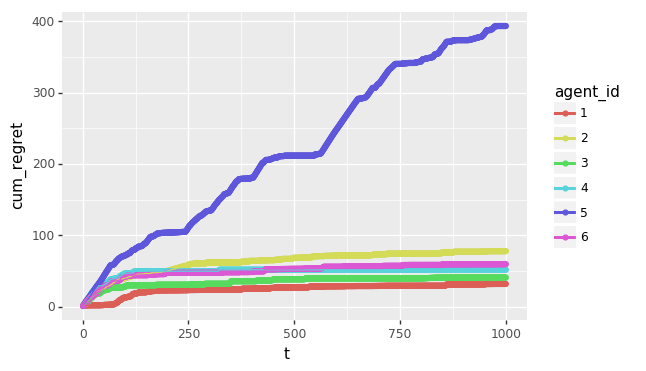

<ggplot: (8751589318273)>


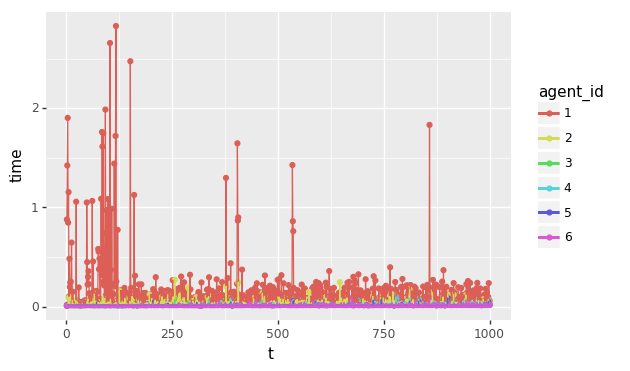

<ggplot: (8751589318273)>


([      action_id agent_id  cum_optimal  cum_regret  instant_regret     t  \
  0             1        1     0.973229    0.885113        0.885113     1   
  1             2        2     0.973229    0.956461        0.956461     1   
  2             3        3     0.973229    0.951172        0.951172     1   
  3             4        4     0.973229    0.959091        0.959091     1   
  4             5        5     0.973229    0.969605        0.969605     1   
  5             6        6     0.973229    0.907152        0.907152     1   
  6             7        1     1.946458    0.885927        0.000814     2   
  7             8        2     1.946458    1.491379        0.534917     2   
  8             9        3     1.946458    1.912446        0.961274     2   
  9            10        4     1.946458    1.918182        0.959091     2   
  10           11        5     1.946458    1.675834        0.706228     2   
  11           12        6     1.946458    1.787388        0.880236     2   

In [6]:
#old
agents = [make_laplace_agent(),
               make_pgts_agent(),
               make_best_langevin_agent(),
               make_mala_agent(),
               make_best_sgld_agent(),
               make_best_sagald_agent()]
                #,make_mala_agent_untimed]
#simple_compares(make_agents, num_articles, dim, var, 1000, [1], verbosity=verbosity)
#simple_compares(make_agents, num_articles, dim, var, 1000, range(100,105), verbosity=verbosity)
simple_compare(agents, num_articles, dim, var, 1000, seed=1, verbosity=1)